In [1]:
import pandas as pd
from datetime import datetime, timedelta
import numpy
from gurobipy import *


In [2]:
import numpy as np
import pandas as pd

In [3]:
lower_data = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_lower")
upper_data = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_upper")

In [4]:
%matplotlib inline


In [5]:
age_groups = ['age_group_0_9', 'age_group_10_19', 'age_group_20_29','age_group_30_39', 'age_group_40_49', 'age_group_50_59', 'age_group_60_69', 'age_group_70_79', 'age_group_80_plus']
econ_activities = ['transport', 'leisure', 'other']
cont = [ 'S', 'E', 'I', 'R', 'N', 'Ia', 'Ips', \
           'Ims', 'Iss', 'Rq', 'H', 'ICU', 'D' ]

In [6]:
data = pd.read_csv("donnees-hospitalieres-classe-age-covid19-2020-07-27-19h00.csv", sep=";")
data.head()

,reg,cl_age90,jour,hosp,rea,rad,dc
0,1,0,2020-03-18,0,0,0,0
1,1,9,2020-03-18,0,0,0,0
2,1,19,2020-03-18,0,0,0,0
3,1,29,2020-03-18,0,0,0,0
4,1,39,2020-03-18,0,0,0,0


In [7]:
# Extract days 
days = data[data['reg']==11][data['cl_age90']==0].jour.values
days

/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


array(['2020-03-18', '2020-03-19', '2020-03-20', '2020-03-21',
       '2020-03-22', '2020-03-23', '2020-03-24', '2020-03-25',
       '2020-03-26', '2020-03-27', '2020-03-28', '2020-03-29',
       '2020-03-30', '2020-03-31', '2020-04-01', '2020-04-02',
       '2020-04-03', '2020-04-04', '2020-04-05', '2020-04-06',
       '2020-04-07', '2020-04-08', '2020-04-09', '2020-04-10',
       '2020-04-11', '2020-04-12', '2020-04-13', '2020-04-14',
       '2020-04-15', '2020-04-16', '2020-04-17', '2020-04-18',
       '2020-04-19', '2020-04-20', '2020-04-21', '2020-04-22',
       '2020-04-23', '2020-04-24', '2020-04-25', '2020-04-26',
       '2020-04-27', '2020-04-28', '2020-04-29', '2020-05-01',
       '2020-05-02', '2020-05-03', '2020-05-04', '2020-05-05',
       '2020-05-06', '2020-05-07', '2020-05-08', '2020-05-09',
       '2020-05-10', '2020-05-11', '2020-05-12', '2020-05-13',
       '2020-05-14', '2020-05-15', '2020-05-16', '2020-05-17',
       '2020-05-18', '2020-05-19', '2020-05-20', '2020-

In [8]:
beds_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].hosp.values for i in range(0,9)
}
beds_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].hosp.values
beds_real['total']=data[data['reg']==11][data['cl_age90']==0].hosp.values

icus_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].rea.values for i in range(0,9)
}
icus_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].rea.values
icus_real['total']=data[data['reg']==11][data['cl_age90']==0].rea.values

deaths_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].dc.values for i in range(0,9)
}
deaths_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].dc.values
deaths_real['total']=data[data['reg']==11][data['cl_age90']==0].dc.values


/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/sergioacamelogomez/opt/anaconda3/lib/pyth

In [9]:
mult_deaths = np.sum(data[data['reg']==11][data['cl_age90']==0].hosp.values)/np.sum(data[data['reg']==11][data['cl_age90']==0].dc.values)
print(mult_deaths)
mult_icus = np.sum(data[data['reg']==11][data['cl_age90']==0].hosp.values)/np.sum(data[data['reg']==11][data['cl_age90']==0].rea.values)
print(mult_icus)


1.2044049618865522
6.93086556254271


/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [10]:
import yaml
from inspect import getsourcefile
import os.path
import sys
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import argparse
current_path = os.path.abspath(getsourcefile(lambda:0))
current_dir = os.path.dirname(current_path)
parentdir = os.path.dirname(current_dir)
sys.path.insert(0,parentdir) 
sys.path.insert(0, parentdir+"/heuristics")
sys.path.insert(0, parentdir+"/heuristics/LP-Models")
sys.path.insert(0, parentdir+"/fast_gradient")


from fast_group import FastDynamicalModel
from aux import *


In [11]:
region = "Ile-de-France"

In [12]:
# Read group parameters
with open("../parameters/"+region+".yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    universe_params = yaml.load(file, Loader=yaml.FullLoader)
    
# Read initialization
with open("../initialization/patient_zero.yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    original_initialization = yaml.load(file, Loader=yaml.FullLoader)

# Read econ parameters
with open("../parameters/econ.yaml") as file:
    econ_params = yaml.load(file, Loader=yaml.FullLoader)

experiment_params = {
    'delta_schooling':0.5,
    'xi':0,
    'icus':3000,
}

In [13]:
date_1 = datetime.strptime("2020-03-17", '%Y-%m-%d')
date_2 = datetime.strptime("2020-04-14", '%Y-%m-%d')
date_3 = datetime.strptime("2020-05-11", '%Y-%m-%d')
date_4 = datetime.strptime("2020-06-02", '%Y-%m-%d')
date_5 = datetime.strptime("2020-06-15", '%Y-%m-%d')
date_6 = datetime.strptime("2020-06-22", '%Y-%m-%d')
date_7 = datetime.strptime("2020-07-06", '%Y-%m-%d')
#final_date = datetime.strptime(days[-1], '%Y-%m-%d') + timedelta(days=1)
final_date = datetime.strptime("2020-07-27", '%Y-%m-%d')

In [14]:
(final_date-date_1).days+140

272

In [15]:
from copy import deepcopy

In [16]:
# Create model
mixing_method = {}
dynModel = FastDynamicalModel(universe_params, econ_params, experiment_params, 1, mixing_method)


In [17]:
params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params", index_col = 0)
initial_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_lower", index_col = 0)
lower_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_upper", index_col = 0)
upper_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

In [18]:
# Construct the windows for the parameters to move
windows = {}
for p in initial_params:
    windows[p] = (
        np.min(upper_params[p]/initial_params[p]),
        np.max(lower_params[p]/initial_params[p]),
    )
    
windows['beta_mixing'] = (0.1,4.0)
windows['alpha_mixing'] = (0.1,4.0)
windows['gamma_mixing'] = (0.5,2.0)

In [109]:
import copy
import math
best_v = 0
best_error = float('inf')
def error(v):

    days_ahead = v[0]
    alpha_mixing = v[1]
    beta_mixing = v[2]
    gamma_mixing_before = v[3]
    gamma_mixing_after = v[3]*(1-v[4])
    gamma_change = v[5] + v[0]

    upper_bound_home = 1.0
    upper_bound_leisure = 1.0
    upper_bound_other = 1.0
    upper_bound_school = 1.0
    upper_bound_work = 1.0
    upper_bound_transport = 1.0
    
    work_alpha = v[6]
    work_beta = v[7]
    
    leisure_alpha = v[8]
    leisure_beta = v[9]
    
    other_alpha = v[10]
    other_beta = v[11]
    
    transport_alpha = v[12]
    transport_beta = v[13]
    
    school_alpha = v[14]
    school_beta = v[15]
    
    
    # Number of days
    days_before_date_1 = int(days_ahead)
    days_between_dates_1_2 = (date_2-date_1).days
    days_between_dates_2_3 = (date_3-date_2).days
    days_between_dates_3_4 = (date_4-date_3).days
    days_between_dates_4_5 = (date_5-date_4).days
    days_between_dates_5_6 = (date_6-date_5).days
    days_between_dates_6_7 = (date_7-date_6).days

    days_after_date_7 = (final_date-date_7).days
    total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_between_dates_5_6+ days_between_dates_6_7 + days_after_date_7
    days_denom = days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7
    

    # Construct initialization
    initialization = copy.deepcopy(original_initialization)
    for i,group in enumerate(age_groups):
        if group == "age_group_40_49":
            initialization[group]["I"] = initialization[group]["I"] + 1
            initialization[group]["S"] = initialization[group]["S"] - 1
        initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


    # Alphas
    a_before_date_1 = {
        'home':upper_bound_home,
        'leisure':upper_bound_leisure,
        'other':upper_bound_other,
        'school':upper_bound_school,
        'transport':upper_bound_transport,
        'work':upper_bound_work
    }
    
    work_between_date_1_2 = work_alpha/days_denom*0 +work_beta
    a_between_date_1_2 = {
        'home':upper_bound_home,
        'leisure':(work_between_date_1_2*leisure_alpha + leisure_beta)*upper_bound_leisure,
        'other':(work_between_date_1_2*other_alpha + other_beta)*upper_bound_other,
        'school':(work_between_date_1_2*school_alpha + school_beta)*upper_bound_school,
        'transport':(work_between_date_1_2*transport_alpha + transport_beta)*upper_bound_transport,
        'work':work_between_date_1_2*upper_bound_work
    }
    
    violation = (
        max(-(1-leisure_alpha)*work_between_date_1_2*upper_bound_work + leisure_beta,0)+
        max(-(1-other_alpha)*work_between_date_1_2*upper_bound_work + other_beta,0)+
        max(-(1-school_alpha)*work_between_date_1_2*upper_bound_work + school_beta,0)+
        max(-(1-transport_alpha)*work_between_date_1_2*upper_bound_work + transport_beta,0)+
        max(work_alpha+work_beta-1,0)
    )
    
    work_between_date_2_3 = work_alpha/days_denom*(days_between_dates_1_2) +work_beta
    a_between_date_2_3 = {
        'home':upper_bound_home,
        'leisure':(work_between_date_2_3*leisure_alpha + leisure_beta)*upper_bound_leisure,
        'other':(work_between_date_2_3*other_alpha + other_beta)*upper_bound_other,
        'school':(work_between_date_2_3*school_alpha + school_beta)*upper_bound_school,
        'transport':(work_between_date_2_3*transport_alpha + transport_beta)*upper_bound_transport,
        'work':work_between_date_2_3*upper_bound_work
    }
    
    work_between_date_3_4 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3) +work_beta
    a_between_date_3_4 = {
        'home':upper_bound_home,
        'leisure':(work_between_date_3_4*leisure_alpha + leisure_beta)*upper_bound_leisure,
        'other':(work_between_date_3_4*other_alpha + other_beta)*upper_bound_other,
        'school':(work_between_date_3_4*school_alpha + school_beta)*upper_bound_school,
        'transport':(work_between_date_3_4*transport_alpha + transport_beta)*upper_bound_transport,
        'work':work_between_date_3_4*upper_bound_work
    }
    
    work_between_date_4_5 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4) +work_beta
    a_between_date_4_5 = {
        'home':upper_bound_home,
        'leisure':(work_between_date_4_5*leisure_alpha + leisure_beta)*upper_bound_leisure,
        'other':(work_between_date_4_5*other_alpha + other_beta)*upper_bound_other,
        'school':(work_between_date_4_5*school_alpha + school_beta)*upper_bound_school,
        'transport':(work_between_date_4_5*transport_alpha + transport_beta)*upper_bound_transport,
        'work':work_between_date_4_5*upper_bound_work
    }
    
    work_between_date_5_6 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5) +work_beta
    a_between_date_5_6 = {
        'home':upper_bound_home,
        'leisure':(work_between_date_5_6*leisure_alpha + leisure_beta)*upper_bound_leisure,
        'other':(work_between_date_5_6*other_alpha + other_beta)*upper_bound_other,
        'school':(work_between_date_5_6*school_alpha + school_beta)*upper_bound_school,
        'transport':(work_between_date_5_6*transport_alpha + transport_beta)*upper_bound_transport,
        'work':work_between_date_5_6*upper_bound_work
    }
    
    work_between_date_6_7 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6) +work_beta
    a_between_date_6_7 = {
        'home':upper_bound_home,
        'leisure':(work_between_date_6_7*leisure_alpha + leisure_beta)*upper_bound_leisure,
        'other':(work_between_date_6_7*other_alpha + other_beta)*upper_bound_other,
        'school':(work_between_date_6_7*school_alpha + school_beta)*upper_bound_school,
        'transport':(work_between_date_6_7*transport_alpha + transport_beta)*upper_bound_transport,
        'work':work_between_date_6_7*upper_bound_work
    }
    
    work_after_date_7 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7) +work_beta
    a_after_date_7 = {
        'home':upper_bound_home,
        'leisure':(work_after_date_7*leisure_alpha + leisure_beta)*upper_bound_leisure,
        'other':(work_after_date_7*other_alpha + other_beta)*upper_bound_other,
        'school':(work_after_date_7*school_alpha + school_beta)*upper_bound_school,
        'transport':(work_after_date_7*transport_alpha + transport_beta)*upper_bound_transport,
        'work':work_after_date_7*upper_bound_work
    }

    # Determine mixing method
    mixing_method_before = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
        "fixed_gamma":gamma_mixing_before,
    }

    # Determine mixing method
    mixing_method_after = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
        "fixed_gamma":gamma_mixing_after,
    }
    #dynModel.mixing_method = mixing_method_after




    # Calculate alphas
    alphas_vec = []
    for t in range(days_before_date_1):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_before_date_1
        alphas_vec.append(alphas)
    for t in range(days_between_dates_1_2):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_1_2
        alphas_vec.append(alphas)
    for t in range(days_between_dates_2_3):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_2_3
        alphas_vec.append(alphas)
    for t in range(days_between_dates_3_4):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_3_4
        alphas_vec.append(alphas)
    for t in range(days_between_dates_4_5):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_4_5
        alphas_vec.append(alphas)
    for t in range(days_between_dates_5_6):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_5_6
        alphas_vec.append(alphas)
    for t in range(days_between_dates_6_7):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_6_7
        alphas_vec.append(alphas)
    for t in range(days_after_date_7):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_after_date_7
        alphas_vec.append(alphas)

    mixing_vec = []
    for t in range(int(gamma_change)):
        mixing_vec.append(mixing_method_before)
    for t in range(int(gamma_change),total_days):
        mixing_vec.append(mixing_method_after)
        
        
        
        
    # Calculate tests
    tests = np.zeros(len(age_groups))


    # Run model
    model_data_beds = {ag:[] for ag in age_groups+["total"]}
    model_data_icus = {ag:[] for ag in age_groups+["total"]}
    model_data_deaths = {ag:[] for ag in age_groups+["total"]}

    state = state_to_matrix(initialization)
    t_beds = 0
    t_icus = 0
    t_deaths = 0
    for i,ag in enumerate(age_groups):
        state_H = state[i,cont.index("H")]
        state_ICU = state[i,cont.index("ICU")]
        state_D = state[i,cont.index("D")]
        model_data_beds[ag].append(state_H)
        model_data_icus[ag].append(state_ICU)
        model_data_deaths[ag].append(state_D)
        t_beds+= state_H
        t_icus+= state_ICU
        t_deaths+= state_D
    model_data_beds["total"].append(t_beds)
    model_data_icus["total"].append(t_icus)
    model_data_deaths["total"].append(t_deaths)

    recalc_days = [0,
                 days_before_date_1,
                 days_before_date_1+days_between_dates_1_2,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7,
                int(gamma_change)
                ]

    for t in range(total_days):
        if t in recalc_days:
            update_contacts = True
        else:
            update_contacts = False
        if t < universe_params['days_before_gamma']:
            lockdown_status = "pre-gamma"
        else:
            lockdown_status = "post-gamma"
        dynModel.mixing_method = mixing_vec[t]
        state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), lockdown_status, update_contacts=update_contacts)
        t_beds = 0
        t_icus = 0
        t_deaths = 0
        for i,ag in enumerate(age_groups):
            state_H = state[i,cont.index("H")]
            state_ICU = state[i,cont.index("ICU")]
            state_D = state[i,cont.index("D")]
            model_data_beds[ag].append(state_H)
            model_data_icus[ag].append(state_ICU)
            model_data_deaths[ag].append(state_D)
            t_beds+= state_H
            t_icus+= state_ICU
            t_deaths+= state_D
        print(t_beds)
        model_data_beds["total"].append(t_beds)
        model_data_icus["total"].append(t_icus)
        model_data_deaths["total"].append(t_deaths)


    initial_date = date_1-timedelta(days=days_before_date_1)

    # Calculate the days of the model
    days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

    # Indices where to put the real data
    indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

    # Real data
    real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

    for k,ind in enumerate(indices):
        for ag in age_groups+["total"]:
            real_data_beds[ag][ind] = beds_real[ag][k]
            real_data_icus[ag][ind] = icus_real[ag][k]
            real_data_deaths[ag][ind] = deaths_real[ag][k]


    error_beds = 0
    error_icus = 0
    error_deaths = 0
    for ag in age_groups:
        error_beds += np.nanmean(np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))
        error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
        error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
    error_beds_total = np.nanmean(np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))
    error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
    error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))

    diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
    error_beds_above = np.nanmean([max(d,0) for d in diff])
    error_beds_below = -np.nanmean([min(d,0) for d in diff])

    cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
    cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
    diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
    error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
    error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



    #     error = error_beds_total
    #     error = mult_icus*error_icus_total
    #     error = mult_deaths*error_deaths_total
    upper_model_data = model_data_beds["total"]
    upper_days_model = days_model
    upper_real_data = real_data_beds["total"]
    error = error_beds+5*error_beds_total + violation*1000000




    
    
    global best_error
    global best_v
    if error<best_error:
        best_error = error
        print(best_error)
        print("violation",violation)
        print("error_groups",error_beds)
        print("error_total",error_beds_total)
        best_v = v
        print(v)
        plt.figure(1)
        plt.plot(upper_days_model, upper_model_data, label="Upper")
        plt.plot(upper_days_model, upper_real_data, label="Model L1")
        plt.legend(loc='upper right')
        plt.show()
        print(a_before_date_1)
        print(a_between_date_1_2)
        print(a_between_date_2_3)
        print(a_between_date_3_4)
        print(a_between_date_4_5)
        print(a_between_date_5_6)
        print(a_between_date_6_7)
        print(a_after_date_7)
        

        # Calculate l-april and l-may
        l_april = a_between_date_1_2
        l_may = {}
        for a in a_between_date_1_2.keys():
            l_may[a] = a_between_date_1_2[a]/3.0 + a_between_date_3_4[a]*2.0/3.0

        eq_activities = ['leisure','other','school','transport']
        t = 0.5
        nu = (1-t)*(1-l_may["work"])/(1-0.5851)
        eta = t*(1-np.mean([l_may[act] for act in eq_activities]))/(1-0.5851)
        gamma = 1-nu-eta
        print(nu,eta,gamma)

    return error





In [110]:
%matplotlib inline

/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/_differentialevolution.py:494: UserWarning: differential_evolution: the 'workers' keyword has overridden updating='immediate' to updating='deferred'
  " updating='deferred'", UserWarning)


1793829.6168085085
violation 1.7547369381789304
890903.5444206331
error_groups 6517.187540545288
1704262.849257049
2345726.4980600704
error_total 6515.098217806544
violation 1.5602813655695476
violation 0.8497952499491097
violation 2.296314311086335
[6.01978429e+01 8.02597287e-01 2.33036227e+00 8.20402740e-01
 1.10485019e-01 3.91679150e+01 4.92839336e-01 1.20195879e-02
 7.66737015e-01 2.72679952e-01 9.64248194e-01 5.15422061e-01
 4.97954040e-01 5.17469933e-02 8.30517272e-01 9.26192877e-01]error_groups 8436.994552611279
error_groups 24095.443166104946
error_groups 6793.34169945236

error_total 23977.20810427929
error_total 6862.990554414194
error_total 8195.038484224762
[55.34709558  3.09539599  3.93255442  1.10372528  0.39224462 47.00783179
  0.44077746  0.20945876  0.876545    0.84965198  0.5305136   0.72671412
  0.2334901   0.09946601  0.15646756  0.28479729][59.85473169  1.5038848   0.54451549  0.79336406  0.18124776 16.9015
  0.75301289  0.11903114  0.60784702  0.16828086  0.981527

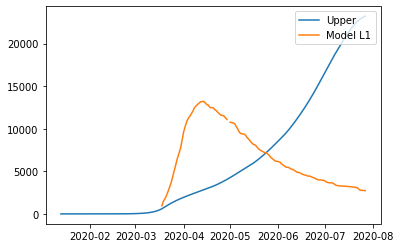

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.8229471479898981, 'other': 0.6843211366189137, 'school': 0.5868410491580244, 'transport': 0.35471330808217566, 'work': 0.03812708269066911}
{'home': 1.0, 'leisure': 0.8582102907478506, 'other': 0.7381446406300467, 'school': 0.6331031379803305, 'transport': 0.3649245608658807, 'work': 0.1041246718454222}
{'home': 1.0, 'leisure': 0.892214035550162, 'other': 0.7900458766407822, 'school': 0.677713009344697, 'transport': 0.3747711260501677, 'work': 0.16776520424464839}
{'home': 1.0, 'leisure': 0.9199207905742676, 'other': 0.8323357726495295, 'school': 0.714061793419366, 'transport': 0.3827942532373646, 'work': 0.2196204528662401}


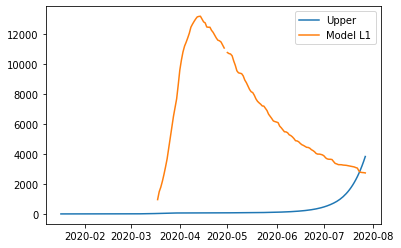

{'home': 1.0, 'leisure': 0.9362929639976026, 'other': 0.8573252566546985, 'school': 0.7355406203725796, 'transport': 0.3875351920297991, 'work': 0.25026219068808975}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.9451087496870908, 'other': 0.8707811326574817, 'school': 0.7471061425781562, 'transport': 0.39008800522572534, 'work': 0.266761587976778}
{'home': 1.0, 'leisure': 0.28189581505337236, 'other': 0.5270119268353939, 'school': 0.936175352130166, 'transport': 0.057732195670982665, 'work': 0.012019587877746152}
{'home': 1.0, 'leisure': 0.962740321066067, 'other': 0.8976928846630483, 'school': 0.7702371869893092, 'transport': 0.39519363161757787, 'work': 0.29976038255415455}
1.0550102469751883 0.4099069316882955 -0.4649171786634838


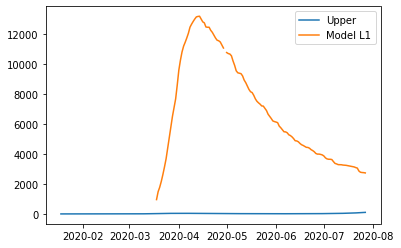

{'home': 1.0, 'leisure': 0.37721643224030865, 'other': 0.6468871006530692, 'school': 1.0394251202276894, 'transport': 0.11963775848012395, 'work': 0.13633942027441298}
{'home': 1.0, 'leisure': 0.4691327416705688, 'other': 0.7624810182629703, 'school': 1.138987396607444, 'transport': 0.17933240833179592, 'work': 0.2562192586569132}
{'home': 1.0, 'leisure': 0.5440275123174474, 'other': 0.8566686548340008, 'school': 1.2201122143983552, 'transport': 0.22797249339612122, 'work': 0.35389912696858}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24063358624999465, 'other': 0.42485508685969153, 'school': 0.2529572009275274, 'transport': 0.4074739237188411, 'work': 0.11903113695173623}
{'home': 1.0, 'leisure': 0.5882835131542392, 'other': 0.9123249855350642, 'school': 1.268049606729348, 'transport': 0.2567143618432225, 'work': 0.4116190491527467}
{'home': 1.0, 'leisure': 0.6121136674509733, 'other': 0.9422937789894832, 'school

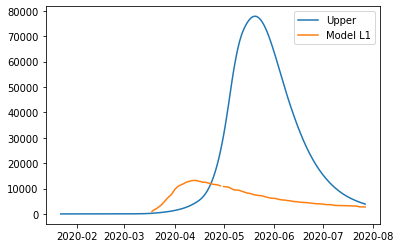

{'home': 1.0, 'leisure': 0.698350224582951, 'other': 1.1639581087958868, 'school': 0.8834577683986662, 'transport': 1.1234081988906257, 'work': 0.8720440227693869}
0.7619015036552469 0.5525325687463543 -0.31443407240160115


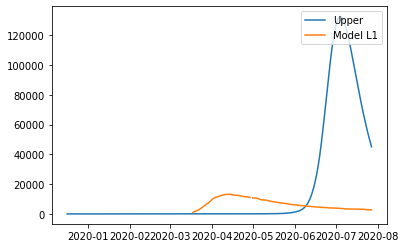

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0543968793474234, 'other': 0.030649526188135597, 'school': 0.9820133265954589, 'transport': 0.648653942605596, 'work': 0.21460281189027602}
{'home': 1.0, 'leisure': 1.0332520109264054, 'other': 0.8378348456375102, 'school': 0.3175707883633269, 'transport': 0.14837255338531752, 'work': 0.2094587597858983}
{'home': 1.0, 'leisure': 1.1579892037059007, 'other': 0.0370032670060384, 'school': 1.0969569863567852, 'transport': 0.7080176219935265, 'work': 0.33166695586703954}
{'home': 1.0, 'leisure': 1.130712513743207, 'other': 0.8968211183105348, 'school': 0.33496796366425974, 'transport': 0.17433364223989123, 'work': 0.3206458673302972}
{'home': 1.0, 'leisure': 1.2578818021944327, 'other': 0.043130088509016104, 'school': 1.20779551541235, 'transport': 0.7652611699747452, 'work': 0.44455023

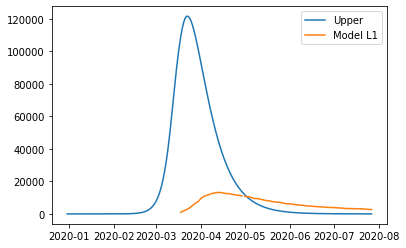

{'home': 1.0, 'leisure': 1.4196132899501546, 'other': 1.0716732837341436, 'school': 0.3865381618777391, 'transport': 0.25128972705880614, 'work': 0.6502362218369082}
{'home': 1.0, 'leisure': 1.4650664509113875, 'other': 0.05583757014482172, 'school': 1.4376828349350028, 'transport': 0.8839885287506062, 'work': 0.6786785255124457}
0.7772223132955253 0.42218617287570126 -0.19940848617122653
0.7617484988318014 0.27477998444226487 -0.03652848327406627
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.5926808030827407, 'other': 0.8861533549836245, 'school': 1.1155104842104109, 'transport': 0.5334006172199248, 'work': 0.3772617889401895}


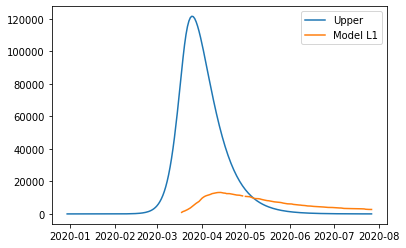

{'home': 1.0, 'leisure': 0.7178752579679499, 'other': 0.9915892863042666, 'school': 1.2737553963733546, 'transport': 0.654817385206877, 'work': 0.5449469182594507}
{'home': 1.0, 'leisure': 0.8385984823215444, 'other': 1.0932596486491715, 'school': 1.4263487045304788, 'transport': 0.7718978400514382, 'work': 0.7066432929601669}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.9369655540170658, 'other': 1.17610216611539, 'school': 1.5506839926585056, 'transport': 0.8672967291840434, 'work': 0.8383958945681578}
{'home': 1.0, 'leisure': 0.36317591419691897, 'other': 0.8392753778495137, 'school': 1.080024212700821, 'transport': 0.4118388094367764, 'work': 0.1002982566122061}
{'home': 1.0, 'leisure': 0.3987334121873213, 'other': 0.8987240570729881, 'school': 1.1851115787544264, 'transport': 0.5139518420403781, 'work': 0.2139410703639094}
{'home': 1.0, 'leisure': 0.9950915509280558, 'other': 1.2250545627999738, 'school': 1.62

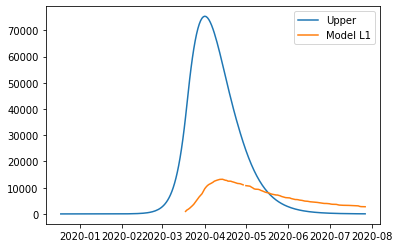

{'home': 1.0, 'leisure': 0.5041359955160138, 'other': 1.0749469276282873, 'school': 1.4966205566990425, 'transport': 0.8166440458296261, 'work': 0.5508108396993158}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
0.9048972921169661 0.2741440646294655 -0.17904135674643162
{'home': 1.0, 'leisure': 1.0071778226768098, 'other': 0.3411596471196684, 'school': 0.27047936263958, 'transport': 0.8594086368819764, 'work': 0.4569388458702324}
{'home': 1.0, 'leisure': 1.0170336326461262, 'other': 0.35413198121748485, 'school': 0.2733222214215262, 'transport': 1.0738571759611863, 'work': 0.6714459492256029}
{'home': 1.0, 'leisure': 1.0265374494022528, 'other': 0.3666410176689507, 'school': 0.2760635495326885, 'transport': 1.28064683864471, 'work': 0.8782920846039958}
{'home': 1.0, 'leisure': 1.0342813000924298, 'other': 0.3768335658886636, 'school': 0.278297224289932, 'transport': 1.4491421193498033, 'work': 1.0468333800975012}
{'home': 1.0, 'leisure': 1.038

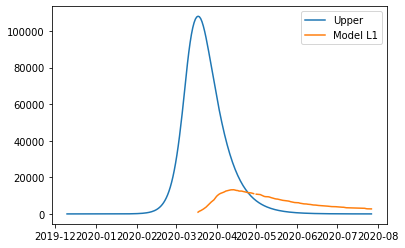

0.315930338604393 0.3637419478774765 0.3203277135181305
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.12123477989935544, 'other': 0.8863844299582411, 'school': 0.8304645923725487, 'transport': 0.2717275719302301, 'work': 0.2185939909293056}
{'home': 1.0, 'leisure': 0.17293023583661343, 'other': 1.0016860653148703, 'school': 0.8511111178911629, 'transport': 0.3377481650207692, 'work': 0.40409431241220134}


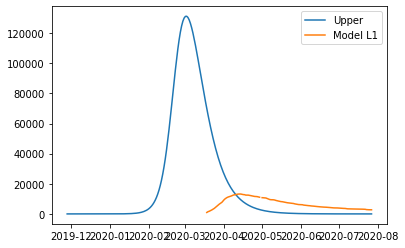

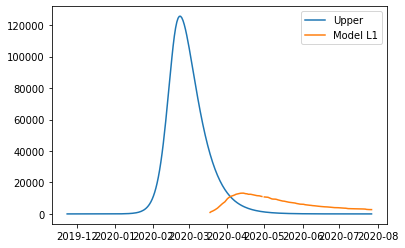

{'home': 1.0, 'leisure': 0.22277942549039792, 'other': 1.1128697851230482, 'school': 0.8710202674983981, 'transport': 0.40141087978664614, 'work': 0.5829696224135652}
{'home': 1.0, 'leisure': 0.26339728372681487, 'other': 1.203463927188971, 'school': 0.8872425375487379, 'transport': 0.45328420292921257, 'work': 0.728719875007269}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2873987454119703, 'other': 1.2569968293188345, 'school': 0.896828424396666, 'transport': 0.48393662114981995, 'work': 0.8148450242671847}
{'home': 1.0, 'leisure': 1.0326340651952777, 'other': 0.2917969775809737, 'school': 0.4755177033017232, 'transport': 0.5259821519175312, 'work': 0.34528225158504705}
{'home': 1.0, 'leisure': 0.6854115943434372, 'other': 0.7383806961143963, 'school': 0.5981120755346907, 'transport': 0.5934175863280979, 'work': 0.4314226434

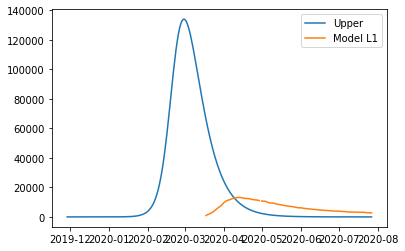

0.6489382036810332 0.4693930173980321 -0.11833122107906524
{'home': 1.0, 'leisure': 1.1187230084603352, 'other': 0.824137876423376, 'school': 1.0009984593675214, 'transport': 0.6999873340826105, 'work': 0.8896822954115755}
{'home': 1.0, 'leisure': 1.1806236638631034, 'other': 0.37481091672107, 'school': 0.5642007646253911, 'transport': 0.7476866623170754, 'work': 0.594717443771873}
{'home': 1.0, 'leisure': 1.205608920781048, 'other': 0.388826257095372, 'school': 0.5791732295241923, 'transport': 0.7851172939429725, 'work': 0.6368298788164021}
{'home': 1.0, 'leisure': 1.191879480973578, 'other': 0.8386163614106065, 'school': 1.0690182384561813, 'transport': 0.7179796291580477, 'work': 0.9670508080859832}
{'home': 1.0, 'leisure': 1.2312714277114778, 'other': 0.8464124687114227, 'school': 1.1056442733500749, 'transport': 0.7276677880448215, 'work': 1.0087107764491257}
{'home': 1.0, 'leisure': 1.2190625206599413, 'other': 0.3963729788353807, 'school': 0.5872353260081621, 'transport': 0.8052

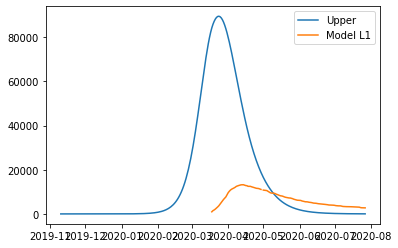

0.42222038404533274 0.26961447596573357 0.30816513998893375
{'home': 1.0, 'leisure': 0.6357265157410256, 'other': 1.1589828950127286, 'school': 0.18675354420625567, 'transport': 0.9109626663085832, 'work': 0.4774005392310848}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.6826213215309117, 'other': 1.2212307932310937, 'school': 0.22432964178085008, 'transport': 1.021254866195687, 'work': 0.6517435535992678}
{'home': 1.0, 'leisure': 0.7278413128283019, 'other': 1.2812555522273743, 'school': 0.2605637358706375, 'transport': 1.1276080589439657, 'work': 0.8198600317400158}
{'home': 1.0, 'leisure': 0.9139891526029373, 'other': 1.1823114021755794, 'school': 0.6201228225196047, 'transport': 0.9194604424016026, 'work': 0.3834379101144606}
{'home': 1.0, 'leisure': 0.7646872316632123, 'other': 1.3301646151132325, 'school': 0.29008781253639027, 'transport': 1.2142662159981186, 'work': 0.9568438287435881}
{'home': 1.0, 'leisure'

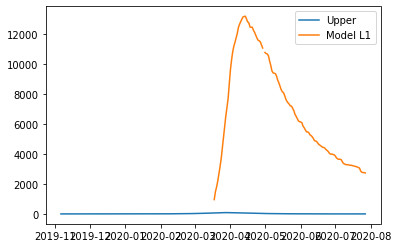

{'home': 1.0, 'leisure': 0.9420403065050146, 'other': 1.4889828188453933, 'school': 0.9742916367817797, 'transport': 0.958500596367638, 'work': 0.8233311299297997}
0.35465549822804027 0.23228860960380487 0.4130558921681548
{'home': 1.0, 'leisure': 0.9460889266558298, 'other': 1.5332446727977376, 'school': 1.0254087852319906, 'transport': 0.9641352577647977, 'work': 0.8868208729959312}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
0.542636092400871 0.026799546778722344 0.4305643608204067
{'home': 1.0, 'leisure': 0.30583768672920575, 'other': 0.8395708147472596, 'school': 0.45874934409501933, 'transport': 0.5752300164612137, 'work': 0.4642818883912325}
{'home': 1.0, 'leisure': 0.30685111369571816, 'other': 0.8409942559935862, 'school': 0.46405536013316245, 'transport': 0.5792294076810884, 'work': 0.47111087913490374}
{'home': 1.0, 'leisure': 0.30782834684199806, 'other': 0.842366860052544, 'school': 0.46917187559851486, 'transport': 0.583085963

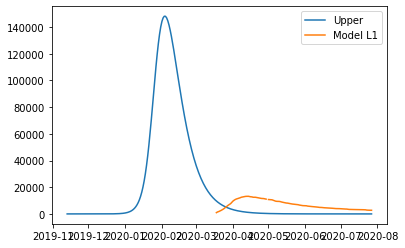

{'home': 1.0, 'leisure': 0.3093484872917667, 'other': 0.844502021922034, 'school': 0.4771308996557296, 'transport': 0.5890850503300652, 'work': 0.4879394634675221}
{'home': 1.0, 'leisure': 0.30985520077502293, 'other': 0.8452137425451973, 'school': 0.47978390767480117, 'transport': 0.5910847459400026, 'work': 0.49135395883935773}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
0.634822108501943 0.543876641558275 -0.17869875006021796
{'home': 1.0, 'leisure': 0.28864212783629234, 'other': 0.3740008475594433, 'school': 0.6346829043346726, 'transport': 0.9978325200709854, 'work': 0.0061325715844128825}
{'home': 1.0, 'leisure': 0.3184232298978378, 'other': 0.3863717568290899, 'school': 0.6438816292528474, 'transport': 1.0321176175556757, 'work': 0.05028158473576586}


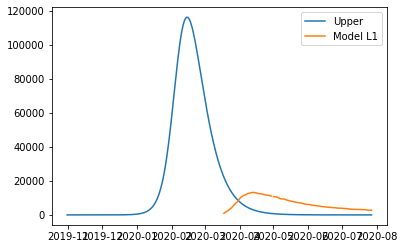

{'home': 1.0, 'leisure': 0.34714072117147093, 'other': 0.3983008479105349, 'school': 0.6527518282810874, 'transport': 1.0651782472730553, 'work': 0.09285384741742767}
{'home': 1.0, 'leisure': 0.37054015850554234, 'other': 0.40802084805097155, 'school': 0.6599793978596533, 'transport': 1.0921165381538835, 'work': 0.12754235775063358}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.38436709874840275, 'other': 0.41376448449759323, 'school': 0.6642502344288059, 'transport': 1.108034619128918, 'work': 0.1480401138566189}
{'home': 1.0, 'leisure': 0.8711129630388185, 'other': 0.8420782779189273, 'school': 1.003153635212257, 'transport': 0.3823902506084169, 'work': 0.0651459121608865}
{'home': 1.0, 'leisure': 0.3918123742637891, 'other': 0.4168572118150049, 'school': 0.6665499156583496, 'transport': 1.1166058935000907, 'work': 0.15907736714445714}
{'home': 1.0, 'leisure': 0.9102055482208139, 'other': 0.9684307263609264, 'scho

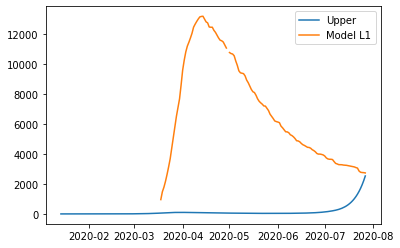


{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.16947826936795438, 'other': 0.7516202678941554, 'school': 0.5058970636757425, 'transport': 0.3935161500348717, 'work': 0.09887044503298892}
{'home': 1.0, 'leisure': 0.2645886966766854, 'other': 0.881608143885435, 'school': 0.6363074548150783, 'transport': 0.5260745426046773, 'work': 0.2572082226475512}
{'home': 1.0, 'leisure': 0.35630232301010467, 'other': 1.0069535957341689, 'school': 0.7620603319851522, 'transport': 0.6538987068684183, 'work': 0.409891079633022}
{'home': 1.0, 'leisure': 0.43103194446696474, 'other': 1.109086926870174, 'school': 0.8645256393089161, 'transport': 0.758051729601837, 'work': 0.5342993334730353}
{'home': 1.0, 'leisure': 0.4751903571460184, 'other': 1.169438440723268, 'school': 0.925073320909322, 'transport': 0.8195966975806752, 'work': 0.6078133016512248}
{'home': 1.0, 'leisure': 0.4989679639732012, 'other': 1.201935409721088, 'school': 0.9

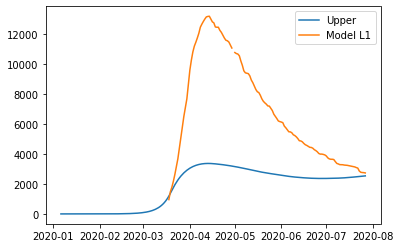


{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3917460596186079, 'other': 0.6760722969811437, 'school': 0.27513120565689936, 'transport': 0.42718527765403586, 'work': 0.10249799598164783}
{'home': 1.0, 'leisure': 0.4107728202762608, 'other': 0.7185035537171117, 'school': 0.278379047427784, 'transport': 0.48238854145258286, 'work': 0.19112275435150464}
{'home': 1.0, 'leisure': 0.4291200537675689, 'other': 0.7594194084267953, 'school': 0.2815108948497085, 'transport': 0.5356202601154675, 'work': 0.2765823427795808}
{'home': 1.0, 'leisure': 0.4440696514271533, 'other': 0.792758253005056, 'school': 0.2840627705268321, 'transport': 0.5789942531000402, 'work': 0.34621608149875405}
{'home': 1.0, 'leisure': 0.452903504589635, 'other': 0.8124584793467554, 'school': 0.2855706970633142, 'transport': 0.6046243398636513, 'work': 0.38736329074190184}
{'home': 1.0, 'leisure': 0.45766019475404823, 'other': 0.8230662935307475, 'scho

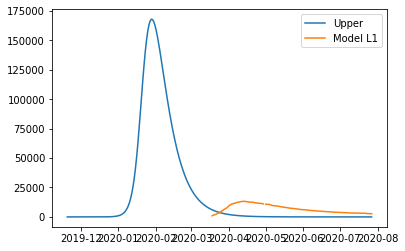

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.028024124400431, 'other': 0.83831333416832, 'school': 0.9520435344560414, 'transport': 0.29317098727652013, 'work': 0.3926680732321267}
{'home': 1.0, 'leisure': 1.0554724540774247, 'other': 0.8731309136728802, 'school': 0.9875074517929585, 'transport': 0.3174801185041559, 'work': 0.5122930850103549}
{'home': 1.0, 'leisure': 1.0819404862659545, 'other': 0.9067050081951347, 'school': 1.0217048006535572, 'transport': 0.3409210664736618, 'work': 0.6276457749393605}
{'home': 1.0, 'leisure': 1.1035070310121642, 'other': 0.9340616778058606, 'school': 1.0495693071325636, 'transport': 0.3600210981525185, 'work': 0.7216368556222541}
{'home': 1.0, 'leisure': 1.116250898362197, 'other': 0.950226982575835, 'school': 1.0660346973247037, 'transport': 0.3713074805082065, 'work': 0.7771770396621457}
{'home': 1.0, 'leisure': 1.1231129807814455, 'other': 0.958931377451975, 'school': 1.0749

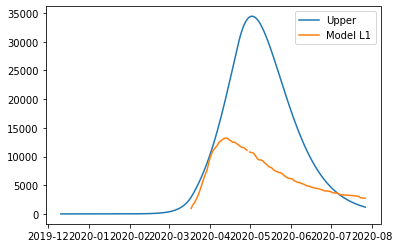

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.128663945405854, 'other': 1.0133959320990016, 'school': 0.8172214616660662, 'transport': 0.6309052242095978, 'work': 0.4544019810139832}


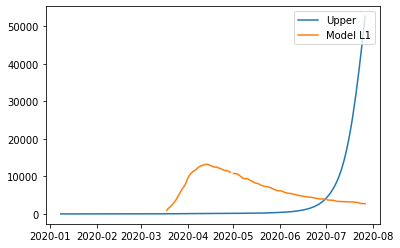

{'home': 1.0, 'leisure': 0.13441819438688218, 'other': 1.018253501275859, 'school': 0.8257386015678576, 'transport': 0.6581439076127136, 'work': 0.4915491401752951}
{'home': 1.0, 'leisure': 0.13996693447573083, 'other': 1.022937585839257, 'school': 0.8339515579017279, 'transport': 0.6844097808942897, 'work': 0.5273696150808459}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.14448813010368158, 'other': 1.0267542473353595, 'school': 0.8406435963959926, 'transport': 0.7058116035681663, 'work': 0.5565566687075909}
{'home': 1.0, 'leisure': 0.6151969185641477, 'other': 0.6615413192938113, 'school': 0.38372353183534874, 'transport': 0.8597408281577771, 'work': 0.24986250935693258}
{'home': 1.0, 'leisure': 0.7597281490363963, 'other': 0.7135418646473773, 'school': 0.5183338224836522, 'transport': 1.022394252902123, 'work': 0.4481313315975749}
{'home': 1.0, 'leisure': 0.14715974570201612, 'other': 1.029009547310329, 'school':

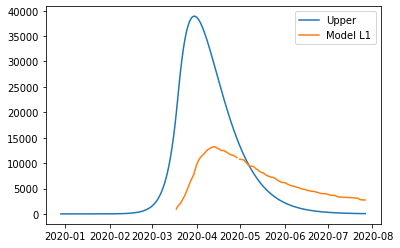

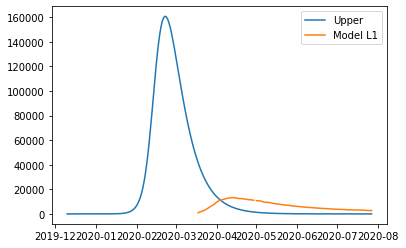

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4491076692982382, 'other': 0.46399380004514645, 'school': 0.42118583478201405, 'transport': 0.18569857826234468, 'work': 0.0633830098926304}
{'home': 1.0, 'leisure': 0.4747818586537219, 'other': 0.4709692212674078, 'school': 0.44584382818716595, 'transport': 0.21032839109103937, 'work': 0.12419179411131495}
{'home': 1.0, 'leisure': 0.27660093437303546, 'other': 0.49074266172592623, 'school': 0.47314397023540344, 'transport': 0.33988855504931786, 'work': 0.04607889595511758}
{'home': 1.0, 'leisure': 0.4995391126750811, 'other': 0.47769552030315987, 'school': 0.4696211789707052, 'transport': 0.2340785677472807, 'work': 0.18282883603647504}
{'home': 1.0, 'leisure': 0.3318685895098102, 'other': 0.5494584525315097, 'school': 0.5339262055200873, 'transport': 0.4050217517451184, 'work': 0.

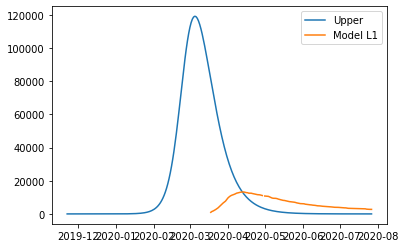

{'home': 1.0, 'leisure': 0.5197116900258183, 'other': 0.4831762084063652, 'school': 0.48899531664618173, 'transport': 0.2534305635412551, 'work': 0.23060716649401292}
{'home': 1.0, 'leisure': 0.38516239982027156, 'other': 0.6060772508083223, 'school': 0.592537646687461, 'transport': 0.4678287628446403, 'work': 0.2841003762706255}
{'home': 1.0, 'leisure': 0.5316318493694357, 'other': 0.4864147968309866, 'school': 0.5004436707271451, 'transport': 0.2648658337831491, 'work': 0.2588398163098308}
{'home': 1.0, 'leisure': 0.5380503967083067, 'other': 0.48815865213655196, 'school': 0.5066081690784331, 'transport': 0.27102328699032274, 'work': 0.2740420123645019}
{'home': 1.0, 'leisure': 0.428586985999166, 'other': 0.6522110864412808, 'school': 0.640295117268284, 'transport': 0.5190048459627693, 'work': 0.3793089683968287}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.45424696874124, 'other': 0.6794719893153016, 'school': 0

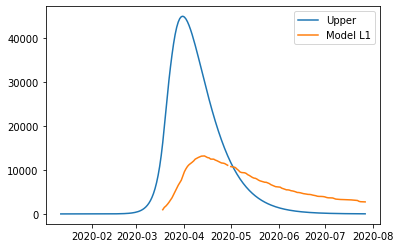

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.20976339406950215, 'other': 0.2107858861612743, 'school': 0.27582372591112025, 'transport': 0.7945424344469083, 'work': 0.1949318427437152}
{'home': 1.0, 'leisure': 0.2680267498030035, 'other': 0.24479229526051832, 'school': 0.3032470747418125, 'transport': 0.8225117734716503, 'work': 0.3187409081554262}
{'home': 1.0, 'leisure': 0.3242092714031656, 'other': 0.27758418974907506, 'school': 0.3296910182571229, 'transport': 0.8494822075312228, 'work': 0.4381282212310047}
{'home': 1.0, 'leisure': 0.3699876223366309, 'other': 0.3043035111841954, 'school': 0.35123793519552393, 'transport': 0.8714581167649487, 'work': 0.5354067726259205}
{'home': 1.0, 'leisure': 0.39703846607004223, 'other': 0.3200922011231301, 'school': 0.36397020429548815, 'transport': 0.8844438813121502, 'work': 0.5928895529956434}
{'home': 1.0, 'leisure': 0.4116043050034176, 'other': 0.3285938033979411, 'sch

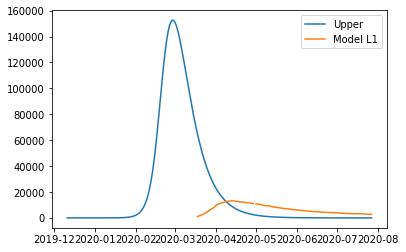

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


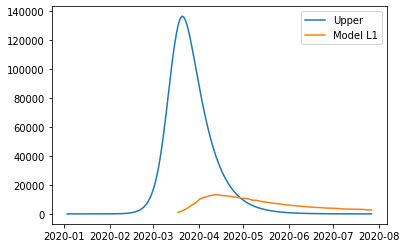

{'home': 1.0, 'leisure': 0.7792694989662486, 'other': 0.9872085837756397, 'school': 0.8395332113302832, 'transport': 0.2963313664181916, 'work': 0.3734002101805636}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.8132454418126535, 'other': 0.992379438610411, 'school': 0.8936221619004776, 'transport': 0.36826154010836, 'work': 0.5045987345130317}
{'home': 1.0, 'leisure': 0.8460079581288296, 'other': 0.9973656200582262, 'school': 0.9457793642360222, 'transport': 0.4376227790238795, 'work': 0.6311115972621975}
{'home': 1.0, 'leisure': 0.21756994837278681, 'other': 0.40384660014803286, 'school': 0.8912226228976786, 'transport': 0.44682776169845484, 'work': 0.38810414707632795}
{'home': 1.0, 'leisure': 0.8727033417938619, 'other': 1.0014284345712607, 'school': 0.9882778253983178, 'transport': 0.49413934406615473, 'work': 0.734196152094851}
{'home': 1.0, 'leisure': 0.28117122388711036, 'other': 0.5815896666677103, 'school':

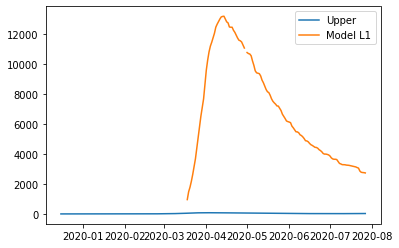

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.8406352067212737, 'other': 0.4714333379452884, 'school': 0.3885840008921936, 'transport': 0.5137926147481938, 'work': 0.42622549488552225}
{'home': 1.0, 'leisure': 0.8910558903261706, 'other': 0.5750281754476239, 'school': 0.4100443516321698, 'transport': 0.6811955264659997, 'work': 0.6038487184470553}
{'home': 1.0, 'leisure': 0.9396758352308927, 'other': 0.6749231973248757, 'school': 0.43073826127428966, 'transport': 0.8426197627653124, 'work': 0.7751282554528194}
{'home': 1.0, 'leisure': 0.9792920866347403, 'other': 0.7563191410767107, 'school': 0.4475999654271281, 'transport': 0.9741506219721597, 'work': 0.9146893596797383}
{'home': 1.0, 'leisure': 1.0027016897370138, 'other': 0.8044167442027951, 'school': 0.4575636996992599, 'transport': 1.0518734024125695, 'work': 0.9971572849047359}
{'home': 1.0, 'leisure': 1.015306860638238, 'other': 0.8303154535783789, 'school': 

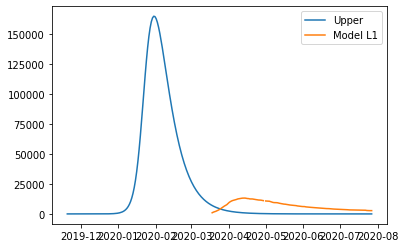

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


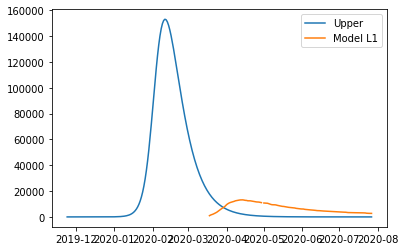

{'home': 1.0, 'leisure': 0.41021196274946276, 'other': 0.19812436358312027, 'school': 0.48654604089549547, 'transport': 0.9153855970307977, 'work': 0.3543026737064409}
{'home': 1.0, 'leisure': 0.44428843177653526, 'other': 0.21129953644322008, 'school': 0.4978102588646416, 'transport': 0.9439614092020816, 'work': 0.4093352801244426}
{'home': 1.0, 'leisure': 0.4771478840526409, 'other': 0.2240041674154592, 'school': 0.5086721833348897, 'transport': 0.9715166566529625, 'work': 0.4624024363132299}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.5039222525739121, 'other': 0.23435608894839477, 'school': 0.5175226403106473, 'transport': 0.9939690805018284, 'work': 0.5056423413559454}
{'home': 1.0, 'leisure': 0.42118946960612114, 'other': 0.37341753942067324, 'school': 0.9071757219330043, 'transport': 0.8119453043115534, 'work': 0.41109323575491946}
{'home': 1.0, 'leisure': 0.5197434703364816, 'other': 0.240473133490584, 'sc

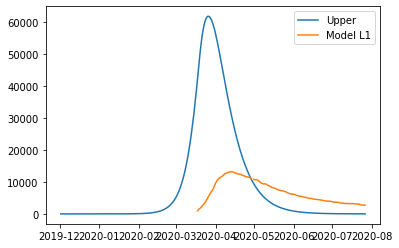

821050.2400988584
violation 0.7799062092547782
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.5510510300149364, 'other': 0.30744308583489693, 'school': 0.4319062830903206, 'transport': 1.0141674545847121, 'work': 0.22143079019470874}
error_groups 6799.297761545191
error_total 6868.9466165070235
{'home': 1.0, 'leisure': 0.6268298496482787, 'other': 0.3282167388088198, 'school': 0.48876716923445823, 'transport': 1.0880328660368432, 'work': 0.32780912590194505}
{'home': 1.0, 'leisure': 0.6999022828661445, 'other': 0.3482484756051026, 'school': 0.5435973094448767, 'transport': 1.1592602270799697, 'work': 0.4303882353339229}
[ 1.10773234e+02  3.28798986e+00  1.14415643e+00  5.93855415e-01
  3.98911440e-02 -3.16493934e+01  8.42879792e-01  2.90926896e-01
  2.01507081e-02  2.05903363e-02  1.11132927e-01  4.91380594e-01
  1.90802889e-01  5.05083213e-01  3.22107434e-01  3.40865436e-01]
{'home': 1.0, 'leisure': 0.75944278400662

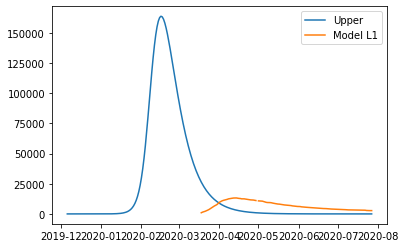

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3698420838737621, 'other': 0.9539758698929597, 'school': 1.2865060272068798, 'transport': 0.4029316616370673, 'work': 0.4299665439130382}
{'home': 1.0, 'leisure': 0.37161083473379874, 'other': 0.9728943787221991, 'school': 1.3110048350578947, 'transport': 0.4201060975353736, 'work': 0.45632526493969866}
{'home': 1.0, 'leisure': 0.37331641592026266, 'other': 0.9911372265218228, 'school': 1.334628685485659, 'transport': 0.4366671607230261, 'work': 0.4817426030725498}
{'home': 1.0, 'leisure': 0.3747061487388628, 'other': 1.006001769173368, 'school': 1.3538777487971707, 'transport': 0.45016136035740967, 'work': 0.5024530267363545}
{'home': 1.0, 'leisure': 0.37552735449530844, 'other': 1.014785362558372, 'school': 1.3652521952994277, 'transport': 0.45813520559590903, 'work': 0.5146910043558754}
{'home': 1.0, 'leisure': 0.3759695422103176, 'other': 1.019514989765682, 'school':

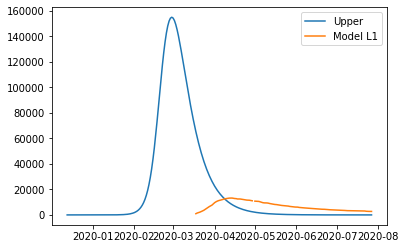

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.7873016724341034, 'other': 0.384514930696672, 'school': 0.3047787964065127, 'transport': 0.18588372303671397, 'work': 0.11629493963008067}
{'home': 1.0, 'leisure': 0.8563395819171691, 'other': 0.44307145811638027, 'school': 0.3906717760457724, 'transport': 0.24768199991779044, 'work': 0.245865518708342}
{'home': 1.0, 'leisure': 0.9229118517758396, 'other': 0.4995366809853847, 'school': 0.47349714926934433, 'transport': 0.3072731954816856, 'work': 0.37080857710523685}
{'home': 1.0, 'leisure': 0.977155923512534, 'other': 0.5455453811008697, 'school': 0.5409844904144769, 'transport': 0.35582898445967426, 'work': 0.4726140320952993}
{'home': 1.0, 'leisure': 1.0092092386296716, 'other': 0.5727323402600201, 'school': 0.580863373818419, 'transport': 0.3845210415830312, 'work': 0.5327718009530635}
{'home': 1.0, 'leisure': 1.026468716000438, 'other': 0.5873714721149471, 'school':

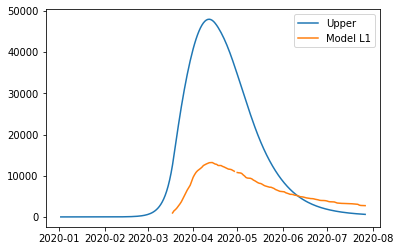

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.9734386620919268, 'other': 0.32481012023899425, 'school': 0.3564225471327639, 'transport': 0.10145639892936263, 'work': 0.29757108352994815}
{'home': 1.0, 'leisure': 1.0380542208424064, 'other': 0.3998988574522207, 'school': 0.39518339136349134, 'transport': 0.13423936867302352, 'work': 0.4011629209533889}
{'home': 1.0, 'leisure': 1.1003620810660832, 'other': 0.47230585405068903, 'school': 0.4325599197288357, 'transport': 0.16585151806869652, 'work': 0.501055049897421}
{'home': 1.0, 'leisure': 1.151131448655746, 'other': 0.531304147575367, 'school': 0.4630148687672644, 'transport': 0.1916095657244301, 'work': 0.5824486364444101}
{'home': 1.0, 'leisure': 1.1811315295041829, 'other': 0.5661667755672222, 'school': 0.48101097501724505, 'transport': 0.20683023024827268, 'work': 0.630544846676722}
{'home': 1.0, 'leisure': 1.197285419191803, 'other': 0.5849389598705288, 'school

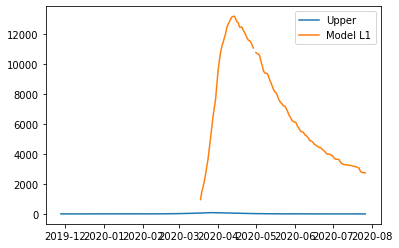

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.02645271920449534, 'other': 0.5237121517220515, 'school': 0.4345751520448445, 'transport': 0.5605929054608622, 'work': 0.29092689579286973}
{'home': 1.0, 'leisure': 0.030737129017454998, 'other': 0.5473410485485898, 'school': 0.503061095364808, 'transport': 0.601161096379685, 'work': 0.5035452216050973}
{'home': 1.0, 'leisure': 0.03486852419423753, 'other': 0.5701260562027516, 'school': 0.56910111213763, 'transport': 0.6402804233371212, 'work': 0.708570035781174}
{'home': 1.0, 'leisure': 0.0382348461901344, 'other': 0.5886916179950317, 'school': 0.6229114961747444, 'transport': 0.6721554304876249, 'work': 0.8756272917764958}
{'home': 1.0, 'leisure': 0.040224036460437096, 'other': 0.5996621772359244, 'school': 0.6547085412875846, 'transport': 0.6909906619856497, 'work': 0.9743429430464585}
{'home': 1.0, 'leisure': 0.04129513891367701, 'other': 0.605569401442559, 'school':

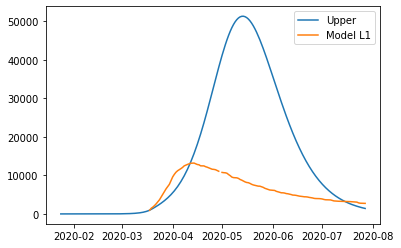

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.844343281530099, 'other': 0.24385398778491107, 'school': 0.6277609207339944, 'transport': 1.0338888087190448, 'work': 0.4736670675509248}
{'home': 1.0, 'leisure': 0.8463374736358963, 'other': 0.24687861592194155, 'school': 0.630525494383102, 'transport': 1.035750213826901, 'work': 0.4884740024056246}
{'home': 1.0, 'leisure': 0.8482604445950579, 'other': 0.24979522162550669, 'school': 0.6331913332590272, 'transport': 1.037545140180905, 'work': 0.5027521181583708}
{'home': 1.0, 'leisure': 0.8498273098210415, 'other': 0.2521717151617449, 'school': 0.6353634982690404, 'transport': 1.0390076727656492, 'work': 0.5143861384013493}
{'home': 1.0, 'leisure': 0.8507531847273045, 'other': 0.2535760067967948, 'school': 0.6366470503204117, 'transport': 1.0398718965657252, 'work': 0.5212607867267456}
{'home': 1.0, 'leisure': 0.8512517327537539, 'other': 0.25433216383105245, 'school': 0

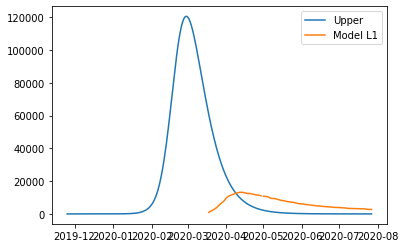

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.6993380677489334, 'other': 0.9456443478400691, 'school': 0.9265294299200204, 'transport': 0.47553864678472224, 'work': 0.48582050486914813}
{'home': 1.0, 'leisure': 0.7892094319732419, 'other': 1.107753954155375, 'school': 0.9461737972257918, 'transport': 0.5651830901443666, 'work': 0.6698431613677303}
{'home': 1.0, 'leisure': 0.8758711046181109, 'other': 1.2640739316737055, 'school': 0.9651165799849284, 'transport': 0.6516259462411664, 'work': 0.8472935801342203}
{'home': 1.0, 'leisure': 0.9464843193657819, 'other': 1.39144576520716, 'school': 0.9805514400108917, 'transport': 0.7220608660237442, 'work': 0.991882810240249}
{'home': 1.0, 'leisure': 0.9882103098984967, 'other': 1.4667109395678375, 'school': 0.9896720391171426, 'transport': 0.7636815004407219, 'work': 1.077321900757448}
{'home': 1.0, 'leisure': 1.0106781509545737, 'other': 1.5072383411466639, 'school': 0.99

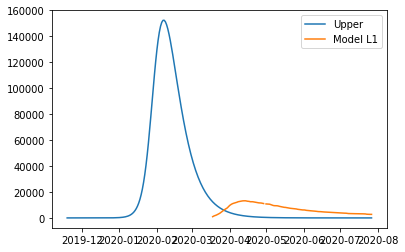

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.09090346443976428, 'other': 0.49961855669833, 'school': 0.35539636593717805, 'transport': 0.13035870162545798, 'work': 0.09190421364520202}
{'home': 1.0, 'leisure': 0.14453237284461393, 'other': 0.5628851352658347, 'school': 0.38400734852132906, 'transport': 0.1990893650171937, 'work': 0.1681686986618571}
{'home': 1.0, 'leisure': 0.19624596309214754, 'other': 0.6238921931702144, 'school': 0.4115965102989032, 'transport': 0.2653653618592246, 'work': 0.24170945207077452}
{'home': 1.0, 'leisure': 0.23838296255310085, 'other': 0.6736016477589681, 'school': 0.4340765680435933, 'transport': 0.3193680259527312, 'work': 0.3016315474410035}
{'home': 1.0, 'leisure': 0.2632820985982096, 'other': 0.7029754163795954, 'school': 0.44736023852909196, 'transport': 0.35127869109889426, 'work': 0.3370400583415934}
{'home': 1.0, 'leisure': 0.276689325699422, 'other': 0.7187920610214715, 'sc

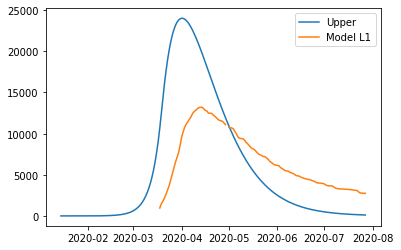

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.34421899294746966, 'other': 0.04348938652541617, 'school': 0.7139359496460167, 'transport': 0.2145118925035947, 'work': 0.051435230506350876}
{'home': 1.0, 'leisure': 0.3477926408478901, 'other': 0.052994940439748624, 'school': 0.7290664657593715, 'transport': 0.22542472972934893, 'work': 0.18343346097367258}
{'home': 1.0, 'leisure': 0.3512386584661526, 'other': 0.06216101028571207, 'school': 0.7436566062972494, 'transport': 0.23594782276846907, 'work': 0.3107174689243042}
{'home': 1.0, 'leisure': 0.3540465246736258, 'other': 0.06962965978983043, 'school': 0.7555448689577425, 'transport': 0.2445221948744188, 'work': 0.4144303642914856}
{'home': 1.0, 'leisure': 0.3557057183416781, 'other': 0.07404295267862765, 'school': 0.762569751438943, 'transport': 0.24958886930066185, 'work': 0.4757152570084564}
{'home': 1.0, 'leisure': 0.3565991303167832, 'other': 0.07641934115721076

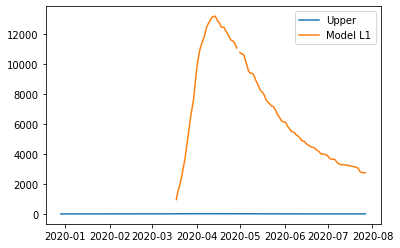

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.7826522744067218, 'other': 0.46307329316667556, 'school': 0.6203940163391021, 'transport': 0.6647130996859564, 'work': 0.47192918927113164}
{'home': 1.0, 'leisure': 0.801649503206835, 'other': 0.4647961258886711, 'school': 0.6400342256438345, 'transport': 0.7116520469471432, 'work': 0.5501904009786895}
{'home': 1.0, 'leisure': 0.8199682595498015, 'other': 0.4664574288705953, 'school': 0.6589729989019694, 'transport': 0.7569146032347163, 'work': 0.6256565694109775}
{'home': 1.0, 'leisure': 0.8348946536070333, 'other': 0.4678110831521632, 'school': 0.6744045919271162, 'transport': 0.7937952046542202, 'work': 0.6871475214669158}
{'home': 1.0, 'leisure': 0.843714795549943, 'other': 0.4686109697730897, 'school': 0.6835232605328849, 'transport': 0.8155882873111997, 'work': 0.7234830840454248}
{'home': 1.0, 'leisure': 0.8484641027499713, 'other': 0.46904167795358853, 'school': 

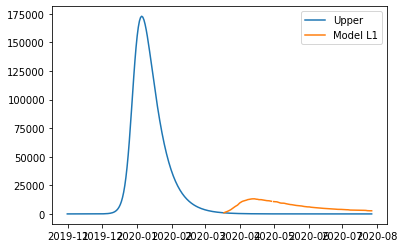

859893.9855788016
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
violation 0.8281421624958056
{'home': 1.0, 'leisure': 0.5958734245809301, 'other': 0.07609030305046953, 'school': 0.9638621666362226, 'transport': 0.5502458017027679, 'work': 0.48453916740435754}
error_groups 5266.016137150407
{'home': 1.0, 'leisure': 0.6029442648603704, 'other': 0.07921664415410114, 'school': 0.976787648767689, 'transport': 0.5681248030778201, 'work': 0.5078612647738097}
error_total 5297.161389169102
{'home': 1.0, 'leisure': 0.6097625751298308, 'other': 0.08223133021831733, 'school': 0.9892515065373172, 'transport': 0.5853652686894776, 'work': 0.5303504300943528}
[5.51042356e+01 3.71008975e+00 2.96045553e+00 1.18198016e+00
 2.34558476e-02 2.85883833e+01 2.86144463e-01 2.99577274e-01
 8.09336954e-01 1.13510691e-01 4.30376558e-02 4.94326318e-01
 3.19261218e-01 6.96797984e-01 5.61452090e-01 2.02622510e-01]{'home': 1.0, 'leisure': 0.615318235349391, 'other': 0.08468

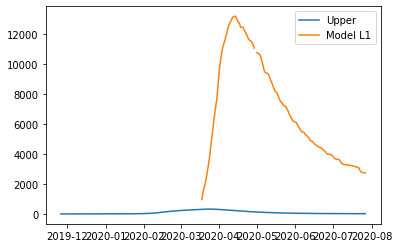

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.5246743967329364, 'other': 1.0428117816869606, 'school': 0.1902756473637115, 'transport': 0.9985293306847067, 'work': 0.4473332049419336}
{'home': 1.0, 'leisure': 0.5851019642634425, 'other': 1.089471004954331, 'school': 0.20481471262502024, 'transport': 1.0529511820987003, 'work': 0.5204281478096026}
{'home': 1.0, 'leisure': 0.6433714043821449, 'other': 1.1344638273907237, 'school': 0.21883452555556793, 'transport': 1.1054293959621944, 'work': 0.5909125570034262}
{'home': 1.0, 'leisure': 0.6908502074418283, 'other': 1.171124645672229, 'school': 0.2302580768323105, 'transport': 1.1481894220731894, 'work': 0.6483442978280232}
{'home': 1.0, 'leisure': 0.7189058637952777, 'other': 1.1927878564749368, 'school': 0.23700835713220383, 'transport': 1.1734567102296865, 'work': 0.6822812355880123}
{'home': 1.0, 'leisure': 0.7340127556779041, 'other': 1.2044526622917793, 'school': 

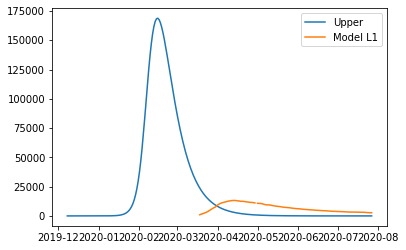

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.18441603962912484, 'other': 0.17826505319112163, 'school': 0.7651228674902374, 'transport': 0.6186586296616918, 'work': 0.20542540402652365}
{'home': 1.0, 'leisure': 0.2347084491993182, 'other': 0.31401080675589665, 'school': 0.8968847460590621, 'transport': 0.6470030429378938, 'work': 0.40205068196505167}
{'home': 1.0, 'leisure': 0.28320470128486175, 'other': 0.4449084976933583, 'school': 1.0239408432504287, 'transport': 0.6743351557399457, 'work': 0.5916536285486322}
{'home': 1.0, 'leisure': 0.3227201659471566, 'other': 0.5515658754942528, 'school': 1.127468033554505, 'transport': 0.6966057661712474, 'work': 0.7461449183574757}
873451.0904031254
{'home': 1.0, 'leisure': 0.34607021324760345, 'other': 0.614590689649327, 'school': 1.1886431914614595, 'transport': 0.7097656723351983, 'work': 0.8374352259717922}
{'home': 1.0, 'leisure': 0.3586433156401518, 'other': 0.648527

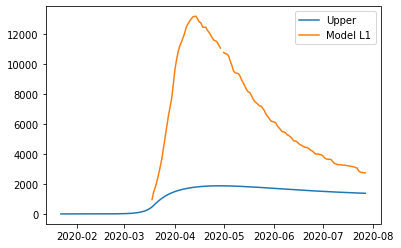

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3559696492674709, 'other': 0.5072194219671606, 'school': 0.3708207968534814, 'transport': 0.792441389313221, 'work': 0.29957727372638204}
{'home': 1.0, 'leisure': 0.4143880642125087, 'other': 0.5103259051486622, 'school': 0.4113467372784126, 'transport': 0.8154858508865679, 'work': 0.3717578589027772}
{'home': 1.0, 'leisure': 0.4707201071952238, 'other': 0.5133214425022529, 'school': 0.4504253226881677, 'transport': 0.8377072959751524, 'work': 0.44136056603715823}
{'home': 1.0, 'leisure': 0.516620290366325, 'other': 0.5157622507162898, 'school': 0.48226713302204216, 'transport': 0.8558136586399249, 'work': 0.4980738829614687}
{'home': 1.0, 'leisure': 0.5437431258765211, 'other': 0.5172045464791298, 'school': 0.5010827482193316, 'transport': 0.8665128729418359, 'work': 0.5315862975076522}
{'home': 1.0, 'leisure': 0.5583477296127806, 'other': 0.5179811672745052, 'school': 

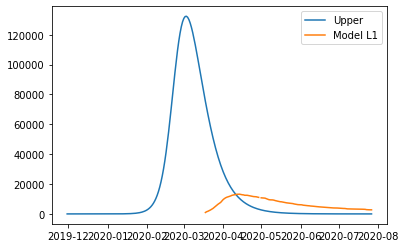

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3422952272312427, 'other': 0.37243007574497866, 'school': 0.1288770821891402, 'transport': 0.15900929624216043, 'work': 0.32363137697961963}
{'home': 1.0, 'leisure': 0.34746750911641455, 'other': 0.38234954602767557, 'school': 0.13120477878486475, 'transport': 0.16497066103698044, 'work': 0.33710030967450916}
{'home': 1.0, 'leisure': 0.3524550666485444, 'other': 0.3919147495145619, 'school': 0.1334493433593134, 'transport': 0.17071911994627118, 'work': 0.3500882090588669}
{'home': 1.0, 'leisure': 0.3565190024154651, 'other': 0.3997086190223952, 'school': 0.13527824782738268, 'transport': 0.17540304942791546, 'work': 0.36067094189056575}
{'home': 1.0, 'leisure': 0.35892041900500915, 'other': 0.40431408736793306, 'school': 0.13635896410396908, 'transport': 0.1781708259397962, 'work': 0.36692437492747876}
{'home': 1.0, 'leisure': 0.36021348947630205, 'other': 0.406793954938

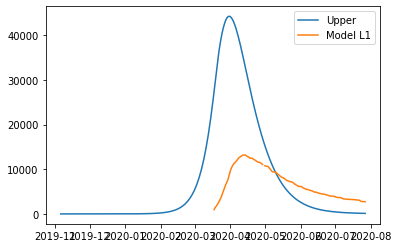

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.58303910613821, 'other': 1.0162843238570383, 'school': 0.4400358049422249, 'transport': 0.32258198735027105, 'work': 0.40847129752470585}
{'home': 1.0, 'leisure': 0.6056710014054664, 'other': 1.0474721124922262, 'school': 0.4476789306568486, 'transport': 0.4276510893216551, 'work': 0.551210049629976}
{'home': 1.0, 'leisure': 0.6274946146988922, 'other': 1.0775460515333002, 'school': 0.4550490875959501, 'transport': 0.5289677233654897, 'work': 0.6888509891600579}
{'home': 1.0, 'leisure': 0.6452768181231652, 'other': 1.102050742603805, 'school': 0.4610544006574402, 'transport': 0.6115220177715772, 'work': 0.8010028658141988}
{'home': 1.0, 'leisure': 0.6557844837829628, 'other': 1.1165307873272852, 'school': 0.4646029947392298, 'transport': 0.6603041008297197, 'work': 0.8672744292916457}
{'home': 1.0, 'leisure': 0.661442457599777, 'other': 1.1243277344860823, 'school': 0.46

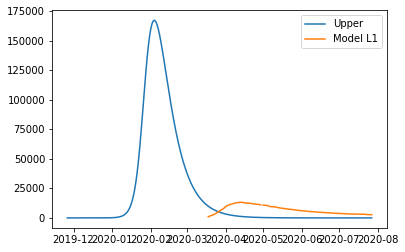

violation 0.7800444188278122
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
error_groups 14822.360143755988
{'home': 1.0, 'leisure': 0.6497728370504652, 'other': 0.2409377643913508, 'school': 0.23595508964203887, 'transport': 0.4951156233772649, 'work': 0.2442920068709054}
error_total 14758.009422405014
{'home': 1.0, 'leisure': 0.6652598607577321, 'other': 0.24158448732298418, 'school': 0.32651394417083385, 'transport': 0.5292795023025556, 'work': 0.3389866177311708}
[ 9.32348540e+01  1.63263532e+00  3.43743175e+00  1.33592606e+00
  6.01771339e-02 -1.83800263e+01  2.71716887e-01  4.16810850e-01
  3.63921053e-01  3.46135182e-01  5.79051971e-01  2.54548571e-01
  6.20586831e-01  6.69074936e-01  9.81546412e-02  4.84908499e-01]{'home': 1.0, 'leisure': 0.6801937764754538, 'other': 0.24220811300705924, 'school': 0.413838553895029, 'transport': 0.5622232426948003, 'work': 0.43029927820356956}

{'home': 1.0, 'leisure': 0.6923621522454493, 'other': 0.24

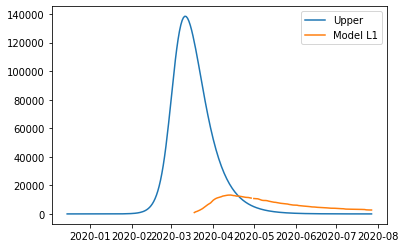

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4978214249810595, 'other': 0.49590371562674396, 'school': 0.5258204187286204, 'transport': 0.9277422603471854, 'work': 0.41681085021394926}
{'home': 1.0, 'leisure': 0.522765009455913, 'other': 0.535592630662961, 'school': 0.5325480552994509, 'transport': 0.9702780244364156, 'work': 0.48535204694654016}
{'home': 1.0, 'leisure': 0.5468177516280931, 'other': 0.5738640844478845, 'school': 0.539035419135609, 'transport': 1.0112946540938876, 'work': 0.5514453437958242}
{'home': 1.0, 'leisure': 0.5664162822869065, 'other': 0.6050482319763406, 'school': 0.5443214192984044, 'transport': 1.0447156115925686, 'work': 0.6052991412285742}
{'home': 1.0, 'leisure': 0.57799723222166, 'other': 0.6234752282431557, 'school': 0.5474449648491472, 'transport': 1.0644643592054255, 'work': 0.6371218397115629}
{'home': 1.0, 'leisure': 0.5842331283403733, 'other': 0.6333974570022101, 'school': 0.5

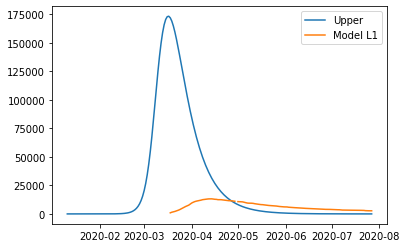

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.1998099193613819, 'other': 0.17323914000903812, 'school': 0.20352973960653886, 'transport': 0.1170082174642474, 'work': 0.07374616914742738}
{'home': 1.0, 'leisure': 0.2702849732293943, 'other': 0.23277007036826391, 'school': 0.24755266617807994, 'transport': 0.11915814383308303, 'work': 0.17347220869746188}
{'home': 1.0, 'leisure': 0.33824306088783485, 'other': 0.290174896071803, 'school': 0.29000334537206596, 'transport': 0.12123128711731737, 'work': 0.2696366039778523}
{'home': 1.0, 'leisure': 0.39361631749841597, 'other': 0.33694919849690896, 'school': 0.3245927876782768, 'transport': 0.12292051497854536, 'work': 0.3479927779100222}
{'home': 1.0, 'leisure': 0.4263368782228503, 'other': 0.3645885590208352, 'school': 0.34503200358649233, 'transport': 0.1239186950783619, 'work': 0.39429415341539537}
{'home': 1.0, 'leisure': 0.44395564168985346, 'other': 0.37947129161064

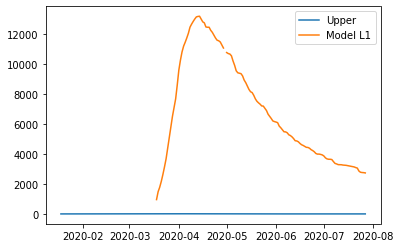

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.6746859343955395, 'other': 0.1616733756809297, 'school': 0.5848953740646934, 'transport': 0.7771588431806264, 'work': 0.25532209522109056}
{'home': 1.0, 'leisure': 0.6792445940963496, 'other': 0.1981938031372692, 'school': 0.6401373705636855, 'transport': 0.8018271394388028, 'work': 0.31889687507224457}
{'home': 1.0, 'leisure': 0.6836404445221308, 'other': 0.23340992961302515, 'school': 0.6934064386162848, 'transport': 0.8256144251163301, 'work': 0.38020112707157167}
{'home': 1.0, 'leisure': 0.6872222485727674, 'other': 0.2621045511858633, 'school': 0.7368108644369213, 'transport': 0.8449966578906115, 'work': 0.43015273981176405}
{'home': 1.0, 'leisure': 0.6893387691481435, 'other': 0.2790604639334495, 'school': 0.7624589342400249, 'transport': 0.8564497954390506, 'work': 0.4596696018855142}
{'home': 1.0, 'leisure': 0.690478434073346, 'other': 0.28819057079753435, 'schoo

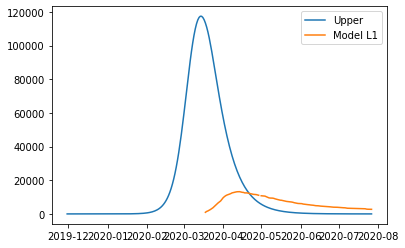

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4794856868023666, 'other': 0.354478189774603, 'school': 0.2816919687054163, 'transport': 0.6938732880892862, 'work': 0.3328022866002163}
{'home': 1.0, 'leisure': 0.4871868342231522, 'other': 0.4042375549771079, 'school': 0.2962842626069879, 'transport': 0.7479887191563224, 'work': 0.3991796866102204}
{'home': 1.0, 'leisure': 0.4946129406646241, 'other': 0.4522197999938091, 'school': 0.31035540315493193, 'transport': 0.8001714562566786, 'work': 0.46318646519129575}
{'home': 1.0, 'leisure': 0.5006638422095271, 'other': 0.4913164440814915, 'school': 0.3218207769347382, 'transport': 0.8426907235236356, 'work': 0.5153401366277275}
{'home': 1.0, 'leisure': 0.5042393749406061, 'other': 0.5144190064969403, 'school': 0.3285957705318965, 'transport': 0.867815745090474, 'work': 0.5461582152038009}
{'home': 1.0, 'leisure': 0.5061646617958026, 'other': 0.5268588477975665, 'school': 0

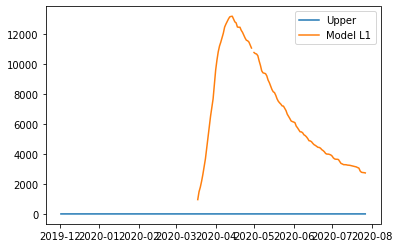

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.42602127432476944, 'other': 0.4170799124896041, 'school': 1.0689783701978446, 'transport': 0.1920701847783618, 'work': 0.4543236052923837}
{'home': 1.0, 'leisure': 0.45943718924053895, 'other': 0.4765285917130785, 'school': 1.088778934074503, 'transport': 0.21389986734321603, 'work': 0.5679664190440871}
{'home': 1.0, 'leisure': 0.4916596786236024, 'other': 0.5338541038214288, 'school': 1.1078723349555666, 'transport': 0.23494991838789686, 'work': 0.6775505608760867}
{'home': 1.0, 'leisure': 0.5179150403431355, 'other': 0.5805637803541588, 'school': 1.1234299208586553, 'transport': 0.2521018118317109, 'work': 0.7668413431095679}
{'home': 1.0, 'leisure': 0.5334295722683142, 'other': 0.6081649528507719, 'school': 1.1326230398013897, 'transport': 0.26223702159396467, 'work': 0.8196040780657159}
{'home': 1.0, 'leisure': 0.5417835509972566, 'other': 0.6230271226566404, 'school

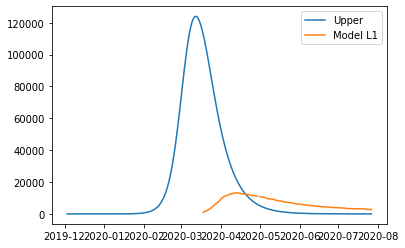

0.478257922774742 0.5181146246718515 0.0036274525534064628
violation 0.7477996514650236
error_groups 6537.301907417721
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
error_total 6571.829581134275
{'home': 1.0, 'leisure': 0.19322283638894877, 'other': 0.4451903987597551, 'school': 0.6918687900950106, 'transport': 0.5042264632960034, 'work': 0.45624267091549353}
[1.22577820e+02 8.69670469e-01 3.04721109e+00 1.72794516e+00
 2.46159127e-01 4.56318983e+01 6.50544047e-01 3.56670419e-01
 3.46133965e-01 4.22346611e-01 1.14710750e-01 1.13385611e-01
 4.57039756e-01 1.60026109e-01 2.93838985e-01 8.03319992e-01]
{'home': 1.0, 'leisure': 0.21821702330598763, 'other': 0.5391167660558788, 'school': 0.7317502268937092, 'transport': 0.5916593545368629, 'work': 0.57141380132584}


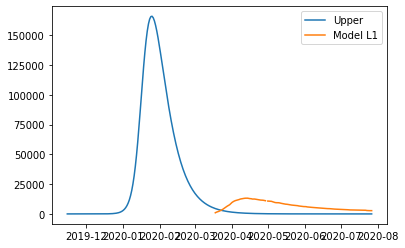

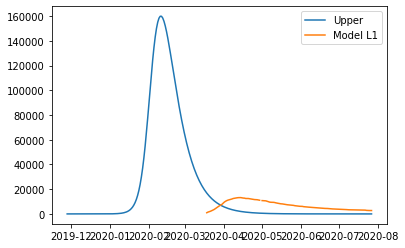

{'home': 1.0, 'leisure': 0.2423185606902751, 'other': 0.6296886202342838, 'school': 0.7702073266638828, 'transport': 0.6759696425191203, 'work': 0.6824716770786741}
{'home': 1.0, 'leisure': 0.26195685041080563, 'other': 0.7034879088240953, 'school': 0.8015427412914318, 'transport': 0.744666914208367, 'work': 0.7729632795439463}
{'home': 1.0, 'leisure': 0.27356129433657367, 'other': 0.7470965793544385, 'school': 0.820059122662256, 'transport': 0.7852607565701946, 'work': 0.8264355900916072}
{'home': 1.0, 'leisure': 0.2798098410658334, 'other': 0.7705781711784694, 'school': 0.8300294818619307, 'transport': 0.8071189793804094, 'work': 0.8552283726941937}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2923069345243528, 'other': 0.8175413548265312, 'school': 0.8499702002612799, 'transport': 0.8508354250008392, 'work': 0.9128139378993

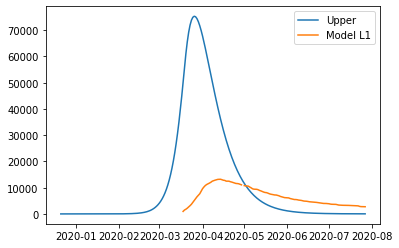

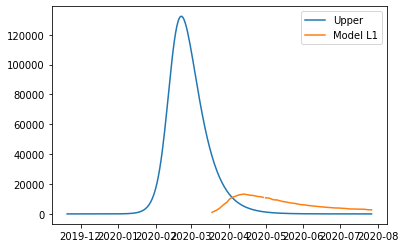

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2686020177868482, 'other': 0.08014325714714635, 'school': 0.0956711453193495, 'transport': 0.30988773816032367, 'work': 0.289718959294573}
{'home': 1.0, 'leisure': 0.2535027370002253, 'other': 0.5781764040785868, 'school': 0.4947876449247086, 'transport': 0.2990460643673408, 'work': 0.15173710829057283}
{'home': 1.0, 'leisure': 0.2767650315913859, 'other': 0.08081501918252056, 'school': 0.09973436446786332, 'transport': 0.3154577897039849, 'work': 0.3031878919894625}
{'home': 1.0, 'leisure': 0.4107788195564935, 'other': 0.7416649293136076, 'school': 0.5185777533160802, 'transport': 0.44711928714791427, 'work': 0.3654811956787237}
{'home': 1.0, 'leisure': 0.2846365091886187, 'other': 0.0814627897166314, 'school': 0.10365246864678736, 'transport': 0.32082891083537246, 'work': 0.316175

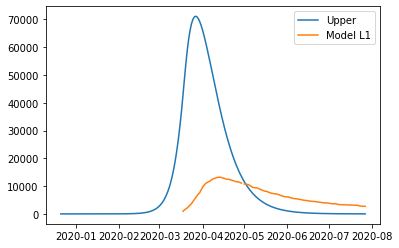

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.13614076086114618, 'other': 0.2971250806256086, 'school': 0.40012427666900546, 'transport': 0.5817439934638009, 'work': 0.2542761746929612}
{'home': 1.0, 'leisure': 0.14168245292638965, 'other': 0.30077035127107676, 'school': 0.40233453157986404, 'transport': 0.594788457399503, 'work': 0.26805198121682167}
{'home': 1.0, 'leisure': 0.14702622741787438, 'other': 0.3042854336792068, 'school': 0.40446584881533476, 'transport': 0.6073670476232158, 'work': 0.2813357946505442}
{'home': 1.0, 'leisure': 0.15138041404056568, 'other': 0.30714957490064604, 'school': 0.40620247767386647, 'transport': 0.6176162692869818, 'work': 0.2921596426335774}
{'home': 1.0, 'leisure': 0.1539533424994287, 'other': 0.30884202198604194, 'school': 0.40722866745390796, 'transport': 0.6236726275428435, 'work': 0.2985555528053698}
{'home': 1.0, 'leisure': 0.15533876551573958, 'other': 0.309753339647409,

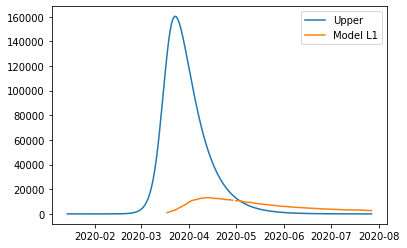

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.11097588189500318, 'other': 0.595605174976426, 'school': 0.22334461846588968, 'transport': 0.6657278797672515, 'work': 0.37758305845138673}
{'home': 1.0, 'leisure': 0.1112880402548075, 'other': 0.7192549286402505, 'school': 0.27905107500474713, 'transport': 0.7114790788658616, 'work': 0.5104391440890539}
{'home': 1.0, 'leisure': 0.11158905010176168, 'other': 0.8384886196732241, 'school': 0.3327680152386454, 'transport': 0.7555963065680927, 'work': 0.6385503695253758}
{'home': 1.0, 'leisure': 0.11183431738446507, 'other': 0.9356419975519434, 'school': 0.3765373739477478, 'transport': 0.7915436772884292, 'work': 0.7429372939549715}
{'home': 1.0, 'leisure': 0.11197924805151709, 'other': 0.9930508117530047, 'school': 0.4024010859122173, 'transport': 0.8127853054413554, 'work': 0.8046204765724598}
{'home': 1.0, 'leisure': 0.11205728764146816, 'other': 1.0239632501689608, 'sch

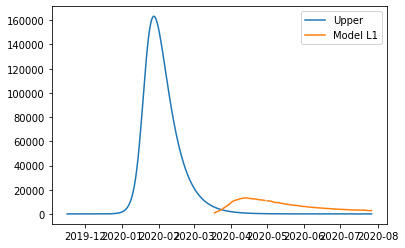

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.5458023577446046, 'other': 0.15429954243321145, 'school': 0.9081236655995478, 'transport': 0.3230386699004142, 'work': 0.3566704190808263}
{'home': 1.0, 'leisure': 0.6026033571570492, 'other': 0.17312371422731496, 'school': 0.9563429959799542, 'transport': 0.3980394428206115, 'work': 0.52077162017675}
{'home': 1.0, 'leisure': 0.6573757494476207, 'other': 0.19127559417162904, 'school': 1.0028402074182032, 'transport': 0.4703616167079446, 'work': 0.6790120640906764}
{'home': 1.0, 'leisure': 0.7020051061288272, 'other': 0.20606601486699608, 'school': 1.0407268241456653, 'transport': 0.5292907954309567, 'work': 0.8079487220946164}
{'home': 1.0, 'leisure': 0.7283769987131764, 'other': 0.21480580891425843, 'school': 1.0631143703937114, 'transport': 0.5641125828581912, 'work': 0.884138565460581}
{'home': 1.0, 'leisure': 0.7425772485662876, 'other': 0.21951185186278427, 'school'

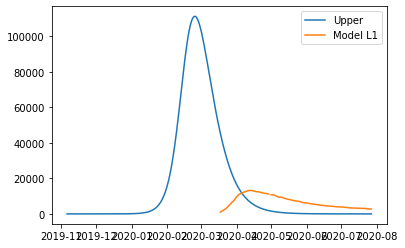

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26223753886486323, 'other': 0.09793643363533171, 'school': 0.3389617073368615, 'transport': 0.5796568001113643, 'work': 0.057554913985244704}
{'home': 1.0, 'leisure': 0.2780936607604167, 'other': 0.13394005033683393, 'school': 0.34465201787333194, 'transport': 0.5837045201374715, 'work': 0.10525274021672099}
{'home': 1.0, 'leisure': 0.2933834925882718, 'other': 0.16865782358471107, 'school': 0.3501391030334999, 'transport': 0.587607678734075, 'work': 0.151247072654216}
{'home': 1.0, 'leisure': 0.3058418740776352, 'other': 0.1969463795644628, 'school': 0.3546100613121552, 'transport': 0.5907880301831593, 'work': 0.1887239361218045}
{'home': 1.0, 'leisure': 0.3132036449577136, 'other': 0.21366234446158883, 'school': 0.35725199120408796, 'transport': 0.5926673287667091, 'work': 0.21086935544356133}
{'home': 1.0, 'leisure': 0.3171676754316019, 'other': 0.22266324863696438, '

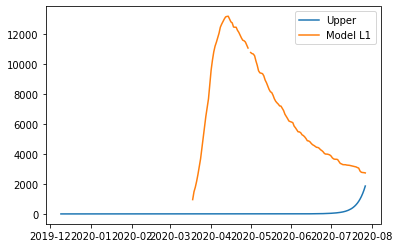

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.37148816016515734, 'other': 1.1192749931026915, 'school': 0.11603114554653705, 'transport': 0.4305677089328555, 'work': 0.4271395565779492}
{'home': 1.0, 'leisure': 0.39522386018563405, 'other': 1.2203181866534152, 'school': 0.13125195481967106, 'transport': 0.5438308434356873, 'work': 0.5783888591488583}
{'home': 1.0, 'leisure': 0.4181118566339509, 'other': 1.3177526947201845, 'school': 0.14592916376162168, 'transport': 0.6530488659919895, 'work': 0.7242364009136635}
{'home': 1.0, 'leisure': 0.43676133522146826, 'other': 1.3971437753671818, 'school': 0.15788837104765552, 'transport': 0.7420413288156431, 'work': 0.8430751386479491}
{'home': 1.0, 'leisure': 0.4477814816595468, 'other': 1.4440566866585893, 'school': 0.16495517535303916, 'transport': 0.7946277841205294, 'work': 0.9132980291272998}
{'home': 1.0, 'leisure': 0.4537154066646659, 'other': 1.4693174850462702, 'sc

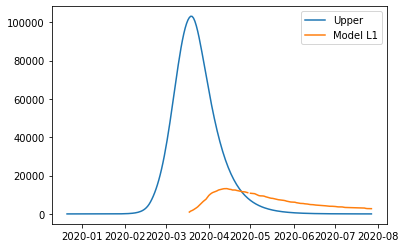

[ 1.13767624e+02  3.85626867e+00  3.97447192e+00  1.81162037e+00
  4.15880714e-01 -4.28965685e+01  3.07746165e-01  2.30913014e-01
  3.59155395e-01  1.08201677e-01  6.83005137e-01  1.97090854e-01
  9.65554228e-01  1.09882233e-01  2.52434861e-01  3.15045227e-01]{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}

{'home': 1.0, 'leisure': 0.4732612875360501, 'other': 0.6531721484061317, 'school': 0.19507131729232657, 'transport': 0.47341429938791946, 'work': 0.49356155577451055}
{'home': 1.0, 'leisure': 0.4957851151719785, 'other': 0.697795251150732, 'school': 0.20838211186620637, 'transport': 0.5350004429701859, 'work': 0.5766845742556739}
{'home': 1.0, 'leisure': 0.5175045203923381, 'other': 0.7408246716544538, 'school': 0.22121752091959046, 'transport': 0.5943870814245142, 'work': 0.6568389135053672}
{'home': 1.0, 'leisure': 0.5352018135348532, 'other': 0.7758856809537826, 'school': 0.23167600237049601, 'transport': 0.6427761942391522, 'work': 0.72

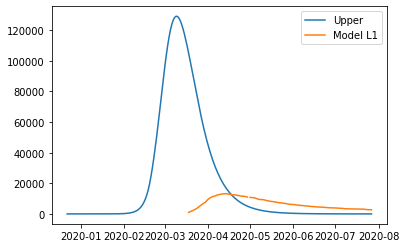

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
302076.36221921473
violation 0.261693932257811
{'home': 1.0, 'leisure': 0.5011678951107102, 'other': 0.5061483072724285, 'school': 0.18347574699916408, 'transport': 0.22054004581027858, 'work': 0.25169680790697796}
{'home': 1.0, 'leisure': 0.5538092192823442, 'other': 0.5148153398847003, 'school': 0.22439637276020982, 'transport': 0.3186835115588379, 'work': 0.3747664490552271}
error_groups 6680.9184204562225
error_total 6740.302308189494
{'home': 1.0, 'leisure': 0.6045704961621341, 'other': 0.5231728356179624, 'school': 0.2638555476012182, 'transport': 0.41332185353066286, 'work': 0.493440745876753}


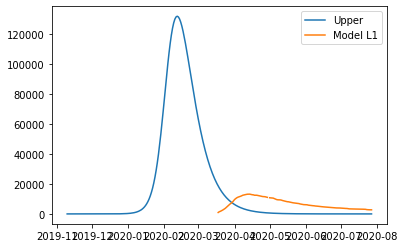

{'home': 1.0, 'leisure': 0.6459315365827036, 'other': 0.5299826469561758, 'school': 0.2960074678420399, 'transport': 0.4904345766188167, 'work': 0.5901383210646631}
[ 1.37999379e+02  2.94394899e+00  2.11290273e+00  1.74889279e+00
  2.37180015e-01 -1.81182875e+00  5.26186273e-01  3.73440543e-01
  5.04820305e-01  1.22577564e-01  1.74508654e-01  2.01995271e-01
  8.31876232e-01  1.85693002e-01  1.89339151e-01  4.41518788e-01]{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}

{'home': 1.0, 'leisure': 0.6703721513766765, 'other': 0.534006626383302, 'school': 0.3150063298025254, 'transport': 0.536001185716362, 'work': 0.6472777973120645}
{'home': 1.0, 'leisure': 0.6835324824195851, 'other': 0.53617338453637, 'school': 0.32523648624278684, 'transport': 0.5605370521535018, 'work': 0.6780452075991268}
{'home': 1.0, 'leisure': 0.6075537248691493, 'other': 0.4797989104783346, 'school': 0.1804856248846486, 'transport': 0.17958078067562916, 'work': 0.257563622

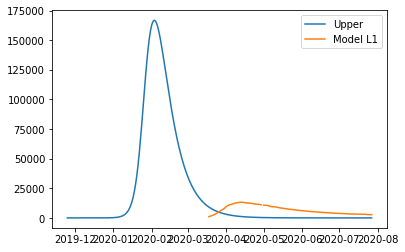

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.1911353318574516, 'other': 0.35480562874606125, 'school': 0.3733357219729574, 'transport': 0.33284127040865263, 'work': 0.23091301397801345}
{'home': 1.0, 'leisure': 0.21901644423027755, 'other': 0.4078270874632474, 'school': 0.3929321552086941, 'transport': 0.40779691989958516, 'work': 0.3085426771577906}
{'home': 1.0, 'leisure': 0.24590180258978833, 'other': 0.45895492265481985, 'school': 0.4118287158288688, 'transport': 0.4800755819086987, 'work': 0.38339985236686147}
{'home': 1.0, 'leisure': 0.267808390882723, 'other': 0.5006146402183232, 'school': 0.4272259133712334, 'transport': 0.5389693065087171, 'work': 0.44439458772240065}
{'home': 1.0, 'leisure': 0.2807531930558208, 'other': 0.5252317460513025, 'school': 0.43632425737353975, 'transport': 0.5737701437723643, 'work': 0.4804369313415829}
{'home': 1.0, 'leisure': 0.2877234711490273, 'other': 0.5384871107305991, 's

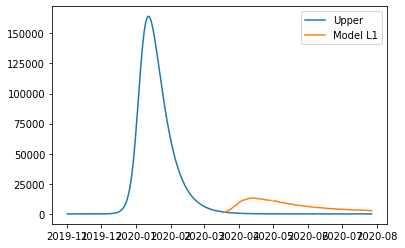

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3110979329354907, 'other': 0.2671638769560398, 'school': 0.512225703840496, 'transport': 0.4963493141949335, 'work': 0.3734405428888093}
{'home': 1.0, 'leisure': 0.37810357633429376, 'other': 0.290326702404897, 'school': 0.5373570060861523, 'transport': 0.6067656378332806, 'work': 0.5061722153955588}
{'home': 1.0, 'leisure': 0.44271616104028233, 'other': 0.3126622840877235, 'school': 0.5615907618230351, 'transport': 0.7132385213416866, 'work': 0.6341634710270672}
{'home': 1.0, 'leisure': 0.49536345228219897, 'other': 0.330861646940397, 'school': 0.5813367850160509, 'transport': 0.7999942042003879, 'work': 0.7384526422823703}
{'home': 1.0, 'leisure': 0.5264732152887861, 'other': 0.34161581589879497, 'school': 0.5930048896301056, 'transport': 0.8512589258896205, 'work': 0.800078061660504}
{'home': 1.0, 'leisure': 0.5432246261384869, 'other': 0.3474065222610092, 'school': 0

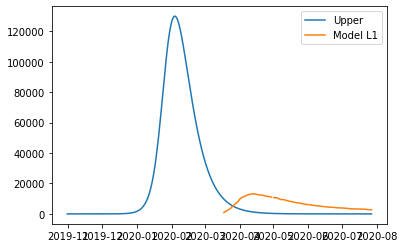

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.21206064483288062, 'other': 0.4622062640003326, 'school': 0.31648387328128524, 'transport': 0.5830012635687618, 'work': 0.37184504271650115}
{'home': 1.0, 'leisure': 0.21998765886962643, 'other': 0.5228228673187247, 'school': 0.3311453031721872, 'transport': 0.6239883348322279, 'work': 0.4442533622573555}
{'home': 1.0, 'leisure': 0.22763156526220277, 'other': 0.5812745919471742, 'school': 0.3452831105669856, 'transport': 0.6635115821219988, 'work': 0.5140756703860365}
{'home': 1.0, 'leisure': 0.23385993343393163, 'other': 0.6289019231259108, 'school': 0.35680280548126564, 'transport': 0.6957157095432935, 'work': 0.5709679214538506}
{'home': 1.0, 'leisure': 0.23754033280813502, 'other': 0.6570453460951643, 'school': 0.363609897930613, 'transport': 0.7147454212013313, 'work': 0.6045860698121044}
{'home': 1.0, 'leisure': 0.2395220863173215, 'other': 0.6721994969247623, 'sch

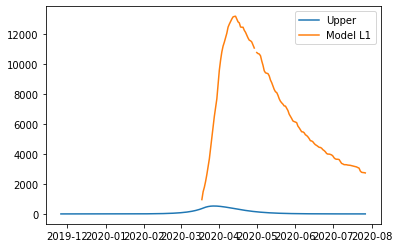

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.20761656272664458, 'other': 0.6516174577066955, 'school': 0.18435445529949376, 'transport': 0.5262328156734519, 'work': 0.4175644964408252}
{'home': 1.0, 'leisure': 0.20940090247188198, 'other': 0.6884393241833049, 'school': 0.1988935205608025, 'transport': 0.5806546670874456, 'work': 0.49065943930849415}
{'home': 1.0, 'leisure': 0.21112151579764663, 'other': 0.7239461240000353, 'school': 0.21291333349135017, 'transport': 0.6331328809509396, 'work': 0.5611438485023177}
{'home': 1.0, 'leisure': 0.21252349702604742, 'other': 0.7528775905173712, 'school': 0.22433688476809274, 'transport': 0.6758929070619346, 'work': 0.6185755893269147}
{'home': 1.0, 'leisure': 0.21335194047919337, 'other': 0.769973457095797, 'school': 0.23108716506798607, 'transport': 0.7011601952184316, 'work': 0.6525125270869039}
{'home': 1.0, 'leisure': 0.21379802541550272, 'other': 0.7791789237149493, '

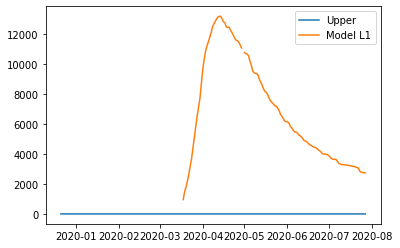

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.5610938278931128, 'other': 0.12405233368426054, 'school': 0.050758435772683415, 'transport': 0.033938974594839674, 'work': 0.1136697478519319}
406519.3192602466
{'home': 1.0, 'leisure': 0.6054508438292661, 'other': 0.21625222227518331, 'school': 0.06855683847236396, 'transport': 0.041944390733850645, 'work': 0.23365162824299102}
violation 0.2975506387609518
{'home': 1.0, 'leisure': 0.6482236806248424, 'other': 0.30515925770214464, 'school': 0.08571958393277021, 'transport': 0.04966389915361123, 'work': 0.34934844147722666}
error_groups 18186.461483166637
{'home': 1.0, 'leisure': 0.6830756217175342, 'other': 0.3776020273092982, 'school': 0.09970404319680491, 'transport': 0.05595386897711985, 'work': 0.4436199189273445}
error_total 18156.443803225637
{'home': 1.0, 'leisure': 0.7036699505450339, 'other': 0.4204091184407981, 'school': 0.10796758730737088, 'transport': 0.0596

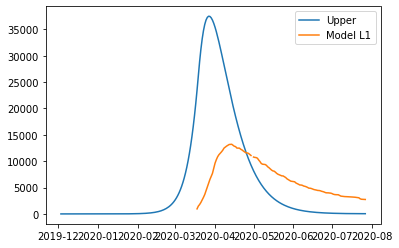

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3140088350455238, 'other': 0.21600453877865858, 'school': 0.1595430218577093, 'transport': 0.1559013052382371, 'work': 0.2896667249924146}
{'home': 1.0, 'leisure': 0.3785356157613501, 'other': 0.299556857968592, 'school': 0.22822134253849488, 'transport': 0.21384713910347386, 'work': 0.5141397502725118}
{'home': 1.0, 'leisure': 0.4407578685944684, 'other': 0.38012516575888494, 'school': 0.29444686605210957, 'transport': 0.269723478902095, 'work': 0.7305958817926055}
{'home': 1.0, 'leisure': 0.49145748201404627, 'other': 0.44577341655097547, 'school': 0.34840840372986964, 'transport': 0.31525234836763816, 'work': 0.9069675445126819}
{'home': 1.0, 'leisure': 0.5214163444892514, 'other': 0.48456556474630175, 'school': 0.3802947669030916, 'transport': 0.342155771233641, 'work': 1.0111871633927272}
{'home': 1.0, 'leisure': 0.537548039668208, 'other': 0.5054536445437852, 'scho

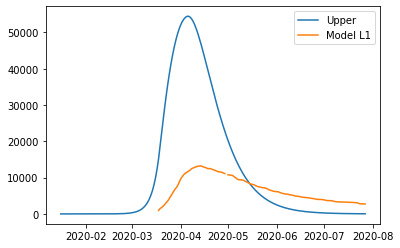

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.25509855382420416, 'other': 0.7564618881951841, 'school': 0.19092084632310186, 'transport': 0.22140186682800017, 'work': 0.3261197190482895}
{'home': 1.0, 'leisure': 0.26034858935012295, 'other': 0.7648441743512618, 'school': 0.19171294913164894, 'transport': 0.22593346947703705, 'work': 0.3353027349125607}
{'home': 1.0, 'leisure': 0.26541112360725894, 'other': 0.7729270931446226, 'school': 0.19247676255417645, 'transport': 0.23030322917432264, 'work': 0.3441577859245365}
{'home': 1.0, 'leisure': 0.2695361515204808, 'other': 0.7795131751243981, 'school': 0.1930991290466063, 'transport': 0.23386377411285164, 'work': 0.3513730126750353}
{'home': 1.0, 'leisure': 0.27197366801465744, 'other': 0.7834049508397198, 'school': 0.19346689106486029, 'transport': 0.23596773248561875, 'work': 0.35563655575487546}
{'home': 1.0, 'leisure': 0.2732861768961371, 'other': 0.785500522378739

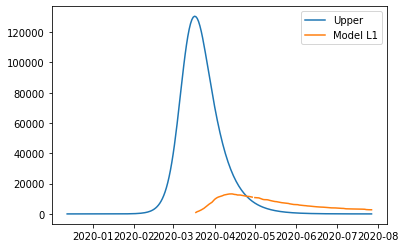

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
424287.0971735481
490515.0682988791
violation 0.4411447786129456
violation 0.39402103424781015
{'home': 1.0, 'leisure': 0.6459182950132909, 'other': 0.3888442096697136, 'school': 0.3286348210667652, 'transport': 0.47548477639741143, 'work': 0.41192621632487525}
error_groups 5060.600953607235
{'home': 1.0, 'leisure': 0.6514017134630214, 'other': 0.3941944854553321, 'school': 0.32958236373939315, 'transport': 0.4906662235931955, 'work': 0.4296219946892982}
error_groups 8349.808226187559
{'home': 1.0, 'leisure': 0.6566892955395474, 'other': 0.39935367996289267, 'school': 0.3304960656022844, 'transport': 0.505305476246273, 'work': 0.4466857809692774}
error_total 5041.092394426156
error_total 8204.096291949187
{'home': 1.0, 'leisure': 0.6609976957500499, 'other': 0.4035574680801643, 'school': 0.33124056341649205, 'transport': 0.5172337561858176, 'work': 0.46058960682703826}
[6.90033651e+01 3.04254420e-

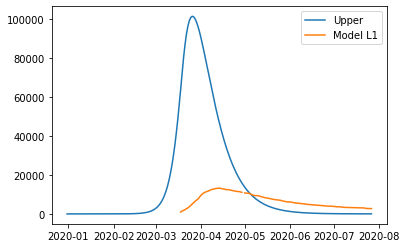

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4920205490888704, 'other': 0.3693365456984894, 'school': 0.41311787887780316, 'transport': 0.22586067521345304, 'work': 0.43334095749325136}
{'home': 1.0, 'leisure': 0.7087267706416915, 'other': 0.37000370915646325, 'school': 0.42093530211988045, 'transport': 0.2666970776771791, 'work': 0.6591519452772465}
{'home': 1.0, 'leisure': 0.917693484281912, 'other': 0.3706470453480809, 'school': 0.4284735316747408, 'transport': 0.3060750371957721, 'work': 0.8768982549260991}
{'home': 1.0, 'leisure': 1.0879626583591286, 'other': 0.3711712452079175, 'school': 0.4346157927935158, 'transport': 0.3381607819886998, 'work': 1.0543211738992382}
{'home': 1.0, 'leisure': 1.1885762612229385, 'other': 0.3714809996705482, 'school': 0.4382453107273374, 'transport': 0.3571205402754297, 'work': 1.159161989656093}
{'home': 1.0, 'leisure': 1.242752816611144, 'other': 0.37164779053504166, 'school'

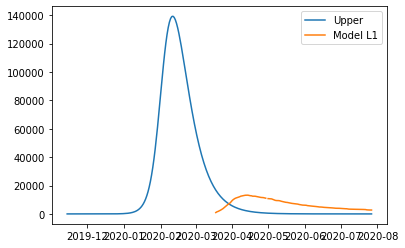

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3895431741025993, 'other': 0.6116094114298319, 'school': 0.17884011725234059, 'transport': 0.12646464896232668, 'work': 0.3986204609898528}


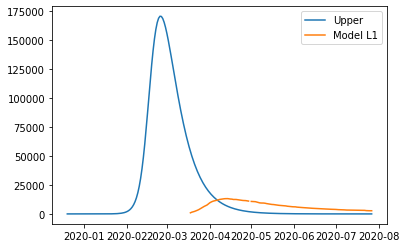

{'home': 1.0, 'leisure': 0.44361703368156435, 'other': 0.649474237334329, 'school': 0.21706857652742698, 'transport': 0.15478598740348382, 'work': 0.4915788799083547}
{'home': 1.0, 'leisure': 0.495759683989852, 'other': 0.685986748027951, 'school': 0.25393173368554595, 'transport': 0.18209584947174245, 'work': 0.5812173552940528}
{'home': 1.0, 'leisure': 0.5382462879447532, 'other': 0.7157376826671986, 'school': 0.28396838025882815, 'transport': 0.2043483296755088, 'work': 0.6542561130157329}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.5633520084635583, 'other': 0.7333177804085722, 'school': 0.3017173077794039, 'transport': 0.21749752252318888, 'work': 0.6974153789421802}
{'home': 1.0, 'leisure': 0.5768704733582996, 'other': 0.7427839868846965, 'school': 0.3112744225981755, 'transport': 0.2245778571334782, 'work': 0.7206549836718057}
{'home': 1.0, 'leisure': 0.7830017560482347, 'other': 0.24779578375635103, 'schoo

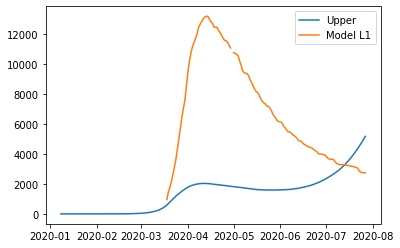

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.45158605423894277, 'other': 0.7206390294659586, 'school': 0.22634175466198386, 'transport': 0.21704431820325215, 'work': 0.3891020247285456}
{'home': 1.0, 'leisure': 0.48073516627715907, 'other': 0.80347715933783, 'school': 0.23836490022660808, 'transport': 0.26896797186058197, 'work': 0.49183323348728625}
{'home': 1.0, 'leisure': 0.5088432385997248, 'other': 0.8833567845714203, 'school': 0.24995864773535287, 'transport': 0.3190372093158642, 'work': 0.5908954705046432}
{'home': 1.0, 'leisure': 0.5317461123440377, 'other': 0.9484438866136049, 'school': 0.2594054049647005, 'transport': 0.35983436576090905, 'work': 0.6716128488150823}
{'home': 1.0, 'leisure': 0.5452796286474952, 'other': 0.9869044469112594, 'school': 0.2649875796911332, 'transport': 0.3839417763875264, 'work': 0.7193094814530689}
{'home': 1.0, 'leisure': 0.5525669066570493, 'other': 1.0076139793792274, 'sch

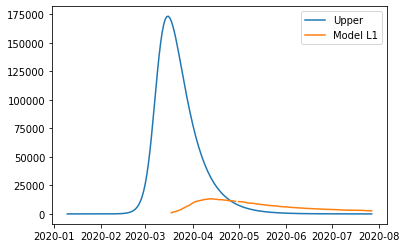

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.36707143314674484, 'other': 0.6605837733546764, 'school': 0.18408590142292064, 'transport': 0.3290796521030167, 'work': 0.46470343447653284}
{'home': 1.0, 'leisure': 0.41415004707355246, 'other': 0.7517009457798667, 'school': 0.19872440119118823, 'transport': 0.3749316762781148, 'work': 0.5644294740265673}
{'home': 1.0, 'leisure': 0.45954728193154554, 'other': 0.8395639334755858, 'school': 0.21284009739630344, 'transport': 0.4191461281612452, 'work': 0.6605938693069577}
{'home': 1.0, 'leisure': 0.4965376214454658, 'other': 0.9111559975239495, 'school': 0.22434177578565656, 'transport': 0.45517271858453656, 'work': 0.7389500432391276}
{'home': 1.0, 'leisure': 0.518395549340055, 'other': 0.9534603990070735, 'school': 0.23113822210663798, 'transport': 0.4764611583801179, 'work': 0.7852514187445008}
{'home': 1.0, 'leisure': 0.5301652028217569, 'other': 0.9762396921133711, 's

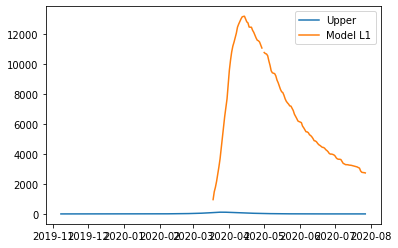

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2229436854747038, 'other': 0.4251833444293658, 'school': 0.08742462896273792, 'transport': 0.3927181473010643, 'work': 0.3789776997765932}
{'home': 1.0, 'leisure': 0.22494894634822166, 'other': 0.46982306497716225, 'school': 0.0918007783648997, 'transport': 0.42703923635650015, 'work': 0.426838849034485}
{'home': 1.0, 'leisure': 0.22688259076197098, 'other': 0.5128685097911088, 'school': 0.09602063671698426, 'transport': 0.46013457223138465, 'work': 0.4729906715331663}
{'home': 1.0, 'leisure': 0.22845815287687787, 'other': 0.5479425759358061, 'school': 0.09945903981868279, 'transport': 0.48710114220351286, 'work': 0.5105958602357956}
{'home': 1.0, 'leisure': 0.2293891668538683, 'other': 0.5686681604758543, 'school': 0.10149082346968646, 'transport': 0.5030359335506795, 'work': 0.5328171081055311}
{'home': 1.0, 'leisure': 0.22989048207224774, 'other': 0.5798280906128035, 

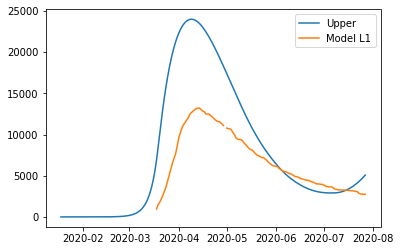

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4450578087845387, 'other': 0.250071914674857, 'school': 0.16222550091540575, 'transport': 0.2589230572670253, 'work': 0.20581066847002172}
{'home': 1.0, 'leisure': 0.5927379728882456, 'other': 0.3297300735124715, 'school': 0.22035360639131288, 'transport': 0.32865818748235787, 'work': 0.40308826406378073}
{'home': 1.0, 'leisure': 0.73514384541682, 'other': 0.4065432981058854, 'school': 0.2764057081002233, 'transport': 0.39590277733285706, 'work': 0.5933202312434769}
{'home': 1.0, 'leisure': 0.8511782600697326, 'other': 0.4691318514782968, 'school': 0.32207779097415035, 'transport': 0.4506946653591898, 'work': 0.748324056352859}
{'home': 1.0, 'leisure': 0.9197440505464538, 'other': 0.5061159966529035, 'school': 0.34906583994510726, 'transport': 0.4830716901020228, 'work': 0.8399172257356757}
{'home': 1.0, 'leisure': 0.9566640915723803, 'other': 0.5260305363623071, 'school

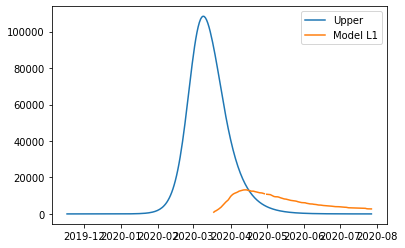

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.22284112208612925, 'other': 0.31121371281653987, 'school': 0.5386269921099834, 'transport': 0.1991712195704304, 'work': 0.41576797584962305}
{'home': 1.0, 'leisure': 0.24656351525625977, 'other': 0.31321577764002656, 'school': 0.5404982974363106, 'transport': 0.21345179804943765, 'work': 0.4613083401690929}
{'home': 1.0, 'leisure': 0.26943868009888566, 'other': 0.31514634014838877, 'school': 0.5423027704295548, 'transport': 0.22722235586848039, 'work': 0.5052222629057246}
{'home': 1.0, 'leisure': 0.2880777033039882, 'other': 0.3167193910811283, 'school': 0.5437730817573833, 'transport': 0.23844281038770032, 'work': 0.5410039777281651}
{'home': 1.0, 'leisure': 0.2990916715615488, 'other': 0.3176489211777471, 'school': 0.5446419020874638, 'transport': 0.2450730789672394, 'work': 0.5621477183050618}
{'home': 1.0, 'leisure': 0.30502226985408143, 'other': 0.3181494373836188, 

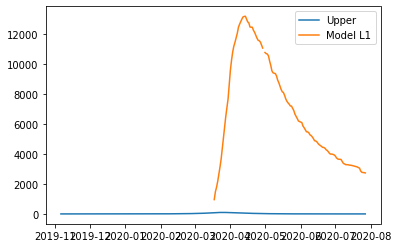

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.30583768672920575, 'other': 0.235480721545717, 'school': 0.23188830543295375, 'transport': 0.7081648637632415, 'work': 0.4642818883912325}
{'home': 1.0, 'leisure': 0.31774034519036753, 'other': 0.25219898103003124, 'school': 0.26227504144442204, 'transport': 0.7350735388369083, 'work': 0.5444881066410554}
{'home': 1.0, 'leisure': 0.3292179087064878, 'other': 0.2683201598184771, 'school': 0.29157653688405216, 'transport': 0.7610211898008012, 'work': 0.6218298170962417}
{'home': 1.0, 'leisure': 0.3385699974974007, 'other': 0.28145593512758116, 'school': 0.3154518294644915, 'transport': 0.7821637202158251, 'work': 0.6848489885782454}
{'home': 1.0, 'leisure': 0.3440962317829401, 'other': 0.28921798417387, 'school': 0.3295599568983875, 'transport': 0.7946570336428848, 'work': 0.7220875899085204}
{'home': 1.0, 'leisure': 0.34707189639823055, 'other': 0.2933975490449485, 'schoo

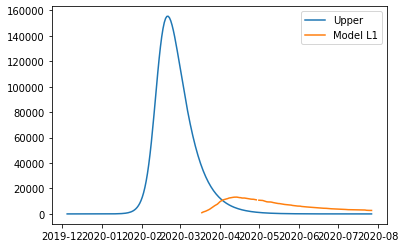

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.34804461790292696, 'other': 0.2695346522308866, 'school': 0.43071657700253957, 'transport': 0.22661783726963788, 'work': 0.37758305845138673}
{'home': 1.0, 'leisure': 0.43177160006933835, 'other': 0.2784534816009302, 'school': 0.4890811845830098, 'transport': 0.3027247219192138, 'work': 0.5104391440890539}
{'home': 1.0, 'leisure': 0.5125083328726636, 'other': 0.2870537813506151, 'school': 0.545361341892749, 'transport': 0.37611350354559053, 'work': 0.6385503695253758}
{'home': 1.0, 'leisure': 0.5782938188605583, 'other': 0.2940614329985065, 'school': 0.5912192478488327, 'transport': 0.43591177005597165, 'work': 0.7429372939549715}
{'home': 1.0, 'leisure': 0.6171670605806778, 'other': 0.29820231806316966, 'school': 0.6183171013683368, 'transport': 0.4712471093575605, 'work': 0.8046204765724598}
{'home': 1.0, 'leisure': 0.6380988061222808, 'other': 0.3004320254056806, 'sch

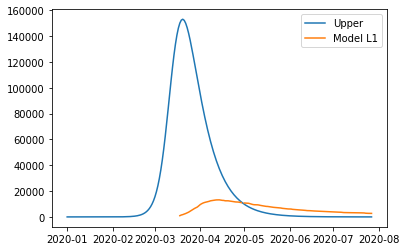

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.45449617857250924, 'other': 0.5137147643090788, 'school': 0.252954370687568, 'transport': 0.19884678457295835, 'work': 0.35913855803327854}
{'home': 1.0, 'leisure': 0.4985915345695595, 'other': 0.5184276155257636, 'school': 0.27456152647831983, 'transport': 0.20662036724418256, 'work': 0.4260598370880313}
{'home': 1.0, 'leisure': 0.5411120564238581, 'other': 0.5229721506275667, 'school': 0.2953969981336877, 'transport': 0.21411632196286307, 'work': 0.4905910704622572}
{'home': 1.0, 'leisure': 0.5757584075643974, 'other': 0.5266751051549619, 'school': 0.31237404911213557, 'transport': 0.22022413691882495, 'work': 0.5431720754338486}
{'home': 1.0, 'leisure': 0.5962312514201709, 'other': 0.5288632146484227, 'school': 0.3224059428721275, 'transport': 0.22383330030189333, 'work': 0.5742426692806981}
{'home': 1.0, 'leisure': 0.6072550904194334, 'other': 0.5300414274525939, 'sc

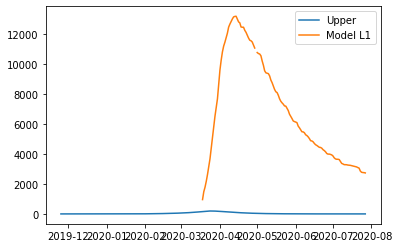

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2946046432187632, 'other': 0.33745551359175996, 'school': 0.25639640167789157, 'transport': 0.38335768228008144, 'work': 0.3430360833684818}
{'home': 1.0, 'leisure': 0.39688738271401314, 'other': 0.3641678350984937, 'school': 0.4039758928489286, 'transport': 0.4385154319517732, 'work': 0.5408504921482452}
{'home': 1.0, 'leisure': 0.4955171672272899, 'other': 0.38992614512284407, 'school': 0.5462846879067144, 'transport': 0.49170326199233316, 'work': 0.7316001006144457}
{'home': 1.0, 'leisure': 0.5758821768307005, 'other': 0.4109143977352777, 'school': 0.6622400023982433, 'transport': 0.5350414938772339, 'work': 0.8870257075128312}
{'home': 1.0, 'leisure': 0.6233705915963523, 'other': 0.4233165470062612, 'school': 0.7307590518705106, 'transport': 0.5606504490819479, 'work': 0.9788681115891499}
{'home': 1.0, 'leisure': 0.6489412764701648, 'other': 0.42999462738294464, 'sch

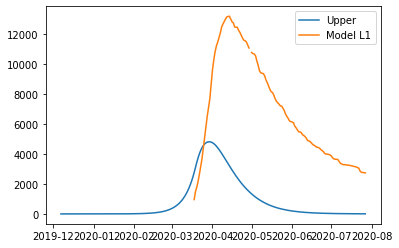

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


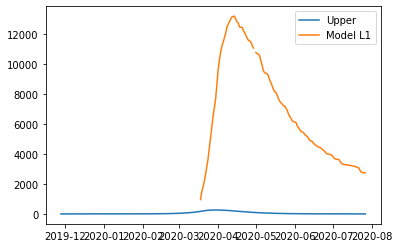

{'home': 1.0, 'leisure': 0.35542326731490737, 'other': 0.3910525985006912, 'school': 0.11220959440096787, 'transport': 0.23478447042329798, 'work': 0.324770389568739}
{'home': 1.0, 'leisure': 0.37915896733538407, 'other': 0.4452170003481768, 'school': 0.13044833465694763, 'transport': 0.2925701780225789, 'work': 0.47601969213964807}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4020469637837009, 'other': 0.497446959272538, 'school': 0.14803569133235672, 'transport': 0.34829211035045693, 'work': 0.6218672339044533}
{'home': 1.0, 'leisure': 0.5393925608165152, 'other': 0.5698724410307827, 'school': 0.5716565557874684, 'transport': 0.19695317527853423, 'work': 0.47192918927113164}
{'home': 1.0, 'leisure': 0.4206964423712183, 'other': 0.5400047035812767, 'school': 0.16236613010491224, 'transport': 0.3936951663213205, 'work': 0.740705971638739}
{'home': 1.0, 'leisure': 0.5440316793799989, 'other': 0.5887106556549647, 'sc

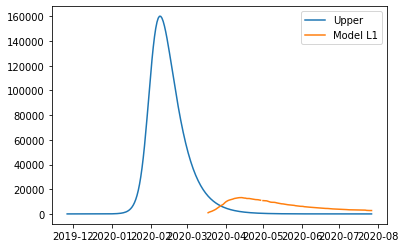

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.40476240060998087, 'other': 0.4206573864692012, 'school': 0.18119087235391695, 'transport': 0.2101057602840651, 'work': 0.33437558929189176}
{'home': 1.0, 'leisure': 0.4092010651158491, 'other': 0.4384117564976538, 'school': 0.19227220304616696, 'transport': 0.2244921744517468, 'work': 0.3578726961952758}
{'home': 1.0, 'leisure': 0.4134812058893648, 'other': 0.45553204188223306, 'school': 0.20295777192797945, 'transport': 0.23836478811343983, 'work': 0.38053062070925325}
{'home': 1.0, 'leisure': 0.4169687280011184, 'other': 0.4694819040474459, 'school': 0.2116645317576045, 'transport': 0.24966839924518977, 'work': 0.3989926332761979}
{'home': 1.0, 'leisure': 0.41902953652170005, 'other': 0.47772500441779886, 'school': 0.216809435293292, 'transport': 0.256347805823042, 'work': 0.40990200433848334}
{'home': 1.0, 'leisure': 0.4201392026481671, 'other': 0.482163596924912, 's

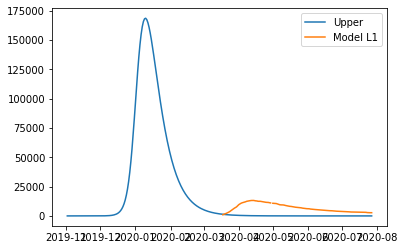

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.38766157805340967, 'other': 0.2237500435371834, 'school': 0.2672581522052642, 'transport': 0.14343750888217532, 'work': 0.23610132262835065}
{'home': 1.0, 'leisure': 0.4150849931407624, 'other': 0.24119056093921448, 'school': 0.29305926372613633, 'transport': 0.15507341615135317, 'work': 0.2731288653370656}
{'home': 1.0, 'leisure': 0.441529000546424, 'other': 0.2580082027197445, 'school': 0.317938906978406, 'transport': 0.16629375530377472, 'work': 0.30883399580618365}
{'home': 1.0, 'leisure': 0.4630759695436298, 'other': 0.27171146639276894, 'school': 0.3382112088876627, 'transport': 0.1754362538724145, 'work': 0.33792706507731685}
{'home': 1.0, 'leisure': 0.47580826940561494, 'other': 0.27980884947228335, 'school': 0.35019029637949617, 'transport': 0.18083863939024708, 'work': 0.35511842419207734}
{'home': 1.0, 'leisure': 0.48266412317745316, 'other': 0.284168978822791

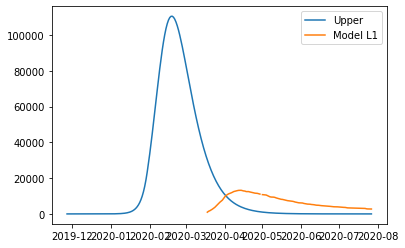

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.32800864957368436, 'other': 0.21071488118763643, 'school': 0.2282256986439054, 'transport': 0.2031902938619522, 'work': 0.4327829194399423}
{'home': 1.0, 'leisure': 0.3737253094441626, 'other': 0.2266182296918911, 'school': 0.2369982282921989, 'transport': 0.22506698878344605, 'work': 0.5394114176163268}
{'home': 1.0, 'leisure': 0.41780923146212373, 'other': 0.241953601463851, 'school': 0.2454574533101962, 'transport': 0.24616237317202946, 'work': 0.6422317551435548}
{'home': 1.0, 'leisure': 0.45372946421749943, 'other': 0.2544490895743368, 'school': 0.2523501551767125, 'transport': 0.26335120489606034, 'work': 0.7260112894249997}
{'home': 1.0, 'leisure': 0.4749550563002215, 'other': 0.26183278709416935, 'school': 0.256423115370563, 'transport': 0.27350824182389677, 'work': 0.7755173778640354}
{'home': 1.0, 'leisure': 0.48638422126784103, 'other': 0.26580862422023305, 's

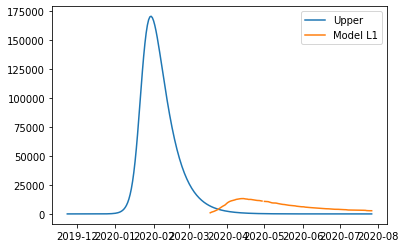

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.45805037666782134, 'other': 0.20151073867804012, 'school': 0.1662696838189437, 'transport': 0.2129851104170298, 'work': 0.3191316825599372}
{'home': 1.0, 'leisure': 0.46501796956105784, 'other': 0.269148548629074, 'school': 0.22541331171797907, 'transport': 0.2979338566840507, 'work': 0.48543273986147367}
{'home': 1.0, 'leisure': 0.4717367198509645, 'other': 0.33437072251042804, 'school': 0.28244466719204886, 'transport': 0.3798487191558208, 'work': 0.6457944736879553}
{'home': 1.0, 'leisure': 0.4772112571242218, 'other': 0.3875147160433832, 'school': 0.328914660541291, 'transport': 0.44659416265133717, 'work': 0.7764595901391625}
{'home': 1.0, 'leisure': 0.48044621096751017, 'other': 0.41891798494922033, 'school': 0.35637420206584314, 'transport': 0.48603465198959683, 'work': 0.8536707953148759}
{'home': 1.0, 'leisure': 0.48218810919081934, 'other': 0.4358274374369788, 

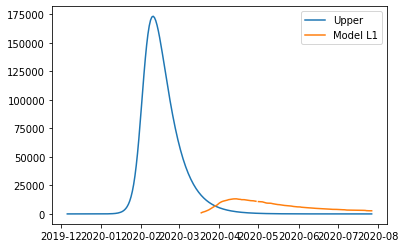

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4139391501260062, 'other': 0.33502598110864157, 'school': 0.11703743558348095, 'transport': 0.23550424585992014, 'work': 0.37230945332599313}
{'home': 1.0, 'leisure': 0.45416223923501226, 'other': 0.33792666229931717, 'school': 0.12430801173617918, 'transport': 0.2445171005217449, 'work': 0.41500594450317563}
{'home': 1.0, 'leisure': 0.492948789447268, 'other': 0.3407237477331829, 'school': 0.1313189244548525, 'transport': 0.2532080675170759, 'work': 0.4561775609954587}
{'home': 1.0, 'leisure': 0.5245526451757727, 'other': 0.3430028543829995, 'school': 0.13703152000340107, 'transport': 0.26028959617993824, 'work': 0.4897248040632449}
{'home': 1.0, 'leisure': 0.5432276508335256, 'other': 0.3443495992215274, 'school': 0.1404071446457253, 'transport': 0.2644741358443569, 'work': 0.5095481749669368}
{'home': 1.0, 'leisure': 0.553283423110777, 'other': 0.34507476951919636, 's

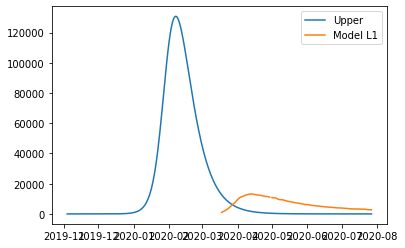

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2736362575282508, 'other': 0.40194443802909524, 'school': 0.016342959331314272, 'transport': 0.27791892221762515, 'work': 0.4437825041723918}
{'home': 1.0, 'leisure': 0.27664875831754254, 'other': 0.4021029037947498, 'school': 0.016458021384124097, 'transport': 0.27937181918464327, 'work': 0.44970962557027333}
{'home': 1.0, 'leisure': 0.27955366979293106, 'other': 0.4022557100687738, 'school': 0.016568974077904995, 'transport': 0.2807728269742678, 'work': 0.4554250640610876}
{'home': 1.0, 'leisure': 0.28192063469880313, 'other': 0.40238021888464526, 'school': 0.016659379976541284, 'transport': 0.2819143888769249, 'work': 0.46008208801656597}
{'home': 1.0, 'leisure': 0.28331929577954573, 'other': 0.40245379227584205, 'school': 0.016712801643917273, 'transport': 0.2825889481830404, 'work': 0.46283396580843955}
{'home': 1.0, 'leisure': 0.28407242097686863, 'other': 0.402493

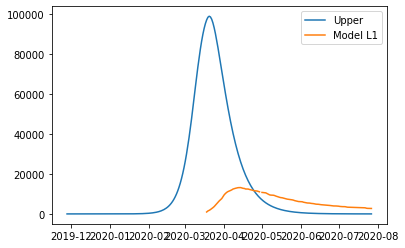

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.18853118058637033, 'other': 0.3985977155619271, 'school': 0.3181190235632462, 'transport': 0.21972994093310566, 'work': 0.3655811195849876}
{'home': 1.0, 'leisure': 0.19310013264343662, 'other': 0.40889338077274046, 'school': 0.33997088318591495, 'transport': 0.2284128955572848, 'work': 0.41105424218607917}
{'home': 1.0, 'leisure': 0.197505907841322, 'other': 0.4188213436545962, 'school': 0.36104231925063124, 'transport': 0.23678574465917182, 'work': 0.4549033246942746}
{'home': 1.0, 'leisure': 0.20109579874330266, 'other': 0.4269107948916639, 'school': 0.3782116375255852, 'transport': 0.2436080661495983, 'work': 0.49063220673798935}
{'home': 1.0, 'leisure': 0.20321709791265488, 'other': 0.431690925168113, 'school': 0.38835714377896713, 'transport': 0.24763943793939575, 'work': 0.5117447279456391}
{'home': 1.0, 'leisure': 0.20435933592692146, 'other': 0.43426484147081634

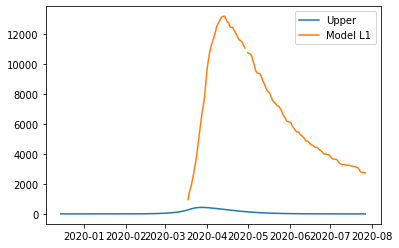

99636.15330309722
violation 0.013887901444048223
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
error_groups 14323.595085331148
{'home': 1.0, 'leisure': 0.17262342520778542, 'other': 0.1850524121090909, 'school': 0.2842191625724482, 'transport': 0.16079891330341545, 'work': 0.19297751569206326}
error_total 14284.931354743567
{'home': 1.0, 'leisure': 0.20103519807889048, 'other': 0.20483875892284703, 'school': 0.3172422140407949, 'transport': 0.18929219461662194, 'work': 0.26193950838117447}
[1.27437018e+02 1.43409509e+00 2.47915603e+00 8.35508218e-01
 4.20371927e-01 1.41032507e+01 5.71459431e-01 3.84414153e-01
 1.54586933e-01 2.51285433e-01 5.05438458e-01 2.04004357e-01
 1.44774571e-01 9.38883402e-02 1.64613839e-01 1.19059577e-01]{'home': 1.0, 'leisure': 0.2284322647760275, 'other': 0.22391845049325473, 'school': 0.34908587081384346, 'transport': 0.21676785874007104, 'work': 0.3284385727599603}

{'home': 1.0, 'leisure': 0.25075580060332425, 'o

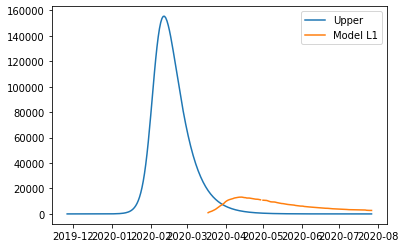

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.34804461790292696, 'other': 0.33211586105559016, 'school': 0.43071657700253957, 'transport': 0.33241900271044167, 'work': 0.37758305845138673}
{'home': 1.0, 'leisure': 0.34937489738723837, 'other': 0.3322575661001057, 'school': 0.4316438914484355, 'transport': 0.3336282117926819, 'work': 0.379693915913542}
{'home': 1.0, 'leisure': 0.35065766688996725, 'other': 0.33239421025017424, 'school': 0.43253808752126377, 'transport': 0.3347942348362706, 'work': 0.38172938560919173}
{'home': 1.0, 'leisure': 0.35170288648478343, 'other': 0.3325055499280079, 'school': 0.4332666917287535, 'transport': 0.3357443276866022, 'work': 0.38338791647231374}
{'home': 1.0, 'leisure': 0.35232051624535654, 'other': 0.3325713415558187, 'school': 0.43369723057863374, 'transport': 0.33630574618907083, 'work': 0.38436795743688584}
{'home': 1.0, 'leisure': 0.3526530861164344, 'other': 0.33260676781694

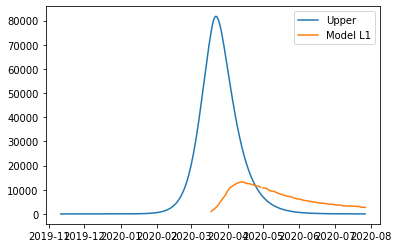

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31071083772413116, 'other': 0.3983020540184733, 'school': 0.18233946631419173, 'transport': 0.14954173402713294, 'work': 0.38441415257442507}
{'home': 1.0, 'leisure': 0.33299484225122855, 'other': 0.4711619825803921, 'school': 0.2060688687430406, 'transport': 0.1704112675921015, 'work': 0.5285660811749036}
{'home': 1.0, 'leisure': 0.35448298947378676, 'other': 0.5414197708365283, 'school': 0.2289507925137163, 'transport': 0.1905354606726069, 'work': 0.6675697266110794}
{'home': 1.0, 'leisure': 0.371991850173649, 'other': 0.5986668575637502, 'school': 0.24759532299352616, 'transport': 0.20693295133079648, 'work': 0.7808319562257411}
{'home': 1.0, 'leisure': 0.38233799513265854, 'other': 0.6324946815389267, 'school': 0.2586125455497774, 'transport': 0.21662237762881761, 'work': 0.8477596373616776}
{'home': 1.0, 'leisure': 0.38790899626443287, 'other': 0.6507096636794064, '

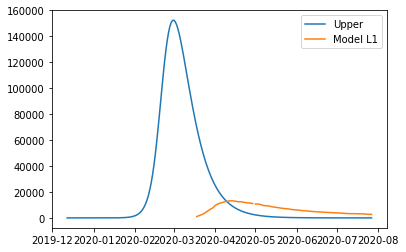

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.20453722684798692, 'other': 0.10023811727777227, 'school': 0.18722480572038683, 'transport': 0.33632522498619827, 'work': 0.24234875256571325}
{'home': 1.0, 'leisure': 0.2084602060808474, 'other': 0.10155858555164786, 'school': 0.19321208103968301, 'transport': 0.3383617746320085, 'work': 0.2501569337883218}
{'home': 1.0, 'leisure': 0.21224307891253427, 'other': 0.1028318942443136, 'school': 0.19898552509757575, 'transport': 0.3403255903618969, 'work': 0.2576862513958372}
{'home': 1.0, 'leisure': 0.2153254197383532, 'other': 0.10386940503093013, 'school': 0.2036898128484513, 'transport': 0.34192573651217634, 'work': 0.2638212509278867}
{'home': 1.0, 'leisure': 0.21714680295360989, 'other': 0.1044824795866581, 'school': 0.20646961924669602, 'transport': 0.3428712774191597, 'work': 0.26744647792409787}
{'home': 1.0, 'leisure': 0.218127547761825, 'other': 0.1048125966551269

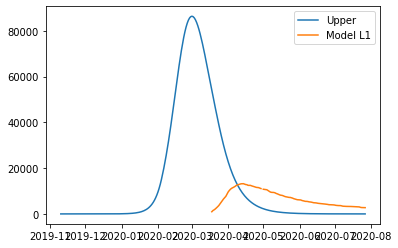

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


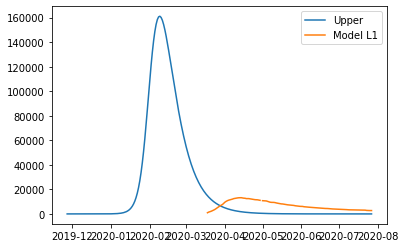

{'home': 1.0, 'leisure': 0.2506483313332533, 'other': 0.5040699985578211, 'school': 0.17094130850464972, 'transport': 0.27046369057720276, 'work': 0.29113600554173535}
{'home': 1.0, 'leisure': 0.32714158517064623, 'other': 0.6270213829810769, 'school': 0.19972629636806122, 'transport': 0.3008724512943584, 'work': 0.4785918991516461}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.40090293708527514, 'other': 0.7455816465320737, 'school': 0.2274832489506366, 'transport': 0.3301951848430443, 'work': 0.6593529394183458}
{'home': 1.0, 'leisure': 0.4610047793860838, 'other': 0.8421863057217748, 'school': 0.25010002512903134, 'transport': 0.3540877825493809, 'work': 0.80663971296899}
{'home': 1.0, 'leisure': 0.20430995097146143, 'other': 0.23484087690144345, 'school': 0.1440091504608218, 'transport': 0.3027331974425058, 'work': 0.43818129469727385}
{'home': 1.0, 'leisure': 0.20843821278892571, 'other': 0.23838743848148625, '

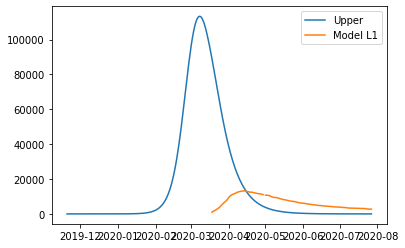

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.13437783944215206, 'other': 0.33361132358269807, 'school': 0.33934038434939123, 'transport': 0.16367251442281158, 'work': 0.3468132840758858}


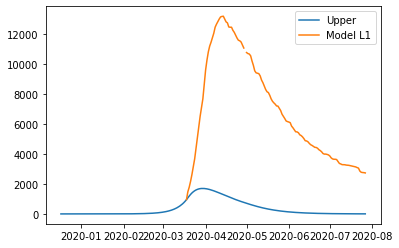

{'home': 1.0, 'leisure': 0.13539595725469555, 'other': 0.3354366039553922, 'school': 0.3394564054067803, 'transport': 0.16500788545505707, 'work': 0.35107581954248074}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.13637771371679108, 'other': 0.3371966957433473, 'school': 0.33956828285497687, 'transport': 0.1662955646647224, 'work': 0.3551861215995545}
{'home': 1.0, 'leisure': 0.13717766342664667, 'other': 0.338630844607607, 'school': 0.3396594422572111, 'transport': 0.16734478476148673, 'work': 0.35853525660902197}
{'home': 1.0, 'leisure': 0.3986559668204307, 'other': 0.29345413135578147, 'school': 0.4404619740691822, 'transport': 0.18923364343150212, 'work': 0.36388684138588706}
{'home': 1.0, 'leisure': 0.4318553391377564, 'other': 0.33022958443786343, 'school': 0.4948667571572629, 'transport': 0.22836755034183023, 'work': 0.44196392065135376}
{'home': 1.0, 'leisure': 0.13765036098247044, 'other': 0.339478296209215

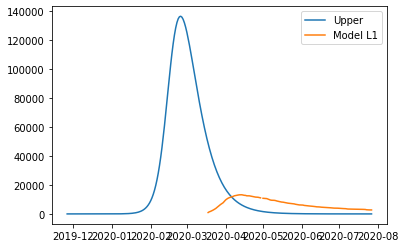

error_total 6470.778354370981
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
[5.86113762e+01 4.75119973e-01 3.64949525e+00 1.13633746e+00
 4.45261738e-01 4.31730682e+00 1.73118364e-01 4.80063192e-01
 6.48956598e-01 1.80486842e-01 4.47847462e-02 3.66782700e-01
 5.37302545e-03 1.65016996e-01 2.77680355e-02 1.29292196e-01]{'home': 1.0, 'leisure': 0.354823727870378, 'other': 0.375157341754595, 'school': 0.11142561278349469, 'transport': 0.32919357038045777, 'work': 0.39759807650184403}

{'home': 1.0, 'leisure': 0.3739014685450103, 'other': 0.3863873326666959, 'school': 0.11826218967601415, 'transport': 0.35478387932660155, 'work': 0.4319688691482589}
{'home': 1.0, 'leisure': 0.3922978613384057, 'other': 0.3972162524747932, 'school': 0.12485460310808649, 'transport': 0.37946024866752587, 'work': 0.4651121334858732}
{'home': 1.0, 'leisure': 0.4072875147256168, 'other': 0.40603981676287243, 'school': 0.1302261992379232, 'transport': 0.399566919982353

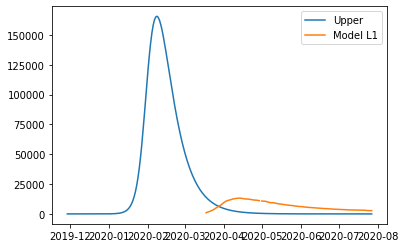

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4113831817008128, 'other': 0.36720201581879797, 'school': 0.11397440135192691, 'transport': 0.4727227467802172, 'work': 0.4253818019118053}
{'home': 1.0, 'leisure': 0.4378675269252846, 'other': 0.37090355186096763, 'school': 0.11413276760740018, 'transport': 0.5039903935351608, 'work': 0.47519706992566907}
{'home': 1.0, 'leisure': 0.4634060026774538, 'other': 0.37447289018734553, 'school': 0.11428547792517797, 'transport': 0.5341413386202851, 'work': 0.523233221224752}
{'home': 1.0, 'leisure': 0.48421513106811026, 'other': 0.3773812399347646, 'school': 0.1144099085544784, 'transport': 0.5587087753563122, 'work': 0.5623737889499307}
{'home': 1.0, 'leisure': 0.49651143420804356, 'other': 0.3790998102400576, 'school': 0.11448343574451957, 'transport': 0.5732258970639645, 'work': 0.5855023062420817}


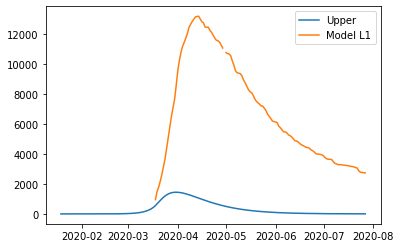

{'home': 1.0, 'leisure': 0.5031325205141615, 'other': 0.38002519425060005, 'school': 0.11452302730838788, 'transport': 0.5810428087527005, 'work': 0.5979561232455477}
{'home': 1.0, 'leisure': 0.5163746931263975, 'other': 0.38187596227168485, 'school': 0.11460221043612452, 'transport': 0.5966766321301723, 'work': 0.6228637572524796}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4920270180308026, 'other': 0.3882822078214805, 'school': 0.1426226076375517, 'transport': 0.16759638728129628, 'work': 0.48006319242434914}
0.613863483425199 0.769473189877854 -0.383336673303053
{'home': 1.0, 'leisure': 0.5203666263287197, 'other': 0.39023793516617217, 'school': 0.14383522378317223, 'transport': 0.16783102460096974, 'work': 0.5237326895741357}
{'home': 1.0, 'leisure': 0.5476941057588539, 'other': 0.39212381510569627, 'school': 0.14500453220930634, 'transport': 0.16805728201636913, 'work': 0.5658425618257155}
{'home': 1.0, 'lei

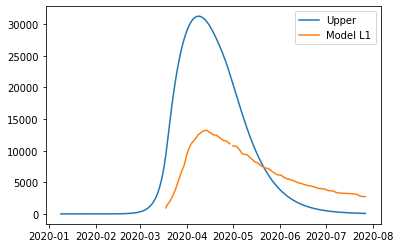

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3890147107753856, 'other': 0.5157291505576753, 'school': 0.44551508713756865, 'transport': 0.5169897421667838, 'work': 0.48648539327361173}
{'home': 1.0, 'leisure': 0.40968491995837897, 'other': 0.5283999927056552, 'school': 0.44643381610598987, 'transport': 0.5188492822422385, 'work': 0.5231776473817733}
{'home': 1.0, 'leisure': 0.4296169073848368, 'other': 0.5406183047769215, 'school': 0.44731973332553887, 'transport': 0.5206424101721412, 'work': 0.5585594638432148}
{'home': 1.0, 'leisure': 0.4458577860286173, 'other': 0.5505739664646201, 'school': 0.44804159180072695, 'transport': 0.5221034773742841, 'work': 0.5873890920710559}
{'home': 1.0, 'leisure': 0.4554546688635785, 'other': 0.5564568574618964, 'school': 0.4484681445360653, 'transport': 0.5229668352664595, 'work': 0.6044247814784166}
{'home': 1.0, 'leisure': 0.46062222115932683, 'other': 0.5596245679988914, 'sch

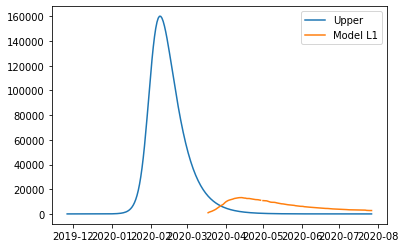

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.39576991147409907, 'other': 0.37007658078188305, 'school': 0.31029545826479066, 'transport': 0.5799808070512752, 'work': 0.4906319643271633}
{'home': 1.0, 'leisure': 0.3985424860521906, 'other': 0.3708833318506624, 'school': 0.31213104065520064, 'transport': 0.5831760331053957, 'work': 0.49768436321789067}
{'home': 1.0, 'leisure': 0.401216040109636, 'other': 0.3716612703812711, 'school': 0.3139010665316674, 'transport': 0.5862571439432975, 'work': 0.5044848907196635}
{'home': 1.0, 'leisure': 0.40339449156385077, 'other': 0.37229514622102633, 'school': 0.315343309838418, 'transport': 0.5887676787001065, 'work': 0.5100260612766635}
{'home': 1.0, 'leisure': 0.4046817583322504, 'other': 0.37266970921724535, 'school': 0.3161955445196798, 'transport': 0.5902511765109482, 'work': 0.5133003893330726}
{'home': 1.0, 'leisure': 0.4053749019767733, 'other': 0.37287139698444016, 'sch

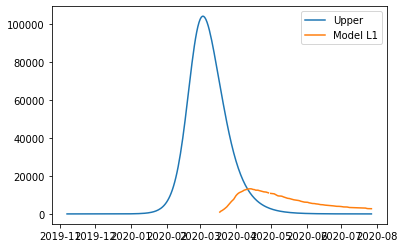

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2910894517181234, 'other': 0.5015293334409391, 'school': 0.3545337714394393, 'transport': 0.41489925939329786, 'work': 0.357319303495779}
{'home': 1.0, 'leisure': 0.33812036079416674, 'other': 0.5133589596275828, 'school': 0.3837093436047255, 'transport': 0.43770515860306713, 'work': 0.4456657617028649}
{'home': 1.0, 'leisure': 0.3834715945460657, 'other': 0.5247660991647035, 'school': 0.41184293104982284, 'transport': 0.4596965614124875, 'work': 0.5308569892596978}
{'home': 1.0, 'leisure': 0.4204244516772426, 'other': 0.5340608054542093, 'school': 0.4347665948939763, 'transport': 0.47761548222016337, 'work': 0.6002720635652653}
{'home': 1.0, 'leisure': 0.44226023089111993, 'other': 0.5395531318980082, 'school': 0.4483123962564306, 'transport': 0.4882039354246991, 'work': 0.6412900620185552}
{'home': 1.0, 'leisure': 0.4540179581601308, 'other': 0.5425105384446691, 'schoo

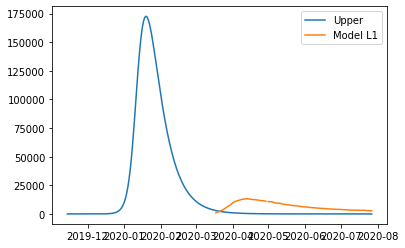

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.5603260240671554, 'other': 0.331787644134125, 'school': 0.2241388671754239, 'transport': 0.42092897242670546, 'work': 0.49511767089671577}
{'home': 1.0, 'leisure': 0.5947212322887763, 'other': 0.34312278269465757, 'school': 0.22843998198881063, 'transport': 0.4395329078562299, 'work': 0.5512192332514678}
{'home': 1.0, 'leisure': 0.6278880402167677, 'other': 0.35405309487802833, 'school': 0.2325874855588621, 'transport': 0.4574724170204142, 'work': 0.6053171683792644}
{'home': 1.0, 'leisure': 0.6549128466766126, 'other': 0.3629592751755897, 'school': 0.23596693291223741, 'transport': 0.47208979485789765, 'work': 0.6493969673722839}
{'home': 1.0, 'leisure': 0.6708820504937938, 'other': 0.36822201807869415, 'school': 0.23796387907559552, 'transport': 0.4807273363073197, 'work': 0.6754441213227045}
{'home': 1.0, 'leisure': 0.6794808525491989, 'other': 0.37105580271882727, 's

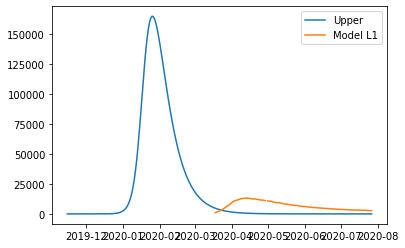

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2090148889234238, 'other': 0.29908495191634793, 'school': 0.3412686571355725, 'transport': 0.0662631938082196, 'work': 0.4549500223407089}
{'home': 1.0, 'leisure': 0.22375626014643188, 'other': 0.3037935150603196, 'school': 0.3456728291240116, 'transport': 0.07046625395648368, 'work': 0.5011026435869834}
{'home': 1.0, 'leisure': 0.23797115382576112, 'other': 0.3083339152348637, 'school': 0.3499197092557208, 'transport': 0.07451920481373833, 'work': 0.5456069569316052}
{'home': 1.0, 'leisure': 0.24955365978669602, 'other': 0.31203350056226997, 'school': 0.3533801301037801, 'transport': 0.0778216092159458, 'work': 0.5818697307679637}
{'home': 1.0, 'leisure': 0.25639786785452123, 'other': 0.3142196191648282, 'school': 0.3554249242412697, 'transport': 0.07977302999906842, 'work': 0.6032977334894483}
{'home': 1.0, 'leisure': 0.26008321066027323, 'other': 0.31539675995082117, 

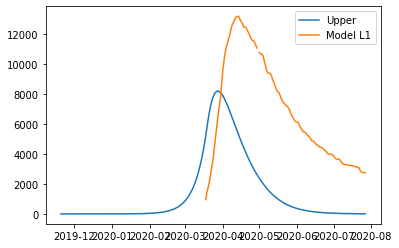

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.27666201901155324, 'other': 0.2967311858355009, 'school': 0.45528643413870123, 'transport': 0.23081760459287237, 'work': 0.4798986709499592}
{'home': 1.0, 'leisure': 0.27833778091903005, 'other': 0.29675826728327487, 'school': 0.45622219246089035, 'transport': 0.23148600615005066, 'work': 0.4857114232008975}
{'home': 1.0, 'leisure': 0.27995369418695404, 'other': 0.2967843815364855, 'school': 0.45712453084300125, 'transport': 0.23213053622304397, 'work': 0.4913165771571595}
{'home': 1.0, 'leisure': 0.2812703642571144, 'other': 0.29680565981687934, 'school': 0.45785976952472124, 'transport': 0.2326557088751126, 'work': 0.49588373964003957}
{'home': 1.0, 'leisure': 0.28204839657130004, 'other': 0.29681823334620294, 'school': 0.4582942287457376, 'transport': 0.2329660381695168, 'work': 0.4985825174708324}
{'home': 1.0, 'leisure': 0.28246733704816923, 'other': 0.2968250037081

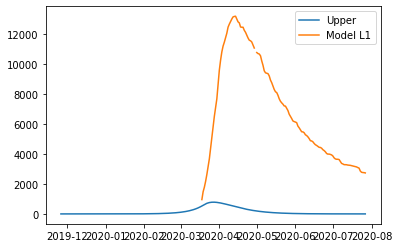

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.32351622317533724, 'other': 0.37505283634736974, 'school': 0.19893377606392787, 'transport': 0.09692666008445344, 'work': 0.4195658234437455}
{'home': 1.0, 'leisure': 0.34114603013683004, 'other': 0.3835199755317886, 'school': 0.20583840153304514, 'transport': 0.10145340085461574, 'work': 0.45026778374112525}
{'home': 1.0, 'leisure': 0.35814620113541235, 'other': 0.39168471688819256, 'school': 0.21249643323540823, 'transport': 0.10581847231155797, 'work': 0.4798732454564557}
{'home': 1.0, 'leisure': 0.3719981923194424, 'other': 0.3983374691045217, 'school': 0.2179214961040004, 'transport': 0.10937519720239978, 'work': 0.5039962142615398}
{'home': 1.0, 'leisure': 0.38018345983727836, 'other': 0.40226864086871617, 'school': 0.22112721507180483, 'transport': 0.11147689827426084, 'work': 0.5182506958281804}
{'home': 1.0, 'leisure': 0.3845909115776516, 'other': 0.404385425664

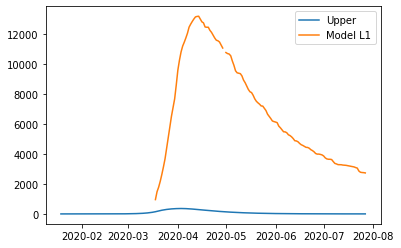

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.10515232312484173, 'other': 0.2483428619568685, 'school': 0.3850751012158807, 'transport': 0.08731745134527065, 'work': 0.43313021804245844}
{'home': 1.0, 'leisure': 0.13273497468855616, 'other': 0.25434154782215757, 'school': 0.41852123834793376, 'transport': 0.08803714040459418, 'work': 0.5670750626588235}
{'home': 1.0, 'leisure': 0.1593325315535665, 'other': 0.2601259949065434, 'school': 0.4507728705824135, 'transport': 0.08873112628322756, 'work': 0.696236162824604}
{'home': 1.0, 'leisure': 0.18100461492505643, 'other': 0.2648392480864134, 'school': 0.4770519783290267, 'transport': 0.08929659625841033, 'work': 0.8014785407374623}
{'home': 1.0, 'leisure': 0.19381084600820955, 'other': 0.26762435223815473, 'school': 0.49258054199747986, 'transport': 0.08963073760738197, 'work': 0.8636672185950602}
{'home': 1.0, 'leisure': 0.2007065088991382, 'other': 0.2691240237044769

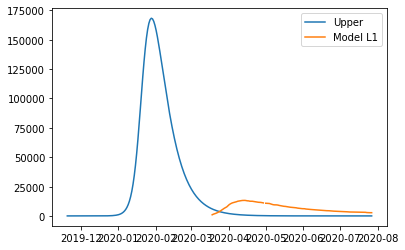

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


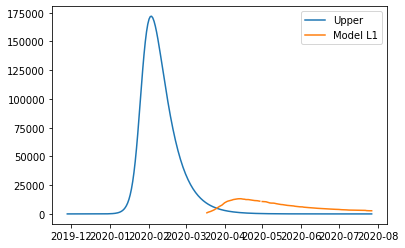

{'home': 1.0, 'leisure': 0.36417062940629485, 'other': 0.4027210418381394, 'school': 0.3739337999403419, 'transport': 0.30053434381813693, 'work': 0.44841003420255954}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3648813912359004, 'other': 0.42610383228769083, 'school': 0.3929743939881384, 'transport': 0.3274336049957927, 'work': 0.5029814694695449}
{'home': 1.0, 'leisure': 0.3050823455947509, 'other': 0.3294943202736344, 'school': 0.4580946569464488, 'transport': 0.432129731005425, 'work': 0.4465456273353313}
{'home': 1.0, 'leisure': 0.36556676871444865, 'other': 0.4486515230783297, 'school': 0.4113349668199421, 'transport': 0.35337217827424644, 'work': 0.5556039249055664}
{'home': 1.0, 'leisure': 0.31822411769200476, 'other': 0.3549634913409858, 'school': 0.5463689906271236, 'transport': 0.4732926414528891, 'work': 0.5403082515802394}
{'home': 1.0, 'leisure': 0.3661252244377101, 'other': 0.46702371557440575, 'sch

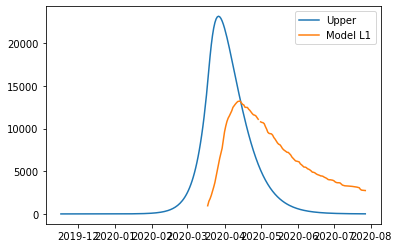

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23185192719381575, 'other': 0.19926690406739844, 'school': 0.33968221347882677, 'transport': 0.08718976655318007, 'work': 0.4759024613738801}
{'home': 1.0, 'leisure': 0.26324539143339676, 'other': 0.2129623941090461, 'school': 0.3522355982583842, 'transport': 0.10634838174141248, 'work': 0.5858745063802642}
{'home': 1.0, 'leisure': 0.2935176605215641, 'other': 0.22616875950634924, 'school': 0.36434064786724313, 'transport': 0.1248227606729223, 'work': 0.6919189783507059}
{'home': 1.0, 'leisure': 0.3181839538526634, 'other': 0.23692950168192956, 'school': 0.3742040216226097, 'transport': 0.1398759583208192, 'work': 0.7783255851414362}
{'home': 1.0, 'leisure': 0.3327594908210403, 'other': 0.24328812205840883, 'school': 0.38003237884168994, 'transport': 0.14877102965821282, 'work': 0.829384034608686}
{'home': 1.0, 'leisure': 0.3406078568809355, 'other': 0.24671199456882076,

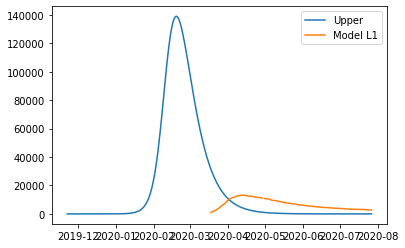

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23195908272275884, 'other': 0.13669453617633817, 'school': 0.02702617623120976, 'transport': 0.28724567124199396, 'work': 0.457922523718774}
{'home': 1.0, 'leisure': 0.28599841339960985, 'other': 0.15931200395782869, 'school': 0.034512643640793816, 'transport': 0.32493889733975023, 'work': 0.5916639325267729}
{'home': 1.0, 'leisure': 0.33810776798085895, 'other': 0.18112170503283737, 'school': 0.041731737214321295, 'transport': 0.361285936791158, 'work': 0.7206288624487717}
{'home': 1.0, 'leisure': 0.380567242084099, 'other': 0.19889257257543702, 'school': 0.0476139616075659, 'transport': 0.3909020430108236, 'work': 0.8257113979407706}
{'home': 1.0, 'leisure': 0.40565693132692265, 'other': 0.20939353975970046, 'school': 0.05108982147630135, 'transport': 0.4084024694133533, 'work': 0.8878056234587701}
{'home': 1.0, 'leisure': 0.4191667639961354, 'other': 0.215047906705073

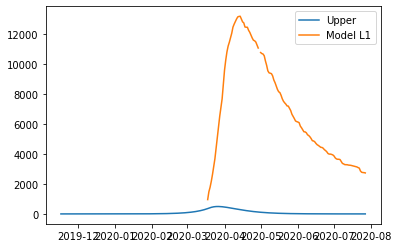

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23212288666998354, 'other': 0.28493670143164984, 'school': 0.18345064707961117, 'transport': 0.2617047532991148, 'work': 0.36268457619977934}
{'home': 1.0, 'leisure': 0.27073939680672743, 'other': 0.28918567854982175, 'school': 0.22949220331342693, 'transport': 0.3194904608983957, 'work': 0.5139338787706884}
{'home': 1.0, 'leisure': 0.30797674586715906, 'other': 0.29328290648520183, 'school': 0.27388941825317786, 'transport': 0.37521239322627375, 'work': 0.6597814205354936}
{'home': 1.0, 'leisure': 0.33831828954602927, 'other': 0.2966213885066226, 'school': 0.31006492672260455, 'transport': 0.4206154491971374, 'work': 0.7786201582697794}
{'home': 1.0, 'leisure': 0.35624738353808894, 'other': 0.2985941278829167, 'school': 0.3314413635454476, 'transport': 0.4474445277253749, 'work': 0.84884304874913}
{'home': 1.0, 'leisure': 0.36590151107227487, 'other': 0.2996563721624597

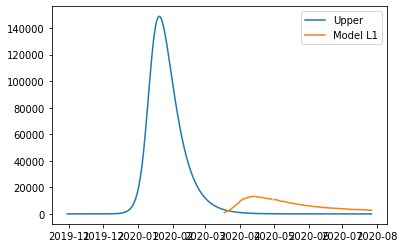

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3475413872933292, 'other': 0.22487766779876087, 'school': 0.3461204913126842, 'transport': 0.2985265578970212, 'work': 0.416513199489514}
{'home': 1.0, 'leisure': 0.3489109781581218, 'other': 0.22611272937708699, 'school': 0.3476481905243164, 'transport': 0.2998608901869244, 'work': 0.4212294643153139}
{'home': 1.0, 'leisure': 0.35023165506345744, 'other': 0.22730368161333003, 'school': 0.3491213290498189, 'transport': 0.3011475677521882, 'work': 0.4257772911116209}
{'home': 1.0, 'leisure': 0.3513077621715088, 'other': 0.2282740871391577, 'school': 0.3503216641446728, 'transport': 0.30219597169425505, 'work': 0.42948292776046365}
{'home': 1.0, 'leisure': 0.3519436436444482, 'other': 0.22884750858623767, 'school': 0.35103095306435916, 'transport': 0.30281548311456724, 'work': 0.4316726221438707}
{'home': 1.0, 'leisure': 0.35228604136064634, 'other': 0.22915627398081923, '

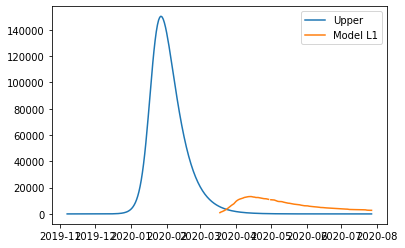

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23302035775701468, 'other': 0.47265268326609605, 'school': 0.5037651122652759, 'transport': 0.1262738325797728, 'work': 0.4949458439217368}
{'home': 1.0, 'leisure': 0.23586083117729564, 'other': 0.47952120147558713, 'school': 0.514090386088752, 'transport': 0.13121795675722842, 'work': 0.529503216305847}
{'home': 1.0, 'leisure': 0.23859985911828085, 'other': 0.48614441546331066, 'school': 0.5240469001328183, 'transport': 0.1359855050712035, 'work': 0.562826396819096}
{'home': 1.0, 'leisure': 0.24083165966278733, 'other': 0.49154110834219655, 'school': 0.5321596152798352, 'transport': 0.13987017406777577, 'work': 0.5899786179780397}
{'home': 1.0, 'leisure': 0.24215045089363205, 'other': 0.49473006322517454, 'school': 0.5369534924121635, 'transport': 0.14216566029302302, 'work': 0.6060231122992337}
{'home': 1.0, 'leisure': 0.24286056924870228, 'other': 0.4964471927775473, 

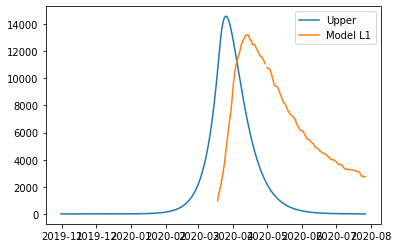

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.21336050648248642, 'other': 0.15216204008265574, 'school': 0.06914981698740685, 'transport': 0.38746339961476284, 'work': 0.4521391817670858}
{'home': 1.0, 'leisure': 0.2155831667260211, 'other': 0.15546470938693185, 'school': 0.07234629664659709, 'transport': 0.41170075587784555, 'work': 0.5382176567823885}
{'home': 1.0, 'leisure': 0.21772644624657242, 'other': 0.15864942621605524, 'school': 0.07542861631795911, 'transport': 0.4350724922743896, 'work': 0.6212219005471448}
{'home': 1.0, 'leisure': 0.21947282215220681, 'other': 0.16124438066941504, 'school': 0.07794013605018, 'transport': 0.4541161293382403, 'work': 0.6888549880591683}
{'home': 1.0, 'leisure': 0.22050477155099077, 'other': 0.16277776284640036, 'school': 0.0794242158919469, 'transport': 0.46536918760324303, 'work': 0.7288199943162732}
{'home': 1.0, 'leisure': 0.22106043661187444, 'other': 0.163603430172469

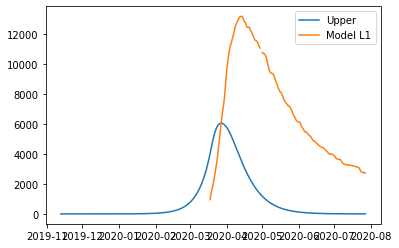

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2579615119842669, 'other': 0.435499045099939, 'school': 0.2820049718884634, 'transport': 0.30947088562669856, 'work': 0.42947361182978394}
{'home': 1.0, 'leisure': 0.2841218650547103, 'other': 0.4578274838029156, 'school': 0.29359759172860306, 'transport': 0.3231534566100947, 'work': 0.47589965071892054}
{'home': 1.0, 'leisure': 0.3093479198012093, 'other': 0.47935847826650013, 'school': 0.3047761894315948, 'transport': 0.33634736434408385, 'work': 0.5206676167905879}
{'home': 1.0, 'leisure': 0.3299024829279863, 'other': 0.49690225153312456, 'school': 0.3138846764488474, 'transport': 0.347097955831038, 'work': 0.5571452187749095}
{'home': 1.0, 'leisure': 0.3420483611392636, 'other': 0.5072690266452209, 'school': 0.31926696423176937, 'transport': 0.353450578073329, 'work': 0.5787001654020087}
{'home': 1.0, 'leisure': 0.34858844940687445, 'other': 0.5128511363209649, 'scho

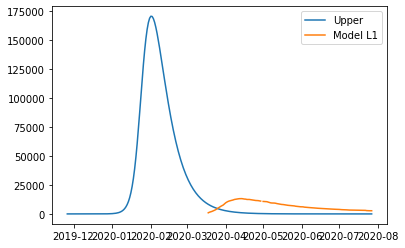

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3487586623651276, 'other': 0.23901027827990926, 'school': 0.4268892541243359, 'transport': 0.22944194623890807, 'work': 0.4638900343477992}
{'home': 1.0, 'leisure': 0.3590492499028271, 'other': 0.24626612907965784, 'school': 0.4274658761665909, 'transport': 0.23219360163471148, 'work': 0.4859623893326011}
{'home': 1.0, 'leisure': 0.3689723164570374, 'other': 0.25326284235084395, 'school': 0.42802190456447964, 'transport': 0.23484698362352194, 'work': 0.5072464459250887}
{'home': 1.0, 'leisure': 0.37705777809380125, 'other': 0.2589638679792179, 'school': 0.4284749647405371, 'transport': 0.23700899857736749, 'work': 0.5245890105560045}
{'home': 1.0, 'leisure': 0.38183555087916177, 'other': 0.2623326558505297, 'school': 0.4287426821172983, 'transport': 0.2382865528682762, 'work': 0.5348368896560911}
{'home': 1.0, 'leisure': 0.38440819776358665, 'other': 0.26414661855046684,

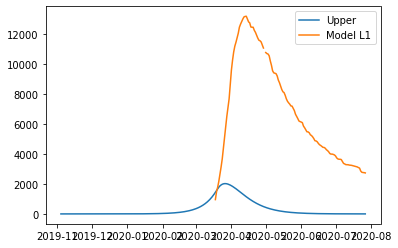

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26653925268864564, 'other': 0.30107791081363666, 'school': 0.373231410095653, 'transport': 0.3182532540504931, 'work': 0.37674692896577466}
{'home': 1.0, 'leisure': 0.26842439188632355, 'other': 0.3487355887179671, 'school': 0.42045881328660084, 'transport': 0.33351127327451, 'work': 0.4696746576851173}
{'home': 1.0, 'leisure': 0.27024220468408444, 'other': 0.3946912066971429, 'school': 0.4659995235064433, 'transport': 0.3482243632405263, 'work': 0.5592835389501977}
{'home': 1.0, 'leisure': 0.27172338548225994, 'other': 0.43213652505054545, 'school': 0.5031067688707593, 'transport': 0.3602128069165396, 'work': 0.6322981829439669}
{'home': 1.0, 'leisure': 0.27259862868118184, 'other': 0.454263304077556, 'school': 0.5250337774951279, 'transport': 0.3672968872705475, 'work': 0.675443199849376}
{'home': 1.0, 'leisure': 0.27306991348060133, 'other': 0.4661777235536387, 'schoo

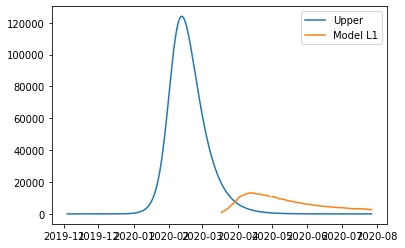

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2720845619012092, 'other': 0.45224653106279766, 'school': 0.3380046894340477, 'transport': 0.2336655513957053, 'work': 0.4526749868654826}
{'home': 1.0, 'leisure': 0.27333360217439884, 'other': 0.4536778342389157, 'school': 0.33807779837067076, 'transport': 0.23395277541240397, 'work': 0.45666608485849225}
{'home': 1.0, 'leisure': 0.2745380338664031, 'other': 0.45505801944445823, 'school': 0.33814829627384296, 'transport': 0.23422974142850625, 'work': 0.4605146436374659}
{'home': 1.0, 'leisure': 0.27551942265248064, 'other': 0.45618261479712247, 'school': 0.33820573900976103, 'transport': 0.23445541744162662, 'work': 0.46365050634625926}
{'home': 1.0, 'leisure': 0.27609933420789007, 'other': 0.45684714841460583, 'school': 0.3382396824446217, 'transport': 0.2345887714493796, 'work': 0.46550351612872803}
{'home': 1.0, 'leisure': 0.27641159427618744, 'other': 0.457204974208

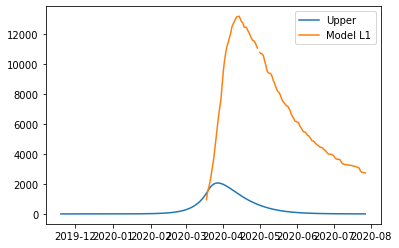

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.37507344453938096, 'other': 0.3386750975700724, 'school': 0.4098007936774115, 'transport': 0.3848670606540877, 'work': 0.4926704709648813}
{'home': 1.0, 'leisure': 0.38124183989790034, 'other': 0.34391282729876566, 'school': 0.41554990648887, 'transport': 0.38938106079832163, 'work': 0.5110285884943622}
{'home': 1.0, 'leisure': 0.38718993542218694, 'other': 0.34896349525143416, 'school': 0.4210936938427764, 'transport': 0.3937338466516901, 'work': 0.5287310589692188}
{'home': 1.0, 'leisure': 0.39203653177530934, 'other': 0.35307885432397884, 'school': 0.4256108539089223, 'transport': 0.39728056105073106, 'work': 0.5431552941709538}
{'home': 1.0, 'leisure': 0.3949004296203362, 'other': 0.3555106574123007, 'school': 0.42828008485709945, 'transport': 0.39937634683198253, 'work': 0.5516787058810699}
{'home': 1.0, 'leisure': 0.3964425284599661, 'other': 0.356820089844474, 'sc

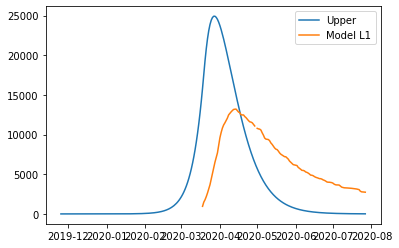

[9.79048885e+01 2.29614614e+00 3.82184172e+00 8.95138505e-01
 3.72869863e-02 1.67795709e+01 2.05091545e-02 4.19886404e-01
 2.28583220e-01 2.14954155e-01 6.22202369e-03 1.90772405e-01
 3.04164194e-01 2.82361681e-01 2.71223184e-01 1.66315597e-01]

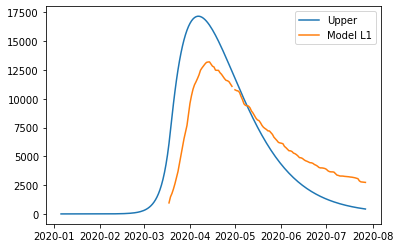

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.21320484000004325, 'other': 0.04580321909773308, 'school': 0.1726790060146908, 'transport': 0.1631408641883171, 'work': 0.4546946743753106}
{'home': 1.0, 'leisure': 0.21657839258679065, 'other': 0.0468348392543273, 'school': 0.1730431642143341, 'transport': 0.16692386096846398, 'work': 0.46684651949792993}
{'home': 1.0, 'leisure': 0.2198314611525828, 'other': 0.047829615833900295, 'school': 0.17339431676399014, 'transport': 0.17057175072074848, 'work': 0.47856437015188436}
{'home': 1.0, 'leisure': 0.22248210961359866, 'other': 0.048640174528367185, 'school': 0.1736804410637099, 'transport': 0.17354410533372103, 'work': 0.4881122484625139}
{'home': 1.0, 'leisure': 0.2240484018860171, 'other': 0.04911914102964307, 'school': 0.1738495145135443, 'transport': 0.1753004966959321, 'work': 0.4937541765551586}
{'home': 1.0, 'leisure': 0.22489179003270396, 'other': 0.0493770460687

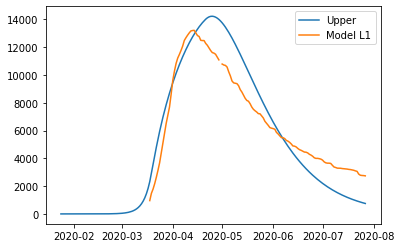

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3113909769288169, 'other': 0.08853759298649559, 'school': 0.17123920728592684, 'transport': 0.16499720356590422, 'work': 0.44268142930819665}
{'home': 1.0, 'leisure': 0.31431696530669906, 'other': 0.09010017998743028, 'school': 0.17294247884268343, 'transport': 0.16747746471217528, 'work': 0.45079620493854106}
{'home': 1.0, 'leisure': 0.31713845409965685, 'other': 0.09160696030976016, 'school': 0.17458491927241296, 'transport': 0.16986914510322237, 'work': 0.45862116715351603}
{'home': 1.0, 'leisure': 0.31943744496799287, 'other': 0.092834707239066, 'school': 0.1759232040670074, 'transport': 0.17181792171814964, 'work': 0.46499706229164384}
{'home': 1.0, 'leisure': 0.3207959395720095, 'other': 0.09356019406092854, 'school': 0.17671400871835868, 'transport': 0.1729694715360612, 'work': 0.4687646366914466}
{'home': 1.0, 'leisure': 0.3215274366664801, 'other': 0.09395084081

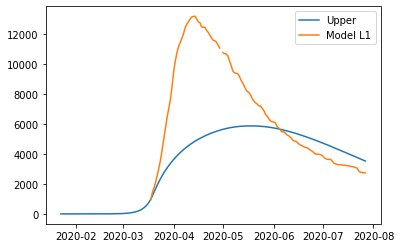

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23152272726521922, 'other': 0.13185227929809232, 'school': 0.17433798171937012, 'transport': 0.2403861297802783, 'work': 0.26446398745042105}
{'home': 1.0, 'leisure': 0.24051485575409015, 'other': 0.13662868446104068, 'school': 0.18126600354771108, 'transport': 0.2484548148808702, 'work': 0.2993536722784028}
{'home': 1.0, 'leisure': 0.24918583679692996, 'other': 0.14123450372531232, 'school': 0.18794659602503988, 'transport': 0.256235332656441, 'work': 0.33299729693395663}
{'home': 1.0, 'leisure': 0.2562510806096142, 'other': 0.14498739349620032, 'school': 0.19339004174730778, 'transport': 0.26257501380690607, 'work': 0.36041062072737085}
{'home': 1.0, 'leisure': 0.2604259974080186, 'other': 0.14720501017899779, 'school': 0.19660662331046608, 'transport': 0.2663211890321809, 'work': 0.3766094029689338}
{'home': 1.0, 'leisure': 0.26267402953023633, 'other': 0.148399111469

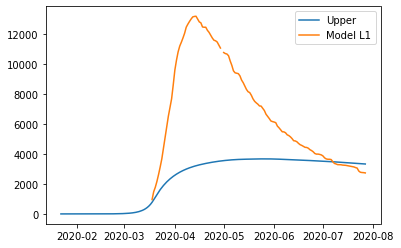

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4122669439061192, 'other': 0.25524464921674705, 'school': 0.3605833353061774, 'transport': 0.14286687778331672, 'work': 0.4858643761453703}
{'home': 1.0, 'leisure': 0.426976487351892, 'other': 0.27466583195160654, 'school': 0.37491944168451075, 'transport': 0.1475614401558435, 'work': 0.5393946899609168}
{'home': 1.0, 'leisure': 0.44116068996031577, 'other': 0.2933934010173639, 'school': 0.3887435442636178, 'transport': 0.15208833958649431, 'work': 0.5910132068544793}
{'home': 1.0, 'leisure': 0.4527181883819944, 'other': 0.30865290173761056, 'school': 0.40000762784659394, 'transport': 0.15577692430776535, 'work': 0.633072739138123}
{'home': 1.0, 'leisure': 0.45954761926753185, 'other': 0.31766987943593816, 'school': 0.4066636772365344, 'transport': 0.15795654255215277, 'work': 0.6579260991239124}
{'home': 1.0, 'leisure': 0.463225005128975, 'other': 0.32252517511965306, '

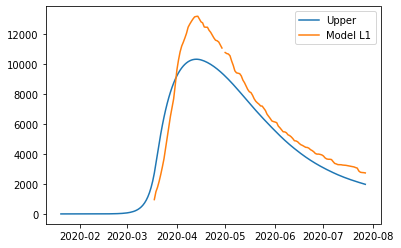

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.422972036415065, 'other': 0.18465745255252058, 'school': 0.21715822162984996, 'transport': 0.22253481000837105, 'work': 0.47356523798439276}
{'home': 1.0, 'leisure': 0.4569570303367798, 'other': 0.20731983815485694, 'school': 0.2493484754424515, 'transport': 0.2439247814466333, 'work': 0.5481344367844426}
{'home': 1.0, 'leisure': 0.48972827447557626, 'other': 0.2291728528428242, 'school': 0.2803890773331745, 'transport': 0.2645508253335291, 'work': 0.6200404499130623}
{'home': 1.0, 'leisure': 0.5164307696997807, 'other': 0.24697901295894564, 'school': 0.3056814196145043, 'transport': 0.28135723146359226, 'work': 0.67863053468453}
{'home': 1.0, 'leisure': 0.5322095168777197, 'other': 0.25750083484574465, 'school': 0.3206268945989264, 'transport': 0.2912882896313569, 'work': 0.7132519484131246}
{'home': 1.0, 'leisure': 0.5407057653581484, 'other': 0.26316643124632877, 'sch

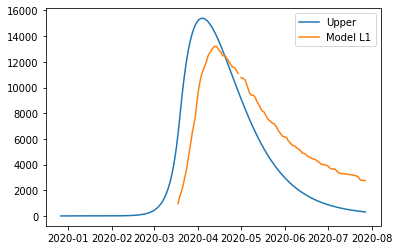

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24515242685041017, 'other': 0.03273696129040182, 'school': 0.04673078837966929, 'transport': 0.14029403352683512, 'work': 0.44430477566258386}
{'home': 1.0, 'leisure': 0.2643191846528124, 'other': 0.034408260855305045, 'school': 0.04861943137407377, 'transport': 0.15517279187382352, 'work': 0.49154900970305626}
{'home': 1.0, 'leisure': 0.28280141539084314, 'other': 0.03601987115003316, 'school': 0.050440622832963806, 'transport': 0.16952016599413378, 'work': 0.5371059496706546}
{'home': 1.0, 'leisure': 0.2978610108070163, 'other': 0.03733303509388569, 'school': 0.051924556614281615, 'transport': 0.18121061898105326, 'work': 0.574226419273883}
{'home': 1.0, 'leisure': 0.3067598626438459, 'other': 0.038108995606162197, 'school': 0.05280142657596941, 'transport': 0.1881186139278693, 'work': 0.5961612422212451}
{'home': 1.0, 'leisure': 0.31155155209444646, 'other': 0.0385268

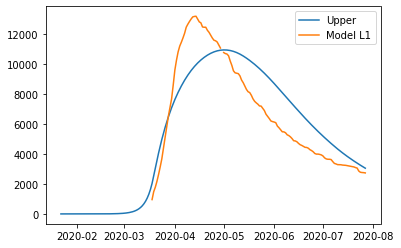

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31138659993220236, 'other': 0.02972817228159495, 'school': 0.2087315209788193, 'transport': 0.2492515872483294, 'work': 0.46731218416753967}
{'home': 1.0, 'leisure': 0.3353836095210241, 'other': 0.030000699740521684, 'school': 0.2192160978995079, 'transport': 0.27367815979457294, 'work': 0.5392705118050304}
{'home': 1.0, 'leisure': 0.35852358305310217, 'other': 0.03026349407591532, 'school': 0.22932622564445762, 'transport': 0.2972323547498792, 'work': 0.6086588991697536}
{'home': 1.0, 'leisure': 0.3773783763014621, 'other': 0.030477622793643473, 'school': 0.23756410751071294, 'transport': 0.3164246617504991, 'work': 0.6651975851706392}
{'home': 1.0, 'leisure': 0.38851984503912934, 'other': 0.03060415339957374, 'school': 0.24243194679531838, 'transport': 0.3277655704326836, 'work': 0.6986068087166171}
{'home': 1.0, 'leisure': 0.39451909743633473, 'other': 0.0306722852643

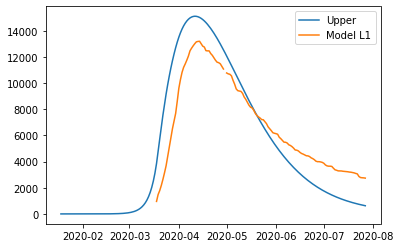

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.252503730823842, 'other': 0.17169258833416248, 'school': 0.059552816075231885, 'transport': 0.2779887108884257, 'work': 0.4378226090409799}
{'home': 1.0, 'leisure': 0.25272365638508015, 'other': 0.17302573726837844, 'school': 0.0597906676104059, 'transport': 0.2804161934763323, 'work': 0.4439799627857825}
{'home': 1.0, 'leisure': 0.2529357274619884, 'other': 0.17431127374065813, 'school': 0.06002002444789513, 'transport': 0.28275698025752793, 'work': 0.4499174110396993}
{'home': 1.0, 'leisure': 0.25310852611724693, 'other': 0.1753587479032564, 'school': 0.060206907796960425, 'transport': 0.2846642880051689, 'work': 0.45475533183918704}
{'home': 1.0, 'leisure': 0.2532106344135361, 'other': 0.1759777099084281, 'school': 0.06031733886686265, 'transport': 0.28579133349241126, 'work': 0.4576141032207025}
{'home': 1.0, 'leisure': 0.2532656158038456, 'other': 0.1763109971419821

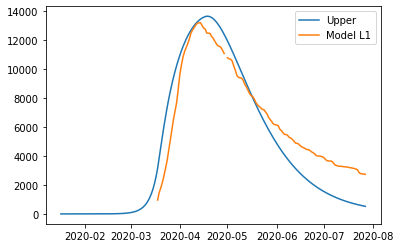

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.40629646872333935, 'other': 0.040890735188686876, 'school': 0.12582550326531472, 'transport': 0.1809042370308196, 'work': 0.4845461454088564}
{'home': 1.0, 'leisure': 0.41298902363751977, 'other': 0.042280951641549054, 'school': 0.1298269758019212, 'transport': 0.18464947300664858, 'work': 0.503750148253343}
{'home': 1.0, 'leisure': 0.4194425587333366, 'other': 0.04362151750680901, 'school': 0.13368553860507743, 'transport': 0.18826095055476935, 'work': 0.5222682938533836}
{'home': 1.0, 'leisure': 0.42470099473733547, 'other': 0.04471383043405787, 'school': 0.13682955274098252, 'transport': 0.19120363596434925, 'work': 0.5373571532311945}
{'home': 1.0, 'leisure': 0.427808252376062, 'other': 0.045359288072886736, 'school': 0.13868737927583552, 'transport': 0.19294249552455556, 'work': 0.5462732974089918}
{'home': 1.0, 'leisure': 0.42948139110460715, 'other': 0.04570684218

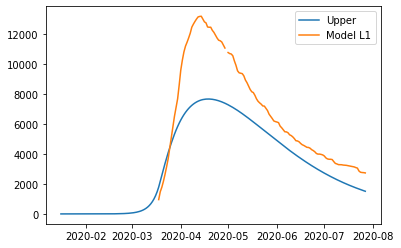

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2671923953773452, 'other': 0.313533858632388, 'school': 0.13033260805248803, 'transport': 0.18510422508001848, 'work': 0.4560638040106076}
{'home': 1.0, 'leisure': 0.2695941866531629, 'other': 0.31673378220021636, 'school': 0.1313359606565146, 'transport': 0.18753471931030508, 'work': 0.46316563389374754}
{'home': 1.0, 'leisure': 0.27191019966913, 'other': 0.31981942278347947, 'school': 0.1323034792389688, 'transport': 0.1898784101752243, 'work': 0.47001382699534683}
{'home': 1.0, 'leisure': 0.27379732138584395, 'other': 0.3223336484439161, 'school': 0.1330918277135611, 'transport': 0.19178808421330662, 'work': 0.4755938361892425}
{'home': 1.0, 'leisure': 0.27491243876390214, 'other': 0.32381932724326495, 'school': 0.13355766999400204, 'transport': 0.19291652796308256, 'work': 0.4788911143492718}
{'home': 1.0, 'leisure': 0.2755128865828566, 'other': 0.32461930813522205, 

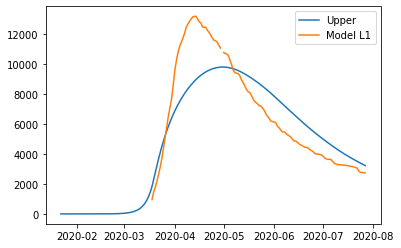

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2972386289208545, 'other': 0.42226890966243324, 'school': 0.07593947660398567, 'transport': 0.2335514275618716, 'work': 0.43532030489435697}
{'home': 1.0, 'leisure': 0.3144958488278876, 'other': 0.487328412509696, 'school': 0.07833483749865891, 'transport': 0.23978891999859292, 'work': 0.502408909738814}
{'home': 1.0, 'leisure': 0.33113673945252675, 'other': 0.5500643616838421, 'school': 0.08064464978995095, 'transport': 0.24580364484828846, 'work': 0.5671014929816832}
{'home': 1.0, 'leisure': 0.34469598366519566, 'other': 0.6011825424924055, 'school': 0.08252671906433706, 'transport': 0.2507045317628552, 'work': 0.6198139682166137}
{'home': 1.0, 'leisure': 0.3527082643363182, 'other': 0.6313887402429206, 'school': 0.08363885090829248, 'transport': 0.25360051039419007, 'work': 0.6509622490372545}
{'home': 1.0, 'leisure': 0.3570225693130765, 'other': 0.6476536159547361, '

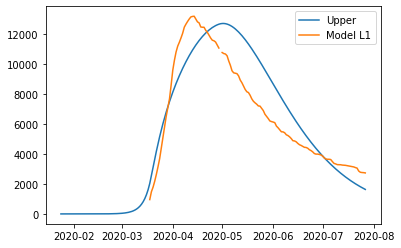

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.19171806391535207, 'other': 0.12793793307055254, 'school': 0.26764737408439765, 'transport': 0.08468241184185481, 'work': 0.4224263940802973}
{'home': 1.0, 'leisure': 0.19184514563307792, 'other': 0.12804197022536717, 'school': 0.2677098153744812, 'transport': 0.08479815768494393, 'work': 0.4230429456923127}
{'home': 1.0, 'leisure': 0.19196768871802786, 'other': 0.12814229176750985, 'school': 0.2677700266184903, 'transport': 0.08490976974792275, 'work': 0.423637477603899}
{'home': 1.0, 'leisure': 0.1920675386390982, 'other': 0.12822403524629278, 'school': 0.26781908763212736, 'transport': 0.08500071291034993, 'work': 0.42412191101333974}
{'home': 1.0, 'leisure': 0.1921265408651852, 'other': 0.12827233821102813, 'school': 0.2678480782310947, 'transport': 0.08505445205178416, 'work': 0.4244081671189183}
{'home': 1.0, 'leisure': 0.19215831129461666, 'other': 0.1282983474997

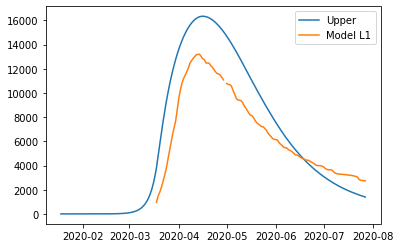

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.34406605939873547, 'other': 0.11833622801638705, 'school': 0.09200377096320994, 'transport': 0.2873690523500372, 'work': 0.4616160158048113}
{'home': 1.0, 'leisure': 0.3608906381512374, 'other': 0.12483973553245922, 'school': 0.0990633553583837, 'transport': 0.31593122084631975, 'work': 0.5340644757964151}
{'home': 1.0, 'leisure': 0.3771143390911499, 'other': 0.13111097492295737, 'school': 0.1058708117394441, 'transport': 0.3434733118963065, 'work': 0.6039254907883187}
{'home': 1.0, 'leisure': 0.3903336509681157, 'other': 0.1362208736855855, 'school': 0.11141762804993777, 'transport': 0.3659150157148142, 'work': 0.6608492807817217}
{'home': 1.0, 'leisure': 0.3981450625317773, 'other': 0.1392403593180476, 'school': 0.1146952922334113, 'transport': 0.3791760225166597, 'work': 0.6944860657778235}
{'home': 1.0, 'leisure': 0.4023512072199027, 'other': 0.14086623619706562, 'sc

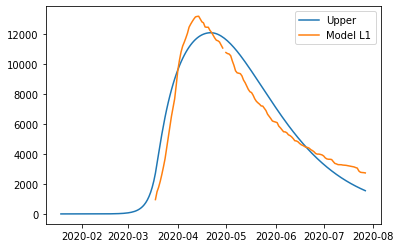

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24564310429761663, 'other': 0.4001922889173052, 'school': 0.11423349128237056, 'transport': 0.13385085221782383, 'work': 0.43685713584497216}
{'home': 1.0, 'leisure': 0.24705014130915232, 'other': 0.4325646022575187, 'school': 0.1155300295115823, 'transport': 0.14306074220573728, 'work': 0.4754849987361608}
{'home': 1.0, 'leisure': 0.24840692699884742, 'other': 0.46378076154986747, 'school': 0.11678026280403646, 'transport': 0.1519417075512252, 'work': 0.5127332950955212}
{'home': 1.0, 'leisure': 0.24951245607933972, 'other': 0.4892161506028924, 'school': 0.11779897141270282, 'transport': 0.1591780496845858, 'work': 0.5430837587957409}
{'home': 1.0, 'leisure': 0.25016572326326697, 'other': 0.5042461532251343, 'school': 0.11840093559055112, 'transport': 0.163454070036117, 'work': 0.561018123709507}
{'home': 1.0, 'leisure': 0.2505174825161509, 'other': 0.5123392315601878, 

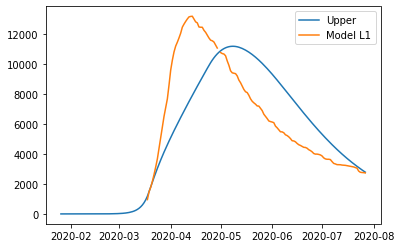

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2690218733622577, 'other': 0.3645373677663019, 'school': 0.12656736197239543, 'transport': 0.4063210093620321, 'work': 0.474632323025528}
{'home': 1.0, 'leisure': 0.27026891352647814, 'other': 0.3784264251790123, 'school': 0.12982374166403704, 'transport': 0.41363853866593137, 'work': 0.49552610094983035}
{'home': 1.0, 'leisure': 0.2714714165419764, 'other': 0.39181944482698305, 'school': 0.13296382208097718, 'transport': 0.4206947276375485, 'work': 0.5156736725196933}
{'home': 1.0, 'leisure': 0.2724512338138638, 'other': 0.40273227565125547, 'school': 0.13552240612440986, 'transport': 0.4264442149477551, 'work': 0.5320902123173594}
{'home': 1.0, 'leisure': 0.27303021674725186, 'other': 0.40918076659287106, 'school': 0.1370342966955292, 'transport': 0.4298416392674226, 'work': 0.5417908949250713}
{'home': 1.0, 'leisure': 0.27334197678830696, 'other': 0.4126530309460486, 

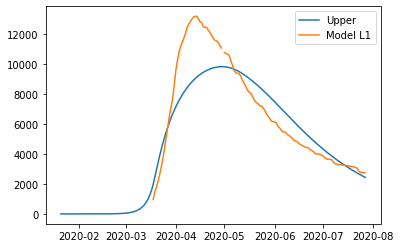

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.13664531539137562, 'other': 0.2117297875426222, 'school': 0.06163220048494329, 'transport': 0.19796450076268188, 'work': 0.4301560164837316}
{'home': 1.0, 'leisure': 0.1434983841015711, 'other': 0.22896867135660723, 'school': 0.06420012162016922, 'transport': 0.21595742243169894, 'work': 0.4871518334482362}
{'home': 1.0, 'leisure': 0.15010670035783102, 'other': 0.24559188074866423, 'school': 0.06667633128627995, 'transport': 0.23330773975539398, 'work': 0.5421120855211514}
{'home': 1.0, 'leisure': 0.1554912543444132, 'other': 0.259136718031081, 'school': 0.0686939836068146, 'transport': 0.2474450353524788, 'work': 0.5868945131361193}
{'home': 1.0, 'leisure': 0.15867303624557538, 'other': 0.2671404855161455, 'school': 0.06988623270531236, 'transport': 0.25579889184166527, 'work': 0.6133568567267822}
{'home': 1.0, 'leisure': 0.16038630342312427, 'other': 0.2714502064696417

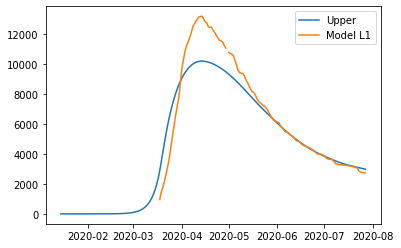

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2854106462950946, 'other': 0.29082255135326385, 'school': 0.07839226547052983, 'transport': 0.1704667275900637, 'work': 0.3466530541141747}
{'home': 1.0, 'leisure': 0.30255237961858594, 'other': 0.34935372690961886, 'school': 0.09012566684761876, 'transport': 0.20159152245965248, 'work': 0.4527064602309408}
{'home': 1.0, 'leisure': 0.319081908180524, 'other': 0.4057945033389611, 'school': 0.10144001817552595, 'transport': 0.23160471751247022, 'work': 0.5549722447006795}
{'home': 1.0, 'leisure': 0.3325504129346958, 'other': 0.4517832841332401, 'school': 0.1106591192575244, 'transport': 0.25605991348143287, 'work': 0.6382999209352815}
{'home': 1.0, 'leisure': 0.3405090748348881, 'other': 0.4789584727844049, 'school': 0.11610676989688712, 'transport': 0.27051071109945624, 'work': 0.6875390023466372}
{'home': 1.0, 'leisure': 0.34479450816576096, 'other': 0.4935912666734936, 

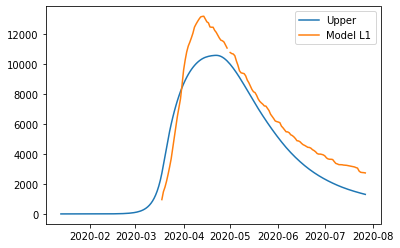

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3502658996013056, 'other': 0.25490088178159914, 'school': 0.16327994653003233, 'transport': 0.18892882420195473, 'work': 0.3511548755561374}
{'home': 1.0, 'leisure': 0.359678112856052, 'other': 0.28550255057904367, 'school': 0.17813457270507255, 'transport': 0.2345908520758724, 'work': 0.4463792369173315}
{'home': 1.0, 'leisure': 0.3687541756374145, 'other': 0.31501130263372235, 'school': 0.1924586765167185, 'transport': 0.27862209324000736, 'work': 0.5382027282299116}
{'home': 1.0, 'leisure': 0.3761494860518581, 'other': 0.33905547097457156, 'school': 0.20413016851139293, 'transport': 0.3144994008552284, 'work': 0.6130218692994212}
{'home': 1.0, 'leisure': 0.3805194422058475, 'other': 0.353263388630528, 'school': 0.21102695923551873, 'transport': 0.3356996280824044, 'work': 0.6572331799314041}
{'home': 1.0, 'leisure': 0.38287249551953406, 'other': 0.3609138058298891, 's

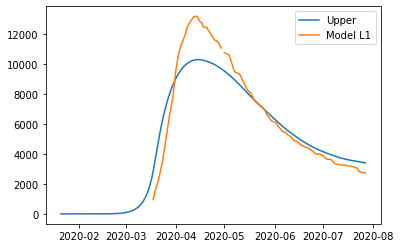

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3004652326431383, 'other': 0.12953534293152594, 'school': 0.2314230336222374, 'transport': 0.294885819320101, 'work': 0.40460082153088234}
{'home': 1.0, 'leisure': 0.3348858136211845, 'other': 0.1465907690777714, 'school': 0.2663063472936815, 'transport': 0.3217496929396042, 'work': 0.5151906073769497}
{'home': 1.0, 'leisure': 0.36807708813572904, 'other': 0.16303707286165092, 'school': 0.29994382833400257, 'transport': 0.3476541425012681, 'work': 0.6218307580142288}
{'home': 1.0, 'leisure': 0.39512183033276527, 'other': 0.17643776483370094, 'school': 0.32735214621870856, 'transport': 0.36876147177373486, 'work': 0.7087227326075674}
{'home': 1.0, 'leisure': 0.41110281435828677, 'other': 0.18435635554445776, 'school': 0.34354797042330765, 'transport': 0.38123398452564716, 'work': 0.7600679903218129}
{'home': 1.0, 'leisure': 0.4197079596027983, 'other': 0.18862021208101912

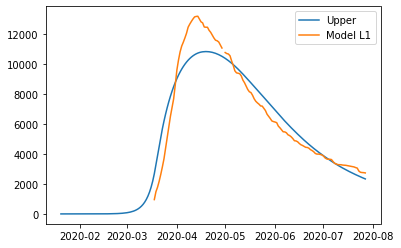

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2350341145336374, 'other': 0.29620961606067564, 'school': 0.10626245618966876, 'transport': 0.3359167682585811, 'work': 0.3531567538763806}
{'home': 1.0, 'leisure': 0.24305495574787295, 'other': 0.3473184086004429, 'school': 0.126528879880578, 'transport': 0.36972888307941587, 'work': 0.4300808147494595}
{'home': 1.0, 'leisure': 0.2507893383473144, 'other': 0.39660188712093275, 'school': 0.14607150272538338, 'transport': 0.40233342237093517, 'work': 0.5042575877342141}
{'home': 1.0, 'leisure': 0.25709142787278516, 'other': 0.4367587955450356, 'school': 0.16199512133966923, 'transport': 0.42890008401587676, 'work': 0.5646979212773475}
{'home': 1.0, 'leisure': 0.26081538986510877, 'other': 0.4604878777956418, 'school': 0.17140453233901995, 'transport': 0.4445985658969786, 'work': 0.6004126638255627}
{'home': 1.0, 'leisure': 0.2628206001686677, 'other': 0.4732650759305837, 

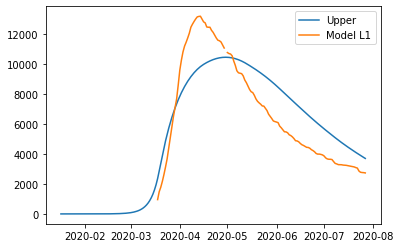

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07164530896220858, 'other': 0.12544890894579103, 'school': 0.24299773627745053, 'transport': 0.21684372596079546, 'work': 0.2711743227223743}
{'home': 1.0, 'leisure': 0.08358043548795145, 'other': 0.1445657686091673, 'school': 0.2630705711304067, 'transport': 0.2601806914695294, 'work': 0.3335004001020751}
{'home': 1.0, 'leisure': 0.09508930749491781, 'other': 0.1629998832845659, 'school': 0.2824265190243288, 'transport': 0.3019699082100943, 'work': 0.39360054614678663}
{'home': 1.0, 'leisure': 0.10446690690800149, 'other': 0.17802027302007586, 'school': 0.29819803212308005, 'transport': 0.33602038110981375, 'work': 0.4425710355165515}
{'home': 1.0, 'leisure': 0.1100082156520964, 'other': 0.1868959578637863, 'school': 0.30751756259052404, 'transport': 0.35614111509601165, 'work': 0.4715081428714126}
{'home': 1.0, 'leisure': 0.11299199728353213, 'other': 0.191675172779630

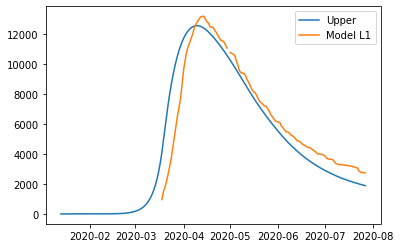

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.32163538232294797, 'other': 0.343918899203063, 'school': 0.05635068417989169, 'transport': 0.22198577660532764, 'work': 0.4311924648119362}
{'home': 1.0, 'leisure': 0.36137630355934974, 'other': 0.39378272656886487, 'school': 0.06564641364462817, 'transport': 0.25299629783165734, 'work': 0.5067959275735133}
{'home': 1.0, 'leisure': 0.39969790618016565, 'other': 0.44186570295731664, 'school': 0.07461015277133834, 'transport': 0.282899300442761, 'work': 0.5796992666650341}
{'home': 1.0, 'leisure': 0.43092291572305275, 'other': 0.4810444244590181, 'school': 0.08191394020791701, 'transport': 0.30726470997773436, 'work': 0.6391019874062733}
{'home': 1.0, 'leisure': 0.44937405772566785, 'other': 0.5041954871645691, 'school': 0.08622981460225894, 'transport': 0.3216624519756731, 'work': 0.6742035951170056}
{'home': 1.0, 'leisure': 0.4593092880347683, 'other': 0.5166614440060195

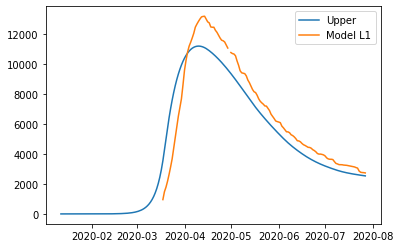

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2446521468464567, 'other': 0.37300953412275273, 'school': 0.19092446629672608, 'transport': 0.27105913508745116, 'work': 0.37712734283491395}
{'home': 1.0, 'leisure': 0.2473805663398536, 'other': 0.4540548386216803, 'school': 0.2280587043342135, 'transport': 0.30981191896554783, 'work': 0.4729370012552269}
{'home': 1.0, 'leisure': 0.25001154227991496, 'other': 0.5322056679599318, 'school': 0.2638667195846478, 'transport': 0.3471806748479982, 'work': 0.5653248861605288}
{'home': 1.0, 'leisure': 0.25215530045329826, 'other': 0.5958841214948036, 'school': 0.2930436208998165, 'transport': 0.37762929075221696, 'work': 0.6406039034907747}
{'home': 1.0, 'leisure': 0.2534220666466611, 'other': 0.6335122985835915, 'school': 0.31028451713150706, 'transport': 0.395621654695619, 'work': 0.68508695918592}
{'home': 1.0, 'leisure': 0.25410417152001036, 'other': 0.6537736247083232, 'sch

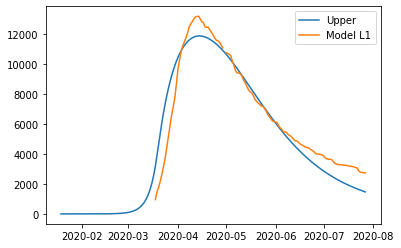

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.30900183018881444, 'other': 0.3579898150423433, 'school': 0.055624194475463316, 'transport': 0.300767432076076, 'work': 0.3572792509997984}
{'home': 1.0, 'leisure': 0.3124607790817536, 'other': 0.4232138684870888, 'school': 0.05693606522484263, 'transport': 0.3264934513195894, 'work': 0.4229034328902267}
{'home': 1.0, 'leisure': 0.31579619408565934, 'other': 0.4861084914516648, 'school': 0.058201083447458404, 'transport': 0.3513006841615487, 'work': 0.486183893998854}
{'home': 1.0, 'leisure': 0.3185139396443973, 'other': 0.5373559620153934, 'school': 0.05923183903625644, 'transport': 0.3715139849957378, 'work': 0.5377457511984762}
{'home': 1.0, 'leisure': 0.32011988020183335, 'other': 0.5676385582575967, 'school': 0.059840921884182545, 'transport': 0.3834582082159404, 'work': 0.5682141213618893}
{'home': 1.0, 'leisure': 0.3209846174250682, 'other': 0.583944571618783, 'sc

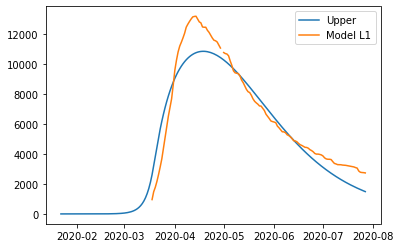

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.258617591237321, 'other': 0.1641519758806548, 'school': 0.10279213696482514, 'transport': 0.16224236196408987, 'work': 0.387534126553169}
{'home': 1.0, 'leisure': 0.2604523393989731, 'other': 0.1760820061446356, 'school': 0.10726528019779508, 'transport': 0.1748575067464342, 'work': 0.42711751002233955}
{'home': 1.0, 'leisure': 0.2622215608405662, 'other': 0.18758596389918847, 'school': 0.11157866831530178, 'transport': 0.18702211064369476, 'work': 0.465287201224754}
{'home': 1.0, 'leisure': 0.26366314868186425, 'other': 0.19695955910660193, 'school': 0.11509328085549243, 'transport': 0.19693401011553674, 'work': 0.49638843109338804}
{'home': 1.0, 'leisure': 0.2645149960426313, 'other': 0.20249850172916442, 'school': 0.11717009735651418, 'transport': 0.20279104162162515, 'work': 0.5147664305612172}
{'home': 1.0, 'leisure': 0.2649736830830443, 'other': 0.2054810092951596,

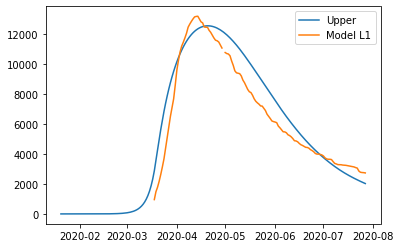

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3329450014677237, 'other': 0.12464416598560617, 'school': 0.26394294546884467, 'transport': 0.22376981883099303, 'work': 0.36494735435207126}
{'home': 1.0, 'leisure': 0.39008556221712176, 'other': 0.12537297198384925, 'school': 0.29936262464728575, 'transport': 0.273659138089016, 'work': 0.46293605900383705}
{'home': 1.0, 'leisure': 0.4451853886540412, 'other': 0.12607574919644077, 'school': 0.3335173152836397, 'transport': 0.3217666959449666, 'work': 0.5574251670608968}
{'home': 1.0, 'leisure': 0.4900815435285683, 'other': 0.12664838248077462, 'school': 0.36134706320955773, 'transport': 0.3609654467905561, 'work': 0.6344162921444272}
{'home': 1.0, 'leisure': 0.5166110895907887, 'other': 0.1269867566942446, 'school': 0.37779191425669106, 'transport': 0.38412834501749527, 'work': 0.6799110478756041}
{'home': 1.0, 'leisure': 0.5308962297781383, 'other': 0.1271689581938054,

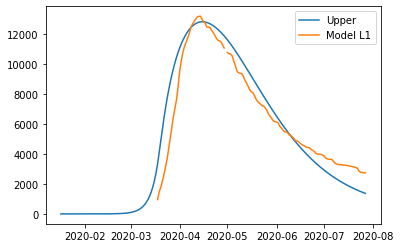

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2458318913526047, 'other': 0.202897183587161, 'school': 0.13913916820228955, 'transport': 0.17608191565441178, 'work': 0.38679521473311945}
{'home': 1.0, 'leisure': 0.25268496006280017, 'other': 0.2273665840320856, 'school': 0.153415921019604, 'transport': 0.19286740690974377, 'work': 0.44379103169762407}
{'home': 1.0, 'leisure': 0.2592932763190601, 'other': 0.2509620773182629, 'school': 0.1671827898077286, 'transport': 0.20905341633452817, 'work': 0.49875128377053923}
{'home': 1.0, 'leisure': 0.26467783030564224, 'other': 0.2701880348107037, 'school': 0.17840023844990427, 'transport': 0.22224201660657478, 'work': 0.5435337113855072}
{'home': 1.0, 'leisure': 0.26785961220680443, 'other': 0.28154882787441865, 'school': 0.18502873082937166, 'transport': 0.23003528040369317, 'work': 0.56999605497617}
{'home': 1.0, 'leisure': 0.2695728793843533, 'other': 0.2876661779856498, 

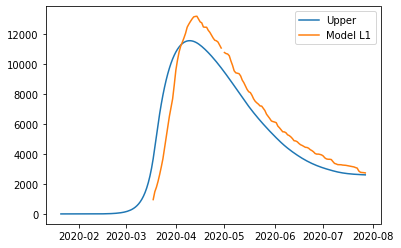

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24248794151225375, 'other': 0.21100130869579117, 'school': 0.18682751186910512, 'transport': 0.22745934469040174, 'work': 0.34011000928824653}
{'home': 1.0, 'leisure': 0.28184397662155164, 'other': 0.27331542965544664, 'school': 0.22064113795841572, 'transport': 0.28416967190115283, 'work': 0.47058142753944493}
{'home': 1.0, 'leisure': 0.31979443904837457, 'other': 0.33340404629511433, 'school': 0.2532471345445367, 'transport': 0.33885463028294854, 'work': 0.5963931522816719}
{'home': 1.0, 'leisure': 0.3507170380628229, 'other': 0.3823651413348436, 'school': 0.27981498361470936, 'transport': 0.3834127445199673, 'work': 0.6989064094790421}
{'home': 1.0, 'leisure': 0.3689894829349969, 'other': 0.4112966974946836, 'school': 0.29551416715617496, 'transport': 0.4097425392963875, 'work': 0.75948242509567}
{'home': 1.0, 'leisure': 0.37882849171232136, 'other': 0.426875227734597

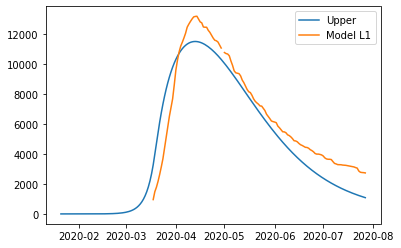

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3015232638152618, 'other': 0.23139989544167014, 'school': 0.372145995382844, 'transport': 0.2704100455394166, 'work': 0.3768461309174571}
{'home': 1.0, 'leisure': 0.3070912991468067, 'other': 0.25463495363562555, 'school': 0.39748714057544277, 'transport': 0.2921832445489119, 'work': 0.420140388273429}
{'home': 1.0, 'leisure': 0.3124604760736536, 'other': 0.277040188322654, 'school': 0.42192324486830596, 'transport': 0.3131788293080681, 'work': 0.4618884221524019}
{'home': 1.0, 'leisure': 0.31683536097701037, 'other': 0.29529630547504754, 'school': 0.4418341446624907, 'transport': 0.3302863428155287, 'work': 0.49590533864637976}
{'home': 1.0, 'leisure': 0.3194205202380848, 'other': 0.3060840110650983, 'school': 0.45359967635905446, 'transport': 0.3403953280699372, 'work': 0.5160062438473667}
{'home': 1.0, 'leisure': 0.320812529070971, 'other': 0.31189277561358714, 'schoo

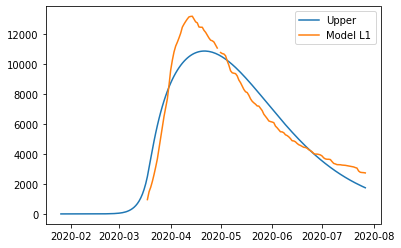

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.25276087005370723, 'other': 0.21968139331911696, 'school': 0.06011843552967304, 'transport': 0.19346591084396153, 'work': 0.3697202414443857}
{'home': 1.0, 'leisure': 0.25744014835683043, 'other': 0.23077268820409147, 'school': 0.06522226576299778, 'transport': 0.2091404495827682, 'work': 0.41257852707755216}
{'home': 1.0, 'leisure': 0.2619523095776992, 'other': 0.24146786541460263, 'school': 0.07014381634513234, 'transport': 0.22425518336661748, 'work': 0.45390615965239123}
{'home': 1.0, 'leisure': 0.265628885387296, 'other': 0.25018245425279695, 'school': 0.07415396867131605, 'transport': 0.23657089237567985, 'work': 0.4875805269355934}
{'home': 1.0, 'leisure': 0.2678014074566032, 'other': 0.2553319840208208, 'school': 0.07652360413678824, 'transport': 0.2438483567901258, 'work': 0.5074790166938492}
{'home': 1.0, 'leisure': 0.26897122703238396, 'other': 0.2581048077420

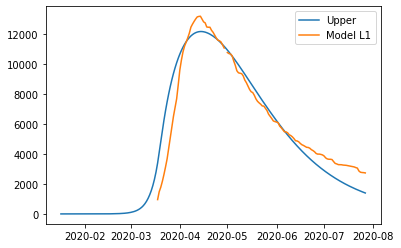

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.1229885872773879, 'other': 0.31273489088080736, 'school': 0.1252765917043014, 'transport': 0.23624809898369023, 'work': 0.4226637941786202}
{'home': 1.0, 'leisure': 0.1250886658260217, 'other': 0.32821136085070196, 'school': 0.13066190989365803, 'transport': 0.2473743718090058, 'work': 0.45242746499990216}
{'home': 1.0, 'leisure': 0.12711374156934718, 'other': 0.34313509975024314, 'school': 0.13585489529053763, 'transport': 0.2581032777477029, 'work': 0.48112814757756683}
{'home': 1.0, 'leisure': 0.12876380328613088, 'other': 0.35529518329801746, 'school': 0.14008621672503213, 'transport': 0.266845349253308, 'work': 0.5045138889371455}
{'home': 1.0, 'leisure': 0.12973883975513945, 'other': 0.3624806872126114, 'school': 0.1425865430272334, 'transport': 0.27201111877934736, 'work': 0.5183327361041693}
{'home': 1.0, 'leisure': 0.1302638593922979, 'other': 0.366349804705085,

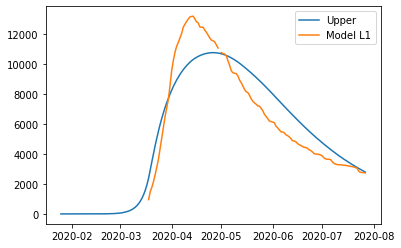

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24046790688314507, 'other': 0.18178882752577535, 'school': 0.2662704501252843, 'transport': 0.176066805082685, 'work': 0.43660921384656337}
{'home': 1.0, 'leisure': 0.2527012274809425, 'other': 0.20363428734470748, 'school': 0.2849879565954225, 'transport': 0.1965419137947893, 'work': 0.48909102791791426}
{'home': 1.0, 'leisure': 0.26449764377167573, 'other': 0.2246995521701063, 'school': 0.30303698069162716, 'transport': 0.21628576862431845, 'work': 0.5396984914867169}
{'home': 1.0, 'leisure': 0.274109538527088, 'other': 0.2418638420278387, 'school': 0.31774359291816434, 'transport': 0.23237335404097184, 'work': 0.5809342025427784}
{'home': 1.0, 'leisure': 0.27978929451892254, 'other': 0.2520063769437714, 'school': 0.3264338637792999, 'transport': 0.24187965451444882, 'work': 0.6053007590759055}
{'home': 1.0, 'leisure': 0.2828476246683719, 'other': 0.25746774189850447, 

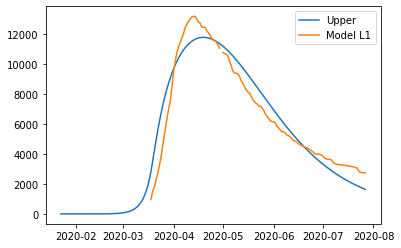

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.12587260597727973, 'other': 0.19459132576335478, 'school': 0.22334139087461818, 'transport': 0.19777646291145146, 'work': 0.2887406079919346}
{'home': 1.0, 'leisure': 0.1464074577143136, 'other': 0.21939211965236954, 'school': 0.2498627458803794, 'transport': 0.23777566172469639, 'work': 0.3752173082204788}
{'home': 1.0, 'leisure': 0.16620892188931052, 'other': 0.24330717090249093, 'school': 0.27543690963593487, 'transport': 0.2763463177231825, 'work': 0.4586055548694321}
{'home': 1.0, 'leisure': 0.18234344825412288, 'other': 0.2627935089581454, 'school': 0.29627511714046156, 'transport': 0.30777425964787497, 'work': 0.5265515336204312}
{'home': 1.0, 'leisure': 0.19187748656060288, 'other': 0.2743081632637594, 'school': 0.3085886033931364, 'transport': 0.32634531623973867, 'work': 0.5667014301551123}
{'home': 1.0, 'leisure': 0.19701119949486134, 'other': 0.28050836173601

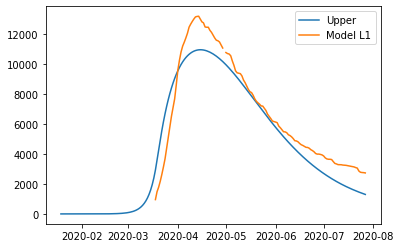

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.21886126547780713, 'other': 0.18313240042037363, 'school': 0.11285143016990289, 'transport': 0.23682213150179743, 'work': 0.3018808105675513}
{'home': 1.0, 'leisure': 0.22189088543702865, 'other': 0.22118858613352252, 'school': 0.1268443524596748, 'transport': 0.26124684478150106, 'work': 0.3675049924579796}
{'home': 1.0, 'leisure': 0.2248123046834208, 'other': 0.25788562235691603, 'school': 0.140337527524812, 'transport': 0.2847992468726438, 'work': 0.4307854535666068}
{'home': 1.0, 'leisure': 0.22719272036566626, 'other': 0.28778691113153304, 'school': 0.1513319664667756, 'transport': 0.30399009302098234, 'work': 0.48234731076622905}
{'home': 1.0, 'leisure': 0.22859932963244767, 'other': 0.30545585449835216, 'school': 0.15782868038702685, 'transport': 0.3153301384722733, 'work': 0.5128156809296421}
{'home': 1.0, 'leisure': 0.22935673462225306, 'other': 0.31496990092663

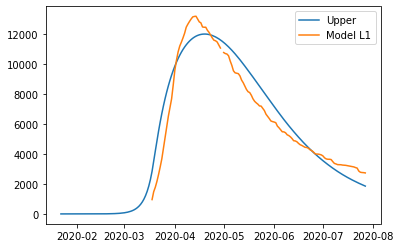

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.17893741161918014, 'other': 0.32652178092608675, 'school': 0.18618295074112223, 'transport': 0.22032320718230924, 'work': 0.3531277642705079}
{'home': 1.0, 'leisure': 0.2045498367397713, 'other': 0.371200776164192, 'school': 0.1941106795947106, 'transport': 0.23309773320525612, 'work': 0.44041972719219713}
{'home': 1.0, 'leisure': 0.22924753239176993, 'other': 0.4142840930009364, 'school': 0.2017552752749565, 'transport': 0.24541602615595487, 'work': 0.5245941200095403}
{'home': 1.0, 'leisure': 0.24937158070080584, 'other': 0.4493890178308762, 'school': 0.20798420508849025, 'transport': 0.2554531537454131, 'work': 0.5931806623051533}
{'home': 1.0, 'leisure': 0.2612630637925089, 'other': 0.470132837048568, 'school': 0.21166493634194197, 'transport': 0.26138418368463845, 'work': 0.633709073661652}
{'home': 1.0, 'leisure': 0.2676661700726567, 'other': 0.48130258585809427, '

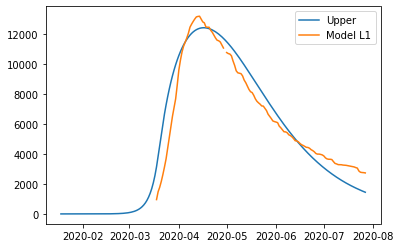

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24102262597384658, 'other': 0.2557147500547593, 'school': 0.11299095927522881, 'transport': 0.3623415369000288, 'work': 0.36543712405654755}
{'home': 1.0, 'leisure': 0.24519665741007474, 'other': 0.28755028734507543, 'school': 0.12622322244713136, 'transport': 0.3860187979393446, 'work': 0.41649441492950123}
{'home': 1.0, 'leisure': 0.24922161629500905, 'other': 0.3182488411607374, 'school': 0.13898290479146597, 'transport': 0.40885044251297054, 'work': 0.4657282311284209}
{'home': 1.0, 'leisure': 0.25250121242347406, 'other': 0.34326247760312856, 'school': 0.14937968299796087, 'transport': 0.4274540047581473, 'work': 0.5058446739571703}
{'home': 1.0, 'leisure': 0.2544391555902943, 'other': 0.35804326277363246, 'school': 0.15552323375634416, 'transport': 0.43844701881211534, 'work': 0.529549844719613}
{'home': 1.0, 'leisure': 0.25548266344935133, 'other': 0.3660021470962

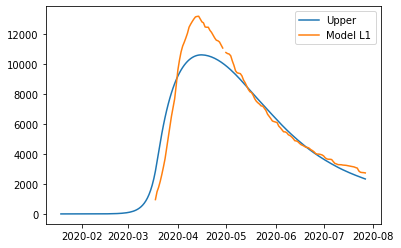

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2679168575035914, 'other': 0.16929746238107674, 'school': 0.16576472824506566, 'transport': 0.19182659346855316, 'work': 0.322492694728734}
{'home': 1.0, 'leisure': 0.28540495892655, 'other': 0.2006586055592053, 'school': 0.16727965265168554, 'transport': 0.21581564437916864, 'work': 0.4138463501197053}
{'home': 1.0, 'leisure': 0.3022684852986886, 'other': 0.23089970790954362, 'school': 0.16874047261521183, 'transport': 0.23894794347154785, 'work': 0.501937374960999}
{'home': 1.0, 'leisure': 0.3160091364167275, 'other': 0.2555406061209304, 'school': 0.1699307703632703, 'transport': 0.25779648347274575, 'work': 0.5737152470539051}
{'home': 1.0, 'leisure': 0.32412861207738686, 'other': 0.2701011368822044, 'school': 0.17063412812348666, 'transport': 0.2689342571098172, 'work': 0.6161294441997132}
{'home': 1.0, 'leisure': 0.3285006374331265, 'other': 0.2779414226767365, 'sch

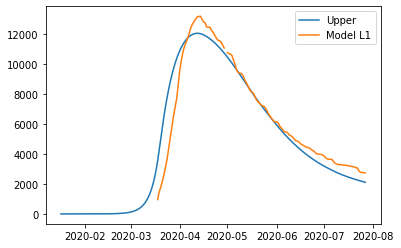

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23862402040794126, 'other': 0.33133108881495454, 'school': 0.16389604533899513, 'transport': 0.31256649462253805, 'work': 0.3587651911684177}
{'home': 1.0, 'leisure': 0.2701788335245302, 'other': 0.38724881598554345, 'school': 0.2078330002260534, 'transport': 0.36066653461793924, 'work': 0.45767028409728394}
{'home': 1.0, 'leisure': 0.30060668902981236, 'other': 0.44116948147146845, 'school': 0.25020077815285957, 'transport': 0.4070487160420761, 'work': 0.5530430522786907}
{'home': 1.0, 'leisure': 0.3253997564785608, 'other': 0.485104838534074, 'school': 0.2847226712784054, 'transport': 0.4448416046098913, 'work': 0.6307541967227999}
{'home': 1.0, 'leisure': 0.3400502054255485, 'other': 0.5110666404347046, 'school': 0.3051219717616825, 'transport': 0.4671737660363276, 'work': 0.6766744184397735}
{'home': 1.0, 'leisure': 0.34793890870469574, 'other': 0.5250460722273518, '

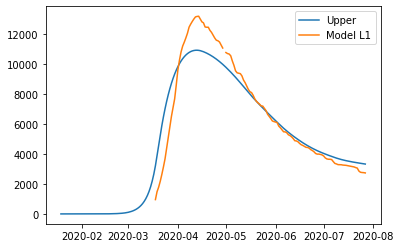

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.20389484299359162, 'other': 0.3774873589883742, 'school': 0.31608128678864433, 'transport': 0.39524663940886157, 'work': 0.4163969508865308}
{'home': 1.0, 'leisure': 0.21733038782161157, 'other': 0.4428011810148963, 'school': 0.3537525636081832, 'transport': 0.46475677193986215, 'work': 0.5105016994189051}
{'home': 1.0, 'leisure': 0.23028609176291653, 'other': 0.5057823665404712, 'school': 0.39007843768416706, 'transport': 0.5317843997376127, 'work': 0.6012455640751232}
{'home': 1.0, 'leisure': 0.24084259127064656, 'other': 0.5571003695613099, 'school': 0.4196772980423762, 'transport': 0.5863995038691132, 'work': 0.6751850093505603}
{'home': 1.0, 'leisure': 0.24708052279794152, 'other': 0.5874246440736238, 'school': 0.4371675337085907, 'transport': 0.6186720654013635, 'work': 0.7188764997405912}
{'home': 1.0, 'leisure': 0.25043940900494654, 'other': 0.6037530995802542, '

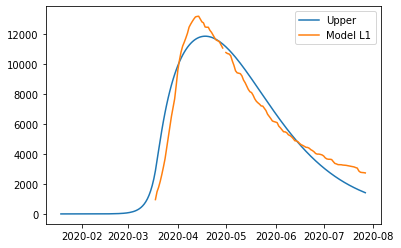

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.047014101821217555, 'other': 0.22557438821541972, 'school': 0.10343545895846813, 'transport': 0.2003896636274191, 'work': 0.29821153122592414}
{'home': 1.0, 'leisure': 0.049609044885530265, 'other': 0.26488673475831703, 'school': 0.12062115461251013, 'transport': 0.22353614733623378, 'work': 0.37086330623852715}
{'home': 1.0, 'leisure': 0.05211131141183181, 'other': 0.3027950689246822, 'school': 0.1371930754217649, 'transport': 0.24585597091259076, 'work': 0.44092037500068}
{'home': 1.0, 'leisure': 0.05415019524807752, 'other': 0.33368334120838716, 'school': 0.1506961220070836, 'transport': 0.26404249382665945, 'work': 0.49800391251058235}
{'home': 1.0, 'leisure': 0.05535499024222271, 'other': 0.35193550210330377, 'school': 0.15867519498931737, 'transport': 0.2747890755486091, 'work': 0.5317350937664337}
{'home': 1.0, 'leisure': 0.05600372600830089, 'other': 0.3617635887

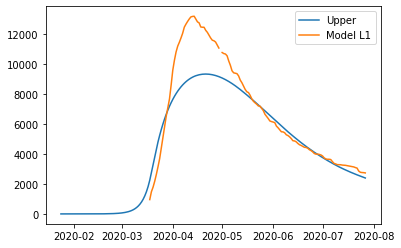

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.16462966381481903, 'other': 0.1070690306209951, 'school': 0.33159172673076104, 'transport': 0.32923801750630477, 'work': 0.3697570220660018}
{'home': 1.0, 'leisure': 0.17554713354887663, 'other': 0.12117361856579952, 'school': 0.37334415811148003, 'transport': 0.3862605926991191, 'work': 0.4645963701818233}
{'home': 1.0, 'leisure': 0.18607469364957502, 'other': 0.13477447122686093, 'school': 0.41360543122860194, 'transport': 0.441246647349333, 'work': 0.5560485987220798}
{'home': 1.0, 'leisure': 0.19465270558347741, 'other': 0.14585664746920723, 'school': 0.44641091302773833, 'transport': 0.48605009928654425, 'work': 0.630565229384511}
{'home': 1.0, 'leisure': 0.19972153081714702, 'other': 0.15240520615786646, 'school': 0.4657959704545008, 'transport': 0.512524866340351, 'work': 0.6745977838668568}
{'home': 1.0, 'leisure': 0.20245089825066143, 'other': 0.1559313531440675

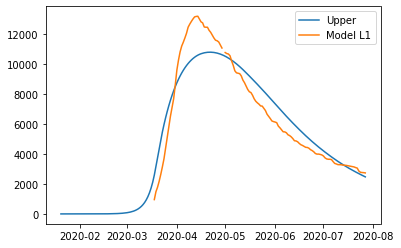

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3548961891520973, 'other': 0.38830105363243533, 'school': 0.20810266979347358, 'transport': 0.30710258786778816, 'work': 0.44133871891116}
{'home': 1.0, 'leisure': 0.37036000541843994, 'other': 0.42425627025563223, 'school': 0.2289484118335663, 'transport': 0.33413422779239127, 'work': 0.494452185880127}
{'home': 1.0, 'leisure': 0.3852715425324132, 'other': 0.45892737199942923, 'school': 0.24904966308651283, 'transport': 0.36020045200540135, 'work': 0.545668743314488}
{'home': 1.0, 'leisure': 0.3974216838845396, 'other': 0.48717789934622685, 'school': 0.2654284604037286, 'transport': 0.38143959766044666, 'work': 0.5874007530758193}
{'home': 1.0, 'leisure': 0.4046013128653415, 'other': 0.5038713927784254, 'school': 0.2751068406366287, 'transport': 0.39399000191115524, 'work': 0.6120605770256968}
{'home': 1.0, 'leisure': 0.40846726693192714, 'other': 0.5128601969342247, 's

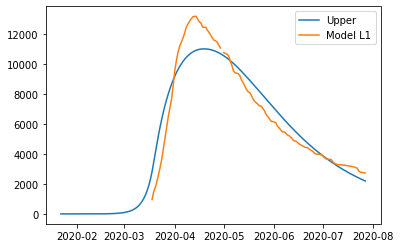

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23578908661301612, 'other': 0.1693976162003239, 'school': 0.3813935923114036, 'transport': 0.3363295359638191, 'work': 0.42936903548147776}
{'home': 1.0, 'leisure': 0.25707028650795505, 'other': 0.17836992176472755, 'school': 0.4144504238130618, 'transport': 0.36883085838336155, 'work': 0.4785102503429212}
{'home': 1.0, 'leisure': 0.2775914435495034, 'other': 0.18702178784468823, 'school': 0.44632665418966083, 'transport': 0.4001714192879204, 'work': 0.525896421816456}
{'home': 1.0, 'leisure': 0.2943123863240982, 'other': 0.19407145650243396, 'school': 0.47229987894096365, 'transport': 0.42570817261756083, 'work': 0.5645073763504472}
{'home': 1.0, 'leisure': 0.304192943418177, 'other': 0.1982371698001928, 'school': 0.48764769356673354, 'transport': 0.4407980723123484, 'work': 0.5873229403932603}
{'home': 1.0, 'leisure': 0.3095132433919117, 'other': 0.20048024619129373, '

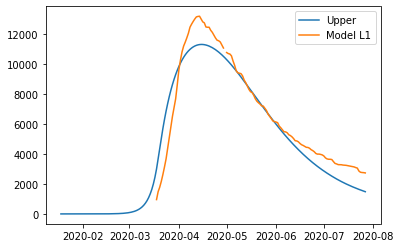

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26147310809679886, 'other': 0.29104296916181144, 'school': 0.1861826379588331, 'transport': 0.23272023856437046, 'work': 0.33227704597870683}
{'home': 1.0, 'leisure': 0.2863515781432472, 'other': 0.3445687441464595, 'school': 0.2261210516471347, 'transport': 0.2748743129423696, 'work': 0.4237211822419502}
{'home': 1.0, 'leisure': 0.31034153140232235, 'other': 0.39618288431022736, 'school': 0.264633093417997, 'transport': 0.3155228846640116, 'work': 0.5118994564957922}
{'home': 1.0, 'leisure': 0.3298889007245318, 'other': 0.43823885036959365, 'school': 0.2960132756016625, 'transport': 0.3486439431038681, 'work': 0.5837484207026262}
{'home': 1.0, 'leisure': 0.3414396189603828, 'other': 0.46309010304103737, 'school': 0.31455611052837396, 'transport': 0.3682154776365105, 'work': 0.6262046268248463}
{'home': 1.0, 'leisure': 0.3476592364719948, 'other': 0.47647154678719944, 's

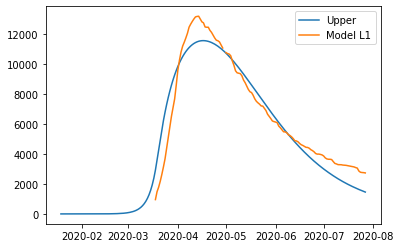

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.15128168091199046, 'other': 0.3215597197301256, 'school': 0.21783066658963024, 'transport': 0.1904731528485965, 'work': 0.32599715959458203}
{'home': 1.0, 'leisure': 0.16320753118955544, 'other': 0.3789126727178448, 'school': 0.25381854596213194, 'transport': 0.21683620030408754, 'work': 0.398648934607185}
{'home': 1.0, 'leisure': 0.17470745824292172, 'other': 0.43421730595600266, 'school': 0.28852114392847295, 'transport': 0.24225771035045393, 'work': 0.4687060033693379}
{'home': 1.0, 'leisure': 0.18407776917529423, 'other': 0.47928034044635354, 'school': 0.31679733486401007, 'transport': 0.26297153335119694, 'work': 0.5257895408792402}
{'home': 1.0, 'leisure': 0.18961477108987795, 'other': 0.5059084971906518, 'school': 0.3335059931441002, 'transport': 0.27521151966981783, 'work': 0.5595207221350916}
{'home': 1.0, 'leisure': 0.1925962336592692, 'other': 0.52024673543758

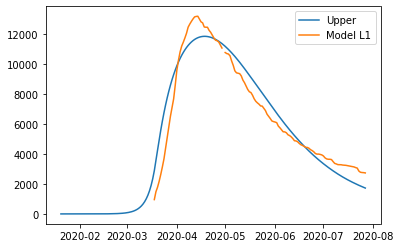

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2064410996358315, 'other': 0.31368965352019706, 'school': 0.2741862855697308, 'transport': 0.30209240345585275, 'work': 0.36582751445408396}
{'home': 1.0, 'leisure': 0.2158232146797813, 'other': 0.3729985135062858, 'school': 0.3217163247511913, 'transport': 0.3340655624078188, 'work': 0.4466675530637231}
{'home': 1.0, 'leisure': 0.2248702541864472, 'other': 0.4301891999214429, 'school': 0.3675488625333139, 'transport': 0.36489682282578617, 'work': 0.5246204474373037}
{'home': 1.0, 'leisure': 0.23224191600669353, 'other': 0.4767890184819412, 'school': 0.40489389331874714, 'transport': 0.3900185905737595, 'work': 0.5881376206305916}
{'home': 1.0, 'leisure': 0.2365978979913845, 'other': 0.5043252749040539, 'school': 0.4269614115101395, 'transport': 0.40486327151574375, 'work': 0.6256704956993526}
{'home': 1.0, 'leisure': 0.23894342675237196, 'other': 0.519152489900576, 'sch

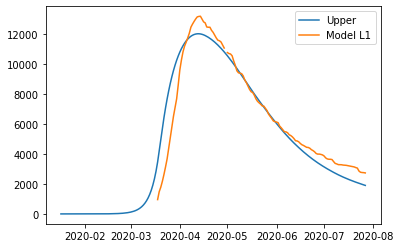

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.19060777833756326, 'other': 0.2487871668024821, 'school': 0.15629297319316457, 'transport': 0.19518869612213546, 'work': 0.33304197917933404}
{'home': 1.0, 'leisure': 0.20365161152760883, 'other': 0.2816431373932998, 'school': 0.1968891126880964, 'transport': 0.22556746345247852, 'work': 0.42714672771170836}
{'home': 1.0, 'leisure': 0.21622959353229565, 'other': 0.3133256804630169, 'school': 0.23603539005820917, 'transport': 0.25486127480673787, 'work': 0.5178905923679265}
{'home': 1.0, 'leisure': 0.2264783196101886, 'other': 0.33914108592723075, 'school': 0.267932356804227, 'transport': 0.2787303062805788, 'work': 0.5918300376433634}
{'home': 1.0, 'leisure': 0.23253438501985263, 'other': 0.354395643701539, 'school': 0.28678056442687394, 'transport': 0.29283473396966664, 'work': 0.6355215280333943}
{'home': 1.0, 'leisure': 0.23579534331736401, 'other': 0.3626096363492433

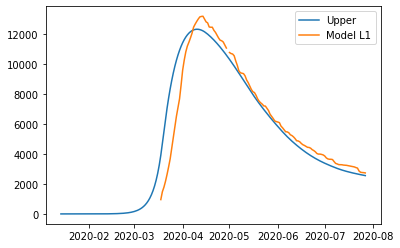

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2518629240977833, 'other': 0.19452679567426345, 'school': 0.36080250764449706, 'transport': 0.36583935032866266, 'work': 0.37541630179533425}
{'home': 1.0, 'leisure': 0.2786425909499253, 'other': 0.22204427449886366, 'school': 0.4237597467331933, 'transport': 0.42869910489318247, 'work': 0.4841804844076998}
{'home': 1.0, 'leisure': 0.3044658411287764, 'other': 0.24857898622258526, 'school': 0.48446851299729327, 'transport': 0.4893138682232552, 'work': 0.5890602319267666}
{'home': 1.0, 'leisure': 0.32550700794117365, 'other': 0.27019986244191396, 'school': 0.5339349151384117, 'transport': 0.5387036753810922, 'work': 0.6745178039793396}
{'home': 1.0, 'leisure': 0.3379404246939538, 'other': 0.2829758347533355, 'school': 0.5631650618581636, 'transport': 0.567888561428905, 'work': 0.7250154601922236}
{'home': 1.0, 'leisure': 0.34463534140698926, 'other': 0.28985520445948554, 

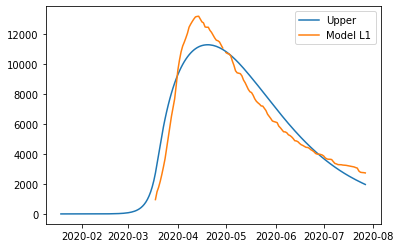

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.16740245930422526, 'other': 0.2859617783672759, 'school': 0.14489094417908485, 'transport': 0.24312888260248283, 'work': 0.33959203876441146}
{'home': 1.0, 'leisure': 0.1733568966936815, 'other': 0.32505233995728955, 'school': 0.15974345541036847, 'transport': 0.2700690421924433, 'work': 0.39437897317149856}
{'home': 1.0, 'leisure': 0.17909867560494291, 'other': 0.36274681006194553, 'school': 0.1740655198119634, 'transport': 0.2960470532256195, 'work': 0.4472092313497611}
{'home': 1.0, 'leisure': 0.18377716212523, 'other': 0.3934608227398134, 'school': 0.18573535006511482, 'transport': 0.31721432147487416, 'work': 0.490256108383901}
{'home': 1.0, 'leisure': 0.18654172234176325, 'other': 0.41161001204946257, 'school': 0.1926311588510679, 'transport': 0.3297222527130701, 'work': 0.51569289935862}
{'home': 1.0, 'leisure': 0.18803033168912733, 'other': 0.42138265244696604, '

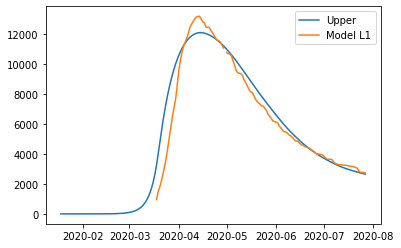

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2524666013631029, 'other': 0.25162046659181836, 'school': 0.21536147070772357, 'transport': 0.20991787336323375, 'work': 0.330249592902775}
{'home': 1.0, 'leisure': 0.28196825985221025, 'other': 0.31486358543948334, 'school': 0.26764131643028766, 'transport': 0.2571719164820654, 'work': 0.44995102554820354}
{'home': 1.0, 'leisure': 0.3104162876809924, 'other': 0.37584802147116025, 'school': 0.3180540248056174, 'transport': 0.3027383152037959, 'work': 0.565377407027724}
{'home': 1.0, 'leisure': 0.33359616220814814, 'other': 0.42553904342289695, 'school': 0.3591310464447749, 'transport': 0.3398664919400207, 'work': 0.6594285326777035}
{'home': 1.0, 'leisure': 0.34729336079237655, 'other': 0.4549019200307414, 'school': 0.3834038319588225, 'transport': 0.3618058691023354, 'work': 0.7150041978345096}
{'home': 1.0, 'leisure': 0.35466877541465336, 'other': 0.4707126997426576, '

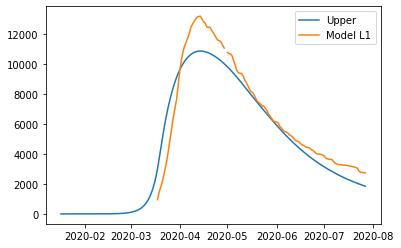

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.19865062588305393, 'other': 0.2579024056628637, 'school': 0.1515162142415624, 'transport': 0.22645091392412667, 'work': 0.29703237545634165}
{'home': 1.0, 'leisure': 0.22817712560461492, 'other': 0.30224166280149095, 'school': 0.18076081181529272, 'transport': 0.26382560701782487, 'work': 0.3730274244561952}
{'home': 1.0, 'leisure': 0.2566491074789773, 'other': 0.3449973750423101, 'school': 0.20896095947567553, 'transport': 0.299865489643891, 'work': 0.4463083645631969}
{'home': 1.0, 'leisure': 0.27984850011734663, 'other': 0.37983536279408864, 'school': 0.23193885756932078, 'transport': 0.32923131993179666, 'work': 0.5060187602059389}
{'home': 1.0, 'leisure': 0.29355723213092855, 'other': 0.40042144646559413, 'school': 0.2455167064428384, 'transport': 0.34658385601101366, 'work': 0.5413021758130138}
{'home': 1.0, 'leisure': 0.30093885706131884, 'other': 0.41150626075025

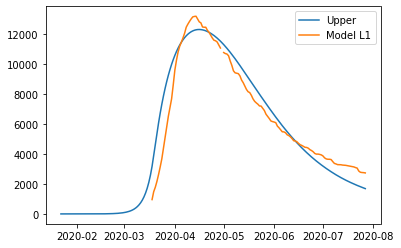

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2908587236258753, 'other': 0.31272540546199423, 'school': 0.2548367488881944, 'transport': 0.3676165319344029, 'work': 0.4094331509144777}
{'home': 1.0, 'leisure': 0.3230850339272573, 'other': 0.3520372982281071, 'school': 0.2978886393558469, 'transport': 0.4003921500166077, 'work': 0.49052519542362344}
{'home': 1.0, 'leisure': 0.3541604045750185, 'other': 0.3899451948240016, 'school': 0.3394029623067977, 'transport': 0.43199721031016236, 'work': 0.568721095486014}
{'home': 1.0, 'leisure': 0.3794810769546758, 'other': 0.4208331105688045, 'school': 0.37322944767423893, 'transport': 0.4577494816604661, 'work': 0.6324362733146285}
{'home': 1.0, 'leisure': 0.39444329245174603, 'other': 0.43908506078164256, 'school': 0.3932178253913633, 'transport': 0.4729667329129183, 'work': 0.6700861511224461}
{'home': 1.0, 'leisure': 0.4024998700270916, 'other': 0.44891303397317084, 'scho

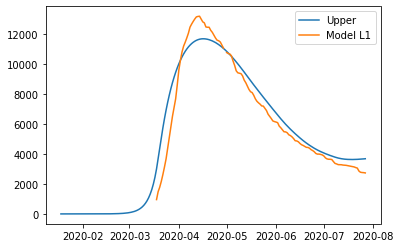

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.296606809863844, 'other': 0.19794485172103352, 'school': 0.20713825279504128, 'transport': 0.2524065290478956, 'work': 0.36543712405654755}
{'home': 1.0, 'leisure': 0.3081827087017852, 'other': 0.2699977432385159, 'school': 0.27250498289103553, 'transport': 0.2754738943428075, 'work': 0.5070350116418726}
{'home': 1.0, 'leisure': 0.3193451825812285, 'other': 0.3394773172018025, 'school': 0.3355371869121729, 'transport': 0.2977174251629011, 'work': 0.6435758318134361}
{'home': 1.0, 'leisure': 0.32844053166818227, 'other': 0.39609030339411005, 'school': 0.38689676055902544, 'transport': 0.31584178360890325, 'work': 0.7548313149161915}
{'home': 1.0, 'leisure': 0.333815056128655, 'other': 0.42954343159865543, 'school': 0.41724559953216567, 'transport': 0.3265516317815409, 'work': 0.8205731912950924}
{'home': 1.0, 'leisure': 0.33670903083814024, 'other': 0.44755665447802606, '

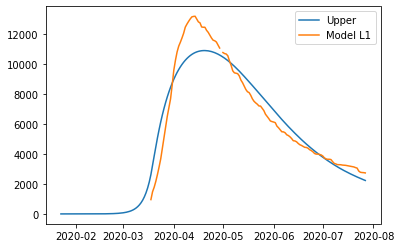

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.13774417880899592, 'other': 0.22252291953471218, 'school': 0.2840406479757357, 'transport': 0.22408094025504294, 'work': 0.28840751981304635}
{'home': 1.0, 'leisure': 0.16552286207924327, 'other': 0.2653751287299855, 'school': 0.33982257808541644, 'transport': 0.2677607269803115, 'work': 0.38377311555924637}
{'home': 1.0, 'leisure': 0.1923094495184104, 'other': 0.3066969018825704, 'school': 0.3936122964054657, 'transport': 0.30988052132253474, 'work': 0.47573279717165357}
{'home': 1.0, 'leisure': 0.21413555780217616, 'other': 0.3403664948217137, 'school': 0.4374409557773577, 'transport': 0.34420035374953145, 'work': 0.5506629081150964}
{'home': 1.0, 'leisure': 0.22703280360621958, 'other': 0.360262163376662, 'school': 0.4633397090425666, 'transport': 0.3644802547291204, 'work': 0.5949397918544036}
{'home': 1.0, 'leisure': 0.23397747442378145, 'other': 0.37097521567548036

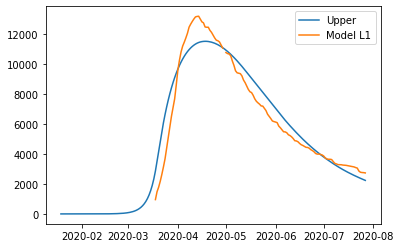

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2008227557253615, 'other': 0.3040655262661098, 'school': 0.2151596531594645, 'transport': 0.22769103798724882, 'work': 0.35339989151397794}
{'home': 1.0, 'leisure': 0.23060203030413856, 'other': 0.35337455702129755, 'school': 0.22475693434363672, 'transport': 0.25711401950084967, 'work': 0.4354958285210967}
{'home': 1.0, 'leisure': 0.259317759362245, 'other': 0.40092255096380003, 'school': 0.23401145548551708, 'transport': 0.2854861802461076, 'work': 0.5146597677779612}
{'home': 1.0, 'leisure': 0.28271576081699845, 'other': 0.4396653608428761, 'school': 0.24155217641593812, 'transport': 0.30860423714965113, 'work': 0.5791637182835545}
{'home': 1.0, 'leisure': 0.2965418525857164, 'other': 0.46255883940778475, 'school': 0.24600805696573236, 'transport': 0.32226490713810874, 'work': 0.6172796890368597}
{'home': 1.0, 'leisure': 0.3039866712304107, 'other': 0.4748860970965817

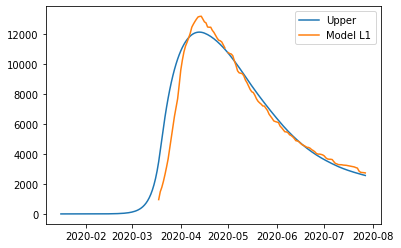

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.17903909626328363, 'other': 0.16373574531153345, 'school': 0.28976896893263715, 'transport': 0.2701042930512616, 'work': 0.37347033876348906}
{'home': 1.0, 'leisure': 0.2031328691227826, 'other': 0.18652866536906978, 'school': 0.3439395285387803, 'transport': 0.3063483211619275, 'work': 0.48164712654834396}
{'home': 1.0, 'leisure': 0.22636615009444236, 'other': 0.20850755256740838, 'school': 0.39617542530184696, 'transport': 0.34129791969721246, 'work': 0.5859604576265969}
{'home': 1.0, 'leisure': 0.24529697162690586, 'other': 0.22641627546975834, 'school': 0.4387380078495309, 'transport': 0.3697753703555928, 'work': 0.67095650517184}
{'home': 1.0, 'leisure': 0.2564833661688161, 'other': 0.2369987026393288, 'school': 0.463888624809526, 'transport': 0.38660295483554485, 'work': 0.7211814423576656}
{'home': 1.0, 'leisure': 0.26250680938369086, 'other': 0.24269693265371287,

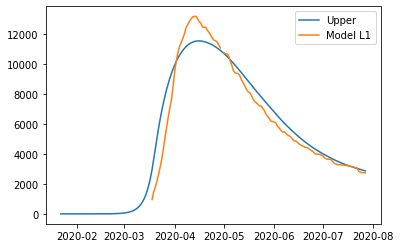

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2663384332892647, 'other': 0.23709747550783986, 'school': 0.25714232456041003, 'transport': 0.3127939356330729, 'work': 0.3409559142305124}
{'home': 1.0, 'leisure': 0.30683786867179164, 'other': 0.3074778120655312, 'school': 0.27536486583719033, 'transport': 0.3662586715294543, 'work': 0.44686673677013355}
{'home': 1.0, 'leisure': 0.3458908956477997, 'other': 0.3753445651747336, 'school': 0.29293660206837135, 'transport': 0.4178139525723935, 'work': 0.5489950299333396}
{'home': 1.0, 'leisure': 0.3777118805912137, 'other': 0.4306434010414911, 'school': 0.3072543130715559, 'transport': 0.4598219593481218, 'work': 0.6322106762144706}
{'home': 1.0, 'leisure': 0.3965151898759583, 'other': 0.4633199858718478, 'school': 0.3157147786643467, 'transport': 0.4846448724428703, 'work': 0.681383558107866}
{'home': 1.0, 'leisure': 0.40664004872159, 'other': 0.4809150700112706, 'school'

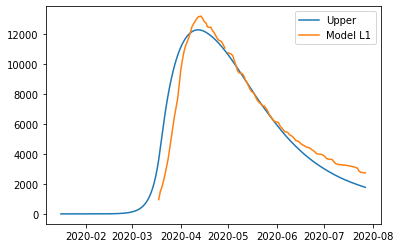

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.22792126402449953, 'other': 0.1641100527795597, 'school': 0.2286020032658928, 'transport': 0.35055830075815897, 'work': 0.3752468281045979}
{'home': 1.0, 'leisure': 0.2581336329474663, 'other': 0.18219779160730126, 'school': 0.2715900421760084, 'transport': 0.38216272583809474, 'work': 0.46109249771328503}
{'home': 1.0, 'leisure': 0.28726698869461276, 'other': 0.1996395397626235, 'school': 0.3130427939821913, 'transport': 0.41263842145088997, 'work': 0.5438722505502334}
{'home': 1.0, 'leisure': 0.311005278562658, 'other': 0.213851334555849, 'school': 0.34681911026871065, 'transport': 0.4374704697279823, 'work': 0.6113224195284874}
{'home': 1.0, 'leisure': 0.3250324498483212, 'other': 0.22224921329730046, 'school': 0.36677784261983576, 'transport': 0.45214395280080966, 'work': 0.6511793375610921}
{'home': 1.0, 'leisure': 0.3325855420790629, 'other': 0.22677114800423587, '

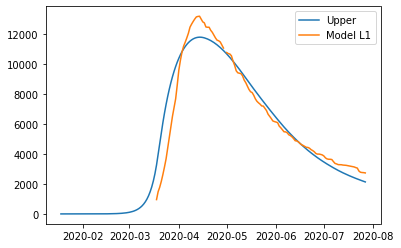

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23681966869680177, 'other': 0.2942796742239833, 'school': 0.2586531359419747, 'transport': 0.24787576185543536, 'work': 0.3443403629521408}
{'home': 1.0, 'leisure': 0.2595782492476233, 'other': 0.3416658874104586, 'school': 0.3104694896338146, 'transport': 0.2940743380517654, 'work': 0.4279436610260515}
{'home': 1.0, 'leisure': 0.2815240233502012, 'other': 0.38735973584027406, 'school': 0.3604352592652316, 'transport': 0.3386229650982266, 'work': 0.508561127025894}
{'home': 1.0, 'leisure': 0.29940576521156104, 'other': 0.4245917604867904, 'school': 0.4011481085945344, 'transport': 0.3749218463953431, 'work': 0.5742494326553953}
{'home': 1.0, 'leisure': 0.3099722490387281, 'other': 0.4465925023233682, 'school': 0.42520570138003144, 'transport': 0.3963711853436392, 'work': 0.6130652496182823}
{'home': 1.0, 'leisure': 0.31566189417643353, 'other': 0.45843905561998705, 'scho

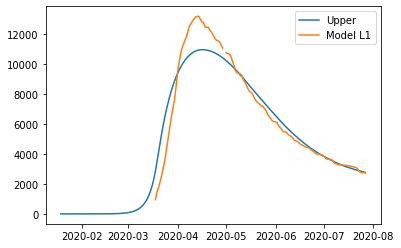

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.11634337814065232, 'other': 0.21825689266001047, 'school': 0.3135618055982976, 'transport': 0.2893707754379058, 'work': 0.3987771450504446}
{'home': 1.0, 'leisure': 0.14755514418896587, 'other': 0.24718774005538932, 'school': 0.36205378389212334, 'transport': 0.34042130274890997, 'work': 0.5082409038436723}
{'home': 1.0, 'leisure': 0.17765220430698253, 'other': 0.2750853429009332, 'school': 0.40881390581831245, 'transport': 0.38964859694166404, 'work': 0.6137952426799991}
{'home': 1.0, 'leisure': 0.2021757347735146, 'other': 0.29781672299730233, 'school': 0.44691474590631836, 'transport': 0.4297597255431673, 'work': 0.6998024817318208}
{'home': 1.0, 'leisure': 0.21666691186737447, 'other': 0.31124890214515677, 'school': 0.4694288786855946, 'transport': 0.4534617560804192, 'work': 0.7506249411715337}
{'home': 1.0, 'leisure': 0.22446985337945285, 'other': 0.318481613994001

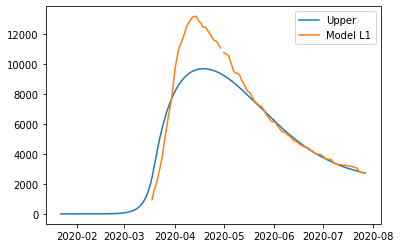

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.1089189979963054, 'other': 0.13753906488548434, 'school': 0.12767945962040683, 'transport': 0.23571946130256374, 'work': 0.2684654703290913}
{'home': 1.0, 'leisure': 0.1405986329861657, 'other': 0.16613148659467097, 'school': 0.18631891785915097, 'transport': 0.28768399472112205, 'work': 0.39855555780233914}
{'home': 1.0, 'leisure': 0.17114685244067382, 'other': 0.19370275038567236, 'school': 0.2428641097322257, 'transport': 0.33779265194616037, 'work': 0.523999570722971}
{'home': 1.0, 'leisure': 0.1960379942184212, 'other': 0.21616822458574755, 'school': 0.2889379697769533, 'transport': 0.378621928203599, 'work': 0.626213210880523}
{'home': 1.0, 'leisure': 0.21074639617799917, 'other': 0.22944327752215563, 'school': 0.31616343253065593, 'transport': 0.4027483187193582, 'work': 0.6866121800645308}
{'home': 1.0, 'leisure': 0.21866630492546424, 'other': 0.23659138294945228

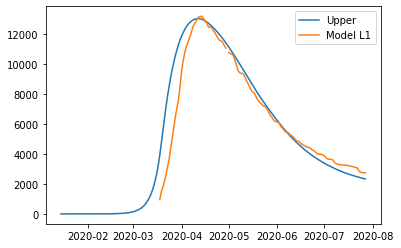

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.11928565291906587, 'other': 0.1722968819887275, 'school': 0.3332022809671681, 'transport': 0.3182273263747023, 'work': 0.3372380851232213}
{'home': 1.0, 'leisure': 0.14425945445660243, 'other': 0.1820809318275144, 'school': 0.3908515716275648, 'transport': 0.36551655238153413, 'work': 0.4516579318938354}
{'home': 1.0, 'leisure': 0.16834133451065553, 'other': 0.19151555131491604, 'school': 0.44644195905009004, 'transport': 0.4111168774595505, 'work': 0.561991355565499}
{'home': 1.0, 'leisure': 0.1879636071472914, 'other': 0.19920301904539148, 'school': 0.4917378302832589, 'transport': 0.44827269789348984, 'work': 0.6518926637424101}
{'home': 1.0, 'leisure': 0.19955858643257623, 'other': 0.20374561361339968, 'school': 0.518503572375586, 'transport': 0.47022840996809034, 'work': 0.7050161640287667}
{'home': 1.0, 'leisure': 0.20580203681696035, 'other': 0.20619162607309638, 

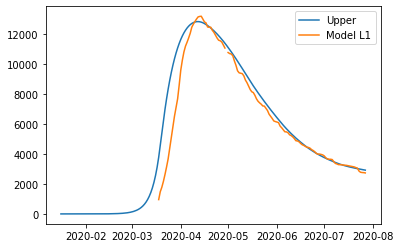

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23434171760621264, 'other': 0.11042695673131758, 'school': 0.2556075665505536, 'transport': 0.2314370551072603, 'work': 0.35105877434578375}
{'home': 1.0, 'leisure': 0.278698431866376, 'other': 0.1289762923961039, 'school': 0.3299447546417434, 'transport': 0.25422995066408527, 'work': 0.472950092839109}
{'home': 1.0, 'leisure': 0.3214709777601049, 'other': 0.14686315178714782, 'school': 0.4016270431582478, 'transport': 0.27620881423673793, 'work': 0.5904881499576726}
{'home': 1.0, 'leisure': 0.3563226818216618, 'other': 0.16143762980947993, 'school': 0.4600348338013255, 'transport': 0.294117517888529, 'work': 0.6862599002024281}
{'home': 1.0, 'leisure': 0.3769168705853091, 'other': 0.1700498213681307, 'school': 0.49454852827223506, 'transport': 0.3046999336827692, 'work': 0.7428522980743292}
{'home': 1.0, 'leisure': 0.3880060491503499, 'other': 0.1746871552843273, 'schoo

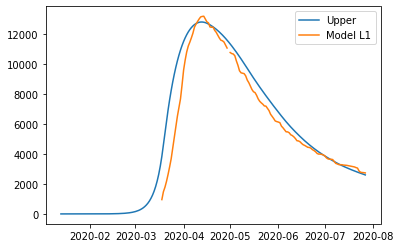

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.32358538330948167, 'other': 0.13739603971189696, 'school': 0.31435599560381533, 'transport': 0.304444516556193, 'work': 0.445356607700809}
{'home': 1.0, 'leisure': 0.3751387804455332, 'other': 0.14720134375305155, 'school': 0.33597118709878904, 'transport': 0.3387880493325741, 'work': 0.5262393700635961}
{'home': 1.0, 'leisure': 0.42485098482672584, 'other': 0.15665645836416492, 'school': 0.3568144074689422, 'transport': 0.37190502736694164, 'work': 0.604233462341998}
{'home': 1.0, 'leisure': 0.46535722543362357, 'other': 0.1643606258250721, 'school': 0.373797772214993, 'transport': 0.39888923169124113, 'work': 0.6677842041984737}
{'home': 1.0, 'leisure': 0.48929273124679035, 'other': 0.16891308841560818, 'school': 0.3838333968376594, 'transport': 0.41483444333741804, 'work': 0.705336915295482}
{'home': 1.0, 'leisure': 0.5021810805308032, 'other': 0.1713644144258968, 'sc

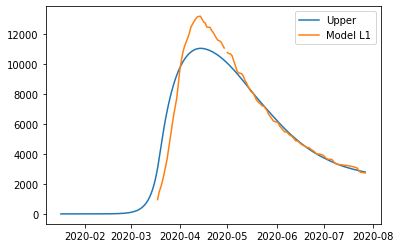

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.12048684107230939, 'other': 0.19941975428074066, 'school': 0.3712758850331942, 'transport': 0.3335360865608032, 'work': 0.39861263968013444}
{'home': 1.0, 'leisure': 0.14078854582684558, 'other': 0.223189639660992, 'school': 0.41976786332701993, 'transport': 0.38458661387180737, 'work': 0.5080763984733622}
{'home': 1.0, 'leisure': 0.16036518969729113, 'other': 0.24611060056337722, 'school': 0.466527985253209, 'transport': 0.4338139080645614, 'work': 0.6136307373096889}
{'home': 1.0, 'leisure': 0.17631652914728385, 'other': 0.26478693907643186, 'school': 0.5046288253412149, 'transport': 0.47392503666606467, 'work': 0.6996379763615106}
{'home': 1.0, 'leisure': 0.18574232064046134, 'other': 0.27582295728869144, 'school': 0.5271429581204912, 'transport': 0.49762706720331656, 'work': 0.7504604358012235}
{'home': 1.0, 'leisure': 0.1908177468290954, 'other': 0.28176542863375426

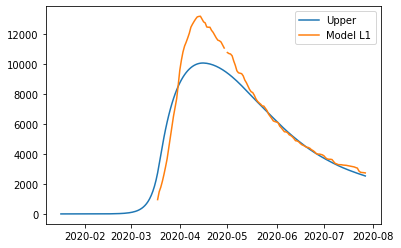

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.250786278123291, 'other': 0.35932413271779073, 'school': 0.15448353145157662, 'transport': 0.24112497547760167, 'work': 0.4044407325032183}
{'home': 1.0, 'leisure': 0.2772909506357346, 'other': 0.39975830996098094, 'school': 0.16438752868044615, 'transport': 0.2714882754355487, 'work': 0.4891603439240939}
{'home': 1.0, 'leisure': 0.3028490277013053, 'other': 0.4387484094454858, 'school': 0.17393781172257033, 'transport': 0.30076717182356905, 'work': 0.5708542549370811}
{'home': 1.0, 'leisure': 0.323674127532511, 'other': 0.47051812013656386, 'school': 0.18171952383096784, 'transport': 0.324624050361956, 'work': 0.6374196639106262}
{'home': 1.0, 'leisure': 0.3359798683418598, 'other': 0.4892911309994735, 'school': 0.18631780825865724, 'transport': 0.3387212967710028, 'work': 0.6767537692131755}
{'home': 1.0, 'leisure': 0.3426060364699707, 'other': 0.4993996753102711, 'sch

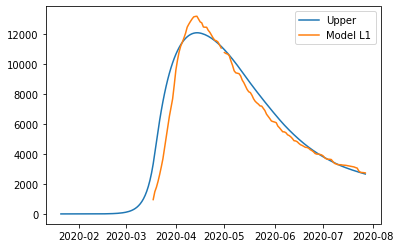

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.17977139017001884, 'other': 0.2303295751178773, 'school': 0.36704406068221734, 'transport': 0.3542927193340634, 'work': 0.41268374581333933}
{'home': 1.0, 'leisure': 0.20970548650511164, 'other': 0.26632216808328935, 'school': 0.4346770150651807, 'transport': 0.3988118130741921, 'work': 0.5102081198800179}
{'home': 1.0, 'leisure': 0.23857050797109403, 'other': 0.3010293112999368, 'school': 0.4998945067916097, 'transport': 0.44174093918074475, 'work': 0.6042494805871723}
{'home': 1.0, 'leisure': 0.2620901550915241, 'other': 0.32930920577276057, 'school': 0.5530346852353667, 'transport': 0.4767202271194173, 'work': 0.6808757744967056}
{'home': 1.0, 'leisure': 0.27598812838996006, 'other': 0.3460200525067019, 'school': 0.5844356997703138, 'transport': 0.4973898063559056, 'work': 0.7261549481705206}
{'home': 1.0, 'leisure': 0.28347165247373324, 'other': 0.35501820074805496, 

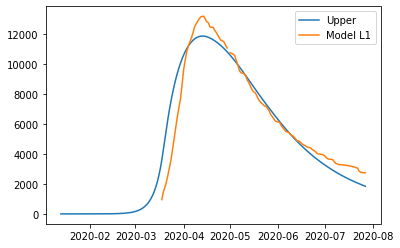

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2907825452859074, 'other': 0.19122521644973262, 'school': 0.23672558735399474, 'transport': 0.3232084478711007, 'work': 0.41609929943570817}
{'home': 1.0, 'leisure': 0.30536065042688926, 'other': 0.20609962420834288, 'school': 0.25206624356354934, 'transport': 0.33942425904737783, 'work': 0.4735031235459481}
{'home': 1.0, 'leisure': 0.3194181089556932, 'other': 0.22044280311843134, 'school': 0.2668590191941913, 'transport': 0.35506093411021644, 'work': 0.5288568110808223}
{'home': 1.0, 'leisure': 0.33087233442360753, 'other': 0.23212983778591084, 'school': 0.27891239193027, 'transport': 0.3678019286058627, 'work': 0.573959815738868}
{'home': 1.0, 'leisure': 0.33764074038192055, 'other': 0.23903581281669417, 'school': 0.28603483945613467, 'transport': 0.3753306980805628, 'work': 0.6006115912186223}
{'home': 1.0, 'leisure': 0.34128526666716597, 'other': 0.2427544147563467,

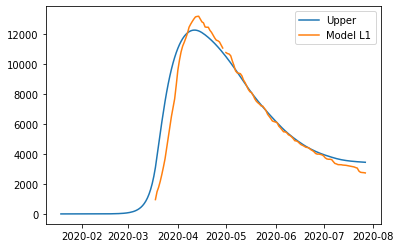

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.18791794630053765, 'other': 0.3269455532306161, 'school': 0.15916409298390322, 'transport': 0.25997536902984053, 'work': 0.48986106334349866}
{'home': 1.0, 'leisure': 0.19900449660999278, 'other': 0.3829237290035375, 'school': 0.18324801571359683, 'transport': 0.28649872016526906, 'work': 0.5933945041309192}
{'home': 1.0, 'leisure': 0.20969509869411024, 'other': 0.43690268421314027, 'school': 0.20647179834580143, 'transport': 0.3120748087601466, 'work': 0.6932303220330748}
{'home': 1.0, 'leisure': 0.2184059596515393, 'other': 0.4808855366061499, 'school': 0.22539488049056072, 'transport': 0.332914584652269, 'work': 0.7745780255089052}
{'home': 1.0, 'leisure': 0.2235532865809292, 'other': 0.506875403929292, 'school': 0.23657670175791848, 'transport': 0.3452289976794322, 'work': 0.8226471230173504}
{'home': 1.0, 'leisure': 0.22632492415829297, 'other': 0.5208699478725223, 

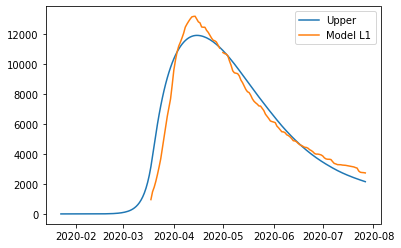

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.18112486056606136, 'other': 0.2771947372490027, 'school': 0.11875043848978584, 'transport': 0.4027035653654115, 'work': 0.46430341713666257}
{'home': 1.0, 'leisure': 0.20204051020430383, 'other': 0.31686151981437005, 'school': 0.1331127037982291, 'transport': 0.43383266747607685, 'work': 0.55318649767815}
{'home': 1.0, 'leisure': 0.22220917235546625, 'other': 0.3551116315738316, 'school': 0.1469620310599422, 'transport': 0.4638500159399328, 'work': 0.638895182486013}
{'home': 1.0, 'leisure': 0.23864289707122818, 'other': 0.38627838930376307, 'school': 0.15824666808800478, 'transport': 0.48830859616974126, 'work': 0.7087318886257531}
{'home': 1.0, 'leisure': 0.24835373440326933, 'other': 0.40469510978054085, 'school': 0.1649148626954963, 'transport': 0.5027613935782644, 'work': 0.7499990331628723}
{'home': 1.0, 'leisure': 0.25358264681282994, 'other': 0.41461180542188264,

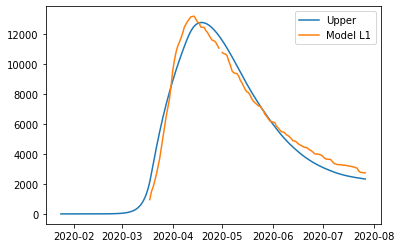

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.21730609127050218, 'other': 0.17515672149204758, 'school': 0.09809269299739376, 'transport': 0.31056705816799546, 'work': 0.44023909008328466}
{'home': 1.0, 'leisure': 0.2221818856169894, 'other': 0.20685151673258592, 'school': 0.1221139149137644, 'transport': 0.35542949677503477, 'work': 0.5606561418235645}
{'home': 1.0, 'leisure': 0.22688354445110206, 'other': 0.23741435500024788, 'school': 0.14527723604740753, 'transport': 0.3986897054318227, 'work': 0.6767725845731201}
{'home': 1.0, 'leisure': 0.23071452572334203, 'other': 0.262317408403528, 'school': 0.16415105326741303, 'transport': 0.4339387643373536, 'work': 0.7713859823690543}
{'home': 1.0, 'leisure': 0.23297828738421109, 'other': 0.2770328490509208, 'school': 0.17530376344287082, 'transport': 0.4547677536906219, 'work': 0.82729389924847}
{'home': 1.0, 'leisure': 0.2341972359708329, 'other': 0.2849565478610554, 

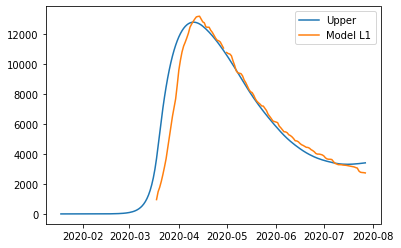

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.150299701464827, 'other': 0.17477709900750793, 'school': 0.18348853199825635, 'transport': 0.19418832016150483, 'work': 0.47953090277416655}
{'home': 1.0, 'leisure': 0.16421813601974694, 'other': 0.2184590154401373, 'school': 0.22701756979228738, 'transport': 0.217731742291507, 'work': 0.601091432888568}
{'home': 1.0, 'leisure': 0.1776394836262769, 'other': 0.26058086342874415, 'school': 0.26899199909367444, 'transport': 0.2404343279168662, 'work': 0.7183105154988837}
{'home': 1.0, 'leisure': 0.18857539649085686, 'other': 0.29490236919723867, 'school': 0.3031933859318417, 'transport': 0.25893273101901076, 'work': 0.8138223605887707}
{'home': 1.0, 'leisure': 0.19503752681992684, 'other': 0.31518325896953087, 'school': 0.32340329633621323, 'transport': 0.26986360557936895, 'work': 0.8702611781418856}
{'home': 1.0, 'leisure': 0.19851713545865682, 'other': 0.3261037380776881

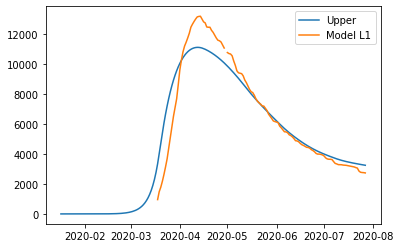

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.29188344858539683, 'other': 0.3542172129858253, 'school': 0.09364747633609495, 'transport': 0.2862499679963555, 'work': 0.47600373356759135}
{'home': 1.0, 'leisure': 0.30374305173982563, 'other': 0.4088693830848001, 'school': 0.0961495112843381, 'transport': 0.3137081543435033, 'work': 0.5680246568241514}
{'home': 1.0, 'leisure': 0.3151790976387391, 'other': 0.46156968996595427, 'school': 0.09856218784157256, 'transport': 0.340185691178253, 'work': 0.6567591185358342}
{'home': 1.0, 'leisure': 0.32449735726007595, 'other': 0.5045106807580058, 'school': 0.10052807244376359, 'transport': 0.361759980451012, 'work': 0.7290612725231314}
{'home': 1.0, 'leisure': 0.33000360158177505, 'other': 0.5298849025896726, 'school': 0.10168973152687648, 'transport': 0.3745084241121877, 'work': 0.7717852726065342}
{'home': 1.0, 'leisure': 0.3329685023703822, 'other': 0.5435479451144163, 'sc

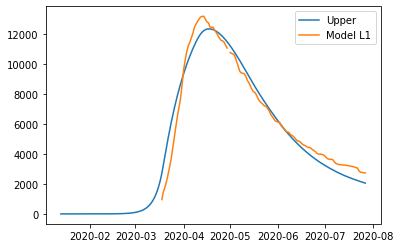

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3625263092898399, 'other': 0.4152175053550934, 'school': 0.15759397147403142, 'transport': 0.22425558326302647, 'work': 0.47519474280293406}
{'home': 1.0, 'leisure': 0.3699181410879211, 'other': 0.45820696532075217, 'school': 0.16531996982634148, 'transport': 0.2453460925877133, 'work': 0.5499786903411703}
{'home': 1.0, 'leisure': 0.3770459788932136, 'other': 0.49966108743049453, 'school': 0.17277003966606902, 'transport': 0.2656833694365185, 'work': 0.6220917826101837}
{'home': 1.0, 'leisure': 0.3828538467345631, 'other': 0.5334385202606551, 'school': 0.17884046694288402, 'transport': 0.28225448390591523, 'work': 0.6808505985330836}
{'home': 1.0, 'leisure': 0.38628576864081504, 'other': 0.553397912387568, 'school': 0.18242753760645652, 'transport': 0.292046506092377, 'work': 0.715571717032979}
{'home': 1.0, 'leisure': 0.3881337265903353, 'other': 0.5641452773789827, 'sc

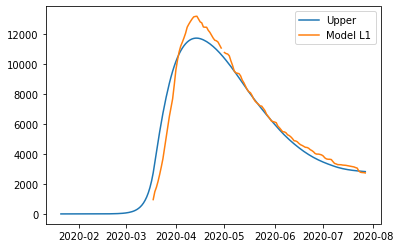

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23368047426397864, 'other': 0.15292023616792744, 'school': 0.1662329335917051, 'transport': 0.16804529585448552, 'work': 0.3518868747647991}
{'home': 1.0, 'leisure': 0.27861356803191994, 'other': 0.18344518833772547, 'school': 0.20658848622745019, 'transport': 0.20522645949646043, 'work': 0.48601456824835676}
{'home': 1.0, 'leisure': 0.32194190845100623, 'other': 0.21287996364431638, 'school': 0.2455027691262044, 'transport': 0.2410797244369362, 'work': 0.6153519869646444}
{'home': 1.0, 'leisure': 0.3572464821258173, 'other': 0.23686385463487197, 'school': 0.27721070334000414, 'transport': 0.27029349586991647, 'work': 0.7207380318445826}
{'home': 1.0, 'leisure': 0.37810827566093286, 'other': 0.2510361538565639, 'school': 0.29594720992088575, 'transport': 0.28755617898940483, 'work': 0.7830116038190915}
{'home': 1.0, 'leisure': 0.38934154910291824, 'other': 0.258667391899

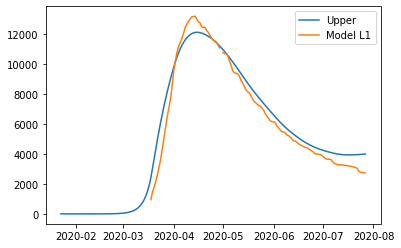

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2922142050412826, 'other': 0.284020383931349, 'school': 0.24990754654333439, 'transport': 0.20254549045643133, 'work': 0.4158511322420436}
{'home': 1.0, 'leisure': 0.32335190246559653, 'other': 0.34527280722742654, 'school': 0.3063819981651208, 'transport': 0.2337094248740278, 'work': 0.5418350655898614}
{'home': 1.0, 'leisure': 0.3533775392676136, 'other': 0.4043376439772155, 'school': 0.3608395050861291, 'transport': 0.2637603616338529, 'work': 0.6633195727466856}
{'home': 1.0, 'leisure': 0.377842872958146, 'other': 0.45246454799556207, 'school': 0.4052122885032469, 'transport': 0.28824631010482155, 'work': 0.7623069489485423}
{'home': 1.0, 'leisure': 0.3922996610480062, 'other': 0.4809031730973124, 'school': 0.4314325696133621, 'transport': 0.3027152796558485, 'work': 0.8207994894314579}
{'home': 1.0, 'leisure': 0.40008408540408463, 'other': 0.49621627892133174, 'scho

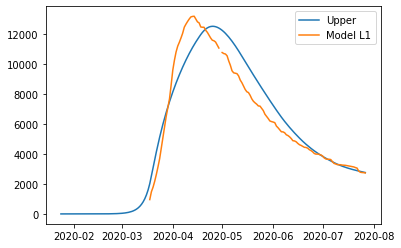

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.22142797409292556, 'other': 0.23201311962619336, 'school': 0.08401021900153927, 'transport': 0.31948832019757456, 'work': 0.35690813122024756}
{'home': 1.0, 'leisure': 0.24139435578394874, 'other': 0.29578487213357296, 'school': 0.10263895654271588, 'transport': 0.34971844493420523, 'work': 0.4849973744540956}
{'home': 1.0, 'leisure': 0.2606476524145782, 'other': 0.35727906205140325, 'school': 0.12060238202885047, 'transport': 0.37886892235881336, 'work': 0.6085120018581633}
{'home': 1.0, 'leisure': 0.27633552374323933, 'other': 0.40738543902148716, 'school': 0.13523924723977493, 'transport': 0.4026211632233089, 'work': 0.7091535501133296}
{'home': 1.0, 'leisure': 0.2856056295283572, 'other': 0.4369937526856276, 'school': 0.14388830395532123, 'transport': 0.4166565782796017, 'work': 0.7686235559004733}
{'home': 1.0, 'leisure': 0.290597224951113, 'other': 0.45293669081247

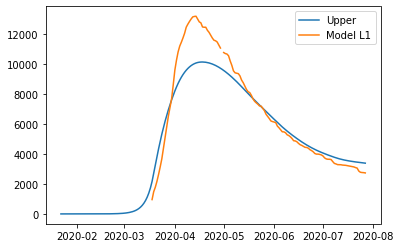

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.14489874470505668, 'other': 0.23681612317202252, 'school': 0.18135112417886215, 'transport': 0.13521047167091385, 'work': 0.29562494752862745}
{'home': 1.0, 'leisure': 0.18146165071380516, 'other': 0.3113236399394667, 'school': 0.22310224812605287, 'transport': 0.17925156152878688, 'work': 0.424515182342471}
{'home': 1.0, 'leisure': 0.21671873865081256, 'other': 0.3831701739652164, 'school': 0.26336226050370104, 'transport': 0.2217197553203073, 'work': 0.5488021944843915}
{'home': 1.0, 'leisure': 0.24544673622911492, 'other': 0.441711794282494, 'school': 0.29616671503363656, 'transport': 0.2563234687800647, 'work': 0.6500730932666972}
{'home': 1.0, 'leisure': 0.2624223711617481, 'other': 0.4763045699245216, 'school': 0.31555116543768935, 'transport': 0.27677111764264856, 'work': 0.7099149880016958}
{'home': 1.0, 'leisure': 0.27156309766393527, 'other': 0.4949314491163826

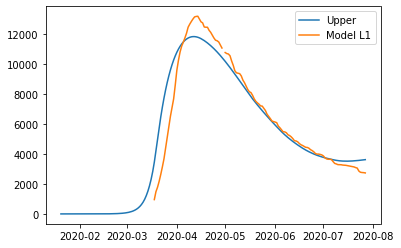

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2217401938250236, 'other': 0.13213267045118698, 'school': 0.24514056254832273, 'transport': 0.204106096091184, 'work': 0.34622811113145885}
{'home': 1.0, 'leisure': 0.27952824565492695, 'other': 0.1597855926622584, 'school': 0.2904543505387912, 'transport': 0.26635739389107593, 'work': 0.48981157539460624}
{'home': 1.0, 'leisure': 0.33525243849090525, 'other': 0.1864509105086487, 'school': 0.3341497889581716, 'transport': 0.3263854310552574, 'work': 0.6282670587912127}
{'home': 1.0, 'leisure': 0.3806573363572579, 'other': 0.20817820653163338, 'school': 0.36975347952211113, 'transport': 0.3752971650408867, 'work': 0.7410826378551141}
{'home': 1.0, 'leisure': 0.4074875032782845, 'other': 0.22101706327248796, 'school': 0.3907920239462572, 'transport': 0.4041995533051223, 'work': 0.8077463891201468}
{'home': 1.0, 'leisure': 0.42193451623576034, 'other': 0.22793029382525584, 

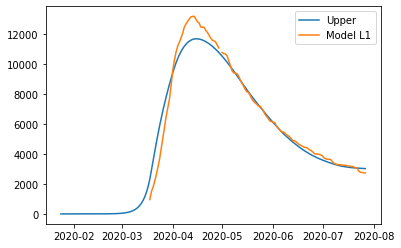

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2872117466974241, 'other': 0.3019161187263509, 'school': 0.23378520725005364, 'transport': 0.1700149392740613, 'work': 0.39107808761028773}
{'home': 1.0, 'leisure': 0.3383840463908169, 'other': 0.37459063247919644, 'school': 0.27731424504408464, 'transport': 0.20993907362405528, 'work': 0.5126386177246892}


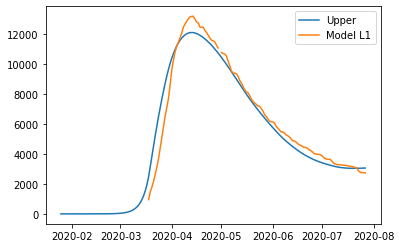

{'home': 1.0, 'leisure': 0.38772876395230266, 'other': 0.444669627883726, 'school': 0.3192886743454717, 'transport': 0.24843734603297804, 'work': 0.6298577003350049}
{'home': 1.0, 'leisure': 0.42793557085425415, 'other': 0.5017710315466761, 'school': 0.35349006118363896, 'transport': 0.2798063087365448, 'work': 0.7253695454248918}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4516941385690436, 'other': 0.535512770074783, 'school': 0.3736999715880105, 'transport': 0.2983425139704705, 'work': 0.7818083629780068}
{'home': 1.0, 'leisure': 0.24729099937983376, 'other': 0.14021924008134026, 'school': 0.23416808409985412, 'transport': 0.15627793691638728, 'work': 0.3084078311542423}
{'home': 1.0, 'leisure': 0.46448721349239175, 'other': 0.5536813985129942, 'school': 0.38458223103651823, 'transport': 0.308323547557969, 'work': 0.812198495506607}
{'home': 1.0, 'leisure': 0.49007336333908813, 'other': 0.5900186553894171, 'sch

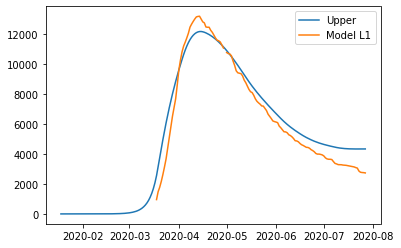

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2452082299090611, 'other': 0.2670348208148422, 'school': 0.15469658854561907, 'transport': 0.20191517058783076, 'work': 0.4296363320791095}
{'home': 1.0, 'leisure': 0.27111490775566827, 'other': 0.33652967706495496, 'school': 0.1736295820519435, 'transport': 0.2455326030991182, 'work': 0.5478217361880622}
{'home': 1.0, 'leisure': 0.2960963471077537, 'other': 0.40354257416327793, 'school': 0.1918863972187564, 'transport': 0.2875922701635739, 'work': 0.6617862330074094}
{'home': 1.0, 'leisure': 0.3164515939872308, 'other': 0.45814567550265234, 'school': 0.20676232068801131, 'transport': 0.32186310999387124, 'work': 0.7546461933787294}
{'home': 1.0, 'leisure': 0.32847969441601266, 'other': 0.490411144475919, 'school': 0.21555263910166195, 'transport': 0.3421140608026833, 'work': 0.8095179881436003}
{'home': 1.0, 'leisure': 0.3349563638776644, 'other': 0.5077848585384471, 's

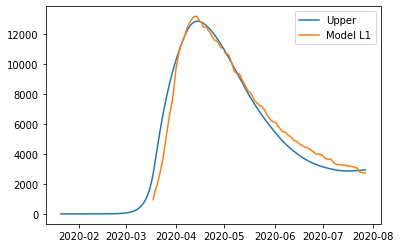

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.15183005989678025, 'other': 0.31367181524485627, 'school': 0.12473195086533367, 'transport': 0.12645508582607162, 'work': 0.3466530541141747}
{'home': 1.0, 'leisure': 0.17452169043509622, 'other': 0.4029071866876423, 'school': 0.1590311672046063, 'transport': 0.15251980325204267, 'work': 0.4870428655478699}
{'home': 1.0, 'leisure': 0.19640290559704376, 'other': 0.4889555805789004, 'school': 0.19210541153176208, 'transport': 0.17765363791280048, 'work': 0.6224187551446475}
{'home': 1.0, 'leisure': 0.21423204387714917, 'other': 0.5590690867125181, 'school': 0.21905479579833345, 'transport': 0.198133058747492, 'work': 0.7327250355568367}
{'home': 1.0, 'leisure': 0.22476744376993874, 'other': 0.6004997948823829, 'school': 0.23497943195585289, 'transport': 0.2102345346952643, 'work': 0.7979060194367665}
{'home': 1.0, 'leisure': 0.2304403514045177, 'other': 0.6228086377430795,

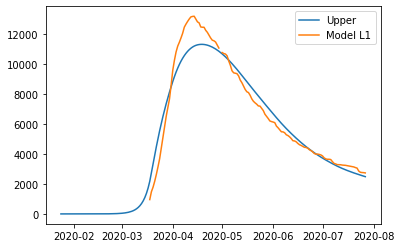

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3340443970435819, 'other': 0.3055987995002885, 'school': 0.10163373199069392, 'transport': 0.12879521332377405, 'work': 0.34305458538950906}
{'home': 1.0, 'leisure': 0.38002858764229797, 'other': 0.3769262199125251, 'school': 0.115580269300576, 'transport': 0.15897617964753147, 'work': 0.4452575683400135}
{'home': 1.0, 'leisure': 0.42437048571963126, 'other': 0.44570623245289603, 'school': 0.129028715992248, 'transport': 0.18807925431686895, 'work': 0.5438104447565713}
{'home': 1.0, 'leisure': 0.46050092119005104, 'other': 0.501749205633939, 'school': 0.13998670959286963, 'transport': 0.21179287071410693, 'work': 0.6241127885033961}
{'home': 1.0, 'leisure': 0.4818507239680263, 'other': 0.5348655079681917, 'school': 0.1464618876296006, 'transport': 0.22580546222156572, 'work': 0.6715641734447018}
{'home': 1.0, 'leisure': 0.49334677161770535, 'other': 0.5526973630712508, '

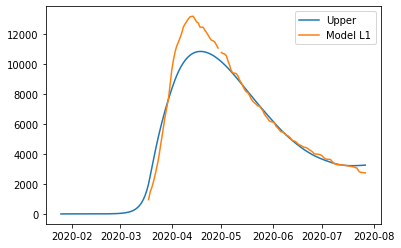

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.32533409960911064, 'other': 0.3545051447279847, 'school': 0.295222553116533, 'transport': 0.21501864992502476, 'work': 0.36283314113861265}
{'home': 1.0, 'leisure': 0.3608963679323183, 'other': 0.4298025416991901, 'school': 0.3235800529575018, 'transport': 0.26649924842166695, 'work': 0.5025594096472648}
{'home': 1.0, 'leisure': 0.39518855524398283, 'other': 0.5024107459214239, 'school': 0.35092478494700746, 'transport': 0.3161412541148577, 'work': 0.637295454280608}
{'home': 1.0, 'leisure': 0.4231303374979317, 'other': 0.5615729863987996, 'school': 0.37320567767919727, 'transport': 0.356590295790791, 'work': 0.7470803795374061}
{'home': 1.0, 'leisure': 0.43964139064799246, 'other': 0.5965324921354307, 'school': 0.3863716597482185, 'transport': 0.3804920022356606, 'work': 0.8119532899164232}
{'home': 1.0, 'leisure': 0.4485319577287944, 'other': 0.615356841378232, 'school

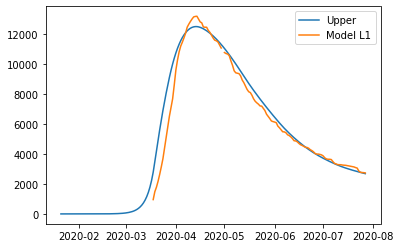

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.29283357515680214, 'other': 0.2796395153072522, 'school': 0.2317476176436386, 'transport': 0.14589060744192733, 'work': 0.39700792244430644}
{'home': 1.0, 'leisure': 0.3356960946494889, 'other': 0.32168652786568697, 'school': 0.2825659748221703, 'transport': 0.1782920450667915, 'work': 0.4951024280372374}
{'home': 1.0, 'leisure': 0.3770278098745797, 'other': 0.3622318614041776, 'school': 0.3315693906728972, 'transport': 0.20953628849076766, 'work': 0.5896935584304208}
{'home': 1.0, 'leisure': 0.4107055037616907, 'other': 0.3952687998429478, 'school': 0.3714980998846007, 'transport': 0.2349945609103038, 'work': 0.6667678128248666}
{'home': 1.0, 'leisure': 0.4306059592404381, 'other': 0.4147906271022211, 'school': 0.39509233714606184, 'transport': 0.2500380855218479, 'work': 0.7123116904215846}
{'home': 1.0, 'leisure': 0.44132158911360986, 'other': 0.4253023802418298, 'sch

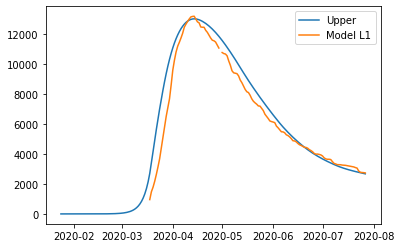

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.15638866986928926, 'other': 0.3553391954613546, 'school': 0.318035037915829, 'transport': 0.34860794421538555, 'work': 0.40979037066081236}
{'home': 1.0, 'leisure': 0.1616713967794193, 'other': 0.4287993368465018, 'school': 0.3599277382711075, 'transport': 0.38956129725547595, 'work': 0.510999133432925}
{'home': 1.0, 'leisure': 0.1667654548713304, 'other': 0.4996359017536079, 'school': 0.40032427075655463, 'transport': 0.4290520305441345, 'work': 0.608593297534605}
{'home': 1.0, 'leisure': 0.17091616887214686, 'other': 0.5573545842705092, 'school': 0.43323996389284486, 'transport': 0.46122966507563407, 'work': 0.688114468284122}
{'home': 1.0, 'leisure': 0.17336886350899294, 'other': 0.5914610784850418, 'school': 0.4526901462006528, 'transport': 0.4802437218442475, 'work': 0.7351042509997459}
{'home': 1.0, 'leisure': 0.17468954523652547, 'other': 0.6098261138313286, 'scho

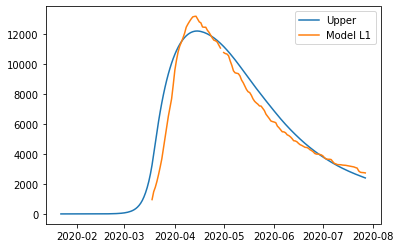

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.20310237964598088, 'other': 0.23889500531463492, 'school': 0.19276955151028188, 'transport': 0.2339026715670484, 'work': 0.4992806533027218}
{'home': 1.0, 'leisure': 0.22582563470706812, 'other': 0.26650373465089494, 'school': 0.20942887759621875, 'transport': 0.2573685860320849, 'work': 0.5738355310891705}
{'home': 1.0, 'leisure': 0.2477373449445451, 'other': 0.29312643793943144, 'school': 0.22549322775051506, 'transport': 0.2799964321233701, 'work': 0.6457277346689604}
{'home': 1.0, 'leisure': 0.2655913310639708, 'other': 0.31481901098935006, 'school': 0.23858269824660833, 'transport': 0.2984339363458988, 'work': 0.7043065672154558}
{'home': 1.0, 'leisure': 0.2761414137709042, 'other': 0.3276373496097565, 'school': 0.24631738535793615, 'transport': 0.30932882520466576, 'work': 0.7389213319020213}
{'home': 1.0, 'leisure': 0.2818222275361759, 'other': 0.33453953194382147

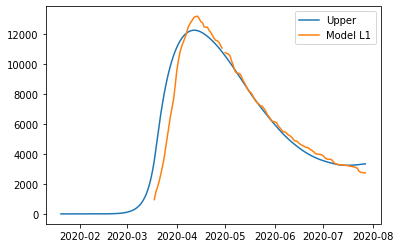

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.270369221548695, 'other': 0.33141153251724653, 'school': 0.19536325569379226, 'transport': 0.22626585152387046, 'work': 0.3427163894703824}
{'home': 1.0, 'leisure': 0.29726458061431743, 'other': 0.38976356719712046, 'school': 0.23783679662467905, 'transport': 0.29442493396105607, 'work': 0.4890121039598373}
{'home': 1.0, 'leisure': 0.32319939114188195, 'other': 0.4460316006384275, 'school': 0.2787934253794627, 'transport': 0.36014976345405647, 'work': 0.6300829715032402}
{'home': 1.0, 'leisure': 0.34433145897915673, 'other': 0.49187962788689993, 'school': 0.3121654932537309, 'transport': 0.4137033282261309, 'work': 0.7450296043163833}
{'home': 1.0, 'leisure': 0.35681858997391, 'other': 0.5189716439882699, 'school': 0.3318853515430712, 'transport': 0.4453486165005385, 'work': 0.8129526146150587}
{'home': 1.0, 'leisure': 0.3635424297403156, 'other': 0.5335596526582385, 'sc

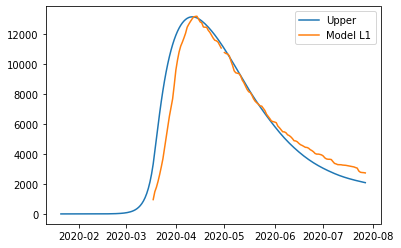

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.16310745063902746, 'other': 0.28981942978005115, 'school': 0.254257197577928, 'transport': 0.22437740372380252, 'work': 0.387534126553169}
{'home': 1.0, 'leisure': 0.16815975945130032, 'other': 0.33853441927307937, 'school': 0.3091766898320294, 'transport': 0.2732057717588964, 'work': 0.49653408703863855}
{'home': 1.0, 'leisure': 0.17303162866313487, 'other': 0.38550958771278515, 'school': 0.3621347716484843, 'transport': 0.3202902695070226, 'work': 0.6016411917924842}
{'home': 1.0, 'leisure': 0.17700129987277782, 'other': 0.4237856508858788, 'school': 0.4052858012767068, 'transport': 0.35865541582031063, 'work': 0.6872840178882103}
{'home': 1.0, 'leisure': 0.17934701467847594, 'other': 0.4464033245790705, 'school': 0.4307841369661111, 'transport': 0.38132572955088995, 'work': 0.7378911423993212}
{'home': 1.0, 'leisure': 0.18061009188154414, 'other': 0.45858207195232753,

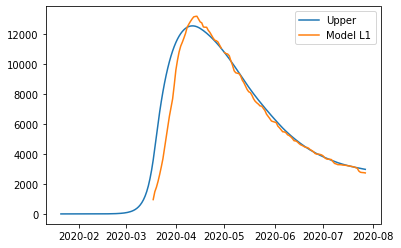

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.16442383581831288, 'other': 0.29059047118830955, 'school': 0.20438722087364597, 'transport': 0.2090359112207451, 'work': 0.3955570967148104}
{'home': 1.0, 'leisure': 0.19518953818677737, 'other': 0.35161351193559814, 'school': 0.22997668872106466, 'transport': 0.24843019022537002, 'work': 0.49938822672527283}
{'home': 1.0, 'leisure': 0.22485646547065383, 'other': 0.4104571583704835, 'school': 0.2546522470025041, 'transport': 0.28641753069411546, 'work': 0.5995111020925045}
{'home': 1.0, 'leisure': 0.24902951733159023, 'other': 0.45840383324335315, 'school': 0.27475825745404747, 'transport': 0.31737017848346366, 'work': 0.6810927042435821}
{'home': 1.0, 'leisure': 0.26331359343123445, 'other': 0.4867359593045943, 'school': 0.28663908181177755, 'transport': 0.33566037944989663, 'work': 0.7293000146055826}
{'home': 1.0, 'leisure': 0.27100501902335056, 'other': 0.50199171949

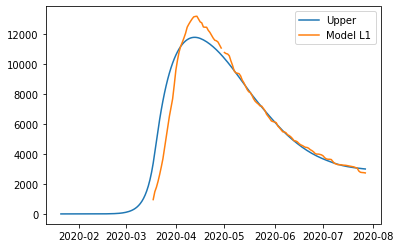

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24365041613114127, 'other': 0.20734957234320883, 'school': 0.2807745656114136, 'transport': 0.2216218355267273, 'work': 0.33274853758463196}
{'home': 1.0, 'leisure': 0.2959893387133824, 'other': 0.25313156175060747, 'school': 0.3521096447288709, 'transport': 0.28142837594998893, 'work': 0.4611164710941078}
{'home': 1.0, 'leisure': 0.3464590140605435, 'other': 0.29727848010774194, 'school': 0.4208970424492761, 'transport': 0.33909896850099114, 'work': 0.5848998355496737}
{'home': 1.0, 'leisure': 0.38758245323230445, 'other': 0.33325004321355517, 'school': 0.4769460331844212, 'transport': 0.3860898216906968, 'work': 0.6857603547356905}
{'home': 1.0, 'leisure': 0.411882667288345, 'other': 0.35450596686699026, 'school': 0.5100658913460978, 'transport': 0.4138571440300682, 'work': 0.7453597524365185}
{'home': 1.0, 'leisure': 0.42496739793390526, 'other': 0.3659514642188399, '

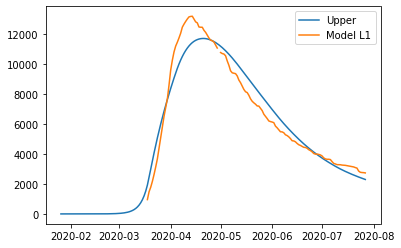

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3184712181361692, 'other': 0.1926585682660491, 'school': 0.15423907877108436, 'transport': 0.2401373200005515, 'work': 0.40396547836583585}
{'home': 1.0, 'leisure': 0.34632319130137057, 'other': 0.2272409231349679, 'school': 0.18124111524855663, 'transport': 0.28999090928786964, 'work': 0.4975771933812966}
{'home': 1.0, 'leisure': 0.37318045113924336, 'other': 0.2605881939014254, 'school': 0.20727879328040485, 'transport': 0.33806401324349783, 'work': 0.5878456328604909}
{'home': 1.0, 'leisure': 0.395064144340473, 'other': 0.2877600441555759, 'school': 0.22849467908413307, 'transport': 0.3772346905406764, 'work': 0.6613976946583529}
{'home': 1.0, 'leisure': 0.40799541759574504, 'other': 0.30381613748757386, 'school': 0.24103133887724515, 'transport': 0.40038099985264547, 'work': 0.7048602766298167}
{'home': 1.0, 'leisure': 0.4149584108870454, 'other': 0.31246172620480356

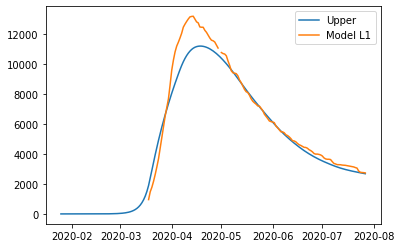

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2868206388410355, 'other': 0.28398336114745637, 'school': 0.17230829408123827, 'transport': 0.19005981081957654, 'work': 0.4656819492472243}
{'home': 1.0, 'leisure': 0.32520472562608915, 'other': 0.32382137526169363, 'school': 0.19649698315010833, 'transport': 0.2217942579284309, 'work': 0.5670089589558304}
{'home': 1.0, 'leisure': 0.36221795216881947, 'other': 0.36223660315756523, 'school': 0.21982179046651873, 'transport': 0.25239533192625474, 'work': 0.6647171468891291}
{'home': 1.0, 'leisure': 0.39237687749993305, 'other': 0.3935378999616088, 'school': 0.23882718902063094, 'transport': 0.27732954036892604, 'work': 0.7443312259458911}
{'home': 1.0, 'leisure': 0.4101980606501366, 'other': 0.41203412080036184, 'school': 0.25005765180260636, 'transport': 0.29206339081232274, 'work': 0.7913759090248869}
{'home': 1.0, 'leisure': 0.4197940823464, 'other': 0.4219936243289211

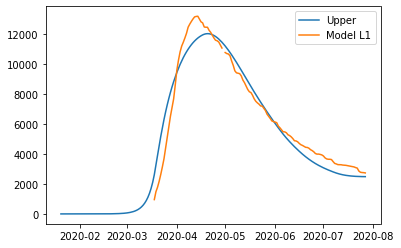

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.27370119665172965, 'other': 0.42899102179679366, 'school': 0.1038270087349182, 'transport': 0.3335466160376008, 'work': 0.47621218424202716}
{'home': 1.0, 'leisure': 0.3326205053319565, 'other': 0.5063080444595576, 'school': 0.12522742079438287, 'transport': 0.398487633577587, 'work': 0.5916631313690686}
{'home': 1.0, 'leisure': 0.3894355529878895, 'other': 0.5808637448843657, 'school': 0.14586353242315242, 'transport': 0.4611093290625738, 'work': 0.70299083038443}
{'home': 1.0, 'leisure': 0.43572929552235345, 'other': 0.6416128341193945, 'school': 0.1626781418984461, 'transport': 0.512134414272563, 'work': 0.7937022888413912}
{'home': 1.0, 'leisure': 0.46308468883817305, 'other': 0.6775100232128205, 'school': 0.17261404749748327, 'transport': 0.5422856009875565, 'work': 0.8473045142932317}
{'home': 1.0, 'leisure': 0.4778145160082297, 'other': 0.6968392788785115, 'school

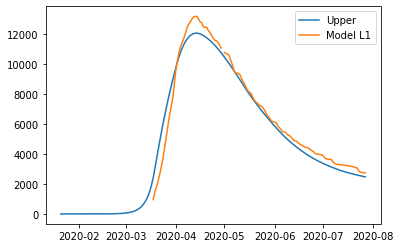

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.20433110526986403, 'other': 0.19529083732691405, 'school': 0.2661791865589802, 'transport': 0.3145000921839586, 'work': 0.4828574851359215}
{'home': 1.0, 'leisure': 0.20865553276299706, 'other': 0.2229720395136991, 'school': 0.3057561526724158, 'transport': 0.35476490451110865, 'work': 0.5804909369156364}
{'home': 1.0, 'leisure': 0.21282551641708963, 'other': 0.24966462733667047, 'school': 0.3439196557103716, 'transport': 0.3935916878265749, 'work': 0.6746374797032186}
{'home': 1.0, 'leisure': 0.2162232808759799, 'other': 0.271414143340573, 'school': 0.37501584337092814, 'transport': 0.42522832608362143, 'work': 0.7513494775301375}
{'home': 1.0, 'leisure': 0.21823105078350594, 'other': 0.2842661300701518, 'school': 0.39339086335216605, 'transport': 0.44392270323551253, 'work': 0.7966792944278622}
{'home': 1.0, 'leisure': 0.2193121576567892, 'other': 0.29118643061684807, 

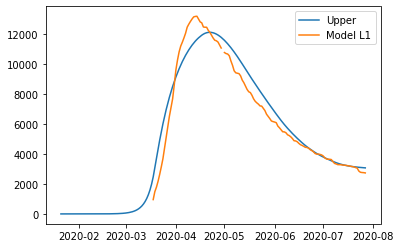

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.19638007829939153, 'other': 0.30156913495936516, 'school': 0.17570842371088816, 'transport': 0.09900879762207083, 'work': 0.3283922641838674}
{'home': 1.0, 'leisure': 0.21134288429129855, 'other': 0.4063963470150084, 'school': 0.2329317131413339, 'transport': 0.10813319862815846, 'work': 0.4583731847472772}
{'home': 1.0, 'leisure': 0.22577130435492315, 'other': 0.5074797300686642, 'school': 0.2881113136635494, 'transport': 0.11693172816974295, 'work': 0.5837119295762794}
{'home': 1.0, 'leisure': 0.23752779477713584, 'other': 0.5898439681123839, 'school': 0.333072469644614, 'transport': 0.12410090038881182, 'work': 0.6858397957332443}
{'home': 1.0, 'leisure': 0.24447481184480696, 'other': 0.6385137451382183, 'school': 0.3596404254516067, 'transport': 0.12833722942735248, 'work': 0.7461880802805416}
{'home': 1.0, 'leisure': 0.2482155133427837, 'other': 0.664720548152129, '

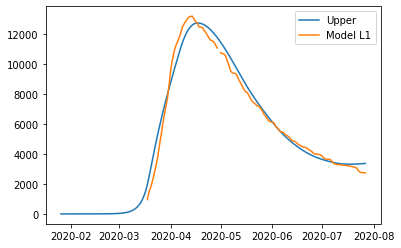

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3255789750704044, 'other': 0.30866691234471977, 'school': 0.226665056042904, 'transport': 0.3864492138666651, 'work': 0.4195104134647411}
{'home': 1.0, 'leisure': 0.35747519751139945, 'other': 0.38452104485977523, 'school': 0.2639388617980536, 'transport': 0.44138710182132834, 'work': 0.5459801553390062}
{'home': 1.0, 'leisure': 0.38823226915093034, 'other': 0.45766610121357865, 'school': 0.299881460204805, 'transport': 0.4943629223490393, 'work': 0.6679331207177619}
{'home': 1.0, 'leisure': 0.41329358678314065, 'other': 0.5172657767611222, 'school': 0.32916802186956534, 'transport': 0.5375284057419889, 'work': 0.7673022036189701}
{'home': 1.0, 'leisure': 0.428102547202174, 'other': 0.5524837668573979, 'school': 0.34647371739874194, 'transport': 0.5630352822923682, 'work': 0.8260202980605932}
{'home': 1.0, 'leisure': 0.4360766028124228, 'other': 0.5714472999861618, 'scho

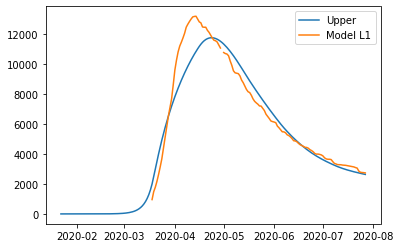

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3547028155932833, 'other': 0.46325164413492226, 'school': 0.23116071632916027, 'transport': 0.3649316553943936, 'work': 0.4957889159880371}
{'home': 1.0, 'leisure': 0.3859717595094565, 'other': 0.5360082467545106, 'school': 0.26385640900493024, 'transport': 0.4046832944044937, 'work': 0.5737135945486298}
{'home': 1.0, 'leisure': 0.41612395542862357, 'other': 0.6061663992805422, 'school': 0.2953843983708511, 'transport': 0.4430152320213759, 'work': 0.6488552488749155}
{'home': 1.0, 'leisure': 0.44069241136275966, 'other': 0.6633323013387904, 'school': 0.3210738711875275, 'transport': 0.4742486626721688, 'work': 0.710081782029667}
{'home': 1.0, 'leisure': 0.4552101353238401, 'other': 0.6971121525550279, 'school': 0.33625401421556356, 'transport': 0.49270478078400104, 'work': 0.7462610970756565}
{'home': 1.0, 'leisure': 0.4630273713028834, 'other': 0.7153013032099249, 'scho

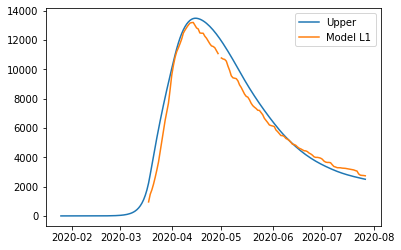

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2515971525679611, 'other': 0.11374652356004743, 'school': 0.2852627945943125, 'transport': 0.37320950536568753, 'work': 0.4063782007263654}
{'home': 1.0, 'leisure': 0.28184350220684895, 'other': 0.1214193066153505, 'school': 0.3280606394765772, 'transport': 0.41848072656794, 'work': 0.5207307852224905}
{'home': 1.0, 'leisure': 0.31100962507291935, 'other': 0.12881806170439272, 'school': 0.3693299898987611, 'transport': 0.46213511844154065, 'work': 0.6309993488437541}
{'home': 1.0, 'leisure': 0.3347746140749026, 'other': 0.13484667696213085, 'school': 0.4029568680205405, 'transport': 0.4977053636718819, 'work': 0.7208478080907095}
{'home': 1.0, 'leisure': 0.34881756212152915, 'other': 0.13840904052352154, 'school': 0.42282729600159197, 'transport': 0.5187241449443563, 'work': 0.7739400794639105}
{'home': 1.0, 'leisure': 0.35637914953125105, 'other': 0.14032723628734733, '

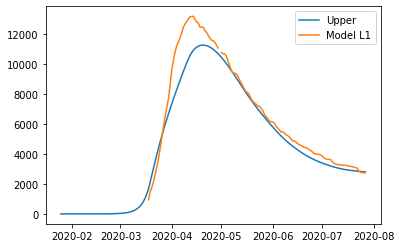

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2930103299406175, 'other': 0.35508852214862713, 'school': 0.09809269299739376, 'transport': 0.38942223500115003, 'work': 0.44023909008328466}
{'home': 1.0, 'leisure': 0.31959559768343704, 'other': 0.4271657196399047, 'school': 0.11885399993732362, 'transport': 0.4468382593215592, 'work': 0.544314369046408}
{'home': 1.0, 'leisure': 0.3452313915782988, 'other': 0.4966687315064939, 'school': 0.13887383162939887, 'transport': 0.5022037113448109, 'work': 0.6446726737608484}
{'home': 1.0, 'leisure': 0.3661198162333713, 'other': 0.5533008152496405, 'school': 0.1551862870822009, 'transport': 0.5473163018822752, 'work': 0.7264461072318738}
{'home': 1.0, 'leisure': 0.37846297625682324, 'other': 0.5867652283705908, 'school': 0.1648254653043112, 'transport': 0.5739737417453223, 'work': 0.7747667724647525}
{'home': 1.0, 'leisure': 0.3851092931925281, 'other': 0.6047845277434103, 'sch

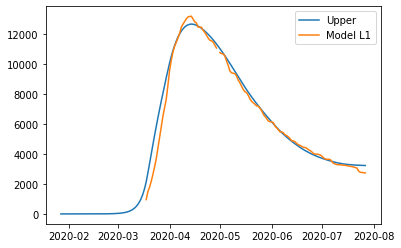

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2535713017400731, 'other': 0.18918883052873375, 'school': 0.2782622786087563, 'transport': 0.31209422073103443, 'work': 0.4058996584460405}
{'home': 1.0, 'leisure': 0.29104264372537714, 'other': 0.22822114527068824, 'school': 0.33239622300842464, 'transport': 0.34813444913028635, 'work': 0.5329909949950586}
{'home': 1.0, 'leisure': 0.32717572349692026, 'other': 0.2658594487718586, 'school': 0.38459681225096193, 'transport': 0.38288752651527924, 'work': 0.6555433552387546}
{'home': 1.0, 'leisure': 0.35661749219965916, 'other': 0.29652769606910856, 'school': 0.42713062570784416, 'transport': 0.41120484882897723, 'work': 0.7554008339558403}
{'home': 1.0, 'leisure': 0.3740149009785503, 'other': 0.3146498421993017, 'school': 0.45226424275054733, 'transport': 0.4279378120143442, 'work': 0.8144075259250273}
{'home': 1.0, 'leisure': 0.38338273647487636, 'other': 0.32440792088479

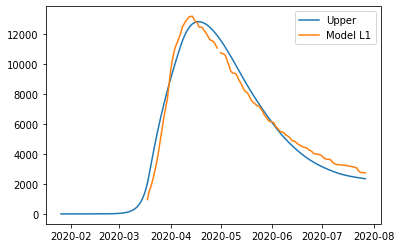

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.1777125103370531, 'other': 0.3780537240073614, 'school': 0.23478155330987188, 'transport': 0.27957151176969597, 'work': 0.4503052248680274}
{'home': 1.0, 'leisure': 0.19831838373061605, 'other': 0.44619772102051347, 'school': 0.28105178783086004, 'transport': 0.31041115472961645, 'work': 0.5600188495558592}
{'home': 1.0, 'leisure': 0.21818833307440888, 'other': 0.5119080038546244, 'school': 0.32566951397609867, 'transport': 0.3401493818695398, 'work': 0.66581413050484}
{'home': 1.0, 'leisure': 0.23437866216935122, 'other': 0.5654497157935297, 'school': 0.3620246982425894, 'transport': 0.3643805299094774, 'work': 0.752017692759565}
{'home': 1.0, 'leisure': 0.24394567481636262, 'other': 0.5970880001210646, 'school': 0.383507307127334, 'transport': 0.37869893556944056, 'work': 0.8029561613646299}
{'home': 1.0, 'leisure': 0.24909714316475334, 'other': 0.6141239993743526, 'sc

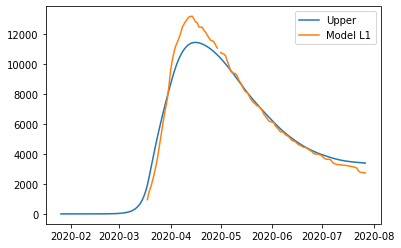

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0824157740270542, 'other': 0.33306072634095657, 'school': 0.18291147806075936, 'transport': 0.28246326332541694, 'work': 0.39321449437351097}
{'home': 1.0, 'leisure': 0.10240487038604591, 'other': 0.4059462015404885, 'school': 0.21763287252477687, 'transport': 0.31972683830718895, 'work': 0.5025708219113152}
{'home': 1.0, 'leisure': 0.1216800704465022, 'other': 0.4762286240543228, 'school': 0.25111421718650806, 'transport': 0.3556595713253262, 'work': 0.6080215663227693}
{'home': 1.0, 'leisure': 0.1373857890142814, 'other': 0.5334957831396693, 'school': 0.27839531283680746, 'transport': 0.3849380945252898, 'work': 0.6939443951024725}
{'home': 1.0, 'leisure': 0.1466664408952418, 'other': 0.5673354680537377, 'school': 0.2945159602665299, 'transport': 0.40223904005254113, 'work': 0.7447169757450245}
{'home': 1.0, 'leisure': 0.15166371498498973, 'other': 0.5855568368536206, 

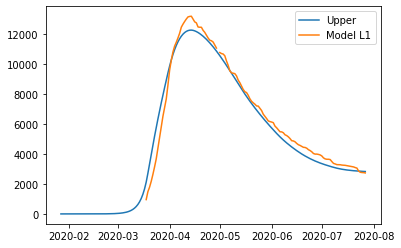

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.315973686356922, 'other': 0.17678250680605329, 'school': 0.2542495766685423, 'transport': 0.2627909820986598, 'work': 0.34634833255215136}
{'home': 1.0, 'leisure': 0.38343800393305144, 'other': 0.21560678294856303, 'school': 0.3084081602082547, 'transport': 0.29841698137755157, 'work': 0.4727841170858114}
{'home': 1.0, 'leisure': 0.4484928815957478, 'other': 0.2530444778002689, 'school': 0.36063250862154883, 'transport': 0.33277062353934006, 'work': 0.5947043378861265}
{'home': 1.0, 'leisure': 0.501500559691278, 'other': 0.2835492661979551, 'school': 0.4031856814027514, 'transport': 0.36076248011561207, 'work': 0.6940467400197166}
{'home': 1.0, 'leisure': 0.5328232785659096, 'other': 0.3015748229784061, 'school': 0.4283307380461893, 'transport': 0.37730312263795474, 'work': 0.7527490685532016}
{'home': 1.0, 'leisure': 0.549689357959942, 'other': 0.31128089201403353, 'sch

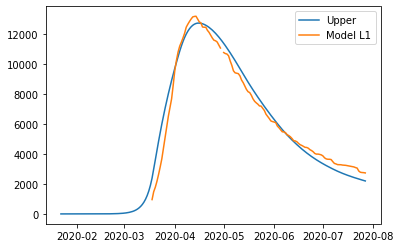

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.15051882041222164, 'other': 0.2914241748642431, 'school': 0.21427963837198238, 'transport': 0.3020573559520374, 'work': 0.44442895531078147}
{'home': 1.0, 'leisure': 0.16644602387473523, 'other': 0.33831186934890284, 'school': 0.24314667622230704, 'transport': 0.33005573550985323, 'work': 0.5317512870450187}
{'home': 1.0, 'leisure': 0.181804398642159, 'other': 0.3835250033162533, 'school': 0.2709827484351201, 'transport': 0.3570541729406041, 'work': 0.6159549640744617}
{'home': 1.0, 'leisure': 0.19431862993413396, 'other': 0.4203653346970574, 'school': 0.29366399246037517, 'transport': 0.37905289973603074, 'work': 0.6845653675799338}
{'home': 1.0, 'leisure': 0.20171340297030096, 'other': 0.442134621422078, 'school': 0.30706654574802594, 'transport': 0.3920521473878738, 'work': 0.7251078787422582}
{'home': 1.0, 'leisure': 0.20569520383592935, 'other': 0.4538565450432429, 

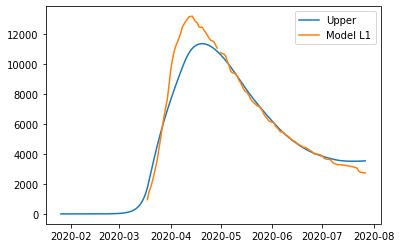

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23764813015013642, 'other': 0.24019876769447118, 'school': 0.15396136654187698, 'transport': 0.27712812712147217, 'work': 0.3297478244305749}
{'home': 1.0, 'leisure': 0.25641075137492836, 'other': 0.3241250998785119, 'school': 0.20130081566592042, 'transport': 0.3546624029564705, 'work': 0.4648983025453489}
{'home': 1.0, 'leisure': 0.2745032789845491, 'other': 0.4050540630559798, 'school': 0.2469495701783909, 'transport': 0.4294275975116475, 'work': 0.5952219778703096}
{'home': 1.0, 'leisure': 0.28924533851831424, 'other': 0.47099618120058323, 'school': 0.28414485163299646, 'transport': 0.49034738566771763, 'work': 0.7014116392462035}
{'home': 1.0, 'leisure': 0.297956555515539, 'other': 0.5099619782860307, 'school': 0.3061238815834452, 'transport': 0.5263454423053954, 'work': 0.7641600755137772}
{'home': 1.0, 'leisure': 0.302647210821737, 'other': 0.5309435613320409, 'sc

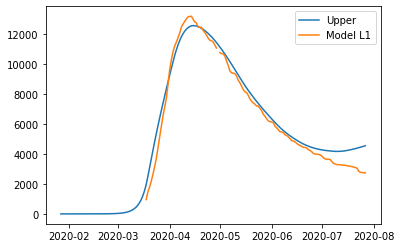

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.201827708697019, 'other': 0.27020386796320284, 'school': 0.2675554674342997, 'transport': 0.33633829362035894, 'work': 0.4274746814662896}
{'home': 1.0, 'leisure': 0.24185617121169542, 'other': 0.3324598371058989, 'school': 0.30690080172837036, 'transport': 0.37221347981150354, 'work': 0.565575113378405}
{'home': 1.0, 'leisure': 0.28045504577941915, 'other': 0.39249237877921284, 'school': 0.34484094551193845, 'transport': 0.40680740935296444, 'work': 0.6987433870079449}
{'home': 1.0, 'leisure': 0.3119059806123792, 'other': 0.44140778310561685, 'school': 0.375755136742994, 'transport': 0.4349950556460066, 'work': 0.807250869224607}
{'home': 1.0, 'leisure': 0.3304906239227646, 'other': 0.4703123402075828, 'school': 0.39402261337952676, 'transport': 0.45165139209189514, 'work': 0.8713689268980891}
{'home': 1.0, 'leisure': 0.34049773955143375, 'other': 0.4858763324932568, 's

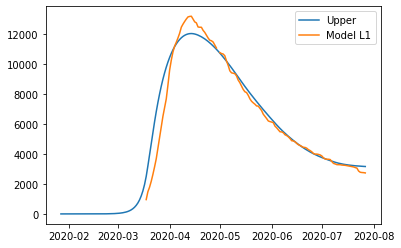

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.28228413912759476, 'other': 0.23658464819063948, 'school': 0.2880134311150023, 'transport': 0.2264031295395023, 'work': 0.34578462602331245}
{'home': 1.0, 'leisure': 0.3539781861653454, 'other': 0.3006372961656377, 'school': 0.32902218764014435, 'transport': 0.25199840623731395, 'work': 0.47408332455594737}
{'home': 1.0, 'leisure': 0.4231117315231763, 'other': 0.36240234957010037, 'school': 0.3685663457179598, 'transport': 0.2766795659102037, 'work': 0.5977999267124168}
{'home': 1.0, 'leisure': 0.47944276848140904, 'other': 0.4127294301218848, 'school': 0.40078751155914283, 'transport': 0.2967901404584843, 'work': 0.6986060469880586}
{'home': 1.0, 'leisure': 0.5127292903203646, 'other': 0.4424681595388482, 'school': 0.41982729137438735, 'transport': 0.30867366178246824, 'work': 0.7581732998782105}
{'home': 1.0, 'leisure': 0.5306528020798024, 'other': 0.45848132153259785,

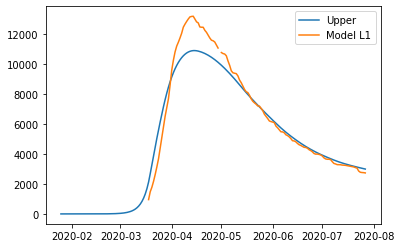

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.22998747252526522, 'other': 0.21218875655373898, 'school': 0.2628869546239938, 'transport': 0.40560428730957365, 'work': 0.4688601222143333}
{'home': 1.0, 'leisure': 0.2570868928560825, 'other': 0.2452728653518673, 'school': 0.2911646264176434, 'transport': 0.44272134643688754, 'work': 0.559798434277879}
{'home': 1.0, 'leisure': 0.2832184767465134, 'other': 0.2771753988357767, 'school': 0.3184323813615198, 'transport': 0.47851279630965443, 'work': 0.6474889494820122}
{'home': 1.0, 'leisure': 0.3045108784350127, 'other': 0.3031700557485918, 'school': 0.34065055205653016, 'transport': 0.5076761999096868, 'work': 0.7189404803890838}
{'home': 1.0, 'leisure': 0.31709275216003496, 'other': 0.3185305348334371, 'school': 0.3537794711035818, 'transport': 0.5249091202187968, 'work': 0.7611618395614443}
{'home': 1.0, 'leisure': 0.3238676072427393, 'other': 0.3268015620329691, 'scho

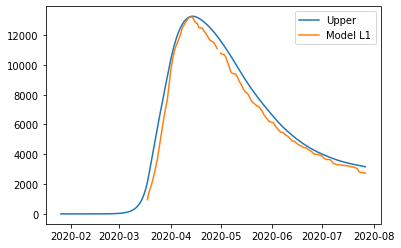

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2217401938250236, 'other': 0.12710704202115075, 'school': 0.20545732723107224, 'transport': 0.18856357702976612, 'work': 0.34622811113145885}
{'home': 1.0, 'leisure': 0.2711973548442336, 'other': 0.14898973251819497, 'school': 0.254795135041888, 'transport': 0.23632416382515808, 'work': 0.4691121725748282}
{'home': 1.0, 'leisure': 0.31888818868418606, 'other': 0.17009089835463048, 'school': 0.3023708782880319, 'transport': 0.28237901537785753, 'work': 0.5876075175380773}
{'home': 1.0, 'leisure': 0.357747386627851, 'other': 0.18728444088802235, 'school': 0.3411362987108157, 'transport': 0.31990519071709406, 'work': 0.6841592801007246}
{'home': 1.0, 'leisure': 0.3807096399581985, 'other': 0.19744426147593575, 'school': 0.36404313805155164, 'transport': 0.34207974887209747, 'work': 0.7412125943422889}
{'home': 1.0, 'leisure': 0.393073930213001, 'other': 0.2029149341001968, 

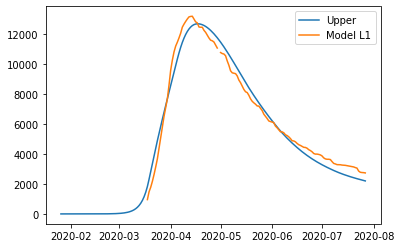

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.19967146857500223, 'other': 0.09522242594956792, 'school': 0.34301690221394837, 'transport': 0.42603067838132924, 'work': 0.4584707517701025}
{'home': 1.0, 'leisure': 0.20439805648039053, 'other': 0.10507872080362882, 'school': 0.4074810317641118, 'transport': 0.4630831198123414, 'work': 0.5553890192425774}
{'home': 1.0, 'leisure': 0.20895583767487208, 'other': 0.11458300512718754, 'school': 0.46964287097319796, 'transport': 0.4988122597636746, 'work': 0.6488459200196068}
{'home': 1.0, 'leisure': 0.21266958531482, 'other': 0.12232723679823537, 'school': 0.5202932584768978, 'transport': 0.5279248923166128, 'work': 0.7249959873194085}
{'home': 1.0, 'leisure': 0.21486407255660744, 'other': 0.12690337369476365, 'school': 0.5502230329109021, 'transport': 0.5451278115524398, 'work': 0.7699937543602005}
{'home': 1.0, 'leisure': 0.21604571953295448, 'other': 0.12936744740827888,

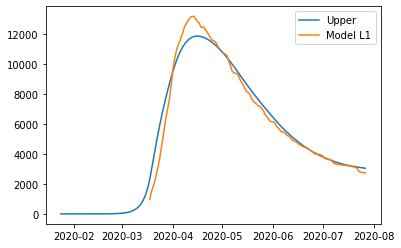

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.1895109082633284, 'other': 0.2973353485150303, 'school': 0.2995283443472973, 'transport': 0.1591621236950882, 'work': 0.35803356362766553}
{'home': 1.0, 'leisure': 0.21148449183884327, 'other': 0.3676112676509833, 'school': 0.36709020055028885, 'transport': 0.1977685772132343, 'work': 0.47558203479454375}
{'home': 1.0, 'leisure': 0.23267330457237545, 'other': 0.4353773325320807, 'school': 0.4322391333174592, 'transport': 0.234996228820018, 'work': 0.5889323462768905}
{'home': 1.0, 'leisure': 0.24993826309599426, 'other': 0.49059412613890097, 'school': 0.485323448905524, 'transport': 0.26532987086998994, 'work': 0.6812918593365805}
{'home': 1.0, 'leisure': 0.26014028404176903, 'other': 0.523222231452022, 'school': 0.5166914535711986, 'transport': 0.28325429571770055, 'work': 0.7358679352354882}
{'home': 1.0, 'leisure': 0.2656336799356477, 'other': 0.5407912112360103, 'sch

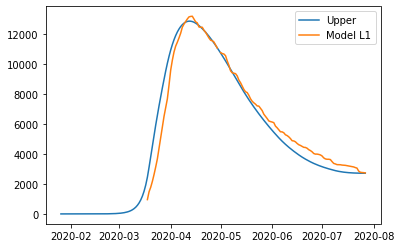

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.21834388772401242, 'other': 0.2817422295481008, 'school': 0.312959466619813, 'transport': 0.46930148557937085, 'work': 0.47609282872922004}
{'home': 1.0, 'leisure': 0.23897318215276447, 'other': 0.32191897470979913, 'school': 0.3679868428911668, 'transport': 0.5176217316013536, 'work': 0.5919810816188764}
{'home': 1.0, 'leisure': 0.25886571606620395, 'other': 0.36066083611572264, 'school': 0.421048955724258, 'transport': 0.5642162545511227, 'work': 0.7037304683339023}
{'home': 1.0, 'leisure': 0.2750744474030805, 'other': 0.39222827874277133, 'school': 0.464284751366036, 'transport': 0.6021821621398233, 'work': 0.7947855241757751}
{'home': 1.0, 'leisure': 0.284652334102144, 'other': 0.4108817675678456, 'school': 0.48983317606345034, 'transport': 0.6246165620786011, 'work': 0.8485907844459728}
{'home': 1.0, 'leisure': 0.28980965770933204, 'other': 0.4209259538582702, 'scho

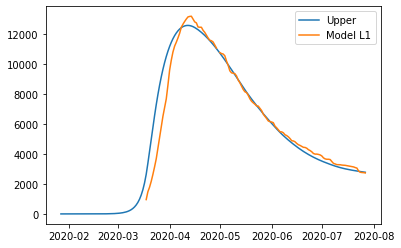

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3561754353920497, 'other': 0.2877738679151193, 'school': 0.25156379835098225, 'transport': 0.1225050325639628, 'work': 0.47162095796474507}
{'home': 1.0, 'leisure': 0.37471765556156833, 'other': 0.3355753839953494, 'school': 0.2801479263299853, 'transport': 0.14747420754462431, 'work': 0.5756919198413559}
{'home': 1.0, 'leisure': 0.39259765358217563, 'other': 0.38166970307271414, 'school': 0.30771119259545254, 'transport': 0.1715516262759765, 'work': 0.6760460616509449}
{'home': 1.0, 'leisure': 0.407166540858226, 'other': 0.4192280371357521, 'school': 0.3301701502932407, 'transport': 0.19117026376078197, 'work': 0.7578161031254249}
{'home': 1.0, 'leisure': 0.4157754287940739, 'other': 0.4414215981730018, 'school': 0.3434413525692065, 'transport': 0.2027630950018034, 'work': 0.8061347639967086}
{'home': 1.0, 'leisure': 0.4204109838364536, 'other': 0.45337197719305933, 'sc

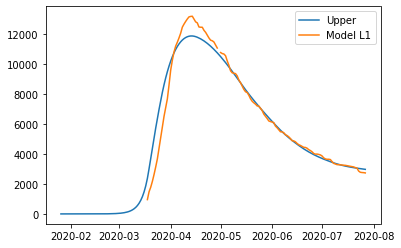

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.16544151954802105, 'other': 0.23147900393070825, 'school': 0.3375948847080285, 'transport': 0.2046607178063638, 'work': 0.4503052248680274}
{'home': 1.0, 'leisure': 0.186047392941584, 'other': 0.26323137072510416, 'school': 0.38386511922901667, 'transport': 0.2151786700747249, 'work': 0.5600188495558592}
{'home': 1.0, 'leisure': 0.20591734228537684, 'other': 0.29384972441970025, 'school': 0.4284828453742553, 'transport': 0.22532098119064453, 'work': 0.66581413050484}
{'home': 1.0, 'leisure': 0.22210767138031917, 'other': 0.31879801261529706, 'school': 0.46483802964074605, 'transport': 0.23358508654435683, 'work': 0.752017692759565}
{'home': 1.0, 'leisure': 0.23167468402733057, 'other': 0.33354018291269516, 'school': 0.4863206385254906, 'transport': 0.23846842152609596, 'work': 0.8029561613646299}
{'home': 1.0, 'leisure': 0.2368261523757213, 'other': 0.3414782746112941, '

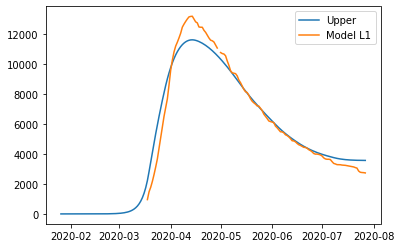

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24149435524951698, 'other': 0.13977105656953293, 'school': 0.24603593840260027, 'transport': 0.16511038200296682, 'work': 0.41995657336533393}
{'home': 1.0, 'leisure': 0.2903095532488267, 'other': 0.1667040728363246, 'school': 0.28667283762757506, 'transport': 0.1717564027025717, 'work': 0.5424929024811095}
{'home': 1.0, 'leisure': 0.3373813513195897, 'other': 0.19267519566501662, 'school': 0.32585841902308643, 'transport': 0.17816506552004785, 'work': 0.6606529341284645}
{'home': 1.0, 'leisure': 0.37573614974761876, 'other': 0.2138368513032101, 'school': 0.35778741127128094, 'transport': 0.18338693892688024, 'work': 0.7569314784337167}
{'home': 1.0, 'leisure': 0.3984003488187269, 'other': 0.22634146599850624, 'school': 0.37665454305430496, 'transport': 0.18647259139455394, 'work': 0.8138233455231839}
{'home': 1.0, 'leisure': 0.4106041483185543, 'other': 0.23307472006520

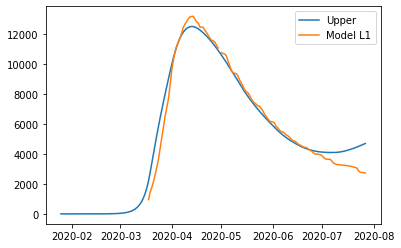

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.4279461349126815, 'other': 0.11783400392038107, 'school': 0.3012768028066257, 'transport': 0.3607054485335143, 'work': 0.4474992842454057}
{'home': 1.0, 'leisure': 0.4971025062392925, 'other': 0.1318800575024363, 'school': 0.3457421571823585, 'transport': 0.4034068983257715, 'work': 0.5816942185225336}
{'home': 1.0, 'leisure': 0.5637890071613816, 'other': 0.14542446631370382, 'school': 0.3886194631875294, 'transport': 0.4445832963397337, 'work': 0.7110964765754781}
{'home': 1.0, 'leisure': 0.6181261560608616, 'other': 0.15646065127103292, 'school': 0.42355652733989085, 'transport': 0.4781344354622215, 'work': 0.8165353535075071}
{'home': 1.0, 'leisure': 0.6502344713196453, 'other': 0.16298203329127287, 'school': 0.44420115615719535, 'transport': 0.4979601085800552, 'work': 0.8788401444218878}
{'home': 1.0, 'leisure': 0.6675235641512981, 'other': 0.16649354668678668, 'sch

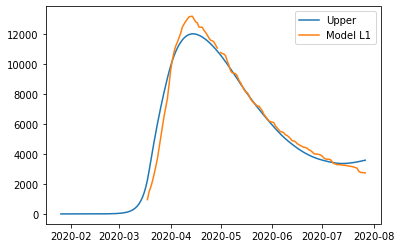

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.30581324352301564, 'other': 0.3047972190708816, 'school': 0.2089993297732226, 'transport': 0.3749979875986572, 'work': 0.4912908088394551}
{'home': 1.0, 'leisure': 0.3612214561694375, 'other': 0.3703364323869197, 'school': 0.23019108071372024, 'transport': 0.41994229557982754, 'work': 0.6096229026454014}
{'home': 1.0, 'leisure': 0.4146508040784872, 'other': 0.43353495951309945, 'school': 0.250625983406343, 'transport': 0.4632814497045275, 'work': 0.7237288502439926}
{'home': 1.0, 'leisure': 0.45818582830067583, 'other': 0.48503005568998664, 'school': 0.26727664485959113, 'transport': 0.49859483454687564, 'work': 0.8167040668058076}
{'home': 1.0, 'leisure': 0.48391106988651456, 'other': 0.5154589761581472, 'school': 0.2771156720819651, 'transport': 0.5194618346809905, 'work': 0.8716439675014256}
{'home': 1.0, 'leisure': 0.49776312304812004, 'other': 0.5318437794871567, 's

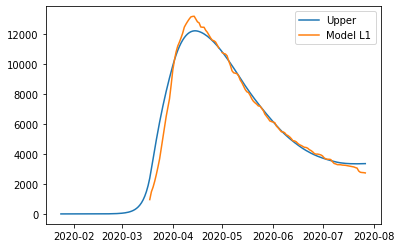

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26056736162183536, 'other': 0.19540308166951884, 'school': 0.2702738877588552, 'transport': 0.3049425669749094, 'work': 0.41662759315618075}
{'home': 1.0, 'leisure': 0.3084596168442713, 'other': 0.24827114025296296, 'school': 0.3143457103901999, 'transport': 0.34059288866071424, 'work': 0.5435562391116171}
{'home': 1.0, 'leisure': 0.3546414343801917, 'other': 0.29925105388699835, 'school': 0.3568435393561393, 'transport': 0.374969984572026, 'work': 0.6659517191400736}
{'home': 1.0, 'leisure': 0.3922710634835342, 'other': 0.34079024277399017, 'school': 0.391471399995053, 'transport': 0.40298095161087266, 'work': 0.7656813695336306}
{'home': 1.0, 'leisure': 0.41450675340823656, 'other': 0.3653361271163035, 'school': 0.4119333176453201, 'transport': 0.419532886679282, 'work': 0.8246125265843689}
{'home': 1.0, 'leisure': 0.42647981721384554, 'other': 0.37855314176216454, 'sc

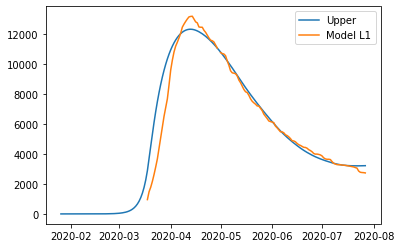

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.19485846981102845, 'other': 0.2052653680038555, 'school': 0.18862370958451824, 'transport': 0.22098578655451123, 'work': 0.3330059106438511}
{'home': 1.0, 'leisure': 0.24125498441341842, 'other': 0.2720236314883575, 'school': 0.24339832120929134, 'transport': 0.2599541839749483, 'work': 0.47716385219388346}
{'home': 1.0, 'leisure': 0.28599448063715155, 'other': 0.3363976712769844, 'school': 0.2962166967046082, 'transport': 0.29753085291608394, 'work': 0.6161732958314146}
{'home': 1.0, 'leisure': 0.3224488849676008, 'other': 0.388850592586236, 'school': 0.33925389155264424, 'transport': 0.32814887946071314, 'work': 0.7294402499064401}
{'home': 1.0, 'leisure': 0.343990123890139, 'other': 0.4198455006326119, 'school': 0.3646849612355746, 'transport': 0.3462413496916303, 'work': 0.796370722768955}
{'home': 1.0, 'leisure': 0.3555892525407365, 'other': 0.43653506650373736, 'sc

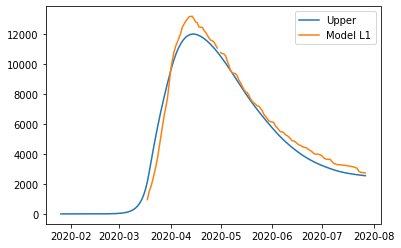

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.25532766297287873, 'other': 0.13951819772654667, 'school': 0.09185470936801517, 'transport': 0.17063943002349657, 'work': 0.32116058317287854}
{'home': 1.0, 'leisure': 0.2984194422343209, 'other': 0.18410049418676872, 'school': 0.09601420396940946, 'transport': 0.17663287525105015, 'work': 0.4566567278206585}
{'home': 1.0, 'leisure': 0.33997222937928295, 'other': 0.22709056577341138, 'school': 0.10002514519218253, 'transport': 0.18241226886333395, 'work': 0.5873137244453035}
{'home': 1.0, 'leisure': 0.3738300559418446, 'other': 0.2621195129921573, 'school': 0.10329331952184947, 'transport': 0.18712140439926891, 'work': 0.6937749809542735}
{'home': 1.0, 'leisure': 0.3938369534560856, 'other': 0.282818436348689, 'school': 0.10522451344392539, 'transport': 0.18990407539777593, 'work': 0.7566839052550285}
{'home': 1.0, 'leisure': 0.40460989827144617, 'other': 0.2939640104637

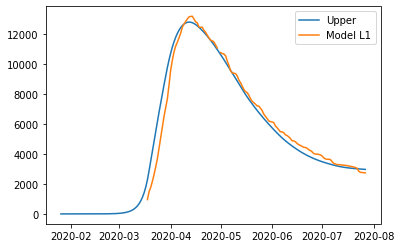

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.20127666899390445, 'other': 0.2525122712233535, 'school': 0.34760487846360516, 'transport': 0.30177364723007305, 'work': 0.47154291469071397}
{'home': 1.0, 'leisure': 0.21320538075539616, 'other': 0.298832654943021, 'school': 0.4146502696997041, 'transport': 0.32244027546623283, 'work': 0.5849427444673456}
{'home': 1.0, 'leisure': 0.22470806709683455, 'other': 0.343498739244129, 'school': 0.4793011826773709, 'transport': 0.3423688098368155, 'work': 0.6942925803233833}
{'home': 1.0, 'leisure': 0.2340806263380066, 'other': 0.3798933264524392, 'school': 0.5319797043628772, 'transport': 0.3586068748795125, 'work': 0.783392446576451}
{'home': 1.0, 'leisure': 0.23961895679869918, 'other': 0.4013992188937134, 'school': 0.5631079217224946, 'transport': 0.36820209513201524, 'work': 0.8360423675441728}
{'home': 1.0, 'leisure': 0.2426011347390721, 'other': 0.41297931482363026, 'sch

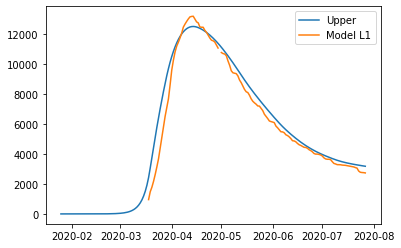

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.22429737272910635, 'other': 0.2524757151417546, 'school': 0.18720614976088723, 'transport': 0.23931260895473436, 'work': 0.4405480672362769}
{'home': 1.0, 'leisure': 0.24955506358184243, 'other': 0.3081778677324098, 'school': 0.20353249053059302, 'transport': 0.27229924728853133, 'work': 0.5488412445676484}
{'home': 1.0, 'leisure': 0.2739106940469808, 'other': 0.3618906577305417, 'school': 0.21927574770138075, 'transport': 0.3041077913961213, 'work': 0.6532668084228995}
{'home': 1.0, 'leisure': 0.2937560225741306, 'other': 0.40565663476605657, 'school': 0.23210358687757815, 'transport': 0.3300258643726761, 'work': 0.7383543048975486}
{'home': 1.0, 'leisure': 0.3054828076129009, 'other': 0.43151834846886084, 'school': 0.239683673663513, 'transport': 0.3453410893133676, 'work': 0.788633280087114}
{'home': 1.0, 'leisure': 0.3117972303260849, 'other': 0.44544388661652456, 's

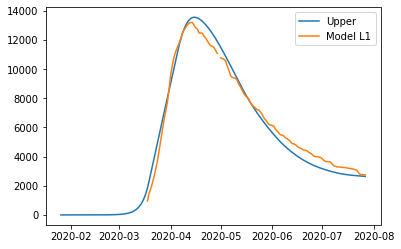

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.15053789435825074, 'other': 0.24755719933486303, 'school': 0.28735589758358804, 'transport': 0.37674816790500865, 'work': 0.45145540800061945}
{'home': 1.0, 'leisure': 0.15583832123614783, 'other': 0.30929551056512117, 'school': 0.3636532357062367, 'transport': 0.4119642188100876, 'work': 0.5794787812411077}
{'home': 1.0, 'leisure': 0.16094944715412002, 'other': 0.36882888210858444, 'school': 0.4372256688959336, 'transport': 0.44592255361141375, 'work': 0.7029298911515787}
{'home': 1.0, 'leisure': 0.16511406827246772, 'other': 0.41733755521807303, 'school': 0.49717357742087187, 'transport': 0.4735923078939759, 'work': 0.8035196844119624}
{'home': 1.0, 'leisure': 0.16757498075149135, 'other': 0.4460017711464072, 'school': 0.5325973415492445, 'transport': 0.48994261724276256, 'work': 0.8629591077021892}
{'home': 1.0, 'leisure': 0.16890008747096563, 'other': 0.4614363489539

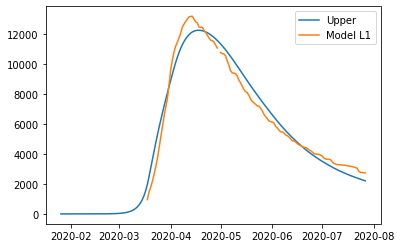

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26513497034438904, 'other': 0.1971134282048949, 'school': 0.16319966334994082, 'transport': 0.20291846196366184, 'work': 0.3712318143222879}
{'home': 1.0, 'leisure': 0.28419231396197486, 'other': 0.2350931556936233, 'school': 0.19816910466676055, 'transport': 0.24030816733673577, 'work': 0.4628381208326683}
{'home': 1.0, 'leisure': 0.302569038164647, 'other': 0.2717164643434685, 'school': 0.23188963736512241, 'transport': 0.27636252608934275, 'work': 0.5511727735391065}
{'home': 1.0, 'leisure': 0.3175426652927501, 'other': 0.301557678798898, 'school': 0.25936562697119503, 'transport': 0.30574015173961516, 'work': 0.623149157225834}
{'home': 1.0, 'leisure': 0.32639071768662925, 'other': 0.319191123704379, 'school': 0.27560143901114703, 'transport': 0.32309965780568517, 'work': 0.665680656677082}
{'home': 1.0, 'leisure': 0.3311550535910257, 'other': 0.32868605557656116, 's

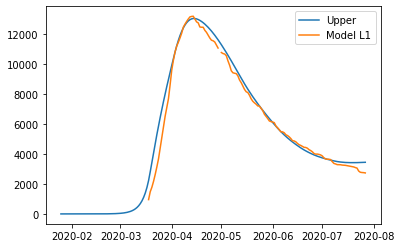

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.25749837978135026, 'other': 0.211684465295983, 'school': 0.2675554674342997, 'transport': 0.33633829362035894, 'work': 0.4274746814662896}
{'home': 1.0, 'leisure': 0.3119703398842082, 'other': 0.25606462543397474, 'school': 0.3044989006758838, 'transport': 0.37002341969340596, 'work': 0.5571445439421568}
{'home': 1.0, 'leisure': 0.3644968728405355, 'other': 0.29885977985275247, 'school': 0.3401229255874113, 'transport': 0.40250550554955844, 'work': 0.6821833399010289}
{'home': 1.0, 'leisure': 0.40729627006420954, 'other': 0.33372990567546024, 'school': 0.36914990884865595, 'transport': 0.42897239032123824, 'work': 0.7840668032749245}
{'home': 1.0, 'leisure': 0.4325868229691079, 'other': 0.35433498002524216, 'school': 0.3863022171393914, 'transport': 0.4446119131408672, 'work': 0.8442706679958629}
{'home': 1.0, 'leisure': 0.44620481299482234, 'other': 0.36543002005974007,

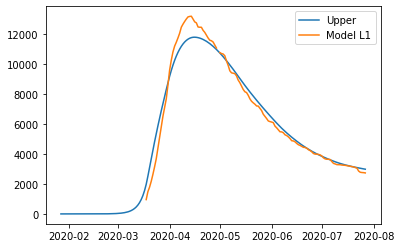

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.255245670379448, 'other': 0.2120057401069235, 'school': 0.30987754548489155, 'transport': 0.3508894902844548, 'work': 0.3993180788607804}
{'home': 1.0, 'leisure': 0.2816715290744365, 'other': 0.24953035579652127, 'school': 0.37344133478370894, 'transport': 0.3764351428579091, 'work': 0.5098007991190062}
{'home': 1.0, 'leisure': 0.3071536071017468, 'other': 0.285714806640062, 'school': 0.43473498875042577, 'transport': 0.40106845069659713, 'work': 0.6163377079394383}
{'home': 1.0, 'leisure': 0.3279167817906663, 'other': 0.3151984332533174, 'school': 0.4846779660566395, 'transport': 0.42114003486145407, 'work': 0.7031455595709014}
{'home': 1.0, 'leisure': 0.3401859304704823, 'other': 0.3326205762520592, 'school': 0.5141897253739476, 'transport': 0.43300051641341497, 'work': 0.7544411082622205}
{'home': 1.0, 'leisure': 0.34679239514422944, 'other': 0.3420017301744587, 'scho

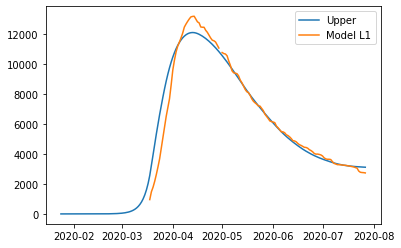

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2983642049493873, 'other': 0.3985371962490467, 'school': 0.3211553293570112, 'transport': 0.2506975713814149, 'work': 0.4601892690910124}
{'home': 1.0, 'leisure': 0.3408336944886795, 'other': 0.47812810984012133, 'school': 0.36477617277639507, 'transport': 0.2735571852127988, 'work': 0.559150582994562}
{'home': 1.0, 'leisure': 0.3817864165444255, 'other': 0.5548764908029431, 'school': 0.406839128930801, 'transport': 0.2956003842644904, 'work': 0.6545775642586991}
{'home': 1.0, 'leisure': 0.4151553011824408, 'other': 0.6174122086245017, 'school': 0.4411126487603169, 'transport': 0.31356150941772065, 'work': 0.7323328823257738}
{'home': 1.0, 'leisure': 0.4348732784685408, 'other': 0.6543651327917865, 'school': 0.4613651832050309, 'transport': 0.32417490155372036, 'work': 0.7782792066381361}
{'home': 1.0, 'leisure': 0.4454906508533638, 'other': 0.6742628611895551, 'school':

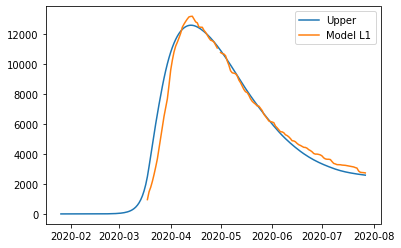

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.34250588886901906, 'other': 0.21661934173595, 'school': 0.2020558570709649, 'transport': 0.2312483849781194, 'work': 0.416933244834987}
{'home': 1.0, 'leisure': 0.397497166138714, 'other': 0.2708701822221873, 'school': 0.2179589454990702, 'transport': 0.2484403185501991, 'work': 0.5311439444873942}
{'home': 1.0, 'leisure': 0.4505244692202055, 'other': 0.32318349269105895, 'school': 0.23329406648331455, 'transport': 0.2650182544947045, 'work': 0.6412756905807868}
{'home': 1.0, 'leisure': 0.49373190136068007, 'other': 0.3658091530731025, 'school': 0.24578935024825438, 'transport': 0.2785262023013385, 'work': 0.7310126688791067}
{'home': 1.0, 'leisure': 0.5192635658073241, 'other': 0.3909970432988555, 'school': 0.2531729270184461, 'transport': 0.28650817145980406, 'work': 0.7840390651462956}
{'home': 1.0, 'leisure': 0.5330113851247478, 'other': 0.40455975342041484, 'school'

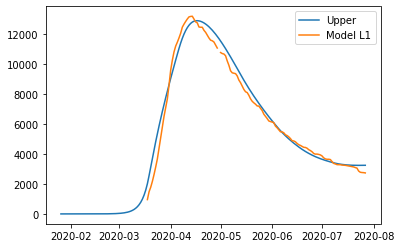

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.27139983124519745, 'other': 0.21607127871738754, 'school': 0.39541943259228174, 'transport': 0.2628855109399151, 'work': 0.4157794440783055}
{'home': 1.0, 'leisure': 0.3065454137482791, 'other': 0.2769364159292631, 'school': 0.46523971651533974, 'transport': 0.27289372016553803, 'work': 0.5439147843440764}
{'home': 1.0, 'leisure': 0.3404357968762507, 'other': 0.3356277982407146, 'school': 0.5325664188697172, 'transport': 0.28254449334738874, 'work': 0.6674738624574983}
{'home': 1.0, 'leisure': 0.36805018312867205, 'other': 0.38345040605004543, 'school': 0.5874252133806914, 'transport': 0.2904080863103782, 'work': 0.7681516298091755}
{'home': 1.0, 'leisure': 0.38436777500510283, 'other': 0.4117092197555591, 'school': 0.6198417737735398, 'transport': 0.2950547548794174, 'work': 0.8276430377897119}
{'home': 1.0, 'leisure': 0.3931541706308732, 'other': 0.42692550405852797, '

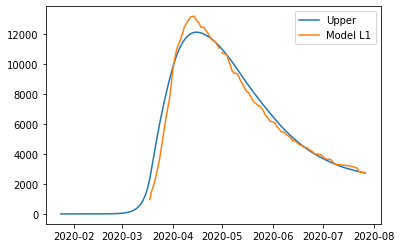

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24578481390396473, 'other': 0.21694877474668928, 'school': 0.18771474958889992, 'transport': 0.3354494553234855, 'work': 0.4540175231096879}
{'home': 1.0, 'leisure': 0.2701641015913505, 'other': 0.24441401415043945, 'school': 0.22037695675563074, 'transport': 0.3628724315972146, 'work': 0.557066124342337}
{'home': 1.0, 'leisure': 0.29367270043275817, 'other': 0.2708983521469128, 'school': 0.25187265652354973, 'transport': 0.38931601586116765, 'work': 0.6564344183881059}
{'home': 1.0, 'leisure': 0.31282785504427557, 'other': 0.2924781831070022, 'school': 0.27753581929740967, 'transport': 0.4108626400762405, 'work': 0.737401176499473}
{'home': 1.0, 'leisure': 0.3241468100419904, 'other': 0.3052299014016005, 'school': 0.29270041548196335, 'transport': 0.423594736203329, 'work': 0.7852451699289174}
{'home': 1.0, 'leisure': 0.3302416319638368, 'other': 0.312096211252538, 'sch

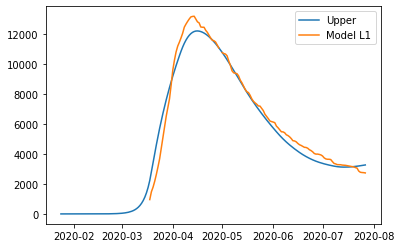

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3740534267116149, 'other': 0.3843824319763531, 'school': 0.14459276342422495, 'transport': 0.442478931538386, 'work': 0.4912908088394551}
{'home': 1.0, 'leisure': 0.4261542705853443, 'other': 0.4659886188517214, 'school': 0.16451955864874346, 'transport': 0.48830089608585814, 'work': 0.6025595477171608}
{'home': 1.0, 'leisure': 0.4763943700350118, 'other': 0.5446802990529693, 'school': 0.18373468261524342, 'transport': 0.532486361899492, 'work': 0.7098544030635198}
{'home': 1.0, 'leisure': 0.5173307473643705, 'other': 0.6087994458836157, 'school': 0.1993914502916508, 'transport': 0.5684893340439343, 'work': 0.7972798407531456}
{'home': 1.0, 'leisure': 0.5415204248771734, 'other': 0.6466880326471796, 'school': 0.20864317664589155, 'transport': 0.5897638175838322, 'work': 0.8489403266606519}
{'home': 1.0, 'leisure': 0.5545456358456058, 'other': 0.6670895793660216, 'school'

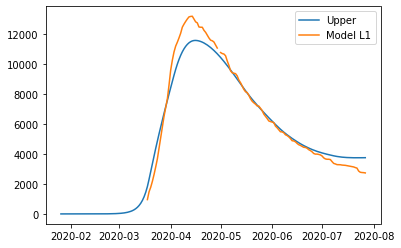

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3345009518589358, 'other': 0.19607046770183081, 'school': 0.30690232069642126, 'transport': 0.36622322038651367, 'work': 0.4641973676459814}
{'home': 1.0, 'leisure': 0.3896674271289262, 'other': 0.22959096276539295, 'school': 0.349700165578686, 'transport': 0.3840542405555938, 'work': 0.5785499521421066}
{'home': 1.0, 'leisure': 0.44286367113927405, 'other': 0.2619142972909707, 'school': 0.3909695160008699, 'transport': 0.40124843857577824, 'work': 0.6888185157633702}
{'home': 1.0, 'leisure': 0.4862087588514093, 'other': 0.2882518291266266, 'school': 0.42459639412264927, 'transport': 0.41525852585148404, 'work': 0.7786669750103256}
{'home': 1.0, 'leisure': 0.511821765226762, 'other': 0.30381491612042333, 'school': 0.44446682210370075, 'transport': 0.4235372137871284, 'work': 0.8317592463835266}
{'home': 1.0, 'leisure': 0.5256133840442596, 'other': 0.31219503988631386, 's

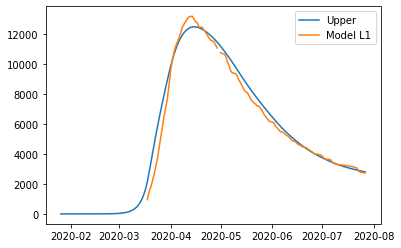

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.1469380626204398, 'other': 0.3034817377715257, 'school': 0.30414989925422314, 'transport': 0.18521208315053286, 'work': 0.3652946018619769}
{'home': 1.0, 'leisure': 0.16243822176182465, 'other': 0.35787396508878744, 'school': 0.37875109516637595, 'transport': 0.19614262200290392, 'work': 0.4700287569142911}
{'home': 1.0, 'leisure': 0.17738480379101715, 'other': 0.41032361285900415, 'school': 0.4506879626530947, 'transport': 0.20668278446769028, 'work': 0.5710224064290226}
{'home': 1.0, 'leisure': 0.1895635002592481, 'other': 0.45306036289399554, 'school': 0.5093031880126433, 'transport': 0.21527106499455326, 'work': 0.6533135282558409}
{'home': 1.0, 'leisure': 0.1967600027177482, 'other': 0.4783138970055814, 'school': 0.5439394575432857, 'transport': 0.2203459580331541, 'work': 0.7019401002444154}
{'home': 1.0, 'leisure': 0.20063504250309439, 'other': 0.4919119538348968,

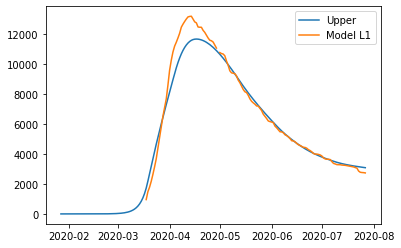

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2520768988004319, 'other': 0.24629984018036574, 'school': 0.24538472640348988, 'transport': 0.19824795158400282, 'work': 0.41007233912066315}
{'home': 1.0, 'leisure': 0.2747753367278138, 'other': 0.3022469089627137, 'school': 0.2812040062385128, 'transport': 0.2268723336623202, 'work': 0.5221354050268974}
{'home': 1.0, 'leisure': 0.2966631161577892, 'other': 0.35619586814569215, 'school': 0.31574402607942786, 'transport': 0.25447441638069773, 'work': 0.6301962185793376}
{'home': 1.0, 'leisure': 0.31449760310073216, 'other': 0.4001542793318227, 'school': 0.34388774594980304, 'transport': 0.2769650022993757, 'work': 0.7182457703628073}
{'home': 1.0, 'leisure': 0.3250361635670166, 'other': 0.42612970412362705, 'school': 0.36051812587320653, 'transport': 0.2902548939785945, 'work': 0.7702750509621303}
{'home': 1.0, 'leisure': 0.33071077304886204, 'other': 0.44011647131921405

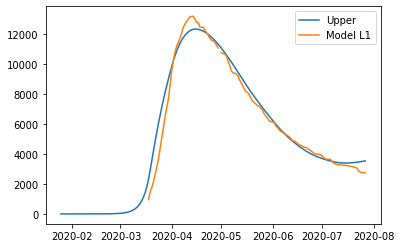

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3005226345967189, 'other': 0.23672606394555595, 'school': 0.16220752368967678, 'transport': 0.2573360789906615, 'work': 0.40405052200179403}
{'home': 1.0, 'leisure': 0.3575925150607664, 'other': 0.2824271229244903, 'school': 0.1713887504736109, 'transport': 0.30578092785824923, 'work': 0.5415592222181081}
{'home': 1.0, 'leisure': 0.4126241855082408, 'other': 0.3264960012256055, 'school': 0.18024207630097597, 'transport': 0.3524956035519945, 'work': 0.6741568974266967}
{'home': 1.0, 'leisure': 0.4574648058728496, 'other': 0.36240397613762537, 'school': 0.18745589734549564, 'transport': 0.3905594133765277, 'work': 0.7821994475966578}
{'home': 1.0, 'leisure': 0.4839615360883003, 'other': 0.3836223249492735, 'school': 0.19171860978089364, 'transport': 0.4130516646364792, 'work': 0.8460427726970894}
{'home': 1.0, 'leisure': 0.4982290062043122, 'other': 0.3950475896940071, 'sc

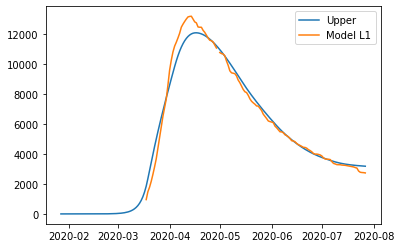

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.34904194381840903, 'other': 0.1722687036224821, 'school': 0.2046756146905632, 'transport': 0.17634258935139746, 'work': 0.39294899269647077}
{'home': 1.0, 'leisure': 0.39786335226763914, 'other': 0.2151484452315471, 'school': 0.24580101546857155, 'transport': 0.18896811458553964, 'work': 0.516118037129648}
{'home': 1.0, 'leisure': 0.4449411389865396, 'other': 0.25649676749743117, 'school': 0.2854576519330796, 'transport': 0.2011427282041767, 'work': 0.634888187118783}
{'home': 1.0, 'leisure': 0.48330081705379185, 'other': 0.29018799304741083, 'school': 0.3177704668300862, 'transport': 0.21106278374528842, 'work': 0.7316638648877081}
{'home': 1.0, 'leisure': 0.5059678995480772, 'other': 0.3100964445087624, 'school': 0.33686440290559005, 'transport': 0.2169246347468544, 'work': 0.7888494926602545}
{'home': 1.0, 'leisure': 0.5181732516603847, 'other': 0.3208163799110287, 's

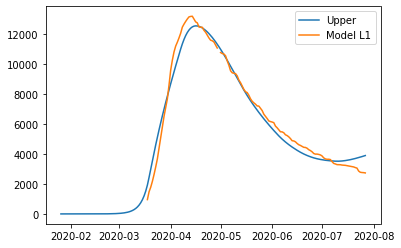

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.17406422568398386, 'other': 0.27021304295831894, 'school': 0.15401482134080452, 'transport': 0.34365724616475507, 'work': 0.35112929888360483}
{'home': 1.0, 'leisure': 0.19330647818670615, 'other': 0.35072501892636526, 'school': 0.17910853353043452, 'transport': 0.3796496925624812, 'work': 0.5082529397905187}
{'home': 1.0, 'leisure': 0.2118615073857598, 'other': 0.42836156718126706, 'school': 0.20330604171329203, 'transport': 0.41435669444600287, 'work': 0.6597650220936142}
{'home': 1.0, 'leisure': 0.22698042006647018, 'other': 0.4916209768704463, 'school': 0.22302252986228704, 'transport': 0.44263647375850196, 'work': 0.783219311377618}
{'home': 1.0, 'leisure': 0.23591432301416265, 'other': 0.5290015371413249, 'school': 0.23467318195032955, 'transport': 0.4593472524431605, 'work': 0.8561695732272565}
{'home': 1.0, 'leisure': 0.24072488613984325, 'other': 0.5491295311333

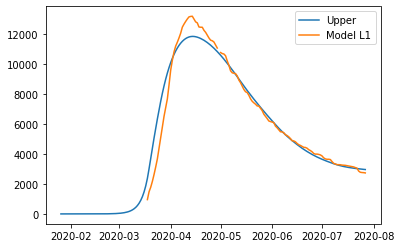

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23783034997594385, 'other': 0.3171592750952999, 'school': 0.4010408409495646, 'transport': 0.32982562050836084, 'work': 0.4503052248680274}
{'home': 1.0, 'leisure': 0.26941495889608247, 'other': 0.3700426157923253, 'school': 0.46276922573537493, 'transport': 0.37083909981210217, 'work': 0.5600188495558592}
{'home': 1.0, 'leisure': 0.2998715460690733, 'other': 0.42103726575017114, 'school': 0.5222930253502635, 'transport': 0.4103878119978528, 'work': 0.66581413050484}
{'home': 1.0, 'leisure': 0.32468802450632506, 'other': 0.4625884620121196, 'school': 0.570793899110543, 'transport': 0.44261268859364955, 'work': 0.752017692759565}
{'home': 1.0, 'leisure': 0.3393523072192466, 'other': 0.4871414416214529, 'school': 0.5994535063325264, 'transport': 0.4616546611275295, 'work': 0.8029561613646299}
{'home': 1.0, 'leisure': 0.3472484594492813, 'other': 0.5003622767957092, 'school

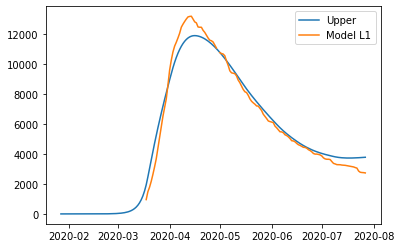

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.35780714873159736, 'other': 0.3987875591145996, 'school': 0.36779758920618466, 'transport': 0.2163345769738923, 'work': 0.45286366670047745}
{'home': 1.0, 'leisure': 0.40401812894434963, 'other': 0.4807140227373172, 'school': 0.4253201362530323, 'transport': 0.21714687905340357, 'work': 0.5575045220451708}
{'home': 1.0, 'leisure': 0.4485787170066464, 'other': 0.5597145412306521, 'school': 0.48078830661963534, 'transport': 0.2179301703443609, 'work': 0.6584082039846965}
{'home': 1.0, 'leisure': 0.484887344316666, 'other': 0.624085334077073, 'school': 0.5259845935850156, 'transport': 0.21856840769254834, 'work': 0.740626018898384}
{'home': 1.0, 'leisure': 0.5063424422725867, 'other': 0.6621226207590492, 'school': 0.5526914904281948, 'transport': 0.21894554794375004, 'work': 0.7892092731655631}
{'home': 1.0, 'leisure': 0.5178951873257748, 'other': 0.6826042366647285, 'schoo

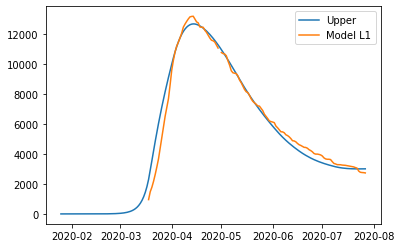

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3770403619940091, 'other': 0.24387993145288686, 'school': 0.13552601512003232, 'transport': 0.20570387445709992, 'work': 0.4652566835123243}
{'home': 1.0, 'leisure': 0.4259987274775763, 'other': 0.29781570058352147, 'school': 0.15713998066800935, 'transport': 0.21623619145099332, 'work': 0.5824614188625113}
{'home': 1.0, 'leisure': 0.4732085799081589, 'other': 0.34982519224520486, 'school': 0.17798201887498719, 'transport': 0.2263923542665334, 'work': 0.6954802708073347}
{'home': 1.0, 'leisure': 0.5116758670738188, 'other': 0.39220329656213204, 'school': 0.19496442037696915, 'transport': 0.2346677461903068, 'work': 0.7875697057253388}
{'home': 1.0, 'leisure': 0.5344065367626178, 'other': 0.4172449036584981, 'school': 0.20499947580995848, 'transport': 0.23955775050890016, 'work': 0.8419861899950685}
{'home': 1.0, 'leisure': 0.5466461281335097, 'other': 0.43072884594115673

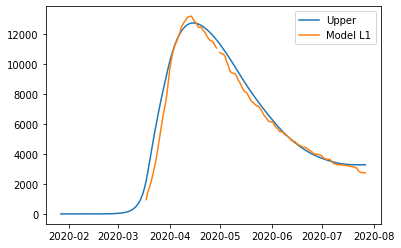

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24925023081330078, 'other': 0.14492530333952802, 'school': 0.3042972968182881, 'transport': 0.24913320905347877, 'work': 0.34241068404336406}
{'home': 1.0, 'leisure': 0.2912040035108391, 'other': 0.18328627456612812, 'school': 0.37556397449746926, 'transport': 0.30296282640432437, 'work': 0.48548537889993115}
{'home': 1.0, 'leisure': 0.33165942718346536, 'other': 0.22027721110606394, 'school': 0.4442854136881083, 'transport': 0.3548699574212113, 'work': 0.6234502632259067}
{'home': 1.0, 'leisure': 0.3646231057315311, 'other': 0.2504179742126783, 'school': 0.5002806604360364, 'transport': 0.3971646567683043, 'work': 0.7358660948989236}
{'home': 1.0, 'leisure': 0.3841016430553882, 'other': 0.26822842513931405, 'school': 0.5333687607870847, 'transport': 0.42215697910976835, 'work': 0.8022936317966155}
{'home': 1.0, 'leisure': 0.39459008622977276, 'other': 0.2778186679459640

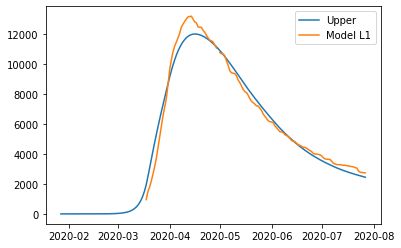

0.5666782315035038 0.8385765587267721 -0.4052547902302759
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.20515426285013016, 'other': 0.11848125695302068, 'school': 0.25951130431944813, 'transport': 0.3032232389812707, 'work': 0.3670781685347051}
{'home': 1.0, 'leisure': 0.24162221512167115, 'other': 0.1333179142545381, 'school': 0.30778841419264646, 'transport': 0.34684179135939175, 'work': 0.46946166583849736}
{'home': 1.0, 'leisure': 0.27678774052637134, 'other': 0.14762469093814418, 'school': 0.35434134157037345, 'transport': 0.3889025382954371, 'work': 0.5681886096671541}
{'home': 1.0, 'leisure': 0.3054411315968678, 'other': 0.15928206453219357, 'school': 0.3922733564707436, 'transport': 0.4231742580211036, 'work': 0.6486327861201338}
{'home': 1.0, 'leisure': 0.32237268086579757, 'other': 0.16617051256504092, 'school': 0.4146877289118714, 'transport': 0.4434257287680884, 'work': 0.6961679812968944}
{'home': 1.0, 

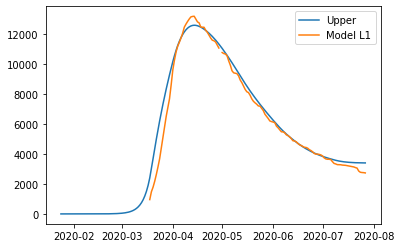

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2642371619628733, 'other': 0.28726982707844906, 'school': 0.20845235346385627, 'transport': 0.3058762529789661, 'work': 0.4165524997557361}
{'home': 1.0, 'leisure': 0.32388628100757133, 'other': 0.34885182141133536, 'school': 0.2529035642432226, 'transport': 0.3490372989881162, 'work': 0.5340556767108569}
{'home': 1.0, 'leisure': 0.3814050743721015, 'other': 0.4082344588037614, 'school': 0.2957672317804686, 'transport': 0.3906568790683681, 'work': 0.6473623116318661}
{'home': 1.0, 'leisure': 0.4282722393357929, 'other': 0.4566203114938865, 'school': 0.3306931831071136, 'transport': 0.42456912950412895, 'work': 0.7396862363823182}
{'home': 1.0, 'leisure': 0.45596647317797406, 'other': 0.4852119517198693, 'school': 0.3513312452546764, 'transport': 0.4446081865798058, 'work': 0.794241282825767}
{'home': 1.0, 'leisure': 0.47087875293914855, 'other': 0.5006074503030908, 'scho

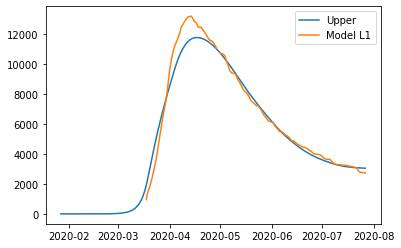

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2651212844654962, 'other': 0.21616502749504016, 'school': 0.24295954268913586, 'transport': 0.28205388447181734, 'work': 0.41995657336533393}
{'home': 1.0, 'leisure': 0.313936482464806, 'other': 0.2594422423073266, 'school': 0.2826988009161032, 'transport': 0.3228220702125409, 'work': 0.5424929024811095}
{'home': 1.0, 'leisure': 0.36100828053556894, 'other': 0.3011738423048886, 'school': 0.3210187999206789, 'transport': 0.36213424931966715, 'work': 0.6606529341284645}
{'home': 1.0, 'leisure': 0.399363078963598, 'other': 0.33517736822882793, 'school': 0.3522425028132961, 'transport': 0.39416639525880703, 'work': 0.7569314784337167}
{'home': 1.0, 'leisure': 0.42202727803470613, 'other': 0.35527036082024666, 'school': 0.3706928727043881, 'transport': 0.41309448149557154, 'work': 0.8138233455231839}
{'home': 1.0, 'leisure': 0.43423107753453355, 'other': 0.36608966452331826, 

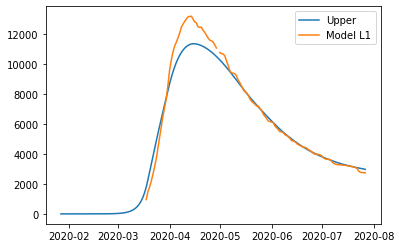

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.1333354649972577, 'other': 0.45437315538302137, 'school': 0.3542374482151917, 'transport': 0.25792567829653135, 'work': 0.4976831557478841}
{'home': 1.0, 'leisure': 0.15168077970368415, 'other': 0.5102353109998375, 'school': 0.3965783017982008, 'transport': 0.26595968871420905, 'work': 0.576443427827194}
{'home': 1.0, 'leisure': 0.16937090459916682, 'other': 0.5641023896303389, 'school': 0.4374069820389596, 'transport': 0.2737067701883983, 'work': 0.6523908330465287}
{'home': 1.0, 'leisure': 0.18378508043993044, 'other': 0.6079940833292659, 'school': 0.4706747955684668, 'transport': 0.2800192069451451, 'work': 0.7142739039659864}
{'home': 1.0, 'leisure': 0.1923025479821999, 'other': 0.6339300841513591, 'school': 0.49033304901772107, 'transport': 0.2837492832104955, 'work': 0.7508411731456661}
{'home': 1.0, 'leisure': 0.19688887665880647, 'other': 0.647895623055563, 'scho

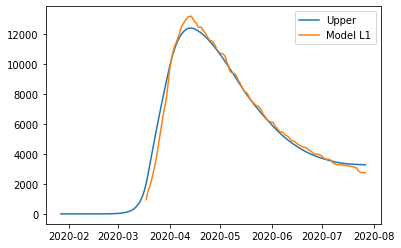

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24978762818250497, 'other': 0.2454204353970434, 'school': 0.24450293161191528, 'transport': 0.24733551498754988, 'work': 0.41669782825013224}
{'home': 1.0, 'leisure': 0.29263913842827877, 'other': 0.2946146523824811, 'school': 0.27815054242074233, 'transport': 0.2933603953236057, 'work': 0.5384995455931967}
{'home': 1.0, 'leisure': 0.3339602375938464, 'other': 0.34205193304701037, 'school': 0.31059645284353987, 'transport': 0.3377415299333738, 'work': 0.6559512016025804}
{'home': 1.0, 'leisure': 0.3676292813583829, 'other': 0.3807045321069971, 'school': 0.33703386133618973, 'transport': 0.3739039359117034, 'work': 0.7516525509435595}
{'home': 1.0, 'leisure': 0.38752462540106364, 'other': 0.4035447042788075, 'school': 0.35265596635457375, 'transport': 0.3952726303534436, 'work': 0.8082033482814109}
{'home': 1.0, 'leisure': 0.39823750296250704, 'other': 0.4158432585251669,

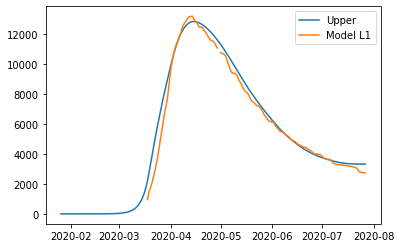

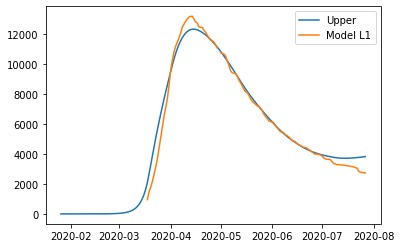

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.258476656514182, 'other': 0.22766195882485107, 'school': 0.2246476049953294, 'transport': 0.15003498696412348, 'work': 0.41481383254474496}
{'home': 1.0, 'leisure': 0.28282505249915413, 'other': 0.1403387819712842, 'school': 0.2898358307183628, 'transport': 0.3354103481999692, 'work': 0.4242540870361257}
{'home': 1.0, 'leisure': 0.32726440292237247, 'other': 0.16417511055855896, 'school': 0.3382127027913432, 'transport': 0.36683934647157124, 'work': 0.5521943594274226}
{'home': 1.0, 'leisure': 0.31516971424434786, 'other': 0.28028053594748314, 'school': 0.2670063122660754, 'transport': 0.19072503297727728, 'work': 0.5455363658499508}
{'home': 1.0, 'leisure': 0.37011663368761866, 'other': 0.1871601416962882, 'school': 0.3848618294331457, 'transport': 0.39714588051918753, 'work': 0.67

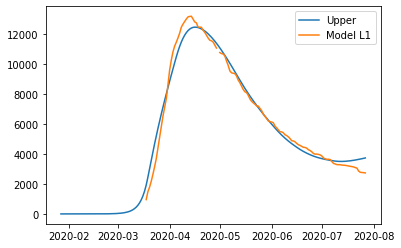

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26777789412635067, 'other': 0.2811594037261933, 'school': 0.2842971162888233, 'transport': 0.418957879495887, 'work': 0.44881083778384123}
{'home': 1.0, 'leisure': 0.29570200909645655, 'other': 0.34137652150097486, 'school': 0.3031788155184003, 'transport': 0.4786527934026101, 'work': 0.5803938261758482}
{'home': 1.0, 'leisure': 0.32262883424620153, 'other': 0.39944302792665715, 'school': 0.321386168346921, 'transport': 0.5362157460983787, 'work': 0.7072774221252836}
{'home': 1.0, 'leisure': 0.3445692102941419, 'other': 0.44675647760684273, 'school': 0.3362217891701601, 'transport': 0.5831188927393754, 'work': 0.8106640558618605}
{'home': 1.0, 'leisure': 0.3575339779588339, 'other': 0.4747144251451342, 'school': 0.3449882923838923, 'transport': 0.6108343884817826, 'work': 0.8717561576152923}
{'home': 1.0, 'leisure': 0.3645150067013604, 'other': 0.4897687045888296, 'schoo

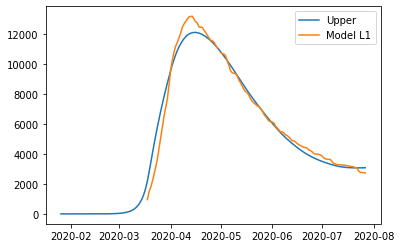

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2579544519494556, 'other': 0.24028843541674538, 'school': 0.23304703240125138, 'transport': 0.24229631018684827, 'work': 0.342377797160332}
{'home': 1.0, 'leisure': 0.30963342314602144, 'other': 0.3211446164929622, 'school': 0.2906744861274124, 'transport': 0.2985803980507944, 'work': 0.4809665222340354}
{'home': 1.0, 'leisure': 0.35946671679985276, 'other': 0.399113076816457, 'school': 0.34624381650621056, 'transport': 0.3528543399195996, 'work': 0.614605649983678}
{'home': 1.0, 'leisure': 0.4000716227400116, 'other': 0.46264293337634166, 'school': 0.3915225301481942, 'transport': 0.3970775518127001, 'work': 0.7234967911130163}
{'home': 1.0, 'leisure': 0.4240654307955601, 'other': 0.500183303161728, 'school': 0.41827813366391187, 'transport': 0.42320944974953223, 'work': 0.7878415563258072}
{'home': 1.0, 'leisure': 0.43698517359470157, 'other': 0.5203973484307822, 'scho

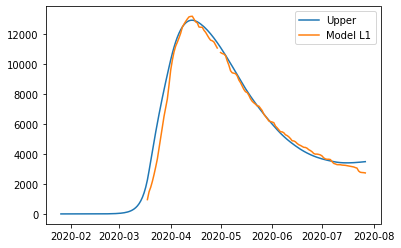

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.22185997979452088, 'other': 0.30864931441734456, 'school': 0.29041143689153526, 'transport': 0.3369466205256164, 'work': 0.41616206092386254}
{'home': 1.0, 'leisure': 0.2559389385173584, 'other': 0.3834074760695252, 'school': 0.33941164943084057, 'transport': 0.37472701133947395, 'work': 0.5428135286807685}
{'home': 1.0, 'leisure': 0.28880079157152305, 'other': 0.455495703376985, 'school': 0.3866618543794564, 'transport': 0.41115810248140794, 'work': 0.6649417297320706}
{'home': 1.0, 'leisure': 0.3155771162823239, 'other': 0.5142342589608411, 'school': 0.42516202137462483, 'transport': 0.44084269526372455, 'work': 0.7644535972553538}
{'home': 1.0, 'leisure': 0.3313994899750699, 'other': 0.5489434054422107, 'school': 0.44791212005358805, 'transport': 0.45838359099872983, 'work': 0.823256064428203}
{'home': 1.0, 'leisure': 0.33991922965577925, 'other': 0.5676329458552558, 

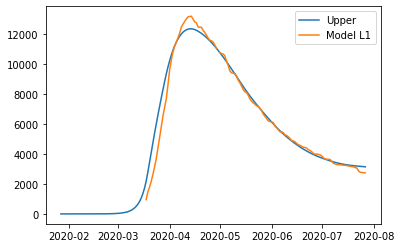

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2063254795634722, 'other': 0.1644192751679931, 'school': 0.32616097301546454, 'transport': 0.2893320798721766, 'work': 0.40405052200179403}
{'home': 1.0, 'leisure': 0.22888287644365896, 'other': 0.1927343887213015, 'school': 0.38554461141350616, 'transport': 0.3173016083457719, 'work': 0.5280636081644609}
{'home': 1.0, 'leisure': 0.25063465200669616, 'other': 0.22003824821913465, 'school': 0.44280740558304627, 'transport': 0.3442722250881674, 'work': 0.6476476555356039}
{'home': 1.0, 'leisure': 0.26835832098398577, 'other': 0.24228583743959126, 'school': 0.4894659786100789, 'transport': 0.3662482831745637, 'work': 0.7450865089491278}
{'home': 1.0, 'leisure': 0.2788313981069296, 'other': 0.25543214016077015, 'school': 0.5170369535805982, 'transport': 0.37923413568016157, 'work': 0.8026640132389373}
{'home': 1.0, 'leisure': 0.2844707473269763, 'other': 0.26251091854909725,

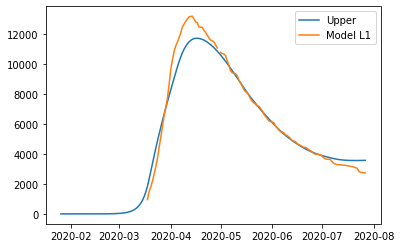

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.33838944335895615, 'other': 0.20868180311296097, 'school': 0.21200253790673965, 'transport': 0.23564300593103435, 'work': 0.4154829781512929}
{'home': 1.0, 'leisure': 0.3975486195221723, 'other': 0.25256521737650867, 'school': 0.2501476542017571, 'transport': 0.2504778291003211, 'work': 0.5381118874266582}
{'home': 1.0, 'leisure': 0.4545949679652736, 'other': 0.29488136684492966, 'school': 0.2869304449148097, 'transport': 0.2647828371564191, 'work': 0.6563611927993318}
{'home': 1.0, 'leisure': 0.5010771778078005, 'other': 0.3293611923377171, 'school': 0.31690160771803766, 'transport': 0.276438769646573, 'work': 0.7527124786585473}
{'home': 1.0, 'leisure': 0.5285439381692938, 'other': 0.3497356346743643, 'school': 0.33461184028358154, 'transport': 0.2833263661180276, 'work': 0.8096473293935385}
{'home': 1.0, 'leisure': 0.5433337322100978, 'other': 0.3607064882402512, 'sch

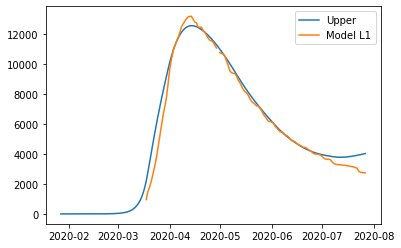

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.18398465738354386, 'other': 0.17524352748974992, 'school': 0.15366655875631466, 'transport': 0.19472048624909302, 'work': 0.39063156140065036}
{'home': 1.0, 'leisure': 0.22099579363083163, 'other': 0.22039475452592727, 'school': 0.19119779815331361, 'transport': 0.22807172161242853, 'work': 0.5363693465732121}
{'home': 1.0, 'leisure': 0.25668510358357344, 'other': 0.263933437739384, 'school': 0.22738863614327687, 'transport': 0.26023184142707345, 'work': 0.6769022108467537}
{'home': 1.0, 'leisure': 0.2857652820635852, 'other': 0.2994094018392376, 'school': 0.25687746709806175, 'transport': 0.28643638349826567, 'work': 0.7914104706251951}
{'home': 1.0, 'leisure': 0.30294902389268313, 'other': 0.32037247153460563, 'school': 0.2743026853895255, 'transport': 0.30192088563124286, 'work': 0.8590744423124559}
{'home': 1.0, 'leisure': 0.3122018079545051, 'other': 0.3316602782936

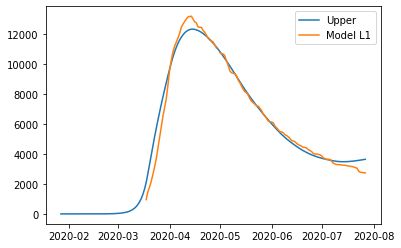

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.1815536756262422, 'other': 0.19112046922841586, 'school': 0.2371907463680046, 'transport': 0.34378478835363835, 'work': 0.40584524561239677}
{'home': 1.0, 'leisure': 0.2126101485968482, 'other': 0.2384886092509594, 'school': 0.28239611049755503, 'transport': 0.3907891008586716, 'work': 0.5449335701582051}
{'home': 1.0, 'leisure': 0.242557461818504, 'other': 0.2841650299869835, 'school': 0.3259869973367644, 'transport': 0.4361146879170964, 'work': 0.6790544545416631}
{'home': 1.0, 'leisure': 0.26695897629540866, 'other': 0.3213828542904105, 'school': 0.36150549772426827, 'transport': 0.47304664774247956, 'work': 0.7883381381133696}
{'home': 1.0, 'leisure': 0.28137805303176144, 'other': 0.34337520501516294, 'school': 0.38249370249870246, 'transport': 0.4948700785483879, 'work': 0.8529148602239236}
{'home': 1.0, 'leisure': 0.289142171274413, 'other': 0.3552172400207988, 'sc

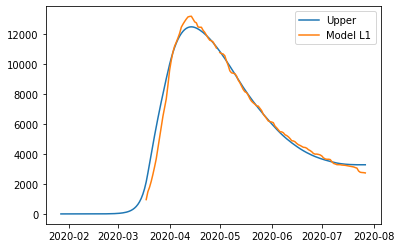

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2446314487740985, 'other': 0.15882398755378113, 'school': 0.2753487297878484, 'transport': 0.15278737573409398, 'work': 0.36975419711173285}
{'home': 1.0, 'leisure': 0.2711473408933683, 'other': 0.17730854925137457, 'school': 0.32330239100251146, 'transport': 0.19497924221688, 'work': 0.510029572575859}
{'home': 1.0, 'leisure': 0.2967162368655213, 'other': 0.1951329480311968, 'school': 0.36954342145950797, 'transport': 0.23566425632528082, 'work': 0.6452951132019806}
{'home': 1.0, 'leisure': 0.31755015210209037, 'other': 0.20965653222216304, 'school': 0.40722129812817176, 'transport': 0.26881500856175555, 'work': 0.7555114796380796}
{'home': 1.0, 'leisure': 0.3298611020146085, 'other': 0.21823865015318855, 'school': 0.42948549797783675, 'transport': 0.2884040894287633, 'work': 0.8206393325321382}
{'home': 1.0, 'leisure': 0.3364900750444259, 'other': 0.22285979057758692, 

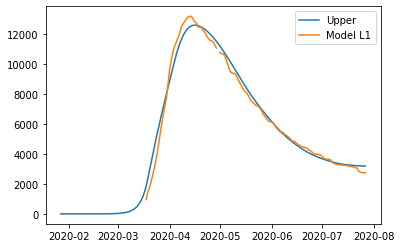

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.28493117990719097, 'other': 0.2572669724380967, 'school': 0.36720862315446745, 'transport': 0.33686341611331705, 'work': 0.4976831557478841}
{'home': 1.0, 'leisure': 0.3225244194221587, 'other': 0.30201511837799966, 'school': 0.42905418385766225, 'transport': 0.36626774248800215, 'work': 0.6074055950226116}
{'home': 1.0, 'leisure': 0.3587750432401633, 'other': 0.34516511624862034, 'school': 0.488690974535743, 'transport': 0.39462191434930566, 'work': 0.7132093757518132}
{'home': 1.0, 'leisure': 0.38831258857335227, 'other': 0.38032437377282985, 'school': 0.5372839150882532, 'transport': 0.41772531364370113, 'work': 0.7994198637533849}
{'home': 1.0, 'leisure': 0.40576659263387294, 'other': 0.40110029867349906, 'school': 0.5659979254147365, 'transport': 0.431377322317662, 'work': 0.8503624248452226}
{'home': 1.0, 'leisure': 0.4151649025126149, 'other': 0.41228733515847477,

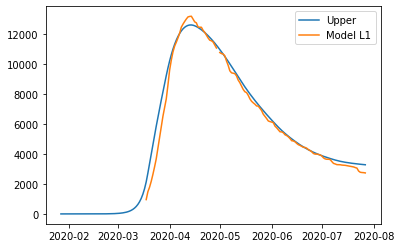

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.22738110616710597, 'other': 0.12152492137991594, 'school': 0.20685244417044918, 'transport': 0.23404392012704084, 'work': 0.3395970482527919}
{'home': 1.0, 'leisure': 0.27885314295847746, 'other': 0.15224438232549503, 'school': 0.2502863205727651, 'transport': 0.2686863775675148, 'work': 0.47007803612642485}
{'home': 1.0, 'leisure': 0.3284868927215857, 'other': 0.1818667196658749, 'school': 0.2921689871035698, 'transport': 0.30209160438511473, 'work': 0.5958989887188566}
{'home': 1.0, 'leisure': 0.36892920734337753, 'other': 0.20600343898025844, 'school': 0.32629560427681803, 'transport': 0.32931067808834424, 'work': 0.6984197649052823}
{'home': 1.0, 'leisure': 0.39282693871080004, 'other': 0.22026604584784876, 'school': 0.3464613326064647, 'transport': 0.3453946761857072, 'work': 0.7590002235608977}
{'home': 1.0, 'leisure': 0.4056949479086429, 'other': 0.227945911084243

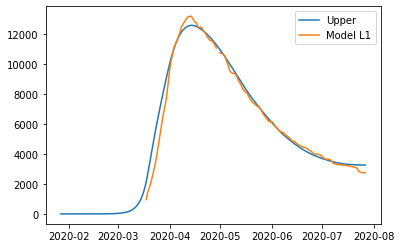

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2741061771996053, 'other': 0.15882398755378113, 'school': 0.23385796049715665, 'transport': 0.2784488932666769, 'work': 0.36975419711173285}
{'home': 1.0, 'leisure': 0.30524328894889874, 'other': 0.17697681732352738, 'school': 0.280951024596112, 'transport': 0.3198835662905762, 'work': 0.507512130101783}
{'home': 1.0, 'leisure': 0.33526836099286034, 'other': 0.1944813317443541, 'school': 0.326362193548676, 'transport': 0.359838429563622, 'work': 0.640350136913617}
{'home': 1.0, 'leisure': 0.35973323451016237, 'other': 0.20874426942058333, 'school': 0.3633638867692837, 'transport': 0.3923942440824, 'work': 0.7485885128343706}
{'home': 1.0, 'leisure': 0.3741897506794772, 'other': 0.21717236895653694, 'school': 0.38522852367237015, 'transport': 0.4116317708434961, 'work': 0.8125475531511795}
{'home': 1.0, 'leisure': 0.3819740286168005, 'other': 0.2217105763989735, 'school':

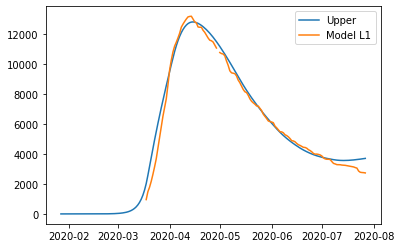

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.14058426646796884, 'other': 0.2692892620554624, 'school': 0.20590868326220288, 'transport': 0.29848346724442254, 'work': 0.41980580735544637}
{'home': 1.0, 'leisure': 0.15703414710839397, 'other': 0.3151557309454974, 'school': 0.2511140473917533, 'transport': 0.34146451589648696, 'work': 0.5588941319012547}
{'home': 1.0, 'leisure': 0.1728965320116611, 'other': 0.35938411166088846, 'school': 0.29470493423096267, 'transport': 0.38291052709669193, 'work': 0.6930150162847127}
{'home': 1.0, 'leisure': 0.185821438229138, 'other': 0.39542205150305887, 'school': 0.33022343461846654, 'transport': 0.4166813510375996, 'work': 0.8022986998564192}
{'home': 1.0, 'leisure': 0.19345888281219253, 'other': 0.4167171977734323, 'school': 0.35121163939290073, 'transport': 0.43663683791177244, 'work': 0.8668754219669732}
{'home': 1.0, 'leisure': 0.19757135297229883, 'other': 0.428183814995941

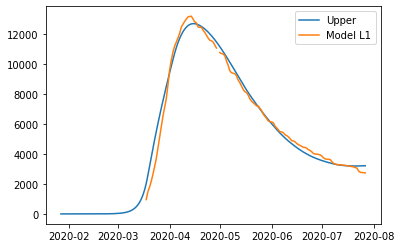

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26280518402772696, 'other': 0.1803159313293009, 'school': 0.27139491153654066, 'transport': 0.3724414031356851, 'work': 0.4530734209731039}
{'home': 1.0, 'leisure': 0.27907829156794445, 'other': 0.21034316521042204, 'school': 0.31108728313846185, 'transport': 0.4282477297422112, 'work': 0.5797248887300098}
{'home': 1.0, 'leisure': 0.29477021669601133, 'other': 0.23929799788150316, 'school': 0.3493620700403144, 'transport': 0.4820609732556471, 'work': 0.7018530897813119}
{'home': 1.0, 'leisure': 0.3075562297633251, 'other': 0.2628908245023841, 'school': 0.38054893344182383, 'transport': 0.5259088013036319, 'work': 0.8013649573045951}
{'home': 1.0, 'leisure': 0.3151116011212832, 'other': 0.27683204023290464, 'school': 0.39897753454271584, 'transport': 0.5518188815138048, 'work': 0.8601674244774443}
{'home': 1.0, 'leisure': 0.3191798780063376, 'other': 0.28433884870318493, 

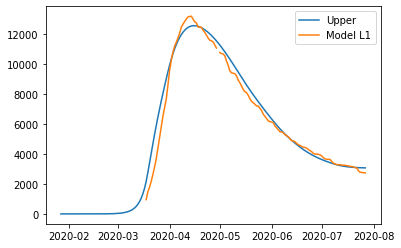

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.28109490572584994, 'other': 0.23085191996014848, 'school': 0.2000766447837647, 'transport': 0.21469176441785667, 'work': 0.3742195347630153}
{'home': 1.0, 'leisure': 0.3019172938003142, 'other': 0.2755553465605989, 'school': 0.24787409667915614, 'transport': 0.26465047738951364, 'work': 0.5103305500024874}
{'home': 1.0, 'leisure': 0.3219960251578333, 'other': 0.3186622222110332, 'school': 0.2939644967211408, 'transport': 0.31282495061218296, 'work': 0.6415804575548356}
{'home': 1.0, 'leisure': 0.33835647293062665, 'other': 0.353786343111387, 'school': 0.33151963749609115, 'transport': 0.3520782250899134, 'work': 0.7485248266715636}
{'home': 1.0, 'leisure': 0.3480240102509137, 'other': 0.37454150546159615, 'school': 0.35371131159038005, 'transport': 0.37527334182675415, 'work': 0.8117192266041757}
{'home': 1.0, 'leisure': 0.35322960726952973, 'other': 0.38571736211170876,

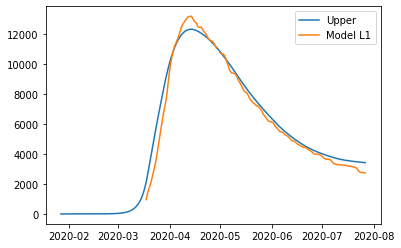

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23950567027235795, 'other': 0.17475194577467434, 'school': 0.31760477937584397, 'transport': 0.2871437775652512, 'work': 0.39285999245805897}
{'home': 1.0, 'leisure': 0.2666758936331659, 'other': 0.19794718888851923, 'school': 0.3736012686095225, 'transport': 0.31204384247661343, 'work': 0.5186644850827256}
{'home': 1.0, 'leisure': 0.29287575187394504, 'other': 0.22031403046258397, 'school': 0.42759788322771247, 'transport': 0.3360546193554271, 'work': 0.6399759601136542}
{'home': 1.0, 'leisure': 0.3142237845145799, 'other': 0.23853886433774782, 'school': 0.47159512476845983, 'transport': 0.3556189560714974, 'work': 0.7388223471758922}
{'home': 1.0, 'leisure': 0.326838531074955, 'other': 0.2493080843548901, 'school': 0.4975934947698105, 'transport': 0.3671797004946299, 'work': 0.7972315758944875}
{'home': 1.0, 'leisure': 0.33363108691515697, 'other': 0.25510689513335133,

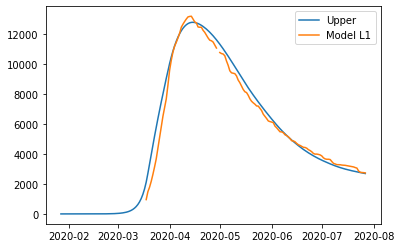

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.32979251395042675, 'other': 0.13032316008397224, 'school': 0.21210751450879667, 'transport': 0.22639354511240828, 'work': 0.3723970059519353}
{'home': 1.0, 'leisure': 0.3645367585154595, 'other': 0.13751846841026572, 'school': 0.25890318371330945, 'transport': 0.2517786448710045, 'work': 0.4925932853180127}
{'home': 1.0, 'leisure': 0.3980401372031698, 'other': 0.14445680143919154, 'school': 0.3040275790176612, 'transport': 0.2762571339239366, 'work': 0.608496840421016}
{'home': 1.0, 'leisure': 0.42533918650426694, 'other': 0.15011025798127925, 'school': 0.34079560482120697, 'transport': 0.29620256944854784, 'work': 0.7029367742086483}
{'home': 1.0, 'leisure': 0.4414704429094608, 'other': 0.15345093684705838, 'school': 0.3625221655233022, 'transport': 0.30798850862218186, 'work': 0.7587421896286128}
{'home': 1.0, 'leisure': 0.45015650405071894, 'other': 0.1552497639286317

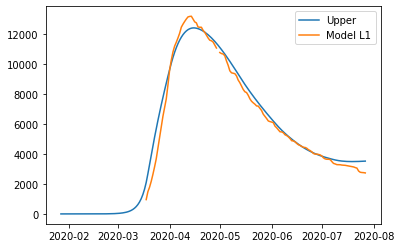

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.30202598729091856, 'other': 0.1587347433184821, 'school': 0.20747594127592722, 'transport': 0.27413234634925415, 'work': 0.32780477533333363}
{'home': 1.0, 'leisure': 0.35771188384502905, 'other': 0.18702785679344847, 'school': 0.2396061910600342, 'transport': 0.3259319301332215, 'work': 0.4739255739540352}
{'home': 1.0, 'leisure': 0.41140899837934986, 'other': 0.21431050193002313, 'school': 0.2705889319232802, 'transport': 0.37588152878204717, 'work': 0.6148277726239973}
{'home': 1.0, 'leisure': 0.4551622028147224, 'other': 0.23654080537463953, 'school': 0.29583412818222143, 'transport': 0.41658120175516433, 'work': 0.7296369715402629}
{'home': 1.0, 'leisure': 0.481016369071988, 'other': 0.24967689377373103, 'school': 0.31075174415341394, 'transport': 0.4406310085120063, 'work': 0.7974787708998743}
{'home': 1.0, 'leisure': 0.4949378432105156, 'other': 0.2567501721424726

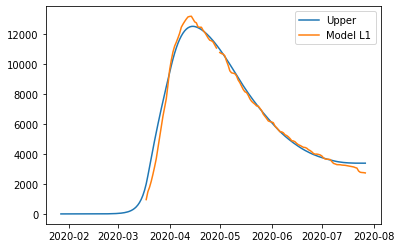

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3091109095649606, 'other': 0.18107456327718385, 'school': 0.32598064917985625, 'transport': 0.20882787711307446, 'work': 0.3276890268713468}
{'home': 1.0, 'leisure': 0.34836723995122, 'other': 0.2276731290339358, 'school': 0.41167946033750863, 'transport': 0.24313667077716278, 'work': 0.465733646085704}
{'home': 1.0, 'leisure': 0.38622155853797, 'other': 0.2726074602993752, 'school': 0.494317599668102, 'transport': 0.27622015038181935, 'work': 0.5988481003281199}
{'home': 1.0, 'leisure': 0.4170658181271738, 'other': 0.3092206191082517, 'school': 0.5616523798634003, 'transport': 0.3031770596893173, 'work': 0.7073117297108291}
{'home': 1.0, 'leisure': 0.43529197152079424, 'other': 0.33085566749531514, 'school': 0.6014411136151675, 'transport': 0.31910614246192975, 'work': 0.7714038743460664}
{'home': 1.0, 'leisure': 0.44510605411735904, 'other': 0.34250530893450315, 'schoo

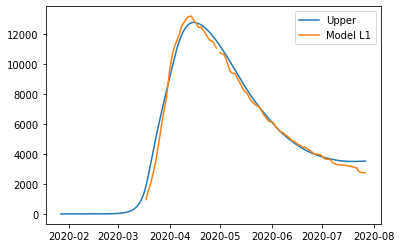

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.1583353640736021, 'other': 0.17727603891106536, 'school': 0.312636812838446, 'transport': 0.312948671998282, 'work': 0.3636361870167797}
{'home': 1.0, 'leisure': 0.19536500648910973, 'other': 0.2149978918395088, 'school': 0.3935579420145154, 'transport': 0.3455670004590363, 'work': 0.5068439911487147}
{'home': 1.0, 'leisure': 0.2310721616754921, 'other': 0.25137253573479357, 'school': 0.47158903086286796, 'transport': 0.37702038861762077, 'work': 0.6449372308473663}
{'home': 1.0, 'leisure': 0.2601668807162481, 'other': 0.28101113446428483, 'school': 0.5351699180726367, 'transport': 0.4026490752653563, 'work': 0.757457648379601}
{'home': 1.0, 'leisure': 0.2773592146948766, 'other': 0.29852485189534783, 'school': 0.5727404423329545, 'transport': 0.4177932991935636, 'work': 0.823946986012285}
{'home': 1.0, 'leisure': 0.28661662529875354, 'other': 0.30795531512745866, 'schoo

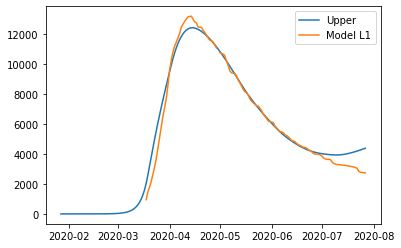

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.13913568651213176, 'other': 0.3560222467127785, 'school': 0.335991900972619, 'transport': 0.16897310700053714, 'work': 0.36947528395510193}
{'home': 1.0, 'leisure': 0.1793527372927571, 'other': 0.4334028001125836, 'school': 0.40282247696568263, 'transport': 0.20744157106361985, 'work': 0.5110812241723335}
{'home': 1.0, 'leisure': 0.21813346483121734, 'other': 0.5080197623195386, 'school': 0.46726624667327976, 'transport': 0.24453616141016393, 'work': 0.6476298093818069}
{'home': 1.0, 'leisure': 0.24973257615885155, 'other': 0.5688187685622426, 'school': 0.519775984953544, 'transport': 0.2747613831740146, 'work': 0.7588916195524888}
{'home': 1.0, 'leisure': 0.26840477830699905, 'other': 0.6047454540692949, 'school': 0.5508044666646092, 'transport': 0.2926217414890173, 'work': 0.8246372346533464}
{'home': 1.0, 'leisure': 0.27845904100215535, 'other': 0.6240905924192461, 's

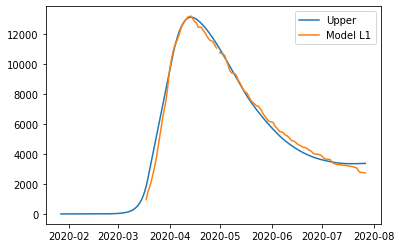

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2378586652991017, 'other': 0.20538142377645469, 'school': 0.36326780535112185, 'transport': 0.320865645595584, 'work': 0.3968792545106469}
{'home': 1.0, 'leisure': 0.24464456075625185, 'other': 0.2557781808334857, 'school': 0.4816555699325652, 'transport': 0.36754271739969413, 'work': 0.5363198144939468}
{'home': 1.0, 'leisure': 0.25118810280421805, 'other': 0.30437505370990847, 'school': 0.5958152000646713, 'transport': 0.41255275092508603, 'work': 0.6707803544778432}
{'home': 1.0, 'leisure': 0.2565198778062646, 'other': 0.34397250568329, 'school': 0.6888341579500911, 'transport': 0.44922759305688686, 'work': 0.7803407944647218}
{'home': 1.0, 'leisure': 0.25967047212565575, 'other': 0.36737100003119727, 'school': 0.7437999057914755, 'transport': 0.47089909068022373, 'work': 0.8450810544569682}
{'home': 1.0, 'leisure': 0.26136694598994326, 'other': 0.37997018929545506, '

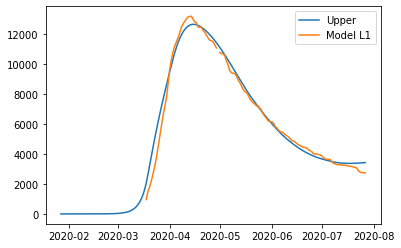

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23154938303988423, 'other': 0.24188478510802375, 'school': 0.3029901930738058, 'transport': 0.21075947157403524, 'work': 0.3243665476147438}
{'home': 1.0, 'leisure': 0.2743028697176178, 'other': 0.312058315483231, 'school': 0.40452470528296536, 'transport': 0.24994737616764762, 'work': 0.4625165615648855}
{'home': 1.0, 'leisure': 0.3155294461568609, 'other': 0.37972564834503797, 'school': 0.5024329849132263, 'transport': 0.28773571274005955, 'work': 0.5957326464453793}
{'home': 1.0, 'leisure': 0.3491214714036515, 'other': 0.43486199363984357, 'school': 0.5822101016489943, 'transport': 0.31852620920646924, 'work': 0.7042790859776333}
{'home': 1.0, 'leisure': 0.3689713045040278, 'other': 0.467442561314047, 'school': 0.6293511251746756, 'transport': 0.336720593482075, 'work': 0.7684201638830563}
{'home': 1.0, 'leisure': 0.37965967617346125, 'other': 0.4849859439078488, 'sch

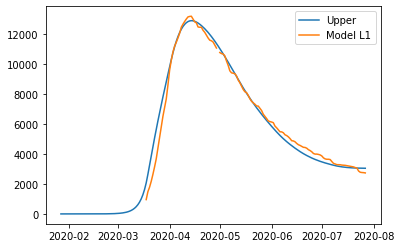

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.25968089534842054, 'other': 0.22385688323340153, 'school': 0.2543612076937748, 'transport': 0.21050144687817257, 'work': 0.33866856628574465}
{'home': 1.0, 'leisure': 0.3135791460579168, 'other': 0.278876634812383, 'school': 0.3254704512188028, 'transport': 0.244437968423885, 'work': 0.4716186249101626}
{'home': 1.0, 'leisure': 0.365552459242074, 'other': 0.3319313952635437, 'school': 0.3940400789036513, 'transport': 0.2771624713429648, 'work': 0.599820467155137}
{'home': 1.0, 'leisure': 0.40790108479953546, 'other': 0.3751612000756006, 'school': 0.4499116273876019, 'transport': 0.3038268811288817, 'work': 0.704281227502894}
{'home': 1.0, 'leisure': 0.4329252726289445, 'other': 0.4007060847372706, 'school': 0.48292663330993635, 'transport': 0.3195831232751053, 'work': 0.7660080404356595}
{'home': 1.0, 'leisure': 0.4463998353063186, 'other': 0.414461022632016, 'school': 0

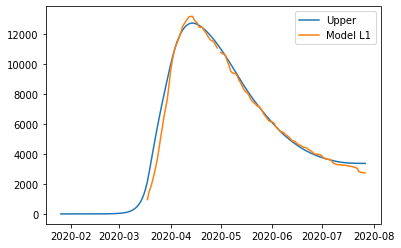

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.30295680356262894, 'other': 0.07056018000822752, 'school': 0.3600042474409709, 'transport': 0.23149262074342486, 'work': 0.37748575875775403}
{'home': 1.0, 'leisure': 0.3333991301931516, 'other': 0.08206285243909378, 'school': 0.4420444427035222, 'transport': 0.2664351011287932, 'work': 0.5130940047478177}
{'home': 1.0, 'leisure': 0.3627542308725842, 'other': 0.09315471514028627, 'school': 0.5211546309924109, 'transport': 0.30012963578611274, 'work': 0.6438590990953792}
{'home': 1.0, 'leisure': 0.3866732017965663, 'other': 0.10219252919310977, 'school': 0.585614784412987, 'transport': 0.3275844418031878, 'work': 0.7504084352304292}
{'home': 1.0, 'leisure': 0.4008071391607375, 'other': 0.10753305567886912, 'school': 0.6237048750706001, 'transport': 0.3438077362678231, 'work': 0.8133694065829589}
{'home': 1.0, 'leisure': 0.40841772081836814, 'other': 0.11040872378658567, '

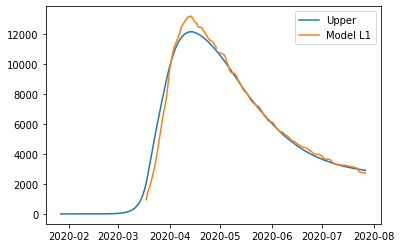

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2294780565957715, 'other': 0.16553896393346917, 'school': 0.1616469257412319, 'transport': 0.1687063566492018, 'work': 0.2986906270400526}
{'home': 1.0, 'leisure': 0.2754863313243017, 'other': 0.20534692786822695, 'school': 0.19167619557365517, 'transport': 0.18791846703606874, 'work': 0.4233936003497314}
{'home': 1.0, 'leisure': 0.3198514533839558, 'other': 0.24373317880531475, 'school': 0.2206329914834919, 'transport': 0.20644443062340473, 'work': 0.5436428960412073}
{'home': 1.0, 'leisure': 0.35600081209922957, 'other': 0.275010864754053, 'school': 0.24422741778039594, 'transport': 0.2215396602130859, 'work': 0.6416238036416692}
{'home': 1.0, 'leisure': 0.3773617967946186, 'other': 0.29349313372376196, 'school': 0.258169578774021, 'transport': 0.23045956860698844, 'work': 0.6995216126783057}
{'home': 1.0, 'leisure': 0.38886386547675117, 'other': 0.30344512470745144, '

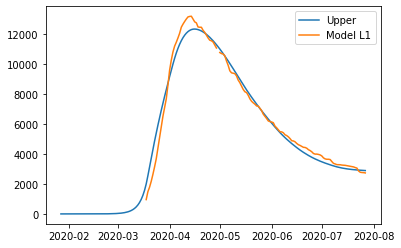

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.27728193041960597, 'other': 0.26223454219412545, 'school': 0.322716145719562, 'transport': 0.16483303928231607, 'work': 0.36995898468098565}
{'home': 1.0, 'leisure': 0.31236574611559875, 'other': 0.3086863110496356, 'school': 0.4043378080900114, 'transport': 0.20715902812338835, 'work': 0.497983381274068}
{'home': 1.0, 'leisure': 0.3461965683938775, 'other': 0.35347908816030604, 'school': 0.4830444110900876, 'transport': 0.24797337450585086, 'work': 0.6214354779888259}
{'home': 1.0, 'leisure': 0.37376242358358613, 'other': 0.38997690654677825, 'school': 0.5471757172382978, 'transport': 0.28122950859526474, 'work': 0.7220260753119621}
{'home': 1.0, 'leisure': 0.3900513380138685, 'other': 0.41154379922969364, 'school': 0.5850714890531493, 'transport': 0.30088086055719115, 'work': 0.7814659737301788}
{'home': 1.0, 'leisure': 0.3988222919378668, 'other': 0.4231567414435712, 

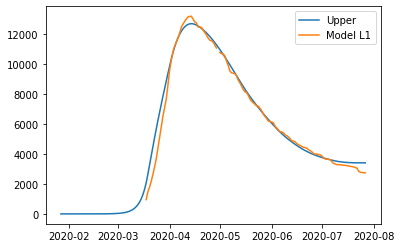

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2472567471946478, 'other': 0.14689648988685497, 'school': 0.1635605121758526, 'transport': 0.1268991896622107, 'work': 0.2792389746819046}
{'home': 1.0, 'leisure': 0.28287249222829375, 'other': 0.16766034756010662, 'school': 0.2174272477069539, 'transport': 0.17429365456485768, 'work': 0.43681143860341903}
{'home': 1.0, 'leisure': 0.3172162463678809, 'other': 0.18768263888788494, 'school': 0.26937017125480156, 'transport': 0.21999546000669581, 'work': 0.5887563145277365}
{'home': 1.0, 'leisure': 0.3452000460371742, 'other': 0.20399709848829695, 'school': 0.31169403488638114, 'transport': 0.2572339681444899, 'work': 0.7125632504660693}
{'home': 1.0, 'leisure': 0.36173592765993834, 'other': 0.21363746097944947, 'school': 0.33670359066867817, 'transport': 0.27923854113500457, 'work': 0.7857218944296295}
{'home': 1.0, 'leisure': 0.37063986391834985, 'other': 0.21882842539776

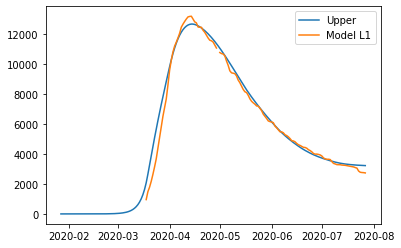

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2476829374067165, 'other': 0.12412071423351635, 'school': 0.20600881102872157, 'transport': 0.2028299488118995, 'work': 0.31274019448980683}
{'home': 1.0, 'leisure': 0.27748647628265655, 'other': 0.13433201929407232, 'school': 0.2706924231833583, 'transport': 0.24695023987966536, 'work': 0.45942700668955744}
{'home': 1.0, 'leisure': 0.30622560305588437, 'other': 0.14417863488817984, 'school': 0.33306590633247235, 'transport': 0.2894948062664396, 'work': 0.6008750041678884}
{'home': 1.0, 'leisure': 0.32964266931555153, 'other': 0.15220180315004522, 'school': 0.38388874445397264, 'transport': 0.32416074924825555, 'work': 0.716128928039121}
{'home': 1.0, 'leisure': 0.34348002665080934, 'other': 0.1569427662138748, 'school': 0.4139204215257683, 'transport': 0.3446451701011469, 'work': 0.7842335194175767}
{'home': 1.0, 'leisure': 0.3509309113697944, 'other': 0.159495592479013

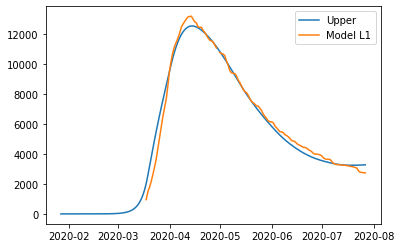

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2917176490856864, 'other': 0.17517479108726924, 'school': 0.21037450874997332, 'transport': 0.17955558699124297, 'work': 0.3891133777078991}
{'home': 1.0, 'leisure': 0.32681953028704913, 'other': 0.20851909683268596, 'school': 0.24718988157019342, 'transport': 0.22106067782719827, 'work': 0.5289906228556691}
{'home': 1.0, 'leisure': 0.36066777287407753, 'other': 0.24067253451576634, 'school': 0.28269041964683417, 'transport': 0.2610834439904408, 'work': 0.6638722521053044}
{'home': 1.0, 'leisure': 0.38824782238943395, 'other': 0.2668716318871651, 'school': 0.31161678400557846, 'transport': 0.29369458679011995, 'work': 0.7737758018642664}
{'home': 1.0, 'leisure': 0.40454512437578094, 'other': 0.28235291669753715, 'school': 0.32870963567210926, 'transport': 0.3129648075353849, 'work': 0.8387188085400168}
{'home': 1.0, 'leisure': 0.41332059467612164, 'other': 0.290688993133

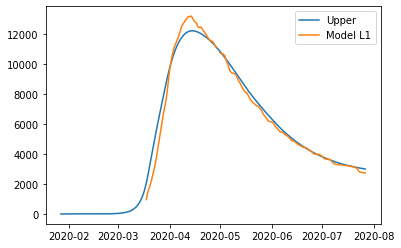

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2746035582959617, 'other': 0.20892689513622106, 'school': 0.20760956425382224, 'transport': 0.15973814294357067, 'work': 0.3040602100815603}
{'home': 1.0, 'leisure': 0.29260302861350906, 'other': 0.24873485907097884, 'school': 0.2669232893325228, 'transport': 0.1787185186481205, 'work': 0.4287631833912391}
{'home': 1.0, 'leisure': 0.3099596607054297, 'other': 0.2871211100080666, 'school': 0.32411866708698406, 'transport': 0.1970210237917935, 'work': 0.549012479082715}
{'home': 1.0, 'leisure': 0.3241021016692168, 'other': 0.31839879595680487, 'school': 0.37072230822024876, 'transport': 0.21193417613108262, 'work': 0.6469933866831769}
{'home': 1.0, 'leisure': 0.33245899860236383, 'other': 0.3368810649265138, 'school': 0.39826082343535973, 'transport': 0.22074649342248076, 'work': 0.7048911957198134}
{'home': 1.0, 'leisure': 0.3369588661817507, 'other': 0.3468330559102033, 

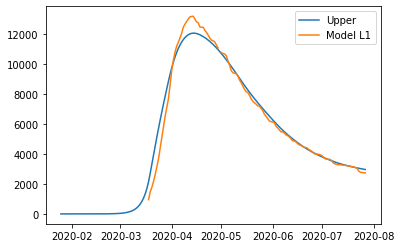

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.21155670042583133, 'other': 0.27408189018169493, 'school': 0.16162357576012815, 'transport': 0.22666307953416753, 'work': 0.4110652856394018}
{'home': 1.0, 'leisure': 0.21472806484448165, 'other': 0.3047541350776024, 'school': 0.19509281283622423, 'transport': 0.25561362365058593, 'work': 0.5238443628099938}
{'home': 1.0, 'leisure': 0.21778616624818015, 'other': 0.3343309426557989, 'school': 0.22736672001674546, 'transport': 0.2835302197628466, 'work': 0.6325956157959217}
{'home': 1.0, 'leisure': 0.22027795257711968, 'other': 0.35843056364544046, 'school': 0.2536639777193924, 'transport': 0.30627707585431824, 'work': 0.7212077478585297}
{'home': 1.0, 'leisure': 0.22175037177149304, 'other': 0.37267124877568314, 'school': 0.26920326636186553, 'transport': 0.3197183999083696, 'work': 0.7735694622591616}
{'home': 1.0, 'leisure': 0.2225432128761556, 'other': 0.38033930999966

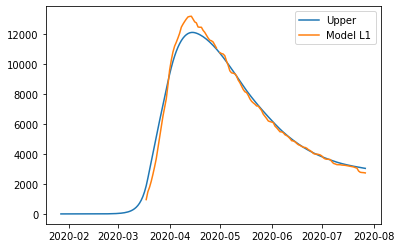

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.28249289103566566, 'other': 0.18112244058807664, 'school': 0.2138634304786281, 'transport': 0.1560390326321392, 'work': 0.41021392486057995}
{'home': 1.0, 'leisure': 0.3110165502868865, 'other': 0.21893949149092382, 'school': 0.2341447198542646, 'transport': 0.1822404207806167, 'work': 0.5252075092460449}
{'home': 1.0, 'leisure': 0.33852150742199233, 'other': 0.25540593343295503, 'school': 0.2537016774664855, 'transport': 0.20750604506664855, 'work': 0.6360941799034574}
{'home': 1.0, 'leisure': 0.360932953976523, 'other': 0.2851193305709063, 'school': 0.2696369762616284, 'transport': 0.22809285004045227, 'work': 0.7264462819206083}
{'home': 1.0, 'leisure': 0.3741760814860184, 'other': 0.30267724706151394, 'school': 0.2790532891860311, 'transport': 0.24025778025224537, 'work': 0.7798361603852885}
{'home': 1.0, 'leisure': 0.3813069962988236, 'other': 0.31213150978722576, '

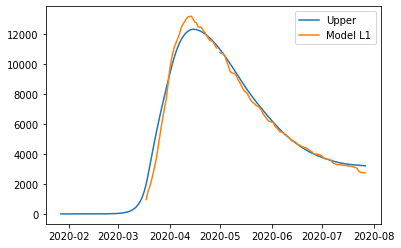

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.20039286762930134, 'other': 0.11387577361571893, 'school': 0.11775593224666712, 'transport': 0.22836664394068065, 'work': 0.3742195347630153}
{'home': 1.0, 'leisure': 0.2212152557037656, 'other': 0.12496713898689679, 'school': 0.15138405109738387, 'transport': 0.2667138638758279, 'work': 0.5103305500024874}
{'home': 1.0, 'leisure': 0.24129398706128474, 'other': 0.13566238416624687, 'school': 0.18381116570343223, 'transport': 0.30369154024186273, 'work': 0.6415804575548356}
{'home': 1.0, 'leisure': 0.25765443483407807, 'other': 0.14437702838645805, 'school': 0.21023325908613824, 'transport': 0.3338214987623356, 'work': 0.7485248266715636}
{'home': 1.0, 'leisure': 0.26732197215436504, 'other': 0.1495265908802192, 'school': 0.22584631426682816, 'transport': 0.3516255651607968, 'work': 0.8117192266041757}
{'home': 1.0, 'leisure': 0.27252756917298115, 'other': 0.1522994322230

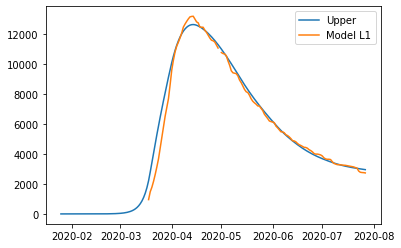

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.1997641878695788, 'other': 0.1986279454291307, 'school': 0.062226229646933515, 'transport': 0.12963902310069764, 'work': 0.3252449283033345}
{'home': 1.0, 'leisure': 0.20275563349395911, 'other': 0.20197560056493383, 'school': 0.07420072850780945, 'transport': 0.17451213603732227, 'work': 0.4687745770961719}
{'home': 1.0, 'leisure': 0.20564024177461154, 'other': 0.205203696588744, 'school': 0.08574756669508268, 'transport': 0.21778263779763887, 'work': 0.6071781670035508}
{'home': 1.0, 'leisure': 0.2079906633366246, 'other': 0.20783399705258931, 'school': 0.09515610151434234, 'transport': 0.2530400836764154, 'work': 0.7199514624836373}
{'home': 1.0, 'leisure': 0.20937954880508688, 'other': 0.2093882655084979, 'school': 0.1007156902711776, 'transport': 0.2738740289684197, 'work': 0.7865902279945975}
{'home': 1.0, 'leisure': 0.21012741021118198, 'other': 0.2102251792924487

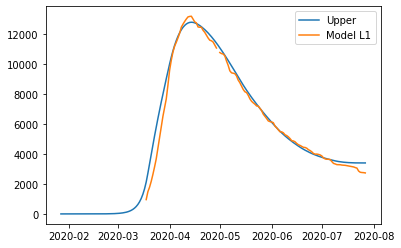

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.11861059982465215, 'other': 0.17173199285274338, 'school': 0.1366761863373498, 'transport': 0.19758692486640111, 'work': 0.2783407711477921}
{'home': 1.0, 'leisure': 0.126170146191096, 'other': 0.20171493639692567, 'school': 0.18413226203239935, 'transport': 0.25233200686310386, 'work': 0.43812426727535614}
{'home': 1.0, 'leisure': 0.13345970875873828, 'other': 0.2306270605288157, 'school': 0.2298934778811971, 'transport': 0.3051219073599243, 'work': 0.5922012099697929}
{'home': 1.0, 'leisure': 0.13939935233237272, 'other': 0.2541850875992447, 'school': 0.2671803944987361, 'transport': 0.34813590035733355, 'work': 0.7177453854985932}
{'home': 1.0, 'leisure': 0.1429091417167931, 'other': 0.26810573995904363, 'school': 0.28921357250000906, 'transport': 0.3735532598558027, 'work': 0.791930580129248}
{'home': 1.0, 'leisure': 0.14479902830840405, 'other': 0.2756014758450892, 

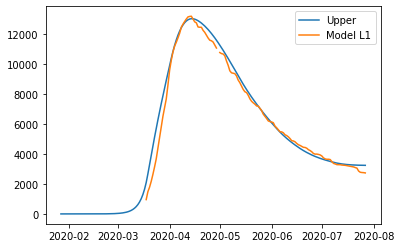

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24968420590791784, 'other': 0.05612790398861217, 'school': 0.08151139788288128, 'transport': 0.1469180629449699, 'work': 0.280292248685491}
{'home': 1.0, 'leisure': 0.29245403007649023, 'other': 0.0580858180913206, 'school': 0.10388466915014985, 'transport': 0.2055640055449024, 'work': 0.43903778775659397}
{'home': 1.0, 'leisure': 0.3336963605247565, 'other': 0.05997380669036086, 'school': 0.125458895015016, 'transport': 0.2621154501948373, 'work': 0.5921138432894432}
{'home': 1.0, 'leisure': 0.367301222371492, 'other': 0.06151216777106035, 'school': 0.1430378938678699, 'transport': 0.30819440509478424, 'work': 0.7168424811310241}
{'home': 1.0, 'leisure': 0.387158640735472, 'other': 0.0624211993187464, 'school': 0.15342548409910173, 'transport': 0.3354228784447529, 'work': 0.7905457671283218}
{'home': 1.0, 'leisure': 0.3978510967776151, 'other': 0.0629106778444235, 'scho

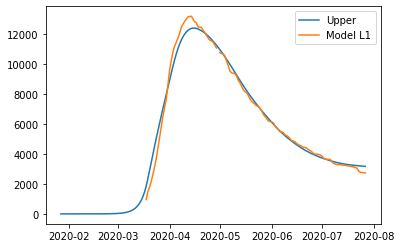

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2892888820864814, 'other': 0.14025777163104303, 'school': 0.10388750131123553, 'transport': 0.16769421603351867, 'work': 0.3085792846874958}
{'home': 1.0, 'leisure': 0.33360935860785657, 'other': 0.16183832822779898, 'school': 0.151453325886184, 'transport': 0.18229695563222742, 'work': 0.4510371586471198}
{'home': 1.0, 'leisure': 0.3763469609677541, 'other': 0.18264815066038506, 'school': 0.19732037101202712, 'transport': 0.1963781688166966, 'work': 0.5884072513939}
{'home': 1.0, 'leisure': 0.4111701925202631, 'other': 0.19960430227212186, 'school': 0.23469351889234374, 'transport': 0.20785174992996774, 'work': 0.7003384380764617}
{'home': 1.0, 'leisure': 0.43174755661947306, 'other': 0.20962384640632997, 'school': 0.25677765173071265, 'transport': 0.21463159331508253, 'work': 0.76647959384343}
{'home': 1.0, 'leisure': 0.44282767574981685, 'other': 0.21501898555551896, 

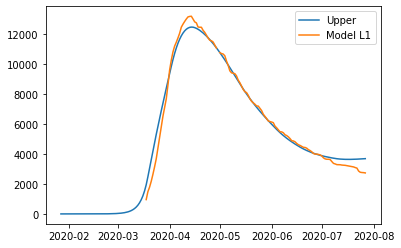

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2954236691646033, 'other': 0.11679301344405915, 'school': 0.09855334792778855, 'transport': 0.2143255210886626, 'work': 0.30724226016841105}
{'home': 1.0, 'leisure': 0.3679873819648866, 'other': 0.14286705064994504, 'school': 0.13600480874594056, 'transport': 0.22178913858324736, 'work': 0.4541045144075234}
{'home': 1.0, 'leisure': 0.4379595335937313, 'other': 0.16800987224133496, 'school': 0.17211871739201573, 'transport': 0.2289861983101684, 'work': 0.595721688138096}
{'home': 1.0, 'leisure': 0.4949738793653825, 'other': 0.18849661576024532, 'school': 0.2015448651777066, 'transport': 0.23485046919877073, 'work': 0.71111345932597}
{'home': 1.0, 'leisure': 0.5286641745940855, 'other': 0.20060241874869233, 'school': 0.21893304341470574, 'transport': 0.23831572017839936, 'work': 0.7792995059369865}
{'home': 1.0, 'leisure': 0.5468051027941564, 'other': 0.2071209280501638, '

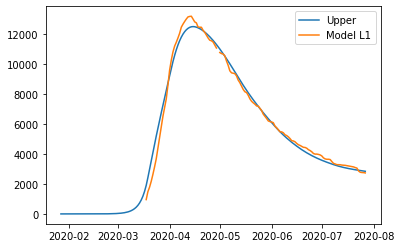

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2794511959399452, 'other': 0.13731942062768393, 'school': 0.16333295695768618, 'transport': 0.1980997374789807, 'work': 0.3345600807028607}
{'home': 1.0, 'leisure': 0.3089899086204283, 'other': 0.14720799294436634, 'school': 0.21220188770300677, 'transport': 0.21160919836625625, 'work': 0.4697015624293337}
{'home': 1.0, 'leisure': 0.33747366727660844, 'other': 0.15674340196402436, 'school': 0.25932549949313743, 'transport': 0.22463617850755765, 'work': 0.6000165626655756}
{'home': 1.0, 'leisure': 0.3606826558112737, 'other': 0.16451299449856055, 'school': 0.29772251650731785, 'transport': 0.23525075491898842, 'work': 0.7061991554506615}
{'home': 1.0, 'leisure': 0.37439705812721225, 'other': 0.1691041173598774, 'school': 0.3204116629247882, 'transport': 0.24152300461665205, 'work': 0.7689434148236668}
{'home': 1.0, 'leisure': 0.38178173629733303, 'other': 0.17157626043904

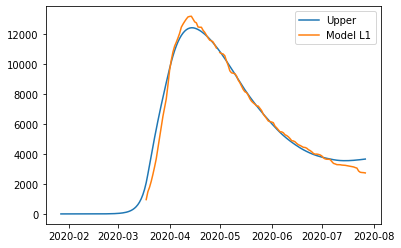

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3064425559737375, 'other': 0.19045197379694245, 'school': 0.3029156850638761, 'transport': 0.26081735074779583, 'work': 0.4014504994621622}
{'home': 1.0, 'leisure': 0.356154690196884, 'other': 0.23595861247589922, 'school': 0.355235682155257, 'transport': 0.30657143415760374, 'work': 0.5362825716402055}
{'home': 1.0, 'leisure': 0.4040913910549181, 'other': 0.2798400140591789, 'school': 0.40568710792194573, 'transport': 0.3506914431599185, 'work': 0.666299212669033}
{'home': 1.0, 'leisure': 0.4431509250873904, 'other': 0.31559523016407354, 'school': 0.44679567706517365, 'transport': 0.38664108012476767, 'work': 0.7722386979517815}
{'home': 1.0, 'leisure': 0.46623155883385126, 'other': 0.3367233124078749, 'school': 0.4710871042861719, 'transport': 0.40788404742217843, 'work': 0.8348393028915873}
{'home': 1.0, 'leisure': 0.4786595923896379, 'other': 0.34809997207761406, 'sc

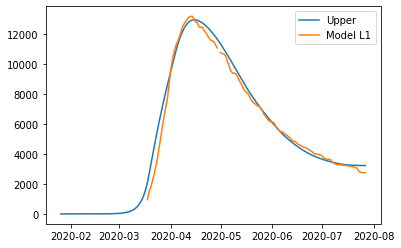

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23809065886568442, 'other': 0.2000760220632769, 'school': 0.24461238324955129, 'transport': 0.16481415203471578, 'work': 0.316017077351525}
{'home': 1.0, 'leisure': 0.2818399710298618, 'other': 0.2594922420259951, 'school': 0.29319981371617787, 'transport': 0.21274958837686175, 'work': 0.458527539880191}
{'home': 1.0, 'leisure': 0.32402680775960424, 'other': 0.31678645413290196, 'school': 0.34005197880899646, 'transport': 0.25897304484964545, 'work': 0.5959483430328333}
{'home': 1.0, 'leisure': 0.35840126731717215, 'other': 0.363470626960752, 'school': 0.3782278170327745, 'transport': 0.29663660197561725, 'work': 0.7079208493053566}
{'home': 1.0, 'leisure': 0.3787134479648259, 'other': 0.3910567290862997, 'school': 0.40078626689227975, 'transport': 0.3188923402773279, 'work': 0.7740864211936658}
{'home': 1.0, 'leisure': 0.3896507760058703, 'other': 0.4059107840769793, 's

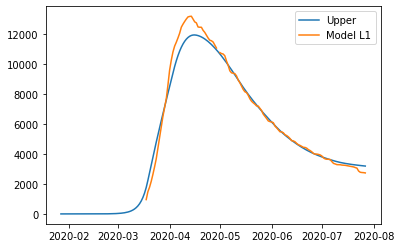

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2813620469139826, 'other': 0.10889487580652953, 'school': 0.08493427287108493, 'transport': 0.26971505445336064, 'work': 0.3532878102665932}
{'home': 1.0, 'leisure': 0.32998583059991937, 'other': 0.12005205630821988, 'school': 0.10203400026431185, 'transport': 0.3119007140420975, 'work': 0.48398489301701697}
{'home': 1.0, 'leisure': 0.3768730505827871, 'other': 0.130810766077707, 'school': 0.11852302310778065, 'transport': 0.3525797429312366, 'work': 0.6100142228120684}
{'home': 1.0, 'leisure': 0.4150774520503089, 'other': 0.13957712218617802, 'school': 0.13195852320245896, 'transport': 0.38572561832238705, 'work': 0.7127047878302586}
{'home': 1.0, 'leisure': 0.4376527801902081, 'other': 0.14475724170481996, 'school': 0.1398976823493143, 'transport': 0.4053118174171577, 'work': 0.7733855762500981}
{'home': 1.0, 'leisure': 0.4498087261116923, 'other': 0.14754653683024255,

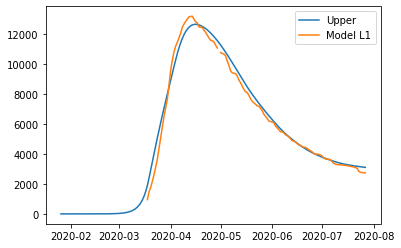

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2498718107107631, 'other': 0.09041091901059377, 'school': 0.0657381690726238, 'transport': 0.18348024486913922, 'work': 0.3282665235389189}
{'home': 1.0, 'leisure': 0.29141386797155383, 'other': 0.10082237918832865, 'school': 0.08465477405340384, 'transport': 0.20173599288489927, 'work': 0.47043176746605875}
{'home': 1.0, 'leisure': 0.3314722803301735, 'other': 0.110862001502573, 'school': 0.10289578599915604, 'transport': 0.21933974990009647, 'work': 0.6075196812529436}
{'home': 1.0, 'leisure': 0.36411246817793763, 'other': 0.11904243449936469, 'school': 0.11775883276976894, 'transport': 0.2336835519124794, 'work': 0.7192209443385535}
{'home': 1.0, 'leisure': 0.38339985190616194, 'other': 0.12387632672474161, 'school': 0.1265415422251311, 'transport': 0.24215943491979658, 'work': 0.7852262361618685}
{'home': 1.0, 'leisure': 0.3937853662213596, 'other': 0.126479191769175

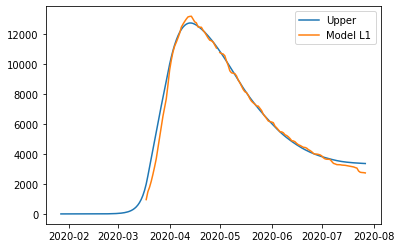

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24909386360360708, 'other': 0.12453696374297328, 'school': 0.2557509531751013, 'transport': 0.25573780089166553, 'work': 0.3379643363082653}
{'home': 1.0, 'leisure': 0.2886470762050967, 'other': 0.15284534553328077, 'school': 0.33719493995231076, 'transport': 0.273713420217906, 'work': 0.4779772835442405}
{'home': 1.0, 'leisure': 0.3267876740708189, 'other': 0.1801427136882201, 'school': 0.41573021291604845, 'transport': 0.29104705313963786, 'work': 0.6129897683789309}
{'home': 1.0, 'leisure': 0.3578651982577036, 'other': 0.2023850136663188, 'school': 0.47972191681242726, 'transport': 0.3051707540388268, 'work': 0.7229999412071971}
{'home': 1.0, 'leisure': 0.37622918982268094, 'other': 0.21552819092610442, 'school': 0.5175351963875601, 'transport': 0.3135165772974384, 'work': 0.7880059524238998}
{'home': 1.0, 'leisure': 0.3861174929730533, 'other': 0.2226052863736813, 's

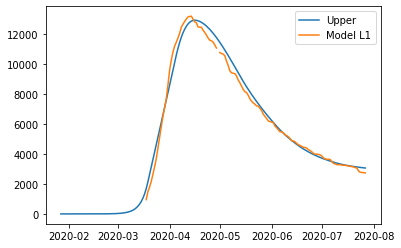

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2995090482651368, 'other': 0.14885810337724595, 'school': 0.15908555750967857, 'transport': 0.2881669229469699, 'work': 0.3660607230553047}
{'home': 1.0, 'leisure': 0.3363480403216649, 'other': 0.17182467716408012, 'school': 0.21572452829078942, 'transport': 0.3132302334334953, 'work': 0.5062637431134427}
{'home': 1.0, 'leisure': 0.3718713540904599, 'other': 0.19397101617281307, 'school': 0.2703406786868606, 'transport': 0.33739842568835915, 'work': 0.6414595124552187}
{'home': 1.0, 'leisure': 0.40081627642058915, 'other': 0.2120161812910399, 'school': 0.3148427271577335, 'transport': 0.3570910267849149, 'work': 0.7516190282151843}
{'home': 1.0, 'leisure': 0.4179200941611201, 'other': 0.2226792334063558, 'school': 0.34113939216324923, 'transport': 0.36872756379651594, 'work': 0.8167132875278913}
{'home': 1.0, 'leisure': 0.4271298421752521, 'other': 0.2284208768530643, 's

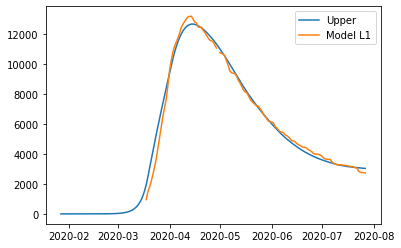

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26506883678500315, 'other': 0.14292447586619492, 'school': 0.32966319724643867, 'transport': 0.2182355308882495, 'work': 0.38928550884441976}
{'home': 1.0, 'leisure': 0.3048895117402388, 'other': 0.1795857595560695, 'school': 0.3922750694234662, 'transport': 0.22463699118480351, 'work': 0.5169216042966186}
{'home': 1.0, 'leisure': 0.34328801973278744, 'other': 0.21493771168559142, 'school': 0.45265080330845703, 'transport': 0.23080982789933774, 'work': 0.6399992677683818}
{'home': 1.0, 'leisure': 0.3745756929119011, 'other': 0.24374300601335003, 'school': 0.5018458457332644, 'transport': 0.23583954670377305, 'work': 0.7402847713379666}
{'home': 1.0, 'leisure': 0.39306386342683197, 'other': 0.2607643162979347, 'school': 0.5309156435297414, 'transport': 0.2388116532700303, 'work': 0.7995443870836304}
{'home': 1.0, 'leisure': 0.4030190321656409, 'other': 0.2699296372204033,

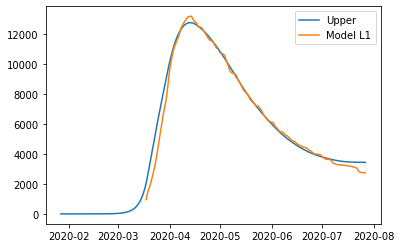

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2585005466557719, 'other': 0.1736025898825591, 'school': 0.28481724060778724, 'transport': 0.10255619766968058, 'work': 0.3505753959139211}
{'home': 1.0, 'leisure': 0.2994465617624221, 'other': 0.21329839141589285, 'school': 0.37352573319269516, 'transport': 0.11916941750202603, 'work': 0.48572374298791066}
{'home': 1.0, 'leisure': 0.3389302191866919, 'other': 0.2515764857516075, 'school': 0.459066065328142, 'transport': 0.13518930805464485, 'work': 0.6160453633806862}
{'home': 1.0, 'leisure': 0.37110208819906, 'other': 0.28276604409922684, 'school': 0.528765595216284, 'transport': 0.14824255220863053, 'work': 0.7222333503673922}
{'home': 1.0, 'leisure': 0.3901127380700047, 'other': 0.30119623766827464, 'school': 0.5699516810592768, 'transport': 0.15595583284507664, 'work': 0.784980797223173}
{'home': 1.0, 'leisure': 0.40034924184666726, 'other': 0.31112018805160807, 'sc

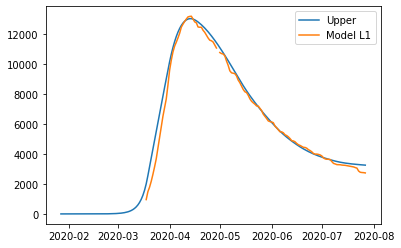

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3089118432110105, 'other': 0.15041242593073825, 'school': 0.19763296575606715, 'transport': 0.2175820409360344, 'work': 0.346193229584223}
{'home': 1.0, 'leisure': 0.3534861919074721, 'other': 0.20156102892219782, 'school': 0.25483557565469284, 'transport': 0.24474781709008986, 'work': 0.4770498351413864}
{'home': 1.0, 'leisure': 0.39646859957906, 'other': 0.2508828960925338, 'school': 0.3099952351997961, 'transport': 0.2709433869529291, 'work': 0.6032329905000796}
{'home': 1.0, 'leisure': 0.43149130212627984, 'other': 0.2910710841572521, 'school': 0.3549401429772877, 'transport': 0.29228792535968695, 'work': 0.7060488948664223}
{'home': 1.0, 'leisure': 0.452186535449637, 'other': 0.3148186498318583, 'school': 0.3814984975730782, 'transport': 0.3049006071454984, 'work': 0.7668037474465339}
{'home': 1.0, 'leisure': 0.46333012262375234, 'other': 0.32760580057972316, 'schoo

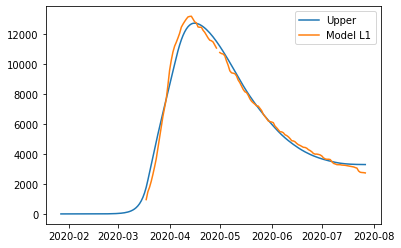

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.21854074051838956, 'other': 0.0830491092800726, 'school': 0.23896550679536607, 'transport': 0.25725989220781587, 'work': 0.35593037477625544}
{'home': 1.0, 'leisure': 0.25936363661329176, 'other': 0.09656894949893921, 'school': 0.3138537627360161, 'transport': 0.2621359589579292, 'work': 0.5077139523029288}
{'home': 1.0, 'leisure': 0.2987285721333759, 'other': 0.10960593828141774, 'school': 0.3860674381073572, 'transport': 0.2668378804669671, 'work': 0.6540766877750781}
{'home': 1.0, 'leisure': 0.3308037047793705, 'other': 0.12022866988195581, 'school': 0.4449082106321537, 'transport': 0.2706690757706276, 'work': 0.7733352129746073}
{'home': 1.0, 'leisure': 0.34975719225200363, 'other': 0.12650573855500102, 'school': 0.47967775803316975, 'transport': 0.2729329639046088, 'work': 0.8438061596834199}
{'home': 1.0, 'leisure': 0.3599629162757292, 'other': 0.1298856986097177, 

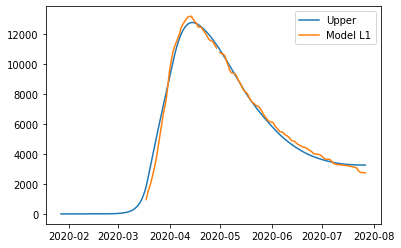

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.25918182421014396, 'other': 0.04687075652761823, 'school': 0.1954646273677763, 'transport': 0.23064354090234918, 'work': 0.32589524849494916}
{'home': 1.0, 'leisure': 0.2964043300785651, 'other': 0.06733634976767389, 'school': 0.2768491550834339, 'transport': 0.23684688215372124, 'work': 0.48183883449618664}
{'home': 1.0, 'leisure': 0.33229746073739974, 'other': 0.08707102896344182, 'school': 0.35532709252353223, 'transport': 0.2428286755032586, 'work': 0.6322130067116656}
{'home': 1.0, 'leisure': 0.3615437153483021, 'other': 0.10315113793777125, 'school': 0.4192720785858346, 'transport': 0.2477027293436224, 'work': 0.7547401099983522}
{'home': 1.0, 'leisure': 0.3788255930729262, 'other': 0.11265302051351138, 'school': 0.4570577521681042, 'transport': 0.2505828520674737, 'work': 0.8271424892132124}
{'home': 1.0, 'leisure': 0.3881312195400315, 'other': 0.11776941882352529

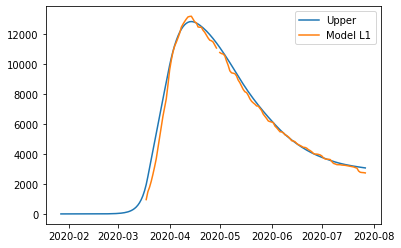

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2699983037516649, 'other': 0.09808996698015626, 'school': 0.27847143767620847, 'transport': 0.29615625191208766, 'work': 0.3541385553901526}
{'home': 1.0, 'leisure': 0.3090871536673032, 'other': 0.11804737124123835, 'school': 0.36078142976282085, 'transport': 0.30395815148444627, 'work': 0.48167089701712607}
{'home': 1.0, 'leisure': 0.34677997322881166, 'other': 0.13729201106442462, 'school': 0.44015177927491134, 'transport': 0.31148141178636346, 'work': 0.6046485121574219}
{'home': 1.0, 'leisure': 0.3774926410196704, 'other': 0.15297282869813197, 'school': 0.5048239159143926, 'transport': 0.31761147573607384, 'work': 0.7048524948643297}
{'home': 1.0, 'leisure': 0.3956410356233596, 'other': 0.16223876639077722, 'school': 0.5430392693831769, 'transport': 0.32123378625181176, 'work': 0.7640639391911388}
{'home': 1.0, 'leisure': 0.4054132481022692, 'other': 0.16722811745604

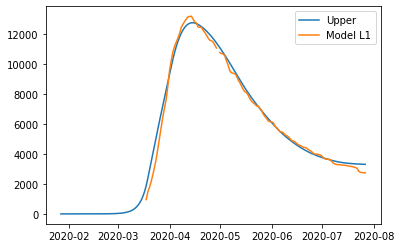

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3380403036828609, 'other': 0.1688837929555952, 'school': 0.19297701133529543, 'transport': 0.3413907491580338, 'work': 0.34945044511256684}
{'home': 1.0, 'leisure': 0.38410915069693397, 'other': 0.19438803956404482, 'school': 0.256873484306125, 'transport': 0.35490458326410934, 'work': 0.4888589188995239}
{'home': 1.0, 'leisure': 0.4285326817462187, 'other': 0.21898142022219272, 'school': 0.3184879403851392, 'transport': 0.3679357804378251, 'work': 0.6232885186226611}
{'home': 1.0, 'leisure': 0.4647296329715618, 'other': 0.2390204711288317, 'school': 0.3686923120050767, 'transport': 0.3785537929497416, 'work': 0.7328237480266987}
{'home': 1.0, 'leisure': 0.48611874051381, 'other': 0.2508617284827548, 'school': 0.39835853159867607, 'transport': 0.38482807307041955, 'work': 0.7975491108563573}
{'home': 1.0, 'leisure': 0.49763595226732826, 'other': 0.25723779013486714, 'sch

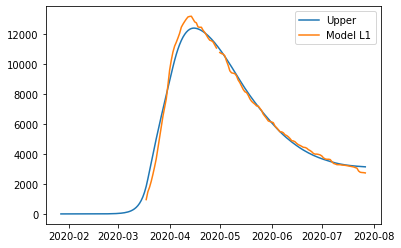

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3193185404511388, 'other': 0.1697600309648711, 'school': 0.13100765787076812, 'transport': 0.2874035433523935, 'work': 0.32377785937783915}
{'home': 1.0, 'leisure': 0.34641594387001295, 'other': 0.1898566976058755, 'school': 0.18779246622003687, 'transport': 0.2973806510048249, 'work': 0.46980085330720356}
{'home': 1.0, 'leisure': 0.3725455828810702, 'other': 0.2092356261525583, 'school': 0.24254924569968886, 'transport': 0.30700143338395525, 'work': 0.6106087403105191}
{'home': 1.0, 'leisure': 0.39383639985304275, 'other': 0.2250258642276332, 'school': 0.2871658808312572, 'transport': 0.31484058939657994, 'work': 0.7253410926835913}
{'home': 1.0, 'leisure': 0.4064173371546629, 'other': 0.2343564594538138, 'school': 0.3135302561362748, 'transport': 0.3194728179494945, 'work': 0.7931374827222246}
{'home': 1.0, 'leisure': 0.41319168800938144, 'other': 0.2393806261140649, '

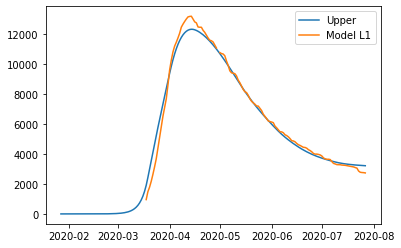

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.30317760881472283, 'other': 0.19381005292534131, 'school': 0.18640169845982524, 'transport': 0.10551682072534829, 'work': 0.3479116618029438}
{'home': 1.0, 'leisure': 0.33592218639589866, 'other': 0.23350585445867506, 'school': 0.2375592738309967, 'transport': 0.1234073087881991, 'work': 0.48306000887693334}
{'home': 1.0, 'leisure': 0.3674973147777467, 'other': 0.2717839487943897, 'school': 0.28688979293891204, 'transport': 0.1406588508488052, 'work': 0.613381629269709}
{'home': 1.0, 'leisure': 0.3932251971629563, 'other': 0.30297350714200905, 'school': 0.32708503073054673, 'transport': 0.15471566289818794, 'work': 0.7195696162564149}
{'home': 1.0, 'leisure': 0.4084280367542165, 'other': 0.32140370071105684, 'school': 0.3508367621528764, 'transport': 0.1630219609273687, 'work': 0.7823170631121958}
{'home': 1.0, 'leisure': 0.41661418114951043, 'other': 0.3313276510943903,

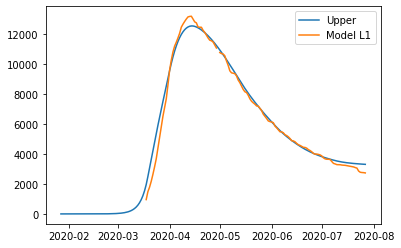

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.25514226842068705, 'other': 0.16800209107972833, 'school': 0.14233166149217386, 'transport': 0.21342301725039944, 'work': 0.2592410390156467}
{'home': 1.0, 'leisure': 0.2876805628064879, 'other': 0.17856519863425954, 'school': 0.20752122369258122, 'transport': 0.21564018779960495, 'work': 0.4155860322190803}
{'home': 1.0, 'leisure': 0.3190567752499388, 'other': 0.1887510523475575, 'school': 0.27038258724297404, 'transport': 0.21777817368633884, 'work': 0.5663472756652483}
{'home': 1.0, 'leisure': 0.34462257798163953, 'other': 0.19705063685468918, 'school': 0.32160295754329415, 'transport': 0.2195202362607146, 'work': 0.6891897703250891}
{'home': 1.0, 'leisure': 0.3597296432321899, 'other': 0.20195493679072152, 'school': 0.3518695399934833, 'transport': 0.22054963687284573, 'work': 0.7617785171695404}
{'home': 1.0, 'leisure': 0.3678642168286401, 'other': 0.204595713679354

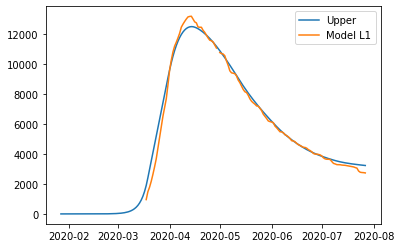

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.34657129867603065, 'other': 0.16898661926762393, 'school': 0.23305870817523633, 'transport': 0.30101866850647085, 'work': 0.35445919387690467}
{'home': 1.0, 'leisure': 0.3820400200028804, 'other': 0.19647915481770883, 'school': 0.29897785622871775, 'transport': 0.3102128836880636, 'work': 0.4857534917667099}
{'home': 1.0, 'leisure': 0.41624200128234257, 'other': 0.2229898140981479, 'school': 0.3625427489945749, 'transport': 0.3190787340417423, 'work': 0.612358707589022}
{'home': 1.0, 'leisure': 0.4441102823248674, 'other': 0.2445910920303575, 'school': 0.4143363653223104, 'transport': 0.3263027602558509, 'work': 0.715518513073869}
{'home': 1.0, 'leisure': 0.4605779029409047, 'other': 0.25735548353575405, 'school': 0.4449416840614267, 'transport': 0.3305715030187333, 'work': 0.7764765799512785}
{'home': 1.0, 'leisure': 0.4694450832726172, 'other': 0.2642286174232753, 'sch

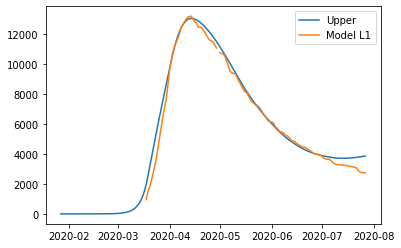

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3449606410806739, 'other': 0.19958665737197728, 'school': 0.22619823004650957, 'transport': 0.1012292321175296, 'work': 0.4498174654357513}
{'home': 1.0, 'leisure': 0.384889281762101, 'other': 0.24076909799935847, 'school': 0.2717884032194038, 'transport': 0.10892196025373904, 'work': 0.5875260509731757}
{'home': 1.0, 'leisure': 0.4233918995620486, 'other': 0.2804807371757617, 'school': 0.31575035592183753, 'transport': 0.11633994809936957, 'work': 0.7203164727414062}
{'home': 1.0, 'leisure': 0.4547644029545984, 'other': 0.31283836909727547, 'school': 0.35157120627196875, 'transport': 0.12238423449210556, 'work': 0.8285160756636682}
{'home': 1.0, 'leisure': 0.47330270041383243, 'other': 0.3319587879599881, 'school': 0.3727380723879553, 'transport': 0.12595585826963138, 'work': 0.8924522046631866}
{'home': 1.0, 'leisure': 0.48328486058418924, 'other': 0.34225439811683345,

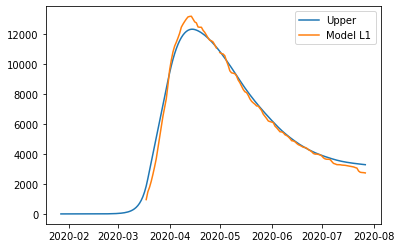

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3913123006870918, 'other': 0.17555830782012813, 'school': 0.3106331593862401, 'transport': 0.2539685605986031, 'work': 0.42782311192596684}
{'home': 1.0, 'leisure': 0.4207621299814518, 'other': 0.19772989388612744, 'school': 0.38466323631919336, 'transport': 0.2551230887393323, 'work': 0.547297414656531}
{'home': 1.0, 'leisure': 0.44916017965815613, 'other': 0.21910963759262672, 'school': 0.4560493819331125, 'transport': 0.2562363837321783, 'work': 0.6625047780038608}
{'home': 1.0, 'leisure': 0.4722993312465819, 'other': 0.23653016950162617, 'school': 0.5142158709518616, 'transport': 0.2571435129856083, 'work': 0.7563774444350184}
{'home': 1.0, 'leisure': 0.4859724662761062, 'other': 0.24682412017512584, 'school': 0.548586978099304, 'transport': 0.25767954390808967, 'work': 0.811847656417066}
{'home': 1.0, 'leisure': 0.4933349235996962, 'other': 0.25236701669162565, 'sch

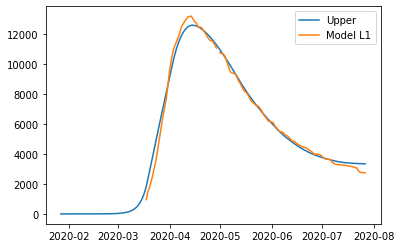

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3525370721185804, 'other': 0.21628763398770176, 'school': 0.3371115921125274, 'transport': 0.3713352046030636, 'work': 0.4162074029176153}
{'home': 1.0, 'leisure': 0.3812297856235515, 'other': 0.259297431807485, 'school': 0.41607646187289415, 'transport': 0.38583881918118884, 'work': 0.543371619897199}
{'home': 1.0, 'leisure': 0.40889775936048794, 'other': 0.30077116541941873, 'school': 0.4922211577132478, 'transport': 0.39982444752438107, 'work': 0.6659942576989403}
{'home': 1.0, 'leisure': 0.431442034257251, 'other': 0.33456457799210554, 'school': 0.5542649839535361, 'transport': 0.41122014469290813, 'work': 0.7659089996114703}
{'home': 1.0, 'leisure': 0.4447636512417018, 'other': 0.3545334126941477, 'school': 0.5909272449137062, 'transport': 0.4179539657470377, 'work': 0.8249495289234198}
{'home': 1.0, 'leisure': 0.4519368296179446, 'other': 0.3652858621490935, 'schoo

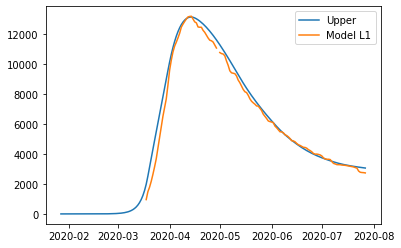

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.34260501690787504, 'other': 0.1563855810647667, 'school': 0.22040085311467159, 'transport': 0.09748786996098463, 'work': 0.34839373548530356}
{'home': 1.0, 'leisure': 0.38872952922701254, 'other': 0.1896952218868898, 'school': 0.268505518217584, 'transport': 0.11156720837836187, 'work': 0.47796093433408243}
{'home': 1.0, 'leisure': 0.4332067375347523, 'other': 0.22181523267965142, 'school': 0.314892159566821, 'transport': 0.1251437132808328, 'work': 0.6029007332239764}
{'home': 1.0, 'leisure': 0.4694474257855032, 'other': 0.24798709332560528, 'school': 0.35268868214768073, 'transport': 0.13620605060877203, 'work': 0.7047035323194455}
{'home': 1.0, 'leisure': 0.49086237793367415, 'other': 0.2634522837073053, 'school': 0.3750229909454615, 'transport': 0.1427428863025543, 'work': 0.7648597317849499}
{'home': 1.0, 'leisure': 0.5023935060134586, 'other': 0.2717796939128361, '

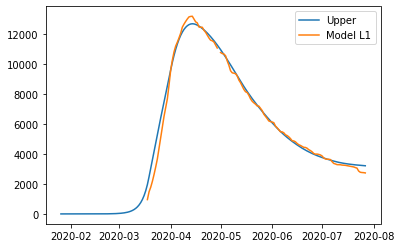

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3055915305507487, 'other': 0.19317566130272437, 'school': 0.2097941852289842, 'transport': 0.16593691609904673, 'work': 0.33478478402844997}
{'home': 1.0, 'leisure': 0.34146108129623165, 'other': 0.20571725802393803, 'school': 0.2645243931670265, 'transport': 0.1862159624133763, 'work': 0.47947427835834944}
{'home': 1.0, 'leisure': 0.3760495766579473, 'other': 0.21781094057653694, 'school': 0.31729995082156726, 'transport': 0.20577075707362266, 'work': 0.6189962907478954}
{'home': 1.0, 'leisure': 0.40423279510082666, 'other': 0.22766505228606193, 'school': 0.3603022570586005, 'transport': 0.221704293463453, 'work': 0.7326808934356734}
{'home': 1.0, 'leisure': 0.4208865150898009, 'other': 0.233487936478054, 'school': 0.38571271074412017, 'transport': 0.23111956496653463, 'work': 0.7998581586602698}
{'home': 1.0, 'leisure': 0.42985390277617164, 'other': 0.23662333565835741

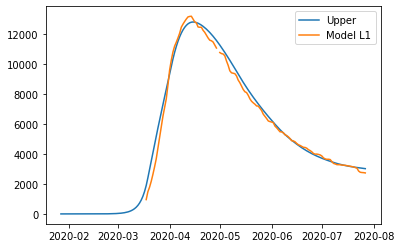

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2752936640280659, 'other': 0.19241347176251877, 'school': 0.24982540786165988, 'transport': 0.1504513294872253, 'work': 0.45217814697089653}
{'home': 1.0, 'leisure': 0.3158008353348325, 'other': 0.20793220269139745, 'school': 0.29456774719308315, 'transport': 0.1621362651231954, 'work': 0.5701270069014575}
{'home': 1.0, 'leisure': 0.3548613219520718, 'other': 0.22289669322995903, 'school': 0.3377121458340984, 'transport': 0.1734038816293094, 'work': 0.683863407548784}
{'home': 1.0, 'leisure': 0.3866883851216742, 'other': 0.23508998181693516, 'school': 0.3728668410230739, 'transport': 0.18258490248614304, 'work': 0.7765375117799391}
{'home': 1.0, 'leisure': 0.40549528608553015, 'other': 0.2422951068910574, 'school': 0.39364006999837753, 'transport': 0.188010051174272, 'work': 0.8312994824619853}
{'home': 1.0, 'leisure': 0.4156220789122218, 'other': 0.24617478962327707, 's

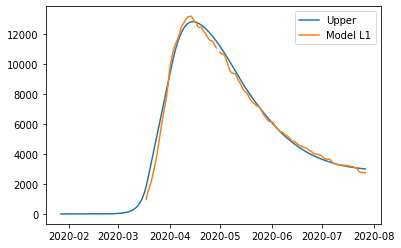

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23387474919268694, 'other': 0.20427005806048348, 'school': 0.15974753695741517, 'transport': 0.17016059662609534, 'work': 0.3684812210765511}
{'home': 1.0, 'leisure': 0.23482732635156575, 'other': 0.21176083110259494, 'school': 0.19280366877349683, 'transport': 0.20885278875144397, 'work': 0.5168510521881723}
{'home': 1.0, 'leisure': 0.23574588289762743, 'other': 0.21898407653605953, 'school': 0.22467922445328983, 'transport': 0.24616311687231582, 'work': 0.6599219607600926}
{'home': 1.0, 'leisure': 0.23649433637960363, 'other': 0.22486968392628998, 'school': 0.2506518994516397, 'transport': 0.276564124970804, 'work': 0.7764982566335092}
{'home': 1.0, 'leisure': 0.23693660434622593, 'other': 0.22834754283869885, 'school': 0.26599938922339195, 'transport': 0.2945283570290016, 'work': 0.8453842496496191}
{'home': 1.0, 'leisure': 0.23717474863594562, 'other': 0.230220236099

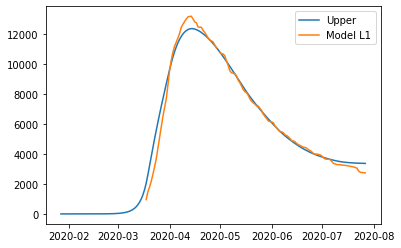

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2009167684290638, 'other': 0.11890935193182317, 'school': 0.14501351898475967, 'transport': 0.25747855950456605, 'work': 0.2589643557393576}
{'home': 1.0, 'leisure': 0.25799214546305205, 'other': 0.13110560834539647, 'school': 0.1976229605848894, 'transport': 0.2850759081008545, 'work': 0.41048169239760623}
{'home': 1.0, 'leisure': 0.3130291161743979, 'other': 0.14286628417277075, 'school': 0.24835349355644307, 'transport': 0.3116876371044184, 'work': 0.5565876956037745}
{'home': 1.0, 'leisure': 0.3578740552725316, 'other': 0.1524490570691498, 'school': 0.2896894833851164, 'transport': 0.33337126814435925, 'work': 0.6756370315495414}
{'home': 1.0, 'leisure': 0.38437333746688324, 'other': 0.1581116046897374, 'school': 0.31411529555660517, 'transport': 0.3461843228497789, 'work': 0.7459843664265853}
{'home': 1.0, 'leisure': 0.39864218172538035, 'other': 0.16116066879313073

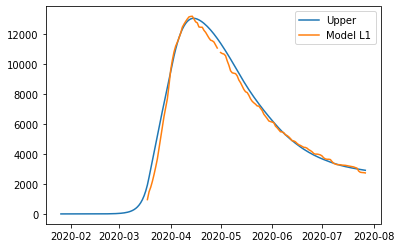

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23434332189335602, 'other': 0.17491549322706976, 'school': 0.2197064590601051, 'transport': 0.15915026471232163, 'work': 0.3397768711693114}
{'home': 1.0, 'leisure': 0.2586561503626522, 'other': 0.18701973620232834, 'school': 0.2657669860290607, 'transport': 0.1673328346465524, 'work': 0.4833738257824025}
{'home': 1.0, 'leisure': 0.2821006635294735, 'other': 0.19869168478561341, 'school': 0.3101824941776964, 'transport': 0.17522316994027495, 'work': 0.6218423177307404}
{'home': 1.0, 'leisure': 0.3012036001839205, 'other': 0.20820216140903086, 'school': 0.34637290822473293, 'transport': 0.18165233203145628, 'work': 0.734668496355312}
{'home': 1.0, 'leisure': 0.31249169911609376, 'other': 0.21382198850468664, 'school': 0.3677581528888909, 'transport': 0.18545138235806344, 'work': 0.8013385109971043}
{'home': 1.0, 'leisure': 0.31856990623341774, 'other': 0.21684804924850132

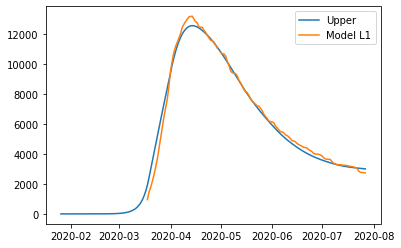

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3345821701550693, 'other': 0.2109674931184633, 'school': 0.21392010362999128, 'transport': 0.1828049721461171, 'work': 0.36993296141931503}
{'home': 1.0, 'leisure': 0.36122377522104615, 'other': 0.23425225667649063, 'school': 0.2537639884224462, 'transport': 0.2034263731737118, 'work': 0.508175737318131}
{'home': 1.0, 'leisure': 0.3869138943918095, 'other': 0.256705421536017, 'school': 0.2921848773294563, 'transport': 0.22331129559317808, 'work': 0.6414812712205606}
{'home': 1.0, 'leisure': 0.40784658408650565, 'other': 0.27500059290303847, 'school': 0.3234907868092423, 'transport': 0.2395138249720025, 'work': 0.750100595141059}
{'home': 1.0, 'leisure': 0.4202159007242806, 'other': 0.2858113759835512, 'school': 0.341989733320025, 'transport': 0.24908804687767147, 'work': 0.8142847410940808}
{'home': 1.0, 'leisure': 0.42687630199077475, 'other': 0.29163256687305805, 'scho

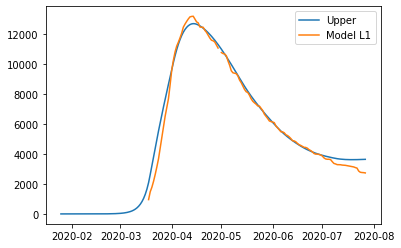

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31041376605832705, 'other': 0.27875934001439495, 'school': 0.21274222849305574, 'transport': 0.19725472119614507, 'work': 0.32377785937783915}
{'home': 1.0, 'leisure': 0.333495138796158, 'other': 0.3385712753702512, 'school': 0.23320587492495343, 'transport': 0.2473676794866382, 'work': 0.46980085330720356}
{'home': 1.0, 'leisure': 0.3557521767933521, 'other': 0.396247070177684, 'school': 0.2529386768414261, 'transport': 0.2956908892667566, 'work': 0.6106087403105191}
{'home': 1.0, 'leisure': 0.3738875410873621, 'other': 0.44324216224299967, 'school': 0.2690172561807743, 'transport': 0.33506535649500124, 'work': 0.7253410926835913}
{'home': 1.0, 'leisure': 0.38460389271564077, 'other': 0.4710119893725043, 'school': 0.27851823488129823, 'transport': 0.358332087129873, 'work': 0.7931374827222246}
{'home': 1.0, 'leisure': 0.3903742359000985, 'other': 0.4859649732114685, 'sc

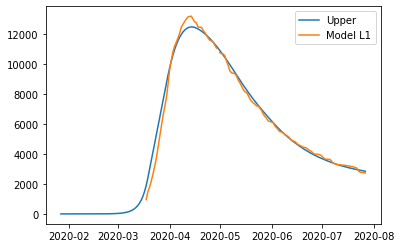

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.29323044926598346, 'other': 0.22976151790685695, 'school': 0.28144562383152116, 'transport': 0.32403219089225765, 'work': 0.490182515851589}
{'home': 1.0, 'leisure': 0.31719124736079585, 'other': 0.2435440629679233, 'school': 0.33625399939911865, 'transport': 0.34368005562302384, 'work': 0.5952026575027816}
{'home': 1.0, 'leisure': 0.3402963026665078, 'other': 0.2568343742768087, 'school': 0.3891049329821591, 'transport': 0.3626262108991198, 'work': 0.6964720798092886}
{'home': 1.0, 'leisure': 0.35912264402671756, 'other': 0.2676635168247894, 'school': 0.4321686566424143, 'transport': 0.3780638189018647, 'work': 0.7789879053923685}
{'home': 1.0, 'leisure': 0.3702473002850233, 'other': 0.27406255560314163, 'school': 0.457615402441656, 'transport': 0.38718604181257754, 'work': 0.8277472568732793}
{'home': 1.0, 'leisure': 0.3762374998087264, 'other': 0.27750819186840825, 's

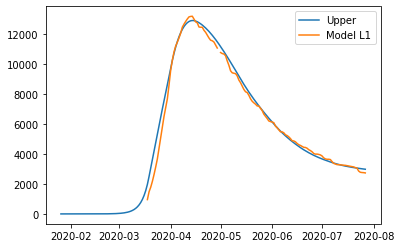

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24700641988392646, 'other': 0.23254885401634434, 'school': 0.2573717880003744, 'transport': 0.2686988375307207, 'work': 0.36951282376324585}
{'home': 1.0, 'leisure': 0.26618890295483993, 'other': 0.2521682294449651, 'school': 0.3028431336599984, 'transport': 0.3084948833122757, 'work': 0.5064899129722671}
{'home': 1.0, 'leisure': 0.28468629734464934, 'other': 0.2710869128939922, 'school': 0.3466905026889214, 'transport': 0.3468696417444894, 'work': 0.6385749632809661}
{'home': 1.0, 'leisure': 0.2997582483289385, 'other': 0.28650213644505135, 'school': 0.3824179885643401, 'transport': 0.3781379634299969, 'work': 0.7461998190880541}
{'home': 1.0, 'leisure': 0.3086644011832912, 'other': 0.29561113217976814, 'school': 0.4035296847634512, 'transport': 0.3966146989714331, 'work': 0.8097963247922425}
{'home': 1.0, 'leisure': 0.3134600219510195, 'other': 0.3005159760369233, 'sch

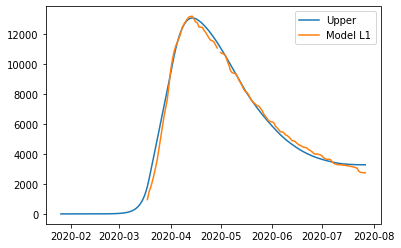

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.35503902531364917, 'other': 0.32484259429729406, 'school': 0.21281210087729385, 'transport': 0.30848560100666667, 'work': 0.43624963916539516}
{'home': 1.0, 'leisure': 0.3965115777312506, 'other': 0.3735438324436774, 'school': 0.24968746866510347, 'transport': 0.3496789252317897, 'work': 0.5652579410738914}
{'home': 1.0, 'leisure': 0.4365029675625091, 'other': 0.4205057406562613, 'school': 0.2852458590319199, 'transport': 0.38940105930601543, 'work': 0.6896588036285127}
{'home': 1.0, 'leisure': 0.4690885444620531, 'other': 0.45877099919984815, 'school': 0.31421936229377034, 'transport': 0.42176724262575493, 'work': 0.7910224694137598}
{'home': 1.0, 'leisure': 0.4883436580845109, 'other': 0.4813822883392404, 'school': 0.33134006876668193, 'transport': 0.4408927145874192, 'work': 0.850919181014133}
{'home': 1.0, 'leisure': 0.4987117961889112, 'other': 0.4935575978758362, '

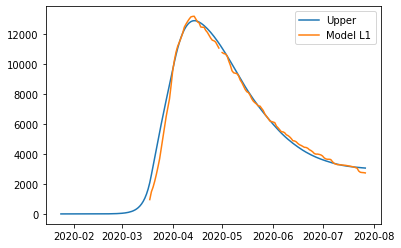

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2733763416962749, 'other': 0.31776938904638274, 'school': 0.31568835141585017, 'transport': 0.1319289712787784, 'work': 0.481055684306802}
{'home': 1.0, 'leisure': 0.2901186155047823, 'other': 0.34766561991004163, 'school': 0.3791843522749584, 'transport': 0.15693449170400328, 'work': 0.6006749625078267}
{'home': 1.0, 'leisure': 0.30626295096298584, 'other': 0.37649412824285566, 'school': 0.44041263881766995, 'transport': 0.18104695782832728, 'work': 0.7160221236302434}
{'home': 1.0, 'leisure': 0.31941759466967024, 'other': 0.3999840239214448, 'school': 0.49030235377839787, 'transport': 0.20069415244814687, 'work': 0.81000869935962}
{'home': 1.0, 'leisure': 0.3271907932236201, 'other': 0.41386441682242925, 'school': 0.5197826398915553, 'transport': 0.2123038583598584, 'work': 0.8655462213815244}
{'home': 1.0, 'leisure': 0.3313763616757469, 'other': 0.421338474538344, 'sc

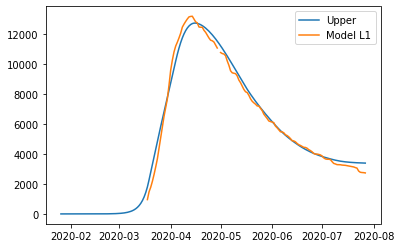

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2707639914329786, 'other': 0.20324627705202128, 'school': 0.23545010445958067, 'transport': 0.1771748075884163, 'work': 0.37000028347929254}
{'home': 1.0, 'leisure': 0.3090513084511406, 'other': 0.21116251782520837, 'school': 0.2897835819362782, 'transport': 0.21019214029038177, 'work': 0.5194664497657613}
{'home': 1.0, 'leisure': 0.3459712212900826, 'other': 0.21879603571363876, 'school': 0.34217657807452223, 'transport': 0.2420302825387056, 'work': 0.6635945386848562}
{'home': 1.0, 'leisure': 0.37605411323292426, 'other': 0.22501593917828572, 'school': 0.3848671675204989, 'transport': 0.26797247251882134, 'work': 0.7810322407670817}
{'home': 1.0, 'leisure': 0.3938303675627852, 'other': 0.2286913366801226, 'school': 0.41009342492039413, 'transport': 0.2833019484161624, 'work': 0.8504272465429421}
{'home': 1.0, 'leisure': 0.4034021968173258, 'other': 0.23067039687341936,

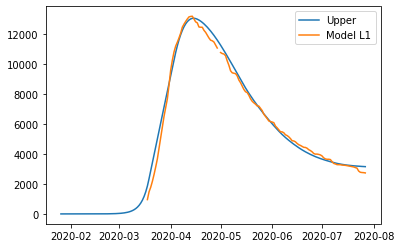

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.27453966445829453, 'other': 0.22955284928030292, 'school': 0.06772292562737353, 'transport': 0.06160794222421799, 'work': 0.3529665588416812}
{'home': 1.0, 'leisure': 0.3068671298462893, 'other': 0.25569103693396245, 'school': 0.07618553811993745, 'transport': 0.08334188554247629, 'work': 0.5061162647486892}
{'home': 1.0, 'leisure': 0.3380400428989986, 'other': 0.2808957178857056, 'school': 0.08434591445205264, 'transport': 0.10429961659936822, 'work': 0.6537963383018754}
{'home': 1.0, 'leisure': 0.3634401942752802, 'other': 0.30143286532786673, 'school': 0.09099510998192428, 'transport': 0.12137628634942833, 'work': 0.7741282500859532}
{'home': 1.0, 'leisure': 0.37844937463399203, 'other': 0.3135684524527801, 'school': 0.09492418006775752, 'transport': 0.13146704574719112, 'work': 0.8452334706856355}
{'home': 1.0, 'leisure': 0.38653124098099073, 'other': 0.3201029993661

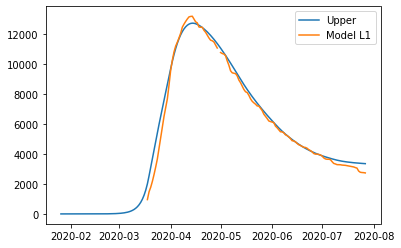

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3332354044439456, 'other': 0.2003706848143939, 'school': 0.2730986048583447, 'transport': 0.28135614438764023, 'work': 0.3907954212141646}
{'home': 1.0, 'leisure': 0.3924289799559976, 'other': 0.21796377828962116, 'school': 0.3332099023609786, 'transport': 0.2850729565282509, 'work': 0.5147597148580373}
{'home': 1.0, 'leisure': 0.449508499199762, 'other': 0.23492854699787596, 'school': 0.39117436780994697, 'transport': 0.2886570253781255, 'work': 0.634296712300343}
{'home': 1.0, 'leisure': 0.4960177371020886, 'other': 0.24875169187126878, 'school': 0.43840467299058794, 'transport': 0.2915773777743196, 'work': 0.7316972287348145}
{'home': 1.0, 'leisure': 0.523500468589827, 'other': 0.25691991384191, 'school': 0.4663134896882393, 'transport': 0.29330304055388884, 'work': 0.7892520793551838}
{'home': 1.0, 'leisure': 0.53829886246784, 'other': 0.26131818721071676, 'school': 

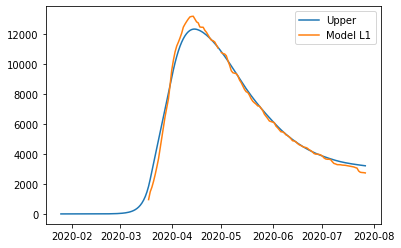

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31021467989301654, 'other': 0.27893237890763245, 'school': 0.2862691992248645, 'transport': 0.03176149346162709, 'work': 0.3540304883474541}
{'home': 1.0, 'leisure': 0.3368037394448768, 'other': 0.29134365184284894, 'school': 0.38358069583280785, 'transport': 0.037669552381683215, 'work': 0.4857713843990429}
{'home': 1.0, 'leisure': 0.36244318972702777, 'other': 0.3033116650303792, 'school': 0.47741678184761044, 'transport': 0.04336660919745162, 'work': 0.6128072484487892}
{'home': 1.0, 'leisure': 0.3833345936606323, 'other': 0.3130633794794779, 'school': 0.5538758148967088, 'transport': 0.048008655491781425, 'work': 0.7163179524893232}
{'home': 1.0, 'leisure': 0.3956795141668531, 'other': 0.31882575619939985, 'school': 0.5990561526075396, 'transport': 0.05075168284752177, 'work': 0.7774833685132752}
{'home': 1.0, 'leisure': 0.4023267790548182, 'other': 0.321928574433204

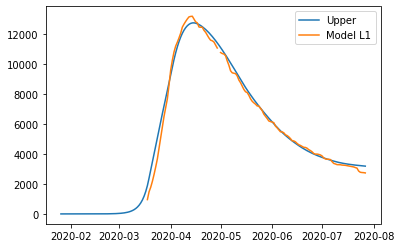

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26880491385698724, 'other': 0.2142070142895134, 'school': 0.24251126672633508, 'transport': 0.09505951253078626, 'work': 0.32208158790578256}
{'home': 1.0, 'leisure': 0.29376943098013275, 'other': 0.23329271513045152, 'school': 0.30456769999239086, 'transport': 0.12419093863654437, 'work': 0.4709498597763796}
{'home': 1.0, 'leisure': 0.317842358206023, 'other': 0.25169678379849897, 'school': 0.36440783207037314, 'transport': 0.15228195666709682, 'work': 0.6145014076515981}
{'home': 1.0, 'leisure': 0.3374573359456373, 'other': 0.2666926916020932, 'school': 0.4131664582079884, 'transport': 0.17517093432162106, 'work': 0.7314693355499243}
{'home': 1.0, 'leisure': 0.3490480046099549, 'other': 0.27555390984967165, 'school': 0.44197837365294285, 'transport': 0.18869623929929447, 'work': 0.8005867474898444}
{'home': 1.0, 'leisure': 0.35528913389074124, 'other': 0.28032533505990

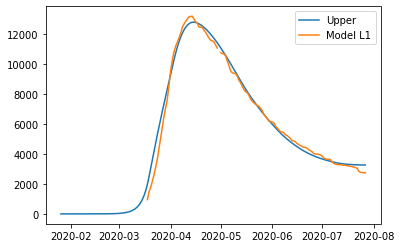

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.27391445438181694, 'other': 0.23312189077653522, 'school': 0.24971431317949846, 'transport': 0.27179765528435096, 'work': 0.31767899453501636}
{'home': 1.0, 'leisure': 0.30830637000921224, 'other': 0.2533127778395508, 'school': 0.312354765170965, 'transport': 0.3263812689754645, 'work': 0.4679104228541444}
{'home': 1.0, 'leisure': 0.3414700029356291, 'other': 0.272782561793173, 'school': 0.37275805816273627, 'transport': 0.3790154678918954, 'work': 0.6127764430190179}
{'home': 1.0, 'leisure': 0.36849222235715395, 'other': 0.2886468301998281, 'school': 0.42197555615603144, 'transport': 0.42190259293491317, 'work': 0.7308154224126187}
{'home': 1.0, 'leisure': 0.3844598974698732, 'other': 0.2980211706219425, 'school': 0.45105862315206946, 'transport': 0.4472449850057873, 'work': 0.8005657284179281}
{'home': 1.0, 'leisure': 0.39305787637672207, 'other': 0.3030688923876964, '

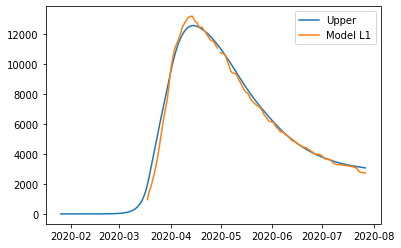

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3294641642600151, 'other': 0.18684988139574016, 'school': 0.1899156959114616, 'transport': 0.08077791681232586, 'work': 0.3585963700578345}
{'home': 1.0, 'leisure': 0.3679427056052233, 'other': 0.2163743037269376, 'school': 0.21735061311160145, 'transport': 0.1086776169854141, 'work': 0.4864363292361012}
{'home': 1.0, 'leisure': 0.40504701333095977, 'other': 0.24484428240344946, 'school': 0.24380571184030772, 'transport': 0.13558089929517775, 'work': 0.6097105755865726}
{'home': 1.0, 'leisure': 0.43528015295933764, 'other': 0.2680420428065332, 'school': 0.2653617182118462, 'transport': 0.15750209228831852, 'work': 0.7101562577980679}
{'home': 1.0, 'leisure': 0.45314519001247006, 'other': 0.28174981031744634, 'school': 0.2780993583404826, 'transport': 0.17045552451153806, 'work': 0.769510524559406}
{'home': 1.0, 'leisure': 0.4627648253487721, 'other': 0.28913091590024564,

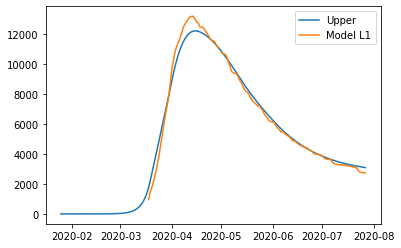

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3206886220572254, 'other': 0.2900813982951019, 'school': 0.2555745130056971, 'transport': 0.25292790736896464, 'work': 0.3650529189016007}
{'home': 1.0, 'leisure': 0.3439677330703201, 'other': 0.2936254763387271, 'school': 0.31812080709085266, 'transport': 0.2710525830735836, 'work': 0.5005733592507721}
{'home': 1.0, 'leisure': 0.3664154472615185, 'other': 0.2970429801665086, 'school': 0.37843330495868127, 'transport': 0.2885299489316091, 'work': 0.6312537838731873}
{'home': 1.0, 'leisure': 0.38470617734323576, 'other': 0.29982761291507126, 'school': 0.42757682173987493, 'transport': 0.3027707655566669, 'work': 0.7377341298618221}
{'home': 1.0, 'leisure': 0.39551433602788677, 'other': 0.3014730777210401, 'school': 0.4566161725651257, 'transport': 0.3111857935623828, 'work': 0.8006543343096516}
{'home': 1.0, 'leisure': 0.40133411378116046, 'other': 0.3023590972319464, 'sc

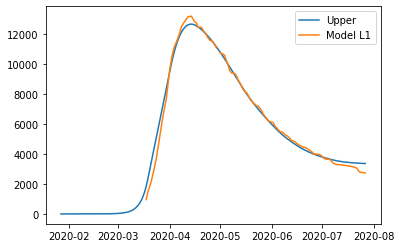

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.29793245148736264, 'other': 0.10334225834680996, 'school': 0.15874791174270209, 'transport': 0.21177747286815102, 'work': 0.3254273227011309}
{'home': 1.0, 'leisure': 0.33919576857852296, 'other': 0.11984618717283418, 'school': 0.22938913060764224, 'transport': 0.24560006272668966, 'work': 0.47617027085591257}
{'home': 1.0, 'leisure': 0.37898539577357043, 'other': 0.13576068996935753, 'school': 0.29750744879883456, 'transport': 0.27821470294742334, 'work': 0.6215295422908806}
{'home': 1.0, 'leisure': 0.41140657348805354, 'other': 0.14872806261837657, 'school': 0.3530112636212875, 'transport': 0.3047895949791322, 'work': 0.7399704301267804}
{'home': 1.0, 'leisure': 0.4305645421375209, 'other': 0.1563906010018878, 'school': 0.3858089723800098, 'transport': 0.3204929402705966, 'work': 0.8099582274843578}
{'home': 1.0, 'leisure': 0.44088037141031095, 'other': 0.1605165832083

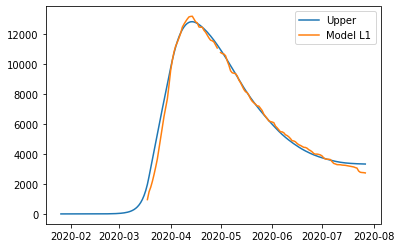

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.25594883671880936, 'other': 0.3102794927070863, 'school': 0.1073713870073845, 'transport': 0.1763168689188281, 'work': 0.3287338322516725}
{'home': 1.0, 'leisure': 0.2877977984879333, 'other': 0.34301021400921844, 'school': 0.14626888021942003, 'transport': 0.20659944223198765, 'work': 0.47701934121051437}
{'home': 1.0, 'leisure': 0.3185092973367313, 'other': 0.37457198097913147, 'school': 0.1837771772453114, 'transport': 0.23580049506967718, 'work': 0.6200089391351118}
{'home': 1.0, 'leisure': 0.34353348158390007, 'other': 0.40028897628794957, 'school': 0.21433949334048216, 'transport': 0.2595939455300168, 'work': 0.7365189818884875}
{'home': 1.0, 'leisure': 0.35832049954813616, 'other': 0.41548538260679657, 'school': 0.2323990437603558, 'transport': 0.2736537117111266, 'work': 0.8053658253336641}
{'home': 1.0, 'leisure': 0.36628273999041716, 'other': 0.4236680629323296

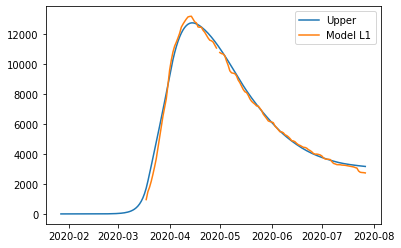

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24157928583766028, 'other': 0.2842534532666879, 'school': 0.3119419470368164, 'transport': 0.2960207687751317, 'work': 0.36105744234262505}
{'home': 1.0, 'leisure': 0.245544426711954, 'other': 0.31299195536668795, 'school': 0.4056038750365095, 'transport': 0.31352050745213284, 'work': 0.5020645514671435}
{'home': 1.0, 'leisure': 0.2493679554121658, 'other': 0.34070408239168803, 'school': 0.49592073417907084, 'transport': 0.33039525546209814, 'work': 0.6380356924086434}
{'home': 1.0, 'leisure': 0.252483423241968, 'other': 0.3632843340416881, 'school': 0.5695122490359726, 'transport': 0.34414505013688473, 'work': 0.7488269924350508}
{'home': 1.0, 'leisure': 0.25432438150503295, 'other': 0.3766272100166881, 'school': 0.6129981441786874, 'transport': 0.3522699288083495, 'work': 0.8142945788142915}
{'home': 1.0, 'leisure': 0.2553156667236064, 'other': 0.38381183554168813, 'sc

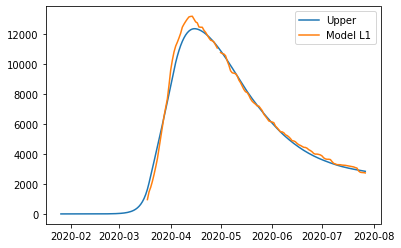

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3218178148018169, 'other': 0.2869681767454094, 'school': 0.3159661953354715, 'transport': 0.2617714253871642, 'work': 0.4244560363202746}
{'home': 1.0, 'leisure': 0.34186751149900085, 'other': 0.32137988240653703, 'school': 0.3869852130508368, 'transport': 0.28721457904552083, 'work': 0.5405593794550032}
{'home': 1.0, 'leisure': 0.3612011475998567, 'other': 0.3545625985797672, 'school': 0.4554678372763676, 'transport': 0.31174904864465036, 'work': 0.6525161746206343}
{'home': 1.0, 'leisure': 0.37695448071907267, 'other': 0.3816003673135103, 'school': 0.5112684940527261, 'transport': 0.3317400979476449, 'work': 0.7437402299407783}
{'home': 1.0, 'leisure': 0.38626326847133663, 'other': 0.3975772306561767, 'school': 0.5442416094205742, 'transport': 0.34355299071759615, 'work': 0.7976453535390451}
{'home': 1.0, 'leisure': 0.39127569264563267, 'other': 0.4061801570714586, 'sc

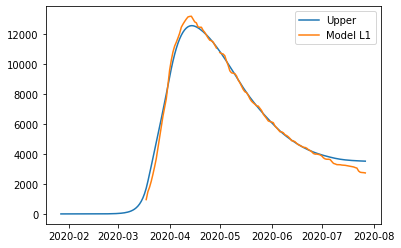

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24339716801035513, 'other': 0.31766717654901555, 'school': 0.3569157606724439, 'transport': 0.12142795135792497, 'work': 0.36570146452993}
{'home': 1.0, 'leisure': 0.2787395050211578, 'other': 0.3545547660886238, 'school': 0.45125735801862366, 'transport': 0.15979306724153225, 'work': 0.4989407659530239}
{'home': 1.0, 'leisure': 0.3128196157101461, 'other': 0.3901249417161031, 'school': 0.5422296126024398, 'transport': 0.19678800041501068, 'work': 0.6274215208967215}
{'home': 1.0, 'leisure': 0.3405885947900625, 'other': 0.41910804778293814, 'school': 0.6163551533744382, 'transport': 0.22693202003784496, 'work': 0.7321095434434381}
{'home': 1.0, 'leisure': 0.35699753697364944, 'other': 0.43623442864061335, 'school': 0.6601566092851644, 'transport': 0.24474439526951972, 'work': 0.7939706476755888}
{'home': 1.0, 'leisure': 0.3658331212263501, 'other': 0.44545632602551544, '

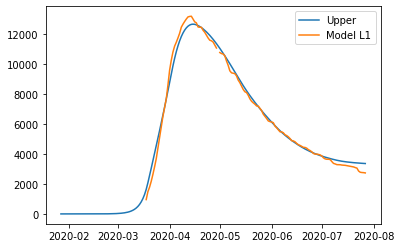

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26541869327067275, 'other': 0.2717393155233958, 'school': 0.16846982886405473, 'transport': 0.21145993801226004, 'work': 0.34254669221159983}
{'home': 1.0, 'leisure': 0.29429913167714944, 'other': 0.27627796134508825, 'school': 0.23517593555133415, 'transport': 0.2449293197889083, 'work': 0.5016595352403862}
{'home': 1.0, 'leisure': 0.3221481258548234, 'other': 0.28065451267314884, 'school': 0.2994996812854964, 'transport': 0.27720336650210486, 'work': 0.6550897767324302}
{'home': 1.0, 'leisure': 0.3448398988884836, 'other': 0.28422059153305007, 'school': 0.3519116222540731, 'transport': 0.30350073789804277, 'work': 0.7801070105407623}
{'home': 1.0, 'leisure': 0.3582486738629192, 'other': 0.2863278199502644, 'school': 0.38288231464459566, 'transport': 0.3190400937229152, 'work': 0.853980830518413}
{'home': 1.0, 'leisure': 0.36546878346453837, 'other': 0.28746248140568753

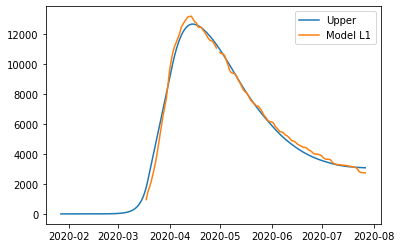

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.37885033358853915, 'other': 0.35732826489703573, 'school': 0.32822783519169507, 'transport': 0.31188253936279337, 'work': 0.3901155359475677}
{'home': 1.0, 'leisure': 0.406453130796376, 'other': 0.3841418675624197, 'school': 0.40387922233855544, 'transport': 0.3155033449651655, 'work': 0.5224631799282742}
{'home': 1.0, 'leisure': 0.43307011381821875, 'other': 0.40999784156118285, 'school': 0.4768287742301709, 'transport': 0.3189948360817387, 'work': 0.6500841223382412}
{'home': 1.0, 'leisure': 0.45475802591009057, 'other': 0.43106567222684167, 'school': 0.5362691498455612, 'transport': 0.32183975476931675, 'work': 0.7540715568945104}
{'home': 1.0, 'leisure': 0.46757361032801487, 'other': 0.4435148448929128, 'school': 0.5713930081637464, 'transport': 0.32352084308470386, 'work': 0.8155186773141243}
{'home': 1.0, 'leisure': 0.47447430962997406, 'other': 0.4502182455592588,

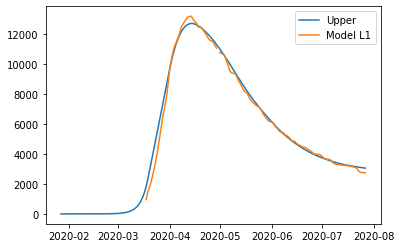

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.20416336574809824, 'other': 0.28877973540172025, 'school': 0.2622879611197252, 'transport': 0.1733582317855895, 'work': 0.38325789919758213}
{'home': 1.0, 'leisure': 0.20595789033966627, 'other': 0.31433223357617507, 'school': 0.3375961434530492, 'transport': 0.18729537951483113, 'work': 0.5155779998649802}
{'home': 1.0, 'leisure': 0.20768832476724974, 'other': 0.33897214253011365, 'school': 0.4102147478458974, 'transport': 0.2007347719680284, 'work': 0.6431723826513998}
{'home': 1.0, 'leisure': 0.20909830837491034, 'other': 0.35904910538147106, 'school': 0.4693854625363663, 'transport': 0.211685388041004, 'work': 0.7471381760329269}
{'home': 1.0, 'leisure': 0.2099314805067098, 'other': 0.3709127652481822, 'school': 0.5043499757625525, 'transport': 0.21815620662958046, 'work': 0.8085725084856474}
{'home': 1.0, 'leisure': 0.2103801116546018, 'other': 0.3773008897917959, '

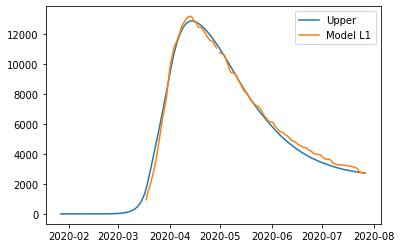

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24201801158899194, 'other': 0.3021562494451215, 'school': 0.2930793819170126, 'transport': 0.21140096820979046, 'work': 0.3766592713456807}
{'home': 1.0, 'leisure': 0.24580192807636553, 'other': 0.3295812755327459, 'school': 0.3824605476392434, 'transport': 0.2253716957194416, 'work': 0.5112217350685346}
{'home': 1.0, 'leisure': 0.24945070468919006, 'other': 0.3560268364029552, 'school': 0.46864952887139455, 'transport': 0.23884346867517658, 'work': 0.6409783965155723}
{'home': 1.0, 'leisure': 0.25242378192926934, 'other': 0.37757507118608863, 'school': 0.5388775876531473, 'transport': 0.24982046886133102, 'work': 0.7467060465835289}
{'home': 1.0, 'leisure': 0.25418060029840706, 'other': 0.39030811901248563, 'school': 0.5803759860241829, 'transport': 0.2563068780622405, 'work': 0.8091814761691396}
{'home': 1.0, 'leisure': 0.25512657942025047, 'other': 0.39716437553439177

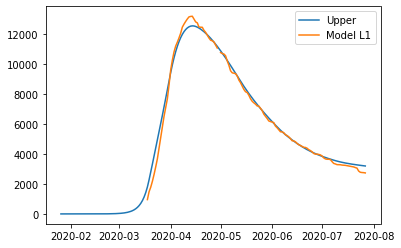

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2830309726093905, 'other': 0.28286394886757193, 'school': 0.3842691731781261, 'transport': 0.28894505730278863, 'work': 0.39506956417868205}
{'home': 1.0, 'leisure': 0.29951297249502573, 'other': 0.3048735399150299, 'school': 0.48042782066396683, 'transport': 0.31089602164091135, 'work': 0.5246300505074382}
{'home': 1.0, 'leisure': 0.3154063295276025, 'other': 0.32609707413936445, 'school': 0.5731522307395991, 'transport': 0.3320630229669582, 'work': 0.6495633766101674}
{'home': 1.0, 'leisure': 0.32835647229488735, 'other': 0.34339032424808147, 'school': 0.6487054537641883, 'transport': 0.349310209232626, 'work': 0.7513609015827616}
{'home': 1.0, 'leisure': 0.33600882938464655, 'other': 0.35360906294868694, 'school': 0.6933505400969, 'transport': 0.35950172838961153, 'work': 0.8115139845211126}
{'home': 1.0, 'leisure': 0.34012932935605533, 'other': 0.35911146071055144, '

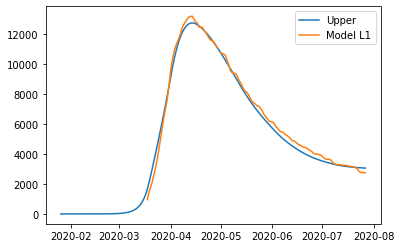

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2661034088035622, 'other': 0.4035728330973787, 'school': 0.284947815482077, 'transport': 0.1813573946411888, 'work': 0.4244560363202746}
{'home': 1.0, 'leisure': 0.2899950106450119, 'other': 0.439109928850992, 'school': 0.3555209173420784, 'transport': 0.1854650808900991, 'work': 0.5628069993563267}
{'home': 1.0, 'leisure': 0.3130333409921241, 'other': 0.47337784261340476, 'school': 0.4235735512785084, 'transport': 0.1894260640586912, 'work': 0.6962168565696627}
{'home': 1.0, 'leisure': 0.33180531386754886, 'other': 0.5012998464198153, 'school': 0.479023845597081, 'transport': 0.19265353182569217, 'work': 0.804921184669418}
{'home': 1.0, 'leisure': 0.34289784329393624, 'other': 0.5177992123054214, 'school': 0.5117899286035102, 'transport': 0.1945606718698291, 'work': 0.8691555603647279}
{'home': 1.0, 'leisure': 0.3488707437542987, 'other': 0.5266834862438248, 'school': 0

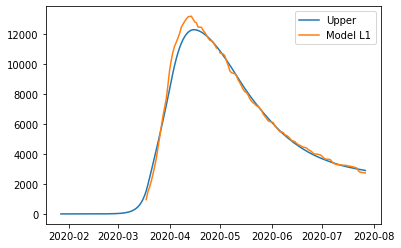

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.22614264548691984, 'other': 0.20347275252769786, 'school': 0.26619804629141675, 'transport': 0.25042751299394894, 'work': 0.3652646140263304}
{'home': 1.0, 'leisure': 0.22842961015058366, 'other': 0.22808794329758136, 'school': 0.3608060550514368, 'transport': 0.25188057398174735, 'work': 0.5013864972414501}
{'home': 1.0, 'leisure': 0.2306348975048309, 'other': 0.25182402011139765, 'school': 0.4520352063557419, 'transport': 0.25328173993426717, 'work': 0.6326468846274584}
{'home': 1.0, 'leisure': 0.2324317983119953, 'other': 0.27116452714487754, 'school': 0.526370070381472, 'transport': 0.2544234307103944, 'work': 0.7395997928679097}
{'home': 1.0, 'leisure': 0.23349360333441066, 'other': 0.282593008573752, 'school': 0.5702952173057669, 'transport': 0.2550980661690151, 'work': 0.802799238646358}
{'home': 1.0, 'leisure': 0.23406534450032662, 'other': 0.28874680626622296, '

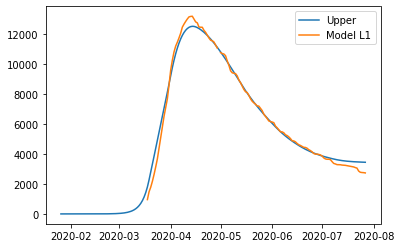

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.25774462370547074, 'other': 0.29817016641922583, 'school': 0.246712125432108, 'transport': 0.31466624085701894, 'work': 0.3571771584479094}
{'home': 1.0, 'leisure': 0.2641429242191272, 'other': 0.323652901016507, 'school': 0.32683789937303726, 'transport': 0.3545115827121973, 'work': 0.5071824666015874}
{'home': 1.0, 'leisure': 0.27031271400015305, 'other': 0.34822553794959954, 'school': 0.4041020385303619, 'transport': 0.3929338766439764, 'work': 0.6518304423212053}
{'home': 1.0, 'leisure': 0.275339950118026, 'other': 0.36824768656174905, 'school': 0.46705800376966344, 'transport': 0.42424093095875937, 'work': 0.7696917558705237}
{'home': 1.0, 'leisure': 0.2783105896422236, 'other': 0.380078956196201, 'school': 0.5042592559565235, 'transport': 0.44274055396294926, 'work': 0.8393370775133028}
{'home': 1.0, 'leisure': 0.2799101647706377, 'other': 0.3864496398455213, 'scho

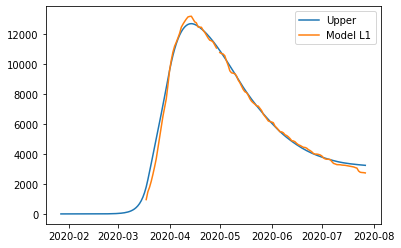

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26375178073128785, 'other': 0.25647409429617773, 'school': 0.36053088295845703, 'transport': 0.30866808847867083, 'work': 0.36036936628483646}
{'home': 1.0, 'leisure': 0.2676644071260164, 'other': 0.28528730546469533, 'school': 0.46775106573714376, 'transport': 0.31850145263977353, 'work': 0.49950897178579634}
{'home': 1.0, 'leisure': 0.27143729686379037, 'other': 0.31307147337719443, 'school': 0.5711419562737345, 'transport': 0.327983625223694, 'work': 0.633679305661722}
{'home': 1.0, 'leisure': 0.27451150331679136, 'other': 0.33571042500960113, 'school': 0.6553863855998456, 'transport': 0.3357098399217032, 'work': 0.7430032814124762}
{'home': 1.0, 'leisure': 0.27632807985720104, 'other': 0.3490879873378414, 'school': 0.7051671847470931, 'transport': 0.34027533042507235, 'work': 0.8076038125379219}
{'home': 1.0, 'leisure': 0.2773062364558832, 'other': 0.3562912901299708

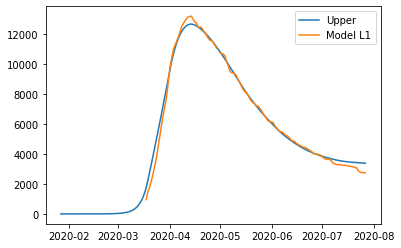

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.20290602358852253, 'other': 0.3018213559223455, 'school': 0.25097403186388717, 'transport': 0.3390957121575113, 'work': 0.35160947595847236}
{'home': 1.0, 'leisure': 0.20291089335485685, 'other': 0.32883560599827333, 'school': 0.33196645057326807, 'transport': 0.3793587731828273, 'work': 0.5033930534851457}
{'home': 1.0, 'leisure': 0.20291558920096492, 'other': 0.3548850614286324, 'school': 0.41006628290017105, 'transport': 0.4181838677429535, 'work': 0.6497557889572951}
{'home': 1.0, 'leisure': 0.20291941544594186, 'other': 0.37611054363114715, 'school': 0.4737031833146846, 'transport': 0.4498191299771304, 'work': 0.7690143141568242}
{'home': 1.0, 'leisure': 0.20292167640888278, 'other': 0.3886528740235422, 'school': 0.5113068062868972, 'transport': 0.4685126940245986, 'work': 0.8394852608656369}
{'home': 1.0, 'leisure': 0.20292289385046636, 'other': 0.39540643654252416

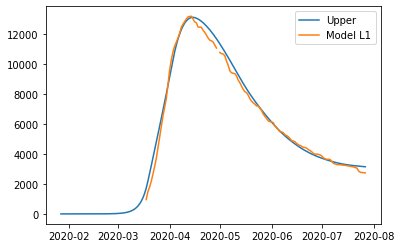

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.27809949129180755, 'other': 0.2937678755948212, 'school': 0.3060530146028416, 'transport': 0.35228221897194334, 'work': 0.360901361582599}
{'home': 1.0, 'leisure': 0.29640702161134824, 'other': 0.32261973956275175, 'school': 0.3978151376255771, 'transport': 0.3825784197258735, 'work': 0.5024646872150695}
{'home': 1.0, 'leisure': 0.31406071156233395, 'other': 0.35044117981754197, 'school': 0.4863000419689291, 'transport': 0.4117926133100204, 'work': 0.6389721797892377}
{'home': 1.0, 'leisure': 0.32844519967054453, 'other': 0.3731105015066303, 'school': 0.5583988529153641, 'transport': 0.43559677104525124, 'work': 0.7502005070718931}
{'home': 1.0, 'leisure': 0.33694512446175984, 'other': 0.38650600977745525, 'school': 0.6010026957473484, 'transport': 0.44966286425243307, 'work': 0.815926336829826}
{'home': 1.0, 'leisure': 0.34152200704164504, 'other': 0.39371897576943793, 

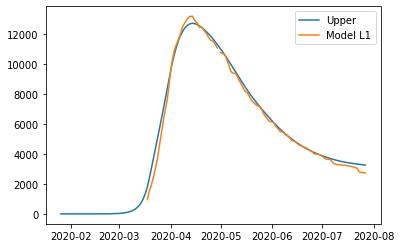

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2816854137991, 'other': 0.21736132536415942, 'school': 0.36900440864882356, 'transport': 0.29017060665965655, 'work': 0.4023030855971438}
{'home': 1.0, 'leisure': 0.29860379215909444, 'other': 0.21791867079460758, 'school': 0.47228118393911894, 'transport': 0.31374648746317346, 'work': 0.541454265266623}
{'home': 1.0, 'leisure': 0.3149179427205177, 'other': 0.2184561110311112, 'school': 0.5718695029690468, 'transport': 0.33648037252370766, 'work': 0.6756357599479066}
{'home': 1.0, 'leisure': 0.3282109542890848, 'other': 0.2188940252978919, 'school': 0.6530155406971361, 'transport': 0.3550042788693281, 'work': 0.7849688296882117}
{'home': 1.0, 'leisure': 0.3360659156705108, 'other': 0.2191527928191714, 'school': 0.7009654720819161, 'transport': 0.3659502235281038, 'work': 0.8495747345347556}
{'home': 1.0, 'leisure': 0.3402955102605094, 'other': 0.21929212917678345, 'schoo

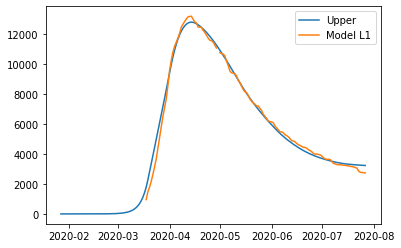

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.18018715786736025, 'other': 0.2682897498762792, 'school': 0.23901950173517308, 'transport': 0.30380677686722857, 'work': 0.3358547863982638}
{'home': 1.0, 'leisure': 0.18899306045778272, 'other': 0.28470851101906697, 'school': 0.3042746717347867, 'transport': 0.3197107085537419, 'work': 0.4968609731993032}
{'home': 1.0, 'leisure': 0.19748446652711865, 'other': 0.3005408878353266, 'school': 0.36719929994869976, 'transport': 0.3350466426800226, 'work': 0.6521169390431627}
{'home': 1.0, 'leisure': 0.20440338999102203, 'other': 0.3134413430189456, 'school': 0.4184712192341104, 'transport': 0.34754258900514023, 'work': 0.7786218001011223}
{'home': 1.0, 'leisure': 0.20849184476514673, 'other': 0.3210643392638114, 'school': 0.4487682624482167, 'transport': 0.35492655728816425, 'work': 0.853374672544462}
{'home': 1.0, 'leisure': 0.21069332041275235, 'other': 0.3251690295495083, 

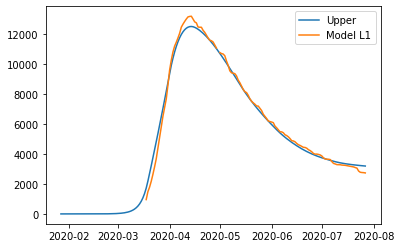

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2012068711667615, 'other': 0.3217141930751767, 'school': 0.22846323450146844, 'transport': 0.35491905570619753, 'work': 0.43463727617970593}
{'home': 1.0, 'leisure': 0.20404451927878767, 'other': 0.36322462666683775, 'school': 0.28024678377628665, 'transport': 0.40431312094156924, 'work': 0.5636795747608918}
{'home': 1.0, 'leisure': 0.20678082281538435, 'other': 0.4032525447730824, 'school': 0.3301809205770042, 'transport': 0.4519431124185349, 'work': 0.6881132198213211}
{'home': 1.0, 'leisure': 0.20901040347483346, 'other': 0.43586788545224475, 'school': 0.3708679950072185, 'transport': 0.49075273510346984, 'work': 0.7895035972779672}
{'home': 1.0, 'leisure': 0.21032788295541704, 'other': 0.45514058676265884, 'school': 0.39491035717052697, 'transport': 0.5136856939627497, 'work': 0.8494160930478035}
{'home': 1.0, 'leisure': 0.2110372949834236, 'other': 0.465518195160574

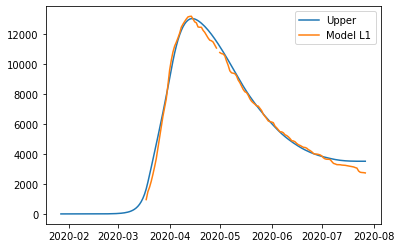

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.37391047385657916, 'other': 0.29024893157685017, 'school': 0.24711550489503376, 'transport': 0.36724888858796, 'work': 0.4072338189340475}
{'home': 1.0, 'leisure': 0.4434985497013118, 'other': 0.3121874164845328, 'school': 0.31633052724776634, 'transport': 0.3793665573735413, 'work': 0.5406893166147939}
{'home': 1.0, 'leisure': 0.5106013371230183, 'other': 0.33334238407408395, 'school': 0.38307358451647283, 'transport': 0.39105145227392335, 'work': 0.6693785465212281}
{'home': 1.0, 'leisure': 0.565277682429594, 'other': 0.35057976507297745, 'school': 0.43745681636504846, 'transport': 0.4005724777483087, 'work': 0.7742364375561004}
{'home': 1.0, 'leisure': 0.5975864319289341, 'other': 0.36076549020868726, 'school': 0.4695923624573886, 'transport': 0.4061985382559, 'work': 0.8361979186221612}
{'home': 1.0, 'leisure': 0.6149834508901173, 'other': 0.36625011143560793, 'schoo

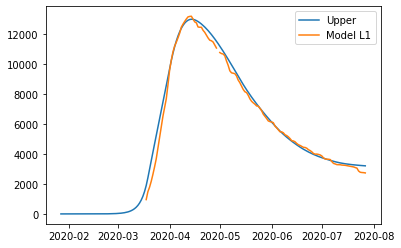

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.22988084917475882, 'other': 0.31919821221418493, 'school': 0.27096680134917733, 'transport': 0.2777067941519227, 'work': 0.347881372528658}
{'home': 1.0, 'leisure': 0.25239917995767114, 'other': 0.3552638377048255, 'school': 0.3320728005896017, 'transport': 0.3166839525774298, 'work': 0.48606878194218806}
{'home': 1.0, 'leisure': 0.27411328464119367, 'other': 0.39004140514222896, 'school': 0.3909964427142967, 'transport': 0.35426906963059746, 'work': 0.6193209267338065}
{'home': 1.0, 'leisure': 0.2918062588277676, 'other': 0.41837868231344655, 'school': 0.4390082992603444, 'transport': 0.3848939798220673, 'work': 0.7278967484158658}
{'home': 1.0, 'leisure': 0.30226119811983404, 'other': 0.4351234370055297, 'school': 0.4673789417648271, 'transport': 0.4029905176624813, 'work': 0.792055188500719}
{'home': 1.0, 'leisure': 0.3078907808155621, 'other': 0.4441398433781898, 'sc

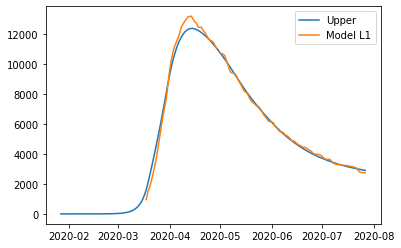

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.22627827954984006, 'other': 0.3137593502453133, 'school': 0.20850335617122837, 'transport': 0.3080481382504143, 'work': 0.3674940281125368}
{'home': 1.0, 'leisure': 0.2292619312352624, 'other': 0.3282835344962009, 'school': 0.2647790191391324, 'transport': 0.3390158827473667, 'work': 0.5116427472419982}
{'home': 1.0, 'leisure': 0.23213902393191962, 'other': 0.3422889978809854, 'school': 0.3190448370010399, 'transport': 0.36887763636942794, 'work': 0.6506432978311218}
{'home': 1.0, 'leisure': 0.23448332168475144, 'other': 0.35370085693525416, 'school': 0.36326142933296446, 'transport': 0.39320943561703336, 'work': 0.7639030057185557}
{'home': 1.0, 'leisure': 0.23586858853869752, 'other': 0.3604442281945949, 'school': 0.38938941571091995, 'transport': 0.40758731699061845, 'work': 0.8308291967429486}
{'home': 1.0, 'leisure': 0.23661450146005308, 'other': 0.36407527425731673

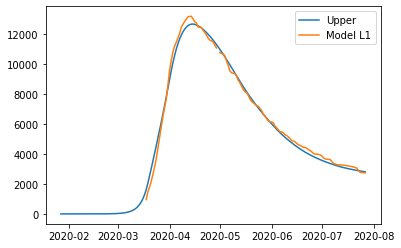

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.12921071792601962, 'other': 0.33072034160189834, 'school': 0.21320801516778104, 'transport': 0.2309774765360565, 'work': 0.34975649704238515}
{'home': 1.0, 'leisure': 0.13986273011546907, 'other': 0.34802637857384844, 'school': 0.2715070570685604, 'transport': 0.254291498137604, 'work': 0.4939154639903794}
{'home': 1.0, 'leisure': 0.15013431329815247, 'other': 0.3647143427968004, 'school': 0.3277239903300262, 'transport': 0.27677287611052476, 'work': 0.6329258964045167}
{'home': 1.0, 'leisure': 0.1585037514470056, 'other': 0.3783119432747612, 'school': 0.37353038039492426, 'transport': 0.29509103594031205, 'work': 0.7461936561493693}
{'home': 1.0, 'leisure': 0.16344932853496427, 'other': 0.3863468890117381, 'school': 0.4005977927060004, 'transport': 0.3059154031124591, 'work': 0.8131246050895095}
{'home': 1.0, 'leisure': 0.16611233158232663, 'other': 0.3906733982547256, 

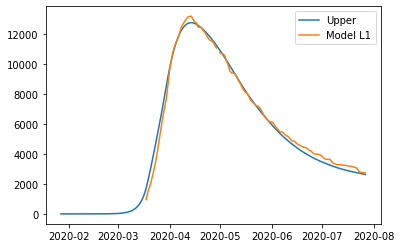

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2178028745257719, 'other': 0.40828021137640447, 'school': 0.28214030350877106, 'transport': 0.3906566134530772, 'work': 0.423772097533018}
{'home': 1.0, 'leisure': 0.2371278545652037, 'other': 0.43438116407468463, 'school': 0.3435222069195646, 'transport': 0.4285769905802357, 'work': 0.5375835748197237}
{'home': 1.0, 'leisure': 0.2557626567460843, 'other': 0.45954993989088344, 'school': 0.40271189949425823, 'transport': 0.46514306852428133, 'work': 0.647330356489047}
{'home': 1.0, 'leisure': 0.27094656963420916, 'other': 0.480057831296675, 'school': 0.45094053788845306, 'transport': 0.49493765055276295, 'work': 0.7367536600714586}
{'home': 1.0, 'leisure': 0.27991888179537394, 'other': 0.4921761307637337, 'school': 0.47943927875775005, 'transport': 0.5125435399332294, 'work': 0.7895947030974292}
{'home': 1.0, 'leisure': 0.2847501268052319, 'other': 0.49870136893830375, 's

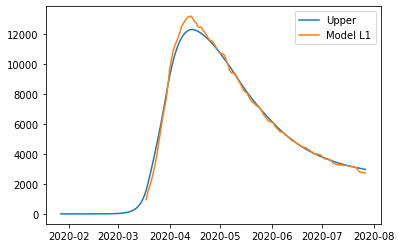

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2852945133917913, 'other': 0.2630839726227311, 'school': 0.2297919957788515, 'transport': 0.35452278643969143, 'work': 0.36747453214916015}
{'home': 1.0, 'leisure': 0.31461500554069016, 'other': 0.28344179998380403, 'school': 0.28711294258452547, 'transport': 0.3801947476798524, 'work': 0.5002748556785803}
{'home': 1.0, 'leisure': 0.34288833725569984, 'other': 0.3030725620819815, 'school': 0.3423867127185682, 'transport': 0.40494985316143617, 'work': 0.6283323105105212}
{'home': 1.0, 'leisure': 0.36592586680126327, 'other': 0.31906799786568174, 'school': 0.38742459949445485, 'transport': 0.42512067985013413, 'work': 0.7326754218550656}
{'home': 1.0, 'leisure': 0.37953895244182345, 'other': 0.32851984628332276, 'school': 0.4140378962256606, 'transport': 0.43703980471163745, 'work': 0.7943327149222965}
{'home': 1.0, 'leisure': 0.38686907547904814, 'other': 0.33360930312359

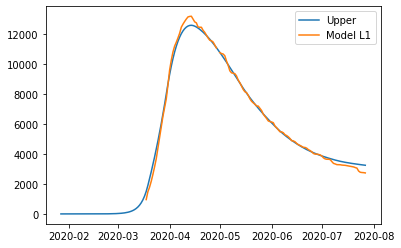

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26024135777739243, 'other': 0.3550380562323975, 'school': 0.3359568609067434, 'transport': 0.3465924780380943, 'work': 0.36289482514193805}
{'home': 1.0, 'leisure': 0.270275524895801, 'other': 0.3943298776288533, 'school': 0.43989312637064015, 'transport': 0.38879368106119083, 'work': 0.5120384130966913}
{'home': 1.0, 'leisure': 0.2799513289028378, 'other': 0.4322184196897214, 'school': 0.5401173823536833, 'transport': 0.4294876982620339, 'work': 0.6558554443387749}
{'home': 1.0, 'leisure': 0.28783531735301593, 'other': 0.463090565072651, 'school': 0.6217815909324594, 'transport': 0.4626457863516097, 'work': 0.7730396920175095}
{'home': 1.0, 'leisure': 0.2924940378008485, 'other': 0.4813331964352912, 'school': 0.6700377141835544, 'transport': 0.48223920204090454, 'work': 0.8422849292822165}
{'home': 1.0, 'leisure': 0.2950025795804506, 'other': 0.49115615178440514, 'schoo

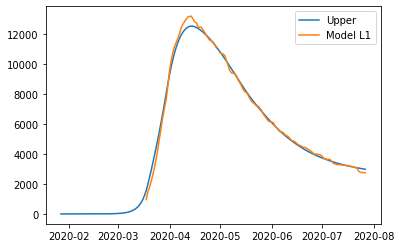

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2754079182827266, 'other': 0.33071174185602714, 'school': 0.20753819176918337, 'transport': 0.30689351556716304, 'work': 0.3928084626887669}
{'home': 1.0, 'leisure': 0.2785575737594371, 'other': 0.362006146886506, 'school': 0.273143895912239, 'transport': 0.33287065017723083, 'work': 0.5346120134321933}
{'home': 1.0, 'leisure': 0.28159474154055086, 'other': 0.3921828945944677, 'school': 0.33640653919304253, 'transport': 0.35792002997979616, 'work': 0.6713511516490688}
{'home': 1.0, 'leisure': 0.28406947084368056, 'other': 0.4167713556898439, 'school': 0.3879538781625862, 'transport': 0.37833063574484943, 'work': 0.7827682272331895}
{'home': 1.0, 'leisure': 0.28553181088643903, 'other': 0.43130090088256623, 'school': 0.41841366937186203, 'transport': 0.3903914482423809, 'work': 0.8486055900783518}
{'home': 1.0, 'leisure': 0.28631922475561666, 'other': 0.4391245021401859, 

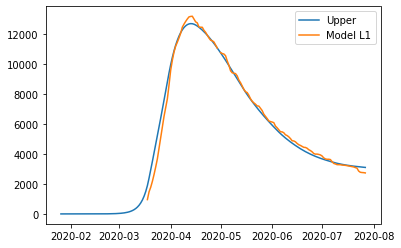

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2981453451891647, 'other': 0.2727721948740173, 'school': 0.15094102596092623, 'transport': 0.298032505036083, 'work': 0.37467043595183347}
{'home': 1.0, 'leisure': 0.3191279300712248, 'other': 0.28431653352743014, 'school': 0.1820683772665447, 'transport': 0.3187434096522605, 'work': 0.5266759566295328}
{'home': 1.0, 'leisure': 0.3393611369217827, 'other': 0.2954485743717925, 'school': 0.2120840374541054, 'transport': 0.3387146391035745, 'work': 0.6732527087116}
{'home': 1.0, 'leisure': 0.35584745361482994, 'other': 0.3045191261709026, 'school': 0.23654124205137705, 'transport': 0.3549874927305712, 'work': 0.7926856178155067}
{'home': 1.0, 'leisure': 0.3655893680243579, 'other': 0.30987899768855853, 'school': 0.25099322658612855, 'transport': 0.36460326987379643, 'work': 0.8632596095587244}
{'home': 1.0, 'leisure': 0.37083501424487286, 'other': 0.31276508235191175, 'scho

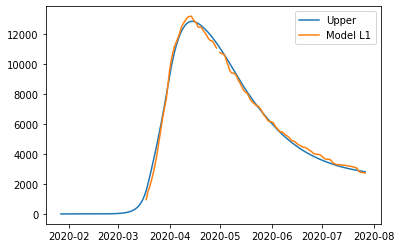

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2965575063669823, 'other': 0.2798273378069966, 'school': 0.17557350539468047, 'transport': 0.32021170058444254, 'work': 0.35949096050840734}
{'home': 1.0, 'leisure': 0.30087005121180693, 'other': 0.2954637400499697, 'school': 0.24156132012843354, 'transport': 0.3469553967752384, 'work': 0.51689047502012}
{'home': 1.0, 'leisure': 0.30502857659788785, 'other': 0.3105416993556938, 'school': 0.305192427193124, 'transport': 0.37274396095922013, 'work': 0.6686685782992715}
{'home': 1.0, 'leisure': 0.30841700469025, 'other': 0.32282744397517266, 'school': 0.35703999591250146, 'transport': 0.3937568651091312, 'work': 0.7923396254156172}
{'home': 1.0, 'leisure': 0.3104192576539186, 'other': 0.33008720215941023, 'school': 0.38767719561031544, 'transport': 0.40617358119771496, 'work': 0.8654179714389124}
{'home': 1.0, 'leisure': 0.31149739386512476, 'other': 0.33399630272015346, 's

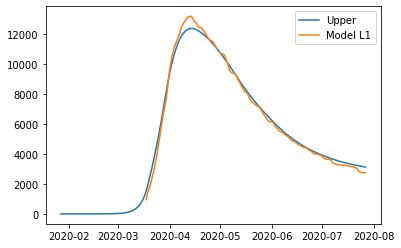

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24437054359228816, 'other': 0.3902881712990272, 'school': 0.17312504856299113, 'transport': 0.29566088487314246, 'work': 0.4160683908711447}
{'home': 1.0, 'leisure': 0.25172326956588675, 'other': 0.428592556531027, 'school': 0.2191439007381927, 'transport': 0.32530348570698964, 'work': 0.5509366698664019}
{'home': 1.0, 'leisure': 0.2588133981832854, 'other': 0.4655289280047411, 'school': 0.26351922247856563, 'transport': 0.3538874222253422, 'work': 0.6809882246118284}
{'home': 1.0, 'leisure': 0.2645905400196843, 'other': 0.4956252306870267, 'school': 0.2996768920447955, 'transport': 0.37717803716622206, 'work': 0.7869561581081019}
{'home': 1.0, 'leisure': 0.26800430565028366, 'other': 0.5134094095447409, 'school': 0.32104278769756767, 'transport': 0.39094067326765114, 'work': 0.8495735733559}
{'home': 1.0, 'leisure': 0.2698424871436833, 'other': 0.5229855058527408, 'scho

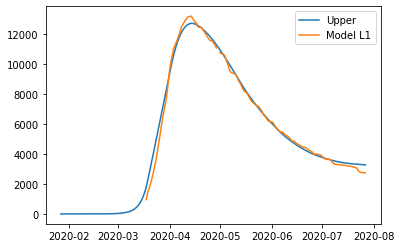

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2792200649445885, 'other': 0.2570737212607028, 'school': 0.18011208442735874, 'transport': 0.25832719939258836, 'work': 0.33821987598170916}
{'home': 1.0, 'leisure': 0.29513228850686074, 'other': 0.28063472261008693, 'school': 0.24879663185935366, 'transport': 0.3034459048892797, 'work': 0.48810849940482415}
{'home': 1.0, 'leisure': 0.31047621837048034, 'other': 0.30335425962556445, 'school': 0.31502815974020587, 'transport': 0.3469532280468034, 'work': 0.6326439577056849}
{'home': 1.0, 'leisure': 0.32297867974083705, 'other': 0.3218664749715091, 'school': 0.3689945898653448, 'transport': 0.3824036395084894, 'work': 0.7504135903952753}
{'home': 1.0, 'leisure': 0.3303664978233206, 'other': 0.3328055113122946, 'school': 0.40088384403019955, 'transport': 0.4033516099176675, 'work': 0.8200047369845787}
{'home': 1.0, 'leisure': 0.3343445537138886, 'other': 0.33869576164964055

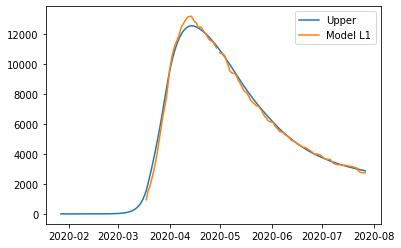

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.35190886369105395, 'other': 0.3543618011029443, 'school': 0.22899713965127702, 'transport': 0.26202474042691626, 'work': 0.42786810140701137}
{'home': 1.0, 'leisure': 0.3701667781788123, 'other': 0.3719687565881017, 'school': 0.28500418607680866, 'transport': 0.28220616470020565, 'work': 0.5611106587945658}
{'home': 1.0, 'leisure': 0.38777262429200776, 'other': 0.38894689223450346, 'school': 0.33901098084428566, 'transport': 0.3016668238208775, 'work': 0.6895945534182789}
{'home': 1.0, 'leisure': 0.40211812853238926, 'other': 0.4027809286871271, 'school': 0.38301651732148906, 'transport': 0.317523657178462, 'work': 0.7942851342227859}
{'home': 1.0, 'leisure': 0.4105950174017056, 'other': 0.41095558659095016, 'school': 0.4090197888762002, 'transport': 0.3268936041624892, 'work': 0.8561477501527219}
{'home': 1.0, 'leisure': 0.41515949602364516, 'other': 0.4153573254622395,

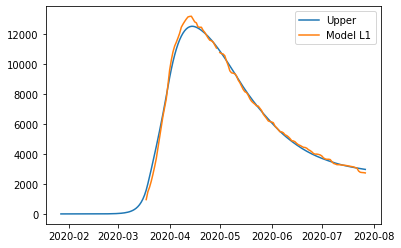

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.21619467885973756, 'other': 0.30692610385764835, 'school': 0.31125676563469284, 'transport': 0.3403876654852562, 'work': 0.38060785280001724}
{'home': 1.0, 'leisure': 0.2169301210848006, 'other': 0.3230239051162472, 'school': 0.39898406466605824, 'transport': 0.3617186660648634, 'work': 0.5242756922092688}
{'home': 1.0, 'leisure': 0.21763929751611136, 'other': 0.3385467849013246, 'school': 0.48357824587487486, 'transport': 0.3822878451951989, 'work': 0.6628125373539043}
{'home': 1.0, 'leisure': 0.21821714497866085, 'other': 0.35119505731879513, 'school': 0.5525068379709476, 'transport': 0.39904791707917603, 'work': 0.7756944111754591}
{'home': 1.0, 'leisure': 0.21855860029744012, 'other': 0.35866903647457316, 'school': 0.5932373696640816, 'transport': 0.408951595919708, 'work': 0.8423973366154689}
{'home': 1.0, 'leisure': 0.21874246085370588, 'other': 0.36269348678922286

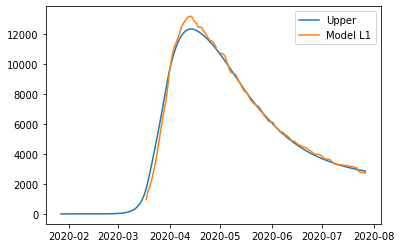

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23366624167332786, 'other': 0.2986451172155311, 'school': 0.17202772599406393, 'transport': 0.15022014533629016, 'work': 0.3360048750457222}
{'home': 1.0, 'leisure': 0.23461881883220664, 'other': 0.30613589025764254, 'school': 0.23597809241889495, 'transport': 0.18384699318717795, 'work': 0.48437470615734335}
{'home': 1.0, 'leisure': 0.23553737537826835, 'other': 0.3133591356911071, 'school': 0.2976445171856963, 'transport': 0.21627288218624835, 'work': 0.6274456147292637}
{'home': 1.0, 'leisure': 0.23628582886024455, 'other': 0.31924474308133755, 'school': 0.34789123366234914, 'transport': 0.2426939769262316, 'work': 0.7440219106026803}
{'home': 1.0, 'leisure': 0.23672809682686682, 'other': 0.32272260199374647, 'school': 0.37758247521673494, 'transport': 0.2583064419998581, 'work': 0.8129079036187901}
{'home': 1.0, 'leisure': 0.23696624111658654, 'other': 0.324595295254

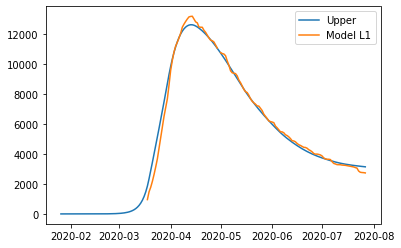

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3069324129490493, 'other': 0.2970990275894277, 'school': 0.21236622968176458, 'transport': 0.36795676078350814, 'work': 0.4163263556698518}
{'home': 1.0, 'leisure': 0.3285042611572079, 'other': 0.32561534592901775, 'school': 0.2728735728051462, 'transport': 0.4043957229178807, 'work': 0.5480672517214406}
{'home': 1.0, 'leisure': 0.3493056862150751, 'other': 0.3531132243279082, 'school': 0.331219939388407, 'transport': 0.4395332935474542, 'work': 0.6751031157711869}
{'home': 1.0, 'leisure': 0.36625499552148544, 'other': 0.3755189030233004, 'school': 0.37876142327106405, 'transport': 0.46816390665303254, 'work': 0.778613819811721}
{'home': 1.0, 'leisure': 0.37627049647527333, 'other': 0.38875862225239577, 'school': 0.406854118292634, 'transport': 0.4850819962154198, 'work': 0.8397792358356728}
{'home': 1.0, 'leisure': 0.381663458527313, 'other': 0.3958877018372933, 'school

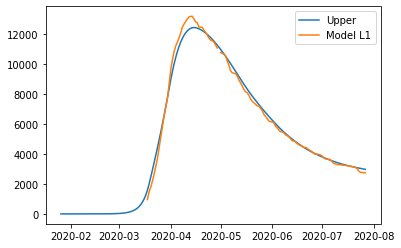

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.36226361819822217, 'other': 0.34935966671440255, 'school': 0.1465218434769333, 'transport': 0.2539177105377137, 'work': 0.40688818428497187}
{'home': 1.0, 'leisure': 0.3706527881370031, 'other': 0.3755777224656772, 'school': 0.1937599373648754, 'transport': 0.274922748671109, 'work': 0.5402003103973}
{'home': 1.0, 'leisure': 0.3787423448636847, 'other': 0.4008594190829779, 'school': 0.23931095647110529, 'transport': 0.29517760687116873, 'work': 0.6687512891484735}
{'home': 1.0, 'leisure': 0.3853338355298697, 'other': 0.42145932003040804, 'school': 0.2764266016687741, 'transport': 0.3116815654045507, 'work': 0.7734965310938742}
{'home': 1.0, 'leisure': 0.38922880728716086, 'other': 0.4336319887720713, 'school': 0.2983585738310329, 'transport': 0.3214339045379128, 'work': 0.8353914467888837}
{'home': 1.0, 'leisure': 0.39132609977185606, 'other': 0.44018650270989, 'school':

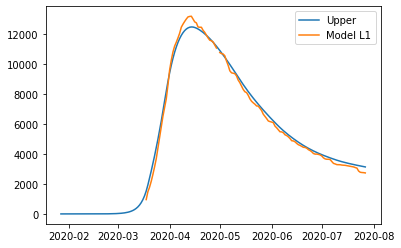

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.38488379957758223, 'other': 0.31970649993456307, 'school': 0.32474159744817566, 'transport': 0.3993207557659275, 'work': 0.47951873746727586}
{'home': 1.0, 'leisure': 0.4122019935618483, 'other': 0.3452949331096228, 'school': 0.3977991955924035, 'transport': 0.43297620844575757, 'work': 0.6025597640184082}
{'home': 1.0, 'leisure': 0.4385445377609621, 'other': 0.3699694936712876, 'school': 0.4682475938029089, 'transport': 0.4654296806727366, 'work': 0.7212064681927144}
{'home': 1.0, 'leisure': 0.460008833034314, 'other': 0.39007469116597737, 'school': 0.5256499923448021, 'transport': 0.4918732506354602, 'work': 0.8178815604828897}
{'home': 1.0, 'leisure': 0.4726922802412947, 'other': 0.4019550351401123, 'school': 0.5595695914831937, 'transport': 0.5074989965225243, 'work': 0.8750077513816299}
{'home': 1.0, 'leisure': 0.47952182873736127, 'other': 0.40835214343387727, 'sch

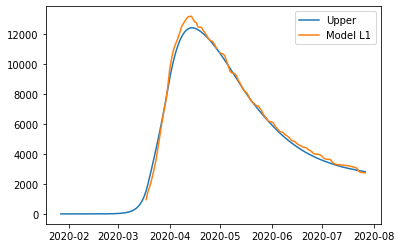

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.23772433337747415, 'other': 0.26055447771075035, 'school': 0.2621448083853782, 'transport': 0.29212789506936016, 'work': 0.37860815168910134}
{'home': 1.0, 'leisure': 0.2474225083462685, 'other': 0.28840753491664545, 'school': 0.3528785818994548, 'transport': 0.2965599183204267, 'work': 0.5149266760947979}
{'home': 1.0, 'leisure': 0.25677431992332017, 'other': 0.31526584007947284, 'school': 0.4403718635023144, 'transport': 0.3008336550268123, 'work': 0.6463766817717196}
{'home': 1.0, 'leisure': 0.26439431454165857, 'other': 0.3371503850269618, 'school': 0.5116626855490889, 'transport': 0.30431595900979314, 'work': 0.7534840938047669}
{'home': 1.0, 'leisure': 0.26889703863431313, 'other': 0.3500821615868417, 'school': 0.5537890803949101, 'transport': 0.30637368409064547, 'work': 0.8167748372788404}
{'home': 1.0, 'leisure': 0.2713215823765117, 'other': 0.35704542588831545,

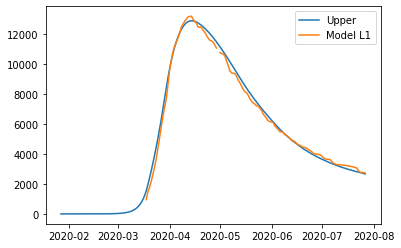

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24441733189082046, 'other': 0.38694283470897434, 'school': 0.29309204217114704, 'transport': 0.28267110837016796, 'work': 0.4134018665378535}
{'home': 1.0, 'leisure': 0.2464705465967537, 'other': 0.4235654188669145, 'school': 0.36442703587754255, 'transport': 0.3105604877173233, 'work': 0.5396327779988858}
{'home': 1.0, 'leisure': 0.24845043220604643, 'other': 0.45888005359064254, 'school': 0.433214351237281, 'transport': 0.3374538178020803, 'work': 0.661355442622024}
{'home': 1.0, 'leisure': 0.25006367233213683, 'other': 0.4876549411433099, 'school': 0.48926327486373467, 'transport': 0.35936690157484524, 'work': 0.7605368730556922}
{'home': 1.0, 'leisure': 0.25101695058846296, 'other': 0.5046582837880678, 'school': 0.5223830933702753, 'transport': 0.37231554198602457, 'work': 0.8191440819483142}
{'home': 1.0, 'leisure': 0.2515302542649463, 'other': 0.5138139298275528, '

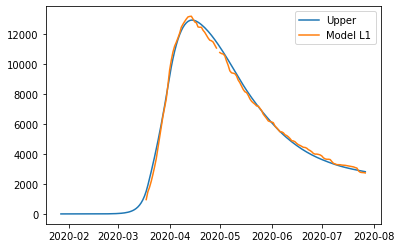

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24988061094381311, 'other': 0.31194772076411004, 'school': 0.11184120573202647, 'transport': 0.1685789028199645, 'work': 0.3613506042019821}
{'home': 1.0, 'leisure': 0.2680411798143814, 'other': 0.3293029408011139, 'school': 0.15076813605549905, 'transport': 0.20023659239255476, 'work': 0.5197406895576044}
{'home': 1.0, 'leisure': 0.2855531569395723, 'other': 0.3460383315510819, 'school': 0.18830481886741904, 'transport': 0.23076365019469536, 'work': 0.6724739861505259}
{'home': 1.0, 'leisure': 0.2998221753378759, 'other': 0.3596745758658706, 'school': 0.21889026412157608, 'transport': 0.2556375491445877, 'work': 0.7969233389299435}
{'home': 1.0, 'leisure': 0.30825386802778265, 'other': 0.36773235659733666, 'school': 0.2369634817717598, 'transport': 0.2703357621604332, 'work': 0.8704615928450539}
{'home': 1.0, 'leisure': 0.3127940102454247, 'other': 0.37207116160658765, 

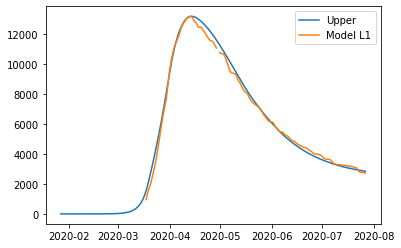

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24160178443557045, 'other': 0.31516968530287276, 'school': 0.21651272928405746, 'transport': 0.3003250922087215, 'work': 0.3332732267964243}
{'home': 1.0, 'leisure': 0.2693179538465501, 'other': 0.3333820730861239, 'school': 0.29116710871298523, 'transport': 0.3239242251657536, 'work': 0.4890803088310448}
{'home': 1.0, 'leisure': 0.2960442600642804, 'other': 0.35094401844854467, 'school': 0.3631552603051656, 'transport': 0.3466805319457488, 'work': 0.6393228522215717}
{'home': 1.0, 'leisure': 0.31782125031576447, 'other': 0.3652537517068135, 'school': 0.4218122727136089, 'transport': 0.36522270784055977, 'work': 0.7617427023916308}
{'home': 1.0, 'leisure': 0.330689471828005, 'other': 0.37370950317760865, 'school': 0.4564732345913253, 'transport': 0.37617944814203896, 'work': 0.8340817047648474}
{'home': 1.0, 'leisure': 0.3376185141807499, 'other': 0.37826260012342144, 's

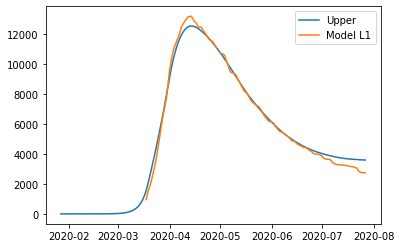

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.27020373634070843, 'other': 0.33334740828660264, 'school': 0.166075535220636, 'transport': 0.354818823472094, 'work': 0.4005795884032065}
{'home': 1.0, 'leisure': 0.2839608745848736, 'other': 0.37884861719712026, 'school': 0.22125870976092138, 'transport': 0.3971250715613647, 'work': 0.548058672645751}
{'home': 1.0, 'leisure': 0.2972266864631758, 'other': 0.42272478293226234, 'school': 0.2744710566390537, 'transport': 0.4379203822188757, 'work': 0.6902706467367761}
{'home': 1.0, 'leisure': 0.30803586651216275, 'other': 0.45847573279052617, 'school': 0.31782926520642074, 'transport': 0.47116100571758834, 'work': 0.8061470700702038}
{'home': 1.0, 'leisure': 0.31442310926838235, 'other': 0.4796012940704094, 'school': 0.3434500248144104, 'transport': 0.49080319233046404, 'work': 0.8746195020399566}
{'home': 1.0, 'leisure': 0.3178623938294236, 'other': 0.4909765962980388, 'sc

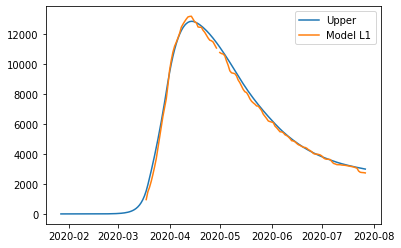

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2689571454730851, 'other': 0.3130970322942652, 'school': 0.2128986685224487, 'transport': 0.31936707118658064, 'work': 0.3662967117757781}
{'home': 1.0, 'leisure': 0.28044613901500537, 'other': 0.3500215941402325, 'school': 0.28648771797781714, 'transport': 0.3512762505001759, 'work': 0.5086488703247929}
{'home': 1.0, 'leisure': 0.291524811359, 'other': 0.385627421634558, 'school': 0.35744858709549393, 'transport': 0.3820458162668571, 'work': 0.6459170232113429}
{'home': 1.0, 'leisure': 0.3005518777133659, 'other': 0.4146395773706751, 'school': 0.41526855452471195, 'transport': 0.4071173142989676, 'work': 0.7577651477855687}
{'home': 1.0, 'leisure': 0.30588605328640034, 'other': 0.43178312394201707, 'school': 0.4494348989147045, 'transport': 0.4219322904088511, 'work': 0.8238572213976114}
{'home': 1.0, 'leisure': 0.30875830167188045, 'other': 0.4410142644035089, 'school'

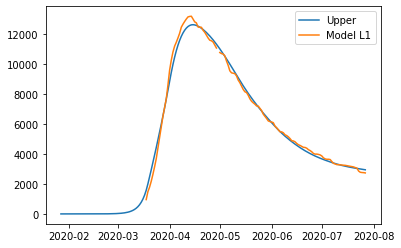

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2766545082356155, 'other': 0.30305768689344564, 'school': 0.24574828366389165, 'transport': 0.2770958944078833, 'work': 0.3567429874619863}
{'home': 1.0, 'leisure': 0.28105014004985945, 'other': 0.32559074537541444, 'school': 0.32100927084257935, 'transport': 0.31375018574573643, 'work': 0.5013061446116323}
{'home': 1.0, 'leisure': 0.2852887850135947, 'other': 0.34731905176874145, 'school': 0.39358236562202825, 'transport': 0.3490953952500948, 'work': 0.6407063318630766}
{'home': 1.0, 'leisure': 0.2887424957247864, 'other': 0.3650235977188597, 'school': 0.45271599840528287, 'transport': 0.3778951955869795, 'work': 0.7542916696235127}
{'home': 1.0, 'leisure': 0.2907833247813997, 'other': 0.37548537487120237, 'school': 0.4876585995953879, 'transport': 0.3949132594224113, 'work': 0.821410278300134}
{'home': 1.0, 'leisure': 0.29188223273496067, 'other': 0.38111863949169456, 

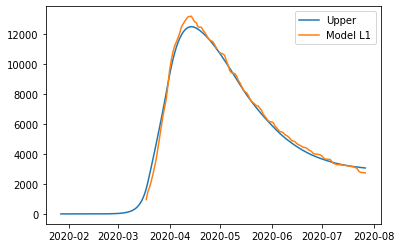

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2784615854662458, 'other': 0.29298884325526114, 'school': 0.1937509897071622, 'transport': 0.2568383851309507, 'work': 0.36548650558496454}
{'home': 1.0, 'leisure': 0.28782930955181496, 'other': 0.32054097453981134, 'school': 0.2609065992922379, 'transport': 0.28124150311500584, 'work': 0.5113366899245492}
{'home': 1.0, 'leisure': 0.2968624720628995, 'other': 0.34710910113562754, 'school': 0.3256637942492751, 'transport': 0.304773081171059, 'work': 0.6519779391091486}
{'home': 1.0, 'leisure': 0.304222826701561, 'other': 0.36875720428777414, 'school': 0.3784289160661203, 'transport': 0.3239469595871023, 'work': 0.7665745125188222}
{'home': 1.0, 'leisure': 0.30857212716986093, 'other': 0.38154926524131527, 'school': 0.4096083062306197, 'transport': 0.33527697865112793, 'work': 0.8342906695336294}
{'home': 1.0, 'leisure': 0.3109140581912533, 'other': 0.38843729806245286, 's

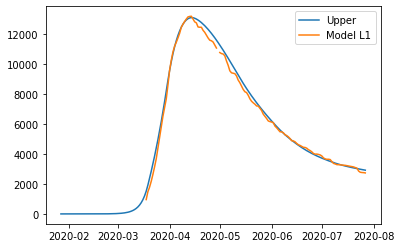

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.34573344968976455, 'other': 0.41279627180403633, 'school': 0.2792016760360053, 'transport': 0.27465620606396857, 'work': 0.4915387539579033}
{'home': 1.0, 'leisure': 0.3589482108648465, 'other': 0.45322622291068837, 'school': 0.34041080751173025, 'transport': 0.3135773458756804, 'work': 0.6146242839722685}
{'home': 1.0, 'leisure': 0.3716910162836755, 'other': 0.49221224719210277, 'school': 0.3994338985776078, 'transport': 0.3511084449798312, 'work': 0.7333139022004064}
{'home': 1.0, 'leisure': 0.38207404292123986, 'other': 0.5239786373473294, 'school': 0.4475267875942488, 'transport': 0.3816893405461762, 'work': 0.8300239614974076}
{'home': 1.0, 'leisure': 0.3882094677525279, 'other': 0.5427496860754177, 'school': 0.47594531292226394, 'transport': 0.399759869744471, 'work': 0.8871708147183629}
{'home': 1.0, 'leisure': 0.3915131580462984, 'other': 0.5528571738520808, 'sch

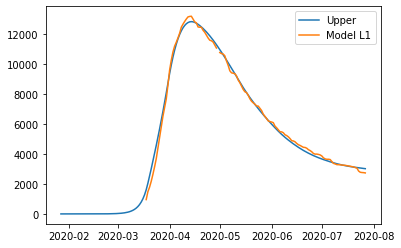

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2830135695144302, 'other': 0.32892219282211443, 'school': 0.24922115472693124, 'transport': 0.18965236659972184, 'work': 0.39347880375906813}
{'home': 1.0, 'leisure': 0.2880451736571403, 'other': 0.3686254892344947, 'school': 0.31926215617055076, 'transport': 0.20651777804992671, 'work': 0.5367727252704864}
{'home': 1.0, 'leisure': 0.29289707765189643, 'other': 0.40691081077500413, 'school': 0.3868016932768981, 'transport': 0.22278085337690998, 'work': 0.6749490067279252}
{'home': 1.0, 'leisure': 0.2968504809068829, 'other': 0.43810625795616004, 'school': 0.4418339086968848, 'transport': 0.23603224808778522, 'work': 0.7875370879154681}
{'home': 1.0, 'leisure': 0.299186582830284, 'other': 0.45653993129047943, 'school': 0.4743529450814225, 'transport': 0.24386261768966605, 'work': 0.854066408617198}
{'home': 1.0, 'leisure': 0.3004444838659615, 'other': 0.4664657553935745, 

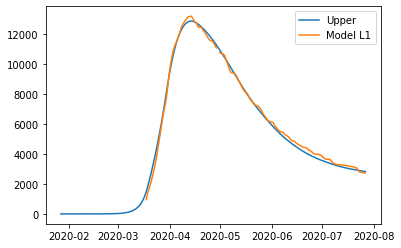

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.43003282251149494, 'other': 0.3255443820552796, 'school': 0.14067107785526284, 'transport': 0.31317091863714824, 'work': 0.47951873746727586}
{'home': 1.0, 'leisure': 0.45225707973859036, 'other': 0.3763917556102906, 'school': 0.1681637169867136, 'transport': 0.34899766218690165, 'work': 0.6104977899935149}
{'home': 1.0, 'leisure': 0.4736876134932895, 'other': 0.4254231515383369, 'school': 0.19467447614918398, 'transport': 0.3835448791813067, 'work': 0.7367990192152454}
{'home': 1.0, 'leisure': 0.49114952988600735, 'other': 0.4653746593315598, 'school': 0.21627583546675241, 'transport': 0.4116944633989701, 'work': 0.8397111319144331}
{'home': 1.0, 'leisure': 0.5014679350271588, 'other': 0.4889823684821006, 'school': 0.22904027506349742, 'transport': 0.4283283086184984, 'work': 0.9005228348730441}
{'home': 1.0, 'leisure': 0.5070239993339327, 'other': 0.5016942118708534, '

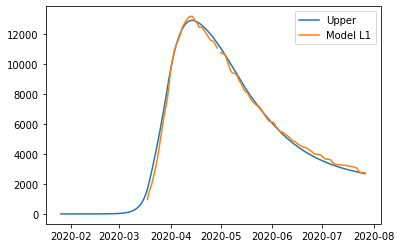

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31540437466152116, 'other': 0.35131054193971173, 'school': 0.22545091646965065, 'transport': 0.21898786758495414, 'work': 0.4579709699636607}
{'home': 1.0, 'leisure': 0.3291462669698753, 'other': 0.39169448213603025, 'school': 0.2615073568009214, 'transport': 0.2585272932221193, 'work': 0.5787323712006042}
{'home': 1.0, 'leisure': 0.3423973774100739, 'other': 0.4306361387539088, 'school': 0.2962760671203611, 'transport': 0.2966545965151001, 'work': 0.695180865250514}
{'home': 1.0, 'leisure': 0.353194578509495, 'other': 0.4623663774795877, 'school': 0.3246061273806452, 'transport': 0.3277212880871585, 'work': 0.7900648233652553}
{'home': 1.0, 'leisure': 0.35957474279551654, 'other': 0.481116063999307, 'school': 0.3413466175344495, 'transport': 0.3460788785615566, 'work': 0.8461326167966934}
{'home': 1.0, 'leisure': 0.36301021587260507, 'other': 0.4912120490483866, 'school

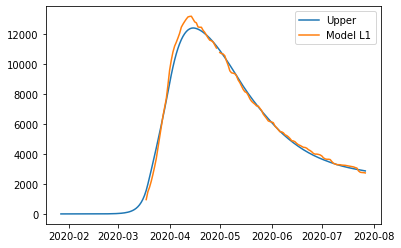

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.26791464960401923, 'other': 0.3402192042849981, 'school': 0.1986263335805297, 'transport': 0.26568821234534523, 'work': 0.3901155359475677}
{'home': 1.0, 'leisure': 0.27030877928227487, 'other': 0.3780221145403469, 'school': 0.23953509249625146, 'transport': 0.28082859344540323, 'work': 0.5191332176281818}
{'home': 1.0, 'leisure': 0.27261740432916426, 'other': 0.4144749208580047, 'school': 0.27898282430784027, 'transport': 0.29542824664903056, 'work': 0.6435431249630597}
{'home': 1.0, 'leisure': 0.2744985062192223, 'other': 0.44417720748720735, 'school': 0.3111254205987646, 'transport': 0.3073242603705047, 'work': 0.7449141605692564}
{'home': 1.0, 'leisure': 0.2756100664269838, 'other': 0.46172855867719065, 'school': 0.3301187729524925, 'transport': 0.314353723024103, 'work': 0.8048152270638271}
{'home': 1.0, 'leisure': 0.27620859884654775, 'other': 0.4711792862410279, '

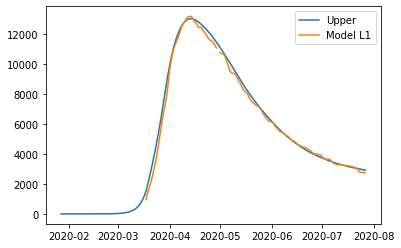

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3151594888027731, 'other': 0.400924258536927, 'school': 0.23785403476998684, 'transport': 0.20636807967220566, 'work': 0.4561503763801509}
{'home': 1.0, 'leisure': 0.3316814498942091, 'other': 0.43821013332929737, 'school': 0.30448499308832583, 'transport': 0.24367021180918289, 'work': 0.5846801672509846}
{'home': 1.0, 'leisure': 0.3476133409466653, 'other': 0.474164369736226, 'school': 0.36873627432386696, 'transport': 0.2796401249412681, 'work': 0.70861960844786}
{'home': 1.0, 'leisure': 0.36059488180422217, 'other': 0.5034604142159456, 'school': 0.421089170145419, 'transport': 0.3089489430488931, 'work': 0.8096073012749436}
{'home': 1.0, 'leisure': 0.3682657923109603, 'other': 0.5207717132266889, 'school': 0.45202497222179067, 'transport': 0.32626779011248963, 'work': 0.8692818470364021}
{'home': 1.0, 'leisure': 0.3723962825838193, 'other': 0.5300931819247816, 'school

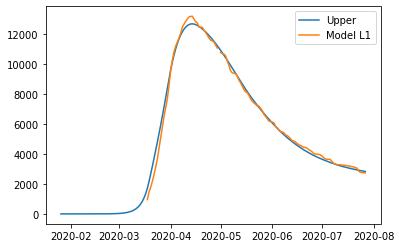

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2828725339717667, 'other': 0.300485757397818, 'school': 0.24722949150182402, 'transport': 0.2653951074232097, 'work': 0.3753162091782078}
{'home': 1.0, 'leisure': 0.28370826645384056, 'other': 0.33038931006860595, 'school': 0.3258123239876037, 'transport': 0.2986410315867542, 'work': 0.5102587057586037}
{'home': 1.0, 'leisure': 0.28451415134726893, 'other': 0.3592248787154372, 'school': 0.40158862674174833, 'transport': 0.3306996013158864, 'work': 0.6403818274611282}
{'home': 1.0, 'leisure': 0.28517079829746983, 'other': 0.38272052724248484, 'school': 0.463332280837718, 'transport': 0.3568213988729571, 'work': 0.7464080747742963}
{'home': 1.0, 'leisure': 0.28555881694986124, 'other': 0.39660431955392206, 'school': 0.4998171673489728, 'transport': 0.372257006520317, 'work': 0.8090599481866229}
{'home': 1.0, 'leisure': 0.28576775007037974, 'other': 0.40408020772161907, 'sc

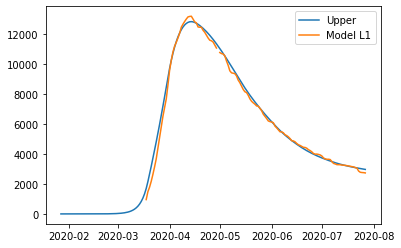

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2235605263462567, 'other': 0.32838324925369955, 'school': 0.16618447329886016, 'transport': 0.3210998899552169, 'work': 0.4068374907630597}
{'home': 1.0, 'leisure': 0.22536536736423335, 'other': 0.3609269775017203, 'school': 0.2156924305063068, 'transport': 0.35586919870650413, 'work': 0.5421960047018763}
{'home': 1.0, 'leisure': 0.22710574977442513, 'other': 0.3923084297408832, 'school': 0.263432246384916, 'transport': 0.38939674643095973, 'work': 0.6727202860000209}
{'home': 1.0, 'leisure': 0.2285238391456925, 'other': 0.41787850193575665, 'school': 0.3023313556193384, 'transport': 0.4167154890212569, 'work': 0.7790734040948053}
{'home': 1.0, 'leisure': 0.22936180104689594, 'other': 0.4329880900509092, 'school': 0.32531719289422434, 'transport': 0.43285838237006885, 'work': 0.8419184284235417}
{'home': 1.0, 'leisure': 0.2298130113013901, 'other': 0.44112402211291435, '

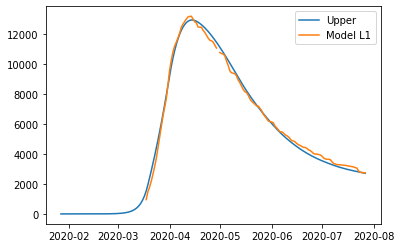

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.29898075454650824, 'other': 0.2864677188859393, 'school': 0.12504712015495661, 'transport': 0.28836625551720907, 'work': 0.347881372528658}
{'home': 1.0, 'leisure': 0.32287208160790454, 'other': 0.31093823368003504, 'school': 0.16467663648448824, 'transport': 0.32971994415625727, 'work': 0.4944943975300937}
{'home': 1.0, 'leisure': 0.34591014698853667, 'other': 0.33453480151719883, 'school': 0.20289081294510805, 'transport': 0.36959671534391086, 'work': 0.6358712430671926}
{'home': 1.0, 'leisure': 0.36468190396534805, 'other': 0.3537616345697026, 'school': 0.23402829006116863, 'transport': 0.40208889927459157, 'work': 0.7510671912826064}
{'home': 1.0, 'leisure': 0.37577430581528204, 'other': 0.36512294500981846, 'school': 0.25242770835702266, 'transport': 0.4212888261427211, 'work': 0.8191375243189873}
{'home': 1.0, 'leisure': 0.3817471375806311, 'other': 0.3712405737083

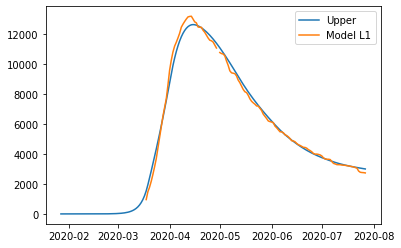

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.2861934812695534, 'other': 0.31741853084970684, 'school': 0.151095249619877, 'transport': 0.20714299635995165, 'work': 0.3772457310848961}
{'home': 1.0, 'leisure': 0.3071682671174493, 'other': 0.33725906615290907, 'school': 0.19323134475326892, 'transport': 0.2322057243655477, 'work': 0.5206831802897753}
{'home': 1.0, 'leisure': 0.3273939534707776, 'other': 0.3563910109095683, 'school': 0.23386257934618257, 'transport': 0.2563733549423725, 'work': 0.6589978634516233}
{'home': 1.0, 'leisure': 0.34387414235126723, 'other': 0.3719800029335129, 'school': 0.26696951123670476, 'transport': 0.27606549837534083, 'work': 0.7716987163983141}
{'home': 1.0, 'leisure': 0.3536124357806475, 'other': 0.38119168003857107, 'school': 0.28653269826292244, 'transport': 0.2877017649493676, 'work': 0.8382946749577223}
{'home': 1.0, 'leisure': 0.3588561322426215, 'other': 0.38615181386437164, '

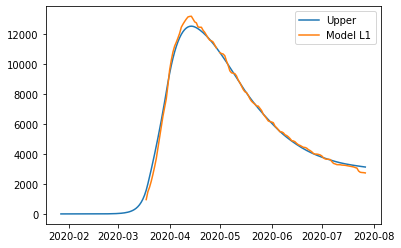

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31926954617370734, 'other': 0.3552491463129946, 'school': 0.2852721465680397, 'transport': 0.2783835343061989, 'work': 0.3938535517454039}
{'home': 1.0, 'leisure': 0.3271715069757524, 'other': 0.38968487951147757, 'school': 0.36697632167783945, 'transport': 0.31551750108335225, 'work': 0.5322909097495361}
{'home': 1.0, 'leisure': 0.3347912548920102, 'other': 0.422890765095729, 'school': 0.44576249053371775, 'transport': 0.35132525476132154, 'work': 0.6657840763963778}
{'home': 1.0, 'leisure': 0.3409999383793314, 'other': 0.4499474126088227, 'school': 0.509958628119989, 'transport': 0.3805019429433706, 'work': 0.7745562862567674}
{'home': 1.0, 'leisure': 0.3446687058945666, 'other': 0.46593543159383266, 'school': 0.5478927094209675, 'transport': 0.3977427132327632, 'work': 0.8388307739015431}
{'home': 1.0, 'leisure': 0.3466441960950779, 'other': 0.4745443648934534, 'schoo

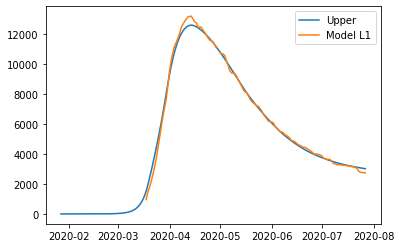

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.29582728791118074, 'other': 0.31224546974098777, 'school': 0.2509527127469938, 'transport': 0.31690519297233827, 'work': 0.3916483379024783}
{'home': 1.0, 'leisure': 0.31833075959971857, 'other': 0.3530838256758903, 'school': 0.31589128357753127, 'transport': 0.34629622303122864, 'work': 0.5277267021877597}
{'home': 1.0, 'leisure': 0.34003053587080867, 'other': 0.392463668898832, 'school': 0.37851061973554956, 'transport': 0.3746375734451587, 'work': 0.658945124891424}
{'home': 1.0, 'leisure': 0.35771183505465987, 'other': 0.4245509485619697, 'school': 0.4295337825309718, 'transport': 0.39773052563428685, 'work': 0.7658638396870021}
{'home': 1.0, 'leisure': 0.368159875481481, 'other': 0.4435116138174602, 'school': 0.45968383327372137, 'transport': 0.4113763610187717, 'work': 0.8290430802480256}
{'home': 1.0, 'leisure': 0.3737857434036155, 'other': 0.4537212028011858, 'sc

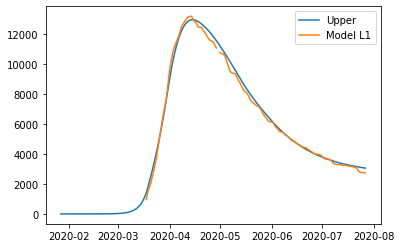

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3287355762233068, 'other': 0.41634272414317214, 'school': 0.2577565805851366, 'transport': 0.3132404894948204, 'work': 0.44652026109629184}
{'home': 1.0, 'leisure': 0.3530726024818029, 'other': 0.46513083630703206, 'school': 0.3182934696384812, 'transport': 0.34985674988780346, 'work': 0.5736859125774009}
{'home': 1.0, 'leisure': 0.37654044923106694, 'other': 0.5121765158936111, 'school': 0.37666832693992053, 'transport': 0.3851652866953228, 'work': 0.6963099336484702}
{'home': 1.0, 'leisure': 0.39566239843417106, 'other': 0.5505100325937868, 'school': 0.42423302548183417, 'transport': 0.4139352055755238, 'work': 0.7962258026693416}
{'home': 1.0, 'leisure': 0.40696173205418706, 'other': 0.5731616560984361, 'school': 0.4523394382566012, 'transport': 0.43093561218655163, 'work': 0.8552669979998564}
{'home': 1.0, 'leisure': 0.4130459886188111, 'other': 0.5853586841394011, '

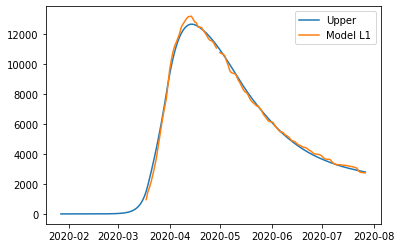

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.24341646691119317, 'other': 0.2844466826066478, 'school': 0.4237344263467423, 'transport': 0.32992408448576444, 'work': 0.430369022026441}
{'home': 1.0, 'leisure': 0.2593298477178624, 'other': 0.32621642411999285, 'school': 0.4840253410753644, 'transport': 0.3359624955874732, 'work': 0.5660222612032173}
{'home': 1.0, 'leisure': 0.27467489349572194, 'other': 0.3664943891507185, 'school': 0.542163008849393, 'transport': 0.34178524914983527, 'work': 0.696830741837966}
{'home': 1.0, 'leisure': 0.2871782641295334, 'other': 0.39931347176834686, 'school': 0.5895344418504531, 'transport': 0.3465297150154636, 'work': 0.803415429762576}
{'home': 1.0, 'leisure': 0.2945666195040584, 'other': 0.4187065660423999, 'school': 0.6175266522601704, 'transport': 0.34933326302697126, 'work': 0.8663972908089363}
{'home': 1.0, 'leisure': 0.29854496470572567, 'other': 0.4291490014207362, 'school

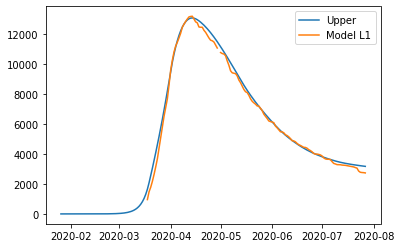

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3229085901392545, 'other': 0.28132177275791936, 'school': 0.2592873869016295, 'transport': 0.3025157837705267, 'work': 0.40037397901764554}
{'home': 1.0, 'leisure': 0.3610602093873474, 'other': 0.325816059061928, 'school': 0.3159399786919286, 'transport': 0.33508798254652417, 'work': 0.5387142400436169}
{'home': 1.0, 'leisure': 0.3978492708051513, 'other': 0.36872126371222214, 'school': 0.3705692636325741, 'transport': 0.3664968885090931, 'work': 0.6721137774615178}
{'home': 1.0, 'leisure': 0.4278255430715101, 'other': 0.4036810600939432, 'school': 0.4150820143249519, 'transport': 0.39208933040451976, 'work': 0.7808096968390668}
{'home': 1.0, 'leisure': 0.4455387948652675, 'other': 0.42433912159223297, 'school': 0.4413850033704479, 'transport': 0.40721213697909, 'work': 0.8450391037439821}
{'home': 1.0, 'leisure': 0.45507669967729075, 'other': 0.43546269316823516, 'schoo

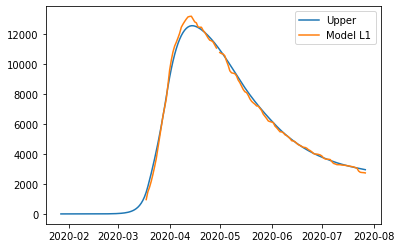

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3121477033280303, 'other': 0.39087497787493186, 'school': 0.23577417201196527, 'transport': 0.25311387300779653, 'work': 0.41202595546573306}
{'home': 1.0, 'leisure': 0.33447910275701964, 'other': 0.4244556541954979, 'school': 0.2927800795135198, 'transport': 0.2799132209823589, 'work': 0.542919679262247}
{'home': 1.0, 'leisure': 0.35601295220640217, 'other': 0.45683702064747234, 'school': 0.34775006174716167, 'transport': 0.3057554493864012, 'work': 0.6691386272088855}
{'home': 1.0, 'leisure': 0.37355905175775095, 'other': 0.4832218377564885, 'school': 0.39254041764124026, 'transport': 0.3268120799378431, 'work': 0.7719836959061466}
{'home': 1.0, 'leisure': 0.3839272014926388, 'other': 0.4988128660481799, 'school': 0.41900744612410484, 'transport': 0.3392546343546042, 'work': 0.832755781954528}
{'home': 1.0, 'leisure': 0.38951005134988614, 'other': 0.5072080351283215, '

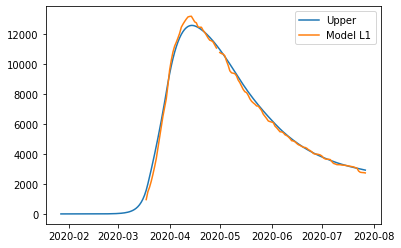

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.21341475918061192, 'other': 0.2758037089732789, 'school': 0.21363449479263785, 'transport': 0.2285322707717914, 'work': 0.3379787875629955}
{'home': 1.0, 'leisure': 0.22058057728389602, 'other': 0.306559548461685, 'school': 0.27959108292152046, 'transport': 0.24256469725778945, 'work': 0.4806048067994087}
{'home': 1.0, 'leisure': 0.22749047331206282, 'other': 0.33621696511121946, 'school': 0.3431920786172288, 'transport': 0.25609596565500187, 'work': 0.6181370396345215}
{'home': 1.0, 'leisure': 0.23312075896464318, 'other': 0.36038226756639574, 'school': 0.3950151121470652, 'transport': 0.26712144360828605, 'work': 0.7302003404631319}
{'home': 1.0, 'leisure': 0.23644774594116794, 'other': 0.37466176447172717, 'school': 0.4256378137783321, 'transport': 0.27363649876249946, 'work': 0.796419563680038}
{'home': 1.0, 'leisure': 0.23823920046698896, 'other': 0.3823507243438286

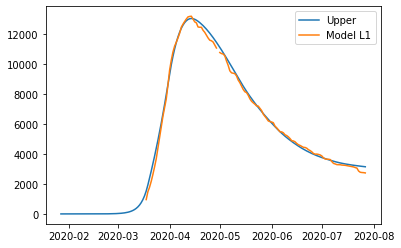

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.29715500989163895, 'other': 0.37389008401046003, 'school': 0.20349612999923553, 'transport': 0.22228742535156343, 'work': 0.379023554320372}
{'home': 1.0, 'leisure': 0.3265170399294773, 'other': 0.41577236726554256, 'school': 0.253813465474063, 'transport': 0.25469885284272625, 'work': 0.5264894757492838}
{'home': 1.0, 'leisure': 0.35483042603739284, 'other': 0.45615885469008643, 'school': 0.302333753253361, 'transport': 0.28595272935206184, 'work': 0.6686887571271631}
{'home': 1.0, 'leisure': 0.3779005924956944, 'other': 0.48906636296193695, 'school': 0.3418688025550112, 'transport': 0.3114188509522612, 'work': 0.7845548382498796}
{'home': 1.0, 'leisure': 0.3915329635846908, 'other': 0.5085117087589396, 'school': 0.36523042259689537, 'transport': 0.3264670137160154, 'work': 0.853021158913303}
{'home': 1.0, 'leisure': 0.3988734710941504, 'other': 0.5189822795727101, 'sch

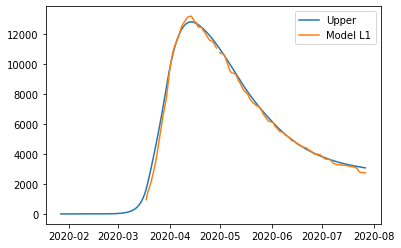

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.28905487976800426, 'other': 0.30885788847675893, 'school': 0.2442138097504228, 'transport': 0.19062073194913706, 'work': 0.3226788162454873}
{'home': 1.0, 'leisure': 0.3269369189882114, 'other': 0.3452682229814598, 'school': 0.3322914831677156, 'transport': 0.21151844337643466, 'work': 0.44862910195087335}
{'home': 1.0, 'leisure': 0.36346602823626845, 'other': 0.3803781883967071, 'school': 0.41722352539153373, 'transport': 0.23166980796704312, 'work': 0.5700811631667815}
{'home': 1.0, 'leisure': 0.39323048762357415, 'other': 0.4089863083646864, 'school': 0.48642741164797804, 'transport': 0.24808943837420552, 'work': 0.6690421019352991}
{'home': 1.0, 'leisure': 0.4108185772615275, 'other': 0.4258911065275832, 'school': 0.5273206171631496, 'transport': 0.2577919472511651, 'work': 0.727519020298514}
{'home': 1.0, 'leisure': 0.4202890870665793, 'other': 0.43499369015375844, 

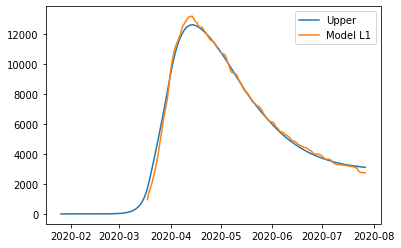

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.257688214536521, 'other': 0.39005810497840465, 'school': 0.17547759575749064, 'transport': 0.16743710651194843, 'work': 0.40074784853721124}
{'home': 1.0, 'leisure': 0.2795410818848019, 'other': 0.42329870828958926, 'school': 0.2168772498367987, 'transport': 0.19722855525930916, 'work': 0.5368607567955086}
{'home': 1.0, 'leisure': 0.30061348968492996, 'other': 0.455352147196803, 'school': 0.2567983448418458, 'transport': 0.22595602369426415, 'work': 0.6681124897588668}
{'home': 1.0, 'leisure': 0.31778359974429354, 'other': 0.4814697640841623, 'school': 0.28932664447558787, 'transport': 0.24936359056719043, 'work': 0.775058346247529}
{'home': 1.0, 'leisure': 0.3279295738702811, 'other': 0.49690290133578374, 'school': 0.3085479124409809, 'transport': 0.26319533462846506, 'work': 0.8382536250817385}
{'home': 1.0, 'leisure': 0.3333927907073514, 'other': 0.5052130521635799, '

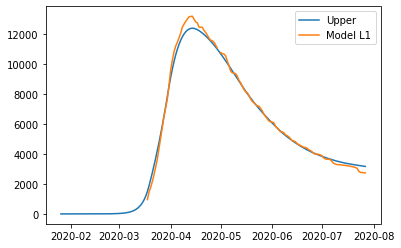

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.35258261570974436, 'other': 0.4064640397926186, 'school': 0.21271436990624104, 'transport': 0.2760294195820524, 'work': 0.42888303238602987}
{'home': 1.0, 'leisure': 0.3753643120396611, 'other': 0.45626928640303016, 'school': 0.26447739338350024, 'transport': 0.2813357277386132, 'work': 0.560455053142186}
{'home': 1.0, 'leisure': 0.3973323763577951, 'other': 0.5042957742059271, 'school': 0.31439173745085736, 'transport': 0.2864525248895825, 'work': 0.687328073157051}
{'home': 1.0, 'leisure': 0.41523228061701545, 'other': 0.5434284679712504, 'school': 0.35506268446870387, 'transport': 0.29062176701259457, 'work': 0.7907060894654594}
{'home': 1.0, 'leisure': 0.42580949677019103, 'other': 0.5665523324689415, 'school': 0.37909551679743136, 'transport': 0.2930854100852835, 'work': 0.8517930991022462}
{'home': 1.0, 'leisure': 0.4315049208526702, 'other': 0.5790036441215445, 's

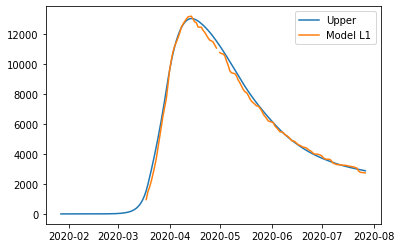

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31010263096392954, 'other': 0.3453314643079177, 'school': 0.19849047681366247, 'transport': 0.17220774021141155, 'work': 0.38222664927834327}
{'home': 1.0, 'leisure': 0.3485422056153772, 'other': 0.37284281126356866, 'school': 0.24809115206900353, 'transport': 0.18967724813631276, 'work': 0.5182974709249212}
{'home': 1.0, 'leisure': 0.38560893831498744, 'other': 0.3993716101136606, 'school': 0.29592037463665377, 'transport': 0.20652284506389607, 'work': 0.6495086203698355}
{'home': 1.0, 'leisure': 0.4158114612554107, 'other': 0.4209876684359578, 'school': 0.33489233376585037, 'transport': 0.2202488870048899, 'work': 0.7564214088064325}
{'home': 1.0, 'leisure': 0.43365840662929706, 'other': 0.4337607938082243, 'school': 0.35792121870583016, 'transport': 0.2283597299700226, 'work': 0.8195971474280579}
{'home': 1.0, 'leisure': 0.44326830029215897, 'other': 0.440638630547137

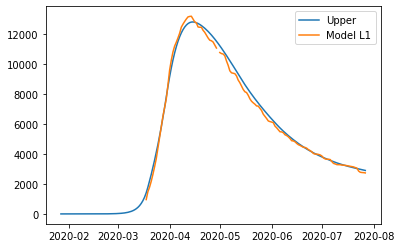

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3380912942187916, 'other': 0.3825759325846984, 'school': 0.22825266999032529, 'transport': 0.26798220612899265, 'work': 0.39779783952276226}
{'home': 1.0, 'leisure': 0.34745901830436077, 'other': 0.4126082446978778, 'school': 0.2944193107995372, 'transport': 0.2804666639246371, 'work': 0.5436480238623469}
{'home': 1.0, 'leisure': 0.3564921808154453, 'other': 0.4415679742355866, 'school': 0.3582228572941344, 'transport': 0.29250524822757995, 'work': 0.6842892730469463}
{'home': 1.0, 'leisure': 0.3638525354541068, 'other': 0.4651647908959418, 'school': 0.410210932215658, 'transport': 0.30231446506701487, 'work': 0.79888584645662}
{'home': 1.0, 'leisure': 0.3682018359224068, 'other': 0.47910836437706084, 'school': 0.4409311583056493, 'transport': 0.30811082047213545, 'work': 0.8666020034714271}
{'home': 1.0, 'leisure': 0.3705437669437991, 'other': 0.48661644240535573, 'scho

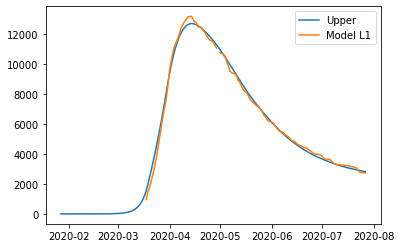

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3508144160878721, 'other': 0.29284644726292475, 'school': 0.22071685441528452, 'transport': 0.1373303068442625, 'work': 0.39252709444257516}
{'home': 1.0, 'leisure': 0.380458431094356, 'other': 0.3226636427015302, 'school': 0.2732029353216239, 'transport': 0.15662743867664145, 'work': 0.5239092870001718}
{'home': 1.0, 'leisure': 0.40904373127917976, 'other': 0.35141593830304263, 'school': 0.323814513338451, 'transport': 0.17523538722929258, 'work': 0.6505992583949971}
{'home': 1.0, 'leisure': 0.4323354573557028, 'other': 0.3748437347190897, 'school': 0.36505357690771756, 'transport': 0.1903974193833046, 'work': 0.7538281239759658}
{'home': 1.0, 'leisure': 0.4460987500372846, 'other': 0.3886874326012994, 'school': 0.3894221144713751, 'transport': 0.19935680201976624, 'work': 0.8148269990919927}
{'home': 1.0, 'leisure': 0.45350975378890557, 'other': 0.3961417314609508, 'sc

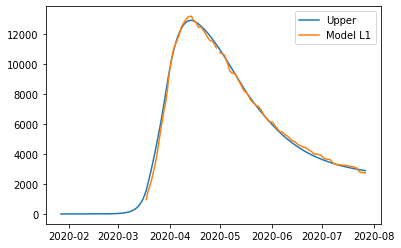

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3380471208285219, 'other': 0.2552255214570142, 'school': 0.1515380144979584, 'transport': 0.33574133174086357, 'work': 0.4147122696146517}
{'home': 1.0, 'leisure': 0.3725047287644234, 'other': 0.2902565569984693, 'school': 0.1864473698788246, 'transport': 0.3784466188491152, 'work': 0.5542666890798037}
{'home': 1.0, 'leisure': 0.4057317078454713, 'other': 0.3240364841277295, 'school': 0.22010996256751697, 'transport': 0.419626717132072, 'work': 0.6888370221354859}
{'home': 1.0, 'leisure': 0.4328055426522511, 'other': 0.3515608691960156, 'school': 0.24753874179534038, 'transport': 0.45318087128855544, 'work': 0.7984869231438196}
{'home': 1.0, 'leisure': 0.4488037177653482, 'other': 0.36782527855454833, 'school': 0.26374665679359965, 'transport': 0.4730083260173865, 'work': 0.8632800464669259}
{'home': 1.0, 'leisure': 0.45741811974932356, 'other': 0.37658303743991206, 'sch

Process ForkPoolWorker-11:
Process ForkPoolWorker-10:
Process ForkPoolWorker-13:
Process ForkPoolWorker-9:
Process ForkPoolWorker-1:
Process ForkPoolWorker-12:
Process ForkPoolWorker-16:
Process ForkPoolWorker-8:
Process ForkPoolWorker-3:
Process ForkPoolWorker-14:
Process ForkPoolWorker-2:
Process ForkPoolWorker-6:
Process ForkPoolWorker-15:
Process ForkPoolWorker-7:
Process ForkPoolWorker-5:
Process ForkPoolWorker-4:


KeyboardInterrupt: 

In [21]:
from scipy.optimize import minimize, Bounds, shgo, differential_evolution, dual_annealing
epsilon = 0.1
result = differential_evolution(error, [(50,140),
                                        windows['alpha_mixing'],windows['beta_mixing'],windows['gamma_mixing'],(0,0.5),(-50,50)]+
                                        [(0,1),(0,0.5)]+[(0,1)]*8, workers = -1
                               )




In [111]:
best_v = [50.88753474,  0.26877947,  1.33454102,  1.48102971,  0.47847758, 10.14438959,
  0.51890012,  0.41202596,  0.17060711,  0.24185315,  0.25654917,  0.28517006,
  0.20474128,  0.16875515,  0.43551292,  0.05633155]

0.0033064996693500004
0.005534162394714904
0.009348850655232535
0.01537873063733888
0.023728622712360262
0.03443589303407403
0.04762678518989236
0.06358089720196425
0.08276786950556922
0.10587956944734177
0.1338681723682132
0.16799614758695414
0.2099028089181316
0.26169207484963486
0.32604681092232196
0.40637639158365235
0.5070058787828224
0.6334175130020482
0.7925581500089791
0.9932300039100357
1.2465867764370144
1.5667632260711417
1.9716737937705084
2.484025480650224
3.132602306956111
3.9538940549019497
4.9941614758308965
6.312054819335676
7.981933802065308
10.098076724508584
12.780016569959962
16.17930535930026
20.48808828255688
25.949970568848855
32.87378817784679
41.65105503905201
52.77806321543082
66.88386848190865
84.76571516042215
107.43385606060559
136.1682243456675
172.59003530236708
218.75216108871274
277.25305563726226
351.38013381871093
445.28984631994354
564.2332420112568
714.8375452884765
905.4561144205863
1146.6009110348232
1451.472966796051
1836.6066980851162
2262.3294

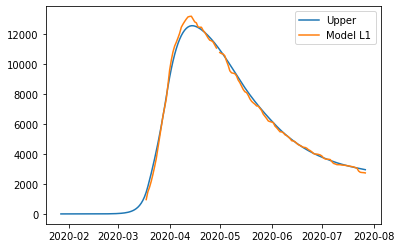

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3121477082805756, 'other': 0.3908749780564532, 'school': 0.23577417895540323, 'transport': 0.2531138724436288, 'work': 0.41202596}
{'home': 1.0, 'leisure': 0.33447910824320526, 'other': 0.4244556542976172, 'school': 0.2927800868886231, 'transport': 0.27991322103197747, 'work': 0.542919683963964}
{'home': 1.0, 'leisure': 0.3560129582071695, 'other': 0.45683702067302545, 'school': 0.3477500695385138, 'transport': 0.30575545002788507, 'work': 0.669138632072072}
{'home': 1.0, 'leisure': 0.3735590581778071, 'other': 0.4832218377196544, 'school': 0.392540425771758, 'transport': 0.3268120810615876, 'work': 0.771983700900901}
{'home': 1.0, 'leisure': 0.38392720816045656, 'other': 0.49881286597448055, 'school': 0.4190074544550387, 'transport': 0.33925463576332093, 'work': 0.832755787027027}
{'home': 1.0, 'leisure': 0.38951005815111395, 'other': 0.5072080350347715, 'school': 0.433

2798.055967994427

In [112]:
# v0 = (list(best_v[0:4]) + list(best_v[4]*initial_params["mu"]) + list(best_v[5]*initial_params['sigma']) + list(best_v[6]*initial_params['p_H'])+
#       list(best_v[7]*initial_params['p_ICU'])+list(best_v[8]*initial_params['lambda_H_R'])+list(best_v[9]*initial_params['lambda_H_D'])+
#     list(best_v[10]*initial_params['lambda_ICU_R'])+list(best_v[11]*initial_params['lambda_ICU_D']) + list(best_v[12:]))
v0 = best_v
error(best_v)

In [24]:
lb= ([50,windows['alpha_mixing'][0],windows['beta_mixing'][0],windows['gamma_mixing'][0],0,-50]+
                [0]*10)
ub = ([140,windows['alpha_mixing'][1],windows['beta_mixing'][1],windows['gamma_mixing'][1],0.5,50]+
                [1]*10)
for i in range(len(v0)):
    assert(v0[i]>=lb[i])
    assert(ub[i]>=v0[i])

2798.055886359947
violation 0
error_groups 1901.5072004844485
error_total 179.30973717509974
[50.88753474  0.26877948  1.33454102  1.48102971  0.47847758 10.14438959
  0.51890012  0.41202596  0.17060711  0.24185315  0.25654917  0.28517006
  0.20474128  0.16875515  0.43551292  0.05633155]


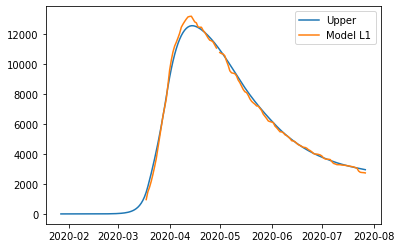

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3121477082805756, 'other': 0.3908749780564532, 'school': 0.23577417895540323, 'transport': 0.2531138724436288, 'work': 0.41202596}
{'home': 1.0, 'leisure': 0.33447910824320526, 'other': 0.4244556542976172, 'school': 0.2927800868886231, 'transport': 0.27991322103197747, 'work': 0.542919683963964}
{'home': 1.0, 'leisure': 0.3560129582071695, 'other': 0.45683702067302545, 'school': 0.3477500695385138, 'transport': 0.30575545002788507, 'work': 0.669138632072072}
{'home': 1.0, 'leisure': 0.3735590581778071, 'other': 0.4832218377196544, 'school': 0.392540425771758, 'transport': 0.3268120810615876, 'work': 0.771983700900901}
{'home': 1.0, 'leisure': 0.38392720816045656, 'other': 0.49881286597448055, 'school': 0.4190074544550387, 'transport': 0.33925463576332093, 'work': 0.832755787027027}
{'home': 1.0, 'leisure': 0.38951005815111395, 'other': 0.5072080350347715, 'school': 0.433

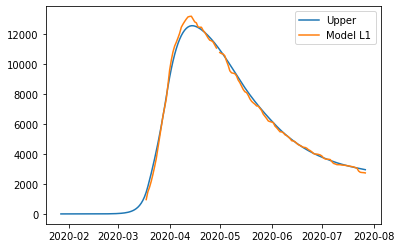

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3121477082805756, 'other': 0.3908749780564532, 'school': 0.23577417895540323, 'transport': 0.2531138724436288, 'work': 0.41202596}
{'home': 1.0, 'leisure': 0.33447910824320526, 'other': 0.4244556542976172, 'school': 0.2927800868886231, 'transport': 0.27991322103197747, 'work': 0.542919683963964}
{'home': 1.0, 'leisure': 0.3560129582071695, 'other': 0.45683702067302545, 'school': 0.3477500695385138, 'transport': 0.30575545002788507, 'work': 0.669138632072072}
{'home': 1.0, 'leisure': 0.3735590581778071, 'other': 0.4832218377196544, 'school': 0.392540425771758, 'transport': 0.3268120810615876, 'work': 0.771983700900901}
{'home': 1.0, 'leisure': 0.38392720816045656, 'other': 0.49881286597448055, 'school': 0.4190074544550387, 'transport': 0.33925463576332093, 'work': 0.832755787027027}
{'home': 1.0, 'leisure': 0.38951005815111395, 'other': 0.5072080350347715, 'school': 0.433

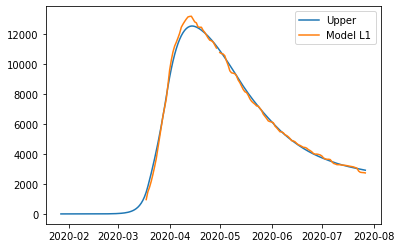

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118493397605296, 'other': 0.3904875720049046, 'school': 0.23545030363217875, 'transport': 0.2528506013354287, 'work': 0.41170446517470677}
{'home': 1.0, 'leisure': 0.33414590391546506, 'other': 0.42401586415990583, 'school': 0.29236728535165846, 'transport': 0.27960814435156445, 'work': 0.5424960556349523}
{'home': 1.0, 'leisure': 0.3556461622077242, 'other': 0.4563467173093713, 'school': 0.3472515177240139, 'transport': 0.30541006083140954, 'work': 0.6686165178644747}
{'home': 1.0, 'leisure': 0.373164891186602, 'other': 0.482690375431158, 'school': 0.3919720033607479, 'transport': 0.3264338446298019, 'work': 0.7713813389403819}
{'home': 1.0, 'leisure': 0.38351686740139346, 'other': 0.49825708250312284, 'school': 0.4183977448733635, 'transport': 0.3388569896015792, 'work': 0.8321060059397816}
{'home': 1.0, 'leisure': 0.38909100844012734, 'other': 0.5066391555418732, 'sc

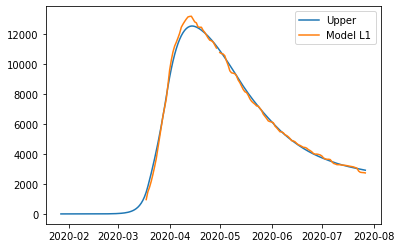

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118493397605296, 'other': 0.3904875720049046, 'school': 0.23545030363217875, 'transport': 0.2528506013354287, 'work': 0.41170446517470677}
{'home': 1.0, 'leisure': 0.33414590391546506, 'other': 0.42401586415990583, 'school': 0.29236728535165846, 'transport': 0.27960814435156445, 'work': 0.5424960556349523}
{'home': 1.0, 'leisure': 0.3556461622077242, 'other': 0.4563467173093713, 'school': 0.3472515177240139, 'transport': 0.30541006083140954, 'work': 0.6686165178644747}
{'home': 1.0, 'leisure': 0.373164891186602, 'other': 0.482690375431158, 'school': 0.3919720033607479, 'transport': 0.3264338446298019, 'work': 0.7713813389403819}
{'home': 1.0, 'leisure': 0.38351686740139346, 'other': 0.49825708250312284, 'school': 0.4183977448733635, 'transport': 0.3388569896015792, 'work': 0.8321060059397816}
{'home': 1.0, 'leisure': 0.38909100844012734, 'other': 0.5066391555418732, 'sc

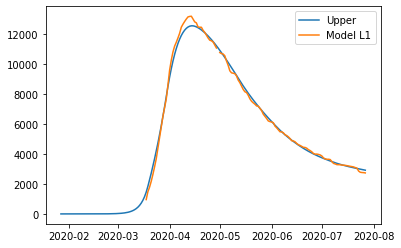

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31188520445029244, 'other': 0.3905540302246411, 'school': 0.23548047108447281, 'transport': 0.2528781200190962, 'work': 0.41174928984913683}
{'home': 1.0, 'leisure': 0.3341876596549662, 'other': 0.42409188450725377, 'school': 0.2924091526557905, 'transport': 0.27964136418822727, 'work': 0.5425589664429182}
{'home': 1.0, 'leisure': 0.35569359860233024, 'other': 0.4564319582797731, 'school': 0.34730466702813256, 'transport': 0.30544877820846084, 'work': 0.668696868872636}
{'home': 1.0, 'leisure': 0.3732169562631453, 'other': 0.4827831295018259, 'school': 0.39203434540559645, 'transport': 0.32647704148420664, 'work': 0.7714759004820356}
{'home': 1.0, 'leisure': 0.3835716676081725, 'other': 0.49835427613303895, 'school': 0.4184655189922797, 'transport': 0.33890283341987465, 'work': 0.8322089646148627}
{'home': 1.0, 'leisure': 0.3891472814093409, 'other': 0.5067387397036921, 

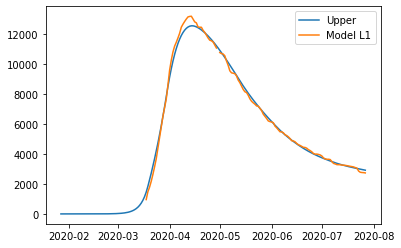

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31188520445029244, 'other': 0.3905540302246411, 'school': 0.23548047108447281, 'transport': 0.2528781200190962, 'work': 0.41174928984913683}
{'home': 1.0, 'leisure': 0.3341876596549662, 'other': 0.42409188450725377, 'school': 0.2924091526557905, 'transport': 0.27964136418822727, 'work': 0.5425589664429182}
{'home': 1.0, 'leisure': 0.35569359860233024, 'other': 0.4564319582797731, 'school': 0.34730466702813256, 'transport': 0.30544877820846084, 'work': 0.668696868872636}
{'home': 1.0, 'leisure': 0.3732169562631453, 'other': 0.4827831295018259, 'school': 0.39203434540559645, 'transport': 0.32647704148420664, 'work': 0.7714759004820356}
{'home': 1.0, 'leisure': 0.3835716676081725, 'other': 0.49835427613303895, 'school': 0.4184655189922797, 'transport': 0.33890283341987465, 'work': 0.8322089646148627}
{'home': 1.0, 'leisure': 0.3891472814093409, 'other': 0.5067387397036921, 

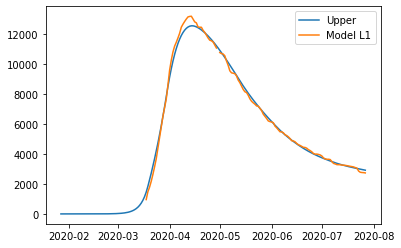

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31188520445029244, 'other': 0.3905540302246411, 'school': 0.23548047108447281, 'transport': 0.2528781200190962, 'work': 0.41174928984913683}
{'home': 1.0, 'leisure': 0.3341876596549662, 'other': 0.42409188450725377, 'school': 0.2924091526557905, 'transport': 0.27964136418822727, 'work': 0.5425589664429182}
{'home': 1.0, 'leisure': 0.35569359860233024, 'other': 0.4564319582797731, 'school': 0.34730466702813256, 'transport': 0.30544877820846084, 'work': 0.668696868872636}
{'home': 1.0, 'leisure': 0.3732169562631453, 'other': 0.4827831295018259, 'school': 0.39203434540559645, 'transport': 0.32647704148420664, 'work': 0.7714759004820356}
{'home': 1.0, 'leisure': 0.3835716676081725, 'other': 0.49835427613303895, 'school': 0.4184655189922797, 'transport': 0.33890283341987465, 'work': 0.8322089646148627}
{'home': 1.0, 'leisure': 0.3891472814093409, 'other': 0.5067387397036921, 

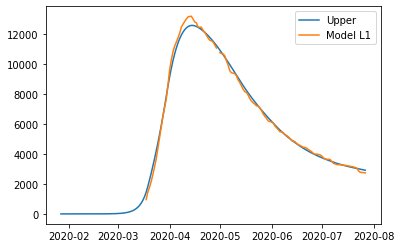

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31190212269457934, 'other': 0.3906282978379099, 'school': 0.23547854896821876, 'transport': 0.2528855718029506, 'work': 0.4117838649213901}
{'home': 1.0, 'leisure': 0.3342122172590274, 'other': 0.4241794949967495, 'school': 0.29241794033193186, 'transport': 0.27965436731854554, 'work': 0.5426192812179489}
{'home': 1.0, 'leisure': 0.35572552273188796, 'other': 0.456532435114202, 'school': 0.3473237820040838, 'transport': 0.3054671344228692, 'work': 0.6687820040753449}
{'home': 1.0, 'leisure': 0.3732548827468114, 'other': 0.48289409002471884, 'school': 0.39206187521842983, 'transport': 0.32649975947083665, 'work': 0.7715812597369269}
{'home': 1.0, 'leisure': 0.383613140937448, 'other': 0.49847143156275153, 'school': 0.4184980212087252, 'transport': 0.33892812881736284, 'work': 0.8323262744460436}
{'home': 1.0, 'leisure': 0.38919066457856005, 'other': 0.5068592308524614, 's

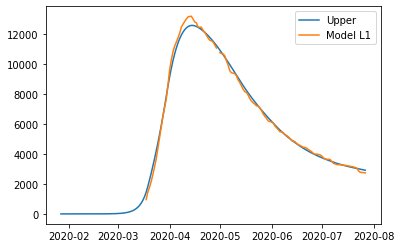

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31190212269457934, 'other': 0.3906282978379099, 'school': 0.23547854896821876, 'transport': 0.2528855718029506, 'work': 0.4117838649213901}
{'home': 1.0, 'leisure': 0.3342122172590274, 'other': 0.4241794949967495, 'school': 0.29241794033193186, 'transport': 0.27965436731854554, 'work': 0.5426192812179489}
{'home': 1.0, 'leisure': 0.35572552273188796, 'other': 0.456532435114202, 'school': 0.3473237820040838, 'transport': 0.3054671344228692, 'work': 0.6687820040753449}
{'home': 1.0, 'leisure': 0.3732548827468114, 'other': 0.48289409002471884, 'school': 0.39206187521842983, 'transport': 0.32649975947083665, 'work': 0.7715812597369269}
{'home': 1.0, 'leisure': 0.383613140937448, 'other': 0.49847143156275153, 'school': 0.4184980212087252, 'transport': 0.33892812881736284, 'work': 0.8323262744460436}
{'home': 1.0, 'leisure': 0.38919066457856005, 'other': 0.5068592308524614, 's

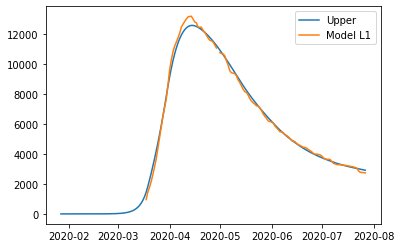

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31190212269457934, 'other': 0.3906282978379099, 'school': 0.23547854896821876, 'transport': 0.2528855718029506, 'work': 0.4117838649213901}
{'home': 1.0, 'leisure': 0.3342122172590274, 'other': 0.4241794949967495, 'school': 0.29241794033193186, 'transport': 0.27965436731854554, 'work': 0.5426192812179489}
{'home': 1.0, 'leisure': 0.35572552273188796, 'other': 0.456532435114202, 'school': 0.3473237820040838, 'transport': 0.3054671344228692, 'work': 0.6687820040753449}
{'home': 1.0, 'leisure': 0.3732548827468114, 'other': 0.48289409002471884, 'school': 0.39206187521842983, 'transport': 0.32649975947083665, 'work': 0.7715812597369269}
{'home': 1.0, 'leisure': 0.383613140937448, 'other': 0.49847143156275153, 'school': 0.4184980212087252, 'transport': 0.33892812881736284, 'work': 0.8323262744460436}
{'home': 1.0, 'leisure': 0.38919066457856005, 'other': 0.5068592308524614, 's

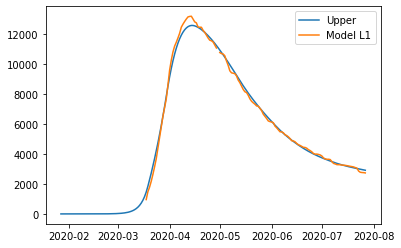

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

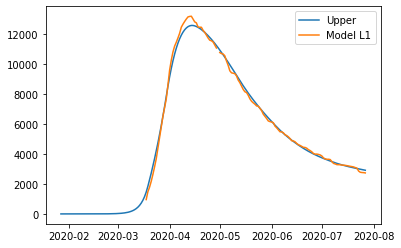

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

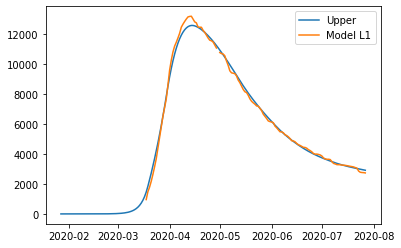

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

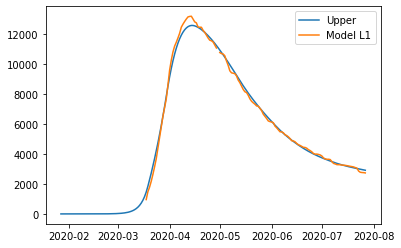

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

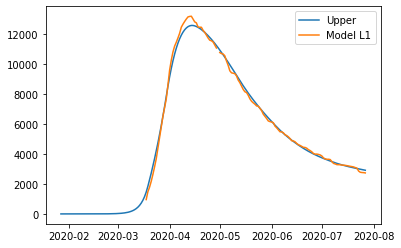

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

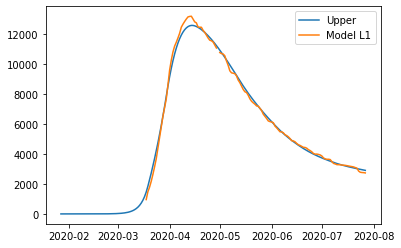

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118092167882165, 'other': 0.39066303851430906, 'school': 0.23534463505874373, 'transport': 0.25282154441452, 'work': 0.4117236447348602}
{'home': 1.0, 'leisure': 0.33413536791582527, 'other': 0.4242444393790572, 'school': 0.29230230343636826, 'transport': 0.27960040107897755, 'work': 0.5426273633561471}
{'home': 1.0, 'leisure': 0.3556641565031623, 'other': 0.4566265044986358, 'school': 0.3472257693719347, 'transport': 0.3054228700054188, 'work': 0.668855949169531}
{'home': 1.0, 'leisure': 0.3732061323891406, 'other': 0.4830118908923665, 'school': 0.39197822309721114, 'transport': 0.32646340024177833, 'work': 0.7717088709433992}
{'home': 1.0, 'leisure': 0.38357184541267325, 'other': 0.49860325557957097, 'school': 0.41842285484396535, 'transport': 0.33889644083599074, 'work': 0.8324855974461396}
{'home': 1.0, 'leisure': 0.3891533831945755, 'other': 0.5069986057957581, 'sc

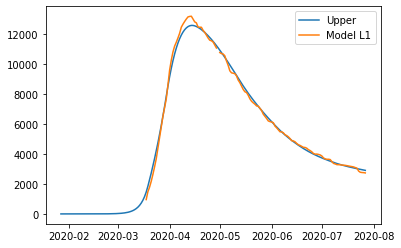

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118092167882165, 'other': 0.39066303851430906, 'school': 0.23534463505874373, 'transport': 0.25282154441452, 'work': 0.4117236447348602}
{'home': 1.0, 'leisure': 0.33413536791582527, 'other': 0.4242444393790572, 'school': 0.29230230343636826, 'transport': 0.27960040107897755, 'work': 0.5426273633561471}
{'home': 1.0, 'leisure': 0.3556641565031623, 'other': 0.4566265044986358, 'school': 0.3472257693719347, 'transport': 0.3054228700054188, 'work': 0.668855949169531}
{'home': 1.0, 'leisure': 0.3732061323891406, 'other': 0.4830118908923665, 'school': 0.39197822309721114, 'transport': 0.32646340024177833, 'work': 0.7717088709433992}
{'home': 1.0, 'leisure': 0.38357184541267325, 'other': 0.49860325557957097, 'school': 0.41842285484396535, 'transport': 0.33889644083599074, 'work': 0.8324855974461396}
{'home': 1.0, 'leisure': 0.3891533831945755, 'other': 0.5069986057957581, 'sc

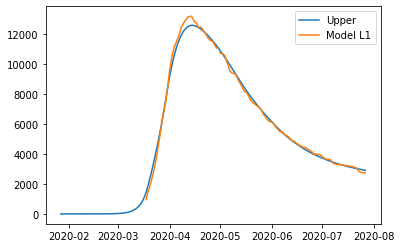

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118064933440953, 'other': 0.39072797616259575, 'school': 0.23532616170538395, 'transport': 0.2528257738280718, 'work': 0.4117384210891717}
{'home': 1.0, 'leisure': 0.33414374239468814, 'other': 0.4243287393041046, 'school': 0.2923021406239019, 'transport': 0.27961389038596235, 'work': 0.5426835763094005}
{'home': 1.0, 'leisure': 0.3556832325506169, 'other': 0.45672947519055956, 'school': 0.34724326315247284, 'transport': 0.3054452884953569, 'work': 0.6689521188431926}
{'home': 1.0, 'leisure': 0.37323392823322554, 'other': 0.4831300748017451, 'school': 0.3920101037313084, 'transport': 0.3264930943622709, 'work': 0.7718375979448009}
{'home': 1.0, 'leisure': 0.38360479386385793, 'other': 0.4987304291174456, 'school': 0.41846323680062036, 'transport': 0.3389304341927202, 'work': 0.8326335628684787}
{'home': 1.0, 'leisure': 0.3891891061265061, 'other': 0.5071306199028228, 's

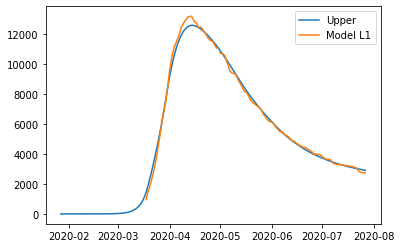

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118064933440953, 'other': 0.39072797616259575, 'school': 0.23532616170538395, 'transport': 0.2528257738280718, 'work': 0.4117384210891717}
{'home': 1.0, 'leisure': 0.33414374239468814, 'other': 0.4243287393041046, 'school': 0.2923021406239019, 'transport': 0.27961389038596235, 'work': 0.5426835763094005}
{'home': 1.0, 'leisure': 0.3556832325506169, 'other': 0.45672947519055956, 'school': 0.34724326315247284, 'transport': 0.3054452884953569, 'work': 0.6689521188431926}
{'home': 1.0, 'leisure': 0.37323392823322554, 'other': 0.4831300748017451, 'school': 0.3920101037313084, 'transport': 0.3264930943622709, 'work': 0.7718375979448009}
{'home': 1.0, 'leisure': 0.38360479386385793, 'other': 0.4987304291174456, 'school': 0.41846323680062036, 'transport': 0.3389304341927202, 'work': 0.8326335628684787}
{'home': 1.0, 'leisure': 0.3891891061265061, 'other': 0.5071306199028228, 's

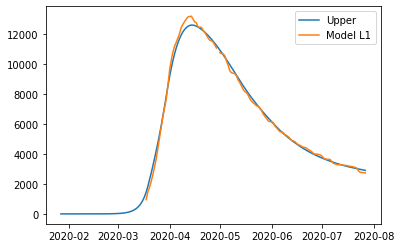

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31179560866450745, 'other': 0.3909877464635449, 'school': 0.2352522689261598, 'transport': 0.25284269324996744, 'work': 0.41179752650641777}
{'home': 1.0, 'leisure': 0.3341772749170139, 'other': 0.42466601397771053, 'school': 0.29230149178674913, 'transport': 0.27966785433863145, 'work': 0.5429084281224141}
{'home': 1.0, 'leisure': 0.35575959594621653, 'other': 0.457141486223513, 'school': 0.34731324240231737, 'transport': 0.3055349739598432, 'work': 0.6693367975378391}
{'home': 1.0, 'leisure': 0.37334519085890017, 'other': 0.4836029821275003, 'school': 0.3921376317927804, 'transport': 0.3266118862437935, 'work': 0.7723525059504077}
{'home': 1.0, 'leisure': 0.3837366787618496, 'other': 0.49923932061622, 'school': 0.41862477097805395, 'transport': 0.3390664253206732, 'work': 0.8332254245578345}
{'home': 1.0, 'leisure': 0.38933209532497626, 'other': 0.5076588874947614, 'sc

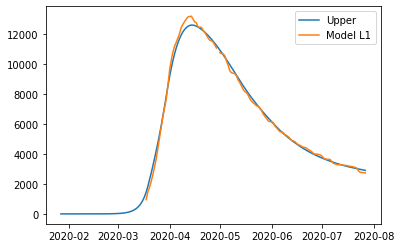

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31179560866450745, 'other': 0.3909877464635449, 'school': 0.2352522689261598, 'transport': 0.25284269324996744, 'work': 0.41179752650641777}
{'home': 1.0, 'leisure': 0.3341772749170139, 'other': 0.42466601397771053, 'school': 0.29230149178674913, 'transport': 0.27966785433863145, 'work': 0.5429084281224141}
{'home': 1.0, 'leisure': 0.35575959594621653, 'other': 0.457141486223513, 'school': 0.34731324240231737, 'transport': 0.3055349739598432, 'work': 0.6693367975378391}
{'home': 1.0, 'leisure': 0.37334519085890017, 'other': 0.4836029821275003, 'school': 0.3921376317927804, 'transport': 0.3266118862437935, 'work': 0.7723525059504077}
{'home': 1.0, 'leisure': 0.3837366787618496, 'other': 0.49923932061622, 'school': 0.41862477097805395, 'transport': 0.3390664253206732, 'work': 0.8332254245578345}
{'home': 1.0, 'leisure': 0.38933209532497626, 'other': 0.5076588874947614, 'sc

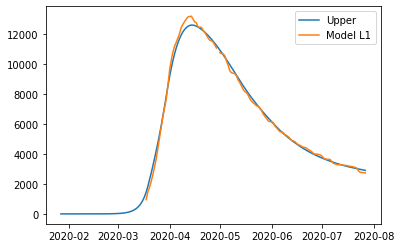

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31179560866450745, 'other': 0.3909877464635449, 'school': 0.2352522689261598, 'transport': 0.25284269324996744, 'work': 0.41179752650641777}
{'home': 1.0, 'leisure': 0.3341772753476284, 'other': 0.4246660146256672, 'school': 0.29230149288435386, 'transport': 0.27966785485473705, 'work': 0.5429084306449367}
{'home': 1.0, 'leisure': 0.3557595967920665, 'other': 0.45714148749628514, 'school': 0.3473132445583267, 'transport': 0.3055349749736221, 'work': 0.6693368024927941}
{'home': 1.0, 'leisure': 0.37334519204309013, 'other': 0.4836029839093813, 'school': 0.3921376348111935, 'transport': 0.32661188766308397, 'work': 0.7723525128873447}
{'home': 1.0, 'leisure': 0.38373668014596773, 'other': 0.49923932269893806, 'school': 0.4186247745060693, 'transport': 0.3390664269795841, 'work': 0.8332254326659427}
{'home': 1.0, 'leisure': 0.38933209681674796, 'other': 0.5076588897394687, 

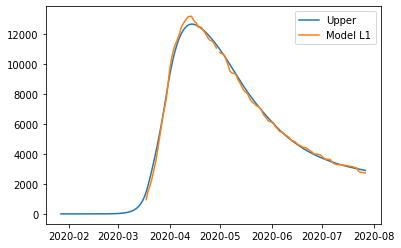

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783265882203, 'other': 0.42615719126682844, 'school': 0.29229563158186045, 'transport': 0.2799081812218798, 'work': 0.5439014495758937}
{'home': 1.0, 'leisure': 0.3560920862285576, 'other': 0.45896770797168135, 'school': 0.34762438779816063, 'transport': 0.3059356065595741, 'work': 0.6710457043693255}
{'home': 1.0, 'leisure': 0.37383407061871254, 'other': 0.48570220306452444, 'school': 0.3927070780484793, 'transport': 0.3271431383162139, 'work': 0.7746447267936033}
{'home': 1.0, 'leisure': 0.38431797048562233, 'other': 0.5014998592557499, 'school': 0.4193468495600313, 'transport': 0.3396748616269556, 'work': 0.8358623309534039}
{'home': 1.0, 'leisure': 0.3899631473370352, 'other': 0.5100062895125637,

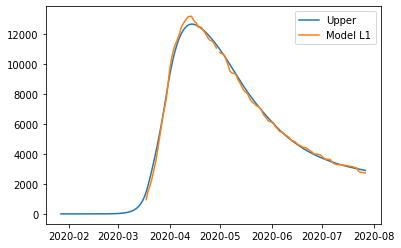

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783265882203, 'other': 0.42615719126682844, 'school': 0.29229563158186045, 'transport': 0.2799081812218798, 'work': 0.5439014495758937}
{'home': 1.0, 'leisure': 0.3560920862285576, 'other': 0.45896770797168135, 'school': 0.34762438779816063, 'transport': 0.3059356065595741, 'work': 0.6710457043693255}
{'home': 1.0, 'leisure': 0.37383407061871254, 'other': 0.48570220306452444, 'school': 0.3927070780484793, 'transport': 0.3271431383162139, 'work': 0.7746447267936033}
{'home': 1.0, 'leisure': 0.38431797048562233, 'other': 0.5014998592557499, 'school': 0.4193468495600313, 'transport': 0.3396748616269556, 'work': 0.8358623309534039}
{'home': 1.0, 'leisure': 0.3899631473370352, 'other': 0.5100062895125637,

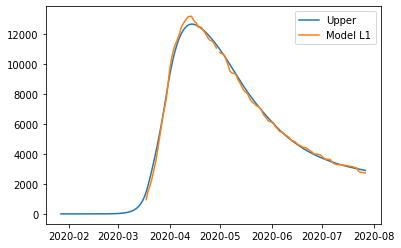

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783265882203, 'other': 0.42615719126682844, 'school': 0.29229563158186045, 'transport': 0.2799081812218798, 'work': 0.5439014495758937}
{'home': 1.0, 'leisure': 0.3560920862285576, 'other': 0.45896770797168135, 'school': 0.34762438779816063, 'transport': 0.3059356065595741, 'work': 0.6710457043693255}
{'home': 1.0, 'leisure': 0.37383407061871254, 'other': 0.48570220306452444, 'school': 0.3927070780484793, 'transport': 0.3271431383162139, 'work': 0.7746447267936033}
{'home': 1.0, 'leisure': 0.38431797048562233, 'other': 0.5014998592557499, 'school': 0.4193468495600313, 'transport': 0.3396748616269556, 'work': 0.8358623309534039}
{'home': 1.0, 'leisure': 0.3899631473370352, 'other': 0.5100062895125637,

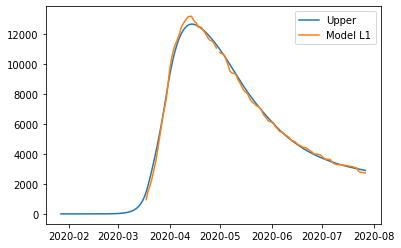

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783309081986, 'other': 0.42615719191778406, 'school': 0.2922956326795745, 'transport': 0.27990818173826, 'work': 0.5439014520984162}
{'home': 1.0, 'leisure': 0.35609208707712486, 'other': 0.4589677092503442, 'school': 0.34762438995438466, 'transport': 0.30593560757389227, 'work': 0.6710457093242805}
{'home': 1.0, 'leisure': 0.3738340718067067, 'other': 0.48570220485465243, 'school': 0.392707081067193, 'transport': 0.32714313973625925, 'work': 0.7746447337305403}
{'home': 1.0, 'leisure': 0.3843179718741868, 'other': 0.5014998613481073, 'school': 0.4193468530883979, 'transport': 0.3396748632867489, 'work': 0.8358623390615121}
{'home': 1.0, 'leisure': 0.3899631488335992, 'other': 0.51000629176766, 'scho

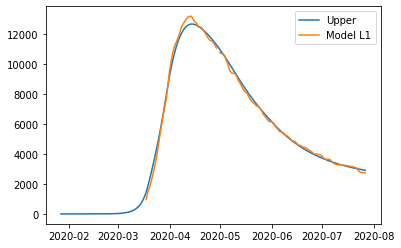

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31171612810718746, 'other': 0.392426795606832, 'school': 0.23482834336482977, 'transport': 0.2529388348712508, 'work': 0.41210708194339174}
{'home': 1.0, 'leisure': 0.33435106744250837, 'other': 0.42654698685376746, 'school': 0.2922973916008377, 'transport': 0.27997615694667044, 'work': 0.5441632308167181}
{'home': 1.0, 'leisure': 0.3561776160872821, 'other': 0.45944859984188374, 'school': 0.3477139738284168, 'transport': 0.3060478603765394, 'work': 0.6715030886588543}
{'home': 1.0, 'leisure': 0.37396221127931994, 'other': 0.4862573215359044, 'school': 0.39286822601385163, 'transport': 0.3272914705786549, 'work': 0.7752614913450394}
{'home': 1.0, 'leisure': 0.38447129025643323, 'other': 0.502098838900553, 'school': 0.41955028412342676, 'transport': 0.339844512970814, 'work': 0.8365732747505124}
{'home': 1.0, 'leisure': 0.3901300250902635, 'other': 0.5106288867122868, 'sc

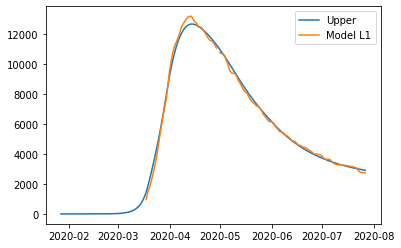

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31171612810718746, 'other': 0.392426795606832, 'school': 0.23482834336482977, 'transport': 0.2529388348712508, 'work': 0.41210708194339174}
{'home': 1.0, 'leisure': 0.33435106744250837, 'other': 0.42654698685376746, 'school': 0.2922973916008377, 'transport': 0.27997615694667044, 'work': 0.5441632308167181}
{'home': 1.0, 'leisure': 0.3561776160872821, 'other': 0.45944859984188374, 'school': 0.3477139738284168, 'transport': 0.3060478603765394, 'work': 0.6715030886588543}
{'home': 1.0, 'leisure': 0.37396221127931994, 'other': 0.4862573215359044, 'school': 0.39286822601385163, 'transport': 0.3272914705786549, 'work': 0.7752614913450394}
{'home': 1.0, 'leisure': 0.38447129025643323, 'other': 0.502098838900553, 'school': 0.41955028412342676, 'transport': 0.339844512970814, 'work': 0.8365732747505124}
{'home': 1.0, 'leisure': 0.3901300250902635, 'other': 0.5106288867122868, 'sc

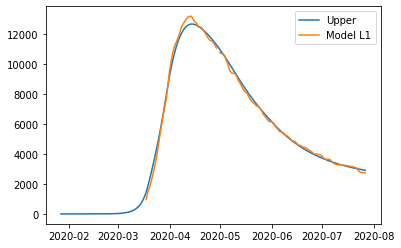

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31171612810718746, 'other': 0.392426795606832, 'school': 0.23482834336482977, 'transport': 0.2529388348712508, 'work': 0.41210708194339174}
{'home': 1.0, 'leisure': 0.3343510678748786, 'other': 0.4265469875055278, 'school': 0.2922973926986054, 'transport': 0.27997615746313453, 'work': 0.5441632333392408}
{'home': 1.0, 'leisure': 0.35617761693658073, 'other': 0.45944860112212715, 'school': 0.3477139759847461, 'transport': 0.3060478613910224, 'work': 0.6715030936138093}
{'home': 1.0, 'leisure': 0.37396221246833805, 'other': 0.4862573233282451, 'school': 0.3928682290327127, 'transport': 0.32729147199893105, 'work': 0.7752614982819763}
{'home': 1.0, 'leisure': 0.38447129164619465, 'other': 0.5020988409954967, 'school': 0.41955028765196567, 'transport': 0.33984451463087706, 'work': 0.8365732828586205}
{'home': 1.0, 'leisure': 0.39013002658811746, 'other': 0.5106288889701707, 

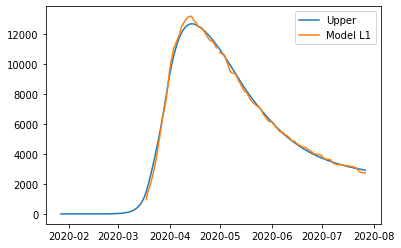

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

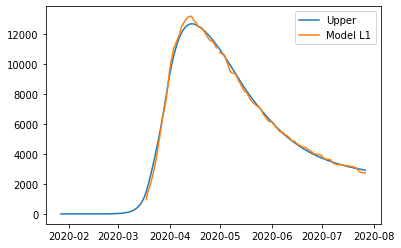

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

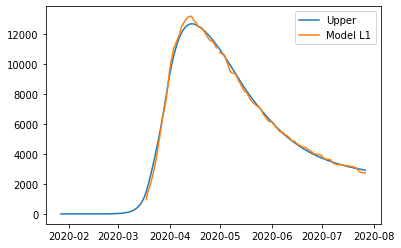

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

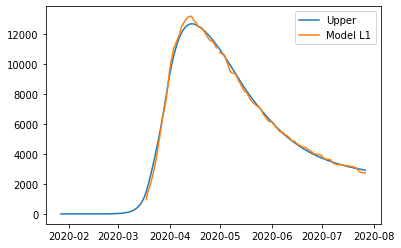

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

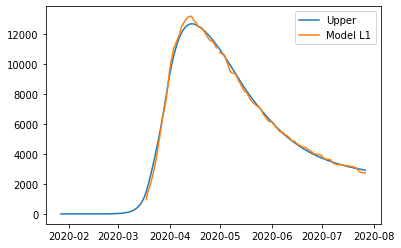

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477984933517, 'other': 0.42810783994076995, 'school': 0.2923045440481086, 'transport': 0.2802482345526174, 'work': 0.5452103583025385}
{'home': 1.0, 'leisure': 0.3565210866776571, 'other': 0.4613750865811646, 'school': 0.348072514523086, 'transport': 0.3064971810043544, 'work': 0.6733326307719246}
{'home': 1.0, 'leisure': 0.3744765959451786, 'other': 0.4884817319918565, 'school': 0.3935130830582528, 'transport': 0.3278852114465106, 'work': 0.7777285564877207}
{'home': 1.0, 'leisure': 0.38508666960325955, 'other': 0.5044992951890837, 'school': 0.4203643281017604, 'transport': 0.34052359307142105, 'work': 0.8394170580470547}
{'home': 1.0, 'leisure': 0.39079978618838, 'other': 0.5131241369106674, 'school':

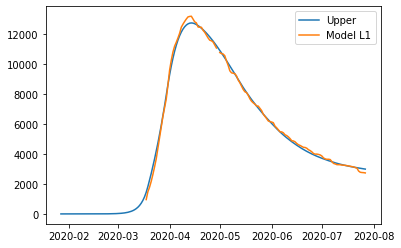

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295953763168, 'other': 0.4075405967953235, 'school': 0.2328521112476099, 'transport': 0.25559118358869337, 'work': 0.4160394870977984}
{'home': 1.0, 'leisure': 0.33792019351872554, 'other': 0.44579849894890267, 'school': 0.2943887134136331, 'transport': 0.28468361478659276, 'work': 0.5564551192387546}
{'home': 1.0, 'leisure': 0.3620182702989054, 'other': 0.4826900474541398, 'school': 0.35372757978801267, 'transport': 0.31273703058456714, 'work': 0.6918559073746766}
{'home': 1.0, 'leisure': 0.38165374026794086, 'other': 0.5127498277176663, 'school': 0.4020777672041737, 'transport': 0.3355953693829167, 'work': 0.8021824754854279}
{'home': 1.0, 'leisure': 0.3932565179769163, 'other': 0.5305124251461137, 'school': 0.43064833249554163, 'transport': 0.34910256958194136, 'work': 0.8673754475508717}
{'home': 1.0, 'leisure': 0.3995041675125185, 'other': 0.5400769006845085, 's

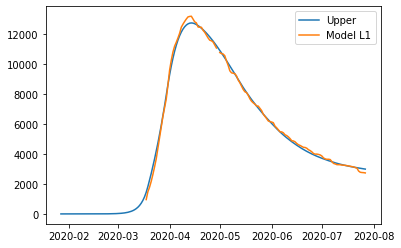

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295953763168, 'other': 0.4075405967953235, 'school': 0.2328521112476099, 'transport': 0.25559118358869337, 'work': 0.4160394870977984}
{'home': 1.0, 'leisure': 0.33792019351872554, 'other': 0.44579849894890267, 'school': 0.2943887134136331, 'transport': 0.28468361478659276, 'work': 0.5564551192387546}
{'home': 1.0, 'leisure': 0.3620182702989054, 'other': 0.4826900474541398, 'school': 0.35372757978801267, 'transport': 0.31273703058456714, 'work': 0.6918559073746766}
{'home': 1.0, 'leisure': 0.38165374026794086, 'other': 0.5127498277176663, 'school': 0.4020777672041737, 'transport': 0.3355953693829167, 'work': 0.8021824754854279}
{'home': 1.0, 'leisure': 0.3932565179769163, 'other': 0.5305124251461137, 'school': 0.43064833249554163, 'transport': 0.34910256958194136, 'work': 0.8673754475508717}
{'home': 1.0, 'leisure': 0.3995041675125185, 'other': 0.5400769006845085, 's

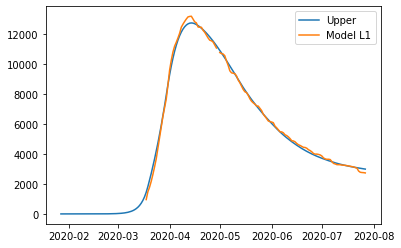

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295953763168, 'other': 0.4075405967953235, 'school': 0.2328521112476099, 'transport': 0.25559118358869337, 'work': 0.4160394870977984}
{'home': 1.0, 'leisure': 0.33792019396767375, 'other': 0.44579849963619383, 'school': 0.29438871451911874, 'transport': 0.2846836153092291, 'work': 0.5564551217612771}
{'home': 1.0, 'leisure': 0.36201827118076796, 'other': 0.4826900488041759, 'school': 0.35372758195950227, 'transport': 0.3127370316111743, 'work': 0.6918559123296315}
{'home': 1.0, 'leisure': 0.3816537415025484, 'other': 0.5127498296077169, 'school': 0.4020777702442592, 'transport': 0.3355953708201666, 'work': 0.8021824824223648}
{'home': 1.0, 'leisure': 0.3932565194199641, 'other': 0.5305124273552638, 'school': 0.43064833604888836, 'transport': 0.3491025712618439, 'work': 0.8673754556589799}
{'home': 1.0, 'leisure': 0.39950416906780334, 'other': 0.5400769030654814, 'sc

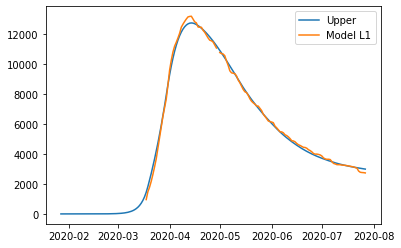

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295971560758, 'other': 0.4075405995199419, 'school': 0.23285211563007083, 'transport': 0.25559118566057315, 'work': 0.4160394970977984}
{'home': 1.0, 'leisure': 0.3379201952984845, 'other': 0.4457985016735211, 'school': 0.294388717796094, 'transport': 0.28468361685847254, 'work': 0.5564551292387545}
{'home': 1.0, 'leisure': 0.3620182720786643, 'other': 0.4826900501787582, 'school': 0.35372758417047356, 'transport': 0.3127370326564469, 'work': 0.6918559173746766}
{'home': 1.0, 'leisure': 0.38165374204769975, 'other': 0.5127498304422846, 'school': 0.40207777158663466, 'transport': 0.33559537145479645, 'work': 0.8021824854854278}
{'home': 1.0, 'leisure': 0.39325651975667525, 'other': 0.5305124278707322, 'school': 0.4306483368780025, 'transport': 0.34910257165382114, 'work': 0.8673754575508716}
{'home': 1.0, 'leisure': 0.3995041692922774, 'other': 0.540076903409127, 'sch

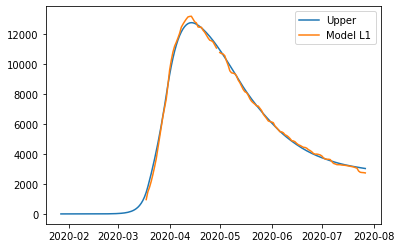

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

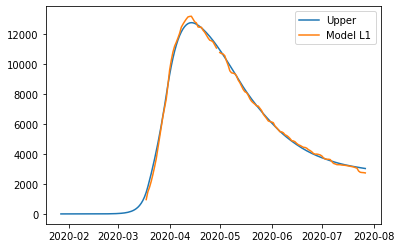

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

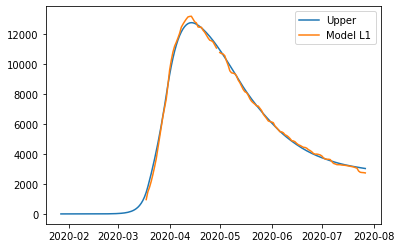

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

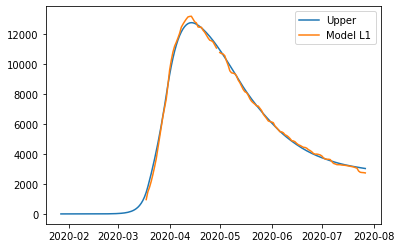

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

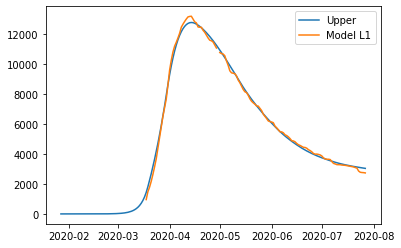

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3134521106056184, 'other': 0.41141986181311324, 'school': 0.23259140173738327, 'transport': 0.2564129603336426, 'work': 0.41713542023651345}
{'home': 1.0, 'leisure': 0.3390195111368879, 'other': 0.4506979105986866, 'school': 0.2951258757926748, 'transport': 0.28601114610814354, 'work': 0.5595142746609696}
{'home': 1.0, 'leisure': 0.363673790220612, 'other': 0.48857317192763233, 'school': 0.35542697577456306, 'transport': 0.31455225381926943, 'work': 0.696808169998838}
{'home': 1.0, 'leisure': 0.38376246206660947, 'other': 0.51943449597344, 'school': 0.404561205389435, 'transport': 0.33780797121352024, 'work': 0.8086772699037679}
{'home': 1.0, 'leisure': 0.39563304088469886, 'other': 0.537670732909599, 'school': 0.43359506834367745, 'transport': 0.3515499860373956, 'work': 0.8747817380294081}
{'home': 1.0, 'leisure': 0.40202489101751626, 'other': 0.5474902451059924, 'scho

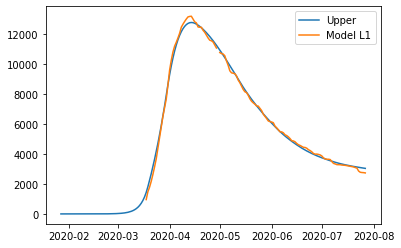

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3134521106056184, 'other': 0.41141986181311324, 'school': 0.23259140173738327, 'transport': 0.2564129603336426, 'work': 0.41713542023651345}
{'home': 1.0, 'leisure': 0.3390195111368879, 'other': 0.4506979105986866, 'school': 0.2951258757926748, 'transport': 0.28601114610814354, 'work': 0.5595142746609696}
{'home': 1.0, 'leisure': 0.363673790220612, 'other': 0.48857317192763233, 'school': 0.35542697577456306, 'transport': 0.31455225381926943, 'work': 0.696808169998838}
{'home': 1.0, 'leisure': 0.38376246206660947, 'other': 0.51943449597344, 'school': 0.404561205389435, 'transport': 0.33780797121352024, 'work': 0.8086772699037679}
{'home': 1.0, 'leisure': 0.39563304088469886, 'other': 0.537670732909599, 'school': 0.43359506834367745, 'transport': 0.3515499860373956, 'work': 0.8747817380294081}
{'home': 1.0, 'leisure': 0.40202489101751626, 'other': 0.5474902451059924, 'scho

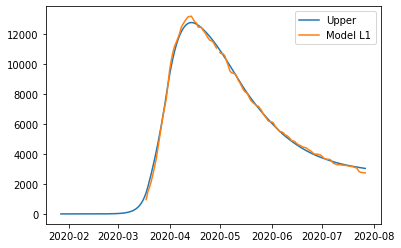

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

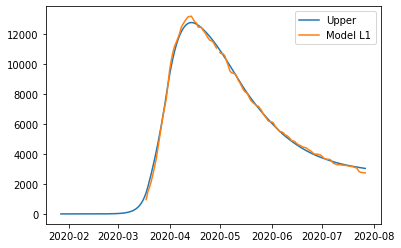

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

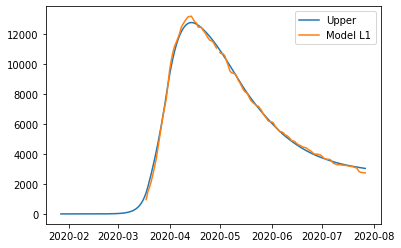

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

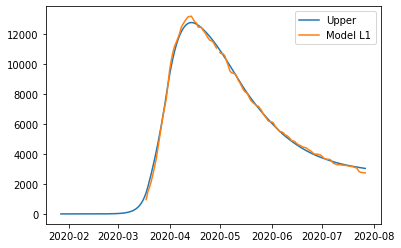

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

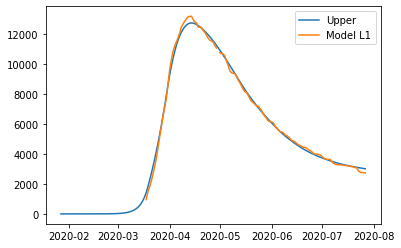

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31393392140033594, 'other': 0.41035350279396027, 'school': 0.23333734576022985, 'transport': 0.25660678165250617, 'work': 0.41701706322523957}
{'home': 1.0, 'leisure': 0.3391797809697084, 'other': 0.44907602927352097, 'school': 0.29538922818447716, 'transport': 0.28596071009828217, 'work': 0.5582097529665602}
{'home': 1.0, 'leisure': 0.36352400269731755, 'other': 0.4864156083788117, 'school': 0.3552249719507157, 'transport': 0.3142662839567091, 'work': 0.6943598466456908}
{'home': 1.0, 'leisure': 0.3833600352161102, 'other': 0.5168404506127523, 'school': 0.40398002242691, 'transport': 0.3373300848783902, 'work': 0.8052969600138714}
{'home': 1.0, 'leisure': 0.3950813271590331, 'other': 0.5348187664782627, 'school': 0.4327898249810249, 'transport': 0.35095869451392914, 'work': 0.8708507088223417}
{'home': 1.0, 'leisure': 0.40139279205137623, 'other': 0.5444993980981528, 's

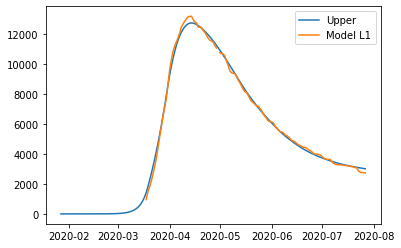

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31393392140033594, 'other': 0.41035350279396027, 'school': 0.23333734576022985, 'transport': 0.25660678165250617, 'work': 0.41701706322523957}
{'home': 1.0, 'leisure': 0.3391797809697084, 'other': 0.44907602927352097, 'school': 0.29538922818447716, 'transport': 0.28596071009828217, 'work': 0.5582097529665602}
{'home': 1.0, 'leisure': 0.36352400269731755, 'other': 0.4864156083788117, 'school': 0.3552249719507157, 'transport': 0.3142662839567091, 'work': 0.6943598466456908}
{'home': 1.0, 'leisure': 0.3833600352161102, 'other': 0.5168404506127523, 'school': 0.40398002242691, 'transport': 0.3373300848783902, 'work': 0.8052969600138714}
{'home': 1.0, 'leisure': 0.3950813271590331, 'other': 0.5348187664782627, 'school': 0.4327898249810249, 'transport': 0.35095869451392914, 'work': 0.8708507088223417}
{'home': 1.0, 'leisure': 0.40139279205137623, 'other': 0.5444993980981528, 's

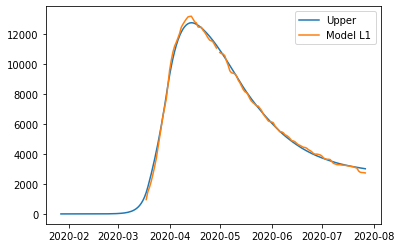

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

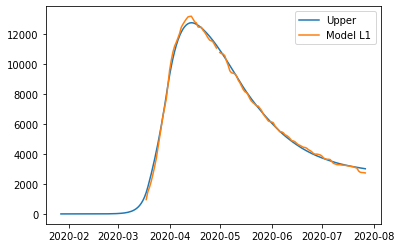

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

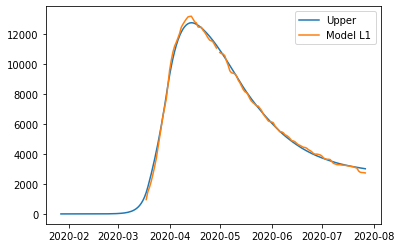

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

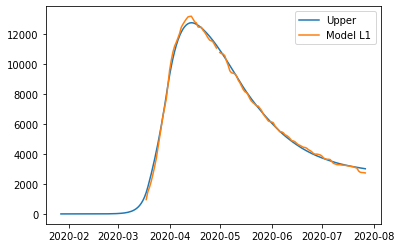

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

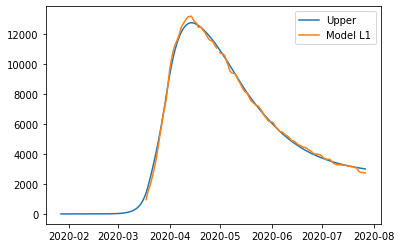

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138963680967778, 'other': 0.410225555786506, 'school': 0.23327474840790133, 'transport': 0.2565581887649722, 'work': 0.41688992959757787}
{'home': 1.0, 'leisure': 0.3390988905576653, 'other': 0.44888151966574646, 'school': 0.2952496107411461, 'transport': 0.28587549719408467, 'work': 0.5579293789804616}
{'home': 1.0, 'leisure': 0.3634013229306639, 'other': 0.4861569134064426, 'school': 0.3550110851339178, 'transport': 0.31414575889358604, 'work': 0.6939317051710995}
{'home': 1.0, 'leisure': 0.3832033048642184, 'other': 0.5165294564544173, 'school': 0.4037056198243245, 'transport': 0.3371807869450316, 'work': 0.8047484154005082}
{'home': 1.0, 'leisure': 0.39490447600677325, 'other': 0.5344768682554932, 'school': 0.4324796630504738, 'transport': 0.3507923944299767, 'work': 0.8702310168997042}
{'home': 1.0, 'leisure': 0.40120510662199516, 'other': 0.5441408592253033, 'scho

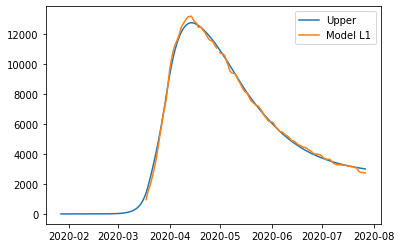

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138963680967778, 'other': 0.410225555786506, 'school': 0.23327474840790133, 'transport': 0.2565581887649722, 'work': 0.41688992959757787}
{'home': 1.0, 'leisure': 0.3390988910084181, 'other': 0.44888152035711715, 'school': 0.2952496118495806, 'transport': 0.28587549771843146, 'work': 0.5579293815029842}
{'home': 1.0, 'leisure': 0.36340132381607126, 'other': 0.4861569147644922, 'school': 0.35501108731119985, 'transport': 0.31414575992355276, 'work': 0.6939317101260545}
{'home': 1.0, 'leisure': 0.38320330610378867, 'other': 0.5165294583556866, 'school': 0.40370562287251927, 'transport': 0.33718078838698506, 'work': 0.8047484223374451}
{'home': 1.0, 'leisure': 0.3949044774556217, 'other': 0.5344768704777562, 'school': 0.4324796666132989, 'transport': 0.3507923961153768, 'work': 0.8702310250078124}
{'home': 1.0, 'leisure': 0.4012051081835317, 'other': 0.5441408616204089, 's

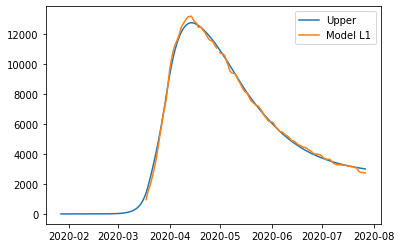

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31389636988369074, 'other': 0.4102255585272969, 'school': 0.2332747528020522, 'transport': 0.25655819084363235, 'work': 0.41688993959757786}
{'home': 1.0, 'leisure': 0.33909889234457824, 'other': 0.4488815224065374, 'school': 0.295249615135297, 'transport': 0.28587549927274486, 'work': 0.5579293889804616}
{'home': 1.0, 'leisure': 0.3634013247175769, 'other': 0.48615691614723355, 'school': 0.35501108952806876, 'transport': 0.3141457609722462, 'work': 0.6939317151710995}
{'home': 1.0, 'leisure': 0.3832033066511314, 'other': 0.5165294591952082, 'school': 0.4037056242184754, 'transport': 0.33718078902369175, 'work': 0.8047484254005082}
{'home': 1.0, 'leisure': 0.3949044777936863, 'other': 0.5344768709962842, 'school': 0.43247966744462474, 'transport': 0.3507923965086368, 'work': 0.8702310268997042}
{'home': 1.0, 'leisure': 0.40120510840890816, 'other': 0.5441408619660942, 's

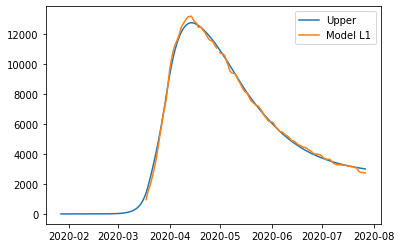

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138963680967778, 'other': 0.41022556578650604, 'school': 0.23327474840790133, 'transport': 0.2565581887649722, 'work': 0.41688992959757787}
{'home': 1.0, 'leisure': 0.3390988905576653, 'other': 0.44888152966574646, 'school': 0.2952496107411461, 'transport': 0.28587549719408467, 'work': 0.5579293789804616}
{'home': 1.0, 'leisure': 0.3634013229306639, 'other': 0.4861569234064426, 'school': 0.3550110851339178, 'transport': 0.31414575889358604, 'work': 0.6939317051710995}
{'home': 1.0, 'leisure': 0.3832033048642184, 'other': 0.5165294664544173, 'school': 0.4037056198243245, 'transport': 0.3371807869450316, 'work': 0.8047484154005082}
{'home': 1.0, 'leisure': 0.39490447600677325, 'other': 0.5344768782554932, 'school': 0.4324796630504738, 'transport': 0.3507923944299767, 'work': 0.8702310168997042}
{'home': 1.0, 'leisure': 0.40120510662199516, 'other': 0.5441408692253034, 'sc

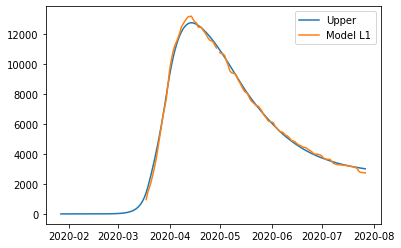

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31383423838875557, 'other': 0.41044137760587507, 'school': 0.23317669762692744, 'transport': 0.2565457698373129, 'work': 0.4169485575179932}
{'home': 1.0, 'leisure': 0.33910117744445667, 'other': 0.4492062575623561, 'school': 0.29525268506838914, 'transport': 0.28591354370798383, 'work': 0.558223734673459}
{'home': 1.0, 'leisure': 0.363465725819597, 'other': 0.4865866775203914, 'school': 0.35511167295837004, 'transport': 0.31423246851184505, 'work': 0.694453369787658}
{'home': 1.0, 'leisure': 0.3833183207919336, 'other': 0.5170447974861979, 'school': 0.4038856630909471, 'transport': 0.3373071479816579, 'work': 0.805455294695524}
{'home': 1.0, 'leisure': 0.3950493996392235, 'other': 0.5350427774659927, 'school': 0.4327066572601972, 'transport': 0.35094218585018366, 'work': 0.8710473412319903}
{'home': 1.0, 'leisure': 0.4013661344031487, 'other': 0.544733997455113, 'school

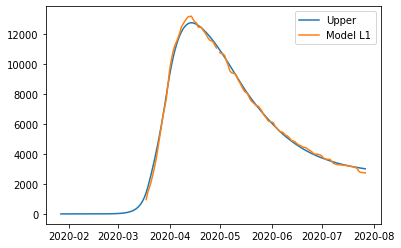

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31383423838875557, 'other': 0.41044137760587507, 'school': 0.23317669762692744, 'transport': 0.2565457698373129, 'work': 0.4169485575179932}
{'home': 1.0, 'leisure': 0.33910117744445667, 'other': 0.4492062575623561, 'school': 0.29525268506838914, 'transport': 0.28591354370798383, 'work': 0.558223734673459}
{'home': 1.0, 'leisure': 0.363465725819597, 'other': 0.4865866775203914, 'school': 0.35511167295837004, 'transport': 0.31423246851184505, 'work': 0.694453369787658}
{'home': 1.0, 'leisure': 0.3833183207919336, 'other': 0.5170447974861979, 'school': 0.4038856630909471, 'transport': 0.3373071479816579, 'work': 0.805455294695524}
{'home': 1.0, 'leisure': 0.3950493996392235, 'other': 0.5350427774659927, 'school': 0.4327066572601972, 'transport': 0.35094218585018366, 'work': 0.8710473412319903}
{'home': 1.0, 'leisure': 0.4013661344031487, 'other': 0.544733997455113, 'school

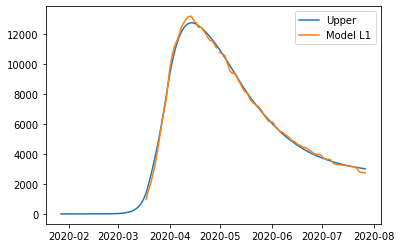

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138543244375803, 'other': 0.41040629926231004, 'school': 0.2332041644600407, 'transport': 0.2565548198600165, 'work': 0.4169428835826847}
{'home': 1.0, 'leisure': 0.33910869438182145, 'other': 0.449149815332874, 'school': 0.29526130309650245, 'transport': 0.28591313522234757, 'work': 0.5581712308092917}
{'home': 1.0, 'leisure': 0.36346112254233964, 'other': 0.4865096344009179, 'school': 0.3551021153530906, 'transport': 0.3142229393217382, 'work': 0.6943557084920913}
{'home': 1.0, 'leisure': 0.3833038417842433, 'other': 0.516950968456361, 'school': 0.4038612957103106, 'transport': 0.33729018710642694, 'work': 0.8053208384558539}
{'home': 1.0, 'leisure': 0.39502908497264094, 'other': 0.5349390294891228, 'school': 0.4326735386486678, 'transport': 0.3509208335246521, 'work': 0.8708911425253498}
{'home': 1.0, 'leisure': 0.4013426774587012, 'other': 0.5446249085067638, 'schoo

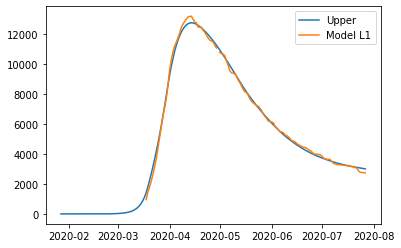

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138543244375803, 'other': 0.41040629926231004, 'school': 0.2332041644600407, 'transport': 0.2565548198600165, 'work': 0.4169428835826847}
{'home': 1.0, 'leisure': 0.33910869438182145, 'other': 0.449149815332874, 'school': 0.29526130309650245, 'transport': 0.28591313522234757, 'work': 0.5581712308092917}
{'home': 1.0, 'leisure': 0.36346112254233964, 'other': 0.4865096344009179, 'school': 0.3551021153530906, 'transport': 0.3142229393217382, 'work': 0.6943557084920913}
{'home': 1.0, 'leisure': 0.3833038417842433, 'other': 0.516950968456361, 'school': 0.4038612957103106, 'transport': 0.33729018710642694, 'work': 0.8053208384558539}
{'home': 1.0, 'leisure': 0.39502908497264094, 'other': 0.5349390294891228, 'school': 0.4326735386486678, 'transport': 0.3509208335246521, 'work': 0.8708911425253498}
{'home': 1.0, 'leisure': 0.4013426774587012, 'other': 0.5446249085067638, 'schoo

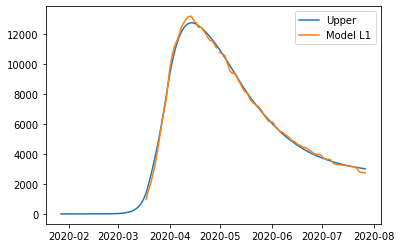

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138543244375803, 'other': 0.41040629926231004, 'school': 0.2332041644600407, 'transport': 0.2565548198600165, 'work': 0.4169428835826847}
{'home': 1.0, 'leisure': 0.33910869438182145, 'other': 0.449149815332874, 'school': 0.29526130309650245, 'transport': 0.28591313522234757, 'work': 0.5581712308092917}
{'home': 1.0, 'leisure': 0.36346112254233964, 'other': 0.4865096344009179, 'school': 0.3551021153530906, 'transport': 0.3142229393217382, 'work': 0.6943557084920913}
{'home': 1.0, 'leisure': 0.3833038417842433, 'other': 0.516950968456361, 'school': 0.4038612957103106, 'transport': 0.33729018710642694, 'work': 0.8053208384558539}
{'home': 1.0, 'leisure': 0.39502908497264094, 'other': 0.5349390294891228, 'school': 0.4326735386486678, 'transport': 0.3509208335246521, 'work': 0.8708911425253498}
{'home': 1.0, 'leisure': 0.4013426774587012, 'other': 0.5446249085067638, 'schoo

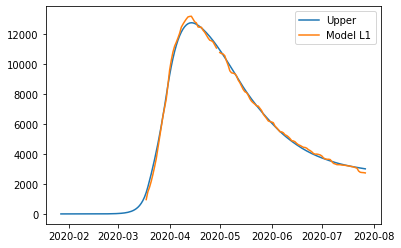

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138492978259998, 'other': 0.4104185022006044, 'school': 0.2331900278752547, 'transport': 0.2565526440240455, 'work': 0.41693266557094216}
{'home': 1.0, 'leisure': 0.33910347729623397, 'other': 0.4491629035508181, 'school': 0.2952463398358535, 'transport': 0.2859108389082662, 'work': 0.5581602719616678}
{'home': 1.0, 'leisure': 0.3634557217853884, 'other': 0.4865235762813813, 'school': 0.35508635494071666, 'transport': 0.31422052683233614, 'work': 0.6943440352670105}
{'home': 1.0, 'leisure': 0.3832982913691438, 'other': 0.516965605913692, 'school': 0.4038448857669015, 'transport': 0.33728767995565245, 'work': 0.8053085831454379}
{'home': 1.0, 'leisure': 0.3950234461231811, 'other': 0.5349540779691484, 'school': 0.43265674489146516, 'transport': 0.35091827043761203, 'work': 0.8708785432554176}
{'home': 1.0, 'leisure': 0.4013369909907396, 'other': 0.5446401783067019, 'scho

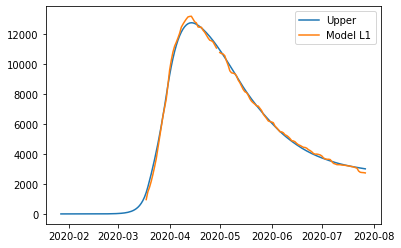

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138492978259998, 'other': 0.4104185022006044, 'school': 0.2331900278752547, 'transport': 0.2565526440240455, 'work': 0.41693266557094216}
{'home': 1.0, 'leisure': 0.33910347729623397, 'other': 0.4491629035508181, 'school': 0.2952463398358535, 'transport': 0.2859108389082662, 'work': 0.5581602719616678}
{'home': 1.0, 'leisure': 0.3634557217853884, 'other': 0.4865235762813813, 'school': 0.35508635494071666, 'transport': 0.31422052683233614, 'work': 0.6943440352670105}
{'home': 1.0, 'leisure': 0.3832982913691438, 'other': 0.516965605913692, 'school': 0.4038448857669015, 'transport': 0.33728767995565245, 'work': 0.8053085831454379}
{'home': 1.0, 'leisure': 0.3950234461231811, 'other': 0.5349540779691484, 'school': 0.43265674489146516, 'transport': 0.35091827043761203, 'work': 0.8708785432554176}
{'home': 1.0, 'leisure': 0.4013369909907396, 'other': 0.5446401783067019, 'scho

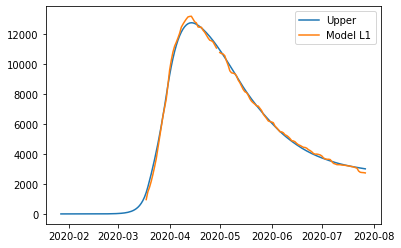

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138492978259998, 'other': 0.4104185022006044, 'school': 0.2331900278752547, 'transport': 0.2565526440240455, 'work': 0.41693266557094216}
{'home': 1.0, 'leisure': 0.33910347729623397, 'other': 0.4491629035508181, 'school': 0.2952463398358535, 'transport': 0.2859108389082662, 'work': 0.5581602719616678}
{'home': 1.0, 'leisure': 0.3634557217853884, 'other': 0.4865235762813813, 'school': 0.35508635494071666, 'transport': 0.31422052683233614, 'work': 0.6943440352670105}
{'home': 1.0, 'leisure': 0.3832982913691438, 'other': 0.516965605913692, 'school': 0.4038448857669015, 'transport': 0.33728767995565245, 'work': 0.8053085831454379}
{'home': 1.0, 'leisure': 0.3950234461231811, 'other': 0.5349540779691484, 'school': 0.43265674489146516, 'transport': 0.35091827043761203, 'work': 0.8708785432554176}
{'home': 1.0, 'leisure': 0.4013369909907396, 'other': 0.5446401783067019, 'scho

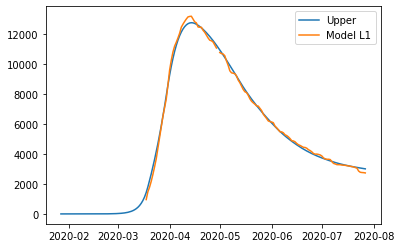

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138291914636026, 'other': 0.41046731237867057, 'school': 0.23313348226128175, 'transport': 0.2565439406316489, 'work': 0.41689179352397193}
{'home': 1.0, 'leisure': 0.339082609043894, 'other': 0.449215254733283, 'school': 0.2951864875710057, 'transport': 0.2859016535999109, 'work': 0.5581164365711726}
{'home': 1.0, 'leisure': 0.3634341188534606, 'other': 0.48657934200380215, 'school': 0.35502331411966814, 'transport': 0.3142108768193064, 'work': 0.6942973423666876}
{'home': 1.0, 'leisure': 0.3832760898094038, 'other': 0.5170241538538547, 'school': 0.4037792468630227, 'transport': 0.3372776512943693, 'work': 0.8052595619037739}
{'home': 1.0, 'leisure': 0.3950008908288248, 'other': 0.5350142699470677, 'school': 0.4325895707568231, 'transport': 0.3509080180296338, 'work': 0.8708281461756885}
{'home': 1.0, 'leisure': 0.40131424522389764, 'other': 0.5447012555357207, 'school

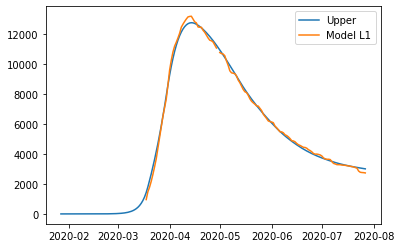

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138291914636026, 'other': 0.41046731237867057, 'school': 0.23313348226128175, 'transport': 0.2565439406316489, 'work': 0.41689179352397193}
{'home': 1.0, 'leisure': 0.339082609043894, 'other': 0.449215254733283, 'school': 0.2951864875710057, 'transport': 0.2859016535999109, 'work': 0.5581164365711726}
{'home': 1.0, 'leisure': 0.3634341188534606, 'other': 0.48657934200380215, 'school': 0.35502331411966814, 'transport': 0.3142108768193064, 'work': 0.6942973423666876}
{'home': 1.0, 'leisure': 0.3832760898094038, 'other': 0.5170241538538547, 'school': 0.4037792468630227, 'transport': 0.3372776512943693, 'work': 0.8052595619037739}
{'home': 1.0, 'leisure': 0.3950008908288248, 'other': 0.5350142699470677, 'school': 0.4325895707568231, 'transport': 0.3509080180296338, 'work': 0.8708281461756885}
{'home': 1.0, 'leisure': 0.40131424522389764, 'other': 0.5447012555357207, 'school

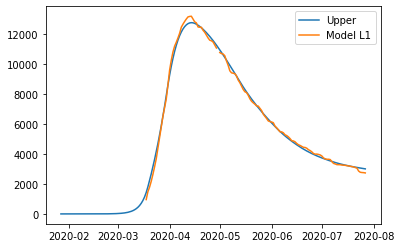

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138146161618781, 'other': 0.41051934762349207, 'school': 0.23305770561173805, 'transport': 0.2565380997654594, 'work': 0.41680658232152884}
{'home': 1.0, 'leisure': 0.3390515874623739, 'other': 0.44924861974695524, 'school': 0.2950818985670496, 'transport': 0.28588361449948146, 'work': 0.5579696860387963}
{'home': 1.0, 'leisure': 0.3633872383592806, 'other': 0.4865947035802947, 'school': 0.35489094177395714, 'transport': 0.3141810751358599, 'work': 0.6940912503375898}
{'home': 1.0, 'leisure': 0.38321628723824164, 'other': 0.5170248459630158, 'school': 0.40362423623884486, 'transport': 0.3372382652840201, 'work': 0.8050051175440143}
{'home': 1.0, 'leisure': 0.3949334524849004, 'other': 0.5350062937346236, 'school': 0.43242118296809656, 'transport': 0.3508629685533875, 'work': 0.870545129984174}
{'home': 1.0, 'leisure': 0.4012426953100243, 'other': 0.5446886117654894, 'sc

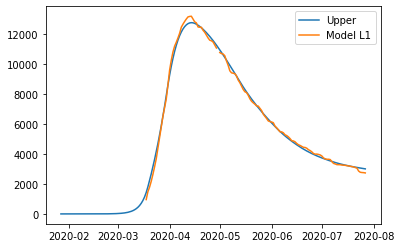

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138146161618781, 'other': 0.41051934762349207, 'school': 0.23305770561173805, 'transport': 0.2565380997654594, 'work': 0.41680658232152884}
{'home': 1.0, 'leisure': 0.3390515874623739, 'other': 0.44924861974695524, 'school': 0.2950818985670496, 'transport': 0.28588361449948146, 'work': 0.5579696860387963}
{'home': 1.0, 'leisure': 0.3633872383592806, 'other': 0.4865947035802947, 'school': 0.35489094177395714, 'transport': 0.3141810751358599, 'work': 0.6940912503375898}
{'home': 1.0, 'leisure': 0.38321628723824164, 'other': 0.5170248459630158, 'school': 0.40362423623884486, 'transport': 0.3372382652840201, 'work': 0.8050051175440143}
{'home': 1.0, 'leisure': 0.3949334524849004, 'other': 0.5350062937346236, 'school': 0.43242118296809656, 'transport': 0.3508629685533875, 'work': 0.870545129984174}
{'home': 1.0, 'leisure': 0.4012426953100243, 'other': 0.5446886117654894, 'sc

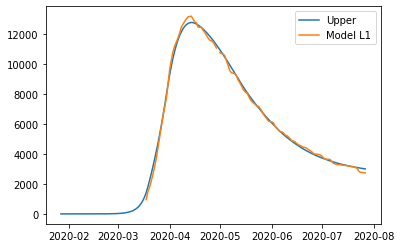

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.41072751016015235, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.3389276142839013, 'other': 0.44938211692770363, 'school': 0.29466357940341587, 'transport': 0.28581144573645556, 'work': 0.5573826839092906}
{'home': 1.0, 'leisure': 0.36319987528365383, 'other': 0.4866562020249852, 'school': 0.35436150414522044, 'transport': 0.31406185104222506, 'work': 0.6932668822211985}
{'home': 1.0, 'leisure': 0.38297727313530405, 'other': 0.5170276787709184, 'school': 0.40300425763854275, 'transport': 0.33708069980988914, 'work': 0.8039873401049754}
{'home': 1.0, 'leisure': 0.39466391732037015, 'other': 0.5349744604844244, 'school': 0.4317477028845968, 'transport': 0.35068274680896333, 'work': 0.8694130652181162}
{'home': 1.0, 'leisure': 0.4009567257277134, 'other': 0.544638112176312

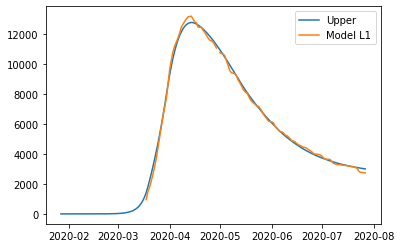

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.41072751016015235, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.33892761473448585, 'other': 0.4493821176196511, 'school': 0.2946635805116342, 'transport': 0.2858114462608895, 'work': 0.5573826864318132}
{'home': 1.0, 'leisure': 0.36319987616873073, 'other': 0.4866562033841677, 'school': 0.35436150632207797, 'transport': 0.31406185207236315, 'work': 0.6932668871761536}
{'home': 1.0, 'leisure': 0.3829772743744117, 'other': 0.5170276806737738, 'school': 0.40300426068614315, 'transport': 0.33708070125208245, 'work': 0.8039873470419123}
{'home': 1.0, 'leisure': 0.39466391876867774, 'other': 0.5349744627085411, 'school': 0.4317477064467272, 'transport': 0.35068274849464387, 'work': 0.8694130733262244}
{'home': 1.0, 'leisure': 0.40095672728866716, 'other': 0.5446381145734158,

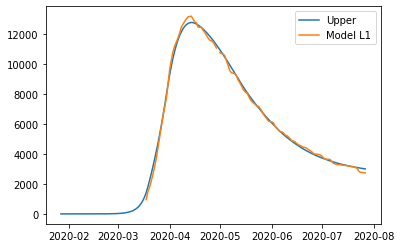

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.4107275143248097, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.3389276142839013, 'other': 0.4493821225015305, 'school': 0.29466357940341587, 'transport': 0.28581144573645556, 'work': 0.5573826839092906}
{'home': 1.0, 'leisure': 0.36319987528365383, 'other': 0.48665620895765405, 'school': 0.35436150414522044, 'transport': 0.31406185104222506, 'work': 0.6932668822211985}
{'home': 1.0, 'leisure': 0.38297727313530405, 'other': 0.5170276868107918, 'school': 0.40300425763854275, 'transport': 0.33708069980988914, 'work': 0.8039873401049754}
{'home': 1.0, 'leisure': 0.39466391732037015, 'other': 0.534974469178555, 'school': 0.4317477028845968, 'transport': 0.35068274680896333, 'work': 0.8694130652181162}
{'home': 1.0, 'leisure': 0.4009567257277134, 'other': 0.5446381212227352,

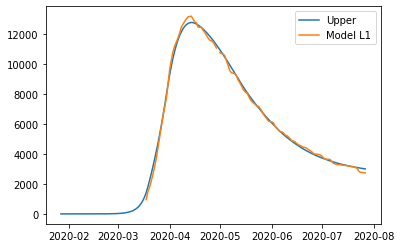

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.41072752016015235, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.3389276142839013, 'other': 0.44938212692770363, 'school': 0.29466357940341587, 'transport': 0.28581144573645556, 'work': 0.5573826839092906}
{'home': 1.0, 'leisure': 0.36319987528365383, 'other': 0.4866562120249852, 'school': 0.35436150414522044, 'transport': 0.31406185104222506, 'work': 0.6932668822211985}
{'home': 1.0, 'leisure': 0.38297727313530405, 'other': 0.5170276887709184, 'school': 0.40300425763854275, 'transport': 0.33708069980988914, 'work': 0.8039873401049754}
{'home': 1.0, 'leisure': 0.39466391732037015, 'other': 0.5349744704844244, 'school': 0.4317477028845968, 'transport': 0.35068274680896333, 'work': 0.8694130652181162}
{'home': 1.0, 'leisure': 0.4009567257277134, 'other': 0.544638122176312

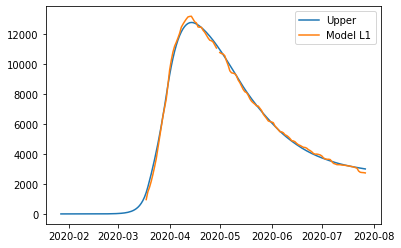

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

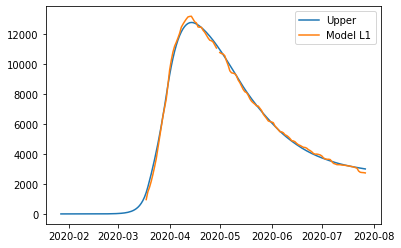

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

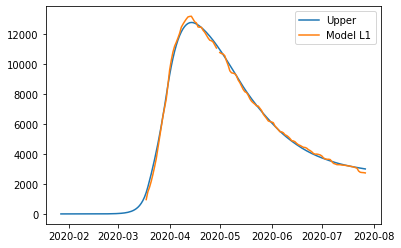

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

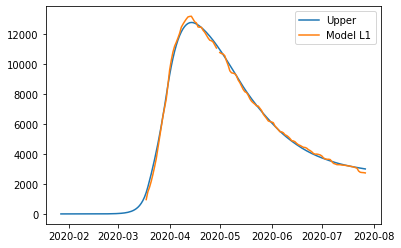

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

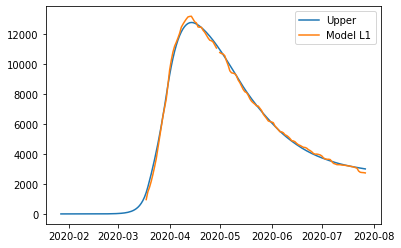

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31376987116951927, 'other': 0.41074692295426285, 'school': 0.23278863953727413, 'transport': 0.2565271455228444, 'work': 0.4165197119019469}
{'home': 1.0, 'leisure': 0.33895549784070317, 'other': 0.44942198699957736, 'school': 0.29472272275829925, 'transport': 0.28583544090460883, 'work': 0.5574883272367528}
{'home': 1.0, 'leisure': 0.3632416378450591, 'other': 0.48671579875755927, 'school': 0.3544448744357164, 'transport': 0.3140970114513103, 'work': 0.6934223491667442}
{'home': 1.0, 'leisure': 0.38303034451527507, 'other': 0.5171033490788779, 'school': 0.4031073683950934, 'transport': 0.3371249578226967, 'work': 0.8041834040726632}
{'home': 1.0, 'leisure': 0.39472367118403895, 'other': 0.5350596288142024, 'school': 0.4318624784619979, 'transport': 0.35073238067851586, 'work': 0.8696331183352516}
{'home': 1.0, 'leisure': 0.4010200778518349, 'other': 0.5447283948255311, 

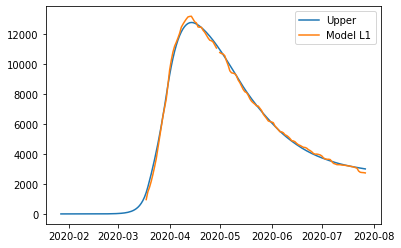

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31376987116951927, 'other': 0.41074692295426285, 'school': 0.23278863953727413, 'transport': 0.2565271455228444, 'work': 0.4165197119019469}
{'home': 1.0, 'leisure': 0.33895549784070317, 'other': 0.44942198699957736, 'school': 0.29472272275829925, 'transport': 0.28583544090460883, 'work': 0.5574883272367528}
{'home': 1.0, 'leisure': 0.3632416378450591, 'other': 0.48671579875755927, 'school': 0.3544448744357164, 'transport': 0.3140970114513103, 'work': 0.6934223491667442}
{'home': 1.0, 'leisure': 0.38303034451527507, 'other': 0.5171033490788779, 'school': 0.4031073683950934, 'transport': 0.3371249578226967, 'work': 0.8041834040726632}
{'home': 1.0, 'leisure': 0.39472367118403895, 'other': 0.5350596288142024, 'school': 0.4318624784619979, 'transport': 0.35073238067851586, 'work': 0.8696331183352516}
{'home': 1.0, 'leisure': 0.4010200778518349, 'other': 0.5447283948255311, 

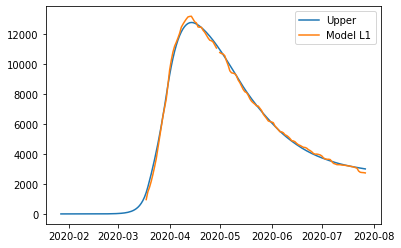

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31376987116951927, 'other': 0.41074692295426285, 'school': 0.23278863953727413, 'transport': 0.2565271455228444, 'work': 0.4165197119019469}
{'home': 1.0, 'leisure': 0.33895549784070317, 'other': 0.44942198699957736, 'school': 0.29472272275829925, 'transport': 0.28583544090460883, 'work': 0.5574883272367528}
{'home': 1.0, 'leisure': 0.3632416378450591, 'other': 0.48671579875755927, 'school': 0.3544448744357164, 'transport': 0.3140970114513103, 'work': 0.6934223491667442}
{'home': 1.0, 'leisure': 0.38303034451527507, 'other': 0.5171033490788779, 'school': 0.4031073683950934, 'transport': 0.3371249578226967, 'work': 0.8041834040726632}
{'home': 1.0, 'leisure': 0.39472367118403895, 'other': 0.5350596288142024, 'school': 0.4318624784619979, 'transport': 0.35073238067851586, 'work': 0.8696331183352516}
{'home': 1.0, 'leisure': 0.4010200778518349, 'other': 0.5447283948255311, 

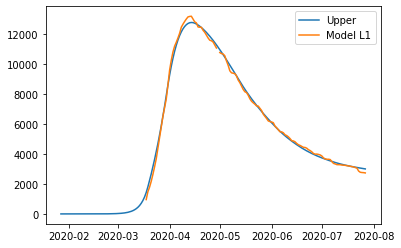

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31377067995677255, 'other': 0.41074630908536164, 'school': 0.23279158532233532, 'transport': 0.2565277041281521, 'work': 0.4165235180708852}
{'home': 1.0, 'leisure': 0.3389571640632288, 'other': 0.44942247817668673, 'school': 0.2947271707966527, 'transport': 0.28583666577290034, 'work': 0.5574952705419243}
{'home': 1.0, 'leisure': 0.3632441308801687, 'other': 0.48671735551475026, 'school': 0.35445077107545886, 'transport': 0.314098878787479, 'work': 0.6934323175675692}
{'home': 1.0, 'leisure': 0.3830335112495272, 'other': 0.5171057740865057, 'school': 0.40311444537670826, 'transport': 0.3371273486512098, 'work': 0.8041958373662428}
{'home': 1.0, 'leisure': 0.394727236013239, 'other': 0.5350625668789067, 'school': 0.4318702529183557, 'transport': 0.3507350808434143, 'work': 0.8696470081563681}
{'home': 1.0, 'leisure': 0.4010238570398531, 'other': 0.544731609151738, 'schoo

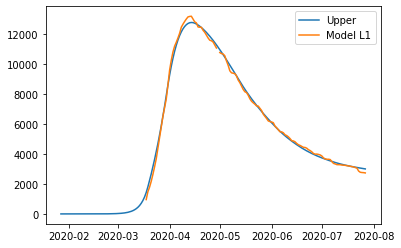

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31377067995677255, 'other': 0.41074630908536164, 'school': 0.23279158532233532, 'transport': 0.2565277041281521, 'work': 0.4165235180708852}
{'home': 1.0, 'leisure': 0.3389571640632288, 'other': 0.44942247817668673, 'school': 0.2947271707966527, 'transport': 0.28583666577290034, 'work': 0.5574952705419243}
{'home': 1.0, 'leisure': 0.3632441308801687, 'other': 0.48671735551475026, 'school': 0.35445077107545886, 'transport': 0.314098878787479, 'work': 0.6934323175675692}
{'home': 1.0, 'leisure': 0.3830335112495272, 'other': 0.5171057740865057, 'school': 0.40311444537670826, 'transport': 0.3371273486512098, 'work': 0.8041958373662428}
{'home': 1.0, 'leisure': 0.394727236013239, 'other': 0.5350625668789067, 'school': 0.4318702529183557, 'transport': 0.3507350808434143, 'work': 0.8696470081563681}
{'home': 1.0, 'leisure': 0.4010238570398531, 'other': 0.544731609151738, 'schoo

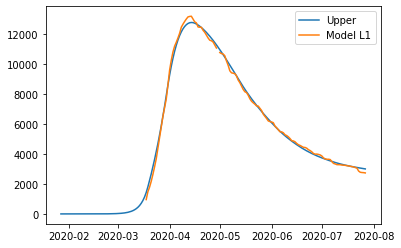

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31377067995677255, 'other': 0.41074630908536164, 'school': 0.23279158532233532, 'transport': 0.2565277041281521, 'work': 0.4165235180708852}
{'home': 1.0, 'leisure': 0.3389571640632288, 'other': 0.44942247817668673, 'school': 0.2947271707966527, 'transport': 0.28583666577290034, 'work': 0.5574952705419243}
{'home': 1.0, 'leisure': 0.3632441308801687, 'other': 0.48671735551475026, 'school': 0.35445077107545886, 'transport': 0.314098878787479, 'work': 0.6934323175675692}
{'home': 1.0, 'leisure': 0.3830335112495272, 'other': 0.5171057740865057, 'school': 0.40311444537670826, 'transport': 0.3371273486512098, 'work': 0.8041958373662428}
{'home': 1.0, 'leisure': 0.394727236013239, 'other': 0.5350625668789067, 'school': 0.4318702529183557, 'transport': 0.3507350808434143, 'work': 0.8696470081563681}
{'home': 1.0, 'leisure': 0.4010238570398531, 'other': 0.544731609151738, 'schoo

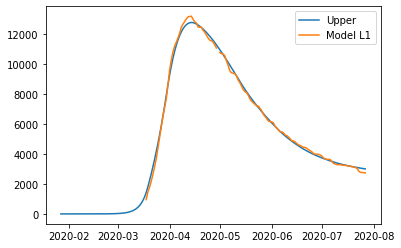

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137412450981458, 'other': 0.4107940977870104, 'school': 0.23271246978900512, 'transport': 0.2565133432776366, 'work': 0.4164532966824402}
{'home': 1.0, 'leisure': 0.3389214260024885, 'other': 0.4494667041780609, 'school': 0.2946350824663129, 'transport': 0.2858175391965808, 'work': 0.5574022966351382}
{'home': 1.0, 'leisure': 0.363202314731676, 'other': 0.48675814605514534, 'school': 0.35434617326228834, 'transport': 0.3140751566898484, 'work': 0.6933174037323828}
{'home': 1.0, 'leisure': 0.38298674258508814, 'other': 0.5171437653623993, 'school': 0.40299965465160165, 'transport': 0.3370998820547332, 'work': 0.8040630465523599}
{'home': 1.0, 'leisure': 0.3946775408621044, 'other': 0.5350989040439584, 'school': 0.4317494391089231, 'transport': 0.35070540158852875, 'work': 0.8695036536732554}
{'home': 1.0, 'leisure': 0.40097258608819003, 'other': 0.544767055641721, 'schoo

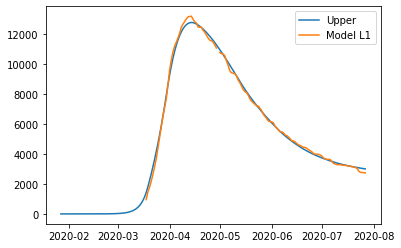

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137412450981458, 'other': 0.4107940977870104, 'school': 0.23271246978900512, 'transport': 0.2565133432776366, 'work': 0.4164532966824402}
{'home': 1.0, 'leisure': 0.3389214260024885, 'other': 0.4494667041780609, 'school': 0.2946350824663129, 'transport': 0.2858175391965808, 'work': 0.5574022966351382}
{'home': 1.0, 'leisure': 0.363202314731676, 'other': 0.48675814605514534, 'school': 0.35434617326228834, 'transport': 0.3140751566898484, 'work': 0.6933174037323828}
{'home': 1.0, 'leisure': 0.38298674258508814, 'other': 0.5171437653623993, 'school': 0.40299965465160165, 'transport': 0.3370998820547332, 'work': 0.8040630465523599}
{'home': 1.0, 'leisure': 0.3946775408621044, 'other': 0.5350989040439584, 'school': 0.4317494391089231, 'transport': 0.35070540158852875, 'work': 0.8695036536732554}
{'home': 1.0, 'leisure': 0.40097258608819003, 'other': 0.544767055641721, 'schoo

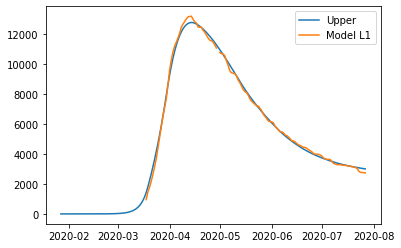

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137412450981458, 'other': 0.4107940977870104, 'school': 0.23271246978900512, 'transport': 0.2565133432776366, 'work': 0.4164532966824402}
{'home': 1.0, 'leisure': 0.3389214260024885, 'other': 0.4494667041780609, 'school': 0.2946350824663129, 'transport': 0.2858175391965808, 'work': 0.5574022966351382}
{'home': 1.0, 'leisure': 0.363202314731676, 'other': 0.48675814605514534, 'school': 0.35434617326228834, 'transport': 0.3140751566898484, 'work': 0.6933174037323828}
{'home': 1.0, 'leisure': 0.38298674258508814, 'other': 0.5171437653623993, 'school': 0.40299965465160165, 'transport': 0.3370998820547332, 'work': 0.8040630465523599}
{'home': 1.0, 'leisure': 0.3946775408621044, 'other': 0.5350989040439584, 'school': 0.4317494391089231, 'transport': 0.35070540158852875, 'work': 0.8695036536732554}
{'home': 1.0, 'leisure': 0.40097258608819003, 'other': 0.544767055641721, 'schoo

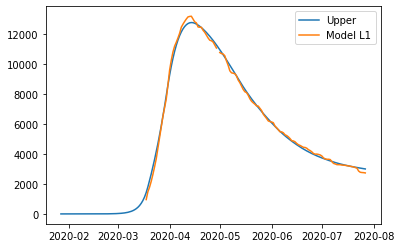

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.41102523022938675, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.44971355071395247, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.4870201454669266, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181115619425, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805460726337, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.5450526261937751, 'sc

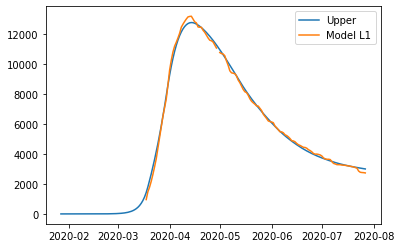

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.41102523022938675, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.44971355071395247, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.4870201454669266, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181115619425, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805460726337, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.5450526261937751, 'sc

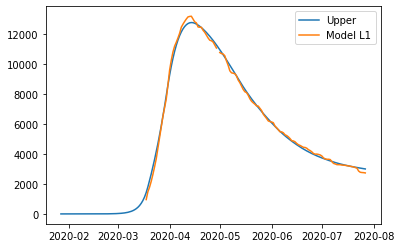

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.41102523022938675, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572862623413, 'other': 0.44971355140645214, 'school': 0.2942906151420619, 'transport': 0.28575529676957684, 'work': 0.5571307616078517}
{'home': 1.0, 'leisure': 0.363060486315999, 'other': 0.48702014682719375, 'school': 0.3539812150749171, 'transport': 0.31400881971289946, 'work': 0.6930250214558753}
{'home': 1.0, 'leisure': 0.3828399185076593, 'other': 0.5174181134663165, 'school': 0.40261800020539174, 'transport': 0.337030208777829, 'work': 0.803753677628339}
{'home': 1.0, 'leisure': 0.39452776480273133, 'other': 0.5353805482985254, 'school': 0.43135791869158124, 'transport': 0.350633756861651, 'work': 0.8691842471847948}
{'home': 1.0, 'leisure': 0.40082122050007785, 'other': 0.5450526285927918, 'sch

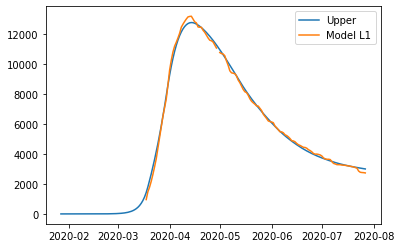

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119076231458, 'other': 0.4110252329746532, 'school': 0.2323892566411604, 'transport': 0.25645534912965695, 'work': 0.4162033910247161}
{'home': 1.0, 'leisure': 0.338785729961934, 'other': 0.44971355345921893, 'school': 0.29429061842649135, 'transport': 0.28575529832420526, 'work': 0.5571307690853291}
{'home': 1.0, 'leisure': 0.3630604872171942, 'other': 0.4870201482121931, 'school': 0.35398121729091775, 'transport': 0.31400882076180536, 'work': 0.6930250265009203}
{'home': 1.0, 'leisure': 0.3828399190548135, 'other': 0.517418114307209, 'school': 0.40261800155082067, 'transport': 0.33703020941466477, 'work': 0.8037536806914021}
{'home': 1.0, 'leisure': 0.3945277651406795, 'other': 0.5353805488179002, 'school': 0.43135791952258146, 'transport': 0.35063375725499074, 'work': 0.8691842490766867}
{'home': 1.0, 'leisure': 0.40082122072537657, 'other': 0.5450526289390416, 's

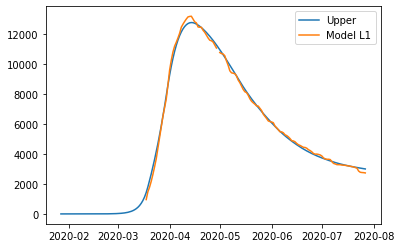

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.4110252343914206, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.4497135562852601, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.4870201523971768, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181195994793, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805547644761, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.545052635237936, 'schoo

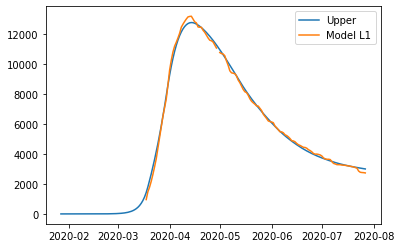

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.4110252402293868, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.4497135607139525, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.48702015546692656, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181215619426, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805560726337, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.5450526361937752, 'sch

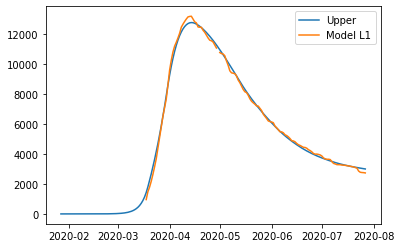

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202515411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057210055222124, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.4879399549557126, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878363215203, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797662194977, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677284722546, 'sch

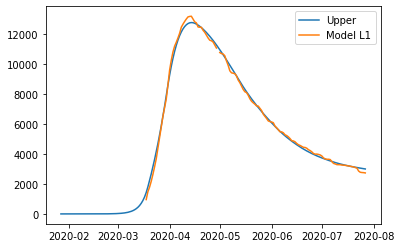

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202515411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057210055222124, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.4879399549557126, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878363215203, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797662194977, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677284722546, 'sch

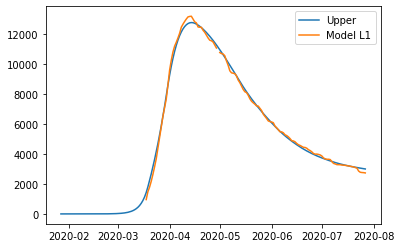

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202515411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814138808104, 'other': 0.4505721012460632, 'school': 0.2932316161469287, 'transport': 0.28558619076137987, 'work': 0.5563339321908309}
{'home': 1.0, 'leisure': 0.3626514776683226, 'other': 0.48793995631861636, 'school': 0.3528716972248866, 'transport': 0.31383382771987756, 'work': 0.6921880142175685}
{'home': 1.0, 'leisure': 0.38242160352629717, 'other': 0.5183878382295857, 'school': 0.40146731884396336, 'transport': 0.336850420797172, 'work': 0.8028839329060212}
{'home': 1.0, 'leisure': 0.39410395062419123, 'other': 0.5363797684497038, 'school': 0.4301829134370542, 'transport': 0.35045113488830054, 'work': 0.8682951575855615}
{'home': 1.0, 'leisure': 0.40039444521536505, 'other': 0.5460677308759213, '

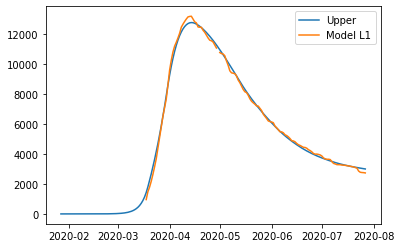

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322616480937115, 'other': 0.4118202542917808, 'school': 0.2313826475672048, 'transport': 0.2562923471059045, 'work': 0.4154482274964364}
{'home': 1.0, 'leisure': 0.33838814272354734, 'other': 0.45057210330280884, 'school': 0.29323161942954895, 'transport': 0.28558619231614407, 'work': 0.5563339396683084}
{'home': 1.0, 'leisure': 0.3626514785693601, 'other': 0.48793995770630016, 'school': 0.3528716994396665, 'transport': 0.3138338287688751, 'work': 0.6921880192626134}
{'home': 1.0, 'leisure': 0.3824216040733557, 'other': 0.518387839072108, 'school': 0.40146732018865117, 'transport': 0.3368504214340634, 'work': 0.8028839359690843}
{'home': 1.0, 'leisure': 0.3941039509620803, 'other': 0.5363797689700852, 'school': 0.43018291426759664, 'transport': 0.3504511352816746, 'work': 0.8682951594774533}
{'home': 1.0, 'leisure': 0.4003944454406244, 'other': 0.5460677312228422, 'sch

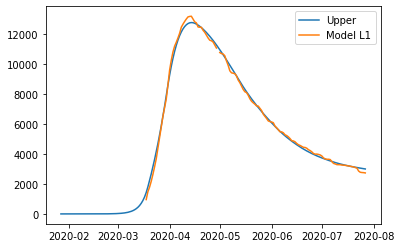

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202556956754, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057210611556053, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.4879399618775927, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878443503596, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797749024491, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677375074204, 'sch

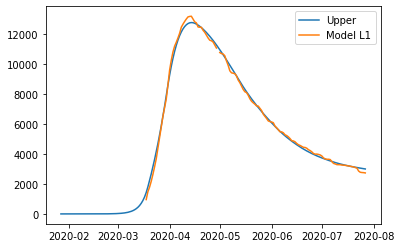

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202615411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057211055222124, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.48793996495571257, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878463215204, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797762194976, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677384722546, 'sc

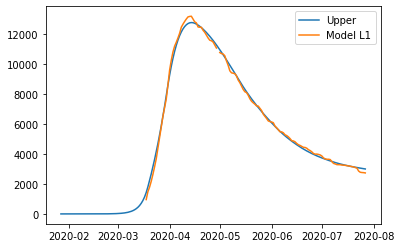

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.4505764766413718, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446433351148, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927791596462, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848594195966, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729026364929, 'schoo

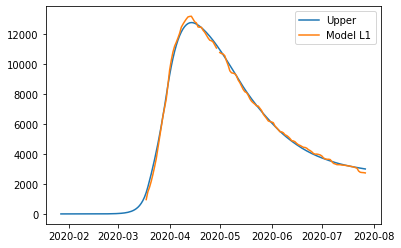

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.4505764766413718, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446433351148, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927791596462, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848594195966, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729026364929, 'schoo

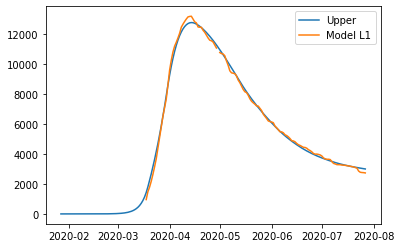

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.3383861139790334, 'other': 0.45057647733522055, 'school': 0.29322621666181514, 'transport': 0.2855853283138769, 'work': 0.5563298686779913}
{'home': 1.0, 'leisure': 0.36264939202106683, 'other': 0.487944644698032, 'school': 0.35286604016355055, 'transport': 0.3138329352524549, 'work': 0.6921837458138336}
{'home': 1.0, 'leisure': 0.38241947042568664, 'other': 0.5183927810677302, 'school': 0.40146145190570526, 'transport': 0.336849503869074, 'work': 0.8028794975541493}
{'home': 1.0, 'leisure': 0.394101789482962, 'other': 0.5363848616498247, 'school': 0.4301769224806149, 'transport': 0.3504502035061671, 'work': 0.8682906235825179}
{'home': 1.0, 'leisure': 0.400392268975341, 'other': 0.5460729050401832, 'school

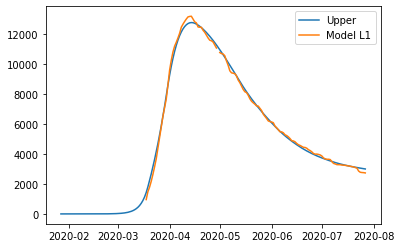

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132241977955007, 'other': 0.4118243065244011, 'school': 0.2313775151981615, 'transport': 0.25629151579017106, 'work': 0.4154443764630438}
{'home': 1.0, 'leisure': 0.3383861153144985, 'other': 0.4505764793919865, 'school': 0.2932262199444261, 'transport': 0.2855853298686418, 'work': 0.5563298761554687}
{'home': 1.0, 'leisure': 0.3626493929221035, 'other': 0.4879446460857295, 'school': 0.3528660423783242, 'transport': 0.3138329363014529, 'work': 0.6921837508588785}
{'home': 1.0, 'leisure': 0.38241947097274465, 'other': 0.518392781910261, 'school': 0.40146145325038934, 'transport': 0.3368495045059657, 'work': 0.8028795006172125}
{'home': 1.0, 'leisure': 0.39410178982085076, 'other': 0.5363848621702112, 'school': 0.43017692331115504, 'transport': 0.3504502038995414, 'work': 0.8682906254744097}
{'home': 1.0, 'leisure': 0.40039226920060017, 'other': 0.5460729053871076, 'schoo

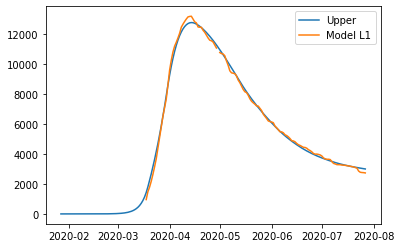

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430792823005, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.4505764822046704, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446502569522, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927871884411, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848681025026, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729116716128, 'schoo

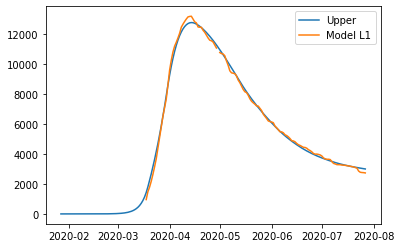

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182431377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.45057648664137173, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446533351148, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927891596462, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848694195965, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729126364929, 'scho

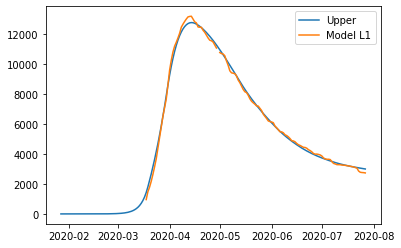

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329818833593, 'other': 0.41242402939656353, 'school': 0.23061773904873073, 'transport': 0.2561684247850266, 'work': 0.41487419891761773}
{'home': 1.0, 'leisure': 0.3380859582974559, 'other': 0.4512241383577378, 'school': 0.2924269015157371, 'transport': 0.2854576291925675, 'work': 0.5557282398112238}
{'home': 1.0, 'leisure': 0.3623406141253349, 'other': 0.4886385291417273, 'school': 0.3520285938946361, 'transport': 0.31370079058555345, 'work': 0.691551779244344}
{'home': 1.0, 'leisure': 0.3821036670221251, 'other': 0.5191243290397928, 'school': 0.40059293583299815, 'transport': 0.3367137369057641, 'work': 0.8022228113750344}
{'home': 1.0, 'leisure': 0.3937818346429557, 'other': 0.5371386653431951, 'school': 0.429290046978394, 'transport': 0.3503122960949796, 'work': 0.8676193303613515}
{'home': 1.0, 'leisure': 0.4000700787464799, 'other': 0.5468386925834887, 'school'

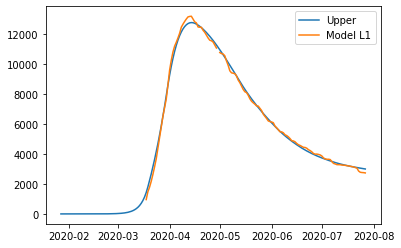

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329818833593, 'other': 0.41242402939656353, 'school': 0.23061773904873073, 'transport': 0.2561684247850266, 'work': 0.41487419891761773}
{'home': 1.0, 'leisure': 0.3380859587479148, 'other': 0.45122413905259995, 'school': 0.2924269026226631, 'transport': 0.2854576297171011, 'work': 0.5557282423337463}
{'home': 1.0, 'leisure': 0.3623406150101648, 'other': 0.4886385305066352, 'school': 0.35202859606895504, 'transport': 0.31370079161588726, 'work': 0.6915517841992989}
{'home': 1.0, 'leisure': 0.38210366826088693, 'other': 0.5191243309506638, 'school': 0.4005929388770447, 'transport': 0.33671373834823154, 'work': 0.8022228183119713}
{'home': 1.0, 'leisure': 0.3937818360908592, 'other': 0.5371386675766808, 'school': 0.4292900505363706, 'transport': 0.35031229778098044, 'work': 0.8676193384694597}
{'home': 1.0, 'leisure': 0.4000700803069981, 'other': 0.5468386949906899, 's

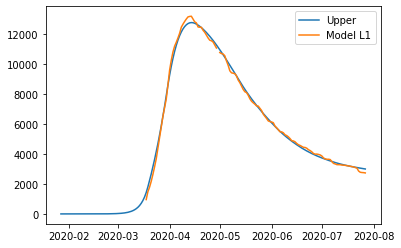

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329836691069, 'other': 0.41242403215119583, 'school': 0.23061774343690178, 'transport': 0.25616842686442765, 'work': 0.4148742089176177}
{'home': 1.0, 'leisure': 0.3380859600832035, 'other': 0.4512241411123701, 'school': 0.2924269059039081, 'transport': 0.28545763127196855, 'work': 0.5557282498112237}
{'home': 1.0, 'leisure': 0.36234061591108246, 'other': 0.48863853189635953, 'school': 0.3520285982828071, 'transport': 0.3137007926649545, 'work': 0.6915517892443439}
{'home': 1.0, 'leisure': 0.3821036688078727, 'other': 0.5191243317944251, 'school': 0.40059294022116926, 'transport': 0.3367137389851652, 'work': 0.8022228213750344}
{'home': 1.0, 'leisure': 0.39378183642870335, 'other': 0.5371386680978274, 'school': 0.429290051366565, 'transport': 0.3503122981743806, 'work': 0.8676193403613515}
{'home': 1.0, 'leisure': 0.4000700805322275, 'other': 0.546838695338121, 'scho

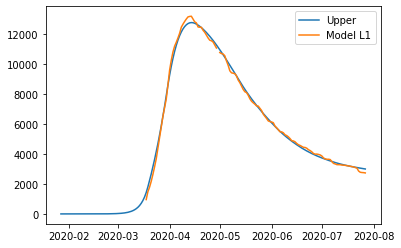

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329818833593, 'other': 0.4124240393965635, 'school': 0.23061773904873073, 'transport': 0.2561684247850266, 'work': 0.41487419891761773}
{'home': 1.0, 'leisure': 0.3380859582974559, 'other': 0.4512241483577378, 'school': 0.2924269015157371, 'transport': 0.2854576291925675, 'work': 0.5557282398112238}
{'home': 1.0, 'leisure': 0.3623406141253349, 'other': 0.4886385391417273, 'school': 0.3520285938946361, 'transport': 0.31370079058555345, 'work': 0.691551779244344}
{'home': 1.0, 'leisure': 0.3821036670221251, 'other': 0.5191243390397928, 'school': 0.40059293583299815, 'transport': 0.3367137369057641, 'work': 0.8022228113750344}
{'home': 1.0, 'leisure': 0.3937818346429557, 'other': 0.5371386753431951, 'school': 0.429290046978394, 'transport': 0.3503122960949796, 'work': 0.8676193303613515}
{'home': 1.0, 'leisure': 0.4000700787464799, 'other': 0.5468387025834887, 'school':

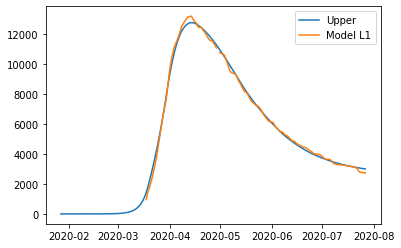

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124540527949223, 'other': 0.41340945873723883, 'school': 0.22936852322123052, 'transport': 0.25596593469966644, 'work': 0.4139363900760702}
{'home': 1.0, 'leisure': 0.33759232615077345, 'other': 0.45228835777432796, 'school': 0.29111267173760713, 'transport': 0.28524755526604734, 'work': 0.5547386876884013}
{'home': 1.0, 'leisure': 0.3618328040296299, 'other': 0.4897787247029496, 'school': 0.35065167209268455, 'transport': 0.31348340366934313, 'work': 0.6905123318145776}
{'home': 1.0, 'leisure': 0.381584304523513, 'other': 0.5203264310892339, 'school': 0.39916493164126626, 'transport': 0.33649039125721386, 'work': 0.8011427085099807}
{'home': 1.0, 'leisure': 0.39325564572444394, 'other': 0.5383773484993111, 'school': 0.42783185773815535, 'transport': 0.35008542937731923, 'work': 0.8665152038299915}
{'home': 1.0, 'leisure': 0.3995402140634067, 'other': 0.5480970732585833

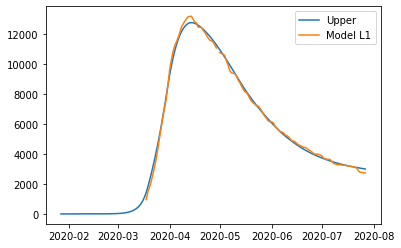

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124540527949223, 'other': 0.41340945873723883, 'school': 0.22936852322123052, 'transport': 0.25596593469966644, 'work': 0.4139363900760702}
{'home': 1.0, 'leisure': 0.3375923266011345, 'other': 0.4522883584708571, 'school': 0.29111267284377523, 'transport': 0.2852475557906378, 'work': 0.5547386902109238}
{'home': 1.0, 'leisure': 0.3618328049142676, 'other': 0.4897787260711318, 'school': 0.35065167426551475, 'transport': 0.3134834046997888, 'work': 0.6905123367695327}
{'home': 1.0, 'leisure': 0.38158430576200575, 'other': 0.5203264330046891, 'school': 0.39916493468322845, 'transport': 0.3364903926998377, 'work': 0.8011427154469177}
{'home': 1.0, 'leisure': 0.39325564717203276, 'other': 0.5383773507381546, 'school': 0.4278318612936956, 'transport': 0.350085431063503, 'work': 0.8665152119380997}
{'home': 1.0, 'leisure': 0.3995402156235858, 'other': 0.5480970756715592, 'sch

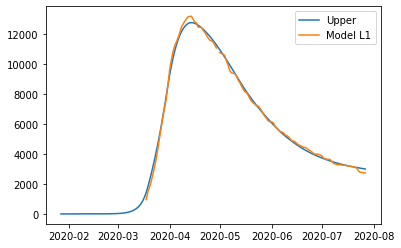

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245405458028186, 'other': 0.41340946149847924, 'school': 0.22936852760639675, 'transport': 0.2559659367792931, 'work': 0.4139364000760702}
{'home': 1.0, 'leisure': 0.33759232793613303, 'other': 0.4522883605355683, 'school': 0.29111267612277336, 'transport': 0.2852475573456739, 'work': 0.5547386976884012}
{'home': 1.0, 'leisure': 0.36183280581498956, 'other': 0.48977872746419, 'school': 0.35065167647785084, 'transport': 0.31348340574896977, 'work': 0.6905123418145777}
{'home': 1.0, 'leisure': 0.38158430630887263, 'other': 0.5203264338504743, 'school': 0.3991649360264325, 'transport': 0.3364903933368405, 'work': 0.8011427185099806}
{'home': 1.0, 'leisure': 0.39325564750980346, 'other': 0.5383773512605514, 'school': 0.42783186212332164, 'transport': 0.3500854314569459, 'work': 0.8665152138299915}
{'home': 1.0, 'leisure': 0.3995402158487663, 'other': 0.5480970760198237, 's

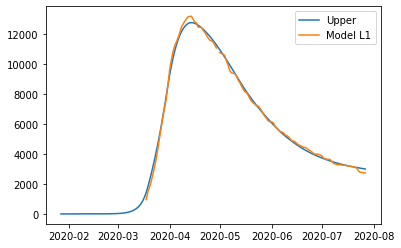

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124540527949223, 'other': 0.4134094687372388, 'school': 0.22936852322123052, 'transport': 0.25596593469966644, 'work': 0.4139363900760702}
{'home': 1.0, 'leisure': 0.33759232615077345, 'other': 0.45228836777432796, 'school': 0.29111267173760713, 'transport': 0.28524755526604734, 'work': 0.5547386876884013}
{'home': 1.0, 'leisure': 0.3618328040296299, 'other': 0.48977873470294964, 'school': 0.35065167209268455, 'transport': 0.31348340366934313, 'work': 0.6905123318145776}
{'home': 1.0, 'leisure': 0.381584304523513, 'other': 0.520326441089234, 'school': 0.39916493164126626, 'transport': 0.33649039125721386, 'work': 0.8011427085099807}
{'home': 1.0, 'leisure': 0.39325564572444394, 'other': 0.538377358499311, 'school': 0.42783185773815535, 'transport': 0.35008542937731923, 'work': 0.8665152038299915}
{'home': 1.0, 'leisure': 0.3995402140634067, 'other': 0.5480970832585833, 

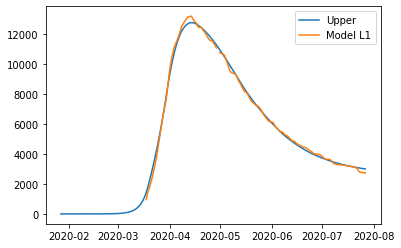

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383078955125, 'other': 0.41340991527576976, 'school': 0.22936794423966855, 'transport': 0.25596584081937596, 'work': 0.4139359553260601}
{'home': 1.0, 'leisure': 0.3375920973302806, 'other': 0.4522888508225533, 'school': 0.2911120626240482, 'transport': 0.2852474578694937, 'work': 0.5547382289512084}
{'home': 1.0, 'leisure': 0.3618325686374125, 'other': 0.4897792529569518, 'school': 0.35065103392327146, 'transport': 0.31348330288210724, 'work': 0.6905118499468872}
{'home': 1.0, 'leisure': 0.38158406377655696, 'other': 0.5203269880294246, 'school': 0.39916426979671266, 'transport': 0.3364902877071998, 'work': 0.801142207795218}
{'home': 1.0, 'leisure': 0.39325540181332413, 'other': 0.5383779223904313, 'school': 0.4278311819037461, 'transport': 0.35008532419475447, 'work': 0.8665146919783226}
{'home': 1.0, 'leisure': 0.3995399684485065, 'other': 0.5480976562771271, 's

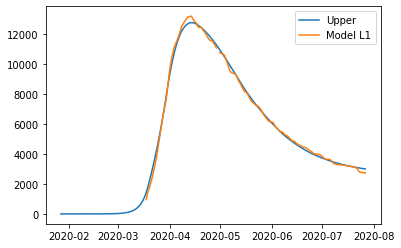

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383078955125, 'other': 0.41340991527576976, 'school': 0.22936794423966855, 'transport': 0.25596584081937596, 'work': 0.4139359553260601}
{'home': 1.0, 'leisure': 0.3375920977806416, 'other': 0.45228885151908327, 'school': 0.291112063730216, 'transport': 0.2852474583940843, 'work': 0.554738231473731}
{'home': 1.0, 'leisure': 0.36183256952205, 'other': 0.48977925432513547, 'school': 0.35065103609610093, 'transport': 0.31348330391255297, 'work': 0.6905118549018422}
{'home': 1.0, 'leisure': 0.3815840650150495, 'other': 0.5203269899448817, 'school': 0.39916427283867384, 'transport': 0.33649028914982376, 'work': 0.801142214732155}
{'home': 1.0, 'leisure': 0.39325540326091285, 'other': 0.5383779246292772, 'school': 0.42783118545928517, 'transport': 0.3500853258809383, 'work': 0.8665147000864308}
{'home': 1.0, 'leisure': 0.39953997000868546, 'other': 0.5480976586901056, 'sc

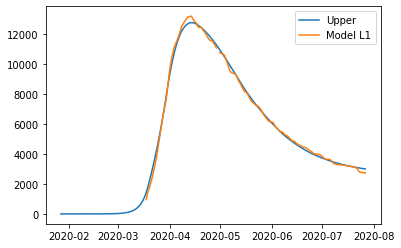

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383257491066, 'other': 0.4134099180370132, 'school': 0.2293679486248334, 'transport': 0.25596584289900265, 'work': 0.4139359653260601}
{'home': 1.0, 'leisure': 0.33759209911564003, 'other': 0.4522888535837968, 'school': 0.2911120670092131, 'transport': 0.28524745994912043, 'work': 0.5547382389512084}
{'home': 1.0, 'leisure': 0.36183257042277184, 'other': 0.48977925571819525, 'school': 0.3506510383084363, 'transport': 0.313483304961734, 'work': 0.6905118599468871}
{'home': 1.0, 'leisure': 0.3815840655619164, 'other': 0.520326990790668, 'school': 0.39916427418187755, 'transport': 0.33649028978682655, 'work': 0.8011422177952181}
{'home': 1.0, 'leisure': 0.39325540359868355, 'other': 0.5383779251516747, 'school': 0.4278311862889109, 'transport': 0.3500853262743812, 'work': 0.8665147019783226}
{'home': 1.0, 'leisure': 0.3995399702338659, 'other': 0.5480976590383706, 'sch

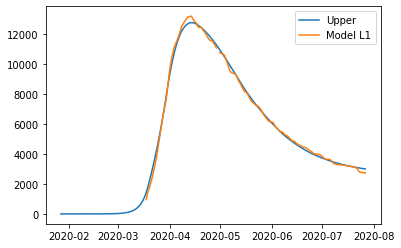

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383078955125, 'other': 0.41340992527576975, 'school': 0.22936794423966855, 'transport': 0.25596584081937596, 'work': 0.4139359553260601}
{'home': 1.0, 'leisure': 0.3375920973302806, 'other': 0.4522888608225533, 'school': 0.2911120626240482, 'transport': 0.2852474578694937, 'work': 0.5547382289512084}
{'home': 1.0, 'leisure': 0.3618325686374125, 'other': 0.48977926295695173, 'school': 0.35065103392327146, 'transport': 0.31348330288210724, 'work': 0.6905118499468872}
{'home': 1.0, 'leisure': 0.38158406377655696, 'other': 0.5203269980294246, 'school': 0.39916426979671266, 'transport': 0.3364902877071998, 'work': 0.801142207795218}
{'home': 1.0, 'leisure': 0.39325540181332413, 'other': 0.5383779323904312, 'school': 0.4278311819037461, 'transport': 0.35008532419475447, 'work': 0.8665146919783226}
{'home': 1.0, 'leisure': 0.3995399684485065, 'other': 0.5480976662771271, '

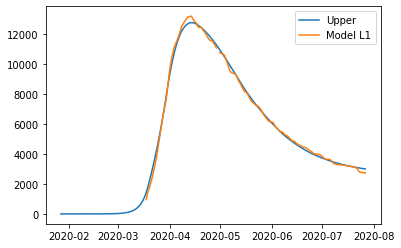

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536096751381, 'other': 0.4134103699818755, 'school': 0.2293673675817705, 'transport': 0.25596574731583266, 'work': 0.4139355223207697}
{'home': 1.0, 'leisure': 0.33759186942809655, 'other': 0.4522893418918198, 'school': 0.29111145595508425, 'transport': 0.28524736086379815, 'work': 0.5547377720549996}
{'home': 1.0, 'leisure': 0.361832334189878, 'other': 0.48977977909069464, 'school': 0.35065039831506534, 'transport': 0.3134832024993363, 'work': 0.690511370013007}
{'home': 1.0, 'leisure': 0.38158382399577395, 'other': 0.5203275427342223, 'school': 0.3991636106083833, 'transport': 0.33649018457273777, 'work': 0.801141709089902}
{'home': 1.0, 'leisure': 0.3932551588810761, 'other': 0.5383784939781251, 'school': 0.42783050878170753, 'transport': 0.35008521943429316, 'work': 0.8665141821807945}
{'home': 1.0, 'leisure': 0.3995397238193157, 'other': 0.5480982369556111, 'sch

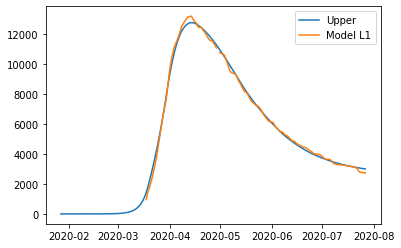

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536096751381, 'other': 0.4134103699818755, 'school': 0.2293673675817705, 'transport': 0.25596574731583266, 'work': 0.4139355223207697}
{'home': 1.0, 'leisure': 0.33759186987845746, 'other': 0.45228934258835046, 'school': 0.29111145706125163, 'transport': 0.2852473613883887, 'work': 0.5547377745775222}
{'home': 1.0, 'leisure': 0.36183233507451545, 'other': 0.4897797804588798, 'school': 0.3506504004878941, 'transport': 0.31348320352978204, 'work': 0.690511374967962}
{'home': 1.0, 'leisure': 0.38158382523426637, 'other': 0.5203275446496817, 'school': 0.3991636136503436, 'transport': 0.33649018601536185, 'work': 0.801141716026839}
{'home': 1.0, 'leisure': 0.3932551603286647, 'other': 0.5383784962169735, 'school': 0.4278305123372455, 'transport': 0.35008522112047713, 'work': 0.8665141902889026}
{'home': 1.0, 'leisure': 0.39953972537949456, 'other': 0.5480982393685923, 'sc

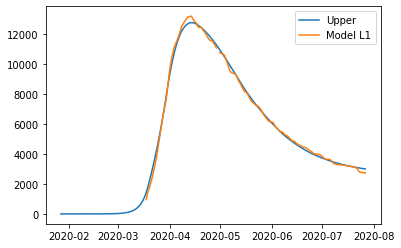

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536114604973, 'other': 0.413410372743122, 'school': 0.22936737196693396, 'transport': 0.25596574939545946, 'work': 0.4139355323207697}
{'home': 1.0, 'leisure': 0.3375918712134558, 'other': 0.45228934465306625, 'school': 0.2911114603402477, 'transport': 0.28524736294342495, 'work': 0.5547377820549996}
{'home': 1.0, 'leisure': 0.36183233597523723, 'other': 0.48977978185194115, 'school': 0.35065040270022885, 'transport': 0.31348320457896317, 'work': 0.690511380013007}
{'home': 1.0, 'leisure': 0.38158382578113315, 'other': 0.5203275454954688, 'school': 0.39916361499354674, 'transport': 0.3364901866523646, 'work': 0.801141719089902}
{'home': 1.0, 'leisure': 0.39325516066643534, 'other': 0.5383784967393715, 'school': 0.427830513166871, 'transport': 0.35008522151391996, 'work': 0.8665141921807944}
{'home': 1.0, 'leisure': 0.399539725604675, 'other': 0.5480982397168576, 'sch

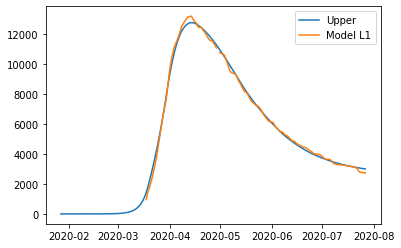

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536096751381, 'other': 0.41341037998187546, 'school': 0.2293673675817705, 'transport': 0.25596574731583266, 'work': 0.4139355223207697}
{'home': 1.0, 'leisure': 0.33759186942809655, 'other': 0.4522893518918198, 'school': 0.29111145595508425, 'transport': 0.28524736086379815, 'work': 0.5547377720549996}
{'home': 1.0, 'leisure': 0.361832334189878, 'other': 0.48977978909069464, 'school': 0.35065039831506534, 'transport': 0.3134832024993363, 'work': 0.690511370013007}
{'home': 1.0, 'leisure': 0.38158382399577395, 'other': 0.5203275527342224, 'school': 0.3991636106083833, 'transport': 0.33649018457273777, 'work': 0.801141709089902}
{'home': 1.0, 'leisure': 0.3932551588810761, 'other': 0.538378503978125, 'school': 0.42783050878170753, 'transport': 0.35008521943429316, 'work': 0.8665141821807945}
{'home': 1.0, 'leisure': 0.3995397238193157, 'other': 0.548098246955611, 'scho

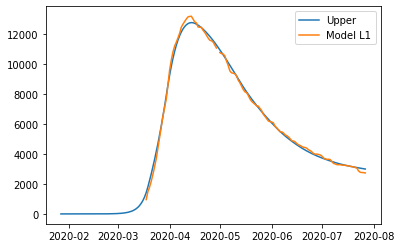

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304825071764, 'other': 0.4136635361829876, 'school': 0.22904626903372427, 'transport': 0.25591367761419503, 'work': 0.4136943993755971}
{'home': 1.0, 'leisure': 0.3374649625609959, 'other': 0.45256275498620724, 'school': 0.2907736465009324, 'transport': 0.28519334087943565, 'work': 0.5544833452340038}
{'home': 1.0, 'leisure': 0.3617017826128933, 'other': 0.49007271597502616, 'school': 0.35029647477288295, 'transport': 0.31342730188520335, 'work': 0.6902441144546101}
{'home': 1.0, 'leisure': 0.3814503026551801, 'other': 0.5206363878918416, 'school': 0.39879655706854655, 'transport': 0.33643275159360675, 'work': 0.8008640004862154}
{'home': 1.0, 'leisure': 0.39311988268016773, 'other': 0.5386967394790507, 'school': 0.4274556966068932, 'transport': 0.35002688096675416, 'work': 0.8662302967776185}
{'home': 1.0, 'leisure': 0.3994035026936226, 'other': 0.5484215441798557, 

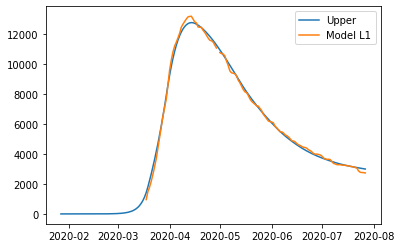

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304825071764, 'other': 0.4136635361829876, 'school': 0.22904626903372427, 'transport': 0.25591367761419503, 'work': 0.4136943993755971}
{'home': 1.0, 'leisure': 0.33746496301133166, 'other': 0.4525627556831665, 'school': 0.29077364760690483, 'transport': 0.28519334140404085, 'work': 0.5544833477565263}
{'home': 1.0, 'leisure': 0.3617017834974814, 'other': 0.4900727173440533, 'school': 0.35029647694532895, 'transport': 0.3134273029156779, 'work': 0.6902441194095652}
{'home': 1.0, 'leisure': 0.38145030389360335, 'other': 0.5206363898084795, 'school': 0.3987965601099709, 'transport': 0.33643275303627096, 'work': 0.8008640074231523}
{'home': 1.0, 'leisure': 0.39311988412767546, 'other': 0.5386967417192768, 'school': 0.4274557001618048, 'transport': 0.3500268826529851, 'work': 0.8662303048857267}
{'home': 1.0, 'leisure': 0.3994035042537143, 'other': 0.5484215465943216, 's

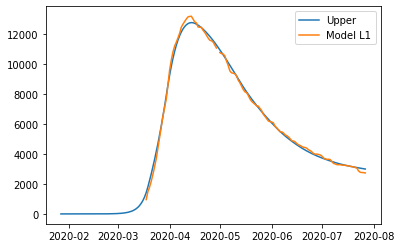

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304842924359, 'other': 0.41366353894593316, 'school': 0.22904627341811518, 'transport': 0.2559136796938798, 'work': 0.4136944093755971}
{'home': 1.0, 'leisure': 0.3374649643462554, 'other': 0.4525627577491528, 'school': 0.29077365088532325, 'transport': 0.28519334295912047, 'work': 0.5544833552340037}
{'home': 1.0, 'leisure': 0.3617017843981528, 'other': 0.4900727187379717, 'school': 0.3502964791572739, 'transport': 0.31342730396488816, 'work': 0.6902441244546101}
{'home': 1.0, 'leisure': 0.3814503044404396, 'other': 0.5206363906547872, 'school': 0.3987965614529375, 'transport': 0.33643275367329156, 'work': 0.8008640104862155}
{'home': 1.0, 'leisure': 0.3931198844654272, 'other': 0.5386967422419963, 'school': 0.42745570099128405, 'transport': 0.350026883046439, 'work': 0.8662303067776185}
{'home': 1.0, 'leisure': 0.39940350447888207, 'other': 0.5484215469428011, 'sch

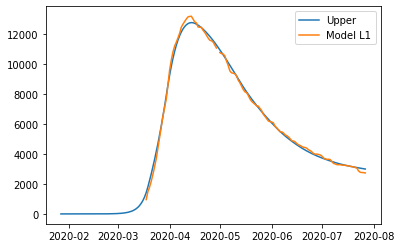

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304825071764, 'other': 0.4136635461829876, 'school': 0.22904626903372427, 'transport': 0.25591367761419503, 'work': 0.4136943993755971}
{'home': 1.0, 'leisure': 0.3374649625609959, 'other': 0.4525627649862073, 'school': 0.2907736465009324, 'transport': 0.28519334087943565, 'work': 0.5544833452340038}
{'home': 1.0, 'leisure': 0.3617017826128933, 'other': 0.49007272597502616, 'school': 0.35029647477288295, 'transport': 0.31342730188520335, 'work': 0.6902441144546101}
{'home': 1.0, 'leisure': 0.3814503026551801, 'other': 0.5206363978918416, 'school': 0.39879655706854655, 'transport': 0.33643275159360675, 'work': 0.8008640004862154}
{'home': 1.0, 'leisure': 0.39311988268016773, 'other': 0.5386967494790508, 'school': 0.4274556966068932, 'transport': 0.35002688096675416, 'work': 0.8662302967776185}
{'home': 1.0, 'leisure': 0.3994035026936226, 'other': 0.5484215541798556, '

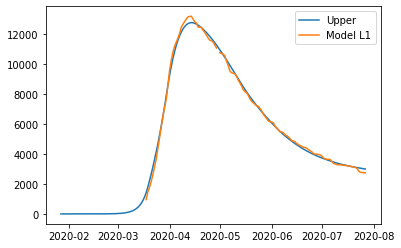

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264851220528, 'other': 0.4136718127788025, 'school': 0.2290358456823713, 'transport': 0.2559119956918501, 'work': 0.4136866091622293}
{'home': 1.0, 'leisure': 0.3374608608117925, 'other': 0.45257171852581335, 'school': 0.2907627112611542, 'transport': 0.28519161054341646, 'work': 0.5544751892782639}
{'home': 1.0, 'leisure': 0.3616975802268986, 'other': 0.4900823419247168, 'school': 0.3502850459264092, 'transport': 0.31342552486456976, 'work': 0.6902356058187258}
{'home': 1.0, 'leisure': 0.38144601826883684, 'other': 0.5206465535830824, 'school': 0.3987847260240243, 'transport': 0.3364309365336577, 'work': 0.8008552044813244}
{'home': 1.0, 'leisure': 0.39311554983907315, 'other': 0.5387072241084804, 'school': 0.4274436278998878, 'transport': 0.35002504342902774, 'work': 0.866221330963769}
{'home': 1.0, 'leisure': 0.3993991437615081, 'other': 0.5484322005452331, 'schoo

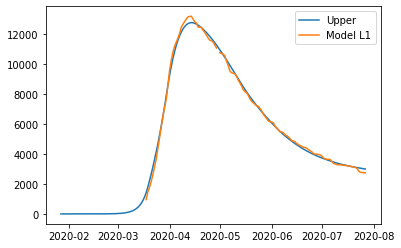

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264851220528, 'other': 0.4136718127788025, 'school': 0.2290358456823713, 'transport': 0.2559119956918501, 'work': 0.4136866091622293}
{'home': 1.0, 'leisure': 0.3374608612621275, 'other': 0.4525717192227867, 'school': 0.2907627123671204, 'transport': 0.28519161106802215, 'work': 0.5544751918007864}
{'home': 1.0, 'leisure': 0.3616975811114852, 'other': 0.49008234329377154, 'school': 0.35028504809884276, 'transport': 0.31342552589504524, 'work': 0.6902356107736808}
{'home': 1.0, 'leisure': 0.3814460195072582, 'other': 0.5206465554997592, 'school': 0.3987847290654314, 'transport': 0.3364309379763233, 'work': 0.8008552114182614}
{'home': 1.0, 'leisure': 0.3931155512865786, 'other': 0.5387072263487519, 'school': 0.42744363145477915, 'transport': 0.35002504511526034, 'work': 0.8662213390718771}
{'home': 1.0, 'leisure': 0.39939914532159726, 'other': 0.5484322029597479, 'sch

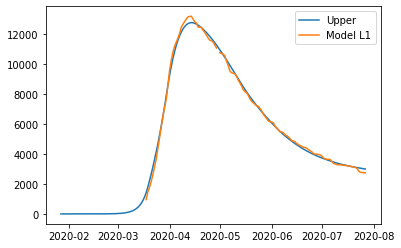

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264869073095, 'other': 0.413671815541804, 'school': 0.2290358500667372, 'transport': 0.2559119977715369, 'work': 0.4136866191622293}
{'home': 1.0, 'leisure': 0.3374608625970492, 'other': 0.4525717212888149, 'school': 0.2907627156455202, 'transport': 0.2851916126231033, 'work': 0.5544751992782639}
{'home': 1.0, 'leisure': 0.3616975820121553, 'other': 0.4900823446877182, 'school': 0.35028505031077506, 'transport': 0.3134255269442565, 'work': 0.6902356158187257}
{'home': 1.0, 'leisure': 0.38144602005409356, 'other': 0.5206465563460839, 'school': 0.39878473040839024, 'transport': 0.33643093861334444, 'work': 0.8008552144813244}
{'home': 1.0, 'leisure': 0.3931155516243298, 'other': 0.5387072268714819, 'school': 0.42744363228425375, 'transport': 0.3500250455087145, 'work': 0.8662213409637689}
{'home': 1.0, 'leisure': 0.39939914554676476, 'other': 0.5484322033082346, 'schoo

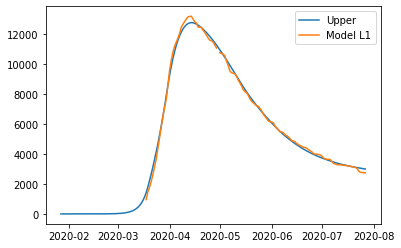

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264851220528, 'other': 0.41367182277880243, 'school': 0.2290358456823713, 'transport': 0.2559119956918501, 'work': 0.4136866091622293}
{'home': 1.0, 'leisure': 0.3374608608117925, 'other': 0.4525717285258134, 'school': 0.2907627112611542, 'transport': 0.28519161054341646, 'work': 0.5544751892782639}
{'home': 1.0, 'leisure': 0.3616975802268986, 'other': 0.4900823519247167, 'school': 0.3502850459264092, 'transport': 0.31342552486456976, 'work': 0.6902356058187258}
{'home': 1.0, 'leisure': 0.38144601826883684, 'other': 0.5206465635830825, 'school': 0.3987847260240243, 'transport': 0.3364309365336577, 'work': 0.8008552044813244}
{'home': 1.0, 'leisure': 0.39311554983907315, 'other': 0.5387072341084804, 'school': 0.4274436278998878, 'transport': 0.35002504342902774, 'work': 0.866221330963769}
{'home': 1.0, 'leisure': 0.3993991437615081, 'other': 0.5484322105452331, 'schoo

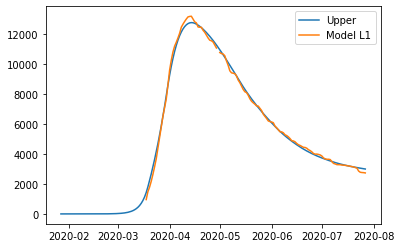

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252669561313, 'other': 0.4136743349788082, 'school': 0.22903266926852628, 'transport': 0.25591148314069545, 'work': 0.4136842351655167}
{'home': 1.0, 'leisure': 0.33745961084190657, 'other': 0.4525744500648814, 'school': 0.2907593788543277, 'transport': 0.28519108323860615, 'work': 0.5544727038248879}
{'home': 1.0, 'leisure': 0.3616962995889042, 'other': 0.49008527532645196, 'school': 0.350281563097779, 'transport': 0.31342498333302, 'work': 0.6902330128892815}
{'home': 1.0, 'leisure': 0.38144471264201335, 'other': 0.5206496514655095, 'school': 0.3987811206294801, 'transport': 0.3364303834099498, 'work': 0.8008525239787875}
{'home': 1.0, 'leisure': 0.3931142294461233, 'other': 0.5387104191840435, 'school': 0.4274399500800308, 'transport': 0.3500244834554083, 'work': 0.8662185987134955}
{'home': 1.0, 'leisure': 0.39939781541756714, 'other': 0.5484354479555618, 'school

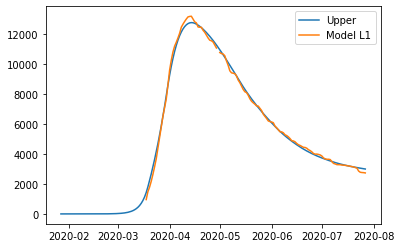

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252669561313, 'other': 0.4136743349788082, 'school': 0.22903266926852628, 'transport': 0.25591148314069545, 'work': 0.4136842351655167}
{'home': 1.0, 'leisure': 0.3374596112922414, 'other': 0.4525744507618591, 'school': 0.29075937996029194, 'transport': 0.28519108376321195, 'work': 0.5544727063474104}
{'home': 1.0, 'leisure': 0.36169630047349044, 'other': 0.49008527669551527, 'school': 0.3502815652702088, 'transport': 0.31342498436349575, 'work': 0.6902330178442365}
{'home': 1.0, 'leisure': 0.3814447138804341, 'other': 0.520649653382198, 'school': 0.3987811236708819, 'transport': 0.33643038485261584, 'work': 0.8008525309157244}
{'home': 1.0, 'leisure': 0.39311423089362807, 'other': 0.5387104214243288, 'school': 0.42743995363491594, 'transport': 0.35002448514164136, 'work': 0.8662186068216037}
{'home': 1.0, 'leisure': 0.39939781697765564, 'other': 0.5484354503700916, 

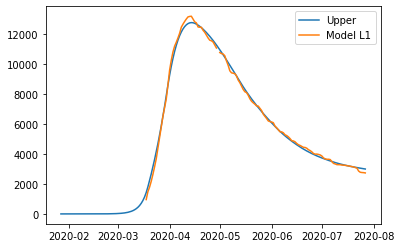

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252687413871, 'other': 0.41367433774182677, 'school': 0.22903267365288463, 'transport': 0.2559114852203829, 'work': 0.4136842451655167}
{'home': 1.0, 'leisure': 0.33745961262716245, 'other': 0.4525744528279, 'school': 0.29075938323868605, 'transport': 0.2851910853182935, 'work': 0.5544727138248879}
{'home': 1.0, 'leisure': 0.36169630137416003, 'other': 0.49008527808947056, 'school': 0.35028156748213735, 'transport': 0.31342498541270736, 'work': 0.6902330228892815}
{'home': 1.0, 'leisure': 0.38144471442726924, 'other': 0.520649654228528, 'school': 0.39878112501383856, 'transport': 0.3364303854896372, 'work': 0.8008525339787875}
{'home': 1.0, 'leisure': 0.39311423123137923, 'other': 0.5387104219470621, 'school': 0.4274399544643891, 'transport': 0.3500244855350957, 'work': 0.8662186087134955}
{'home': 1.0, 'leisure': 0.39939781720282297, 'other': 0.5484354507185804, 'sc

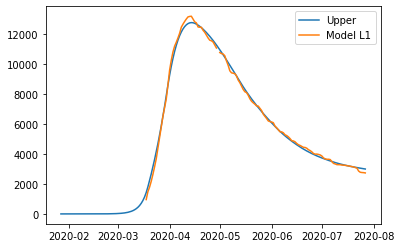

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252669561313, 'other': 0.4136743449788082, 'school': 0.22903266926852628, 'transport': 0.25591148314069545, 'work': 0.4136842351655167}
{'home': 1.0, 'leisure': 0.33745961084190657, 'other': 0.4525744600648814, 'school': 0.2907593788543277, 'transport': 0.28519108323860615, 'work': 0.5544727038248879}
{'home': 1.0, 'leisure': 0.3616962995889042, 'other': 0.490085285326452, 'school': 0.350281563097779, 'transport': 0.31342498333302, 'work': 0.6902330128892815}
{'home': 1.0, 'leisure': 0.38144471264201335, 'other': 0.5206496614655095, 'school': 0.3987811206294801, 'transport': 0.3364303834099498, 'work': 0.8008525239787875}
{'home': 1.0, 'leisure': 0.3931142294461233, 'other': 0.5387104291840434, 'school': 0.4274399500800308, 'transport': 0.3500244834554083, 'work': 0.8662185987134955}
{'home': 1.0, 'leisure': 0.39939781541756714, 'other': 0.5484354579555618, 'school':

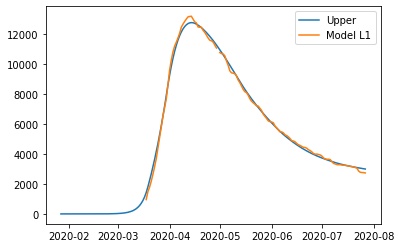

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232368451420495, 'other': 0.4136776113976819, 'school': 0.22902854299501332, 'transport': 0.25591081731738985, 'work': 0.4136811512561018}
{'home': 1.0, 'leisure': 0.337457987085484, 'other': 0.45257799842236135, 'school': 0.2907550499404233, 'transport': 0.28519039824973685, 'work': 0.5544694751291505}
{'home': 1.0, 'leisure': 0.3616946359935031, 'other': 0.4900890859104451, 'school': 0.35027703878064004, 'transport': 0.31342427986307153, 'work': 0.6902296445781617}
{'home': 1.0, 'leisure': 0.3814430165852224, 'other': 0.5206536757155504, 'school': 0.39877643709489075, 'transport': 0.3364296648813442, 'work': 0.8008490419069857}
{'home': 1.0, 'leisure': 0.39311251420760196, 'other': 0.5387145696912945, 'school': 0.4274351724624025, 'transport': 0.35002375602850533, 'work': 0.8662150494194726}
{'home': 1.0, 'leisure': 0.3993960898504217, 'other': 0.5484396664474643, 's

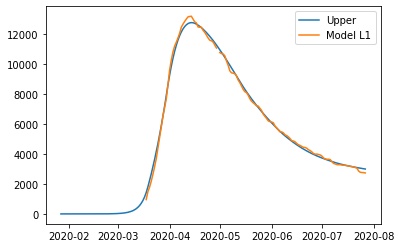

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232368451420495, 'other': 0.4136776113976819, 'school': 0.22902854299501332, 'transport': 0.25591081731738985, 'work': 0.4136811512561018}
{'home': 1.0, 'leisure': 0.3374579875358185, 'other': 0.4525779991193446, 'school': 0.29075505104638505, 'transport': 0.2851903987743429, 'work': 0.554469477651673}
{'home': 1.0, 'leisure': 0.3616946368780888, 'other': 0.4900890872795194, 'school': 0.350277040953065, 'transport': 0.3134242808935476, 'work': 0.6902296495331167}
{'home': 1.0, 'leisure': 0.3814430178236423, 'other': 0.5206536776322543, 'school': 0.3987764401362856, 'transport': 0.3364296663240107, 'work': 0.8008490488439226}
{'home': 1.0, 'leisure': 0.39311251565510585, 'other': 0.5387145719315978, 'school': 0.42743517601727965, 'transport': 0.3500237577147389, 'work': 0.8662150575275808}
{'home': 1.0, 'leisure': 0.39939609141050925, 'other': 0.5484396688620135, 'schoo

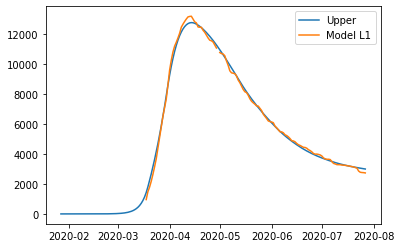

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123236862994597, 'other': 0.4136776141607226, 'school': 0.22902854737936176, 'transport': 0.255910819397078, 'work': 0.41368116125610177}
{'home': 1.0, 'leisure': 0.33745798887073875, 'other': 0.45257800118540203, 'school': 0.2907550543247717, 'transport': 0.285190400329425, 'work': 0.5544694851291505}
{'home': 1.0, 'leisure': 0.3616946377787579, 'other': 0.4900890886734858, 'school': 0.3502770431649885, 'transport': 0.3134242819427596, 'work': 0.6902296545781617}
{'home': 1.0, 'leisure': 0.3814430183704771, 'other': 0.5206536784785911, 'school': 0.3987764414792392, 'transport': 0.3364296669610323, 'work': 0.8008490519069857}
{'home': 1.0, 'leisure': 0.3931125159928567, 'other': 0.5387145724543352, 'school': 0.427435176846751, 'transport': 0.3500237581081934, 'work': 0.8662150594194726}
{'home': 1.0, 'leisure': 0.39939609163567646, 'other': 0.548439669210505, 'school': 

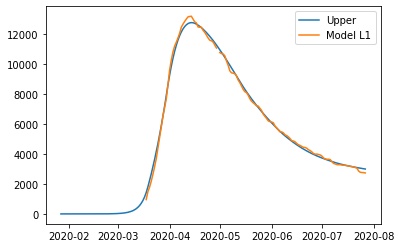

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232368451420495, 'other': 0.4136776213976819, 'school': 0.22902854299501332, 'transport': 0.25591081731738985, 'work': 0.4136811512561018}
{'home': 1.0, 'leisure': 0.337457987085484, 'other': 0.45257800842236134, 'school': 0.2907550499404233, 'transport': 0.28519039824973685, 'work': 0.5544694751291505}
{'home': 1.0, 'leisure': 0.3616946359935031, 'other': 0.49008909591044514, 'school': 0.35027703878064004, 'transport': 0.31342427986307153, 'work': 0.6902296445781617}
{'home': 1.0, 'leisure': 0.3814430165852224, 'other': 0.5206536857155504, 'school': 0.39877643709489075, 'transport': 0.3364296648813442, 'work': 0.8008490419069857}
{'home': 1.0, 'leisure': 0.39311251420760196, 'other': 0.5387145796912944, 'school': 0.4274351724624025, 'transport': 0.35002375602850533, 'work': 0.8662150494194726}
{'home': 1.0, 'leisure': 0.3993960898504217, 'other': 0.5484396764474643, '

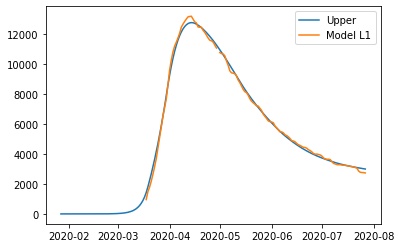

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233275876413, 'other': 0.41367835040631656, 'school': 0.2290276122969232, 'transport': 0.25591066713798183, 'work': 0.41368045566692374}
{'home': 1.0, 'leisure': 0.3374576208402605, 'other': 0.4525787987678424, 'school': 0.29075407353595134, 'transport': 0.2851902437474495, 'work': 0.5544687468827878}
{'home': 1.0, 'leisure': 0.36169426076242905, 'other': 0.490089945402171, 'school': 0.35027601830215704, 'transport': 0.31342412119229346, 'work': 0.6902288848409426}
{'home': 1.0, 'leisure': 0.38144263403234413, 'other': 0.5206545834005127, 'school': 0.39877538070425056, 'transport': 0.33642950281401807, 'work': 0.80084825651055}
{'home': 1.0, 'leisure': 0.393112127328203, 'other': 0.5387155058540782, 'school': 0.4274340948509422, 'transport': 0.350023591954128, 'work': 0.8662142488607727}
{'home': 1.0, 'leisure': 0.3993957006413578, 'other': 0.5484406179444598, 'schoo

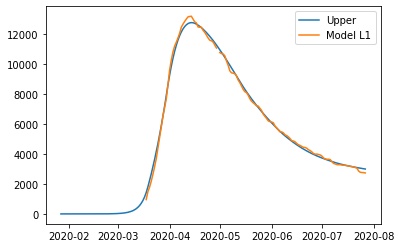

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233275876413, 'other': 0.41367835040631656, 'school': 0.2290276122969232, 'transport': 0.25591066713798183, 'work': 0.41368045566692374}
{'home': 1.0, 'leisure': 0.337457621290595, 'other': 0.45257879946482693, 'school': 0.29075407464191255, 'transport': 0.28519024427205564, 'work': 0.5544687494053104}
{'home': 1.0, 'leisure': 0.36169426164701457, 'other': 0.4900899467712476, 'school': 0.35027602047458084, 'transport': 0.3134241222227696, 'work': 0.6902288897958975}
{'home': 1.0, 'leisure': 0.38144263527076394, 'other': 0.5206545853172201, 'school': 0.3987753837456439, 'transport': 0.3364295042566847, 'work': 0.800848263447487}
{'home': 1.0, 'leisure': 0.39311212877570667, 'other': 0.5387155080943856, 'school': 0.42743409840581753, 'transport': 0.35002359364036184, 'work': 0.8662142569688809}
{'home': 1.0, 'leisure': 0.3993957022014451, 'other': 0.5484406203590132, '

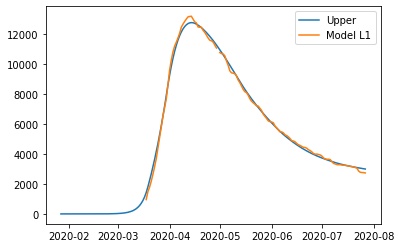

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233293728958, 'other': 0.41367835316936225, 'school': 0.22902761668126942, 'transport': 0.25591066921767014, 'work': 0.41368046566692374}
{'home': 1.0, 'leisure': 0.33745762262551504, 'other': 0.45257880153088814, 'school': 0.29075407792029756, 'transport': 0.28519024582713787, 'work': 0.5544687568827878}
{'home': 1.0, 'leisure': 0.36169426254768355, 'other': 0.49008994816521667, 'school': 0.3502760226865032, 'transport': 0.31342412327198177, 'work': 0.6902288948409425}
{'home': 1.0, 'leisure': 0.38144263581759863, 'other': 0.5206545861635584, 'school': 0.3987753850885968, 'transport': 0.3364295048937064, 'work': 0.8008482665105501}
{'home': 1.0, 'leisure': 0.3931121291134575, 'other': 0.538715508617124, 'school': 0.42743409923528836, 'transport': 0.35002359403381633, 'work': 0.8662142588607726}
{'home': 1.0, 'leisure': 0.3993957024266124, 'other': 0.5484406207075054

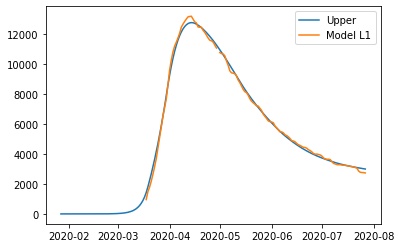

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233275876413, 'other': 0.41367836040631656, 'school': 0.2290276122969232, 'transport': 0.25591066713798183, 'work': 0.41368045566692374}
{'home': 1.0, 'leisure': 0.3374576208402605, 'other': 0.4525788087678424, 'school': 0.29075407353595134, 'transport': 0.2851902437474495, 'work': 0.5544687468827878}
{'home': 1.0, 'leisure': 0.36169426076242905, 'other': 0.49008995540217093, 'school': 0.35027601830215704, 'transport': 0.31342412119229346, 'work': 0.6902288848409426}
{'home': 1.0, 'leisure': 0.38144263403234413, 'other': 0.5206545934005127, 'school': 0.39877538070425056, 'transport': 0.33642950281401807, 'work': 0.80084825651055}
{'home': 1.0, 'leisure': 0.393112127328203, 'other': 0.5387155158540783, 'school': 0.4274340948509422, 'transport': 0.350023591954128, 'work': 0.8662142488607727}
{'home': 1.0, 'leisure': 0.3993957006413578, 'other': 0.5484406279444598, 'sch

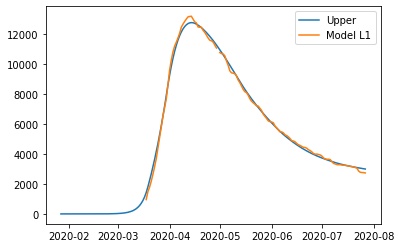

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232332506960025, 'other': 0.41367835561986316, 'school': 0.22902760573104683, 'transport': 0.2559106660784979, 'work': 0.41368045075968973}
{'home': 1.0, 'leisure': 0.3374576187068128, 'other': 0.4525788051110919, 'school': 0.29075406775358736, 'transport': 0.2851902431820747, 'work': 0.5544687442676869}
{'home': 1.0, 'leisure': 0.36169425899983915, 'other': 0.49008995283477674, 'school': 0.35027601327532293, 'transport': 0.31342412110338086, 'work': 0.6902288844361127}
{'home': 1.0, 'leisure': 0.38144263257193467, 'other': 0.5206545917207421, 'school': 0.39877537629303345, 'transport': 0.3364295031133341, 'work': 0.800848257906682}
{'home': 1.0, 'leisure': 0.3931121260463548, 'other': 0.5387155146988126, 'school': 0.42743409080349865, 'transport': 0.35002359248285186, 'work': 0.8662142513211092}
{'home': 1.0, 'leisure': 0.3993956994556579, 'other': 0.5484406270716198,

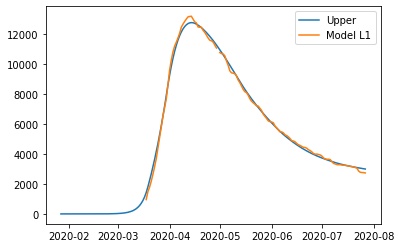

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232332685485475, 'other': 0.4136783583829089, 'school': 0.22902761011539302, 'transport': 0.2559106681581862, 'work': 0.4136804607596897}
{'home': 1.0, 'leisure': 0.3374576200417328, 'other': 0.4525788071771531, 'school': 0.29075407103197237, 'transport': 0.28519024473715693, 'work': 0.5544687517451643}
{'home': 1.0, 'leisure': 0.3616942599005081, 'other': 0.49008995422874574, 'school': 0.3502760154872453, 'transport': 0.31342412215259297, 'work': 0.6902288894811577}
{'home': 1.0, 'leisure': 0.38144263311876936, 'other': 0.5206545925670805, 'school': 0.39877537763598625, 'transport': 0.3364295037503557, 'work': 0.8008482609697449}
{'home': 1.0, 'leisure': 0.39311212638410564, 'other': 0.538715515221551, 'school': 0.4274340916329695, 'transport': 0.35002359287630636, 'work': 0.866214253213001}
{'home': 1.0, 'leisure': 0.3993956996808251, 'other': 0.548440627420112, 'sch

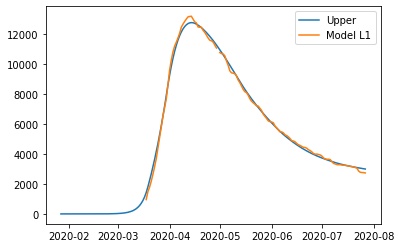

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232332506960025, 'other': 0.41367836561986315, 'school': 0.22902760573104683, 'transport': 0.2559106660784979, 'work': 0.41368045075968973}
{'home': 1.0, 'leisure': 0.3374576182564783, 'other': 0.4525788144141074, 'school': 0.29075406664762615, 'transport': 0.2851902426574686, 'work': 0.5544687417451644}
{'home': 1.0, 'leisure': 0.3616942581152536, 'other': 0.4900899614657, 'school': 0.35027601110289913, 'transport': 0.31342412007290466, 'work': 0.6902288794811577}
{'home': 1.0, 'leisure': 0.38144263133351486, 'other': 0.5206545998040347, 'school': 0.3987753732516401, 'transport': 0.3364295016706674, 'work': 0.800848250969745}
{'home': 1.0, 'leisure': 0.39311212459885114, 'other': 0.5387155224585052, 'school': 0.4274340872486233, 'transport': 0.35002359079661804, 'work': 0.866214243213001}
{'home': 1.0, 'leisure': 0.3993956978955706, 'other': 0.5484406346570663, 'schoo

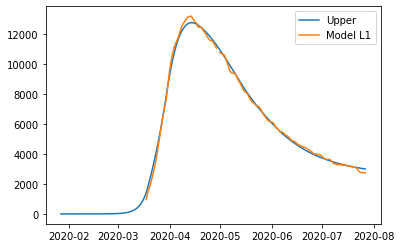

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229073361995, 'other': 0.4136792205269252, 'school': 0.2290265164773532, 'transport': 0.25591049031412794, 'work': 0.41367963666824026}
{'home': 1.0, 'leisure': 0.3374571896168701, 'other': 0.452579741107469, 'school': 0.29075292390091845, 'transport': 0.28519006183376155, 'work': 0.5544678894329725}
{'home': 1.0, 'leisure': 0.36169381895894526, 'other': 0.4900909573815649, 'school': 0.3502748167736421, 'transport': 0.31342393437055116, 'work': 0.6902279903132501}
{'home': 1.0, 'leisure': 0.3814421836080436, 'other': 0.5206556521234208, 'school': 0.3987741368921577, 'transport': 0.33642931199312043, 'work': 0.8008473317712541}
{'home': 1.0, 'leisure': 0.3931116718097835, 'other': 0.5387166081072448, 'school': 0.4274328260530987, 'transport': 0.3500233987700932, 'work': 0.8662133062691655}
{'home': 1.0, 'leisure': 0.39939524237995117, 'other': 0.5484417382523807, 'sch

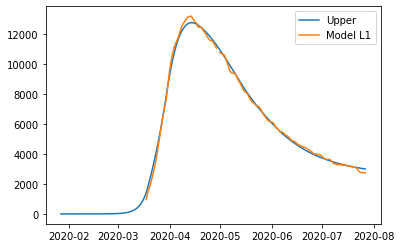

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229073361995, 'other': 0.4136792205269252, 'school': 0.2290265164773532, 'transport': 0.25591049031412794, 'work': 0.41367963666824026}
{'home': 1.0, 'leisure': 0.3374571900672045, 'other': 0.45257974180445504, 'school': 0.290752925006879, 'transport': 0.2851900623583677, 'work': 0.5544678919554951}
{'home': 1.0, 'leisure': 0.3616938198435307, 'other': 0.4900909587506445, 'school': 0.3502748189460646, 'transport': 0.3134239354010274, 'work': 0.6902279952682051}
{'home': 1.0, 'leisure': 0.3814421848464632, 'other': 0.5206556540401323, 'school': 0.39877413993354915, 'transport': 0.3364293134357873, 'work': 0.800847338708191}
{'home': 1.0, 'leisure': 0.39311167325728696, 'other': 0.5387166103475568, 'school': 0.42743282960797185, 'transport': 0.3500234004563272, 'work': 0.8662133143772737}
{'home': 1.0, 'leisure': 0.3993952439400382, 'other': 0.5484417406669393, 'school

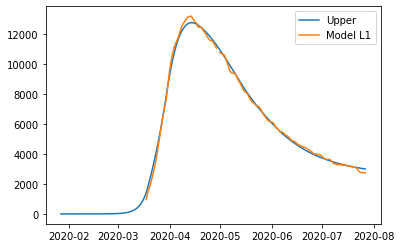

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229091214538, 'other': 0.41367922328997675, 'school': 0.22902652086169678, 'transport': 0.25591049239381647, 'work': 0.41367964666824025}
{'home': 1.0, 'leisure': 0.3374571914021243, 'other': 0.45257974387052063, 'school': 0.29075292828526206, 'transport': 0.2851900639134501, 'work': 0.5544678994329726}
{'home': 1.0, 'leisure': 0.36169382074419953, 'other': 0.4900909601446165, 'school': 0.3502748211579857, 'transport': 0.3134239364502397, 'work': 0.6902280003132502}
{'home': 1.0, 'leisure': 0.38144218539329783, 'other': 0.5206556548864724, 'school': 0.39877414127650124, 'transport': 0.33642931407280896, 'work': 0.800847341771254}
{'home': 1.0, 'leisure': 0.39311167359503774, 'other': 0.5387166108702963, 'school': 0.42743283043744223, 'transport': 0.35002340084978173, 'work': 0.8662133162691654}
{'home': 1.0, 'leisure': 0.39939524416520533, 'other': 0.5484417410154323

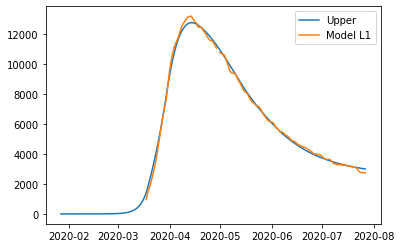

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229073361995, 'other': 0.4136792305269252, 'school': 0.2290265164773532, 'transport': 0.25591049031412794, 'work': 0.41367963666824026}
{'home': 1.0, 'leisure': 0.3374571896168701, 'other': 0.452579751107469, 'school': 0.29075292390091845, 'transport': 0.28519006183376155, 'work': 0.5544678894329725}
{'home': 1.0, 'leisure': 0.36169381895894526, 'other': 0.4900909673815649, 'school': 0.3502748167736421, 'transport': 0.31342393437055116, 'work': 0.6902279903132501}
{'home': 1.0, 'leisure': 0.3814421836080436, 'other': 0.5206556621234208, 'school': 0.3987741368921577, 'transport': 0.33642931199312043, 'work': 0.8008473317712541}
{'home': 1.0, 'leisure': 0.3931116718097835, 'other': 0.5387166181072447, 'school': 0.4274328260530987, 'transport': 0.3500233987700932, 'work': 0.8662133062691655}
{'home': 1.0, 'leisure': 0.39939524237995117, 'other': 0.5484417482523807, 'sch

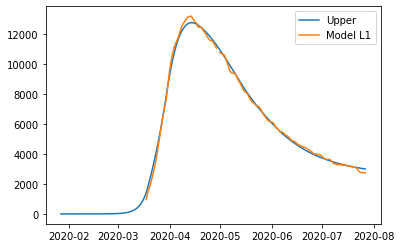

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232290833464105, 'other': 0.41367922491905285, 'school': 0.22902651881005698, 'transport': 0.25591049206275923, 'work': 0.4136796451348759}
{'home': 1.0, 'leisure': 0.3374571905947695, 'other': 0.4525797456348082, 'school': 0.29075292613286663, 'transport': 0.2851900635728635, 'work': 0.5544678978276183}
{'home': 1.0, 'leisure': 0.36169381991703614, 'other': 0.4900909620392865, 'school': 0.35027481890843304, 'transport': 0.31342393610046393, 'work': 0.690227998638477}
{'home': 1.0, 'leisure': 0.3814421845499942, 'other': 0.5206556568873799, 'school': 0.3987741389477835, 'transport': 0.33642931371554585, 'work': 0.8008473400399174}
{'home': 1.0, 'leisure': 0.3931116727421966, 'other': 0.5387166129339807, 'school': 0.4274328280619451, 'transport': 0.3500234004880942, 'work': 0.8662133145044049}
{'home': 1.0, 'leisure': 0.39939524330722875, 'other': 0.5484417431129195, 's

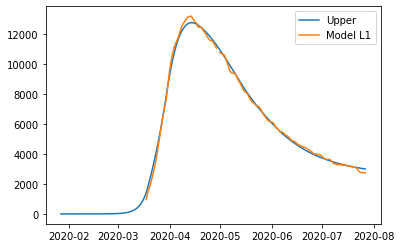

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229065493868, 'other': 0.4136792321560012, 'school': 0.22902651442571337, 'transport': 0.2559104899830707, 'work': 0.4136796351348759}
{'home': 1.0, 'leisure': 0.33745718880951525, 'other': 0.45257975287175656, 'school': 0.290752921748523, 'transport': 0.28519006149317494, 'work': 0.5544678878276182}
{'home': 1.0, 'leisure': 0.3616938181317819, 'other': 0.4900909692762349, 'school': 0.3502748145240895, 'transport': 0.3134239340207754, 'work': 0.690227988638477}
{'home': 1.0, 'leisure': 0.38144218276473996, 'other': 0.5206556641243284, 'school': 0.39877413456343996, 'transport': 0.3364293116358573, 'work': 0.8008473300399175}
{'home': 1.0, 'leisure': 0.39311167095694244, 'other': 0.538716620170929, 'school': 0.42743282367760155, 'transport': 0.3500233984084057, 'work': 0.8662133045044049}
{'home': 1.0, 'leisure': 0.39939524152197453, 'other': 0.5484417503498679, 'scho

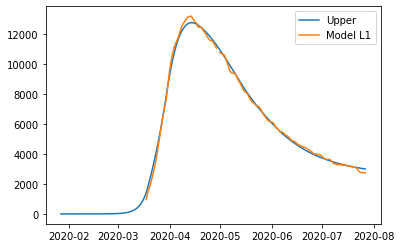

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229064223323, 'other': 0.41367923241906457, 'school': 0.22902651409441438, 'transport': 0.2559104899296116, 'work': 0.41367963488726806}
{'home': 1.0, 'leisure': 0.33745718867914354, 'other': 0.4525797531566539, 'school': 0.29075292140095405, 'transport': 0.285190061438177, 'work': 0.5544678875683855}
{'home': 1.0, 'leisure': 0.36169381799821154, 'other': 0.4900909695821864, 'school': 0.3502748141608315, 'transport': 0.31342393396429363, 'work': 0.6902279883680345}
{'home': 1.0, 'leisure': 0.3814421826285632, 'other': 0.5206556644474352, 'school': 0.3987741341873984, 'transport': 0.33642931157816647, 'work': 0.800847329760341}
{'home': 1.0, 'leisure': 0.3931116708192256, 'other': 0.538716620504173, 'school': 0.42743282329400606, 'transport': 0.3500233983500004, 'work': 0.8662133042194312}
{'home': 1.0, 'leisure': 0.3993952413834284, 'other': 0.5484417506885704, 'scho

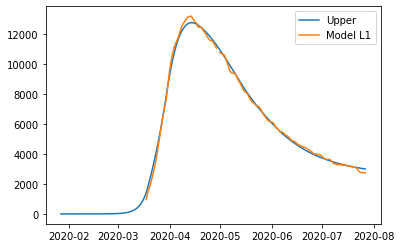

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229062953816, 'other': 0.4136792326819128, 'school': 0.2290265137633863, 'transport': 0.25591048987619613, 'work': 0.41367963463986274}
{'home': 1.0, 'leisure': 0.3374571885488784, 'other': 0.4525797534413182, 'school': 0.2907529210536692, 'transport': 0.285190061383224, 'work': 0.5544678873093647}
{'home': 1.0, 'leisure': 0.3616938178647503, 'other': 0.4900909698878877, 'school': 0.35027481379787057, 'transport': 0.313423933907858, 'work': 0.690227988097813}
{'home': 1.0, 'leisure': 0.38144218249249784, 'other': 0.5206556647702776, 'school': 0.3987741338116643, 'transport': 0.3364293115205228, 'work': 0.8008473294809932}
{'home': 1.0, 'leisure': 0.39311167068162134, 'other': 0.5387166208371443, 'school': 0.4274328229107242, 'transport': 0.35002339829164286, 'work': 0.8662133039346905}
{'home': 1.0, 'leisure': 0.39939524124499554, 'other': 0.5484417510269958, 'school

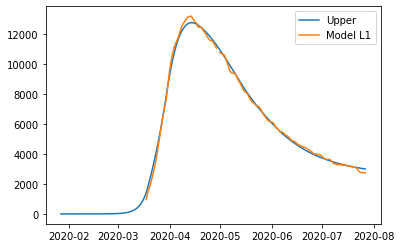

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232290615316743, 'other': 0.4136792329763636, 'school': 0.22902651339255836, 'transport': 0.2559104898163585, 'work': 0.41367963436271155}
{'home': 1.0, 'leisure': 0.33745718840295136, 'other': 0.45257975376020804, 'school': 0.29075292066462993, 'transport': 0.2851900613216639, 'work': 0.5544678870192016}
{'home': 1.0, 'leisure': 0.3616938177152429, 'other': 0.49009097023034376, 'school': 0.35027481339127037, 'transport': 0.31342393384463707, 'work': 0.6902279877951026}
{'home': 1.0, 'leisure': 0.3814421823400731, 'other': 0.5206556651319358, 'school': 0.39877413339075524, 'transport': 0.33642931145594845, 'work': 0.8008473291680591}
{'home': 1.0, 'leisure': 0.39311167052747276, 'other': 0.5387166212101493, 'school': 0.4274328224813599, 'transport': 0.3500233982262688, 'work': 0.8662133036157151}
{'home': 1.0, 'leisure': 0.39939524108991875, 'other': 0.5484417514061104

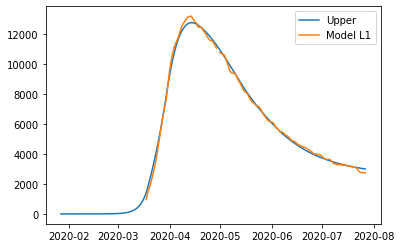

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229060113038, 'other': 0.4136792332700888, 'school': 0.22902651302264415, 'transport': 0.2559104897566683, 'work': 0.4136796340862433}
{'home': 1.0, 'leisure': 0.3374571882573839, 'other': 0.4525797540783122, 'school': 0.29075292027654936, 'transport': 0.2851900612602556, 'work': 0.5544678867297534}
{'home': 1.0, 'leisure': 0.36169381756610397, 'other': 0.49009097057195605, 'school': 0.35027481298567215, 'transport': 0.31342393378157185, 'work': 0.6902279874931381}
{'home': 1.0, 'leisure': 0.38144218218802406, 'other': 0.5206556654927029, 'school': 0.3987741329708834, 'transport': 0.3364293113915333, 'work': 0.800847328855896}
{'home': 1.0, 'leisure': 0.3931116703737041, 'other': 0.5387166215822352, 'school': 0.42743282205305366, 'transport': 0.350023398161056, 'work': 0.8662133032975258}
{'home': 1.0, 'leisure': 0.39939524093522405, 'other': 0.548441751784291, 'scho

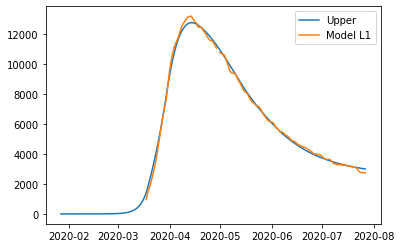

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232287171952516, 'other': 0.4136792942703611, 'school': 0.22902642360570843, 'transport': 0.2559104753281506, 'work': 0.41367956725738503}
{'home': 1.0, 'leisure': 0.3374571530703126, 'other': 0.4525798209715262, 'school': 0.2907528264683657, 'transport': 0.2851900464164156, 'work': 0.5544678167633469}
{'home': 1.0, 'leisure': 0.36169378151571474, 'other': 0.49009104314764973, 'school': 0.35027471494307094, 'transport': 0.3134239185372425, 'work': 0.6902279145012387}
{'home': 1.0, 'leisure': 0.3814421454341905, 'other': 0.5206557426985651, 'school': 0.39877403147801593, 'transport': 0.3364292958208793, 'work': 0.80084725339878}
{'home': 1.0, 'leisure': 0.39311163320419895, 'other': 0.538716701524106, 'school': 0.4274327185213926, 'transport': 0.35002338239757375, 'work': 0.8662132263836909}
{'home': 1.0, 'leisure': 0.39939520354189584, 'other': 0.5484418331993973, 'sch

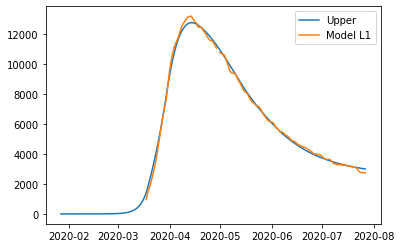

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232287171952516, 'other': 0.4136792942703611, 'school': 0.22902642360570843, 'transport': 0.2559104753281506, 'work': 0.41367956725738503}
{'home': 1.0, 'leisure': 0.337457153520647, 'other': 0.4525798216685123, 'school': 0.2907528275743262, 'transport': 0.28519004694102174, 'work': 0.5544678192858694}
{'home': 1.0, 'leisure': 0.36169378240030015, 'other': 0.4900910445167296, 'school': 0.35027471711549335, 'transport': 0.31342391956771887, 'work': 0.6902279194561936}
{'home': 1.0, 'leisure': 0.3814421466726101, 'other': 0.520655744615277, 'school': 0.39877403451940735, 'transport': 0.33642929726354615, 'work': 0.8008472603357171}
{'home': 1.0, 'leisure': 0.3931116346517024, 'other': 0.5387167037644186, 'school': 0.4274327220762656, 'transport': 0.35002338408380773, 'work': 0.8662132344917991}
{'home': 1.0, 'leisure': 0.3993952051019829, 'other': 0.5484418356139564, 'sc

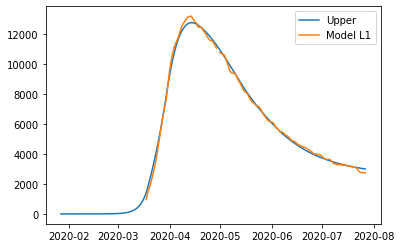

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228735047794, 'other': 0.4136792970334132, 'school': 0.2290264279900518, 'transport': 0.2559104774078392, 'work': 0.413679577257385}
{'home': 1.0, 'leisure': 0.33745715485556677, 'other': 0.4525798237345783, 'school': 0.2907528308527091, 'transport': 0.28519004849610413, 'work': 0.5544678267633468}
{'home': 1.0, 'leisure': 0.3616937833009689, 'other': 0.49009104591070174, 'school': 0.35027471932741433, 'transport': 0.3134239206169311, 'work': 0.6902279245012386}
{'home': 1.0, 'leisure': 0.38144214721944475, 'other': 0.5206557454616172, 'school': 0.3987740358623593, 'transport': 0.33642929790056786, 'work': 0.8008472633987801}
{'home': 1.0, 'leisure': 0.39311163498945323, 'other': 0.5387167042871581, 'school': 0.427432722905736, 'transport': 0.35002338447726233, 'work': 0.866213236383691}
{'home': 1.0, 'leisure': 0.39939520532715006, 'other': 0.5484418359624494, 'scho

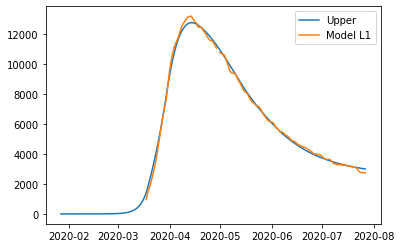

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232287171952516, 'other': 0.41367930427036115, 'school': 0.22902642360570843, 'transport': 0.2559104753281506, 'work': 0.41367956725738503}
{'home': 1.0, 'leisure': 0.3374571530703126, 'other': 0.4525798309715262, 'school': 0.2907528264683657, 'transport': 0.2851900464164156, 'work': 0.5544678167633469}
{'home': 1.0, 'leisure': 0.36169378151571474, 'other': 0.49009105314764967, 'school': 0.35027471494307094, 'transport': 0.3134239185372425, 'work': 0.6902279145012387}
{'home': 1.0, 'leisure': 0.3814421454341905, 'other': 0.5206557526985651, 'school': 0.39877403147801593, 'transport': 0.3364292958208793, 'work': 0.80084725339878}
{'home': 1.0, 'leisure': 0.39311163320419895, 'other': 0.538716711524106, 'school': 0.4274327185213926, 'transport': 0.35002338239757375, 'work': 0.8662132263836909}
{'home': 1.0, 'leisure': 0.39939520354189584, 'other': 0.5484418431993974, 'sc

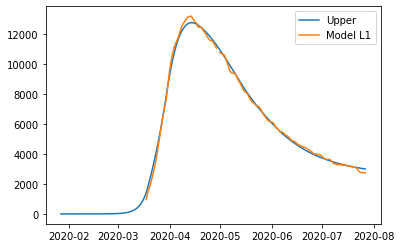

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232282329455985, 'other': 0.413679394533034, 'school': 0.22902629733602914, 'transport': 0.25591045495299025, 'work': 0.4136794728853429}
{'home': 1.0, 'leisure': 0.33745710338106416, 'other': 0.4525799295558871, 'school': 0.29075269399760767, 'transport': 0.2851900254547599, 'work': 0.5544677179606314}
{'home': 1.0, 'leisure': 0.3616937306073362, 'other': 0.49009115975649553, 'school': 0.3502745764927012, 'transport': 0.31342389701003776, 'work': 0.6902278114260882}
{'home': 1.0, 'leisure': 0.38144209353244674, 'other': 0.5206558658458802, 'school': 0.39877388815537, 'transport': 0.3364292738328567, 'work': 0.8008471468423863}
{'home': 1.0, 'leisure': 0.3931115807154666, 'other': 0.5387168285350621, 'school': 0.42743257231967435, 'transport': 0.3500233601372498, 'work': 0.8662131177701989}
{'home': 1.0, 'leisure': 0.39939515073709264, 'other': 0.5484419622907754, 'sch

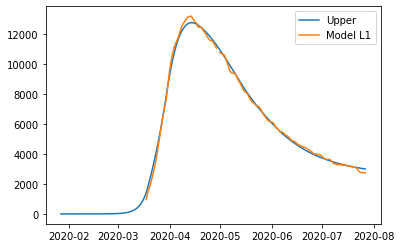

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232282329455985, 'other': 0.413679394533034, 'school': 0.22902629733602914, 'transport': 0.25591045495299025, 'work': 0.4136794728853429}
{'home': 1.0, 'leisure': 0.33745710383139854, 'other': 0.45257993025287346, 'school': 0.29075269510356805, 'transport': 0.285190025979366, 'work': 0.554467720483154}
{'home': 1.0, 'leisure': 0.3616937314919216, 'other': 0.4900911611255758, 'school': 0.3502745786651235, 'transport': 0.31342389804051407, 'work': 0.6902278163810432}
{'home': 1.0, 'leisure': 0.38144209477086627, 'other': 0.5206558677625925, 'school': 0.3987738911967612, 'transport': 0.3364292752755236, 'work': 0.8008471537793234}
{'home': 1.0, 'leisure': 0.39311158216296993, 'other': 0.5387168307753751, 'school': 0.4274325758745471, 'transport': 0.35002336182348376, 'work': 0.866213125878307}
{'home': 1.0, 'leisure': 0.3993951522971796, 'other': 0.548441964705335, 'schoo

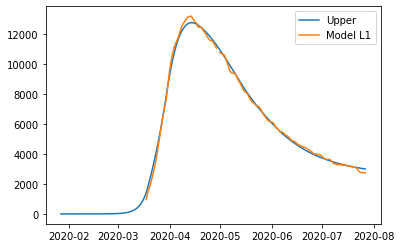

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312322825079814, 'other': 0.4136793972960867, 'school': 0.22902630172037225, 'transport': 0.25591045703267884, 'work': 0.4136794828853429}
{'home': 1.0, 'leisure': 0.3374571051663183, 'other': 0.4525799323189399, 'school': 0.2907526983819507, 'transport': 0.28519002753444844, 'work': 0.5544677279606314}
{'home': 1.0, 'leisure': 0.36169373239259034, 'other': 0.4900911625195483, 'school': 0.3502745808770443, 'transport': 0.31342389908972634, 'work': 0.6902278214260882}
{'home': 1.0, 'leisure': 0.3814420953177009, 'other': 0.520655868608933, 'school': 0.3987738925397131, 'transport': 0.33642927591254534, 'work': 0.8008471568423864}
{'home': 1.0, 'leisure': 0.39311158250072076, 'other': 0.5387168312981149, 'school': 0.42743257670401746, 'transport': 0.3500233622169384, 'work': 0.866213127770199}
{'home': 1.0, 'leisure': 0.3993951525223468, 'other': 0.5484419650538281, 'schoo

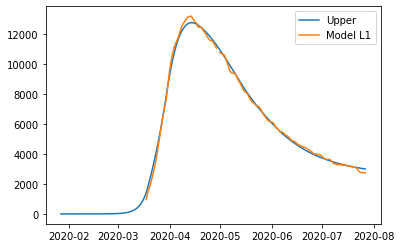

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232282329455985, 'other': 0.413679404533034, 'school': 0.22902629733602914, 'transport': 0.25591045495299025, 'work': 0.4136794728853429}
{'home': 1.0, 'leisure': 0.33745710338106416, 'other': 0.45257993955588716, 'school': 0.29075269399760767, 'transport': 0.2851900254547599, 'work': 0.5544677179606314}
{'home': 1.0, 'leisure': 0.3616937306073362, 'other': 0.4900911697564956, 'school': 0.3502745764927012, 'transport': 0.31342389701003776, 'work': 0.6902278114260882}
{'home': 1.0, 'leisure': 0.38144209353244674, 'other': 0.5206558758458801, 'school': 0.39877388815537, 'transport': 0.3364292738328567, 'work': 0.8008471468423863}
{'home': 1.0, 'leisure': 0.3931115807154666, 'other': 0.538716838535062, 'school': 0.42743257231967435, 'transport': 0.3500233601372498, 'work': 0.8662131177701989}
{'home': 1.0, 'leisure': 0.39939515073709264, 'other': 0.5484419722907753, 'scho

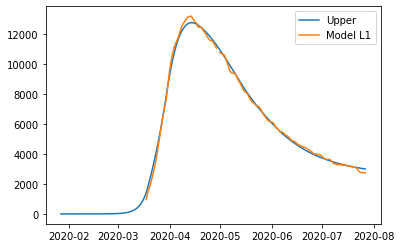

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232281309388266, 'other': 0.41367941565327815, 'school': 0.22902627073743054, 'transport': 0.25591045066098017, 'work': 0.4136794530059534}
{'home': 1.0, 'leisure': 0.3374570929140668, 'other': 0.4525799524290877, 'school': 0.2907526660927571, 'transport': 0.28519002103920504, 'work': 0.5544676971479243}
{'home': 1.0, 'leisure': 0.3616937198835301, 'other': 0.49009118432004695, 'school': 0.3502745473282506, 'transport': 0.3134238924753505, 'work': 0.6902277897133964}
{'home': 1.0, 'leisure': 0.3814420825993891, 'other': 0.5206558917867544, 'school': 0.3987738579645787, 'transport': 0.3364292692010986, 'work': 0.8008471243963737}
{'home': 1.0, 'leisure': 0.39311156965876026, 'other': 0.5387168552898088, 'school': 0.4274325415224089, 'transport': 0.35002335544813157, 'work': 0.8662130948908602}
{'home': 1.0, 'leisure': 0.39939513961380635, 'other': 0.5484419894837612, 's

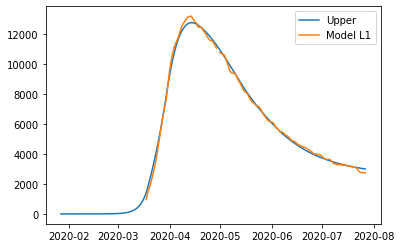

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232281309388266, 'other': 0.41367941565327815, 'school': 0.22902627073743054, 'transport': 0.25591045066098017, 'work': 0.4136794530059534}
{'home': 1.0, 'leisure': 0.3374570933644012, 'other': 0.452579953126074, 'school': 0.29075266719871756, 'transport': 0.28519002156381124, 'work': 0.554467699670447}
{'home': 1.0, 'leisure': 0.3616937207681155, 'other': 0.4900911856891272, 'school': 0.3502745495006728, 'transport': 0.3134238935058268, 'work': 0.6902277946683514}
{'home': 1.0, 'leisure': 0.38144208383780864, 'other': 0.5206558937034668, 'school': 0.39877386100596973, 'transport': 0.3364292706437655, 'work': 0.8008471313333105}
{'home': 1.0, 'leisure': 0.3931115711062637, 'other': 0.538716857530122, 'school': 0.4274325450772816, 'transport': 0.3500233571343656, 'work': 0.8662131029989684}
{'home': 1.0, 'leisure': 0.3993951411738933, 'other': 0.548441991898321, 'school

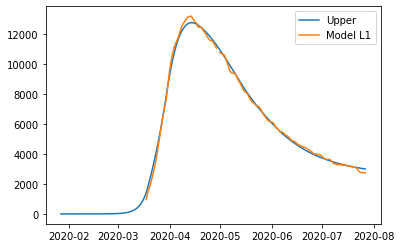

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228148791368, 'other': 0.4136794184163311, 'school': 0.22902627512177354, 'transport': 0.25591045274066876, 'work': 0.4136794630059534}
{'home': 1.0, 'leisure': 0.33745709469932095, 'other': 0.45257995519214067, 'school': 0.29075267047710013, 'transport': 0.28519002311889363, 'work': 0.5544677071479244}
{'home': 1.0, 'leisure': 0.3616937216687843, 'other': 0.49009118708309984, 'school': 0.35027455171259364, 'transport': 0.31342389455503905, 'work': 0.6902277997133964}
{'home': 1.0, 'leisure': 0.3814420843846432, 'other': 0.5206558945498073, 'school': 0.3987738623489217, 'transport': 0.3364292712807872, 'work': 0.8008471343963737}
{'home': 1.0, 'leisure': 0.39311157144401443, 'other': 0.5387168580528617, 'school': 0.42743254590675184, 'transport': 0.3500233575278202, 'work': 0.8662131048908601}
{'home': 1.0, 'leisure': 0.3993951413990605, 'other': 0.5484419922468141, 

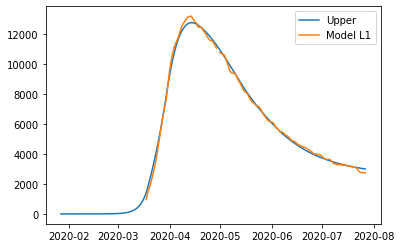

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232281309388266, 'other': 0.4136794256532782, 'school': 0.22902627073743054, 'transport': 0.25591045066098017, 'work': 0.4136794530059534}
{'home': 1.0, 'leisure': 0.3374570929140668, 'other': 0.4525799624290877, 'school': 0.2907526660927571, 'transport': 0.28519002103920504, 'work': 0.5544676971479243}
{'home': 1.0, 'leisure': 0.3616937198835301, 'other': 0.4900911943200469, 'school': 0.3502745473282506, 'transport': 0.3134238924753505, 'work': 0.6902277897133964}
{'home': 1.0, 'leisure': 0.3814420825993891, 'other': 0.5206559017867545, 'school': 0.3987738579645787, 'transport': 0.3364292692010986, 'work': 0.8008471243963737}
{'home': 1.0, 'leisure': 0.39311156965876026, 'other': 0.5387168652898089, 'school': 0.4274325415224089, 'transport': 0.35002335544813157, 'work': 0.8662130948908602}
{'home': 1.0, 'leisure': 0.39939513961380635, 'other': 0.5484419994837613, 'sch

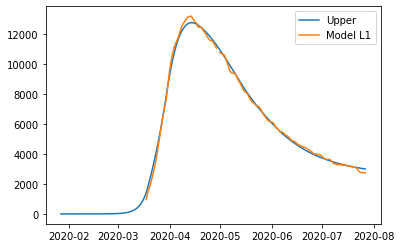

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228130434187, 'other': 0.41367942575776256, 'school': 0.22902627060584407, 'transport': 0.2559104506397471, 'work': 0.41367945290760766}
{'home': 1.0, 'leisure': 0.3374570928622853, 'other': 0.4525799625422442, 'school': 0.2907526659547085, 'transport': 0.2851900210173608, 'work': 0.5544676970449615}
{'home': 1.0, 'leisure': 0.36169371983047816, 'other': 0.4900911944415658, 'school': 0.3502745471839706, 'transport': 0.31342389245291685, 'work': 0.6902277896059812}
{'home': 1.0, 'leisure': 0.381442082545302, 'other': 0.520655901915087, 'school': 0.39877385781522123, 'transport': 0.3364292691781848, 'work': 0.8008471242853306}
{'home': 1.0, 'leisure': 0.39311156960406146, 'other': 0.5387168654221678, 'school': 0.42743254137005116, 'transport': 0.350023355424934, 'work': 0.8662130947776734}
{'home': 1.0, 'leisure': 0.39939513955877814, 'other': 0.5484419996182882, 'scho

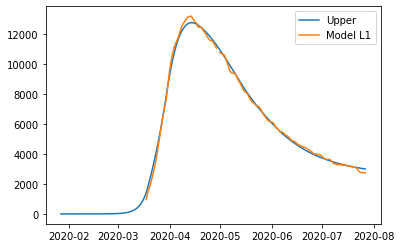

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228052880514, 'other': 0.4136794318150541, 'school': 0.2290262503834709, 'transport': 0.25591044737661917, 'work': 0.4136794377937123}
{'home': 1.0, 'leisure': 0.33745708490444026, 'other': 0.4525799699322728, 'school': 0.2907526447392186, 'transport': 0.2851900176603043, 'work': 0.5544676812214837}
{'home': 1.0, 'leisure': 0.3616937116773866, 'other': 0.4900912031167336, 'school': 0.35027452501083245, 'transport': 0.3134238890052864, 'work': 0.6902277730982633}
{'home': 1.0, 'leisure': 0.3814420742331207, 'other': 0.5206559116374054, 'school': 0.3987738348617771, 'transport': 0.3364292656567533, 'work': 0.8008471072200838}
{'home': 1.0, 'leisure': 0.3931115611978727, 'other': 0.538716875763257, 'school': 0.4274325179555171, 'transport': 0.35002335185989286, 'work': 0.8662130773829777}
{'home': 1.0, 'leisure': 0.3993951311019699, 'other': 0.5484420102925617, 'school'

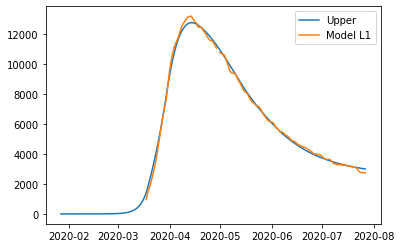

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228052880514, 'other': 0.4136794318150541, 'school': 0.2290262503834709, 'transport': 0.25591044737661917, 'work': 0.4136794377937123}
{'home': 1.0, 'leisure': 0.33745708535477464, 'other': 0.45257997062925914, 'school': 0.290752645845179, 'transport': 0.28519001818491047, 'work': 0.5544676837440063}
{'home': 1.0, 'leisure': 0.361693712561972, 'other': 0.490091204485814, 'school': 0.3502745271832547, 'transport': 0.31342389003576276, 'work': 0.6902277780532183}
{'home': 1.0, 'leisure': 0.3814420754715403, 'other': 0.5206559135541179, 'school': 0.3987738379031682, 'transport': 0.33642926709942017, 'work': 0.8008471141570208}
{'home': 1.0, 'leisure': 0.39311156264537606, 'other': 0.5387168780035703, 'school': 0.4274325215103898, 'transport': 0.3500233535461268, 'work': 0.8662130854910858}
{'home': 1.0, 'leisure': 0.39939513266205684, 'other': 0.5484420127071215, 'schoo

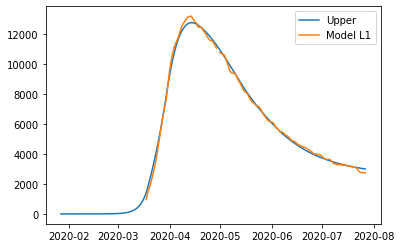

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228070733055, 'other': 0.41367943457810713, 'school': 0.22902625476781385, 'transport': 0.25591044945630775, 'work': 0.4136794477937123}
{'home': 1.0, 'leisure': 0.3374570866896944, 'other': 0.4525799726953258, 'school': 0.2907526491235616, 'transport': 0.2851900197399929, 'work': 0.5544676912214838}
{'home': 1.0, 'leisure': 0.3616937134626408, 'other': 0.49009120587978666, 'school': 0.35027452939517545, 'transport': 0.313423891084975, 'work': 0.6902277830982634}
{'home': 1.0, 'leisure': 0.3814420760183749, 'other': 0.5206559144004584, 'school': 0.3987738392461201, 'transport': 0.3364292677364419, 'work': 0.8008471172200838}
{'home': 1.0, 'leisure': 0.3931115629831269, 'other': 0.53871687852631, 'school': 0.42743252233986007, 'transport': 0.3500233539395814, 'work': 0.8662130873829776}
{'home': 1.0, 'leisure': 0.39939513288722406, 'other': 0.5484420130556147, 'school

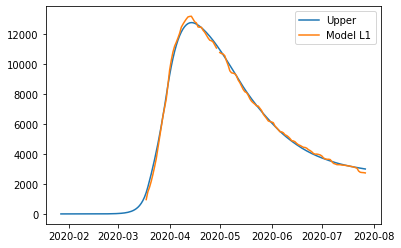

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232591499115214, 'other': 0.41369957279186087, 'school': 0.2290349363208604, 'transport': 0.2559154554069069, 'work': 0.4137036583642717}
{'home': 1.0, 'leisure': 0.33746883100182, 'other': 0.4526133588757284, 'school': 0.29077591238612244, 'transport': 0.2852019630029301, 'work': 0.5545230266393593}
{'home': 1.0, 'leisure': 0.36171378572639257, 'other': 0.490137366885172, 'school': 0.3503118535919108, 'transport': 0.3134425238990953, 'work': 0.690313131761765}
{'home': 1.0, 'leisure': 0.38146893402048876, 'other': 0.5207124845224965, 'school': 0.398822620500331, 'transport': 0.33645335129597076, 'work': 0.8009569211207624}
{'home': 1.0, 'leisure': 0.39314243073972743, 'other': 0.5387795994900064, 'school': 0.4274880736734884, 'transport': 0.3500506583941244, 'work': 0.8663373421056245}
{'home': 1.0, 'leisure': 0.39942815974239443, 'other': 0.5485080460109732, 'school'

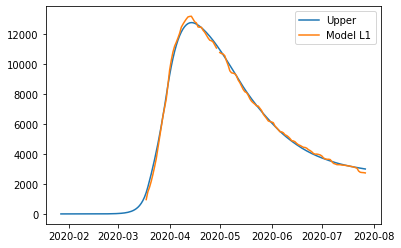

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232591499115214, 'other': 0.41369957279186087, 'school': 0.2290349363208604, 'transport': 0.2559154554069069, 'work': 0.4137036583642717}
{'home': 1.0, 'leisure': 0.33746883145220957, 'other': 0.452613359572798, 'school': 0.2907759134920996, 'transport': 0.28520196352754457, 'work': 0.5545230291618818}
{'home': 1.0, 'leisure': 0.36171378661108633, 'other': 0.4901373682544159, 'school': 0.3503118557643659, 'transport': 0.313442524929588, 'work': 0.69031313671672}
{'home': 1.0, 'leisure': 0.38146893525906, 'other': 0.5207124864394379, 'school': 0.3988226235417682, 'transport': 0.3364533527386605, 'work': 0.8009569280576994}
{'home': 1.0, 'leisure': 0.39314243218740813, 'other': 0.5387796017305873, 'school': 0.4274880772284149, 'transport': 0.3500506600803851, 'work': 0.8663373502137326}
{'home': 1.0, 'leisure': 0.39942816130267245, 'other': 0.5485080484258216, 'school': 

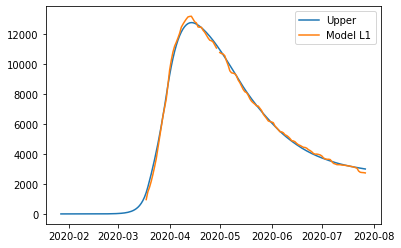

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325916776625, 'other': 0.413699575555244, 'school': 0.22903494070526978, 'transport': 0.2559154574866285, 'work': 0.4137036683642717}
{'home': 1.0, 'leisure': 0.3374688327872929, 'other': 0.4526133616391115, 'school': 0.29077591677053183, 'transport': 0.28520196508265167, 'work': 0.5545230366393592}
{'home': 1.0, 'leisure': 0.36171378751186545, 'other': 0.49013736964855514, 'school': 0.3503118579763202, 'transport': 0.31344252597881694, 'work': 0.6903131417617651}
{'home': 1.0, 'leisure': 0.38146893580596164, 'other': 0.5207124872858796, 'school': 0.39882262488474046, 'transport': 0.3364533533756924, 'work': 0.8009569311207625}
{'home': 1.0, 'leisure': 0.3931424325252003, 'other': 0.5387796022533895, 'school': 0.42748807805789785, 'transport': 0.350050660473846, 'work': 0.8663373521056246}
{'home': 1.0, 'leisure': 0.39942816152786725, 'other': 0.5485080487743563, 'sch

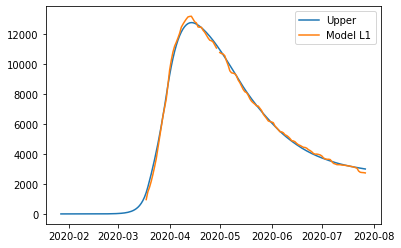

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232591499115214, 'other': 0.4136995827918609, 'school': 0.2290349363208604, 'transport': 0.2559154554069069, 'work': 0.4137036583642717}
{'home': 1.0, 'leisure': 0.33746883100182, 'other': 0.4526133688757284, 'school': 0.29077591238612244, 'transport': 0.2852019630029301, 'work': 0.5545230266393593}
{'home': 1.0, 'leisure': 0.36171378572639257, 'other': 0.490137376885172, 'school': 0.3503118535919108, 'transport': 0.3134425238990953, 'work': 0.690313131761765}
{'home': 1.0, 'leisure': 0.38146893402048876, 'other': 0.5207124945224965, 'school': 0.398822620500331, 'transport': 0.33645335129597076, 'work': 0.8009569211207624}
{'home': 1.0, 'leisure': 0.39314243073972743, 'other': 0.5387796094900064, 'school': 0.4274880736734884, 'transport': 0.3500506583941244, 'work': 0.8663373421056245}
{'home': 1.0, 'leisure': 0.39942815974239443, 'other': 0.5485080560109733, 'school':

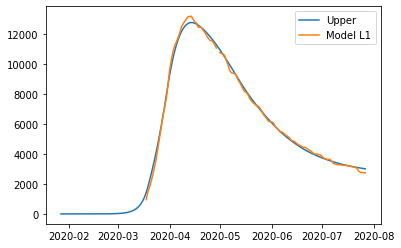

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123444279878316, 'other': 0.4138219569748625, 'school': 0.22908656344057685, 'transport': 0.2559456170317551, 'work': 0.4138492586341901}
{'home': 1.0, 'leisure': 0.33753950622664664, 'other': 0.4528158290919566, 'school': 0.2909155547076626, 'transport': 0.28527401467242774, 'work': 0.5548565092197211}
{'home': 1.0, 'leisure': 0.3618347602426469, 'other': 0.49041706291915466, 'school': 0.35053636771520963, 'transport': 0.3135549695402192, 'work': 0.6908277865700547}
{'home': 1.0, 'leisure': 0.381630893144573, 'other': 0.5210551052968715, 'school': 0.3991162894250627, 'transport': 0.33659871054360485, 'work': 0.8016191977444005}
{'home': 1.0, 'leisure': 0.39332860804116565, 'other': 0.5391594030655222, 'school': 0.4278226067990668, 'transport': 0.35021546659106, 'work': 0.8670868498019685}
{'home': 1.0, 'leisure': 0.3996273776008694, 'other': 0.5489078710947959, 'school

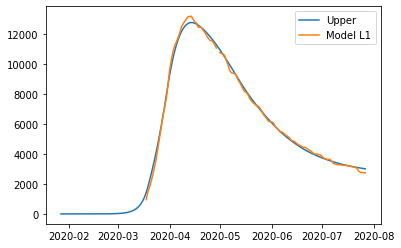

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123444279878316, 'other': 0.4138219569748625, 'school': 0.22908656344057685, 'transport': 0.2559456170317551, 'work': 0.4138492586341901}
{'home': 1.0, 'leisure': 0.33753950622664664, 'other': 0.4528158290919566, 'school': 0.2909155547076626, 'transport': 0.28527401467242774, 'work': 0.5548565092197211}
{'home': 1.0, 'leisure': 0.3618347602426469, 'other': 0.49041706291915466, 'school': 0.35053636771520963, 'transport': 0.3135549695402192, 'work': 0.6908277865700547}
{'home': 1.0, 'leisure': 0.381630893144573, 'other': 0.5210551052968715, 'school': 0.3991162894250627, 'transport': 0.33659871054360485, 'work': 0.8016191977444005}
{'home': 1.0, 'leisure': 0.39332860804116565, 'other': 0.5391594030655222, 'school': 0.4278226067990668, 'transport': 0.35021546659106, 'work': 0.8670868498019685}
{'home': 1.0, 'leisure': 0.3996273776008694, 'other': 0.5489078710947959, 'school

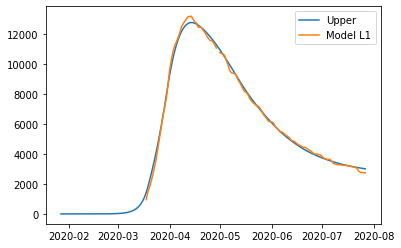

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123444279878316, 'other': 0.4138219569748625, 'school': 0.22908656344057685, 'transport': 0.2559456170317551, 'work': 0.4138492586341901}
{'home': 1.0, 'leisure': 0.33753950622664664, 'other': 0.4528158290919566, 'school': 0.2909155547076626, 'transport': 0.28527401467242774, 'work': 0.5548565092197211}
{'home': 1.0, 'leisure': 0.3618347602426469, 'other': 0.49041706291915466, 'school': 0.35053636771520963, 'transport': 0.3135549695402192, 'work': 0.6908277865700547}
{'home': 1.0, 'leisure': 0.381630893144573, 'other': 0.5210551052968715, 'school': 0.3991162894250627, 'transport': 0.33659871054360485, 'work': 0.8016191977444005}
{'home': 1.0, 'leisure': 0.39332860804116565, 'other': 0.5391594030655222, 'school': 0.4278226067990668, 'transport': 0.35021546659106, 'work': 0.8670868498019685}
{'home': 1.0, 'leisure': 0.3996273776008694, 'other': 0.5489078710947959, 'school

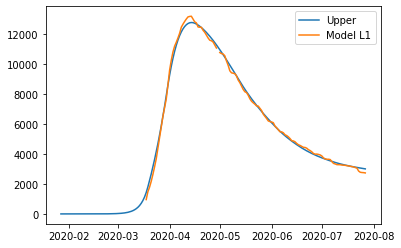

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233761329058085, 'other': 0.4138068208498991, 'school': 0.2290703338756157, 'transport': 0.25593938311569053, 'work': 0.4138241090010386}
{'home': 1.0, 'leisure': 0.3375262216217718, 'other': 0.4527914709477876, 'school': 0.2908879607742735, 'transport': 0.2852625375543576, 'work': 0.5548081837547405}
{'home': 1.0, 'leisure': 0.3618152367982774, 'other': 0.4903838121136087, 'school': 0.3504978152836935, 'transport': 0.313538436477358, 'work': 0.6907571129815245}
{'home': 1.0, 'leisure': 0.38160628620135595, 'other': 0.5210146086190925, 'school': 0.39906880784692467, 'transport': 0.3365780578220251, 'work': 0.8015303145737189}
{'home': 1.0, 'leisure': 0.3933009972122661, 'other': 0.5391146247359694, 'school': 0.42776984890701575, 'transport': 0.35019237952569193, 'work': 0.8669872064236519}
{'home': 1.0, 'leisure': 0.39959814929506376, 'other': 0.5488607872604415, 'scho

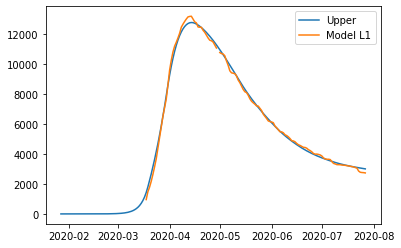

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233761329058085, 'other': 0.4138068208498991, 'school': 0.2290703338756157, 'transport': 0.25593938311569053, 'work': 0.4138241090010386}
{'home': 1.0, 'leisure': 0.3375262216217718, 'other': 0.4527914709477876, 'school': 0.2908879607742735, 'transport': 0.2852625375543576, 'work': 0.5548081837547405}
{'home': 1.0, 'leisure': 0.3618152367982774, 'other': 0.4903838121136087, 'school': 0.3504978152836935, 'transport': 0.313538436477358, 'work': 0.6907571129815245}
{'home': 1.0, 'leisure': 0.38160628620135595, 'other': 0.5210146086190925, 'school': 0.39906880784692467, 'transport': 0.3365780578220251, 'work': 0.8015303145737189}
{'home': 1.0, 'leisure': 0.3933009972122661, 'other': 0.5391146247359694, 'school': 0.42776984890701575, 'transport': 0.35019237952569193, 'work': 0.8669872064236519}
{'home': 1.0, 'leisure': 0.39959814929506376, 'other': 0.5488607872604415, 'scho

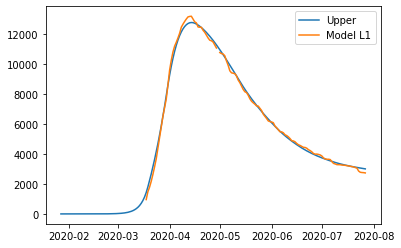

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233761329058085, 'other': 0.4138068208498991, 'school': 0.2290703338756157, 'transport': 0.25593938311569053, 'work': 0.4138241090010386}
{'home': 1.0, 'leisure': 0.3375262216217718, 'other': 0.4527914709477876, 'school': 0.2908879607742735, 'transport': 0.2852625375543576, 'work': 0.5548081837547405}
{'home': 1.0, 'leisure': 0.3618152367982774, 'other': 0.4903838121136087, 'school': 0.3504978152836935, 'transport': 0.313538436477358, 'work': 0.6907571129815245}
{'home': 1.0, 'leisure': 0.38160628620135595, 'other': 0.5210146086190925, 'school': 0.39906880784692467, 'transport': 0.3365780578220251, 'work': 0.8015303145737189}
{'home': 1.0, 'leisure': 0.3933009972122661, 'other': 0.5391146247359694, 'school': 0.42776984890701575, 'transport': 0.35019237952569193, 'work': 0.8669872064236519}
{'home': 1.0, 'leisure': 0.39959814929506376, 'other': 0.5488607872604415, 'scho

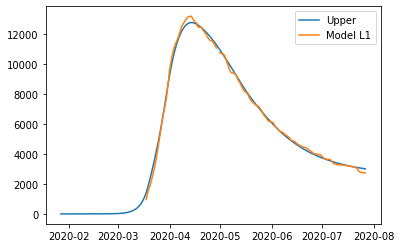

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233749215781975, 'other': 0.4138068186097692, 'school': 0.22907010781166157, 'transport': 0.2559393133249587, 'work': 0.41382394444278464}
{'home': 1.0, 'leisure': 0.3375261030726422, 'other': 0.45279148750849074, 'school': 0.29088772819039954, 'transport': 0.28526246810624256, 'work': 0.5548080342900976}
{'home': 1.0, 'leisure': 0.3618151207405067, 'other': 0.4903838468036865, 'school': 0.35049757641275414, 'transport': 0.3135383673596235, 'work': 0.6907569780714353}
{'home': 1.0, 'leisure': 0.3816061721735814, 'other': 0.5210146580812535, 'school': 0.39906856385319106, 'transport': 0.33657798897348934, 'work': 0.8015301915228954}
{'home': 1.0, 'leisure': 0.3933008843840347, 'other': 0.5391146829270885, 'school': 0.42776960188617663, 'transport': 0.3501923108362283, 'work': 0.8669870903805765}
{'home': 1.0, 'leisure': 0.39959803711274033, 'other': 0.5488608501517689, 

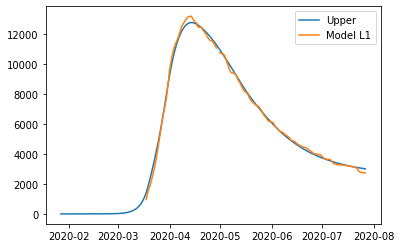

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233749215781975, 'other': 0.4138068186097692, 'school': 0.22907010781166157, 'transport': 0.2559393133249587, 'work': 0.41382394444278464}
{'home': 1.0, 'leisure': 0.3375261030726422, 'other': 0.45279148750849074, 'school': 0.29088772819039954, 'transport': 0.28526246810624256, 'work': 0.5548080342900976}
{'home': 1.0, 'leisure': 0.3618151207405067, 'other': 0.4903838468036865, 'school': 0.35049757641275414, 'transport': 0.3135383673596235, 'work': 0.6907569780714353}
{'home': 1.0, 'leisure': 0.3816061721735814, 'other': 0.5210146580812535, 'school': 0.39906856385319106, 'transport': 0.33657798897348934, 'work': 0.8015301915228954}
{'home': 1.0, 'leisure': 0.3933008843840347, 'other': 0.5391146829270885, 'school': 0.42776960188617663, 'transport': 0.3501923108362283, 'work': 0.8669870903805765}
{'home': 1.0, 'leisure': 0.39959803711274033, 'other': 0.5488608501517689, 

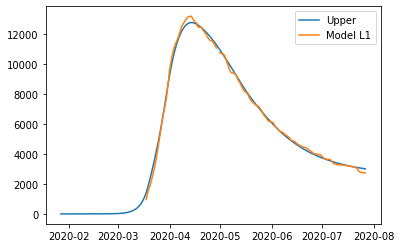

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233749215781975, 'other': 0.4138068186097692, 'school': 0.22907010781166157, 'transport': 0.2559393133249587, 'work': 0.41382394444278464}
{'home': 1.0, 'leisure': 0.3375261030726422, 'other': 0.45279148750849074, 'school': 0.29088772819039954, 'transport': 0.28526246810624256, 'work': 0.5548080342900976}
{'home': 1.0, 'leisure': 0.3618151207405067, 'other': 0.4903838468036865, 'school': 0.35049757641275414, 'transport': 0.3135383673596235, 'work': 0.6907569780714353}
{'home': 1.0, 'leisure': 0.3816061721735814, 'other': 0.5210146580812535, 'school': 0.39906856385319106, 'transport': 0.33657798897348934, 'work': 0.8015301915228954}
{'home': 1.0, 'leisure': 0.3933008843840347, 'other': 0.5391146829270885, 'school': 0.42776960188617663, 'transport': 0.3501923108362283, 'work': 0.8669870903805765}
{'home': 1.0, 'leisure': 0.39959803711274033, 'other': 0.5488608501517689, 

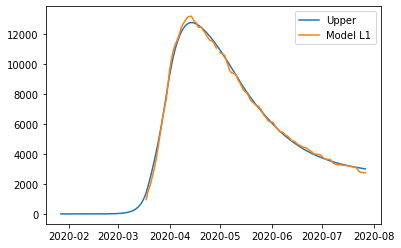

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

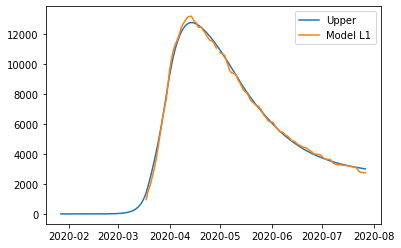

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

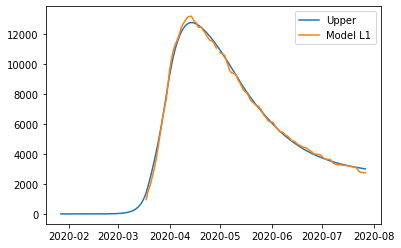

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

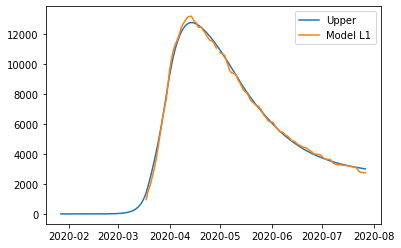

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

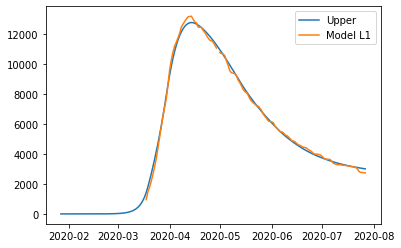

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325084221451, 'other': 0.4138065889666614, 'school': 0.22904695166655917, 'transport': 0.25593216451682366, 'work': 0.4138070883209964}
{'home': 1.0, 'leisure': 0.33751395978410936, 'other': 0.4527931836992679, 'school': 0.290863904178378, 'transport': 0.28525535439004623, 'work': 0.5547927242454018}
{'home': 1.0, 'leisure': 0.3618032326481014, 'other': 0.49038740004856707, 'school': 0.3504731083862034, 'transport': 0.31353128748208237, 'work': 0.6907431588867929}
{'home': 1.0, 'leisure': 0.3815944920187615, 'other': 0.5210197244813293, 'school': 0.3990435710740611, 'transport': 0.3365709366681858, 'work': 0.8015175871131115}
{'home': 1.0, 'leisure': 0.39328932710142434, 'other': 0.5391206434643252, 'school': 0.427744299025977, 'transport': 0.3501852748236106, 'work': 0.8669752037922998}
{'home': 1.0, 'leisure': 0.39958654599208887, 'other': 0.5488672921474769, 'schoo

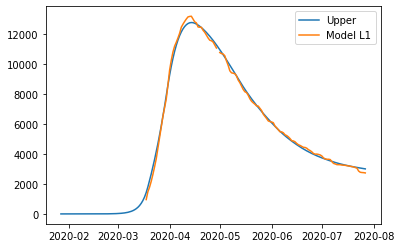

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325084221451, 'other': 0.4138065889666614, 'school': 0.22904695166655917, 'transport': 0.25593216451682366, 'work': 0.4138070883209964}
{'home': 1.0, 'leisure': 0.33751395978410936, 'other': 0.4527931836992679, 'school': 0.290863904178378, 'transport': 0.28525535439004623, 'work': 0.5547927242454018}
{'home': 1.0, 'leisure': 0.3618032326481014, 'other': 0.49038740004856707, 'school': 0.3504731083862034, 'transport': 0.31353128748208237, 'work': 0.6907431588867929}
{'home': 1.0, 'leisure': 0.3815944920187615, 'other': 0.5210197244813293, 'school': 0.3990435710740611, 'transport': 0.3365709366681858, 'work': 0.8015175871131115}
{'home': 1.0, 'leisure': 0.39328932710142434, 'other': 0.5391206434643252, 'school': 0.427744299025977, 'transport': 0.3501852748236106, 'work': 0.8669752037922998}
{'home': 1.0, 'leisure': 0.39958654599208887, 'other': 0.5488672921474769, 'schoo

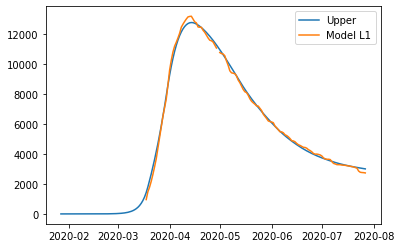

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325084221451, 'other': 0.4138065889666614, 'school': 0.22904695166655917, 'transport': 0.25593216451682366, 'work': 0.4138070883209964}
{'home': 1.0, 'leisure': 0.33751395978410936, 'other': 0.4527931836992679, 'school': 0.290863904178378, 'transport': 0.28525535439004623, 'work': 0.5547927242454018}
{'home': 1.0, 'leisure': 0.3618032326481014, 'other': 0.49038740004856707, 'school': 0.3504731083862034, 'transport': 0.31353128748208237, 'work': 0.6907431588867929}
{'home': 1.0, 'leisure': 0.3815944920187615, 'other': 0.5210197244813293, 'school': 0.3990435710740611, 'transport': 0.3365709366681858, 'work': 0.8015175871131115}
{'home': 1.0, 'leisure': 0.39328932710142434, 'other': 0.5391206434643252, 'school': 0.427744299025977, 'transport': 0.3501852748236106, 'work': 0.8669752037922998}
{'home': 1.0, 'leisure': 0.39958654599208887, 'other': 0.5488672921474769, 'schoo

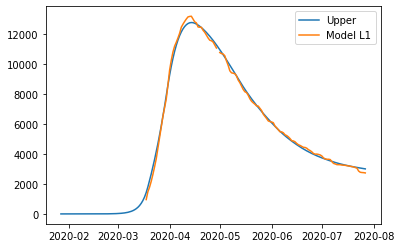

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250793084804, 'other': 0.41380658887566235, 'school': 0.2290469424978564, 'transport': 0.25593216168623856, 'work': 0.41380708164674884}
{'home': 1.0, 'leisure': 0.3375139549759271, 'other': 0.45279318437081684, 'school': 0.2908638947452249, 'transport': 0.28525535157335474, 'work': 0.5547927181833296}
{'home': 1.0, 'leisure': 0.361803227940965, 'other': 0.49038740145543014, 'school': 0.3504730986980445, 'transport': 0.3135312846787882, 'work': 0.6907431534150326}
{'home': 1.0, 'leisure': 0.38159448739395874, 'other': 0.5210197264873373, 'school': 0.3990435611781197, 'transport': 0.33657093387580805, 'work': 0.8015175821223459}
{'home': 1.0, 'leisure': 0.3932893225252733, 'other': 0.5391206458243734, 'school': 0.4277442890072551, 'transport': 0.35018527203768346, 'work': 0.8669751990857585}
{'home': 1.0, 'leisure': 0.399586541442135, 'other': 0.5488672946981619, 'sch

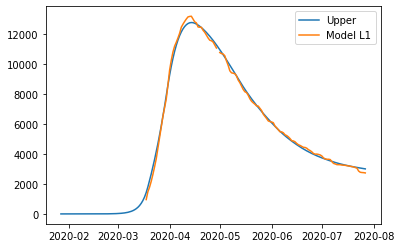

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250757059716, 'other': 0.41380658880893595, 'school': 0.22904693577476853, 'transport': 0.2559321596106699, 'work': 0.4138070767527574}
{'home': 1.0, 'leisure': 0.33751395145025587, 'other': 0.4527931848632401, 'school': 0.29086388782822487, 'transport': 0.2852553495079737, 'work': 0.5547927137382248}
{'home': 1.0, 'leisure': 0.3618032244893871, 'other': 0.49038740248703344, 'school': 0.35047309159405776, 'transport': 0.313531282623231, 'work': 0.6907431494027827}
{'home': 1.0, 'leisure': 0.3815944840027533, 'other': 0.5210197279582724, 'school': 0.39904355392177343, 'transport': 0.33657093182825537, 'work': 0.8015175784627928}
{'home': 1.0, 'leisure': 0.3932893191697424, 'other': 0.5391206475549137, 'school': 0.42774428166087813, 'transport': 0.35018526999486077, 'work': 0.866975195634617}
{'home': 1.0, 'leisure': 0.39958653810581346, 'other': 0.5488672965684898, 's

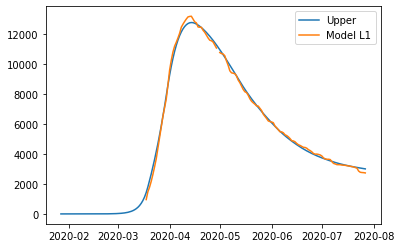

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325072844343, 'other': 0.41380658875593224, 'school': 0.22904693043432914, 'transport': 0.25593215796195595, 'work': 0.41380707286524837}
{'home': 1.0, 'leisure': 0.3375139486496627, 'other': 0.45279318525439316, 'school': 0.29086388233375265, 'transport': 0.2852553478673523, 'work': 0.5547927102072859}
{'home': 1.0, 'leisure': 0.3618032217476495, 'other': 0.49038740330648056, 'school': 0.35047308595105386, 'transport': 0.31353128099041305, 'work': 0.6907431462156792}
{'home': 1.0, 'leisure': 0.3815944813089721, 'other': 0.5210197291266999, 'school': 0.3990435481577438, 'transport': 0.33657093020179585, 'work': 0.8015175755558517}
{'home': 1.0, 'leisure': 0.3932893165042991, 'other': 0.5391206489295568, 'school': 0.4277442758253332, 'transport': 0.3501852683721584, 'work': 0.8669751928932261}
{'home': 1.0, 'leisure': 0.399586535455629, 'other': 0.548867298054172, 'sch

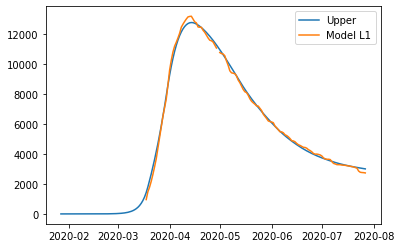

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232506999869103, 'other': 0.4138065887032244, 'school': 0.22904692512370547, 'transport': 0.2559321563224468, 'work': 0.4138070689994433}
{'home': 1.0, 'leisure': 0.3375139458647053, 'other': 0.45279318564336246, 'school': 0.2908638768699561, 'transport': 0.28525534623589044, 'work': 0.5547927066960602}
{'home': 1.0, 'leisure': 0.36180321902121915, 'other': 0.4903874041213526, 'school': 0.3504730803395549, 'transport': 0.3135312793667111, 'work': 0.6907431430463693}
{'home': 1.0, 'leisure': 0.3815944786302304, 'other': 0.5210197302886039, 'school': 0.3990435424258946, 'transport': 0.3365709285844168, 'work': 0.8015175726651397}
{'home': 1.0, 'leisure': 0.393289313853737, 'other': 0.5391206502965251, 'school': 0.4277442700223681, 'transport': 0.3501852667585156, 'work': 0.8669751901671403}
{'home': 1.0, 'leisure': 0.3995865328202406, 'other': 0.5488672995315597, 'school

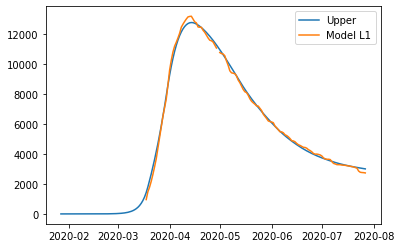

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232506748655425, 'other': 0.41380659020016786, 'school': 0.22904692187536874, 'transport': 0.2559321536160766, 'work': 0.41380706572482495}
{'home': 1.0, 'leisure': 0.3375139434960529, 'other': 0.4527931881909472, 'school': 0.29086387351850246, 'transport': 0.28525534348060616, 'work': 0.5547927043019384}
{'home': 1.0, 'leisure': 0.36180321679092653, 'other': 0.4903874076820558, 'school': 0.350473076888667, 'transport': 0.31353127656425966, 'work': 0.6907431415012977}
{'home': 1.0, 'leisure': 0.3815944765126754, 'other': 0.521019734674811, 'school': 0.3990435388939864, 'transport': 0.3365709257435329, 'work': 0.8015175718118869}
{'home': 1.0, 'leisure': 0.3932893118027998, 'other': 0.53912065517053, 'school': 0.4277442664425842, 'transport': 0.35018526389492166, 'work': 0.8669751897226895}
{'home': 1.0, 'leisure': 0.3995865308051745, 'other': 0.5488673046682249, 'schoo

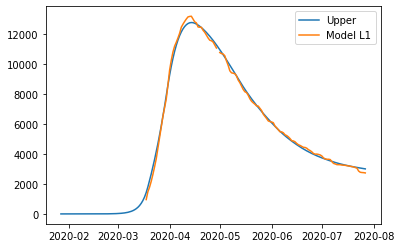

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250650014234, 'other': 0.41380659168101896, 'school': 0.2290469186619521, 'transport': 0.2559321509388002, 'work': 0.4138070624854092}
{'home': 1.0, 'leisure': 0.3375139411528638, 'other': 0.45279319071114504, 'school': 0.2908638702030773, 'transport': 0.2852553407549415, 'work': 0.5547927019335537}
{'home': 1.0, 'leisure': 0.3618032145846099, 'other': 0.4903874112044809, 'school': 0.3504730734748766, 'transport': 0.313531273791935, 'work': 0.6907431399728359}
{'home': 1.0, 'leisure': 0.3815944744178845, 'other': 0.5210197390138657, 'school': 0.3990435354000465, 'transport': 0.3365709229331889, 'work': 0.8015175709678066}
{'home': 1.0, 'leisure': 0.3932893097739104, 'other': 0.5391206599921385, 'school': 0.4277442629012832, 'transport': 0.3501852610621117, 'work': 0.8669751892830165}
{'home': 1.0, 'leisure': 0.39958652881177054, 'other': 0.54886730974967, 'school': 0

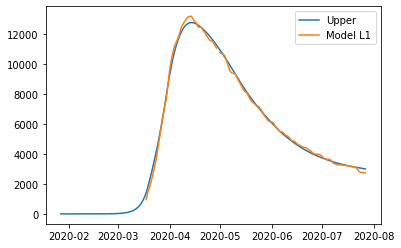

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250286002522, 'other': 0.4138066133719101, 'school': 0.22904687159315498, 'transport': 0.2559321117231628, 'work': 0.4138070150357854}
{'home': 1.0, 'leisure': 0.3375139068307976, 'other': 0.45279322762595947, 'school': 0.29086382164010216, 'transport': 0.2852553008305331, 'work': 0.5547926672424335}
{'home': 1.0, 'leisure': 0.36180318226739505, 'other': 0.4903874627995071, 'school': 0.35047302347108705, 'transport': 0.3135312331840687, 'work': 0.6907431175845586}
{'home': 1.0, 'leisure': 0.3815944437342522, 'other': 0.5210198025705459, 'school': 0.39904348422225977, 'transport': 0.3365708817684311, 'work': 0.8015175586040678}
{'home': 1.0, 'leisure': 0.3932892800555769, 'other': 0.5391207306170689, 'school': 0.427744211029771, 'transport': 0.35018521956828164, 'work': 0.8669751828428688}
{'home': 1.0, 'leisure': 0.39958649961321324, 'other': 0.5488673841805811, 'sch

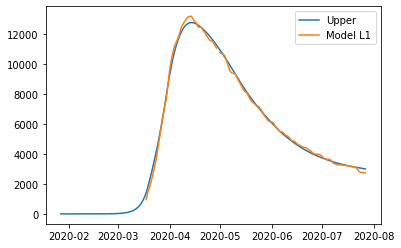

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250286002522, 'other': 0.4138066133719101, 'school': 0.22904687159315498, 'transport': 0.2559321117231628, 'work': 0.4138070150357854}
{'home': 1.0, 'leisure': 0.3375139068307976, 'other': 0.45279322762595947, 'school': 0.29086382164010216, 'transport': 0.2852553008305331, 'work': 0.5547926672424335}
{'home': 1.0, 'leisure': 0.36180318226739505, 'other': 0.4903874627995071, 'school': 0.35047302347108705, 'transport': 0.3135312331840687, 'work': 0.6907431175845586}
{'home': 1.0, 'leisure': 0.3815944437342522, 'other': 0.5210198025705459, 'school': 0.39904348422225977, 'transport': 0.3365708817684311, 'work': 0.8015175586040678}
{'home': 1.0, 'leisure': 0.3932892800555769, 'other': 0.5391207306170689, 'school': 0.427744211029771, 'transport': 0.35018521956828164, 'work': 0.8669751828428688}
{'home': 1.0, 'leisure': 0.39958649961321324, 'other': 0.5488673841805811, 'sch

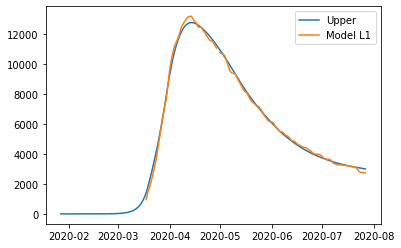

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250286002522, 'other': 0.4138066133719101, 'school': 0.22904687159315498, 'transport': 0.2559321117231628, 'work': 0.4138070150357854}
{'home': 1.0, 'leisure': 0.3375139068307976, 'other': 0.45279322762595947, 'school': 0.29086382164010216, 'transport': 0.2852553008305331, 'work': 0.5547926672424335}
{'home': 1.0, 'leisure': 0.36180318226739505, 'other': 0.4903874627995071, 'school': 0.35047302347108705, 'transport': 0.3135312331840687, 'work': 0.6907431175845586}
{'home': 1.0, 'leisure': 0.3815944437342522, 'other': 0.5210198025705459, 'school': 0.39904348422225977, 'transport': 0.3365708817684311, 'work': 0.8015175586040678}
{'home': 1.0, 'leisure': 0.3932892800555769, 'other': 0.5391207306170689, 'school': 0.427744211029771, 'transport': 0.35018521956828164, 'work': 0.8669751828428688}
{'home': 1.0, 'leisure': 0.39958649961321324, 'other': 0.5488673841805811, 'sch

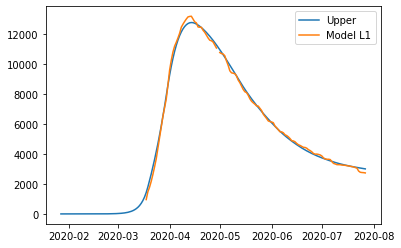

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232500377178374, 'other': 0.41380662816680336, 'school': 0.22904683948852733, 'transport': 0.25593208497500775, 'work': 0.41380698267140115}
{'home': 1.0, 'leisure': 0.33751388342044275, 'other': 0.4527932528047699, 'school': 0.2908637885163266, 'transport': 0.28525527359894, 'work': 0.5547926435803547}
{'home': 1.0, 'leisure': 0.3618031602245068, 'other': 0.4903874979913804, 'school': 0.3504729893645616, 'transport': 0.3135312054863032, 'work': 0.6907431023139885}
{'home': 1.0, 'leisure': 0.381594422805596, 'other': 0.5210198459212112, 'school': 0.3990434493149753, 'transport': 0.3365708536908213, 'work': 0.8015175501710234}
{'home': 1.0, 'leisure': 0.3932892597853306, 'other': 0.5391207787888386, 'school': 0.42774417564931067, 'transport': 0.3501851912662184, 'work': 0.8669751784501804}
{'home': 1.0, 'leisure': 0.3995864796974953, 'other': 0.5488674349483302, 'school

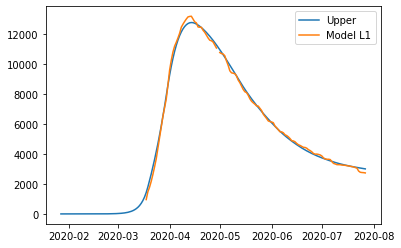

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232500377178374, 'other': 0.41380662816680336, 'school': 0.22904683948852733, 'transport': 0.25593208497500775, 'work': 0.41380698267140115}
{'home': 1.0, 'leisure': 0.33751388342044275, 'other': 0.4527932528047699, 'school': 0.2908637885163266, 'transport': 0.28525527359894, 'work': 0.5547926435803547}
{'home': 1.0, 'leisure': 0.3618031602245068, 'other': 0.4903874979913804, 'school': 0.3504729893645616, 'transport': 0.3135312054863032, 'work': 0.6907431023139885}
{'home': 1.0, 'leisure': 0.381594422805596, 'other': 0.5210198459212112, 'school': 0.3990434493149753, 'transport': 0.3365708536908213, 'work': 0.8015175501710234}
{'home': 1.0, 'leisure': 0.3932892597853306, 'other': 0.5391207787888386, 'school': 0.42774417564931067, 'transport': 0.3501851912662184, 'work': 0.8669751784501804}
{'home': 1.0, 'leisure': 0.3995864796974953, 'other': 0.5488674349483302, 'school

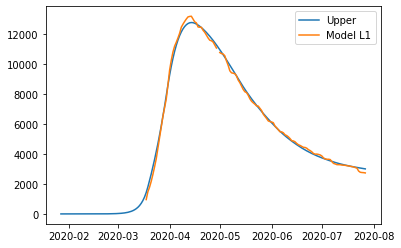

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232500377178374, 'other': 0.41380662816680336, 'school': 0.22904683948852733, 'transport': 0.25593208497500775, 'work': 0.41380698267140115}
{'home': 1.0, 'leisure': 0.33751388342044275, 'other': 0.4527932528047699, 'school': 0.2908637885163266, 'transport': 0.28525527359894, 'work': 0.5547926435803547}
{'home': 1.0, 'leisure': 0.3618031602245068, 'other': 0.4903874979913804, 'school': 0.3504729893645616, 'transport': 0.3135312054863032, 'work': 0.6907431023139885}
{'home': 1.0, 'leisure': 0.381594422805596, 'other': 0.5210198459212112, 'school': 0.3990434493149753, 'transport': 0.3365708536908213, 'work': 0.8015175501710234}
{'home': 1.0, 'leisure': 0.3932892597853306, 'other': 0.5391207787888386, 'school': 0.42774417564931067, 'transport': 0.3501851912662184, 'work': 0.8669751784501804}
{'home': 1.0, 'leisure': 0.3995864796974953, 'other': 0.5488674349483302, 'school

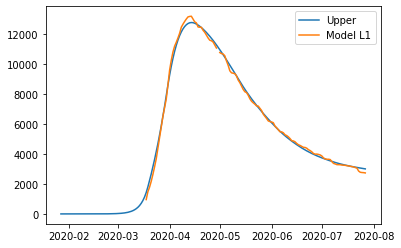

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485732047466, 'other': 0.41380671543475805, 'school': 0.2290466501186641, 'transport': 0.25593192720040164, 'work': 0.41380679176931234}
{'home': 1.0, 'leisure': 0.33751374533390965, 'other': 0.4527934013225262, 'school': 0.2908635931349828, 'transport': 0.285255112972757, 'work': 0.5547925040090205}
{'home': 1.0, 'leisure': 0.36180303020400767, 'other': 0.4903877055714455, 'school': 0.35047278818643296, 'transport': 0.3135310421103854, 'work': 0.6907430122401677}
{'home': 1.0, 'leisure': 0.38159429935742084, 'other': 0.5210201016261204, 'school': 0.3990432434135405, 'transport': 0.33657068807437895, 'work': 0.8015175004285098}
{'home': 1.0, 'leisure': 0.3932891402208014, 'other': 0.5391210629311557, 'school': 0.42774396695683137, 'transport': 0.35018502432582965, 'work': 0.8669751525398028}
{'home': 1.0, 'leisure': 0.3995863622241601, 'other': 0.5488677344030977, '

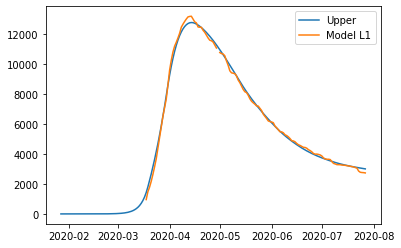

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485732047466, 'other': 0.41380671543475805, 'school': 0.2290466501186641, 'transport': 0.25593192720040164, 'work': 0.41380679176931234}
{'home': 1.0, 'leisure': 0.33751374533390965, 'other': 0.4527934013225262, 'school': 0.2908635931349828, 'transport': 0.285255112972757, 'work': 0.5547925040090205}
{'home': 1.0, 'leisure': 0.36180303020400767, 'other': 0.4903877055714455, 'school': 0.35047278818643296, 'transport': 0.3135310421103854, 'work': 0.6907430122401677}
{'home': 1.0, 'leisure': 0.38159429935742084, 'other': 0.5210201016261204, 'school': 0.3990432434135405, 'transport': 0.33657068807437895, 'work': 0.8015175004285098}
{'home': 1.0, 'leisure': 0.3932891402208014, 'other': 0.5391210629311557, 'school': 0.42774396695683137, 'transport': 0.35018502432582965, 'work': 0.8669751525398028}
{'home': 1.0, 'leisure': 0.3995863622241601, 'other': 0.5488677344030977, '

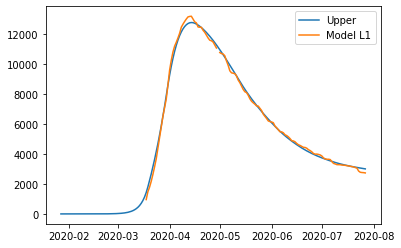

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485732047466, 'other': 0.41380671543475805, 'school': 0.2290466501186641, 'transport': 0.25593192720040164, 'work': 0.41380679176931234}
{'home': 1.0, 'leisure': 0.33751374533390965, 'other': 0.4527934013225262, 'school': 0.2908635931349828, 'transport': 0.285255112972757, 'work': 0.5547925040090205}
{'home': 1.0, 'leisure': 0.36180303020400767, 'other': 0.4903877055714455, 'school': 0.35047278818643296, 'transport': 0.3135310421103854, 'work': 0.6907430122401677}
{'home': 1.0, 'leisure': 0.38159429935742084, 'other': 0.5210201016261204, 'school': 0.3990432434135405, 'transport': 0.33657068807437895, 'work': 0.8015175004285098}
{'home': 1.0, 'leisure': 0.3932891402208014, 'other': 0.5391210629311557, 'school': 0.42774396695683137, 'transport': 0.35018502432582965, 'work': 0.8669751525398028}
{'home': 1.0, 'leisure': 0.3995863622241601, 'other': 0.5488677344030977, '

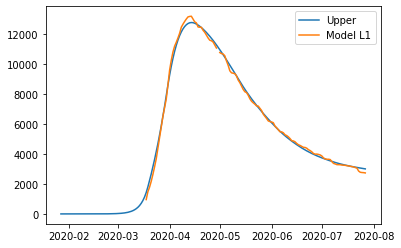

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123248569100167, 'other': 0.41380671567934313, 'school': 0.22904664958791873, 'transport': 0.255931926758208, 'work': 0.41380679123427255}
{'home': 1.0, 'leisure': 0.33751374494689557, 'other': 0.4527934017387757, 'school': 0.2908635925873891, 'transport': 0.2852551125225713, 'work': 0.554792503617845}
{'home': 1.0, 'leisure': 0.3618030298396002, 'other': 0.49038770615322846, 'school': 0.3504727876225926, 'transport': 0.313531041652493, 'work': 0.6907430119877185}
{'home': 1.0, 'leisure': 0.3815942990114336, 'other': 0.5210201023427826, 'school': 0.3990432428364622, 'transport': 0.33657068761020703, 'work': 0.8015175002890969}
{'home': 1.0, 'leisure': 0.3932891398856988, 'other': 0.5391210637275191, 'school': 0.4277439663719305, 'transport': 0.35018502385794714, 'work': 0.866975152467184}
{'home': 1.0, 'leisure': 0.3995863618949186, 'other': 0.5488677352423773, 'school'

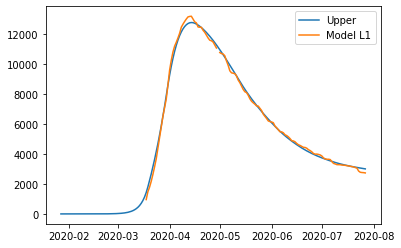

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485650282693, 'other': 0.41380671592198076, 'school': 0.22904664906139927, 'transport': 0.2559319263195352, 'work': 0.4138067907034928}
{'home': 1.0, 'leisure': 0.337513744562963, 'other': 0.4527934021517109, 'school': 0.2908635920441554, 'transport': 0.28525511207597, 'work': 0.5547925032297841}
{'home': 1.0, 'leisure': 0.3618030294780943, 'other': 0.49038770673037924, 'school': 0.35047278706324164, 'transport': 0.31353104119824643, 'work': 0.6907430117372793}
{'home': 1.0, 'leisure': 0.3815942986682012, 'other': 0.5210201030537386, 'school': 0.39904324226397864, 'transport': 0.33657068714973093, 'work': 0.8015175001507939}
{'home': 1.0, 'leisure': 0.3932891395532644, 'other': 0.5391210645175419, 'school': 0.42774396579168683, 'transport': 0.35018502339379, 'work': 0.8669751523951434}
{'home': 1.0, 'leisure': 0.3995863615682984, 'other': 0.5488677360749744, 'school

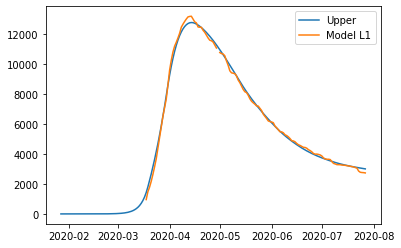

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485592550496, 'other': 0.41380671626599724, 'school': 0.22904664831488938, 'transport': 0.25593192569757606, 'work': 0.4138067899509426}
{'home': 1.0, 'leisure': 0.33751374401861567, 'other': 0.4527934027371787, 'school': 0.2908635912739478, 'transport': 0.2852551114427697, 'work': 0.5547925026795836}
{'home': 1.0, 'leisure': 0.36180302896554384, 'other': 0.4903877075486751, 'school': 0.3504727862701827, 'transport': 0.31353104055420655, 'work': 0.6907430113822017}
{'home': 1.0, 'leisure': 0.3815942981815593, 'other': 0.5210201040617463, 'school': 0.3990432414522999, 'transport': 0.3365706864968587, 'work': 0.8015174999547052}
{'home': 1.0, 'leisure': 0.39328913908193214, 'other': 0.5391210656376519, 'school': 0.42774396496900563, 'transport': 0.3501850227356986, 'work': 0.8669751522930029}
{'home': 1.0, 'leisure': 0.39958636110520984, 'other': 0.5488677372554472, '

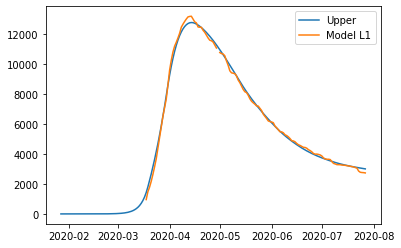

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123248553154192, 'other': 0.41380671662953716, 'school': 0.22904664752601395, 'transport': 0.25593192504031986, 'work': 0.4138067891556841}
{'home': 1.0, 'leisure': 0.3375137434433758, 'other': 0.4527934033558727, 'school': 0.2908635904600297, 'transport': 0.2852551107736344, 'work': 0.5547925020981583}
{'home': 1.0, 'leisure': 0.3618030284239054, 'other': 0.4903877084134105, 'school': 0.3504727854321163, 'transport': 0.3135310398736163, 'work': 0.6907430110069728}
{'home': 1.0, 'leisure': 0.38159429766729985, 'other': 0.5210201051269598, 'school': 0.3990432405945573, 'transport': 0.33657068580693494, 'work': 0.8015174997474883}
{'home': 1.0, 'leisure': 0.3932891385838511, 'other': 0.5391210668213298, 'school': 0.427743964099636, 'transport': 0.35018502204025953, 'work': 0.8669751521850655}
{'home': 1.0, 'leisure': 0.3995863606158403, 'other': 0.5488677385029137, 'schoo

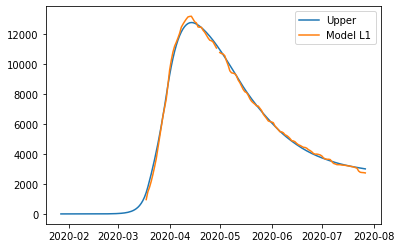

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232481950070806, 'other': 0.4138067379709218, 'school': 0.22904660121556925, 'transport': 0.2559318864564984, 'work': 0.4138067424705211}
{'home': 1.0, 'leisure': 0.3375137096742731, 'other': 0.45279343967592, 'school': 0.29086354267947245, 'transport': 0.2852550714924575, 'work': 0.5547924679659468}
{'home': 1.0, 'leisure': 0.36180299662735355, 'other': 0.49038775917716815, 'school': 0.3504727362339505, 'transport': 0.31353099991998945, 'work': 0.6907429889793929}
{'home': 1.0, 'leisure': 0.38159426747801173, 'other': 0.5210201676596667, 'school': 0.3990431902413029, 'transport': 0.33657064530538583, 'work': 0.8015174875829416}
{'home': 1.0, 'leisure': 0.3932891093443097, 'other': 0.5391211363084158, 'school': 0.4277439130638294, 'transport': 0.35018498121493824, 'work': 0.866975145848675}
{'home': 1.0, 'leisure': 0.399586331887701, 'other': 0.5488678117346654, 'schoo

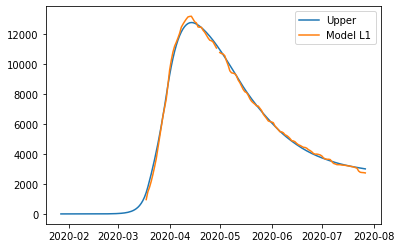

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232481950070806, 'other': 0.4138067379709218, 'school': 0.22904660121556925, 'transport': 0.2559318864564984, 'work': 0.4138067424705211}
{'home': 1.0, 'leisure': 0.3375137096742731, 'other': 0.45279343967592, 'school': 0.29086354267947245, 'transport': 0.2852550714924575, 'work': 0.5547924679659468}
{'home': 1.0, 'leisure': 0.36180299662735355, 'other': 0.49038775917716815, 'school': 0.3504727362339505, 'transport': 0.31353099991998945, 'work': 0.6907429889793929}
{'home': 1.0, 'leisure': 0.38159426747801173, 'other': 0.5210201676596667, 'school': 0.3990431902413029, 'transport': 0.33657064530538583, 'work': 0.8015174875829416}
{'home': 1.0, 'leisure': 0.3932891093443097, 'other': 0.5391211363084158, 'school': 0.4277439130638294, 'transport': 0.35018498121493824, 'work': 0.866975145848675}
{'home': 1.0, 'leisure': 0.399586331887701, 'other': 0.5488678117346654, 'schoo

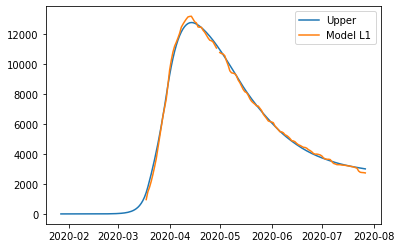

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232481950070806, 'other': 0.4138067379709218, 'school': 0.22904660121556925, 'transport': 0.2559318864564984, 'work': 0.4138067424705211}
{'home': 1.0, 'leisure': 0.3375137096742731, 'other': 0.45279343967592, 'school': 0.29086354267947245, 'transport': 0.2852550714924575, 'work': 0.5547924679659468}
{'home': 1.0, 'leisure': 0.36180299662735355, 'other': 0.49038775917716815, 'school': 0.3504727362339505, 'transport': 0.31353099991998945, 'work': 0.6907429889793929}
{'home': 1.0, 'leisure': 0.38159426747801173, 'other': 0.5210201676596667, 'school': 0.3990431902413029, 'transport': 0.33657064530538583, 'work': 0.8015174875829416}
{'home': 1.0, 'leisure': 0.3932891093443097, 'other': 0.5391211363084158, 'school': 0.4277439130638294, 'transport': 0.35018498121493824, 'work': 0.866975145848675}
{'home': 1.0, 'leisure': 0.399586331887701, 'other': 0.5488678117346654, 'schoo

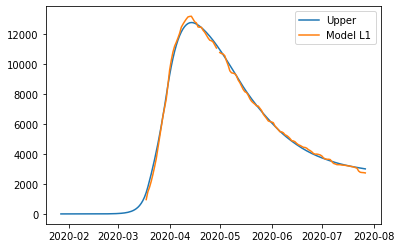

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312324819113193, 'other': 0.41380673801705214, 'school': 0.2290466007057587, 'transport': 0.2559318861993485, 'work': 0.41380674195658546}
{'home': 1.0, 'leisure': 0.3375137092977548, 'other': 0.452793439803006, 'school': 0.2908635421195545, 'transport': 0.28525507124303723, 'work': 0.5547924675128315}
{'home': 1.0, 'leisure': 0.36180299626143947, 'other': 0.49038775938231877, 'school': 0.3504727356257148, 'transport': 0.3135309996780229, 'work': 0.690742988584926}
{'home': 1.0, 'leisure': 0.3815942671207381, 'other': 0.5210201679284254, 'school': 0.3990431895936972, 'transport': 0.33657064506949264, 'work': 0.8015174872362623}
{'home': 1.0, 'leisure': 0.39328910899214176, 'other': 0.5391211366147611, 'school': 0.4277439123929596, 'transport': 0.3501849809826339, 'work': 0.8669751455302337}
{'home': 1.0, 'leisure': 0.3995863315382822, 'other': 0.5488678120612496, 'school

In [25]:
from scipy.optimize import minimize, Bounds, shgo, differential_evolution

bounds = Bounds(lb,ub)

result = minimize(error, v0, bounds = bounds)

In [26]:
best_v

array([5.08875347e+01, 2.36561700e-01, 1.31254708e+00, 1.47852085e+00,
       5.00000010e-01, 1.01443896e+01, 5.58907698e-01, 4.13806742e-01,
       1.78662699e-01, 2.38392990e-01, 2.76529426e-01, 2.99376997e-01,
       2.07986907e-01, 1.69865502e-01, 4.38462413e-01, 4.76078981e-02])

In [27]:
v = best_v

days_ahead = v[0]
alpha_mixing = v[1]
beta_mixing = v[2]
gamma_mixing_before = v[3]
gamma_mixing_after = v[3]*(1-v[4])
gamma_change = v[5] + v[0]

upper_bound_home = 1.0
upper_bound_leisure = 1.0
upper_bound_other = 1.0
upper_bound_school = 1.0
upper_bound_work = 1.0
upper_bound_transport = 1.0

work_alpha = v[6]
work_beta = v[7]

leisure_alpha = v[8]
leisure_beta = v[9]

other_alpha = v[10]
other_beta = v[11]

transport_alpha = v[12]
transport_beta = v[13]

school_alpha = v[14]
school_beta = v[15]


# Number of days
days_before_date_1 = int(days_ahead)
days_between_dates_1_2 = (date_2-date_1).days
days_between_dates_2_3 = (date_3-date_2).days
days_between_dates_3_4 = (date_4-date_3).days
days_between_dates_4_5 = (date_5-date_4).days
days_between_dates_5_6 = (date_6-date_5).days
days_between_dates_6_7 = (date_7-date_6).days

days_after_date_7 = (final_date-date_7).days
total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_between_dates_5_6+ days_between_dates_6_7 + days_after_date_7
days_denom = days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7


# Construct initialization
initialization = copy.deepcopy(original_initialization)
for i,group in enumerate(age_groups):
    if group == "age_group_40_49":
        initialization[group]["I"] = initialization[group]["I"] + 1
        initialization[group]["S"] = initialization[group]["S"] - 1
    initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


# Alphas
a_before_date_1 = {
    'home':upper_bound_home,
    'leisure':upper_bound_leisure,
    'other':upper_bound_other,
    'school':upper_bound_school,
    'transport':upper_bound_transport,
    'work':upper_bound_work
}

work_between_date_1_2 = work_alpha/days_denom*0 +work_beta
a_between_date_1_2 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_1_2*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_1_2*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_1_2*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_1_2*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_1_2*upper_bound_work
}

violation = (
    max(-(1-leisure_alpha)*work_between_date_1_2*upper_bound_work + leisure_beta,0)+
    max(-(1-other_alpha)*work_between_date_1_2*upper_bound_work + other_beta,0)+
    max(-(1-school_alpha)*work_between_date_1_2*upper_bound_work + school_beta,0)+
    max(-(1-transport_alpha)*work_between_date_1_2*upper_bound_work + transport_beta,0)+
    max(work_alpha+work_beta-1,0)
)

work_between_date_2_3 = work_alpha/days_denom*(days_between_dates_1_2) +work_beta
a_between_date_2_3 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_2_3*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_2_3*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_2_3*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_2_3*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_2_3*upper_bound_work
}

work_between_date_3_4 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3) +work_beta
a_between_date_3_4 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_3_4*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_3_4*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_3_4*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_3_4*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_3_4*upper_bound_work
}

work_between_date_4_5 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4) +work_beta
a_between_date_4_5 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_4_5*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_4_5*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_4_5*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_4_5*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_4_5*upper_bound_work
}

work_between_date_5_6 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5) +work_beta
a_between_date_5_6 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_5_6*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_5_6*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_5_6*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_5_6*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_5_6*upper_bound_work
}

work_between_date_6_7 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6) +work_beta
a_between_date_6_7 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_6_7*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_6_7*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_6_7*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_6_7*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_6_7*upper_bound_work
}

work_after_date_7 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7) +work_beta
a_after_date_7 = {
    'home':upper_bound_home,
    'leisure':(work_after_date_7*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_after_date_7*other_alpha + other_beta)*upper_bound_other,
    'school':(work_after_date_7*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_after_date_7*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_after_date_7*upper_bound_work
}

# Determine mixing method
mixing_method_before = {
    "name":"mult",
    "param_alpha":alpha_mixing,
    "param_beta":beta_mixing,
    "fixed_gamma":gamma_mixing_before,
}

# Determine mixing method
mixing_method_after = {
    "name":"mult",
    "param_alpha":alpha_mixing,
    "param_beta":beta_mixing,
    "fixed_gamma":gamma_mixing_after,
}
#dynModel.mixing_method = mixing_method_after




# Calculate alphas
alphas_vec = []
for t in range(days_before_date_1):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_before_date_1
    alphas_vec.append(alphas)
for t in range(days_between_dates_1_2):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_1_2
    alphas_vec.append(alphas)
for t in range(days_between_dates_2_3):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_2_3
    alphas_vec.append(alphas)
for t in range(days_between_dates_3_4):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_3_4
    alphas_vec.append(alphas)
for t in range(days_between_dates_4_5):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_4_5
    alphas_vec.append(alphas)
for t in range(days_between_dates_5_6):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_5_6
    alphas_vec.append(alphas)
for t in range(days_between_dates_6_7):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_6_7
    alphas_vec.append(alphas)
for t in range(days_after_date_7):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_after_date_7
    alphas_vec.append(alphas)

mixing_vec = []
for t in range(int(gamma_change)):
    mixing_vec.append(mixing_method_before)
for t in range(int(gamma_change),total_days):
    mixing_vec.append(mixing_method_after)




# Calculate tests
tests = np.zeros(len(age_groups))


# Run model
model_data_beds = {ag:[] for ag in age_groups+["total"]}
model_data_icus = {ag:[] for ag in age_groups+["total"]}
model_data_deaths = {ag:[] for ag in age_groups+["total"]}

state = state_to_matrix(initialization)
t_beds = 0
t_icus = 0
t_deaths = 0
for i,ag in enumerate(age_groups):
    state_H = state[i,cont.index("H")]
    state_ICU = state[i,cont.index("ICU")]
    state_D = state[i,cont.index("D")]
    model_data_beds[ag].append(state_H)
    model_data_icus[ag].append(state_ICU)
    model_data_deaths[ag].append(state_D)
    t_beds+= state_H
    t_icus+= state_ICU
    t_deaths+= state_D
model_data_beds["total"].append(t_beds)
model_data_icus["total"].append(t_icus)
model_data_deaths["total"].append(t_deaths)

recalc_days = [0,
             days_before_date_1,
             days_before_date_1+days_between_dates_1_2,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7,
            int(gamma_change)
            ]

for t in range(total_days):
    if t in recalc_days:
        update_contacts = True
    else:
        update_contacts = False
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), "", update_contacts=update_contacts)
    t_beds = 0
    t_icus = 0
    t_deaths = 0
    for i,ag in enumerate(age_groups):
        state_H = state[i,cont.index("H")]
        state_ICU = state[i,cont.index("ICU")]
        state_D = state[i,cont.index("D")]
        model_data_beds[ag].append(state_H)
        model_data_icus[ag].append(state_ICU)
        model_data_deaths[ag].append(state_D)
        t_beds+= state_H
        t_icus+= state_ICU
        t_deaths+= state_D
    model_data_beds["total"].append(t_beds)
    model_data_icus["total"].append(t_icus)
    model_data_deaths["total"].append(t_deaths)


initial_date = date_1-timedelta(days=days_before_date_1)

# Calculate the days of the model
days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

# Indices where to put the real data
indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

# Real data
real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

for k,ind in enumerate(indices):
    for ag in age_groups+["total"]:
        real_data_beds[ag][ind] = beds_real[ag][k]
        real_data_icus[ag][ind] = icus_real[ag][k]
        real_data_deaths[ag][ind] = deaths_real[ag][k]


error_beds = 0
error_icus = 0
error_deaths = 0
for ag in age_groups:
    error_beds += np.nanmean(np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))
    error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
    error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
error_beds_total = np.nanmean(np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))
error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))

diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
error_beds_above = np.nanmean([max(d,0) for d in diff])
error_beds_below = -np.nanmean([min(d,0) for d in diff])

cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



#     error = error_beds_total
#     error = mult_icus*error_icus_total
#     error = mult_deaths*error_deaths_total
upper_model_data = model_data_beds["total"]
upper_days_model = days_model
upper_real_data = real_data_beds["total"]
error = error_beds+5*error_beds_total + violation*1000000


In [28]:
print("Before 03-17")
print(a_before_date_1)
print(date_1)
print(a_between_date_1_2)
print(date_2)
print(a_between_date_2_3)
print(date_3)
print(a_between_date_3_4)
print(date_4)
print(a_between_date_4_5)
print(date_5)
print(a_between_date_5_6)
print(date_6)
print(a_between_date_6_7)
print(date_7)
print(a_after_date_7)

Before 03-17
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
2020-03-17 00:00:00
{'home': 1.0, 'leisure': 0.312324819113193, 'other': 0.41380673801705214, 'school': 0.2290466007057587, 'transport': 0.2559318861993485, 'work': 0.41380674195658546}
2020-04-14 00:00:00
{'home': 1.0, 'leisure': 0.3375137092977548, 'other': 0.452793439803006, 'school': 0.2908635421195545, 'transport': 0.28525507124303723, 'work': 0.5547924675128315}
2020-05-11 00:00:00
{'home': 1.0, 'leisure': 0.36180299626143947, 'other': 0.49038775938231877, 'school': 0.3504727356257148, 'transport': 0.3135309996780229, 'work': 0.690742988584926}
2020-06-02 00:00:00
{'home': 1.0, 'leisure': 0.3815942671207381, 'other': 0.5210201679284254, 'school': 0.3990431895936972, 'transport': 0.33657064506949264, 'work': 0.8015174872362623}
2020-06-15 00:00:00
{'home': 1.0, 'leisure': 0.39328910899214176, 'other': 0.5391211366147611, 'school': 0.4277439123929596, 'transport': 0.35018498098263

In [29]:
with open("../initialization/initialization.yaml") as file:
    initialization = yaml.load(file, Loader=yaml.FullLoader)
with open("../parameters/Ile-de-France.yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    universe_params = yaml.load(file, Loader=yaml.FullLoader)


In [55]:
# Modify parameters
universe_params['mixing'] = {
    "name":"mult",
    "param_alpha":float(alpha_mixing),
    "param_beta":float(beta_mixing),
    "param_gamma_before":float(gamma_mixing_before),
    "param_gamma_after":float(gamma_mixing_after),
}
universe_params['days_before_gamma'] = float(gamma_change)
universe_params['upper_bounds'] = {
    "transport":float(upper_bound_transport),
    "leisure":float(upper_bound_leisure),
    "other":float(upper_bound_other),
    "school":float(upper_bound_school),
    "home":float(upper_bound_home),
    "work":float(upper_bound_work)
}
    
with open('../parameters/fitted.yaml', 'w') as file:
    yaml.dump(universe_params, file)
    

In [56]:
days_ahead

50.88753474

In [57]:
# Add economic value parameters
contrib = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="contributions_normal", index_col = 0)
gains = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="activity_levels_as_%_of_full", index_col = 0)

empl_params = {}
empl_params["v"] = {}
for age_group in age_groups:
    empl_params["v"][age_group] = {}
    for activity in econ_activities:
        empl_params["v"][age_group][activity] = float(contrib[age_group][activity])/365.0


In [58]:
# Calculate l-april and l-may
l_april = a_between_date_1_2
l_may = {}
for a in a_between_date_1_2.keys():
    l_may[a] = a_between_date_1_2[a]/3.0 + a_between_date_3_4[a]*2.0/3.0

TypeError: unsupported operand type(s) for /: 'str' and 'float'

In [59]:
l_april

{'home': 1.0,
 'leisure': 0.312324819113193,
 'other': 0.41380673801705214,
 'school': 0.2290466007057587,
 'transport': 0.2559318861993485,
 'work': 0.41380674195658546,
 'date': '2020-04-13',
 'days_from_lockdown': 27}

In [60]:
l_may

{'home': 1.0,
 'leisure': 0.3453102705453573,
 'other': 0.4648607522605632,
 'school': 0.30999735731906275,
 'transport': 0.2943312951851314,
 'work': 0.5984309063754791}

In [61]:
from gurobipy import *

eq_activities = ['leisure','other','school','transport']
upper_bounds = {
    "transport":upper_bound_transport,
    "leisure":upper_bound_leisure,
    "other":upper_bound_other,
    "school":upper_bound_school,
    "home":upper_bound_home,
    "work":upper_bound_work,
}
m = Model()
nu = m.addVar(vtype=GRB.CONTINUOUS, name="nu", lb = 0)
gamma = m.addVar(vtype=GRB.CONTINUOUS, name="gamma", lb = 0)
epsilonp_1 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonp_1", lb = 0)
epsilonn_1 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonn_1", lb = 0)
epsilonp_2 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonp_2", lb = 0)
epsilonn_2 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonn_2", lb = 0)

m.addConstr(nu*upper_bound_work+gamma==1)
m.addConstr(
        nu*l_april["work"]  + gamma == 0.5851+epsilonp_1-epsilonn_1
)

m.setObjective(epsilonp_1+epsilonn_1+epsilonp_2+epsilonn_2)
m.update()
m.optimize()

empl_params['nu'] = 0.95*float(nu.x)
empl_params['gamma'] = float(gamma.x)
empl_params['eta'] = 0.05*float(nu.x)

print("nu",empl_params['nu'])
print("eta",empl_params['eta'])
print("gamma",empl_params['gamma'])

Gurobi Optimizer version 9.0.2 build v9.0.2rc0 (mac64)
Optimize a model with 2 rows, 6 columns and 6 nonzeros
Model fingerprint: 0x6146f551
Coefficient statistics:
  Matrix range     [4e-01, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+00]
Presolve removed 1 rows and 3 columns
Presolve time: 0.00s
Presolved: 1 rows, 3 columns, 3 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00
nu 0.6723977026204695
eta 0.035389352769498394
gamma 0.29221294461003205


In [62]:
empl_params

{'v': {'age_group_0_9': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0},
  'age_group_10_19': {'transport': 0.42995936063784673,
   'leisure': 0.7068903576182438,
   'other': 4.574913439411911},
  'age_group_20_29': {'transport': 2.421870523023006,
   'leisure': 3.981764503475539,
   'other': 25.769523863503046},
  'age_group_30_39': {'transport': 5.3207402525299345,
   'leisure': 8.74775693759741,
   'other': 56.61448108213707},
  'age_group_40_49': {'transport': 6.5473065780407085,
   'leisure': 10.764338009809762,
   'other': 69.6655628368981},
  'age_group_50_59': {'transport': 6.717886370840974,
   'leisure': 11.04478593529775,
   'other': 71.48058969296267},
  'age_group_60_69': {'transport': 2.606993951947998,
   'leisure': 4.286123424007397,
   'other': 27.739299941136395},
  'age_group_70_79': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0},
  'age_group_80_plus': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}},
 'nu': 0.6723977026204695,
 'gamma': 0.29221294461003205,
 'e

In [63]:
# Calculate the schooling parameter
r = 0.03
schooling_param = {}
for age_group in age_groups:
    if age_group == "age_group_0_9":
        schooling_param[age_group] = (1+r)**(-15)*sum([empl_params["v"]["age_group_20_29"][act] for act in econ_activities])/upper_bound_school
    elif age_group == "age_group_10_19":
        schooling_param[age_group] = 0.907*(1+r)**(-5)*sum([empl_params["v"]["age_group_20_29"][act] for act in econ_activities])/upper_bound_school
    else:
        schooling_param[age_group] = 0

In [64]:
# Calculate the cost of death
econ_cost_death = {}
age_groups_n = [0,10,20,30,40,50,60,70,80]
for i,age_group in enumerate(age_groups):
    s = 0
    for tao in range(age_groups_n[i]+5,70):
        ag = "age_group_%d_%d"%(int(tao/10)*10,int(tao/10)*10+9)
        s+=(1+r)**(-(tao-age_groups_n[i]))*sum([empl_params["v"][ag][act] for act in econ_activities])*365
    econ_cost_death[age_group] = float(s)

In [65]:
econ_params = {
    "employment_params":empl_params,
    "schooling_params":schooling_param,
    "econ_cost_death":econ_cost_death,
    "upper_bounds":upper_bounds,
}
with open('../parameters/econ.yaml', 'w') as file:
    yaml.dump(econ_params, file)

In [66]:
print(econ_params)

{'employment_params': {'v': {'age_group_0_9': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}, 'age_group_10_19': {'transport': 0.42995936063784673, 'leisure': 0.7068903576182438, 'other': 4.574913439411911}, 'age_group_20_29': {'transport': 2.421870523023006, 'leisure': 3.981764503475539, 'other': 25.769523863503046}, 'age_group_30_39': {'transport': 5.3207402525299345, 'leisure': 8.74775693759741, 'other': 56.61448108213707}, 'age_group_40_49': {'transport': 6.5473065780407085, 'leisure': 10.764338009809762, 'other': 69.6655628368981}, 'age_group_50_59': {'transport': 6.717886370840974, 'leisure': 11.04478593529775, 'other': 71.48058969296267}, 'age_group_60_69': {'transport': 2.606993951947998, 'leisure': 4.286123424007397, 'other': 27.739299941136395}, 'age_group_70_79': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}, 'age_group_80_plus': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}}, 'nu': 0.6723977026204695, 'gamma': 0.29221294461003205, 'eta': 0.035389352769498394}, 'scho

In [113]:
# Initialization
# Construct initialization
initialization = copy.deepcopy(original_initialization)
for i,group in enumerate(age_groups):
    if group == "age_group_40_49":
        initialization[group]["I"] = initialization[group]["I"] + 1
        initialization[group]["S"] = initialization[group]["S"] - 1
    initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]

# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(10):
    dynModel.mixing_method = mixing_vec[t]
    if t < universe_params['days_before_gamma']:
        lockdown_status = "pre-gamma"
    else:
        lockdown_status = "post-gamma"
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),lockdown_status)

def matrix_to_state(m):
    state = {}
    for i,age_group in enumerate(age_groups):
        state[age_group] = {}
        for j,c in enumerate(cont):
            state[age_group][c] = float(m[i,j])
    return state

with open('../initialization/10days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)
    

In [114]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(20):
    dynModel.mixing_method = mixing_vec[t]
    if t < universe_params['days_before_gamma']:
        lockdown_status = "pre-gamma"
    else:
        lockdown_status = "post-gamma"
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),lockdown_status)


with open('../initialization/20days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [115]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(30):
    dynModel.mixing_method = mixing_vec[t]
    if t < universe_params['days_before_gamma']:
        lockdown_status = "pre-gamma"
    else:
        lockdown_status = "post-gamma"
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),lockdown_status)

with open('../initialization/30days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [116]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(40):
    dynModel.mixing_method = mixing_vec[t]
    if t < universe_params['days_before_gamma']:
        lockdown_status = "pre-gamma"
    else:
        lockdown_status = "post-gamma"
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),lockdown_status)

with open('../initialization/40days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [117]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(50):
    dynModel.mixing_method = mixing_vec[t]
    if t < universe_params['days_before_gamma']:
        lockdown_status = "pre-gamma"
    else:
        lockdown_status = "post-gamma"
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),lockdown_status)


with open('../initialization/50days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [118]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(60):
    dynModel.mixing_method = mixing_vec[t]
    if t < universe_params['days_before_gamma']:
        lockdown_status = "pre-gamma"
    else:
        lockdown_status = "post-gamma"
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),lockdown_status)


with open('../initialization/60days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [119]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(70):
    dynModel.mixing_method = mixing_vec[t]
    if t < universe_params['days_before_gamma']:
        lockdown_status = "pre-gamma"
    else:
        lockdown_status = "post-gamma"
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),lockdown_status)


with open('../initialization/70days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [120]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(80):
    dynModel.mixing_method = mixing_vec[t]
    if t < universe_params['days_before_gamma']:
        lockdown_status = "pre-gamma"
    else:
        lockdown_status = "post-gamma"
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),lockdown_status)


with open('../initialization/80days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [124]:
alpha_groups = [a_before_date_1,a_between_date_1_2, a_between_date_2_3,a_between_date_3_4,a_between_date_4_5,
               a_between_date_5_6,a_between_date_6_7,a_after_date_7]

for d in alpha_groups:
    for act in d:
        if act not in ["date"]:
            d[act] = float(d[act])


In [125]:
# Construct alphas
from copy import deepcopy
alphas = []

c = 0
# Alphas
for i in range(days_before_date_1):
    a_before_date_1.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_before_date_1))
    c+=1
for i in range(days_between_dates_1_2):
    a_between_date_1_2.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_1_2))
    c+=1
for i in range(days_between_dates_2_3):
    a_between_date_2_3.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_2_3))
    c+=1
for i in range(days_between_dates_3_4):
    a_between_date_3_4.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_3_4))
    c+=1
for i in range(days_between_dates_4_5):
    a_between_date_4_5.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_4_5))
    c+=1
for i in range(days_between_dates_5_6):
    a_between_date_5_6.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_5_6))
    c+=1
for i in range(days_between_dates_6_7):
    a_between_date_6_7.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_6_7))
    c+=1
for i in range(days_after_date_7):
    a_after_date_7.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_after_date_7))
    c+=1

with open('../policies/fitted.yaml', 'w') as file:
    yaml.dump(alphas, file)

In [126]:
low_bounds = {
    "transport":0,
    "leisure":0,
    "other":0,
    "school":0,
    "home":0,
    "work":0,
}

In [127]:
with open('../lower_bounds/fitted.yaml', 'w') as file:
    yaml.dump(low_bounds, file)